In [ ]:
import glob
from bs4 import BeautifulSoup
import re
import gensim
import spacy
import gensim.corpora as corpora
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel
from nltk.corpus import stopwords
from pprint import pprint
import sys
import pickle
import pandas as pd
from matplotlib import pyplot as plt
from collections import Counter
import numpy as np


In [22]:
def collect_text(filename):
    article_index = filename.split("/")[-1].split(".")[0]
    excluded_tags = {'ref'}
    with open(filename) as infile:
        contents = infile.read()
        soup = BeautifulSoup(contents,'xml')
        try:
            body = soup.find_all('text')[0].find_all('body')[0]
        except:
            print("Could not extract body", filename)
            body = None
        abstract = soup.find_all('abstract')[0]
        title = soup.find_all('title')[0]
        all_texts = []
        elements = [title, abstract]
        if body:
            elements.extend(body.find_all())
        for el in elements:
            if el.name not in excluded_tags:
                all_texts.append(el.get_text())
        text = " ".join(filter(None, all_texts))
        # fix syllabified words
        text = re.sub("- ", "", text) # TODO: check
    return article_index, text, title.get_text()

In [23]:
def tokenize_text(sentence, sent_max_len = 10000000, char_max_len=1000000):
    stoplist = stopwords.words("english")
    if len(sentence) > char_max_len:
        sys.stderr.write("text too long " + str(len(sentence)) + "\n")
        return None
    sent = gensim.utils.simple_preprocess(str(sentence), deacc=True)  # deacc=True removes punctuations
    sent = [word for word in sent if word not in stoplist]
    if len(sent) > sent_max_len:
        sys.stderr("sentence too long " + str(len(sent)) + "\n")
        return None
    return sent

def find_phrases(words):
    bigram = gensim.models.Phrases(words, min_count=5, threshold=100) # higher threshold fewer phrases.
    bigram_mod = gensim.models.phrases.Phraser(bigram)
    trigram = gensim.models.Phrases(bigram_mod[words], min_count=5, threshold=300) # higher threshold fewer phrases.
    trigram_mod = gensim.models.phrases.Phraser(trigram)
    return trigram_mod[words]

def lemmatize(text):
    nlp = spacy.load('en', disable=['parser', 'ner'])
    def lemmatization(sent, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV']):
        doc = nlp(" ".join(sent)) 
        texts_out = [token.lemma_ for token in doc if token.pos_ in allowed_postags]
        return texts_out
    data_lemmatized = lemmatization(text, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV'])
    return data_lemmatized


In [24]:
def get_topics_sentence(ldamodel, text, only_dominant_topic=False):
    # Init output
    model_dict = model.id2word
    # Get main topic in each document
    converted_corpus = model_dict.doc2bow(text)
    row = ldamodel[converted_corpus]
    row = sorted(row, key=lambda x: x[1], reverse=True)
    all_topics = []
    # Get the Dominant topic, Perc Contribution and Keywords for each document
    for j, (topic_num, prop_topic) in enumerate(row):
        wp = ldamodel.show_topic(topic_num)
        topic_keywords = ", ".join([word for word, prop in wp])
        sent_topics = [int(topic_num), round(prop_topic,4), topic_keywords]
        yield sent_topics
        if j != 0 and only_dominant_topic:
            break
    


In [25]:
def build_topic_model(texts, use_mallet=False, 
    mallet_path='/home/ana/code/research/tools/mallet-2.0.8/bin/mallet'):
    # Create Dictionary
    id2word = corpora.Dictionary(texts)
    sys.stderr.write("Dictionary size " + str(len(id2word)) + "\n")
    id2word.filter_extremes(no_below=3)
    sys.stderr.write("Dictionary size after pruning " + str(len(id2word)) + "\n")

    # Term Document Frequency
    corpus = [id2word.doc2bow(text) for text in texts]
    print(corpus[:1])
    print([[(id2word[id], freq) for id, freq in cp] for cp in corpus[:1]])

    # Build LDA model
    if use_mallet:
        lda_model = gensim.models.wrappers.LdaMallet(mallet_path, 
            corpus=corpus, num_topics=100, id2word=id2word)
    else:
        lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus,
                                               id2word=id2word,
                                               num_topics=100, 
                                               random_state=100,
                                               update_every=1,
                                               chunksize=100,
                                               passes=10,
                                               alpha='auto',
                                               per_word_topics=True)
    pprint(lda_model.print_topics(num_topics=100))
    return lda_model



In [26]:
def load_topic_model(model_path="model_mallet_all1.pkl", names_path="model_mallet_all1_names.txt"):
    model = pickle.load(open(model_path, "rb"))
    names = {}
    with open(names_path) as f:
        for i, line in enumerate(f):
            names[i] = line.strip()
    return model, names

In [27]:
def load_topic_types(filepath="model_mallet_all1_categ.csv"):
    categs_dict = {}
    with open(filepath) as f:
        for i, line in enumerate(f):
            name = line.strip().split(",")[0]
            categs = line.strip().split(",")[1:]
            categs_dict[i] = categs
    return categs_dict

In [28]:
model, topic_names = load_topic_model("model_mallet_all1.pkl", names_path="model_mallet_all1_names.txt")
ldamodel = gensim.models.wrappers.ldamallet.malletmodel2ldamodel(model)

ModuleNotFoundError: No module named 'gensim.models.wrappers'

In [171]:
names_path = "model_mallet_all1_names.txt"
topic_names = {}
with open(names_path) as f:
    for i, line in enumerate(f):
        topic_names[i] = line.strip()


In [13]:
from gensim.models import CoherenceModel

def compute_coherence(model, filedirs=[
    '/home/ana/code/research/corpora/papers/extracted/acl_pre2014',
    '/home/ana/code/research/corpora/papers/extracted/acl_201x',
    '/home/ana/code/research/corpora/papers/extracted/emnlp_pre2014',
    '/home/ana/code/research/corpora/papers/extracted/emnlp_201x',
    '/home/ana/code/research/corpora/papers/extracted/naacl',
    '/home/ana/code/research/corpora/papers/extracted/coling',
    '/home/ana/code/research/corpora/papers/extracted/NIPS',
    '/home/ana/code/research/corpora/papers/extracted/NIPS_201x'],
                 max_texts = None):
    filenames = []
    texts = []
    for filedir in filedirs:
#         filenames.extend(glob.glob(filedir + "/contents/*.xml"))
        filenames.extend(glob.glob(filedir + "/*.xml"))
    sent_topics_df = pd.DataFrame()
    for i, filename in enumerate(filenames):
        if max_texts and max_texts <= i:
            break
        index, text, title = collect_text(filename)
        if i % 10 == 0:
            sys.stderr.write("Processing doc %d (%s)...\n" % (i, index))
        text = tokenize_text(text)
        if not text:
            continue
        text = find_phrases(text)
        text = lemmatize(text)
        texts.append(text)
    id2word = model.id2word
#     id2word = corpora.Dictionary(texts)
    # Compute Coherence Score
    coherence_model_lda = CoherenceModel(model=model, texts=texts, dictionary=id2word, coherence='c_v')
    coherence_lda = coherence_model_lda.get_coherence()
    print('Coherence Score: ', coherence_lda)
    
compute_coherence(model)

/home/ana/.local/lib/python3.5/site-packages/gensim/topic_coherence/direct_confirmation_measure.py:202: RuntimeWarning: invalid value encountered in true_divide
  numerator = (co_occur_count / num_docs) + EPSILON
/home/ana/.local/lib/python3.5/site-packages/gensim/topic_coherence/direct_confirmation_measure.py:203: RuntimeWarning: invalid value encountered in true_divide
  denominator = (w_prime_count / num_docs) * (w_star_count / num_docs)
/home/ana/.local/lib/python3.5/site-packages/gensim/topic_coherence/direct_confirmation_measure.py:198: RuntimeWarning: invalid value encountered in true_divide
  co_doc_prob = co_occur_count / num_docs


Coherence Score:  nan


In [29]:
topic_types = load_topic_types()


In [30]:
for i, name in topic_names.items():
    print(ldamodel.show_topic(i), name)

NameError: name 'topic_names' is not defined

In [31]:
def process_texts(model, filedirs=[
    '/home/ana/code/research/corpora/papers/extracted/acl_pre2014',
    '/home/ana/code/research/corpora/papers/extracted/acl_201x',
    '/home/ana/code/research/corpora/papers/extracted/emnlp_pre2014',
    '/home/ana/code/research/corpora/papers/extracted/emnlp_201x',
    '/home/ana/code/research/corpora/papers/extracted/naacl',
    '/home/ana/code/research/corpora/papers/extracted/coling',
    '/home/ana/code/research/corpora/papers/extracted/NIPS',
    '/home/ana/code/research/corpora/papers/extracted/NIPS_201x'],
                 max_texts = None):
    filenames = []
    for filedir in filedirs:
#         filenames.extend(glob.glob(filedir + "/contents/*.xml"))
        filenames.extend(glob.glob(filedir + "/*.xml"))
    sent_topics_df = pd.DataFrame()
    for i, filename in enumerate(filenames):
        if max_texts and max_texts <= i:
            break
        index, text, title = collect_text(filename)
        if i % 10 == 0:
            sys.stderr.write("Processing doc %d (%s)...\n" % (i, index))
        text = tokenize_text(text)
        if not text:
            continue
        text = find_phrases(text)
        text = lemmatize(text)
        for sent_topics in get_topics_sentence(model, text):
            sent_topics_df = sent_topics_df.append(pd.Series([index, title, *sent_topics]), 
                                                   ignore_index=True)
        
    sent_topics_df.columns = ['Document', 'Title', 'Dominant_Topic', 'Perc_Contribution', 'Topic_Keywords']

    return(sent_topics_df)

In [646]:
def get_references(filedirs=[
    '/home/ana/code/research/corpora/papers/extracted/acl_pre2014',
    '/home/ana/code/research/corpora/papers/extracted/acl_201x',
    '/home/ana/code/research/corpora/papers/extracted/emnlp_pre2014',
    '/home/ana/code/research/corpora/papers/extracted/emnlp_201x',
    '/home/ana/code/research/corpora/papers/extracted/naacl',
    '/home/ana/code/research/corpora/papers/extracted/coling',
    '/home/ana/code/research/corpora/papers/extracted/NIPS',
    '/home/ana/code/research/corpora/papers/extracted/NIPS_201x'],
                 max_texts = None):
    filenames = []
    for filedir in filedirs:
        filenames.extend(glob.glob(filedir + "/references/*.xml"))
    references = {}
    for i, filename in enumerate(filenames):
        if max_texts and max_texts <= i:
            break
        article_index = filename.split(".")[0].split("/")[-1]
        references[article_index] = []
        with open(filename) as infile:
            contents = infile.read()
            soup = BeautifulSoup(contents,'xml')
            article_nodes = soup.find_all('biblStruct')
            for article_node in article_nodes:
                title = article_node.find_all("title")[0].get_text()
                authors_nodes = article_node.find_all("author")
                for author_node in authors_nodes:
                    names = []
                    for name_node in author_node.find_all("forename"):
                        names.append(name_node.get_text().strip())
                    for name_node in author_node.find_all("surname"):
                        names.append(name_node.get_text().strip())
                    if names:
                        try:
                            normalized_name = " ".join([names[0][0], names[-1]])
                        except:
                            sys.stderr.write("Could not normalize name %s\n" % author)
                            normalized_name = " ".join(names)
                        references[article_index].append(normalized_name)
    return references


In [647]:
%%time
sys.stderr.write("Collecting texts...\n")
texts_topics_abstracts_df=process_texts(ldamodel, max_texts=None,
                            filedirs = [
    '/home/ana/code/research/corpora/scientific_papers/extracted/acl_pre2014/headers',
    '/home/ana/code/research/corpora/scientific_papers/extracted/acl_201x/headers',
    '/home/ana/code/research/corpora/scientific_papers/extracted/emnlp_pre2014/headers',
    '/home/ana/code/research/corpora/scientific_papers/extracted/emnlp_201x/headers',
    '/home/ana/code/research/corpora/scientific_papers/extracted/naacl/headers',
    '/home/ana/code/research/corpora/scientific_papers/extracted/coling/headers',
    '/home/ana/code/research/corpora/scientific_papers/extracted/NIPS/headers',
    '/home/ana/code/research/corpora/scientific_papers/extracted/NIPS_201x/headers'])
sys.stderr.write("Preprocessing texts...\n")
# preprocessed_texts = {a: preprocess_texts(t) for a, t in texts.items()} 

Processing doc 0 (D13-1176)...


Could not extract body /home/ana/code/research/corpora/scientific_papers/extracted/emnlp_pre2014/headers/D13-1176.tei.xml
Could not extract body /home/ana/code/research/corpora/scientific_papers/extracted/emnlp_pre2014/headers/D09-1046.tei.xml
Could not extract body /home/ana/code/research/corpora/scientific_papers/extracted/emnlp_pre2014/headers/D09-1092.tei.xml
Could not extract body /home/ana/code/research/corpora/scientific_papers/extracted/emnlp_pre2014/headers/D09-1025.tei.xml
Could not extract body /home/ana/code/research/corpora/scientific_papers/extracted/emnlp_pre2014/headers/D07-1028.tei.xml
Could not extract body /home/ana/code/research/corpora/scientific_papers/extracted/emnlp_pre2014/headers/D11-1134.tei.xml
Could not extract body /home/ana/code/research/corpora/scientific_papers/extracted/emnlp_pre2014/headers/D08-1013.tei.xml
Could not extract body /home/ana/code/research/corpora/scientific_papers/extracted/emnlp_pre2014/headers/D10-1037.tei.xml
Could not extract body /

Processing doc 10 (D09-1160)...


Could not extract body /home/ana/code/research/corpora/scientific_papers/extracted/emnlp_pre2014/headers/D13-1153.tei.xml
Could not extract body /home/ana/code/research/corpora/scientific_papers/extracted/emnlp_pre2014/headers/D13-1181.tei.xml
Could not extract body /home/ana/code/research/corpora/scientific_papers/extracted/emnlp_pre2014/headers/D09-1152.tei.xml
Could not extract body /home/ana/code/research/corpora/scientific_papers/extracted/emnlp_pre2014/headers/D09-1052.tei.xml
Could not extract body /home/ana/code/research/corpora/scientific_papers/extracted/emnlp_pre2014/headers/D08-1004.tei.xml
Could not extract body /home/ana/code/research/corpora/scientific_papers/extracted/emnlp_pre2014/headers/D13-1145.tei.xml
Could not extract body /home/ana/code/research/corpora/scientific_papers/extracted/emnlp_pre2014/headers/D11-1144.tei.xml
Could not extract body /home/ana/code/research/corpora/scientific_papers/extracted/emnlp_pre2014/headers/D07-1037.tei.xml
Could not extract body /

Processing doc 20 (D08-1042)...


MemoryError: Error assigning 33554432 bytesError assigning 33554432 bytesError assigning 33554432 bytesError assigning 33554432 bytesError assigning 33554432 bytesError assigning 33554432 bytesError assigning 33554432 bytesError assigning 33554432 bytesError assigning 33554432 bytesError assigning 33554432 bytesError assigning 33554432 bytesError assigning 33554432 bytesError assigning 33554432 bytesError assigning 33554432 bytesError assigning 33554432 bytesError assigning 33554432 bytes

In [190]:
%%time
references = get_references()

CPU times: user 398 µs, sys: 20 µs, total: 418 µs
Wall time: 285 µs


In [12]:
def get_authors_for_topic(references, texts_topics_df, normalized=False):
    auts_for_topic = {}
    auts_total = Counter()
    indexed_texts_topics_df = texts_topics_df.set_index('Document')
    for paper in references:
        auts_total.update(references[paper])
        topics = indexed_texts_topics_df[indexed_texts_topics_df.index==paper]['Dominant_Topic'].values
        for topic in topics:
            if topic not in auts_for_topic:
                auts_for_topic[topic] = Counter()
            auts_for_topic[topic].update(references[paper])
    if normalized:
        auts_for_topic = {t: Counter({a: f/auts_total[a] for a,f in auts.items()}) for t,auts in auts_for_topic.items()}
    return auts_for_topic

In [100]:
%%time
texts_topics_df_all = pickle.load(open("texts_topics_all_multitopic2.pkl", "rb"))
# auts_for_topic = get_authors_for_topic(references, texts_topics_df, normalized=True)


CPU times: user 108 ms, sys: 24.4 ms, total: 132 ms
Wall time: 130 ms


In [14]:
auts_for_topic_df = pd.DataFrame()
auts_for_topic_df['Topic'] = auts_for_topic.keys()
auts_for_topic_df['Topic_Name'] = auts_for_topic_df['Topic'].apply(lambda t: topic_names[t])
auts_for_topic_df['Topic_Keywords'] = auts_for_topic_df['Topic'].apply(lambda t: [k for k, i in ldamodel.show_topic(int(t))])
auts_for_topic_df['Top Authors'] = auts_for_topic_df['Topic'].apply(lambda t: 
                                                                    [a for a, i in auts_for_topic[t].most_common(5)])
# auts_for_topic_df.set_index('Topic').to_csv(open("top_authors_for_topics.csv", "w+"))
auts_for_topic_df

NameError: name 'auts_for_topic' is not defined

In [15]:
for t, auts in auts_for_topic.items():
    print(t, topic_names[t], auts.most_common(5))

NameError: name 'auts_for_topic' is not defined

In [172]:
docs_for_topics_df = pd.DataFrame()
for i, grp in texts_topics_df.groupby('Dominant_Topic'):
    docs_for_topics_df = pd.concat([docs_for_topics_df, 
                                             grp.sort_values(['Perc_Contribution'], ascending=[0]).head(20)], 
                                            axis=0)
docs_for_topics_df[docs_for_topics_df['Dominant_Topic'].between(22,22)]

# docs_for_topics_df.set_index('Dominant_Topic').to_csv(open("representative_docs_for_topics.csv", "w+"))


,Document,Title,Dominant_Topic,Perc_Contribution,Topic_Keywords,Year,topic_type
27154,P87-1033,A Unification Method for Disjunctive Feature D...,22.0,0.6951,"grammar, unification, head, formalism, cat, de...",1986,[task]
35016,P98-2227,Head-Driven Generation with HPSG,22.0,0.6906,"grammar, unification, head, formalism, cat, de...",1998,[task]
14036,P90-1021,The Formalism and Implementation of PATR-II,22.0,0.6461,"grammar, unification, head, formalism, cat, de...",1990,[task]
56826,P91-1042,UNIFICATION WITH LAZY NON-REDUNDANT COPYING,22.0,0.6282,"grammar, unification, head, formalism, cat, de...",1990,[task]
63641,P95-1009,User-Defined Nonmonotonicity in Unification-Ba...,22.0,0.6133,"grammar, unification, head, formalism, cat, de...",1994,[task]
30386,P98-2154,Translating a Unification Grammar with Disjunc...,22.0,0.6105,"grammar, unification, head, formalism, cat, de...",1998,[task]
226340,C02-1100,Lenient Default Unification for Robust Process...,22.0,0.6034,"grammar, unification, head, formalism, cat, de...",2002,[task]
219790,C90-3052,Typed Unification Grammars,22.0,0.5942,"grammar, unification, head, formalism, cat, de...",1990,[task]
191469,C86-1050,A Simple Reconstruction of GPSG,22.0,0.5891,"grammar, unification, head, formalism, cat, de...",1986,[task]
45146,P93-1029,F-PATR: FUNCTIONAL CONSTRAINTS FOR UNIFICATION...,22.0,0.5815,"grammar, unification, head, formalism, cat, de...",1992,[task]


In [173]:
# nips_years_df = pd.read_csv('/home/ana/code/research/history_of_ideas/nips_scraper/nips_files.csv', index_col=1)
nips_years_df = pd.read_csv('/home/ana/code/paper_scraper/nips_scraper/nips_pre2013.csv', index_col=0)
def normalize_title(title):
    title = title.lower()
    title = re.sub('\W+', ' ', title)
    title = title.strip()
    return " ".join(title.split())
nips_years = {normalize_title(d): y for d, y in nips_years_df.to_dict()['year'].items()}
nips_years


{'analysis and comparison of different learning algorithms for pattern association problems': 1987,
 'recurrent neural networks for missing or asynchronous data': 1995,
 'a predictive switching model of cerebellar movement control': 1995,
 'discriminant adaptive nearest neighbor classification and regression': 1995,
 'information through a spiking neuron': 1995,
 'distributed recursive structure processing': 1990,
 'proximity effect corrections in electron beam lithography using a neural network': 1990,
 'a comparison of dynamic reposing and tangent distance for drug activity prediction': 1993,
 'clustering with a domain specific distance measure': 1993,
 'optimal brain surgeon extensions and performance comparisons': 1993,
 'uniqueness of the svm solution': 1999,
 'where does the population vector of motor cortical cells point during reaching movements': 1998,
 'a tighter bound for graphical models': 2000,
 'active learning for parameter estimation in bayesian networks': 2000,
 'playi

In [174]:
nips_years_df

,year
name,
Analysis and Comparison of Different Learning Algorithms for Pattern Association Problems,1987
Recurrent Neural Networks for Missing or Asynchronous Data,1995
A Predictive Switching Model of Cerebellar Movement Control,1995
Discriminant Adaptive Nearest Neighbor Classification and Regression,1995
Information through a Spiking Neuron,1995
...,...
Optimal Aggregation of Classifiers and Boosting Maps in Functional Magnetic Resonance Imaging,2004
Learning first-order Markov models for control,2004
Who's In the Picture,2004


In [212]:
all_years = range(1964, 2019, 2)
def get_year(artindex, arttitle, ranges=all_years):
    try:
        year_suffix = artindex[1:3]
        yeartry = int(year_suffix)
        prefixes2confs = {'P': 'ACL',
                 'D': 'EMNLP',
                 'N': 'NAACL',
                 'C': 'COLING',
                 'A': 'NAACL',
                 'W': 'NAACL',
                 'I': 'NIPS'}
        conf = prefixes2confs[artindex[0]]
        if int(year_suffix) < 20:
            year_prefix = '20'
        else:
            year_prefix = '19'
        year = int(year_prefix + year_suffix)
    except Exception as e:
#         print("Error", e)
        try:
            year = nips_years[normalize_title(arttitle)]
        except Exception as e:
            print(e, arttitle)
            return 0
    if not ranges:
        return year
    else:
        for margin in sorted(ranges, reverse=True):
            if year >= margin:
                return margin
        return 1964

# TODO: exclude P.* that were also in coling (when they were held jointly)
def get_conference(artindex):
    prefixes2confs = {'P': 'ACL',
                     'D': 'EMNLP',
                     'N': 'NAACL',
                     'C': 'COLING',
                     'A': 'NAACL',
                     'W': 'NAACL',
                     'I': 'NIPS'}
    return prefixes2confs.get(artindex[0], 'NIPS')
def merge_topics(topic):

    return float(topics_to_merge.get(topic, topic))
topics_to_merge = {45: 38,
                   77: 38,
                   75: 43,
                   18: 43,
                   49: 21,
                   97: 51,
                   47: 34,
                   82: 30, # Twitter + social media

}
topics_to_remove = [37.0, 42.0, 44.0, 58.0, 64.0, 10.0, 33.0, 62.0, 27.0, 96.0]
    


In [213]:
# remove topics
texts_topics_df_all = texts_topics_df_all[~texts_topics_df_all['Dominant_Topic'].isin(topics_to_remove)]
# merge topics
texts_topics_df_all['Dominant_Topic'] = texts_topics_df_all['Dominant_Topic'].apply(merge_topics)
# add year, topic name, conference
texts_topics_df_all['Year'] = texts_topics_df_all.apply(lambda r: get_year(r['Document'], r['Title']), axis=1)
# get year for remaining docs
# texts_topics_df['Year'] = texts_topics_df['Title'].apply(get_year)
texts_topics_df_all['Topic_Name'] = texts_topics_df_all['Dominant_Topic'].apply(lambda t: topic_names[int(t)])
texts_topics_df_all['Conference'] = texts_topics_df_all['Document'].apply(get_conference)

In [214]:
texts_topics_df_all[texts_topics_df_all['Year']==0].groupby('Document').first()['Title'].values
texts_topics_df_all = texts_topics_df_all[texts_topics_df_all['Year']!=0]

In [215]:
texts_topics_df = texts_topics_df_all.drop_duplicates(['Title', 'Dominant_Topic'])
len(texts_topics_df)

278303

In [216]:
texts_topics_df['topic_type'] = texts_topics_df['Dominant_Topic'].apply(lambda t: topic_types[t])

/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [243]:
texts_topics_df_tasks = filter_by_type(texts_topics_df, 'task', topic_types)
ax = texts_topics_df_tasks.groupby('Dominant_Topic').count().Perc_Contribution.hist(alpha=0.7, bins=15, label="tasks")

texts_topics_df_algorithms = filter_by_type(texts_topics_df, 'algorithm', topic_types)
texts_topics_df_algorithms.groupby('Dominant_Topic').count().Perc_Contribution.hist(alpha=0.7, bins=15, label="algorithms")

texts_topics_df_data = filter_by_type(texts_topics_df, 'data', topic_types)
texts_topics_df_data.groupby('Dominant_Topic').count().Perc_Contribution.hist(alpha=0.7, bins=5, label="data")
ax.set_xlabel("Documents")
ax.set_ylabel("Topics")
plt.legend()
plt.show()

NameError: name 'filter_by_type' is not defined

<AxesSubplot:>

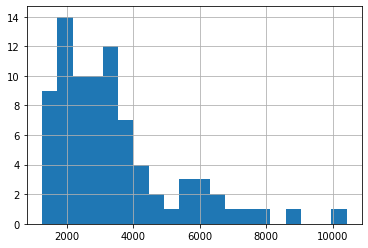

In [220]:
texts_topics_df.groupby('Dominant_Topic').count().Perc_Contribution.hist(bins=20)

In [221]:
texts_topics_df.groupby('Document').count().Dominant_Topic.describe()

count    21257.000000
mean        13.092299
std          3.537881
min          1.000000
25%         11.000000
50%         13.000000
75%         15.000000
max         82.000000
Name: Dominant_Topic, dtype: float64

In [222]:
set(texts_topics_df[texts_topics_df['Conference']=='NIPS'].Year.values)

{1994, 1996, 1998, 2000, 2002, 2004, 2006, 2008, 2010, 2012, 2014, 2016, 2018}

In [278]:
texts_topics_df[(texts_topics_df['Year'].isin(range(2016,2018)))&(texts_topics_df['Conference']=='NIPS')].groupby(
    'Document').count()


,Title,Dominant_Topic,Perc_Contribution,Topic_Keywords,Year,Topic_Name,Conference,topic_type,algorithm,data,task
Document,,,,,,,,,,,
I16-A Bandit Framework for Strategic Regression,13,13,13,13,13,13,13,13,13,13,13
I16-A Bayesian method for reducing bias in neural representational similarity analysis,13,13,13,13,13,13,13,13,13,13,13
I16-A Bio-inspired Redundant Sensing Architecture,19,19,19,19,19,19,19,19,19,19,19
I16-A Communication-Efficient Parallel Algorithm for Decision Tree,17,17,17,17,17,17,17,17,17,17,17
I16-A Comprehensive Linear Speedup Analysis for Asynchronous Stochastic Parallel Optimization from Zeroth-Order to First-Order,14,14,14,14,14,14,14,14,14,14,14
...,...,...,...,...,...,...,...,...,...,...,...
I17-YASS: Yet Another Spike Sorter,16,16,16,16,16,16,16,16,16,16,16
I17-Z-Forcing: Training Stochastic Recurrent Networks,12,12,12,12,12,12,12,12,12,12,12
I17-Zap Q-Learning,14,14,14,14,14,14,14,14,14,14,14


In [242]:
texts_topics_df[(texts_topics_df['Year'].isin(range(1960,2019)))&(texts_topics_df['Conference']!='NIPS')].groupby(
    'Document').count()

,Title,Dominant_Topic,Perc_Contribution,Topic_Keywords,Year,Topic_Name,Conference,topic_type
Document,,,,,,,,
A00-1000,2,2,2,2,2,2,2,2
A00-1001,16,16,16,16,16,16,16,16
A00-1002,16,16,16,16,16,16,16,16
A00-1003,14,14,14,14,14,14,14,14
A00-1004,10,10,10,10,10,10,10,10
...,...,...,...,...,...,...,...,...
W12-2703,6,6,6,6,6,6,6,6
W12-2704,19,19,19,19,19,19,19,19
W12-2705,14,14,14,14,14,14,14,14


In [244]:
# Filter by type
def filter_by_type(df, filter_type, topic_types, all_topic_types=['algorithm', 'data', 'task']):
    if not filter_type:
        df['topic_type'] = df['Dominant_Topic'].apply(lambda t: topic_types[t])
        return df
    df_filtered = pd.DataFrame(df)
    df_filtered['topic_type'] = df_filtered['Dominant_Topic'].apply(lambda t: topic_types[t])
    for topic_type in all_topic_types:
        df_filtered[topic_type] = df_filtered['Dominant_Topic'].apply(lambda t: topic_type in topic_types[t])
    df_filtered = df_filtered[df_filtered[filter_type]==True]
    return df_filtered

In [245]:
texts_topics_df = texts_topics_df[texts_topics_df['Year']>=1978]
texts_topics_df.sort_values('Year')

,Document,Title,Dominant_Topic,Perc_Contribution,Topic_Keywords,Year,Topic_Name,Conference,topic_type
43490,P79-1022,APPLICATIONS,0.0,0.0100,"domain, adaptation, adapt, cross, data, share,...",1978,DOMAIN ADAPTATION,ACL,[task]
33674,P79-1016,Paraphrasing Using Given and New Information i...,67.0,0.1028,"interpretation, ambiguity, ambiguous, processi...",1978,DISAMBIGUATION,ACL,[task]
33673,P79-1016,Paraphrasing Using Given and New Information i...,57.0,0.1084,"question, answer, passage, question_answere, m...",1978,QUESTION ANSWERING,ACL,[task]
43585,P79-1022,APPLICATIONS,95.0,0.0100,"path, factor, ij, lattice, tuple, cache, lengt...",1978,GRAPH-BASED METHODS,ACL,[algorithm]
43584,P79-1022,APPLICATIONS,94.0,0.0100,"frame, slot, schema, filler, framenet, fill, i...",1978,FRAME SEMANTICS,ACL,[algorithm]
...,...,...,...,...,...,...,...,...,...
170234,N18-4001,"Alignment, Acceptance, and Rejection of Group ...",41.0,0.0169,"distribution, probability, sample, variable, l...",2018,PROBABILISTIC,NAACL,[algorithm]
170235,N18-4001,"Alignment, Acceptance, and Rejection of Group ...",65.0,0.0130,"pattern, seed, extraction, acquire, acquisitio...",2018,INFORMATION EXTRACTION?,NAACL,[task]
170237,N18-4001,"Alignment, Acceptance, and Rejection of Group ...",12.0,0.0104,"cluster, clustering, group, induce, merge, cla...",2018,CLUSTERING,NAACL,[algorithm]
170224,N18-4001,"Alignment, Acceptance, and Rejection of Group ...",43.0,0.0933,"alignment, align, link, probability, ibm, alig...",2018,STATISTICAL MACHINE TRANSLATION,NAACL,"[task, algorithm]"


In [246]:
texts_documents_df = texts_topics_df.groupby(['Title'], as_index=False).first()
# count documents per year
documents_per_year = texts_documents_df.groupby('Year').count()[['Document']].to_dict()['Document']
# count individual occurrence of topic per year 
# documents_per_year = texts_topics_df.groupby('Year').count()[['Document']].to_dict()['Document']

top_topics_df = texts_topics_df.groupby(['Dominant_Topic', 'Year'], as_index=False).count()
top_topics_df['Docs_per_year'] = top_topics_df['Year'].apply(lambda y: documents_per_year[y])
top_topics_df['Probability'] = top_topics_df['Document']/top_topics_df['Docs_per_year']
top_topics_df.sort_values('Probability')

top_topics = list(top_topics_df.groupby('Dominant_Topic', as_index=False).sum().sort_values(by='Probability', ascending=False).head(10).Dominant_Topic)
print([topic_names[int(t)] for t in top_topics], top_topics)
top_topics

top_local_topics_df = top_topics_df.groupby('Dominant_Topic',
                                           as_index=False).max().sort_values('Probability', ascending=False)
top_local_topics = list(top_local_topics_df.head(10).Dominant_Topic)
print([topic_names[int(t)] for t in top_local_topics])

top_topics_recent_df = texts_topics_df[texts_topics_df['Year']>2010].groupby(['Dominant_Topic', 'Year'], as_index=False).count()
top_topics_recent_df['Docs_per_year'] = top_topics_recent_df['Year'].apply(lambda y: documents_per_year[y])
top_topics_recent_df['Probability'] = top_topics_recent_df['Document']/top_topics_recent_df['Docs_per_year']
top_recent_topics = list(top_topics_recent_df.groupby('Dominant_Topic', as_index=False).sum().sort_values(by='Probability', ascending=False).head(10).Dominant_Topic)
print([topic_names[int(t)] for t in top_recent_topics])

print(documents_per_year)

['SYNTACTICAL STRUCTURE', 'DISAMBIGUATION', 'CONSTITUENT PARSING', 'LEARNING', 'COMPLEXITY ANALYSIS', 'LOGICAL FORMS', 'QUANTITATIVE ANALYSIS/TEXT MINING', 'PROBABILISTIC', 'LINEAR PROGRAMMING', 'SEQUENCE ANALYSIS'] [38.0, 67.0, 51.0, 40.0, 80.0, 61.0, 73.0, 41.0, 8.0, 93.0]
['DISAMBIGUATION', 'SYNTACTICAL STRUCTURE', 'CONSTITUENT PARSING', 'LEARNING', 'NEURAL NETWORKS/DEEP LEARNING', 'UNIFICATION', 'LOGICAL FORMS', 'QUANTITATIVE ANALYSIS/TEXT MINING', 'PROBABILISTIC', 'SCENE DESCRIPTION']
['LEARNING', 'PROBABILISTIC', 'PREDICTION', 'EMBEDDINGS', 'NEURAL NETWORKS/DEEP LEARNING', 'COMPLEXITY ANALYSIS', 'QUANTITATIVE ANALYSIS/TEXT MINING', 'EVALUATION/ANNOTATION', 'CLASSIFICATION', 'UNSUPERVISED LEARNING']
{1978: 25, 1980: 154, 1982: 182, 1984: 149, 1986: 218, 1988: 220, 1990: 290, 1992: 301, 1994: 460, 1996: 604, 1998: 611, 2000: 652, 2002: 766, 2004: 948, 2006: 1330, 2008: 1582, 2010: 1977, 2012: 2404, 2014: 2100, 2016: 3189, 2018: 2765}


In [247]:
texts_documents_df['Conference'] = texts_documents_df.Document.apply(get_conference)
documents_per_year_acl = texts_documents_df[texts_documents_df['Conference']!='NIPS'].groupby('Year').count()[
    ['Document']].to_dict()['Document']
documents_per_year_nips = texts_documents_df[texts_documents_df['Conference']=='NIPS'].groupby('Year').count()[
    ['Document']].to_dict()['Document']
documents_per_year_nips

{1994: 155,
 1996: 258,
 1998: 259,
 2000: 315,
 2002: 368,
 2004: 399,
 2006: 400,
 2008: 474,
 2010: 575,
 2012: 697,
 2014: 394,
 2016: 1223,
 2018: 991}

In [163]:
nips_years_df[nips_years_df['year'].isin(range(1960,1981))]

,year
name,


In [164]:
def top_topics(df, topic_level_normalization=False):
#     texts_documents_df = df.groupby(['Document'], as_index=False).first()
    # documents_per_year = df.groupby('Year').count()[['Document']].to_dict()['Document']
    if topic_level_normalization:
        # count individual occurrence of topic per year
        documents_per_year = df.groupby('Year').count()[['Document']].to_dict()['Document']
    else:
        # count documents per year
        docs_df = df.groupby(['Document'], as_index=False).first()
        documents_per_year = docs_df.groupby('Year').count()[['Document']].to_dict()['Document']
        
    top_topics_df = df.groupby(['Dominant_Topic', 'Year'], as_index=False).count()
    top_topics_df['Docs_per_year'] = top_topics_df['Year'].apply(lambda y: documents_per_year[y])
    top_topics_df['Probability'] = top_topics_df['Document']/top_topics_df['Docs_per_year']
    top_topics_df.sort_values('Probability')
    top_topics = top_topics_df.groupby('Dominant_Topic', as_index=False).sum().sort_values(by='Probability', ascending=False).head(10).Dominant_Topic
    return top_topics


In [165]:
topic_names

NameError: name 'topic_names' is not defined

### Top topics linguistics

In [248]:
texts_documents_df = texts_topics_df.groupby(['Title'], as_index=False).first()
# count documents per year
documents_per_year_linguistics = texts_documents_df[texts_documents_df['Conference']!='NIPS'].groupby('Year').count()[['Document']].to_dict()['Document']
# count individual occurrence of topic per year 
# documents_per_year_linguistics = texts_topics_df[texts_topics_df['Conference']!='NIPS'].groupby('Year').count()[['Document']].to_dict()['Document']

top_topics_linguistics_df = texts_topics_df[texts_topics_df['Conference']!='NIPS'].groupby(['Dominant_Topic', 'Year'], as_index=False).count()
top_topics_linguistics_df['Docs_per_year'] = top_topics_linguistics_df['Year'].apply(lambda y: documents_per_year_linguistics[y])
top_topics_linguistics_df['Probability'] = top_topics_linguistics_df['Document']/top_topics_df['Docs_per_year']
top_topics_linguistics_df.sort_values('Probability')

top_topics_linguistics = {}

# Filter by type
for filter_type in [None, 'algorithm', 'task']:
    top_topics_linguistics_df_temp = filter_by_type(top_topics_linguistics_df, filter_type, topic_types)
    top_topics_linguistics[str(filter_type)] = list(
        top_topics_linguistics_df_temp.groupby('Dominant_Topic', as_index=False).sum().sort_values(by='Probability', 
        ascending=False).head(10).Dominant_Topic)
    print([(topic_names[int(t)], topic_types[int(t)]) for t in top_topics_linguistics[str(filter_type)]])


# top_local_topics_linguistics_df = top_topics_linguistics_df.groupby('Dominant_Topic',
#                                            as_index=False).max().sort_values('Probability', ascending=False)
# top_local_topics_linguistics = list(top_local_topics_linguistics_df.head(10).Dominant_Topic)
# print([topic_names[int(t)] for t in top_local_topics_linguistics])

pprint(sorted(documents_per_year_linguistics.items(), key=lambda t: t[0]))

[('SYNTACTICAL STRUCTURE', ['task']), ('CONSTITUENT PARSING', ['algorithm']), ('DISAMBIGUATION', ['task']), ('COMPLEXITY ANALYSIS', ['task']), ('SCENE DESCRIPTION', ['task']), ('LOGICAL FORMS', ['algorithm']), ('DICTIONARIES', ['data']), ('NEWS ARTICLES', ['data']), ('SEQUENCE ANALYSIS', ['algorithm']), ('LEXICONS', ['data'])]
[('CONSTITUENT PARSING', ['algorithm']), ('LOGICAL FORMS', ['algorithm']), ('SEQUENCE ANALYSIS', ['algorithm']), ('QUANTITATIVE ANALYSIS/TEXT MINING', ['algorithm']), ('TREES', ['algorithm']), ('GRAMMARS', ['algorithm']), ('LINEAR PROGRAMMING', ['algorithm']), ('FINITE STATE MACHINES', ['algorithm']), ('STATISTICAL MACHINE TRANSLATION', ['task', 'algorithm']), ('PLAN-BASED DIALOGUE', ['task', 'algorithm'])]
[('SYNTACTICAL STRUCTURE', ['task']), ('DISAMBIGUATION', ['task']), ('COMPLEXITY ANALYSIS', ['task']), ('SCENE DESCRIPTION', ['task']), ('UNIFICATION', ['task']), ('CLASSIFICATION', ['task']), ('HUMAN-COMPUTER INTERACTION/APPLICATION', ['task']), ('ASIAN LANGU

In [249]:
top_topics_df = texts_topics_df.groupby(['Dominant_Topic', 'Year'], as_index=False).count()
top_topics_df

,Dominant_Topic,Year,Document,Title,Perc_Contribution,Topic_Keywords,Topic_Name,Conference,topic_type
0,0.0,1978,4,4,4,4,4,4,4
1,0.0,1980,17,17,17,17,17,17,17
2,0.0,1982,22,22,22,22,22,22,22
3,0.0,1984,22,22,22,22,22,22,22
4,0.0,1986,25,25,25,25,25,25,25
...,...,...,...,...,...,...,...,...,...
1714,99.0,2010,260,260,260,260,260,260,260
1715,99.0,2012,305,305,305,305,305,305,305
1716,99.0,2014,231,231,231,231,231,231,231
1717,99.0,2016,436,436,436,436,436,436,436


In [250]:
top_topics_df = texts_topics_df.groupby(['Dominant_Topic', 'Year'], as_index=False).count()
top_topics_df['Docs_per_year'] = top_topics_df['Year'].apply(lambda y: documents_per_year[y])
top_topics_df['Probability'] = top_topics_df['Document']/top_topics_df['Docs_per_year']
# top_topics_df.sort_values('Probability')
top_topics_df.groupby('Dominant_Topic', as_index=False).agg({'Probability': np.sum, 
                                                             'Topic_Name': lambda x: x.iloc[0]}).sort_values(by='Probability', ascending=False)

,Dominant_Topic,Probability,Topic_Name
33,38.0,9.511043,16
54,67.0,7.808724,21
41,51.0,7.390159,12
35,40.0,7.004157,1
65,80.0,6.755824,6
...,...,...,...
4,4.0,1.306028,1
9,9.0,1.274417,3
62,76.0,1.227514,1
28,31.0,1.080425,1


In [251]:
top_topics_linguistics_df.groupby('Dominant_Topic', as_index=False).sum().sort_values(by='Probability', ascending=False)

,Dominant_Topic,Year,Document,Title,Perc_Contribution,Topic_Keywords,Topic_Name,Conference,Docs_per_year,Probability,algorithm,data,task
33,38.0,41958,6022,6022,6022,6022,6022,6022,14419,9.186061,0,0,21
41,51.0,41958,4283,4283,4283,4283,4283,4283,14419,7.032853,21,0,0
54,67.0,41958,2651,2651,2651,2651,2651,2651,14419,6.501511,0,0,21
65,80.0,41958,3448,3448,3448,3448,3448,3448,14419,5.940565,0,0,21
81,99.0,41958,1924,1924,1924,1924,1924,1924,14419,5.725880,0,0,21
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7,7.0,39970,1405,1405,1405,1405,1405,1405,14199,0.993931,20,0,0
4,4.0,41958,1548,1548,1548,1548,1548,1548,14419,0.985370,0,0,21
28,31.0,41958,1127,1127,1127,1127,1127,1127,14419,0.820193,0,0,21
61,74.0,41958,885,885,885,885,885,885,14419,0.739842,0,0,21


### Top topics NIPS

In [252]:
# filter_type="algorithm"
texts_documents_df = texts_topics_df.groupby(['Title'], as_index=False).first()
# count documents per year
documents_per_year_nips = texts_documents_df[texts_documents_df['Conference']=='NIPS'].groupby('Year').count()[['Document']].to_dict()['Document']

top_topics_nips_df = texts_topics_df[texts_topics_df['Conference']=='NIPS'].groupby(['Dominant_Topic', 'Year'], as_index=False).count()
top_topics_nips_df['Docs_per_year'] = top_topics_nips_df['Year'].apply(lambda y: documents_per_year_nips[y])
top_topics_nips_df['Probability'] = top_topics_nips_df['Document']/top_topics_nips_df['Docs_per_year']
top_topics_nips_df.sort_values('Probability')

top_topics_nips = {}

for filter_type in [None, 'algorithm', 'task']:
    top_topics_nips_df_temp = filter_by_type(top_topics_nips_df, filter_type, topic_types)
    top_topics_nips[str(filter_type)] = list(
        top_topics_nips_df_temp.groupby('Dominant_Topic', as_index=False).sum().sort_values(by='Probability', 
        ascending=False).head(10).Dominant_Topic)
    print([(topic_names[int(t)], topic_types[int(t)]) for t in top_topics_nips[str(filter_type)]])
    
top_local_topics_nips_df = top_topics_nips_df.groupby('Dominant_Topic',
                                           as_index=False).max().sort_values('Probability', ascending=False)
top_local_topics_nips = list(top_local_topics_nips_df.head(10).Dominant_Topic)
print([(topic_names[int(t)], topic_types[int(t)]) for t in top_local_topics_nips])

print(documents_per_year_nips)

[('LEARNING', ['algorithm']), ('PROBABILISTIC', ['algorithm']), ('COMPLEXITY ANALYSIS', ['task']), ('LINEAR PROGRAMMING', ['algorithm']), ('QUANTITATIVE ANALYSIS/TEXT MINING', ['algorithm']), ('EMBEDDINGS', ['algorithm']), ('PREDICTION', ['task']), ('NEURAL NETWORKS/DEEP LEARNING', ['algorithm']), ('SEQUENCE ANALYSIS', ['algorithm']), ('LOGICAL FORMS', ['algorithm'])]
[('LEARNING', ['algorithm']), ('PROBABILISTIC', ['algorithm']), ('LINEAR PROGRAMMING', ['algorithm']), ('QUANTITATIVE ANALYSIS/TEXT MINING', ['algorithm']), ('EMBEDDINGS', ['algorithm']), ('NEURAL NETWORKS/DEEP LEARNING', ['algorithm']), ('SEQUENCE ANALYSIS', ['algorithm']), ('LOGICAL FORMS', ['algorithm']), ('UNSUPERVISED LEARNING', ['algorithm']), ('REINFORCEMENT LEARNING', ['algorithm'])]
[('COMPLEXITY ANALYSIS', ['task']), ('PREDICTION', ['task']), ('VISION/MULTIMODAL', ['task']), ('CLASSIFICATION', ['task']), ('DISAMBIGUATION', ['task']), ('SPELLING CORRECTION', ['task']), ('SCENE DESCRIPTION', ['task']), ('HISTORICA

### Top varying topics

In [253]:
top_varying_topics = {}

# Filter by type
for filter_type in [None, 'algorithm', 'task']:
    texts_topics_df_temp = filter_by_type(texts_topics_df, filter_type, topic_types)
    top_varying_topics_df = texts_topics_df_temp.groupby(['Dominant_Topic', 'Year']).count().groupby('Dominant_Topic').std()
    top_varying_topics_df.sort_values('Document', ascending=False)
    top_varying_topics[str(filter_type)] = list(top_varying_topics_df.sort_values('Document', ascending=False).head(10).index)
    print([(topic_names[int(t)], topic_types[int(t)]) for t in top_varying_topics[str(filter_type)]])
    
# [topic_names[int(t)] for t in top_topics]
# most_varying_topics_df['amplitude'] = most_varying_topics
top_varying_topics
[(topic_names[int(t)], topic_types[int(t)]) for t in top_varying_topics['None']]

# top_varying_topics_df

[('LEARNING', ['algorithm']), ('PROBABILISTIC', ['algorithm']), ('NEURAL NETWORKS/DEEP LEARNING', ['algorithm']), ('PREDICTION', ['task']), ('EMBEDDINGS', ['algorithm']), ('COMPLEXITY ANALYSIS', ['task']), ('QUANTITATIVE ANALYSIS/TEXT MINING', ['algorithm']), ('EVALUATION/ANNOTATION', ['task']), ('CLASSIFICATION', ['task']), ('UNSUPERVISED LEARNING', ['algorithm'])]
[('LEARNING', ['algorithm']), ('PROBABILISTIC', ['algorithm']), ('NEURAL NETWORKS/DEEP LEARNING', ['algorithm']), ('EMBEDDINGS', ['algorithm']), ('QUANTITATIVE ANALYSIS/TEXT MINING', ['algorithm']), ('UNSUPERVISED LEARNING', ['algorithm']), ('RECURRENT NEURAL NETWORKS', ['algorithm']), ('LINEAR PROGRAMMING', ['algorithm']), ('SEQUENCE ANALYSIS', ['algorithm']), ('NEURAL MACHINE TRANSLATION', ['task', 'algorithm'])]
[('PREDICTION', ['task']), ('COMPLEXITY ANALYSIS', ['task']), ('EVALUATION/ANNOTATION', ['task']), ('CLASSIFICATION', ['task']), ('NEURAL MACHINE TRANSLATION', ['task', 'algorithm']), ('POS TAGGING/STATISTICAL PA

[('LEARNING', ['algorithm']),
 ('PROBABILISTIC', ['algorithm']),
 ('NEURAL NETWORKS/DEEP LEARNING', ['algorithm']),
 ('PREDICTION', ['task']),
 ('EMBEDDINGS', ['algorithm']),
 ('COMPLEXITY ANALYSIS', ['task']),
 ('QUANTITATIVE ANALYSIS/TEXT MINING', ['algorithm']),
 ('EVALUATION/ANNOTATION', ['task']),
 ('CLASSIFICATION', ['task']),
 ('UNSUPERVISED LEARNING', ['algorithm'])]

In [254]:

bottom_varying_topics = list(top_varying_topics_df.sort_values('Document', ascending=True).head(10).index)
[topic_names[int(t)] for t in bottom_varying_topics]

['UNIFICATION',
 'PHONOLOGY',
 'MULTI-WORD EXPRESSIONS',
 'ANAPHORA/COREFERENCE RESOLUTION',
 'ASIAN LANGUAGES',
 'DISCOURSE',
 'PLAN-BASED DIALOGUE',
 'MORPHOLOGY',
 'EVENT EXTRACTION',
 'ARGUMENT MINING']

In [255]:
top_increasing_topics_df = texts_topics_df.groupby(['Dominant_Topic', 'Year']).count().groupby('Dominant_Topic').pct_change()
top_increasing_topics = list(top_increasing_topics_df.sort_values('Document', ascending=False).head(10).index.labels[0])
# top_decreasing_topics = list(top_increasing_topics_df.sort_values('Document', ascending=True).head(10).index.labels[0])
# top_decreasing_topics

AttributeError: 'MultiIndex' object has no attribute 'labels'

In [256]:
# topics_in_jurafsky_increasing = [78, 8, 63, 40, 41, 68, 92] # classification, probabilistic models, stat parsing, stat mt, lexical semantics
# # topics_in_jurafsky = [] # computational semantics, conceptual semantics, plan-based dialogue and discourse
# # topics_in_jurafsky = [] # plan-based dialogue, dialogue systems
# topics_in_jurafsky_peaked = [95, 25, 74, 58, 96, 86, 1] # TAG, generation, automata, unification, syntactic structure, events, WSD

topics_in_jurafsky_increasing = [92, 41, 43, 39] # classification, probabilistic models, stat parsing, stat mt, lexical semantics
# topics_in_jurafsky = [] # computational semantics, conceptual semantics, plan-based dialogue and discourse
# topics_in_jurafsky = [56, 48] # plan-based dialogue, dialogue systems
topics_in_jurafsky_peaked = [21, 1, 22, 38, 17, 67, 87] # TAG, generation, automata, unification, syntactic structure, events, WSD

In [257]:
neural_topics = [69, 78, 79, 40, 55]

{1978: 25, 1980: 70, 1982: 63, 1984: 149, 1986: 75, 1988: 69, 1990: 95, 1992: 102, 1994: 109, 1996: 131, 1998: 334, 2000: 106, 2002: 160, 2004: 263, 2006: 508, 2008: 461, 2010: 606, 2012: 618, 2014: 683, 2016: 728, 2018: 428}
{2006: 128, 2008: 276, 2010: 271, 2012: 341, 2014: 533, 2016: 606, 2018: 571}
{1980: 84, 1982: 119, 1986: 143, 1988: 151, 1990: 195, 1992: 199, 1994: 196, 1996: 215, 1998: 88, 2000: 116, 2002: 141, 2004: 181, 2008: 196, 2010: 348, 2012: 398, 2014: 254, 2016: 409, 2018: 373}
{1994: 155, 1996: 258, 1998: 259, 2000: 315, 2002: 368, 2004: 399, 2006: 400, 2008: 474, 2010: 575, 2012: 697, 2014: 394, 2016: 1223, 2018: 991}
{2000: 115, 2002: 98, 2004: 105, 2006: 294, 2008: 176, 2010: 177, 2012: 352, 2014: 236, 2016: 224, 2018: 403}


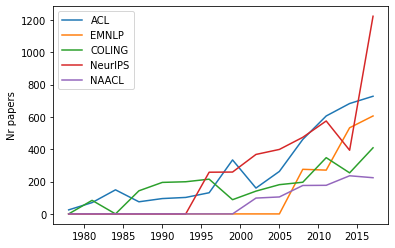

In [267]:
def plot_for_conference(conferences=None, years = range(1978, 2018, 3), topic_type=None):
    texts_topics_df_filtered = texts_topics_df
    if topic_type:
        texts_topics_df_filtered['topic_type'] = texts_topics_df_filtered['Dominant_Topic'].apply(
            lambda t:topic_types[t])
        texts_topics_df_filtered = texts_topics_df_filtered[texts_topics_df_filtered['topic_type']==topic_type]
    documents_per_year = texts_topics_df_filtered[texts_topics_df_filtered['Conference'].isin(conferences)
                                                     ].groupby('Title', as_index=False).first().groupby('Year').count()[['Document']].to_dict()['Document']
    print(documents_per_year)
    conferences = [c if c!='NIPS' else 'NeurIPS' for c in conferences]
    if topic_type:
        label=",".join(conferences + [topic_type])
    else:
        label=",".join(conferences)
    plt.plot(years, [documents_per_year.get(y, 0)+documents_per_year.get(y-1, 0) 
                     for y in years], label=label)
    plt.ylabel('Nr papers')
    plt.legend()
plot_for_conference(['ACL'], topic_type="")
# plot_for_conference(['ACL'], topic_type="task")
plot_for_conference(['EMNLP'], topic_type="")
# plot_for_conference(['EMNLP'], topic_type="task")
plot_for_conference(['COLING'], topic_type="")
# plot_for_conference(['COLING'], topic_type="task")
plot_for_conference(['NIPS'], topic_type="")
# plot_for_conference(['NIPS'], topic_type="task")
plot_for_conference(['NAACL'], topic_type="")
# TODO: filtering by type has a bug. counts are the same for any type

In [241]:
def plot_for_topics(topics, all_years = range(1978, 2018, 2), conferences=None, size=(7,5), smooth_win=3):
    ax = plt.figure(figsize=size)
    styles = ['-', '--', ':', "-.", '.']
    for t, topic in enumerate(topics):
        if conferences:
            documents_per_year = texts_topics_df[texts_topics_df['Conference'].isin(conferences)
                                                 ].groupby('Title', as_index=False).first().groupby('Year').count()[['Document']].to_dict()['Document']
        else:
            documents_per_year = texts_topics_df.groupby('Title', as_index=False).first().groupby('Year').count()[['Document']].to_dict()['Document']
        top_texts_topics_df = texts_topics_df.loc[texts_topics_df.Dominant_Topic.isin(topics)]
        if conferences:
            top_texts_topics_df = top_texts_topics_df.loc[top_texts_topics_df.Conference.isin(conferences)]
        top_topics_per_year = top_texts_topics_df.groupby(['Dominant_Topic', 'Year']).count().reset_index()
        topic_counts = top_topics_per_year[top_topics_per_year['Dominant_Topic']==topic][[
            'Year', 'Document']].values
        years = [t[0] for t in topic_counts]
        counts = [float(t[1])/documents_per_year[t[0]] for t in topic_counts]
        all_counts = [0 for y in all_years]
        j = 0
        for i in range(len(all_years)):
            if all_years[i] not in years:
                continue
            all_counts[i] = float(counts[j])
            j += 1
        df = pd.DataFrame({'years': list(all_years), 'probs': all_counts}, columns=['years', 'probs'])
        df = df.rolling(smooth_win, 1).mean()
        ax = plt.plot(df['years'], df['probs'], styles[t%len(styles)], label=topic_names[int(topic)] + 
                      " (%s)"%",".join(topic_types[int(topic)])[:10])
        plt.xlabel('Year')
        plt.ylabel('Probability')
    plt.legend()
    list(range(18))
    plt.yticks = range(0, 18, 1)
# plot_for_topics(top_topics_linguistics[:5], conferences=['ACL', 'EMNLP', 'COLING', 'NAACL'], smooth_win=2)



In [242]:
top_topics_linguistics['None']

[38.0, 51.0, 67.0, 80.0, 99.0, 84.0, 61.0, 98.0, 93.0, 50.0]

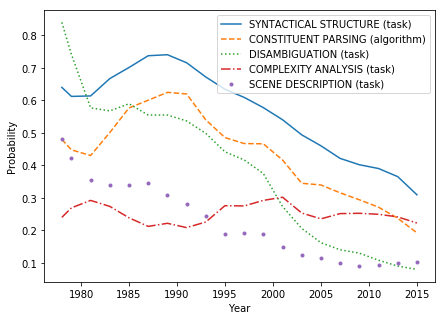

In [243]:
plot_for_topics(top_topics_linguistics['None'][:5], conferences=['ACL', 'EMNLP', 'COLING', 'NAACL'], smooth_win=2)


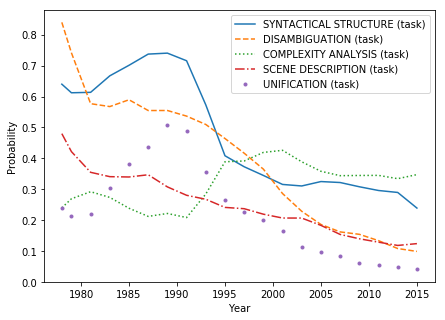

In [244]:
plot_for_topics(top_topics_linguistics['task'][:5], smooth_win=2)

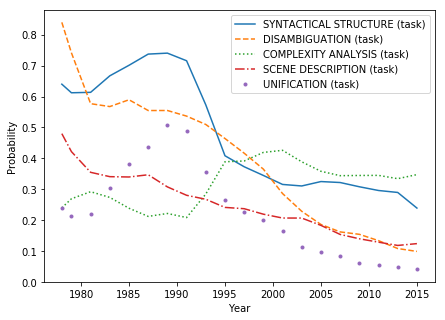

In [245]:
plot_for_topics(top_topics_linguistics['algorithm'][:5], smooth_win=2)

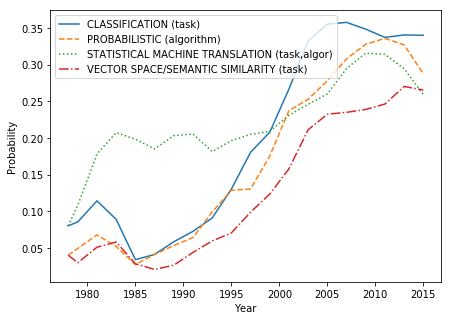

In [246]:
plot_for_topics(topics_in_jurafsky_increasing, conferences=['ACL', 'EMNLP', 'COLING', 'NAACL'], smooth_win=2)


{2006, 2008, 2010, 2012, 2014, 2016}

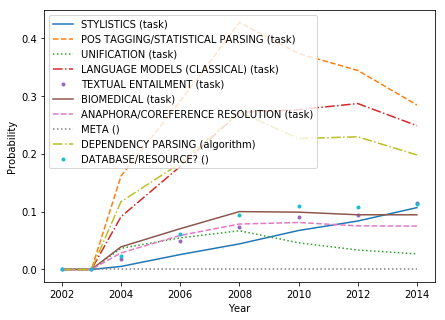

In [247]:
plot_for_topics(range(20,30), conferences=['EMNLP'], smooth_win=3, all_years=range(2002,2018,2))
set(texts_topics_df[texts_topics_df['Conference']=='EMNLP'].Year)

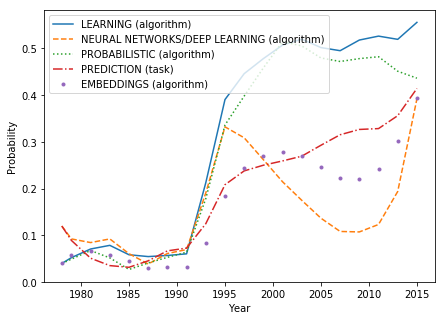

In [248]:
plot_for_topics(top_varying_topics['None'][:5], smooth_win=2)


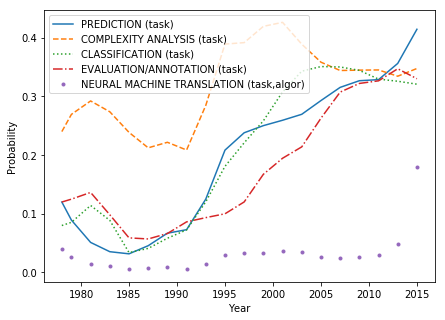

In [249]:
plot_for_topics(top_varying_topics['task'][:5], smooth_win=2)


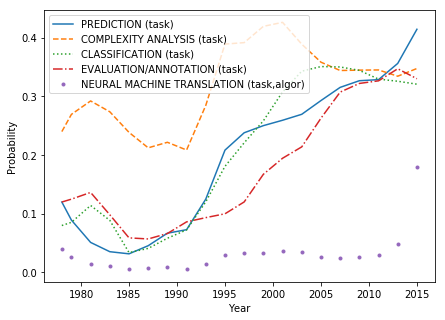

In [250]:
plot_for_topics(top_varying_topics['algorithm'][:5], smooth_win=2)


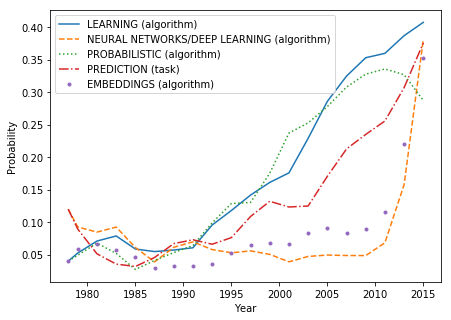

In [251]:
plot_for_topics(top_varying_topics['None'][:5], conferences=['ACL', 'EMNLP', 'COLING', 'NAACL'], smooth_win=2)


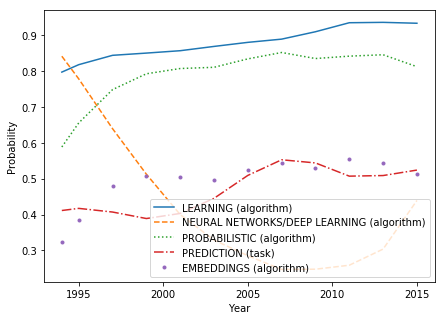

In [252]:
plot_for_topics(top_varying_topics['None'][:5], conferences=['NIPS'], smooth_win=2, all_years=range(1994,2018,2))
# plot_for_topics(bottom_varying_topics[:5], conferences=['ACL', 'EMNLP', 'COLING', 'NAACL'])


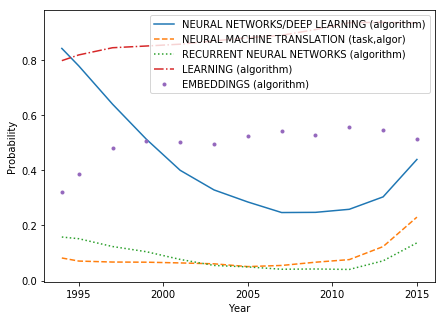

In [253]:
plot_for_topics(neural_topics, conferences=['NIPS'], all_years=range(1994,2018,2), smooth_win=2)

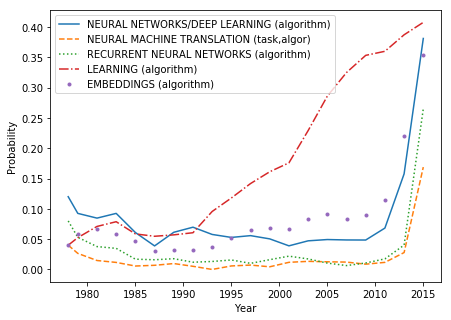

In [254]:
plot_for_topics(neural_topics, conferences=['ACL', 'EMNLP', 'COLING', 'NAACL'], smooth_win=2)

<Figure size 648x288 with 0 Axes>

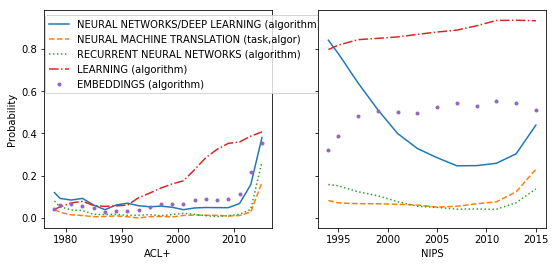

In [618]:
# Subplots in parallel
def subplots_for_topics(topics, all_years_all = (range(1978, 2018, 2),), conferences_all=None, size=(7,5), smooth_win=3):
    ax = plt.figure(figsize=size)
    styles = ['-', '--', ':', "-.", '.']
    ax1=None
    plt.subplots(1,2,sharey=True, figsize=size)
    for c, conferences in enumerate(conferences_all):
        ax1=plt.subplot(1, 2, c+1, sharey=ax1)
        all_years = all_years_all[c]
        for t, topic in enumerate(topics):
            if conferences:
                documents_per_year = texts_topics_df[texts_topics_df['Conference'].isin(conferences)
                                                     ].groupby('Title', as_index=False).first().groupby('Year').count()[['Document']].to_dict()['Document']
            else:
                documents_per_year = texts_topics_df.groupby('Title', as_index=False).first().groupby('Year').count()[['Document']].to_dict()['Document']
            top_texts_topics_df = texts_topics_df.loc[texts_topics_df.Dominant_Topic.isin(topics)]
            if conferences:
                top_texts_topics_df = top_texts_topics_df.loc[top_texts_topics_df.Conference.isin(conferences)]
            top_topics_per_year = top_texts_topics_df.groupby(['Dominant_Topic', 'Year']).count().reset_index()
            topic_counts = top_topics_per_year[top_topics_per_year['Dominant_Topic']==topic][[
                'Year', 'Document']].values
            years = [t[0] for t in topic_counts]
            counts = [float(t[1])/documents_per_year[t[0]] for t in topic_counts]
            all_counts = [0 for y in all_years]
            j = 0
            for i in range(len(all_years)):
                if all_years[i] not in years:
                    continue
                all_counts[i] = float(counts[j])
                j += 1
            df = pd.DataFrame({'years': list(all_years), 'probs': all_counts}, columns=['years', 'probs'])
            df = df.rolling(smooth_win, 1).mean()
            ax = plt.plot(df['years'], df['probs'], styles[t%len(styles)], label=topic_names[int(topic)] + 
                          " (%s)"%",".join(topic_types[int(topic)])[:10])
            if c==0:
                plt.xlabel('ACL+')
            else:
                plt.xlabel("NIPS")
        # only put legend on first subplot

        if c==0:
            plt.yticks = range(0, 18, 1)
            plt.ylabel('Probability')
            plt.legend(loc='upper right', bbox_to_anchor=(1.25, 1))
        else:
            plt.setp(ax1.get_yticklabels(), visible=False)

    
# plot_for_topics(top_topics_linguistics[:5], conferences=['ACL', 'EMNLP', 'COLING', 'NAACL'], smooth_win=2)

subplots_for_topics(neural_topics, conferences_all=[['ACL', 'EMNLP', 'COLING', 'NAACL'], ['NIPS']], 
                    all_years_all=(range(1978,2018,2),range(1994,2018,2)), smooth_win=2, size=(9,4))

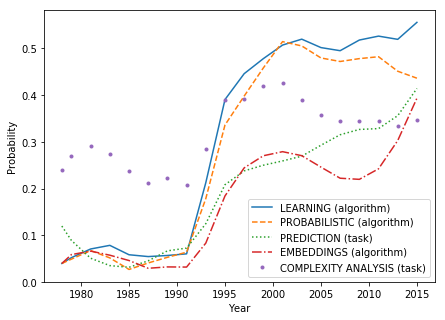

In [255]:
plot_for_topics(top_recent_topics[:5], smooth_win=2)

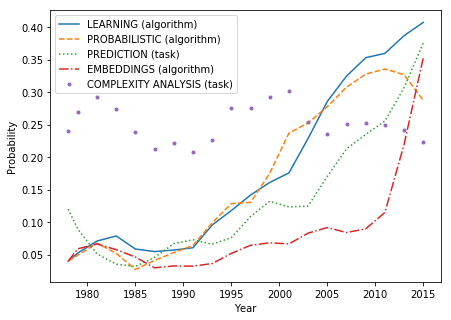

In [256]:
plot_for_topics(top_recent_topics[:5], conferences=['ACL', 'EMNLP', 'COLING', 'NAACL'], smooth_win=2)

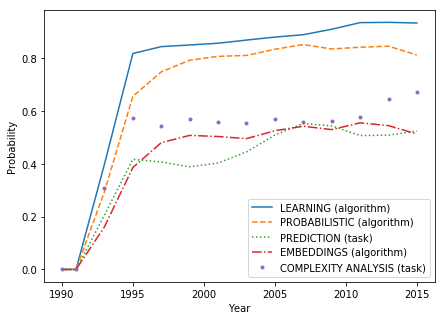

In [257]:
plot_for_topics(top_recent_topics[:5], conferences=['NIPS'], all_years=range(1990,2018,2), smooth_win=2)

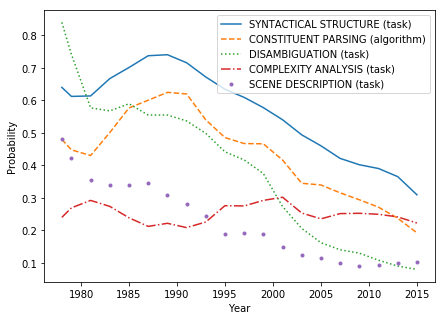

In [258]:
plot_for_topics(top_topics_linguistics['None'][:5], conferences=['ACL', 'EMNLP', 'COLING', 'NAACL'], smooth_win=2)

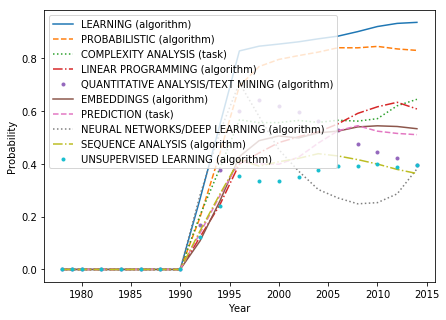

In [259]:
plot_for_topics(top_topics_nips['None'], conferences=['NIPS'])

In [86]:
#pickle.dump(texts_topics_df, open("texts_topics_all_multitopic2.pkl.bak", "wb+"))

In [101]:
#texts_topics_df = pickle.load(open("texts_topics_all_all_multitopic.pkl", "rb"))

In [102]:
gensim.models.word2vec.train_batch_sg?

## Idea relationships

In [288]:
from scipy.stats.stats import pearsonr
import numpy as np
pmis = {}
corrs = {}


In [372]:

def pmi(topic1, topic2, df):
    # TODO: should compute probabilities instead of frequencies? or is it the same?
    document_topic_df = df[['Document', 'Dominant_Topic']]
    topic1_docs = document_topic_df[document_topic_df['Dominant_Topic']==topic1].Document.values
    topic2_docs = document_topic_df[document_topic_df['Dominant_Topic']==topic2].Document.values
    freq1 = np.unique(topic1_docs).size
    freq2 = np.unique(topic2_docs).size
    cooc_freq = np.intersect1d(topic1_docs, topic2_docs).size # TODO: unique?
    if not freq1 or not freq2:
        return -1
    return cooc_freq/(freq1*freq2)

def compute_pmis(df, pmis):
    for topic1 in range(100):
        for topic2 in range(100):
            if topic1 < topic2:
                pmi_score = pmi(topic1, topic2, df)
#                 if pmi_score < 0:
#                     continue
#                 assert(pmi_score == pmi(topic2, topic1))
                print(topic1, topic2, topic_names[topic1], topic_names[topic2], pmi_score)
                pmis[(topic1, topic2)] = {'names': [topic_names[topic1], topic_names[topic2]], 'score': pmi_score}

def _probs_for_topic(topic, df, time_range=range(1978, 2018)):
    counts_per_year = df[df['Dominant_Topic']==topic].groupby('Year', as_index=False).count()
    documents_per_year = df.groupby(['Document'], as_index=False).first().groupby('Year').count()[['Document']].to_dict()['Document']
    counts_per_year['Docs_per_year'] = counts_per_year['Year'].apply(lambda y: documents_per_year[y])
    counts_per_year['Probability'] = counts_per_year['Document']/counts_per_year['Docs_per_year']
    counts_per_year = counts_per_year.set_index('Year')
    probs = counts_per_year.reindex(time_range, fill_value=0).Probability.values
    return probs

def corr(topic1, topic2, df, time_range=range(1978, 2018)):
    c1 = _probs_for_topic(topic1, df, time_range=time_range)
    c2 = _probs_for_topic(topic2, df, time_range=time_range)
    corr = pearsonr(c1, c2)
    return corr[0]

def compute_corrs(df, corrs, time_range=range(1978,2018)):
    for topic1 in range(100):
        for topic2 in range(100):
            if topic1 < topic2:
                corr_coef = corr(topic1, topic2, df, time_range=time_range)
                if np.isnan(corr_coef):
                    continue
#                 assert(corr_coef == corr(topic2, topic1))
                print(topic1, topic2, topic_names[topic1], topic_names[topic2], corr_coef)
                corrs[(topic1, topic2)] = {'names': [topic_names[topic1], topic_names[topic2]], 'score': corr_coef}

# df = texts_topics_df[texts_topics_df['Conference']!='NIPS']
# compute_corrs(df, pmis)
# # _probs_for_topic(10)
# compute_pmis(df, corrs)

In [290]:
strengths={}

pmi_mean = pd.Series(list([pmis[p]['score'] for p in pmis if pmis[p]['score']>-1])).mean()
pmi_std = pd.Series(list([pmis[p]['score'] for p in pmis if pmis[p]['score']>-1])).std()
corr_mean = pd.Series(list([corrs[p]['score'] for p in corrs])).mean()
corr_std = pd.Series(list([corrs[p]['score'] for p in corrs])).std()

for topicpair in pmis.keys():
    if topicpair in corrs.keys():
#         pmi_score = np.log(pmis[pair]['score']-pmi_med)
#         pmi_score = pmis[pair]['score']
        pmi_score = (pmis[topicpair]['score'] - pmi_mean) / pmi_std
        corr_score = (corrs[topicpair]['score'] - corr_mean) / corr_std
        strength = abs(pmi_score*corr_score)
        strengths[topicpair] = {'names': corrs[topicpair]['names'], 'score': strength}
#     else:
#         print("missing key", topicpair)

sorted_strengths = sorted(strengths.items(), key=lambda t: t[1]['score'], reverse=True)
sorted_strengths

[((78, 79),
  {'names': ['NEURAL MACHINE TRANSLATION', 'RECURRENT NEURAL NETWORKS'],
   'score': 13.035661825683936}),
 ((69, 79),
  {'names': ['NEURAL NETWORKS/DEEP LEARNING', 'RECURRENT NEURAL NETWORKS'],
   'score': 7.647935008973596}),
 ((6, 56),
  {'names': ['REINFORCEMENT LEARNING', 'PLAN-BASED DIALOGUE'],
   'score': 6.931335650607233}),
 ((22, 78),
  {'names': ['UNIFICATION', 'NEURAL MACHINE TRANSLATION'],
   'score': 6.272543930472249}),
 ((69, 78),
  {'names': ['NEURAL NETWORKS/DEEP LEARNING', 'NEURAL MACHINE TRANSLATION'],
   'score': 6.1620038666544295}),
 ((22, 79),
  {'names': ['UNIFICATION', 'RECURRENT NEURAL NETWORKS'],
   'score': 6.1413269855808625}),
 ((2, 19), {'names': ['MORPHOLOGY', 'PHONOLOGY'], 'score': 6.108973281217922}),
 ((26, 36),
  {'names': ['ANAPHORA/COREFERENCE RESOLUTION', 'DISCOURSE'],
   'score': 5.849500408373829}),
 ((9, 20),
  {'names': ['ARGUMENT MINING', 'STYLISTICS'], 'score': 5.473813286757019}),
 ((52, 76),
  {'names': ['MULTILINGUALITY', 'CR

In [291]:
friendship = {}
arms_race = {}
tryst = {}
head_to_head = {}

pmi_med = pd.Series(list([pmis[p]['score'] for p in pmis if pmis[p]['score']>-1])).median()
corr_med = pd.Series(list([corrs[p]['score'] for p in corrs])).median()


for pair, strength in strengths.items():
    if pmis[pair]['score']-pmi_med > 0 and corrs[pair]['score']-corr_med > 0:
        friendship[pair] = {'names': strength['names'], 'score': strength['score']}
    elif pmis[pair]['score']-pmi_med > 0 and corrs[pair]['score']-corr_med < 0:
        tryst[pair] = {'names': strength['names'], 'score': strength['score']}
    elif pmis[pair]['score']-pmi_med < 0 and corrs[pair]['score']-corr_med < 0:
        head_to_head[pair] = {'names': strength['names'], 'score': strength['score']}
    elif pmis[pair]['score']-pmi_med < 0 and corrs[pair]['score']-corr_med > 0:
        arms_race[pair] = {'names': strength['names'], 'score': strength['score']}
    

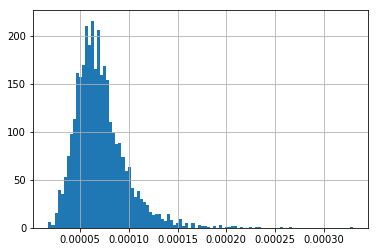

In [292]:
pd.Series([pmis[p]['score'] for p in pmis if pmis[p]['score']>-1]).hist(bins=100)


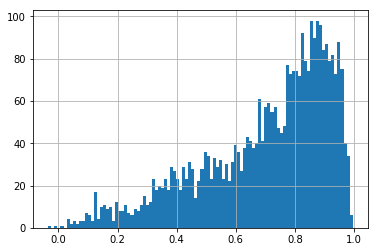

In [293]:
pd.Series([corrs[p]['score'] for p in corrs]).hist(bins=100)

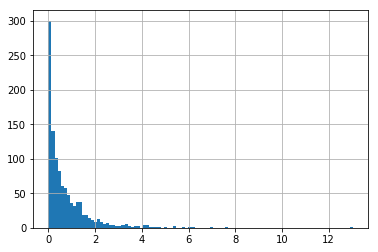

In [351]:
pd.Series([friendship[p]['score'] for p in friendship]).hist(bins=100)

In [ ]:
pd.Series([arms_race[p]['score'] for p in arms_race]).hist(bins=100)

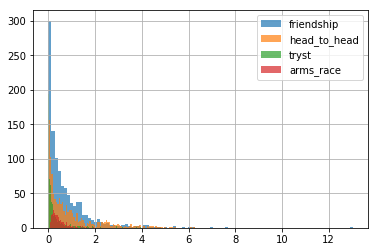

In [361]:
pd.Series([friendship[p]['score'] for p in friendship]).hist(bins=100, label="friendship", alpha=0.7)
pd.Series([head_to_head[p]['score'] for p in head_to_head]).hist(bins=100, label="head_to_head", alpha=0.7)

pd.Series([tryst[p]['score'] for p in tryst]).hist(bins=100, label="tryst", alpha=0.7)
pd.Series([arms_race[p]['score'] for p in arms_race]).hist(bins=100, label="arms_race", alpha=0.7)

plt.legend()

In [364]:
print("friendhsip", pd.Series([friendship[p]['score'] for p in friendship]).describe())
print("head_to_head", pd.Series([head_to_head[p]['score'] for p in head_to_head]).describe())

print("arms_race", pd.Series([arms_race[p]['score'] for p in arms_race]).describe())
print("tryst", pd.Series([tryst[p]['score'] for p in tryst]).describe())


friendhsip count    1084.000000
mean        0.736890
std         1.007023
min         0.000234
25%         0.115911
50%         0.396172
75%         1.007878
max        13.035662
dtype: float64
head_to_head count    1085.000000
mean        0.899537
std         1.074527
min         0.000350
25%         0.132426
50%         0.504393
75%         1.196572
max         6.272544
dtype: float64
arms_race count    575.000000
mean       0.437270
std        0.297238
min        0.054133
25%        0.213378
50%        0.366225
75%        0.580040
max        1.948107
dtype: float64
tryst count    575.000000
mean       0.255143
std        0.456510
min        0.000093
25%        0.023073
50%        0.094624
75%        0.271441
max        3.980244
dtype: float64


In [294]:
len(friendship), len(head_to_head), len(arms_race), len(tryst)

(1084, 1085, 575, 575)

5.1328267217356
[((78, 79),
  {'names': ['NEURAL MACHINE TRANSLATION', 'RECURRENT NEURAL NETWORKS'],
   'score': 13.035661825683936}),
 ((69, 79),
  {'names': ['NEURAL NETWORKS/DEEP LEARNING', 'RECURRENT NEURAL NETWORKS'],
   'score': 7.647935008973596}),
 ((6, 56),
  {'names': ['REINFORCEMENT LEARNING', 'PLAN-BASED DIALOGUE'],
   'score': 6.931335650607233}),
 ((69, 78),
  {'names': ['NEURAL NETWORKS/DEEP LEARNING', 'NEURAL MACHINE TRANSLATION'],
   'score': 6.1620038666544295}),
 ((2, 19), {'names': ['MORPHOLOGY', 'PHONOLOGY'], 'score': 6.108973281217922}),
 ((26, 36),
  {'names': ['ANAPHORA/COREFERENCE RESOLUTION', 'DISCOURSE'],
   'score': 5.849500408373829}),
 ((9, 20),
  {'names': ['ARGUMENT MINING', 'STYLISTICS'], 'score': 5.473813286757019}),
 ((52, 76),
  {'names': ['MULTILINGUALITY', 'CROSS-LINGUAL/PARALLEL CORPORA'],
   'score': 5.430862855698186}),
 ((4, 81),
  {'names': ['SENTIMENT ANALYSIS', 'OPINION MINING'],
   'score': 5.030999246419933}),
 ((22, 60), {'names': ['UNIFI

 ((14, 51),
  {'names': ['GENERATION', 'CONSTITUENT PARSING'],
   'score': 0.7240147056766356}),
 ((71, 90),
  {'names': ['ONTOLOGIES', 'COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING'],
   'score': 0.7238467250787537}),
 ((13, 30),
  {'names': ['LANGUAGE ACQUISITION/SIMPLIFICATION', 'SOCIAL MEDIA'],
   'score': 0.7217745621781532}),
 ((80, 95),
  {'names': ['COMPLEXITY ANALYSIS', 'GRAPH-BASED METHODS'],
   'score': 0.7204147439181169}),
 ((34, 39),
  {'names': ['EVALUATION/ANNOTATION', 'VECTOR SPACE/SEMANTIC SIMILARITY'],
   'score': 0.717375249323715}),
 ((43, 86),
  {'names': ['STATISTICAL MACHINE TRANSLATION', 'HISTORICAL LINGUISTICS'],
   'score': 0.7164254455669004}),
 ((35, 71),
  {'names': ['SEMANTIC ROLE LABELING', 'ONTOLOGIES'],
   'score': 0.7157390113601999}),
 ((15, 92),
  {'names': ['NAMED ENTITY RECOGNITION', 'CLASSIFICATION'],
   'score': 0.7154783711148556}),
 ((7, 63), {'names': ['SVMs', 'KNOWLEDGE BASE'], 'score': 0.7154243739425611}),
 ((23, 43),
  {'names': ['LANGUAG

 ((2, 90),
  {'names': ['MORPHOLOGY', 'COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING'],
   'score': 0.42191125506906546}),
 ((32, 52),
  {'names': ['SPELLING CORRECTION', 'MULTILINGUALITY'],
   'score': 0.4187740682341421}),
 ((1, 29),
  {'names': ['FINITE STATE MACHINES', 'DATABASE/RESOURCE?'],
   'score': 0.41694353290451763}),
 ((17, 25),
  {'names': ['EVENTS/TEMPORAL', 'BIOMEDICAL'], 'score': 0.41474358258469823}),
 ((6, 59),
  {'names': ['REINFORCEMENT LEARNING', 'EVENT EXTRACTION'],
   'score': 0.4130151107735421}),
 ((30, 32),
  {'names': ['SOCIAL MEDIA', 'SPELLING CORRECTION'],
   'score': 0.4125594100643039}),
 ((5, 36), {'names': ['TREES', 'DISCOURSE'], 'score': 0.41248873530798585}),
 ((48, 91),
  {'names': ['SPEECH RECOGNITION', 'ASIAN LANGUAGES'],
   'score': 0.41144139589541784}),
 ((20, 57),
  {'names': ['STYLISTICS', 'QUESTION ANSWERING'],
   'score': 0.40985390546892686}),
 ((17, 51),
  {'names': ['EVENTS/TEMPORAL', 'CONSTITUENT PARSING'],
   'score': 0.4079823766816507

  {'names': ['BIOMEDICAL', 'VISION/MULTIMODAL'], 'score': 0.07889316221059822}),
 ((91, 93),
  {'names': ['ASIAN LANGUAGES', 'SEQUENCE ANALYSIS'],
   'score': 0.07851485960551201}),
 ((29, 48),
  {'names': ['DATABASE/RESOURCE?', 'SPEECH RECOGNITION'],
   'score': 0.0783669396684894}),
 ((6, 80),
  {'names': ['REINFORCEMENT LEARNING', 'COMPLEXITY ANALYSIS'],
   'score': 0.07664315604470513}),
 ((11, 23),
  {'names': ['TOPIC MODELS', 'LANGUAGE MODELS (CLASSICAL)'],
   'score': 0.07663674431051998}),
 ((29, 38),
  {'names': ['DATABASE/RESOURCE?', 'SYNTACTICAL STRUCTURE'],
   'score': 0.07627617080086664}),
 ((0, 85),
  {'names': ['DOMAIN ADAPTATION', 'RELATION EXTRACTION'],
   'score': 0.0754861275860285}),
 ((39, 41),
  {'names': ['VECTOR SPACE/SEMANTIC SIMILARITY', 'PROBABILISTIC'],
   'score': 0.07496409605193011}),
 ((9, 38),
  {'names': ['ARGUMENT MINING', 'SYNTACTICAL STRUCTURE'],
   'score': 0.0741629635601825}),
 ((17, 57),
  {'names': ['EVENTS/TEMPORAL', 'QUESTION ANSWERING'],
  

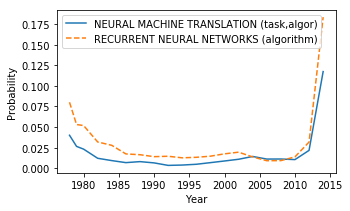

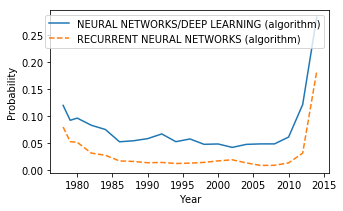

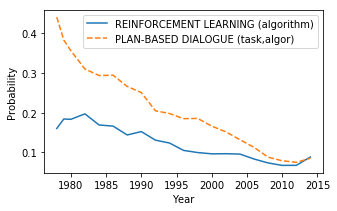

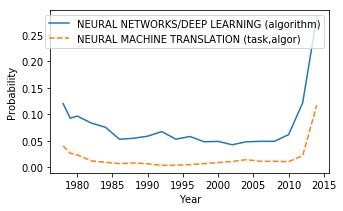

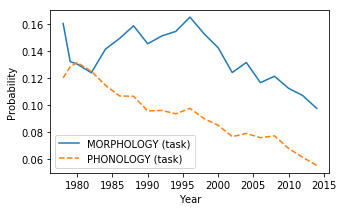

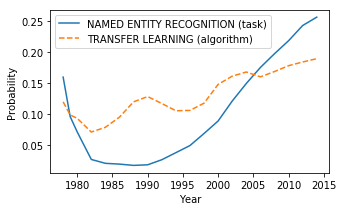

In [295]:
sorted_friendships = sorted(friendship.items(), key=lambda t: t[1]['score'], reverse=True)
avg_strength = sum([t[1]['score'] for t in sorted_friendships[:25]])/25.

plot_for_topics(sorted_friendships[0][0], size=(5,3), conferences=['ACL', 'EMNLP', 'COLING', 'NAACL'])
plot_for_topics(sorted_friendships[1][0], size=(5,3), conferences=['ACL', 'EMNLP', 'COLING', 'NAACL'])
plot_for_topics(sorted_friendships[2][0], size=(5,3), conferences=['ACL', 'EMNLP', 'COLING', 'NAACL'])
plot_for_topics(sorted_friendships[3][0], size=(5,3), conferences=['ACL', 'EMNLP', 'COLING', 'NAACL'])
plot_for_topics(sorted_friendships[4][0], size=(5,3), conferences=['ACL', 'EMNLP', 'COLING', 'NAACL'])
plot_for_topics(sorted_friendships[-4][0], size=(5,3), conferences=['ACL', 'EMNLP', 'COLING', 'NAACL'])

pprint(avg_strength)
pprint(sorted_friendships)

1.3350731398431153
[((19, 35),
  {'names': ['PHONOLOGY', 'SEMANTIC ROLE LABELING'],
   'score': 1.9481067129676022}),
 ((2, 36), {'names': ['MORPHOLOGY', 'DISCOURSE'], 'score': 1.6357661070343277}),
 ((1, 36),
  {'names': ['FINITE STATE MACHINES', 'DISCOURSE'],
   'score': 1.5492450467611851}),
 ((25, 88),
  {'names': ['BIOMEDICAL', 'DEPENDENCY PARSING'], 'score': 1.4913431332591676}),
 ((19, 26),
  {'names': ['PHONOLOGY', 'ANAPHORA/COREFERENCE RESOLUTION'],
   'score': 1.4821770360845459}),
 ((9, 88),
  {'names': ['ARGUMENT MINING', 'DEPENDENCY PARSING'],
   'score': 1.4690268910656537}),
 ((11, 28),
  {'names': ['TOPIC MODELS', 'DEPENDENCY PARSING'],
   'score': 1.4591728991378363}),
 ((19, 85),
  {'names': ['PHONOLOGY', 'RELATION EXTRACTION'], 'score': 1.4572003994664098}),
 ((19, 71), {'names': ['PHONOLOGY', 'ONTOLOGIES'], 'score': 1.450886986793262}),
 ((19, 36), {'names': ['PHONOLOGY', 'DISCOURSE'], 'score': 1.421847572063178}),
 ((88, 98),
  {'names': ['DEPENDENCY PARSING', 'NEW

   'score': 0.30394050412413653}),
 ((25, 95),
  {'names': ['BIOMEDICAL', 'GRAPH-BASED METHODS'], 'score': 0.303919363265521}),
 ((68, 92),
  {'names': ['GRAPHS/ABSTRACT MEANING REPRESENTATION', 'CLASSIFICATION'],
   'score': 0.30323410141277085}),
 ((3, 48),
  {'names': ['MULTI-WORD EXPRESSIONS', 'SPEECH RECOGNITION'],
   'score': 0.3018658309834966}),
 ((14, 80),
  {'names': ['GENERATION', 'COMPLEXITY ANALYSIS'],
   'score': 0.2998320394249634}),
 ((66, 85),
  {'names': ['HUMAN-COMPUTER INTERACTION/APPLICATION', 'RELATION EXTRACTION'],
   'score': 0.29876824888989845}),
 ((25, 48),
  {'names': ['BIOMEDICAL', 'SPEECH RECOGNITION'],
   'score': 0.29864554510047064}),
 ((56, 90),
  {'names': ['PLAN-BASED DIALOGUE',
             'COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING'],
   'score': 0.29694012809353704}),
 ((30, 43),
  {'names': ['SOCIAL MEDIA', 'STATISTICAL MACHINE TRANSLATION'],
   'score': 0.2967047229730615}),
 ((46, 98),
  {'names': ['TRANSFER LEARNING', 'NEWS ARTICLES'],
   '

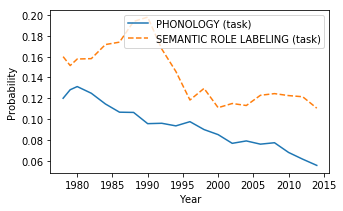

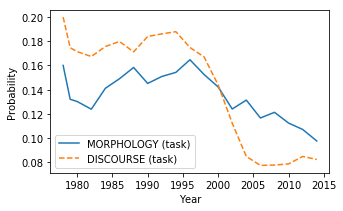

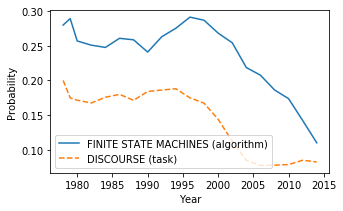

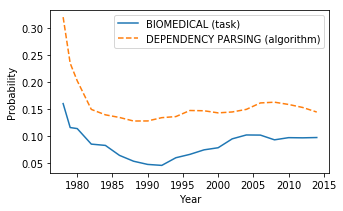

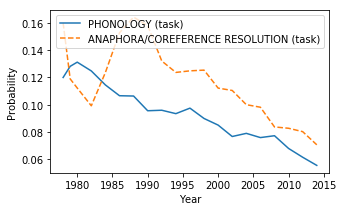

In [296]:
sorted_arms_race = sorted(arms_race.items(), key=lambda t: t[1]['score'], reverse=True)
avg_strength = sum([t[1]['score'] for t in sorted_arms_race[:25]])/25.

plot_for_topics(sorted_arms_race[0][0], size=(5,3), conferences=['ACL', 'EMNLP', 'COLING', 'NAACL'])
plot_for_topics(sorted_arms_race[1][0], size=(5,3), conferences=['ACL', 'EMNLP', 'COLING', 'NAACL'])
plot_for_topics(sorted_arms_race[2][0], size=(5,3), conferences=['ACL', 'EMNLP', 'COLING', 'NAACL'])
plot_for_topics(sorted_arms_race[3][0], size=(5,3), conferences=['ACL', 'EMNLP', 'COLING', 'NAACL'])
plot_for_topics(sorted_arms_race[4][0], size=(5,3), conferences=['ACL', 'EMNLP', 'COLING', 'NAACL'])

pprint(avg_strength)
pprint(sorted_arms_race)

4.757927862904153
[((22, 78),
  {'names': ['UNIFICATION', 'NEURAL MACHINE TRANSLATION'],
   'score': 6.272543930472249}),
 ((22, 79),
  {'names': ['UNIFICATION', 'RECURRENT NEURAL NETWORKS'],
   'score': 6.1413269855808625}),
 ((60, 78),
  {'names': ['GRAMMARS', 'NEURAL MACHINE TRANSLATION'],
   'score': 5.4074746186570035}),
 ((67, 78),
  {'names': ['DISAMBIGUATION', 'NEURAL MACHINE TRANSLATION'],
   'score': 5.325661675102685}),
 ((22, 39),
  {'names': ['UNIFICATION', 'VECTOR SPACE/SEMANTIC SIMILARITY'],
   'score': 5.24459986143317}),
 ((60, 79),
  {'names': ['GRAMMARS', 'RECURRENT NEURAL NETWORKS'],
   'score': 5.150355306949803}),
 ((50, 78),
  {'names': ['LEXICONS', 'NEURAL MACHINE TRANSLATION'],
   'score': 4.962838866047723}),
 ((22, 53),
  {'names': ['UNIFICATION', 'UNSUPERVISED LEARNING'],
   'score': 4.866926786479385}),
 ((15, 22),
  {'names': ['NAMED ENTITY RECOGNITION', 'UNIFICATION'],
   'score': 4.813783336538695}),
 ((7, 22), {'names': ['SVMs', 'UNIFICATION'], 'score':

  {'names': ['LANGUAGE MODELS (CLASSICAL)',
             'COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING'],
   'score': 0.9797229351113605}),
 ((31, 94),
  {'names': ['SUMMARIZATION', 'FRAME SEMANTICS'], 'score': 0.9766125753897245}),
 ((13, 69),
  {'names': ['LANGUAGE ACQUISITION/SIMPLIFICATION',
             'NEURAL NETWORKS/DEEP LEARNING'],
   'score': 0.9745398248169452}),
 ((11, 99),
  {'names': ['TOPIC MODELS', 'SCENE DESCRIPTION'],
   'score': 0.9726197730513274}),
 ((40, 91),
  {'names': ['LEARNING', 'ASIAN LANGUAGES'], 'score': 0.9725893288840702}),
 ((72, 94),
  {'names': ['PREDICTION', 'FRAME SEMANTICS'], 'score': 0.9704107362364274}),
 ((3, 7),
  {'names': ['MULTI-WORD EXPRESSIONS', 'SVMs'], 'score': 0.9662709937134479}),
 ((61, 89),
  {'names': ['LOGICAL FORMS', 'INFORMATION RETRIEVAL'],
   'score': 0.9625669883267013}),
 ((16, 57),
  {'names': ['DISCOURSE SEGMENTATION', 'QUESTION ANSWERING'],
   'score': 0.9601431186463072}),
 ((21, 57),
  {'names': ['POS TAGGING/STATISTICA

 ((8, 11),
  {'names': ['LINEAR PROGRAMMING', 'TOPIC MODELS'],
   'score': 0.503711687384684}),
 ((16, 59),
  {'names': ['DISCOURSE SEGMENTATION', 'EVENT EXTRACTION'],
   'score': 0.5032021656782246}),
 ((26, 72),
  {'names': ['ANAPHORA/COREFERENCE RESOLUTION', 'PREDICTION'],
   'score': 0.49829476686583385}),
 ((52, 57),
  {'names': ['MULTILINGUALITY', 'QUESTION ANSWERING'],
   'score': 0.4974750547225267}),
 ((20, 60), {'names': ['STYLISTICS', 'GRAMMARS'], 'score': 0.4965469718863581}),
 ((84, 92),
  {'names': ['DICTIONARIES', 'CLASSIFICATION'], 'score': 0.49574320447270936}),
 ((11, 35),
  {'names': ['TOPIC MODELS', 'SEMANTIC ROLE LABELING'],
   'score': 0.49330936686405463}),
 ((34, 99),
  {'names': ['EVALUATION/ANNOTATION', 'SCENE DESCRIPTION'],
   'score': 0.49282148003810633}),
 ((78, 98),
  {'names': ['NEURAL MACHINE TRANSLATION', 'NEWS ARTICLES'],
   'score': 0.49203389401781605}),
 ((11, 79),
  {'names': ['TOPIC MODELS', 'RECURRENT NEURAL NETWORKS'],
   'score': 0.49001437568

  {'names': ['SVMs', 'STATISTICAL MACHINE TRANSLATION'],
   'score': 0.11010691661959683}),
 ((15, 48),
  {'names': ['NAMED ENTITY RECOGNITION', 'SPEECH RECOGNITION'],
   'score': 0.10945013984982656}),
 ((70, 93),
  {'names': ['NARRATIVES', 'SEQUENCE ANALYSIS'], 'score': 0.10904277349086992}),
 ((2, 57),
  {'names': ['MORPHOLOGY', 'QUESTION ANSWERING'],
   'score': 0.10538363741181989}),
 ((63, 80),
  {'names': ['KNOWLEDGE BASE', 'COMPLEXITY ANALYSIS'],
   'score': 0.10504436851985151}),
 ((5, 20), {'names': ['TREES', 'STYLISTICS'], 'score': 0.10480565107406012}),
 ((22, 93),
  {'names': ['UNIFICATION', 'SEQUENCE ANALYSIS'],
   'score': 0.10435490317680882}),
 ((60, 65),
  {'names': ['GRAMMARS', 'INFORMATION EXTRACTION?'],
   'score': 0.10339372000851407}),
 ((72, 87),
  {'names': ['PREDICTION', 'WORDNET/DISAMBIGUATION'],
   'score': 0.10279942816571597}),
 ((30, 50),
  {'names': ['SOCIAL MEDIA', 'LEXICONS'], 'score': 0.10187745401392101}),
 ((0, 91),
  {'names': ['DOMAIN ADAPTATION',

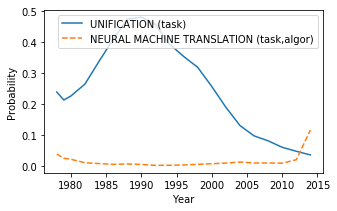

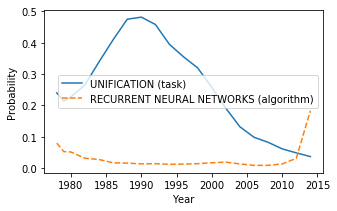

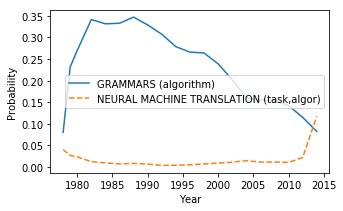

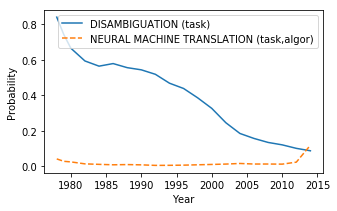

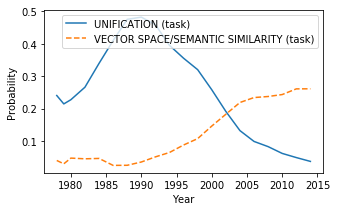

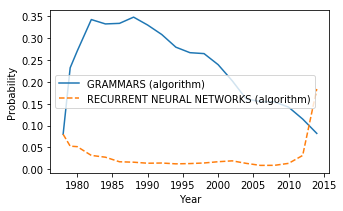

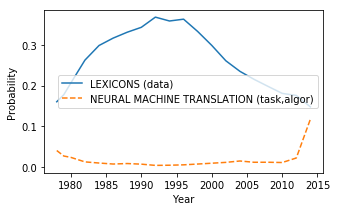

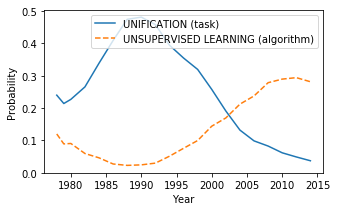

In [297]:
sorted_head_to_head = sorted(head_to_head.items(), key=lambda t: t[1]['score'], reverse=True)
avg_strength = sum([t[1]['score'] for t in sorted_head_to_head[:25]])/25.

plot_for_topics(sorted_head_to_head[0][0], size=(5,3), conferences=['ACL', 'EMNLP', 'COLING', 'NAACL'])
plot_for_topics(sorted_head_to_head[1][0], size=(5,3), conferences=['ACL', 'EMNLP', 'COLING', 'NAACL'])
plot_for_topics(sorted_head_to_head[2][0], size=(5,3), conferences=['ACL', 'EMNLP', 'COLING', 'NAACL'])
plot_for_topics(sorted_head_to_head[3][0], size=(5,3), conferences=['ACL', 'EMNLP', 'COLING', 'NAACL'])
plot_for_topics(sorted_head_to_head[4][0], size=(5,3), conferences=['ACL', 'EMNLP', 'COLING', 'NAACL'])
plot_for_topics(sorted_head_to_head[5][0], size=(5,3), conferences=['ACL', 'EMNLP', 'COLING', 'NAACL'])
plot_for_topics(sorted_head_to_head[6][0], size=(5,3), conferences=['ACL', 'EMNLP', 'COLING', 'NAACL'])
plot_for_topics(sorted_head_to_head[7][0], size=(5,3), conferences=['ACL', 'EMNLP', 'COLING', 'NAACL'])

pprint(avg_strength)
pprint(sorted_head_to_head)


1.9365481655011003
[((14, 78),
  {'names': ['GENERATION', 'NEURAL MACHINE TRANSLATION'],
   'score': 3.980243771046844}),
 ((6, 78),
  {'names': ['REINFORCEMENT LEARNING', 'NEURAL MACHINE TRANSLATION'],
   'score': 3.7535633195613536}),
 ((14, 31),
  {'names': ['GENERATION', 'SUMMARIZATION'], 'score': 3.1812525377511616}),
 ((43, 78),
  {'names': ['STATISTICAL MACHINE TRANSLATION', 'NEURAL MACHINE TRANSLATION'],
   'score': 2.9124317774990187}),
 ((31, 78),
  {'names': ['SUMMARIZATION', 'NEURAL MACHINE TRANSLATION'],
   'score': 2.9059082825437197}),
 ((76, 84),
  {'names': ['CROSS-LINGUAL/PARALLEL CORPORA', 'DICTIONARIES'],
   'score': 2.235080126293165}),
 ((74, 99),
  {'names': ['VISION/MULTIMODAL', 'SCENE DESCRIPTION'],
   'score': 2.200623346154819}),
 ((19, 23),
  {'names': ['PHONOLOGY', 'LANGUAGE MODELS (CLASSICAL)'],
   'score': 1.8975800599853898}),
 ((78, 83),
  {'names': ['NEURAL MACHINE TRANSLATION', 'TRANSLITERATION'],
   'score': 1.8927032564384252}),
 ((31, 36),
  {'name

   'score': 0.098722691193561}),
 ((54, 84),
  {'names': ['RANKING', 'DICTIONARIES'], 'score': 0.09862063022745314}),
 ((25, 36),
  {'names': ['BIOMEDICAL', 'DISCOURSE'], 'score': 0.09825584225986843}),
 ((39, 50),
  {'names': ['VECTOR SPACE/SEMANTIC SIMILARITY', 'LEXICONS'],
   'score': 0.0972664107625835}),
 ((31, 74),
  {'names': ['SUMMARIZATION', 'VISION/MULTIMODAL'],
   'score': 0.09588839855720874}),
 ((19, 83),
  {'names': ['PHONOLOGY', 'TRANSLITERATION'], 'score': 0.09557257976286146}),
 ((63, 90),
  {'names': ['KNOWLEDGE BASE', 'COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING'],
   'score': 0.09505573018597414}),
 ((29, 79),
  {'names': ['DATABASE/RESOURCE?', 'RECURRENT NEURAL NETWORKS'],
   'score': 0.09462411311230712}),
 ((23, 91),
  {'names': ['LANGUAGE MODELS (CLASSICAL)', 'ASIAN LANGUAGES'],
   'score': 0.09423470689110809}),
 ((7, 57),
  {'names': ['SVMs', 'QUESTION ANSWERING'], 'score': 0.0927895223050657}),
 ((66, 99),
  {'names': ['HUMAN-COMPUTER INTERACTION/APPLICATION

  {'names': ['EMBEDDINGS', 'SEQUENCE ANALYSIS'],
   'score': 0.009965295534590352}),
 ((25, 72),
  {'names': ['BIOMEDICAL', 'PREDICTION'], 'score': 0.009850868672533089}),
 ((21, 80),
  {'names': ['POS TAGGING/STATISTICAL PARSING', 'COMPLEXITY ANALYSIS'],
   'score': 0.009623755540743894}),
 ((72, 86),
  {'names': ['PREDICTION', 'HISTORICAL LINGUISTICS'],
   'score': 0.009158611652137074}),
 ((13, 23),
  {'names': ['LANGUAGE ACQUISITION/SIMPLIFICATION',
             'LANGUAGE MODELS (CLASSICAL)'],
   'score': 0.008819134136745692}),
 ((17, 87),
  {'names': ['EVENTS/TEMPORAL', 'WORDNET/DISAMBIGUATION'],
   'score': 0.008750881391185888}),
 ((98, 99),
  {'names': ['NEWS ARTICLES', 'SCENE DESCRIPTION'],
   'score': 0.008704632583368396}),
 ((30, 34),
  {'names': ['SOCIAL MEDIA', 'EVALUATION/ANNOTATION'],
   'score': 0.008654140535845806}),
 ((73, 81),
  {'names': ['QUANTITATIVE ANALYSIS/TEXT MINING', 'OPINION MINING'],
   'score': 0.008586405253077701}),
 ((30, 39),
  {'names': ['SOCIAL M

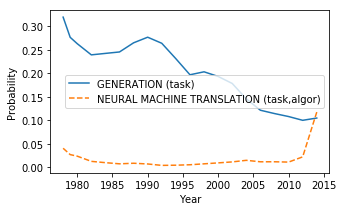

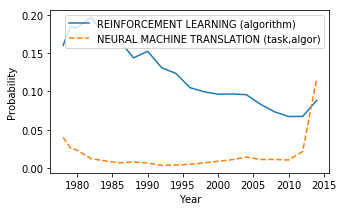

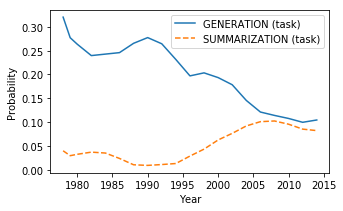

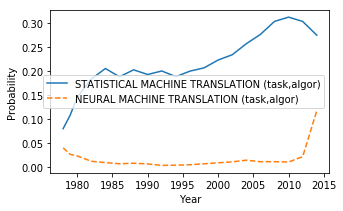

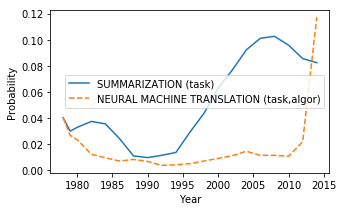

...

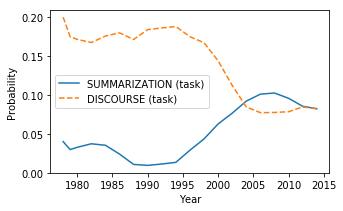

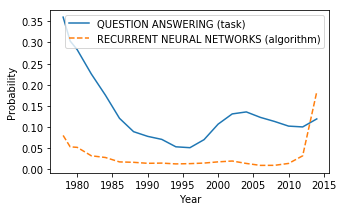

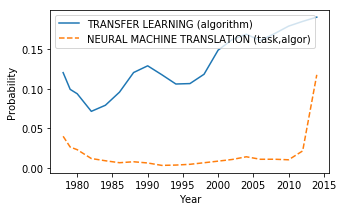

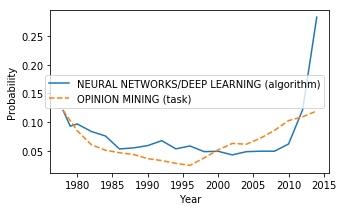

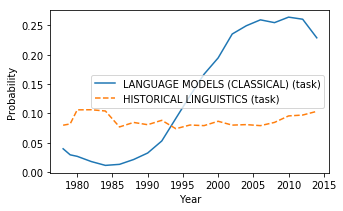

In [298]:
sorted_tryst = sorted(tryst.items(), key=lambda t: t[1]['score'], reverse=True)
avg_strength = sum([t[1]['score'] for t in sorted_tryst[:25]])/25.

plot_for_topics(sorted_tryst[0][0], size=(5,3), conferences=['ACL', 'EMNLP', 'COLING', 'NAACL'])
plot_for_topics(sorted_tryst[1][0], size=(5,3), conferences=['ACL', 'EMNLP', 'COLING', 'NAACL'])
plot_for_topics(sorted_tryst[2][0], size=(5,3), conferences=['ACL', 'EMNLP', 'COLING', 'NAACL'])
plot_for_topics(sorted_tryst[3][0], size=(5,3), conferences=['ACL', 'EMNLP', 'COLING', 'NAACL'])
plot_for_topics(sorted_tryst[4][0], size=(5,3), conferences=['ACL', 'EMNLP', 'COLING', 'NAACL'])
plot_for_topics(sorted_tryst[5][0], size=(5,3), conferences=['ACL', 'EMNLP', 'COLING', 'NAACL'])
plot_for_topics(sorted_tryst[6][0], size=(5,3), conferences=['ACL', 'EMNLP', 'COLING', 'NAACL'])
plot_for_topics(sorted_tryst[7][0], size=(5,3), conferences=['ACL', 'EMNLP', 'COLING', 'NAACL'])
plot_for_topics(sorted_tryst[8][0], size=(5,3), conferences=['ACL', 'EMNLP', 'COLING', 'NAACL'])
plot_for_topics(sorted_tryst[9][0], size=(5,3), conferences=['ACL', 'EMNLP', 'COLING', 'NAACL'])
plot_for_topics(sorted_tryst[10][0], size=(5,3), conferences=['ACL', 'EMNLP', 'COLING', 'NAACL'])
plot_for_topics(sorted_tryst[11][0], size=(5,3), conferences=['ACL', 'EMNLP', 'COLING', 'NAACL'])
plot_for_topics(sorted_tryst[-11][0], size=(5,3), conferences=['ACL', 'EMNLP', 'COLING', 'NAACL'])
plot_for_topics(sorted_tryst[-5][0], size=(5,3), conferences=['ACL', 'EMNLP', 'COLING', 'NAACL'])


pprint(avg_strength)
pprint(sorted_tryst)

In [299]:
corrs[sorted_tryst[10][0]]
# corr_med

{'names': ['QUESTION ANSWERING', 'RECURRENT NEURAL NETWORKS'],
 'score': 0.36854301941624484}

### Relationships between different types of topics

For types: task and task...
avg strength 3.5818731373729027
nr of pairs 386
[((2, 19), {'names': ['MORPHOLOGY', 'PHONOLOGY'], 'score': 6.108973281217922}),
 ((26, 36),
  {'names': ['ANAPHORA/COREFERENCE RESOLUTION', 'DISCOURSE'],
   'score': 5.849500408373829}),
 ((9, 20),
  {'names': ['ARGUMENT MINING', 'STYLISTICS'], 'score': 5.473813286757019}),
 ((4, 81),
  {'names': ['SENTIMENT ANALYSIS', 'OPINION MINING'],
   'score': 5.030999246419933}),
 ((17, 59),
  {'names': ['EVENTS/TEMPORAL', 'EVENT EXTRACTION'],
   'score': 4.690124185544245}),
 ((2, 86),
  {'names': ['MORPHOLOGY', 'HISTORICAL LINGUISTICS'],
   'score': 4.426774938156981}),
 ((56, 99),
  {'names': ['PLAN-BASED DIALOGUE', 'SCENE DESCRIPTION'],
   'score': 4.204724168467971}),
 ((20, 70),
  {'names': ['STYLISTICS', 'NARRATIVES'], 'score': 4.178832644106403}),
 ((36, 56),
  {'names': ['DISCOURSE', 'PLAN-BASED DIALOGUE'], 'score': 4.05366884396181}),
 ((17, 36),
  {'names': ['EVENTS/TEMPORAL', 'DISCOURSE'], 'score': 3.81745725

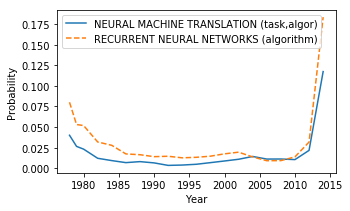

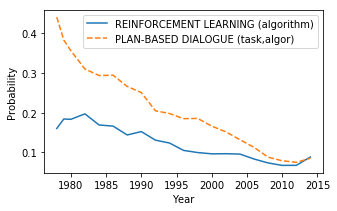

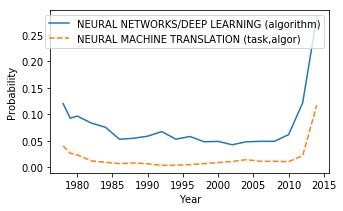

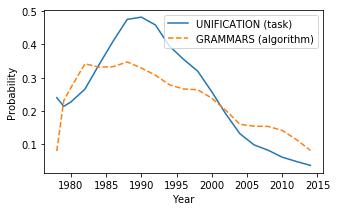

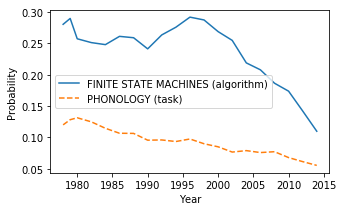

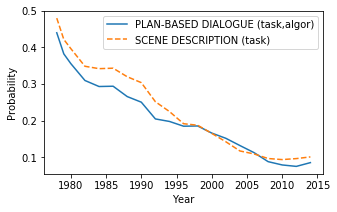

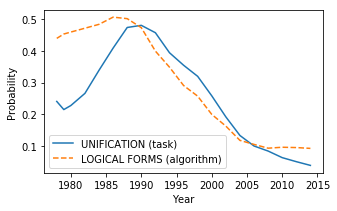

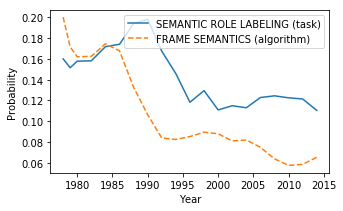

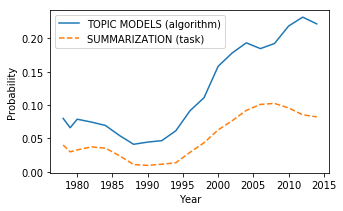

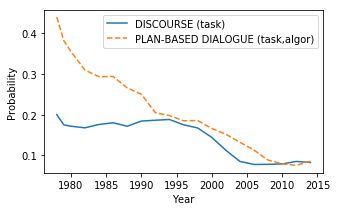

task data


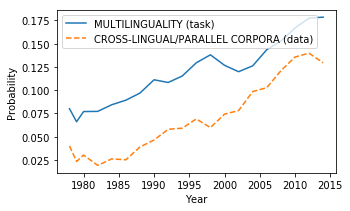

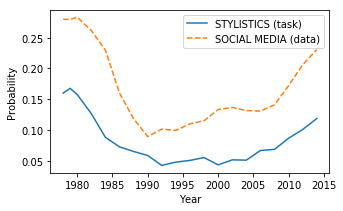

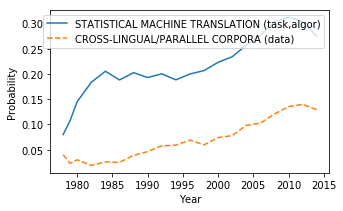

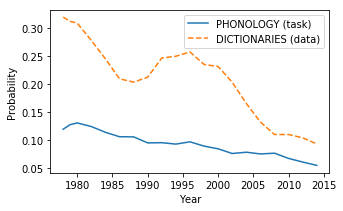

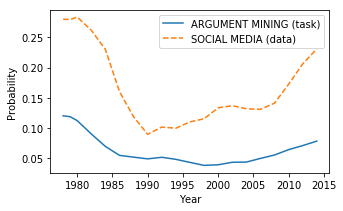

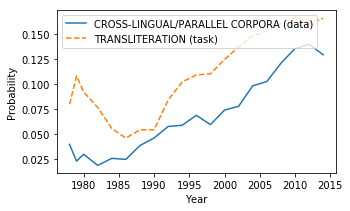

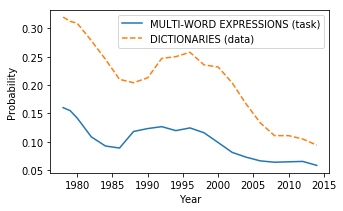

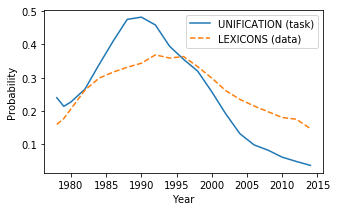

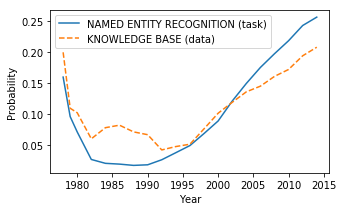

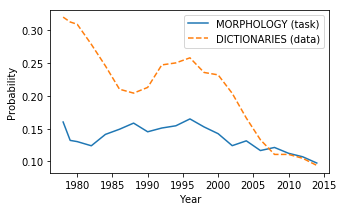

algorithm data


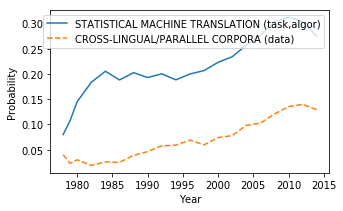

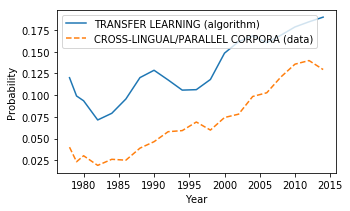

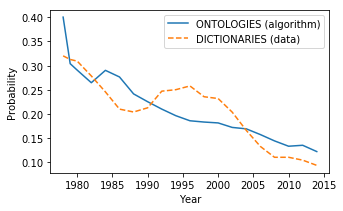

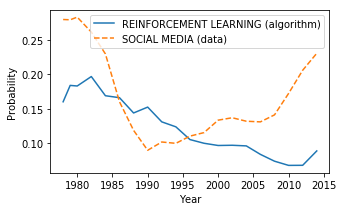

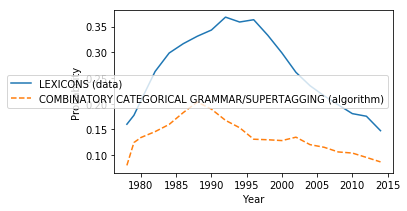

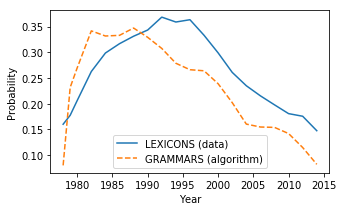

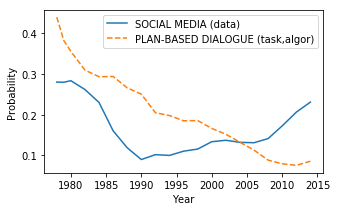

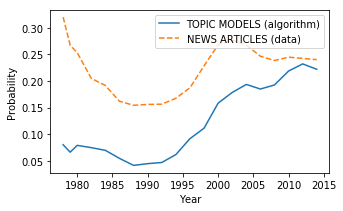

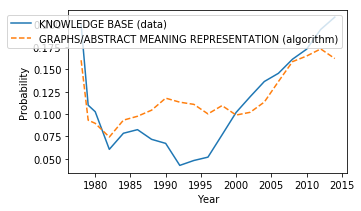

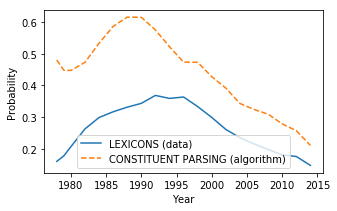

In [335]:
types = ['task', 'algorithm', 'data']
sorted_friendships_per_type = {}
for t, type1 in enumerate(types):
    for type2 in types[t:]:
        print("For types: %s and %s..." % (type1, type2))
        sorted_friendships_per_type[(type1, type2)] = sorted(
            [item for item in friendship.items() if 
             (type1 in topic_types[item[0][0]] and
             type2 in topic_types[item[0][1]]) or
            (type1 in topic_types[item[0][1]] and
             type2 in topic_types[item[0][0]])], key=lambda t: t[1]['score'], reverse=True)
        avg_strength = sum([t[1]['score'] for t in sorted_friendships_per_type[(type1, type2)][:25]])/25.
        print("avg strength", avg_strength)
        print("nr of pairs", len(sorted_friendships_per_type[(type1, type2)]))
        pprint(sorted_friendships_per_type[(type1, type2)][:15])

# Plot for different types (cross-type)
for t, type1 in enumerate(types):
    for type2 in types[t+1:]:
        print(type1, type2)
        for rank in range(10):
            plot_for_topics(sorted_friendships_per_type[(type1, type2)][rank][0], size=(5,3), 
                            conferences=['ACL', 'EMNLP', 'COLING', 'NAACL']
#                             conferences=['NIPS'],
                           )
            plt.savefig("topics_evolution_graphs_post78/relations/friendship%d_%s_%s.png" % (rank, type1, type2))
            plt.show()


For types: task and task...
avg strength 3.9478645495202347
nr of pairs 183
[((19, 35),
  {'names': ['PHONOLOGY', 'SEMANTIC ROLE LABELING'],
   'score': 1.9481067129676022}),
 ((2, 36), {'names': ['MORPHOLOGY', 'DISCOURSE'], 'score': 1.6357661070343277}),
 ((19, 26),
  {'names': ['PHONOLOGY', 'ANAPHORA/COREFERENCE RESOLUTION'],
   'score': 1.4821770360845459}),
 ((19, 85),
  {'names': ['PHONOLOGY', 'RELATION EXTRACTION'], 'score': 1.4572003994664098}),
 ((19, 36), {'names': ['PHONOLOGY', 'DISCOURSE'], 'score': 1.421847572063178}),
 ((16, 87),
  {'names': ['DISCOURSE SEGMENTATION', 'WORDNET/DISAMBIGUATION'],
   'score': 1.3713868803000286}),
 ((17, 19),
  {'names': ['EVENTS/TEMPORAL', 'PHONOLOGY'], 'score': 1.3422711112910706}),
 ((48, 87),
  {'names': ['SPEECH RECOGNITION', 'WORDNET/DISAMBIGUATION'],
   'score': 1.253388215294007}),
 ((43, 85),
  {'names': ['STATISTICAL MACHINE TRANSLATION', 'RELATION EXTRACTION'],
   'score': 1.145023846471139}),
 ((48, 85),
  {'names': ['SPEECH RECOG

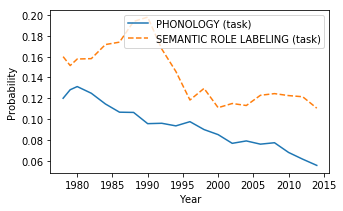

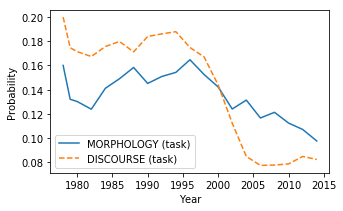

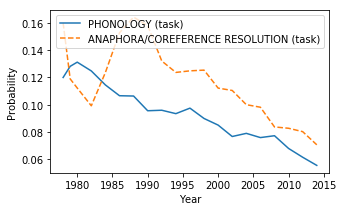

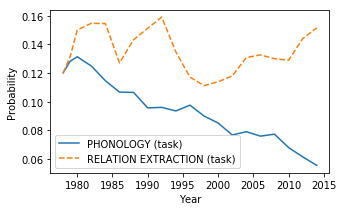

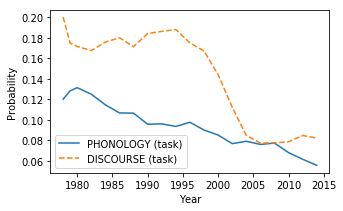

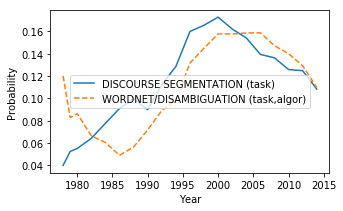

algorithm algorithm


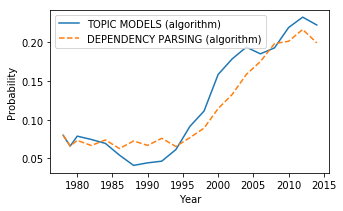

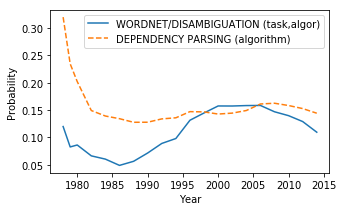

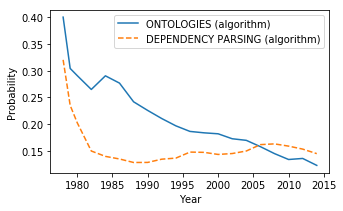

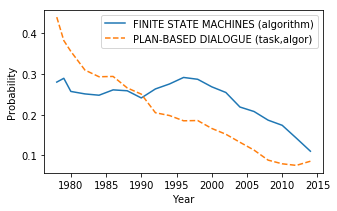

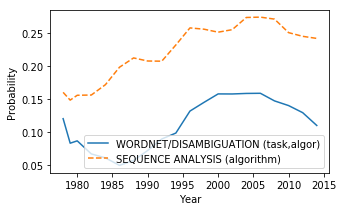

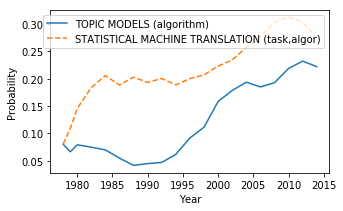

data data


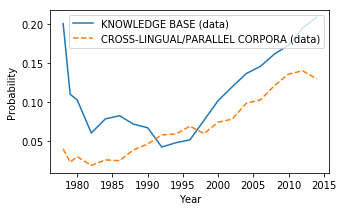

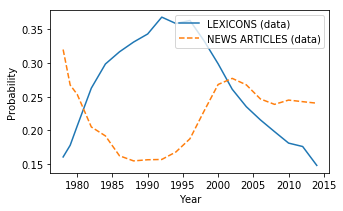

In [346]:
types = ['task', 'algorithm', 'data']
sorted_arms_race_per_type = {}
for t, type1 in enumerate(types):
    for type2 in types[t:]:
        print("For types: %s and %s..." % (type1, type2))
        sorted_arms_race_per_type[(type1, type2)] = sorted(
            [item for item in arms_race.items() if 
             (type1 in topic_types[item[0][0]] and
             type2 in topic_types[item[0][1]]) or
            (type1 in topic_types[item[0][1]] and
             type2 in topic_types[item[0][0]])], key=lambda t: t[1]['score'], reverse=True)
        strengths = [t[1]['score'] for t in sorted_head_to_head_per_type[(type1, type2)][:25]]
        avg_strength = sum(strengths)/len(strengths)        
        print("avg strength", avg_strength)
        print("nr of pairs", len(sorted_arms_race_per_type[(type1, type2)]))
        pprint(sorted_arms_race_per_type[(type1, type2)][:15])

# Plot for matching types
for t, type1 in enumerate(types):
    print(type1, type1)
    for rank in range(6):
        if len(sorted_arms_race_per_type[(type1, type1)]) <= rank:
            continue
        plot_for_topics(sorted_arms_race_per_type[(type1, type1)][rank][0], size=(5,3), conferences=['ACL', 'EMNLP', 'COLING', 'NAACL'])
        plt.savefig("topics_evolution_graphs_post78/relations/arms_race%d_%s_%s.png" % (rank, type1, type1))
        plt.show()


For types: task and task...
avg strength 3.9478645495202347
nr of pairs 324
[((22, 78),
  {'names': ['UNIFICATION', 'NEURAL MACHINE TRANSLATION'],
   'score': 6.272543930472249}),
 ((67, 78),
  {'names': ['DISAMBIGUATION', 'NEURAL MACHINE TRANSLATION'],
   'score': 5.325661675102685}),
 ((22, 39),
  {'names': ['UNIFICATION', 'VECTOR SPACE/SEMANTIC SIMILARITY'],
   'score': 5.24459986143317}),
 ((15, 22),
  {'names': ['NAMED ENTITY RECOGNITION', 'UNIFICATION'],
   'score': 4.813783336538695}),
 ((78, 87),
  {'names': ['NEURAL MACHINE TRANSLATION', 'WORDNET/DISAMBIGUATION'],
   'score': 4.435858128492958}),
 ((4, 22),
  {'names': ['SENTIMENT ANALYSIS', 'UNIFICATION'], 'score': 4.384557586581767}),
 ((22, 31),
  {'names': ['UNIFICATION', 'SUMMARIZATION'], 'score': 4.332181633156917}),
 ((22, 72),
  {'names': ['UNIFICATION', 'PREDICTION'], 'score': 4.27827347411305}),
 ((22, 23),
  {'names': ['UNIFICATION', 'LANGUAGE MODELS (CLASSICAL)'],
   'score': 4.243674414058218}),
 ((26, 78),
  {'na

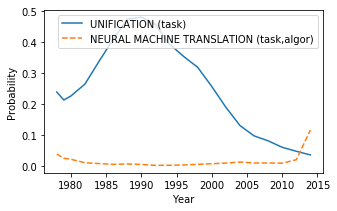

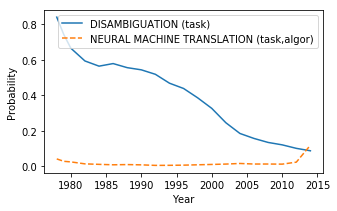

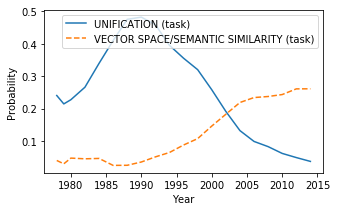

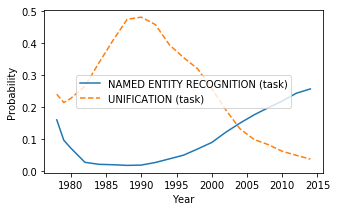

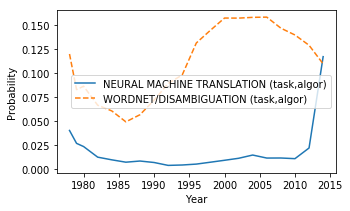

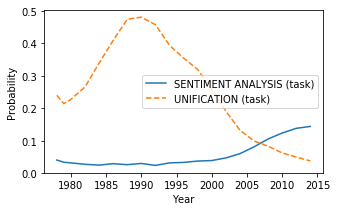

algorithm algorithm


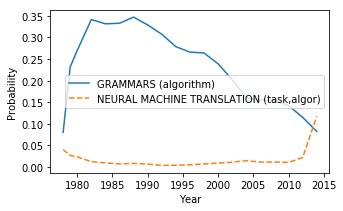

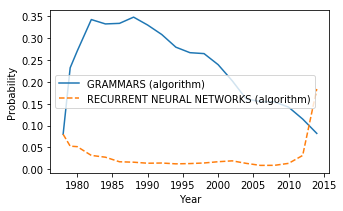

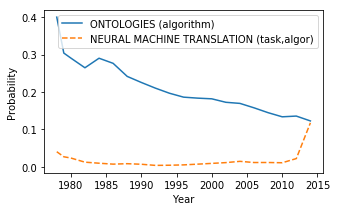

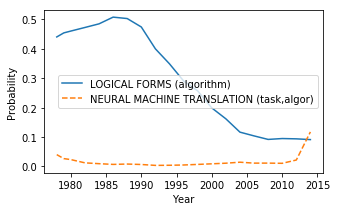

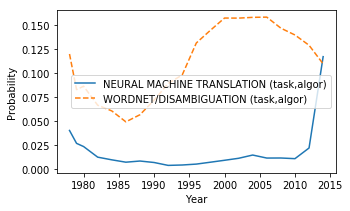

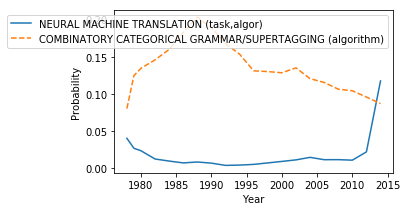

data data


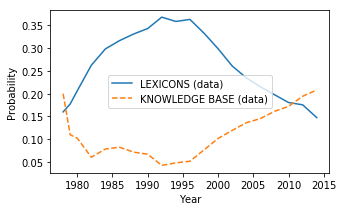

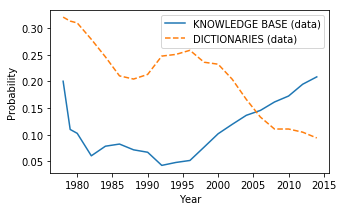

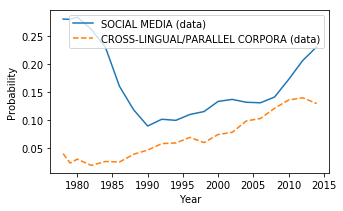

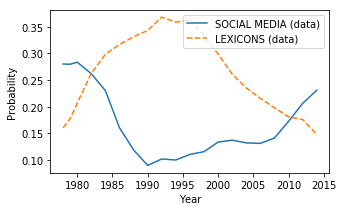

In [344]:
types = ['task', 'algorithm', 'data']
sorted_head_to_head_per_type = {}
for t, type1 in enumerate(types):
    for type2 in types[t:]:
        print("For types: %s and %s..." % (type1, type2))
        sorted_head_to_head_per_type[(type1, type2)] = sorted(
            [item for item in head_to_head.items() if 
             (type1 in topic_types[item[0][0]] and
             type2 in topic_types[item[0][1]]) or
            (type1 in topic_types[item[0][1]] and
             type2 in topic_types[item[0][0]])], key=lambda t: t[1]['score'], reverse=True)
        strengths = [t[1]['score'] for t in sorted_head_to_head_per_type[(type1, type2)][:25]]
        avg_strength = sum(strengths)/len(strengths)
        print("avg strength", avg_strength)
        print("nr of pairs", len(sorted_head_to_head_per_type[(type1, type2)]))
        pprint(sorted_head_to_head_per_type[(type1, type2)][:15])

# Plot for matching types
for t, type1 in enumerate(types):
    print(type1, type1)
    for rank in range(6):
        if len(sorted_head_to_head_per_type[(type1, type1)]) <= rank:
            continue
        plot_for_topics(sorted_head_to_head_per_type[(type1, type1)][rank][0], size=(5,3), conferences=['ACL', 'EMNLP', 'COLING', 'NAACL'])
        plt.savefig("topics_evolution_graphs_post78/relations/head_to_head%d_%s_%s.png" % (rank, type1, type1))
        plt.show()


For types: task and task...
avg strength 0.861910655049926
nr of pairs 234
[((14, 78),
  {'names': ['GENERATION', 'NEURAL MACHINE TRANSLATION'],
   'score': 3.980243771046844}),
 ((14, 31),
  {'names': ['GENERATION', 'SUMMARIZATION'], 'score': 3.1812525377511616}),
 ((43, 78),
  {'names': ['STATISTICAL MACHINE TRANSLATION', 'NEURAL MACHINE TRANSLATION'],
   'score': 2.9124317774990187}),
 ((31, 78),
  {'names': ['SUMMARIZATION', 'NEURAL MACHINE TRANSLATION'],
   'score': 2.9059082825437197}),
 ((74, 99),
  {'names': ['VISION/MULTIMODAL', 'SCENE DESCRIPTION'],
   'score': 2.200623346154819}),
 ((19, 23),
  {'names': ['PHONOLOGY', 'LANGUAGE MODELS (CLASSICAL)'],
   'score': 1.8975800599853898}),
 ((78, 83),
  {'names': ['NEURAL MACHINE TRANSLATION', 'TRANSLITERATION'],
   'score': 1.8927032564384252}),
 ((31, 36),
  {'names': ['SUMMARIZATION', 'DISCOURSE'], 'score': 1.7322398416268143}),
 ((24, 39),
  {'names': ['TEXTUAL ENTAILMENT', 'VECTOR SPACE/SEMANTIC SIMILARITY'],
   'score': 1.304

avg strength 0.31045283912392785
nr of pairs 2
[((76, 84),
  {'names': ['CROSS-LINGUAL/PARALLEL CORPORA', 'DICTIONARIES'],
   'score': 2.235080126293165}),
 ((50, 76),
  {'names': ['LEXICONS', 'CROSS-LINGUAL/PARALLEL CORPORA'],
   'score': 0.19492511583787026})]
task task


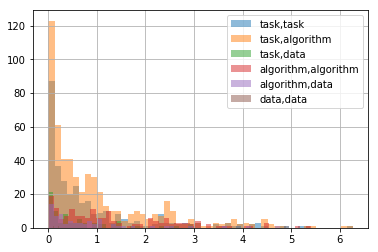

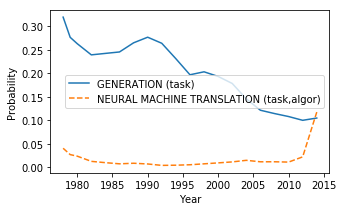

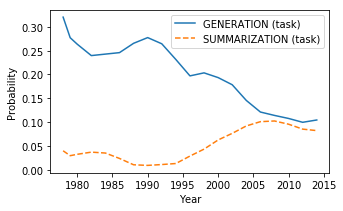

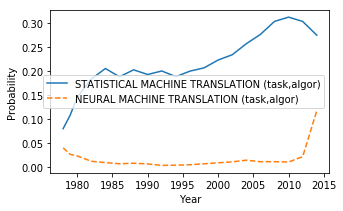

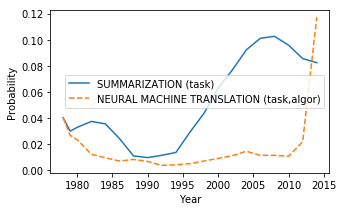

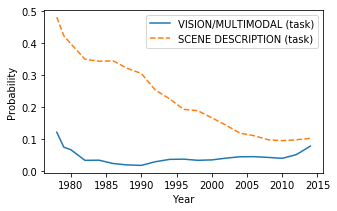

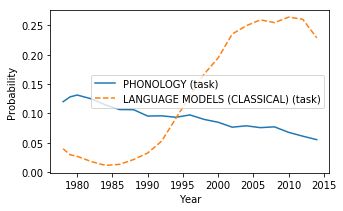

algorithm algorithm


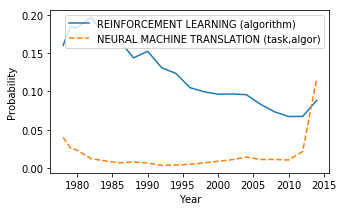

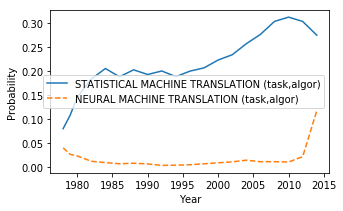

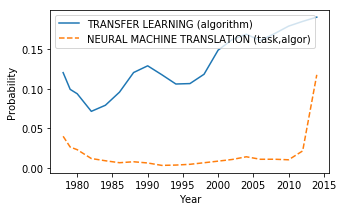

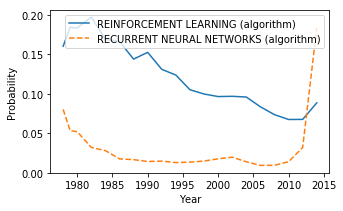

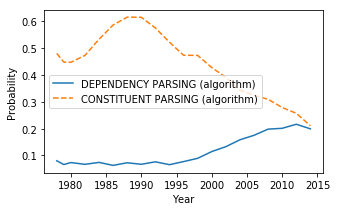

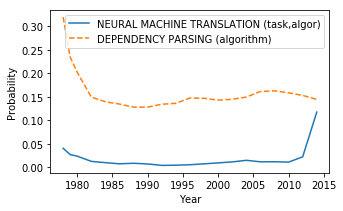

data data


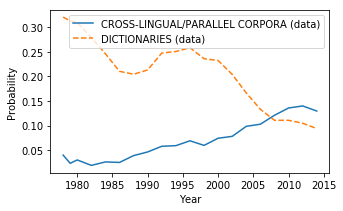

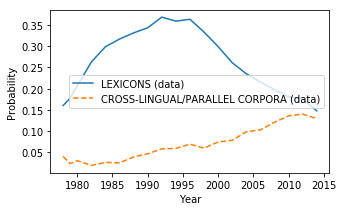

In [371]:
types = ['task', 'algorithm', 'data']
sorted_trysts_per_type = {}
for t, type1 in enumerate(types):
    for type2 in types[t:]:
        print("For types: %s and %s..." % (type1, type2))
        sorted_trysts_per_type[(type1, type2)] = sorted(
            [item for item in tryst.items() if 
             (type1 in topic_types[item[0][0]] and
             type2 in topic_types[item[0][1]]) or
            (type1 in topic_types[item[0][1]] and
             type2 in topic_types[item[0][0]])], key=lambda t: t[1]['score'], reverse=True)
        strengths = [t[1]['score'] for t in sorted_head_to_head_per_type[(type1, type2)]]#[:25]]
        pd.Series(strengths).hist(label="%s,%s" % (type1, type2), bins=50, alpha=0.5)
        avg_strength = sum(strengths)/len(strengths)
        print("avg strength", avg_strength)
        print("nr of pairs", len(sorted_trysts_per_type[(type1, type2)]))
        pprint(sorted_trysts_per_type[(type1, type2)][:15])

plt.legend()
# Plot for matching types
for t, type1 in enumerate(types):
    print(type1, type1)
    for rank in range(6):
        if len(sorted_trysts_per_type[(type1, type1)]) <= rank:
            continue
        plot_for_topics(sorted_trysts_per_type[(type1, type1)][rank][0], size=(5,3), conferences=['ACL', 'EMNLP', 'COLING', 'NAACL'])
        plt.savefig("topics_evolution_graphs_post78/relations/tryst%d_%s_%s.png" % (rank, type1, type1))
        plt.show()


In [306]:
def relationship_kind(topic1, topic2):
    sorted_pair = tuple(sorted((topic1, topic2)))
    if sorted_pair in friendship:
        return 'friendship', friendship[sorted_pair]
    elif sorted_pair in arms_race:
        return 'arms_race', arms_race[sorted_pair]
    elif sorted_pair in head_to_head:
        return 'head_to_head', head_to_head[sorted_pair]
    elif sorted_pair in tryst:
        return 'tryst', tryst[sorted_pair]
    return "not found"

def relation_with_topic(topic1):
    friendships_with_topic = {pair: friendship[pair] for pair in friendship.keys() if topic1 in pair}
    print("Top friendships:")
    pprint(sorted(friendships_with_topic.items(), key=lambda t:t[1]['score'], reverse=True)[:5])
    arms_race_with_topic = {pair: arms_race[pair] for pair in arms_race.keys() if topic1 in pair}
    print("Top arms race:")
    pprint(sorted(arms_race_with_topic.items(), key=lambda t:t[1]['score'], reverse=True)[:5])
    head_to_head_with_topic = {pair: head_to_head[pair] for pair in head_to_head.keys() if topic1 in pair}
    print("Top head to head:")
    pprint(sorted(head_to_head_with_topic.items(), key=lambda t:t[1]['score'], reverse=True)[:5])
    tryst_with_topic = {pair: tryst[pair] for pair in tryst.keys() if topic1 in pair}
    print("Top tryst:")
    pprint(sorted(tryst_with_topic.items(), key=lambda t:t[1]['score'], reverse=True)[:5])
    
for topic in neural_topics:
    relation_with_topic(topic)


Top friendships:
[((69, 79),
  {'names': ['NEURAL NETWORKS/DEEP LEARNING', 'RECURRENT NEURAL NETWORKS'],
   'score': 7.647935008973596}),
 ((69, 78),
  {'names': ['NEURAL NETWORKS/DEEP LEARNING', 'NEURAL MACHINE TRANSLATION'],
   'score': 6.1620038666544295}),
 ((55, 69),
  {'names': ['EMBEDDINGS', 'NEURAL NETWORKS/DEEP LEARNING'],
   'score': 3.325645888722208}),
 ((69, 74),
  {'names': ['NEURAL NETWORKS/DEEP LEARNING', 'VISION/MULTIMODAL'],
   'score': 0.8243562565136634}),
 ((69, 72),
  {'names': ['NEURAL NETWORKS/DEEP LEARNING', 'PREDICTION'],
   'score': 0.48699972270245406})]
Top arms race:
[]
Top head to head:
[((22, 69),
  {'names': ['UNIFICATION', 'NEURAL NETWORKS/DEEP LEARNING'],
   'score': 3.920792739610353}),
 ((60, 69),
  {'names': ['GRAMMARS', 'NEURAL NETWORKS/DEEP LEARNING'],
   'score': 3.522498914857576}),
 ((69, 91),
  {'names': ['NEURAL NETWORKS/DEEP LEARNING', 'ASIAN LANGUAGES'],
   'score': 2.905070479294587}),
 ((50, 69),
  {'names': ['LEXICONS', 'NEURAL NETWORKS

In [324]:
relationship_kind(22,69)

('head_to_head',
 {'names': ['UNIFICATION', 'NEURAL NETWORKS/DEEP LEARNING'],
  'score': 3.920792739610353})

In [328]:
nr_of_rels_per_type = {}
strengths_per_type = {}
rel_kinds_per_type = {}
for topic_pair, rel in sorted(strengths.items(), key=lambda t:t[1]['score'], reverse=True):
    t1,t2 = topic_pair
    print(rel['names'], topic_types[t1], topic_types[t2], relationship_kind(t1,t2))
    types1 = topic_types[t1]
    types2 = topic_types[t2]
    for type1 in types1:
        for type2 in types2:
            relkey = ",".join(sorted((type1,type2)))
            if relkey not in nr_of_rels_per_type:
                nr_of_rels_per_type[relkey] = 0
            nr_of_rels_per_type[relkey] += 1
            if relkey not in strengths_per_type:
                strengths_per_type[relkey] = []
            strengths_per_type[relkey].append(rel['score'])
            if relkey not in rel_kinds_per_type:
                rel_kinds_per_type[relkey] = {
                    'friendship': 0,
                    'arms_race': 0,
                    'head_to_head': 0,
                    'tryst': 0}
            if relationship_kind(t1,t2)[0] not in rel_kinds_per_type[relkey]:
                print("Rel kind not found", relationship_kind(t1,t2))
                continue
            rel_kinds_per_type[relkey][relationship_kind(t1,t2)[0]]
            

['NEURAL MACHINE TRANSLATION', 'RECURRENT NEURAL NETWORKS'] ['task', 'algorithm'] ['algorithm'] ('friendship', {'score': 13.035661825683936, 'names': ['NEURAL MACHINE TRANSLATION', 'RECURRENT NEURAL NETWORKS']})
['NEURAL NETWORKS/DEEP LEARNING', 'RECURRENT NEURAL NETWORKS'] ['algorithm'] ['algorithm'] ('friendship', {'score': 7.647935008973596, 'names': ['NEURAL NETWORKS/DEEP LEARNING', 'RECURRENT NEURAL NETWORKS']})
['REINFORCEMENT LEARNING', 'PLAN-BASED DIALOGUE'] ['algorithm'] ['task', 'algorithm'] ('friendship', {'score': 6.931335650607233, 'names': ['REINFORCEMENT LEARNING', 'PLAN-BASED DIALOGUE']})
['UNIFICATION', 'NEURAL MACHINE TRANSLATION'] ['task'] ['task', 'algorithm'] ('head_to_head', {'score': 6.272543930472249, 'names': ['UNIFICATION', 'NEURAL MACHINE TRANSLATION']})
['NEURAL NETWORKS/DEEP LEARNING', 'NEURAL MACHINE TRANSLATION'] ['algorithm'] ['task', 'algorithm'] ('friendship', {'score': 6.1620038666544295, 'names': ['NEURAL NETWORKS/DEEP LEARNING', 'NEURAL MACHINE TRAN

['HUMAN-COMPUTER INTERACTION/APPLICATION', 'GRAPH-BASED METHODS'] ['task'] ['algorithm'] ('arms_race', {'score': 0.9823604075036099, 'names': ['HUMAN-COMPUTER INTERACTION/APPLICATION', 'GRAPH-BASED METHODS']})
['CLUSTERING', 'SCENE DESCRIPTION'] ['algorithm'] ['task'] ('head_to_head', {'score': 0.9810470118752672, 'names': ['CLUSTERING', 'SCENE DESCRIPTION']})
['LANGUAGE MODELS (CLASSICAL)', 'COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING'] ['task'] ['algorithm'] ('head_to_head', {'score': 0.9797229351113605, 'names': ['LANGUAGE MODELS (CLASSICAL)', 'COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING']})
['HUMAN-COMPUTER INTERACTION/APPLICATION', 'DICTIONARIES'] ['task'] ['data'] ('friendship', {'score': 0.9766706226849134, 'names': ['HUMAN-COMPUTER INTERACTION/APPLICATION', 'DICTIONARIES']})
['SUMMARIZATION', 'FRAME SEMANTICS'] ['task'] ['algorithm'] ('head_to_head', {'score': 0.9766125753897245, 'names': ['SUMMARIZATION', 'FRAME SEMANTICS']})
['TREES', 'PHONOLOGY'] ['algorithm'] ['task'] ('a

['CLUSTERING', 'RANKING'] ['algorithm'] ['algorithm'] ('friendship', {'score': 0.501843868302735, 'names': ['CLUSTERING', 'RANKING']})
['ARGUMENT MINING', 'RELATION EXTRACTION'] ['task'] ['task'] ('arms_race', {'score': 0.5017989380448439, 'names': ['ARGUMENT MINING', 'RELATION EXTRACTION']})
['EVALUATION/ANNOTATION', 'PREDICTION'] ['task'] ['task'] ('friendship', {'score': 0.5015384574104306, 'names': ['EVALUATION/ANNOTATION', 'PREDICTION']})
['DOMAIN ADAPTATION', 'CROSS-LINGUAL/PARALLEL CORPORA'] ['task'] ['data'] ('friendship', {'score': 0.5005993104709016, 'names': ['DOMAIN ADAPTATION', 'CROSS-LINGUAL/PARALLEL CORPORA']})
['CROSS-LINGUAL/PARALLEL CORPORA', 'SEQUENCE ANALYSIS'] ['data'] ['algorithm'] ('arms_race', {'score': 0.5001425000469051, 'names': ['CROSS-LINGUAL/PARALLEL CORPORA', 'SEQUENCE ANALYSIS']})
['DOMAIN ADAPTATION', 'EVENTS/TEMPORAL'] ['task'] ['task'] ('arms_race', {'score': 0.49977620468491885, 'names': ['DOMAIN ADAPTATION', 'EVENTS/TEMPORAL']})
['BIOMEDICAL', 'HUMA

['RECURRENT NEURAL NETWORKS', 'CLASSIFICATION'] ['algorithm'] ['task'] ('tryst', {'score': 0.2861613136607954, 'names': ['RECURRENT NEURAL NETWORKS', 'CLASSIFICATION']})
['LANGUAGE MODELS (CLASSICAL)', 'MULTILINGUALITY'] ['task'] ['task'] ('friendship', {'score': 0.2853471223273822, 'names': ['LANGUAGE MODELS (CLASSICAL)', 'MULTILINGUALITY']})
['MORPHOLOGY', 'UNSUPERVISED LEARNING'] ['task'] ['algorithm'] ('head_to_head', {'score': 0.2849006048665991, 'names': ['MORPHOLOGY', 'UNSUPERVISED LEARNING']})
['MULTI-WORD EXPRESSIONS', 'QUANTITATIVE ANALYSIS/TEXT MINING'] ['task'] ['algorithm'] ('tryst', {'score': 0.28468767337477696, 'names': ['MULTI-WORD EXPRESSIONS', 'QUANTITATIVE ANALYSIS/TEXT MINING']})
['OPINION MINING', 'GRAPH-BASED METHODS'] ['task'] ['algorithm'] ('arms_race', {'score': 0.2840186692904181, 'names': ['OPINION MINING', 'GRAPH-BASED METHODS']})
['TEXTUAL ENTAILMENT', 'LEARNING'] ['task'] ['algorithm'] ('head_to_head', {'score': 0.2839766968071377, 'names': ['TEXTUAL ENTA

['LANGUAGE MODELS (CLASSICAL)', 'INFORMATION RETRIEVAL'] ['task'] ['task'] ('friendship', {'score': 0.09875734571728402, 'names': ['LANGUAGE MODELS (CLASSICAL)', 'INFORMATION RETRIEVAL']})
['DISCOURSE SEGMENTATION', 'DICTIONARIES'] ['task'] ['data'] ('tryst', {'score': 0.098722691193561, 'names': ['DISCOURSE SEGMENTATION', 'DICTIONARIES']})
['RANKING', 'DICTIONARIES'] ['algorithm'] ['data'] ('tryst', {'score': 0.09862063022745314, 'names': ['RANKING', 'DICTIONARIES']})
['TEXTUAL ENTAILMENT', 'DICTIONARIES'] ['task'] ['data'] ('head_to_head', {'score': 0.09828228001439944, 'names': ['TEXTUAL ENTAILMENT', 'DICTIONARIES']})
['BIOMEDICAL', 'DISCOURSE'] ['task'] ['task'] ('tryst', {'score': 0.09825584225986843, 'names': ['BIOMEDICAL', 'DISCOURSE']})
['REINFORCEMENT LEARNING', 'MULTILINGUALITY'] ['algorithm'] ['task'] ('head_to_head', {'score': 0.09804355848206628, 'names': ['REINFORCEMENT LEARNING', 'MULTILINGUALITY']})
['SENTIMENT ANALYSIS', 'HISTORICAL LINGUISTICS'] ['task'] ['task'] ('he

['PREDICTION', 'RELATION EXTRACTION'] ['task'] ['task'] ('tryst', {'score': 0.01062279231251095, 'names': ['PREDICTION', 'RELATION EXTRACTION']})
['NAMED ENTITY RECOGNITION', 'NARRATIVES'] ['task'] ['task'] ('head_to_head', {'score': 0.01040318740538777, 'names': ['NAMED ENTITY RECOGNITION', 'NARRATIVES']})
['EVALUATION/ANNOTATION', 'DEPENDENCY PARSING'] ['task'] ['algorithm'] ('head_to_head', {'score': 0.010297777837205178, 'names': ['EVALUATION/ANNOTATION', 'DEPENDENCY PARSING']})
['TREES', 'KNOWLEDGE BASE'] ['algorithm'] ['data'] ('head_to_head', {'score': 0.010224380423105634, 'names': ['TREES', 'KNOWLEDGE BASE']})
['UNSUPERVISED LEARNING', 'COMPLEXITY ANALYSIS'] ['algorithm'] ['task'] ('tryst', {'score': 0.010212196401321497, 'names': ['UNSUPERVISED LEARNING', 'COMPLEXITY ANALYSIS']})
['SVMs', 'SOCIAL MEDIA'] ['algorithm'] ['data'] ('tryst', {'score': 0.010204790931809645, 'names': ['SVMs', 'SOCIAL MEDIA']})
['QUESTION ANSWERING', 'INFORMATION EXTRACTION?'] ['task'] ['task'] ('try

In [375]:
friendship_nips = {}
arms_race_nips = {}
tryst_nips = {}
head_to_head_nips = {}

pmi_med_nips = pd.Series(list([pmis_nips[p]['score'] for p in pmis_nips if pmis_nips[p]['score']>-1])).median()
corr_med_nips = pd.Series(list([corrs_nips[p]['score'] for p in corrs_nips])).median()


for pair, strength in strengths_nips.items():
    if pmis_nips[pair]['score']-pmi_med_nips > 0 and corrs_nips[pair]['score']-corr_med_nips > 0:
        friendship_nips[pair] = {'names': strength['names'], 'score': strength['score']}
    elif pmis_nips[pair]['score']-pmi_med_nips > 0 and corrs_nips[pair]['score']-corr_med_nips < 0:
        tryst_nips[pair] = {'names': strength['names'], 'score': strength['score']}
    elif pmis_nips[pair]['score']-pmi_med_nips < 0 and corrs_nips[pair]['score']-corr_med_nips < 0:
        head_to_head_nips[pair] = {'names': strength['names'], 'score': strength['score']}
    elif pmis_nips[pair]['score']-pmi_med_nips < 0 and corrs_nips[pair]['score']-corr_med_nips > 0:
        arms_race_nips[pair] = {'names': strength['names'], 'score': strength['score']}

### Relation graph

In [416]:
import networkx
import pydot

(32, 54)
(20, 25)
(3, 35)
(17, 94)
(21, 28)
(28, 41)
(34, 52)
(17, 20)
(7, 25)
(13, 70)
(38, 91)
(26, 94)
(72, 92)
(39, 92)
(11, 68)
(34, 46)
(50, 84)
(65, 84)
(34, 81)
(29, 70)
(23, 73)
(3, 86)
(52, 98)
(30, 66)
(19, 91)
(26, 98)
(7, 68)
(7, 12)
(55, 78)
(24, 56)
(14, 29)
(17, 90)
(13, 20)
(19, 65)
(43, 76)
(22, 67)
(46, 53)
(51, 60)
(23, 95)
(15, 34)
(85, 87)
(70, 94)
(59, 71)
(57, 59)
(36, 67)
(57, 85)
(8, 38)
(23, 41)
(19, 32)
(81, 98)
(54, 87)
(13, 89)
(29, 95)
(26, 67)
(40, 73)
(53, 73)
(54, 73)
(43, 52)
(17, 57)
(65, 71)
(2, 67)
(76, 87)
(3, 71)
(5, 93)
(17, 25)
(2, 48)
(19, 70)
(0, 14)
(24, 59)
(38, 86)
(90, 99)
(8, 94)
(4, 12)
(0, 4)
(0, 36)
(14, 84)
(70, 81)
(9, 70)
(25, 92)
(2, 60)
(21, 46)
(28, 63)
(2, 38)
(7, 15)
(0, 6)
(11, 72)
(0, 84)
(25, 70)
(72, 74)
(73, 92)
(0, 98)
(51, 88)
(8, 51)
(41, 43)
(13, 32)
(29, 88)
(35, 61)
(68, 95)
(38, 90)
(12, 41)
(17, 50)
(28, 68)
(9, 20)
(14, 19)
(9, 86)
(16, 66)
(67, 94)
(48, 88)
(7, 92)
(20, 71)
(17, 51)
(50, 51)
(23, 34)
(46, 85)
(1

In [485]:
pd.Series([s['score'] for p, s in friendship.items()]).describe()

count    1084.000000
mean        0.736890
std         1.007023
min         0.000234
25%         0.115911
50%         0.396172
75%         1.007878
max        13.035662
dtype: float64

In [489]:
friendship_graph = networkx.Graph()
for pair, score in friendship.items():
    if score['score'] > 3:
        friendship_graph.add_edge(*pair)
centralities = networkx.centrality.degree_centrality(friendship_graph)
for i, component in enumerate(networkx.components.connected_components(friendship_graph)):
    print("Component ", i, component)
    for t in component:
        print(topic_names[t], topic_types[t], centralities[t], 
              len(list(networkx.all_neighbors(friendship_graph, t))))

Component  0 {1, 2, 43, 76, 46, 48, 19, 84, 52, 86}
FINITE STATE MACHINES ['algorithm'] 0.024390243902439025 1
MORPHOLOGY ['task'] 0.04878048780487805 2
STATISTICAL MACHINE TRANSLATION ['task', 'algorithm'] 0.024390243902439025 1
CROSS-LINGUAL/PARALLEL CORPORA ['data'] 0.07317073170731708 3
TRANSFER LEARNING ['algorithm'] 0.024390243902439025 1
SPEECH RECOGNITION ['task'] 0.024390243902439025 1
PHONOLOGY ['task'] 0.12195121951219512 5
DICTIONARIES ['data'] 0.024390243902439025 1
MULTILINGUALITY ['task'] 0.04878048780487805 2
HISTORICAL LINGUISTICS ['task'] 0.07317073170731708 3
Component  1 {68, 95}
GRAPHS/ABSTRACT MEANING REPRESENTATION ['algorithm'] 0.024390243902439025 1
GRAPH-BASED METHODS ['algorithm'] 0.024390243902439025 1
Component  2 {55, 69, 78, 79}
EMBEDDINGS ['algorithm'] 0.024390243902439025 1
NEURAL NETWORKS/DEEP LEARNING ['algorithm'] 0.07317073170731708 3
NEURAL MACHINE TRANSLATION ['task', 'algorithm'] 0.04878048780487805 2
RECURRENT NEURAL NETWORKS ['algorithm'] 0.048

In [503]:
clusters = networkx.clustering(friendship_graph)
print(clusters)
for t, c in clusters.items():
    print(topic_names[t], topic_types[t], c) 


{1: 0, 2: 1.0, 68: 0, 69: 0.3333333333333333, 6: 0.6666666666666666, 71: 0, 9: 0, 11: 0, 76: 0, 78: 1.0, 79: 1.0, 81: 0, 19: 0.1, 20: 0, 85: 0, 86: 0.3333333333333333, 4: 0, 22: 0.3333333333333333, 26: 0, 94: 0.3333333333333333, 5: 0, 12: 0, 35: 0, 36: 0, 70: 0, 39: 0, 31: 0, 17: 0, 43: 0, 46: 0, 48: 0, 99: 0.16666666666666666, 51: 0.3333333333333333, 52: 0, 30: 0, 59: 0, 55: 0, 56: 0.3333333333333333, 84: 0, 95: 0, 60: 1.0, 61: 0}
FINITE STATE MACHINES ['algorithm'] 0
MORPHOLOGY ['task'] 1.0
GRAPHS/ABSTRACT MEANING REPRESENTATION ['algorithm'] 0
NEURAL NETWORKS/DEEP LEARNING ['algorithm'] 0.3333333333333333
REINFORCEMENT LEARNING ['algorithm'] 0.6666666666666666
ONTOLOGIES ['algorithm'] 0
ARGUMENT MINING ['task'] 0
TOPIC MODELS ['algorithm'] 0
CROSS-LINGUAL/PARALLEL CORPORA ['data'] 0
NEURAL MACHINE TRANSLATION ['task', 'algorithm'] 1.0
RECURRENT NEURAL NETWORKS ['algorithm'] 1.0
OPINION MINING ['task'] 0
PHONOLOGY ['task'] 0.1
STYLISTICS ['task'] 0
RELATION EXTRACTION ['task'] 0
HIST

In [502]:
networkx.clustering?

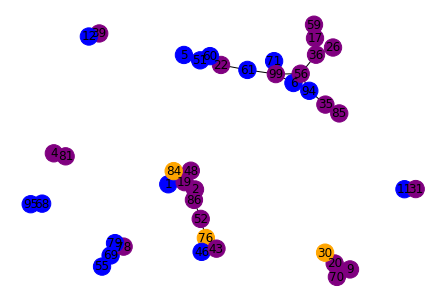

In [491]:
color_map = []
for node in friendship_graph:
    if 'task' in topic_types[node]:
        color_map.append('purple')
    elif 'algorithm' in topic_types[node]:
        color_map.append('blue')
    else:
        color_map.append('orange')
networkx.draw(friendship_graph, node_color=color_map, with_labels=True)

In [495]:
tryst_graph = networkx.Graph()
for pair, score in tryst.items():
    if score['score'] > 1.5:
        tryst_graph.add_edge(*pair)
centralities = networkx.centrality.degree_centrality(tryst_graph)
for i, component in enumerate(networkx.components.connected_components(tryst_graph)):
    print("Component ", i, component)
    for t in component:
        print(topic_names[t], topic_types[t], centralities[t])

Component  0 {36, 6, 43, 78, 14, 46, 79, 83, 57, 31}
DISCOURSE ['task'] 0.058823529411764705
REINFORCEMENT LEARNING ['algorithm'] 0.11764705882352941
STATISTICAL MACHINE TRANSLATION ['task', 'algorithm'] 0.058823529411764705
NEURAL MACHINE TRANSLATION ['task', 'algorithm'] 0.3529411764705882
GENERATION ['task'] 0.11764705882352941
TRANSFER LEARNING ['algorithm'] 0.058823529411764705
RECURRENT NEURAL NETWORKS ['algorithm'] 0.11764705882352941
TRANSLITERATION ['task'] 0.058823529411764705
QUESTION ANSWERING ['task'] 0.058823529411764705
SUMMARIZATION ['task'] 0.1764705882352941
Component  1 {19, 23}
PHONOLOGY ['task'] 0.058823529411764705
LANGUAGE MODELS (CLASSICAL) ['task'] 0.058823529411764705
Component  2 {74, 99}
VISION/MULTIMODAL ['task'] 0.058823529411764705
SCENE DESCRIPTION ['task'] 0.058823529411764705
Component  3 {76, 84}
CROSS-LINGUAL/PARALLEL CORPORA ['data'] 0.058823529411764705
DICTIONARIES ['data'] 0.058823529411764705
Component  4 {51, 28}
CONSTITUENT PARSING ['algorithm

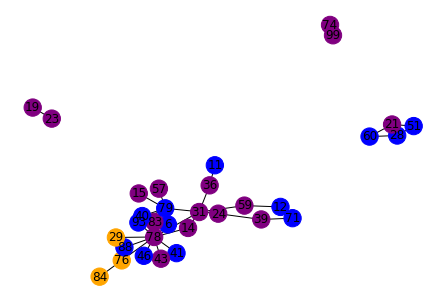

In [494]:
color_map = []
for node in tryst_graph:
    if 'task' in topic_types[node]:
        color_map.append('purple')
    elif 'algorithm' in topic_types[node]:
        color_map.append('blue')
    else:
        color_map.append('orange')
networkx.draw(tryst_graph, node_color=color_map, with_labels=True)

### NIPS relations

In [373]:
pmis_nips = {}
corrs_nips = {}
df = texts_topics_df[texts_topics_df['Conference']=='NIPS']
compute_corrs(df, pmis_nips)
# _probs_for_topic(10)
compute_pmis(df, corrs_nips)

0 1 DOMAIN ADAPTATION FINITE STATE MACHINES 0.9163074314635751
0 2 DOMAIN ADAPTATION MORPHOLOGY 0.7472989218584578
0 3 DOMAIN ADAPTATION MULTI-WORD EXPRESSIONS 0.8660614412285642
0 4 DOMAIN ADAPTATION SENTIMENT ANALYSIS 0.8944476478776343
0 5 DOMAIN ADAPTATION TREES 0.9117327971886064
0 6 DOMAIN ADAPTATION REINFORCEMENT LEARNING 0.9553455829426818
0 7 DOMAIN ADAPTATION SVMs 0.8577573155769568
0 8 DOMAIN ADAPTATION LINEAR PROGRAMMING 0.9133420423836914
0 9 DOMAIN ADAPTATION ARGUMENT MINING 0.8642690161089295
0 11 DOMAIN ADAPTATION TOPIC MODELS 0.724802870926517
0 12 DOMAIN ADAPTATION CLUSTERING 0.8642682263303305
0 13 DOMAIN ADAPTATION LANGUAGE ACQUISITION/SIMPLIFICATION 0.9167120922938509
0 14 DOMAIN ADAPTATION GENERATION 0.9335291271599712
0 15 DOMAIN ADAPTATION NAMED ENTITY RECOGNITION 0.8094243240102046
0 16 DOMAIN ADAPTATION DISCOURSE SEGMENTATION 0.8570516783265167
0 17 DOMAIN ADAPTATION EVENTS/TEMPORAL 0.8973977660351806
0 19 DOMAIN ADAPTATION PHONOLOGY 0.7803060301825605
0 20 DO

1 67 FINITE STATE MACHINES DISAMBIGUATION 0.934082886610001
1 68 FINITE STATE MACHINES GRAPHS/ABSTRACT MEANING REPRESENTATION 0.9432009452967388
1 69 FINITE STATE MACHINES NEURAL NETWORKS/DEEP LEARNING 0.9203173429164883
1 70 FINITE STATE MACHINES NARRATIVES 0.9685293232433666
1 71 FINITE STATE MACHINES ONTOLOGIES 0.9819131335424859
1 72 FINITE STATE MACHINES PREDICTION 0.9623972767988324
1 73 FINITE STATE MACHINES QUANTITATIVE ANALYSIS/TEXT MINING 0.9881062999844332
1 74 FINITE STATE MACHINES VISION/MULTIMODAL 0.9935217308618584
1 76 FINITE STATE MACHINES CROSS-LINGUAL/PARALLEL CORPORA 0.9131321867832821
1 78 FINITE STATE MACHINES NEURAL MACHINE TRANSLATION 0.7153033016214706
1 79 FINITE STATE MACHINES RECURRENT NEURAL NETWORKS 0.8615213990091468
1 80 FINITE STATE MACHINES COMPLEXITY ANALYSIS 0.9758711765894641
1 81 FINITE STATE MACHINES OPINION MINING 0.8860290069546909
1 83 FINITE STATE MACHINES TRANSLITERATION 0.9145355671378597
1 84 FINITE STATE MACHINES DICTIONARIES 0.96547678885

3 43 MULTI-WORD EXPRESSIONS STATISTICAL MACHINE TRANSLATION 0.9535739195300743
3 46 MULTI-WORD EXPRESSIONS TRANSFER LEARNING 0.9434452822748121
3 48 MULTI-WORD EXPRESSIONS SPEECH RECOGNITION 0.9291802136421488
3 50 MULTI-WORD EXPRESSIONS LEXICONS 0.688473032064526
3 51 MULTI-WORD EXPRESSIONS CONSTITUENT PARSING 0.9233705985555674
3 52 MULTI-WORD EXPRESSIONS MULTILINGUALITY 0.911368551579787
3 53 MULTI-WORD EXPRESSIONS UNSUPERVISED LEARNING 0.9308307684695003
3 54 MULTI-WORD EXPRESSIONS RANKING 0.6789074930088592
3 55 MULTI-WORD EXPRESSIONS EMBEDDINGS 0.9249039163986006
3 56 MULTI-WORD EXPRESSIONS PLAN-BASED DIALOGUE 0.959506269813982
3 57 MULTI-WORD EXPRESSIONS QUESTION ANSWERING 0.7856586267157173
3 59 MULTI-WORD EXPRESSIONS EVENT EXTRACTION 0.9563128665563707
3 60 MULTI-WORD EXPRESSIONS GRAMMARS 0.9413573906758306
3 61 MULTI-WORD EXPRESSIONS LOGICAL FORMS 0.8459048126557127
3 63 MULTI-WORD EXPRESSIONS KNOWLEDGE BASE 0.8600189859927452
3 65 MULTI-WORD EXPRESSIONS INFORMATION EXTRACTIO

5 17 TREES EVENTS/TEMPORAL 0.9589400125510534
5 19 TREES PHONOLOGY 0.812923341752819
5 20 TREES STYLISTICS 0.978500467415042
5 21 TREES POS TAGGING/STATISTICAL PARSING 0.9550338788806447
5 22 TREES UNIFICATION 0.9321493817451759
5 23 TREES LANGUAGE MODELS (CLASSICAL) 0.9535647822113504
5 24 TREES TEXTUAL ENTAILMENT 0.9606543587949091
5 25 TREES BIOMEDICAL 0.9821169329913328
5 26 TREES ANAPHORA/COREFERENCE RESOLUTION 0.8686463653157783
5 28 TREES DEPENDENCY PARSING 0.9172923374011215
5 29 TREES DATABASE/RESOURCE? 0.9363639904723943
5 30 TREES SOCIAL MEDIA 0.9790630388068503
5 31 TREES SUMMARIZATION 0.9056838664518101
5 32 TREES SPELLING CORRECTION 0.9583209959347945
5 34 TREES EVALUATION/ANNOTATION 0.9795414948727594
5 35 TREES SEMANTIC ROLE LABELING 0.7634554421444418
5 36 TREES DISCOURSE 0.9245868670730294
5 38 TREES SYNTACTICAL STRUCTURE 0.95819899105246
5 39 TREES VECTOR SPACE/SEMANTIC SIMILARITY 0.9800828416246145
5 40 TREES LEARNING 0.9778463031954345
5 41 TREES PROBABILISTIC 0.97

7 8 SVMs LINEAR PROGRAMMING 0.974998405349547
7 9 SVMs ARGUMENT MINING 0.9533387140316891
7 11 SVMs TOPIC MODELS 0.908723090712267
7 12 SVMs CLUSTERING 0.99265798701973
7 13 SVMs LANGUAGE ACQUISITION/SIMPLIFICATION 0.8587114008672367
7 14 SVMs GENERATION 0.8520856792142364
7 15 SVMs NAMED ENTITY RECOGNITION 0.9604923499043713
7 16 SVMs DISCOURSE SEGMENTATION 0.8770708960125077
7 17 SVMs EVENTS/TEMPORAL 0.9352274169638929
7 19 SVMs PHONOLOGY 0.7244710213254737
7 20 SVMs STYLISTICS 0.9835383523015783
7 21 SVMs POS TAGGING/STATISTICAL PARSING 0.9458308809104348
7 22 SVMs UNIFICATION 0.933584583526865
7 23 SVMs LANGUAGE MODELS (CLASSICAL) 0.9133059512013578
7 24 SVMs TEXTUAL ENTAILMENT 0.9621755115625341
7 25 SVMs BIOMEDICAL 0.9632168357742352
7 26 SVMs ANAPHORA/COREFERENCE RESOLUTION 0.8972536903824012
7 28 SVMs DEPENDENCY PARSING 0.8416590215700928
7 29 SVMs DATABASE/RESOURCE? 0.9177432233959508
7 30 SVMs SOCIAL MEDIA 0.9627724771818809
7 31 SVMs SUMMARIZATION 0.933039603567033
7 32 SVMs

9 13 ARGUMENT MINING LANGUAGE ACQUISITION/SIMPLIFICATION 0.8852884071404302
9 14 ARGUMENT MINING GENERATION 0.8572212538215555
9 15 ARGUMENT MINING NAMED ENTITY RECOGNITION 0.8973450656768857
9 16 ARGUMENT MINING DISCOURSE SEGMENTATION 0.8657695548088387
9 17 ARGUMENT MINING EVENTS/TEMPORAL 0.9080763307514844
9 19 ARGUMENT MINING PHONOLOGY 0.7185849180793603
9 20 ARGUMENT MINING STYLISTICS 0.9597922551742172
9 21 ARGUMENT MINING POS TAGGING/STATISTICAL PARSING 0.9674609457026313
9 22 ARGUMENT MINING UNIFICATION 0.9471513437072799
9 23 ARGUMENT MINING LANGUAGE MODELS (CLASSICAL) 0.9087738531391272
9 24 ARGUMENT MINING TEXTUAL ENTAILMENT 0.9594599725213458
9 25 ARGUMENT MINING BIOMEDICAL 0.9267531871871619
9 26 ARGUMENT MINING ANAPHORA/COREFERENCE RESOLUTION 0.8700179623465664
9 28 ARGUMENT MINING DEPENDENCY PARSING 0.7952327631292841
9 29 ARGUMENT MINING DATABASE/RESOURCE? 0.9347923319527984
9 30 ARGUMENT MINING SOCIAL MEDIA 0.9562138813648725
9 31 ARGUMENT MINING SUMMARIZATION 0.905304

12 13 CLUSTERING LANGUAGE ACQUISITION/SIMPLIFICATION 0.8576380875108336
12 14 CLUSTERING GENERATION 0.8410965316430724
12 15 CLUSTERING NAMED ENTITY RECOGNITION 0.9577627288893525
12 16 CLUSTERING DISCOURSE SEGMENTATION 0.8633195569179175
12 17 CLUSTERING EVENTS/TEMPORAL 0.9251825865748183
12 19 CLUSTERING PHONOLOGY 0.710119813070957
12 20 CLUSTERING STYLISTICS 0.9761489161732043
12 21 CLUSTERING POS TAGGING/STATISTICAL PARSING 0.9438127809408341
12 22 CLUSTERING UNIFICATION 0.9163349025300106
12 23 CLUSTERING LANGUAGE MODELS (CLASSICAL) 0.9148863197588533
12 24 CLUSTERING TEXTUAL ENTAILMENT 0.9537851837335742
12 25 CLUSTERING BIOMEDICAL 0.9563353041940184
12 26 CLUSTERING ANAPHORA/COREFERENCE RESOLUTION 0.8719864205686549
12 28 CLUSTERING DEPENDENCY PARSING 0.8454253304550151
12 29 CLUSTERING DATABASE/RESOURCE? 0.9195385708627718
12 30 CLUSTERING SOCIAL MEDIA 0.9611636562661333
12 31 CLUSTERING SUMMARIZATION 0.9274081930166658
12 32 CLUSTERING SPELLING CORRECTION 0.9233632284732425
12

13 83 LANGUAGE ACQUISITION/SIMPLIFICATION TRANSLITERATION 0.9537721498413403
13 84 LANGUAGE ACQUISITION/SIMPLIFICATION DICTIONARIES 0.9364683597644017
13 85 LANGUAGE ACQUISITION/SIMPLIFICATION RELATION EXTRACTION 0.7368311654256666
13 86 LANGUAGE ACQUISITION/SIMPLIFICATION HISTORICAL LINGUISTICS 0.8937976769373557
13 87 LANGUAGE ACQUISITION/SIMPLIFICATION WORDNET/DISAMBIGUATION 0.8125914304978744
13 88 LANGUAGE ACQUISITION/SIMPLIFICATION DEPENDENCY PARSING 0.9026792939148464
13 89 LANGUAGE ACQUISITION/SIMPLIFICATION INFORMATION RETRIEVAL 0.810290767638232
13 90 LANGUAGE ACQUISITION/SIMPLIFICATION COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING 0.7926787198979337
13 91 LANGUAGE ACQUISITION/SIMPLIFICATION ASIAN LANGUAGES 0.9101526226648955
13 92 LANGUAGE ACQUISITION/SIMPLIFICATION CLASSIFICATION 0.8975678502355394
13 93 LANGUAGE ACQUISITION/SIMPLIFICATION SEQUENCE ANALYSIS 0.9405017734649178
13 94 LANGUAGE ACQUISITION/SIMPLIFICATION FRAME SEMANTICS 0.8232045734817344
13 95 LANGUAGE ACQUISIT

15 76 NAMED ENTITY RECOGNITION CROSS-LINGUAL/PARALLEL CORPORA 0.8331165200325203
15 78 NAMED ENTITY RECOGNITION NEURAL MACHINE TRANSLATION 0.666290907664895
15 79 NAMED ENTITY RECOGNITION RECURRENT NEURAL NETWORKS 0.678663745138366
15 80 NAMED ENTITY RECOGNITION COMPLEXITY ANALYSIS 0.9268542569219683
15 81 NAMED ENTITY RECOGNITION OPINION MINING 0.9284891676377978
15 83 NAMED ENTITY RECOGNITION TRANSLITERATION 0.7881158729394631
15 84 NAMED ENTITY RECOGNITION DICTIONARIES 0.8832644876292137
15 85 NAMED ENTITY RECOGNITION RELATION EXTRACTION 0.8483455043900309
15 86 NAMED ENTITY RECOGNITION HISTORICAL LINGUISTICS 0.9346308612867942
15 87 NAMED ENTITY RECOGNITION WORDNET/DISAMBIGUATION 0.7265370181402699
15 88 NAMED ENTITY RECOGNITION DEPENDENCY PARSING 0.9296176503362543
15 89 NAMED ENTITY RECOGNITION INFORMATION RETRIEVAL 0.9535154263952755
15 90 NAMED ENTITY RECOGNITION COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING 0.8736472139385412
15 91 NAMED ENTITY RECOGNITION ASIAN LANGUAGES 0.797

17 71 EVENTS/TEMPORAL ONTOLOGIES 0.9838169805812638
17 72 EVENTS/TEMPORAL PREDICTION 0.9245477821625248
17 73 EVENTS/TEMPORAL QUANTITATIVE ANALYSIS/TEXT MINING 0.984623380142199
17 74 EVENTS/TEMPORAL VISION/MULTIMODAL 0.9775831518515574
17 76 EVENTS/TEMPORAL CROSS-LINGUAL/PARALLEL CORPORA 0.8867029932225239
17 78 EVENTS/TEMPORAL NEURAL MACHINE TRANSLATION 0.6283413834262095
17 79 EVENTS/TEMPORAL RECURRENT NEURAL NETWORKS 0.8340396095612426
17 80 EVENTS/TEMPORAL COMPLEXITY ANALYSIS 0.9460058272421197
17 81 EVENTS/TEMPORAL OPINION MINING 0.8399659946028051
17 83 EVENTS/TEMPORAL TRANSLITERATION 0.9216789835782522
17 84 EVENTS/TEMPORAL DICTIONARIES 0.9513854095006631
17 85 EVENTS/TEMPORAL RELATION EXTRACTION 0.7975659141036717
17 86 EVENTS/TEMPORAL HISTORICAL LINGUISTICS 0.9260715866975499
17 87 EVENTS/TEMPORAL WORDNET/DISAMBIGUATION 0.7852808358117941
17 88 EVENTS/TEMPORAL DEPENDENCY PARSING 0.9252496962068151
17 89 EVENTS/TEMPORAL INFORMATION RETRIEVAL 0.8624267112657767
17 90 EVENTS/TEM

20 93 STYLISTICS SEQUENCE ANALYSIS 0.9890888406223273
20 94 STYLISTICS FRAME SEMANTICS 0.9259951407016218
20 95 STYLISTICS GRAPH-BASED METHODS 0.9831285680491664
20 98 STYLISTICS NEWS ARTICLES 0.9699338381879191
20 99 STYLISTICS SCENE DESCRIPTION 0.9778435592037276
21 22 POS TAGGING/STATISTICAL PARSING UNIFICATION 0.9246720360156075
21 23 POS TAGGING/STATISTICAL PARSING LANGUAGE MODELS (CLASSICAL) 0.9062214182080276
21 24 POS TAGGING/STATISTICAL PARSING TEXTUAL ENTAILMENT 0.944681257957036
21 25 POS TAGGING/STATISTICAL PARSING BIOMEDICAL 0.9425765258626887
21 26 POS TAGGING/STATISTICAL PARSING ANAPHORA/COREFERENCE RESOLUTION 0.8872024510665932
21 28 POS TAGGING/STATISTICAL PARSING DEPENDENCY PARSING 0.8344496341403095
21 29 POS TAGGING/STATISTICAL PARSING DATABASE/RESOURCE? 0.9455436204170895
21 30 POS TAGGING/STATISTICAL PARSING SOCIAL MEDIA 0.9511598305487953
21 31 POS TAGGING/STATISTICAL PARSING SUMMARIZATION 0.8743381907732188
21 32 POS TAGGING/STATISTICAL PARSING SPELLING CORRECTI

22 95 UNIFICATION GRAPH-BASED METHODS 0.9355429097531371
22 98 UNIFICATION NEWS ARTICLES 0.9463294775656016
22 99 UNIFICATION SCENE DESCRIPTION 0.947937100781389
23 24 LANGUAGE MODELS (CLASSICAL) TEXTUAL ENTAILMENT 0.9511633277414809
23 25 LANGUAGE MODELS (CLASSICAL) BIOMEDICAL 0.9668409750262723
23 26 LANGUAGE MODELS (CLASSICAL) ANAPHORA/COREFERENCE RESOLUTION 0.8530712911646966
23 28 LANGUAGE MODELS (CLASSICAL) DEPENDENCY PARSING 0.9536308897388096
23 29 LANGUAGE MODELS (CLASSICAL) DATABASE/RESOURCE? 0.9670757458784491
23 30 LANGUAGE MODELS (CLASSICAL) SOCIAL MEDIA 0.9767587211139818
23 31 LANGUAGE MODELS (CLASSICAL) SUMMARIZATION 0.8717023052881019
23 32 LANGUAGE MODELS (CLASSICAL) SPELLING CORRECTION 0.9637275468230733
23 34 LANGUAGE MODELS (CLASSICAL) EVALUATION/ANNOTATION 0.9474296051900717
23 35 LANGUAGE MODELS (CLASSICAL) SEMANTIC ROLE LABELING 0.742287874907595
23 36 LANGUAGE MODELS (CLASSICAL) DISCOURSE 0.9131750993672244
23 38 LANGUAGE MODELS (CLASSICAL) SYNTACTICAL STRUCTUR

25 26 BIOMEDICAL ANAPHORA/COREFERENCE RESOLUTION 0.8996791580339919
25 28 BIOMEDICAL DEPENDENCY PARSING 0.9341387803933393
25 29 BIOMEDICAL DATABASE/RESOURCE? 0.9542725013923742
25 30 BIOMEDICAL SOCIAL MEDIA 0.9899189200435042
25 31 BIOMEDICAL SUMMARIZATION 0.8834482532396531
25 32 BIOMEDICAL SPELLING CORRECTION 0.9845367208484871
25 34 BIOMEDICAL EVALUATION/ANNOTATION 0.9658748379814618
25 35 BIOMEDICAL SEMANTIC ROLE LABELING 0.7047244407442538
25 36 BIOMEDICAL DISCOURSE 0.9204331561981893
25 38 BIOMEDICAL SYNTACTICAL STRUCTURE 0.966010417251286
25 39 BIOMEDICAL VECTOR SPACE/SEMANTIC SIMILARITY 0.9880199677887156
25 40 BIOMEDICAL LEARNING 0.9679525627180919
25 41 BIOMEDICAL PROBABILISTIC 0.9636662039736253
25 43 BIOMEDICAL STATISTICAL MACHINE TRANSLATION 0.962535397731193
25 46 BIOMEDICAL TRANSFER LEARNING 0.9752153775792448
25 48 BIOMEDICAL SPEECH RECOGNITION 0.9438377412692687
25 50 BIOMEDICAL LEXICONS 0.7460748795121098
25 51 BIOMEDICAL CONSTITUENT PARSING 0.9558543164050479
25 52 

28 43 DEPENDENCY PARSING STATISTICAL MACHINE TRANSLATION 0.8988216498426732
28 46 DEPENDENCY PARSING TRANSFER LEARNING 0.9409477851202929
28 48 DEPENDENCY PARSING SPEECH RECOGNITION 0.891752415642421
28 50 DEPENDENCY PARSING LEXICONS 0.6615792033055612
28 51 DEPENDENCY PARSING CONSTITUENT PARSING 0.8774725171661609
28 52 DEPENDENCY PARSING MULTILINGUALITY 0.8445517981030254
28 53 DEPENDENCY PARSING UNSUPERVISED LEARNING 0.8935694897810785
28 54 DEPENDENCY PARSING RANKING 0.6999716406867053
28 55 DEPENDENCY PARSING EMBEDDINGS 0.8418103314099831
28 56 DEPENDENCY PARSING PLAN-BASED DIALOGUE 0.9022174246642878
28 57 DEPENDENCY PARSING QUESTION ANSWERING 0.7885915495990161
28 59 DEPENDENCY PARSING EVENT EXTRACTION 0.8657856494784351
28 60 DEPENDENCY PARSING GRAMMARS 0.8932664724002826
28 61 DEPENDENCY PARSING LOGICAL FORMS 0.809959419455254
28 63 DEPENDENCY PARSING KNOWLEDGE BASE 0.8172569392749018
28 65 DEPENDENCY PARSING INFORMATION EXTRACTION? 0.8348804818742546
28 66 DEPENDENCY PARSING 

30 76 SOCIAL MEDIA CROSS-LINGUAL/PARALLEL CORPORA 0.9267641370363678
30 78 SOCIAL MEDIA NEURAL MACHINE TRANSLATION 0.7026872679458813
30 79 SOCIAL MEDIA RECURRENT NEURAL NETWORKS 0.839598493290616
30 80 SOCIAL MEDIA COMPLEXITY ANALYSIS 0.9784541083790781
30 81 SOCIAL MEDIA OPINION MINING 0.9047726156732939
30 83 SOCIAL MEDIA TRANSLITERATION 0.9041498565392984
30 84 SOCIAL MEDIA DICTIONARIES 0.9836462631896772
30 85 SOCIAL MEDIA RELATION EXTRACTION 0.860287839381467
30 86 SOCIAL MEDIA HISTORICAL LINGUISTICS 0.9708127140287681
30 87 SOCIAL MEDIA WORDNET/DISAMBIGUATION 0.7910415488245996
30 88 SOCIAL MEDIA DEPENDENCY PARSING 0.96858729138604
30 89 SOCIAL MEDIA INFORMATION RETRIEVAL 0.9140769341595691
30 90 SOCIAL MEDIA COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING 0.8759088968752734
30 91 SOCIAL MEDIA ASIAN LANGUAGES 0.9404331068648558
30 92 SOCIAL MEDIA CLASSIFICATION 0.9830012210668764
30 93 SOCIAL MEDIA SEQUENCE ANALYSIS 0.993593192578701
30 94 SOCIAL MEDIA FRAME SEMANTICS 0.91702989134

34 50 EVALUATION/ANNOTATION LEXICONS 0.8647301579947281
34 51 EVALUATION/ANNOTATION CONSTITUENT PARSING 0.9808968804644369
34 52 EVALUATION/ANNOTATION MULTILINGUALITY 0.9700502620240032
34 53 EVALUATION/ANNOTATION UNSUPERVISED LEARNING 0.9877735018482
34 54 EVALUATION/ANNOTATION RANKING 0.8759909548698552
34 55 EVALUATION/ANNOTATION EMBEDDINGS 0.9857072661056563
34 56 EVALUATION/ANNOTATION PLAN-BASED DIALOGUE 0.9716875625589715
34 57 EVALUATION/ANNOTATION QUESTION ANSWERING 0.8695544450059817
34 59 EVALUATION/ANNOTATION EVENT EXTRACTION 0.9688569520621743
34 60 EVALUATION/ANNOTATION GRAMMARS 0.9416158721263597
34 61 EVALUATION/ANNOTATION LOGICAL FORMS 0.9570421923448901
34 63 EVALUATION/ANNOTATION KNOWLEDGE BASE 0.9651147044181875
34 65 EVALUATION/ANNOTATION INFORMATION EXTRACTION? 0.7597959923438736
34 66 EVALUATION/ANNOTATION HUMAN-COMPUTER INTERACTION/APPLICATION 0.9134864265417135
34 67 EVALUATION/ANNOTATION DISAMBIGUATION 0.8286869513170626
34 68 EVALUATION/ANNOTATION GRAPHS/ABSTR

36 87 DISCOURSE WORDNET/DISAMBIGUATION 0.8313836626699633
36 88 DISCOURSE DEPENDENCY PARSING 0.8841715947740025
36 89 DISCOURSE INFORMATION RETRIEVAL 0.833829594719931
36 90 DISCOURSE COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING 0.7753371179967531
36 91 DISCOURSE ASIAN LANGUAGES 0.8316774770924124
36 92 DISCOURSE CLASSIFICATION 0.9019148375457549
36 93 DISCOURSE SEQUENCE ANALYSIS 0.9209482928137999
36 94 DISCOURSE FRAME SEMANTICS 0.8823397074748993
36 95 DISCOURSE GRAPH-BASED METHODS 0.914843498827714
36 98 DISCOURSE NEWS ARTICLES 0.8722960452361028
36 99 DISCOURSE SCENE DESCRIPTION 0.9057886533433325
38 39 SYNTACTICAL STRUCTURE VECTOR SPACE/SEMANTIC SIMILARITY 0.9637105286351292
38 40 SYNTACTICAL STRUCTURE LEARNING 0.9501210138392251
38 41 SYNTACTICAL STRUCTURE PROBABILISTIC 0.9615433966734814
38 43 SYNTACTICAL STRUCTURE STATISTICAL MACHINE TRANSLATION 0.9572794783194475
38 46 SYNTACTICAL STRUCTURE TRANSFER LEARNING 0.9205762250049953
38 48 SYNTACTICAL STRUCTURE SPEECH RECOGNITION 0.8

40 63 LEARNING KNOWLEDGE BASE 0.9510314895099835
40 65 LEARNING INFORMATION EXTRACTION? 0.8048421918379459
40 66 LEARNING HUMAN-COMPUTER INTERACTION/APPLICATION 0.9297240686248898
40 67 LEARNING DISAMBIGUATION 0.862805271757114
40 68 LEARNING GRAPHS/ABSTRACT MEANING REPRESENTATION 0.9836667484346554
40 69 LEARNING NEURAL NETWORKS/DEEP LEARNING 0.8620263442026006
40 70 LEARNING NARRATIVES 0.975061820384431
40 71 LEARNING ONTOLOGIES 0.9684808962996035
40 72 LEARNING PREDICTION 0.9931412544575331
40 73 LEARNING QUANTITATIVE ANALYSIS/TEXT MINING 0.9635962421814906
40 74 LEARNING VISION/MULTIMODAL 0.9860401381574091
40 76 LEARNING CROSS-LINGUAL/PARALLEL CORPORA 0.9538677824400337
40 78 LEARNING NEURAL MACHINE TRANSLATION 0.7764400488739023
40 79 LEARNING RECURRENT NEURAL NETWORKS 0.8248784575171301
40 80 LEARNING COMPLEXITY ANALYSIS 0.9959925994609571
40 81 LEARNING OPINION MINING 0.9528172540493792
40 83 LEARNING TRANSLITERATION 0.8653141930057014
40 84 LEARNING DICTIONARIES 0.982952319248

46 59 TRANSFER LEARNING EVENT EXTRACTION 0.9503199215408032
46 60 TRANSFER LEARNING GRAMMARS 0.9722779966676887
46 61 TRANSFER LEARNING LOGICAL FORMS 0.9170103272087706
46 63 TRANSFER LEARNING KNOWLEDGE BASE 0.8986678597054772
46 65 TRANSFER LEARNING INFORMATION EXTRACTION? 0.8557346659401003
46 66 TRANSFER LEARNING HUMAN-COMPUTER INTERACTION/APPLICATION 0.9662301979109194
46 67 TRANSFER LEARNING DISAMBIGUATION 0.9256153570835964
46 68 TRANSFER LEARNING GRAPHS/ABSTRACT MEANING REPRESENTATION 0.9337852889146115
46 69 TRANSFER LEARNING NEURAL NETWORKS/DEEP LEARNING 0.9297121422840267
46 70 TRANSFER LEARNING NARRATIVES 0.9644297992483005
46 71 TRANSFER LEARNING ONTOLOGIES 0.9762296660082266
46 72 TRANSFER LEARNING PREDICTION 0.9603034682942924
46 73 TRANSFER LEARNING QUANTITATIVE ANALYSIS/TEXT MINING 0.958788276834733
46 74 TRANSFER LEARNING VISION/MULTIMODAL 0.9805130760053704
46 76 TRANSFER LEARNING CROSS-LINGUAL/PARALLEL CORPORA 0.9364955770441515
46 78 TRANSFER LEARNING NEURAL MACHINE

51 76 CONSTITUENT PARSING CROSS-LINGUAL/PARALLEL CORPORA 0.9402356354109502
51 78 CONSTITUENT PARSING NEURAL MACHINE TRANSLATION 0.7067443106953805
51 79 CONSTITUENT PARSING RECURRENT NEURAL NETWORKS 0.7526987784290636
51 80 CONSTITUENT PARSING COMPLEXITY ANALYSIS 0.9667509884559811
51 81 CONSTITUENT PARSING OPINION MINING 0.9519735116901067
51 83 CONSTITUENT PARSING TRANSLITERATION 0.818669301942213
51 84 CONSTITUENT PARSING DICTIONARIES 0.9513633895119928
51 85 CONSTITUENT PARSING RELATION EXTRACTION 0.8954582053226621
51 86 CONSTITUENT PARSING HISTORICAL LINGUISTICS 0.9670475295671093
51 87 CONSTITUENT PARSING WORDNET/DISAMBIGUATION 0.7590767785095713
51 88 CONSTITUENT PARSING DEPENDENCY PARSING 0.9661406787371886
51 89 CONSTITUENT PARSING INFORMATION RETRIEVAL 0.9310926633265177
51 90 CONSTITUENT PARSING COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING 0.8870537179115565
51 91 CONSTITUENT PARSING ASIAN LANGUAGES 0.8788520706245739
51 92 CONSTITUENT PARSING CLASSIFICATION 0.979675293013

55 56 EMBEDDINGS PLAN-BASED DIALOGUE 0.9694504130102192
55 57 EMBEDDINGS QUESTION ANSWERING 0.8929455560308566
55 59 EMBEDDINGS EVENT EXTRACTION 0.9710899951070239
55 60 EMBEDDINGS GRAMMARS 0.9625693066137871
55 61 EMBEDDINGS LOGICAL FORMS 0.9698964549882227
55 63 EMBEDDINGS KNOWLEDGE BASE 0.9494568963300987
55 65 EMBEDDINGS INFORMATION EXTRACTION? 0.7732007165711602
55 66 EMBEDDINGS HUMAN-COMPUTER INTERACTION/APPLICATION 0.8989497535626704
55 67 EMBEDDINGS DISAMBIGUATION 0.8252048620061676
55 68 EMBEDDINGS GRAPHS/ABSTRACT MEANING REPRESENTATION 0.99035969695848
55 69 EMBEDDINGS NEURAL NETWORKS/DEEP LEARNING 0.8156389543132676
55 70 EMBEDDINGS NARRATIVES 0.9576002707200248
55 71 EMBEDDINGS ONTOLOGIES 0.9544814155900756
55 72 EMBEDDINGS PREDICTION 0.9890102785195403
55 73 EMBEDDINGS QUANTITATIVE ANALYSIS/TEXT MINING 0.9578373966587217
55 74 EMBEDDINGS VISION/MULTIMODAL 0.9750183740109356
55 76 EMBEDDINGS CROSS-LINGUAL/PARALLEL CORPORA 0.9357985395434416
55 78 EMBEDDINGS NEURAL MACHINE T

59 93 EVENT EXTRACTION SEQUENCE ANALYSIS 0.9807928305179667
59 94 EVENT EXTRACTION FRAME SEMANTICS 0.9314952923161458
59 95 EVENT EXTRACTION GRAPH-BASED METHODS 0.9720538220319215
59 98 EVENT EXTRACTION NEWS ARTICLES 0.9381658961785752
59 99 EVENT EXTRACTION SCENE DESCRIPTION 0.9788937010667148
60 61 GRAMMARS LOGICAL FORMS 0.9253454170974003
60 63 GRAMMARS KNOWLEDGE BASE 0.8952792481479214
60 65 GRAMMARS INFORMATION EXTRACTION? 0.8799714437503627
60 66 GRAMMARS HUMAN-COMPUTER INTERACTION/APPLICATION 0.9254278907886336
60 67 GRAMMARS DISAMBIGUATION 0.9216393309569403
60 68 GRAMMARS GRAPHS/ABSTRACT MEANING REPRESENTATION 0.9287191137734158
60 69 GRAMMARS NEURAL NETWORKS/DEEP LEARNING 0.9223821807247365
60 70 GRAMMARS NARRATIVES 0.9574520923191386
60 71 GRAMMARS ONTOLOGIES 0.9686778917053981
60 72 GRAMMARS PREDICTION 0.9541223231979621
60 73 GRAMMARS QUANTITATIVE ANALYSIS/TEXT MINING 0.9713014198899232
60 74 GRAMMARS VISION/MULTIMODAL 0.9697461024399427
60 76 GRAMMARS CROSS-LINGUAL/PARALL

66 73 HUMAN-COMPUTER INTERACTION/APPLICATION QUANTITATIVE ANALYSIS/TEXT MINING 0.9223283344851932
66 74 HUMAN-COMPUTER INTERACTION/APPLICATION VISION/MULTIMODAL 0.9490063909169792
66 76 HUMAN-COMPUTER INTERACTION/APPLICATION CROSS-LINGUAL/PARALLEL CORPORA 0.9442831734568
66 78 HUMAN-COMPUTER INTERACTION/APPLICATION NEURAL MACHINE TRANSLATION 0.7626159712784639
66 79 HUMAN-COMPUTER INTERACTION/APPLICATION RECURRENT NEURAL NETWORKS 0.8799873314193711
66 80 HUMAN-COMPUTER INTERACTION/APPLICATION COMPLEXITY ANALYSIS 0.9411754277447248
66 81 HUMAN-COMPUTER INTERACTION/APPLICATION OPINION MINING 0.8310555231926282
66 83 HUMAN-COMPUTER INTERACTION/APPLICATION TRANSLITERATION 0.9034330433685781
66 84 HUMAN-COMPUTER INTERACTION/APPLICATION DICTIONARIES 0.9165755616663485
66 85 HUMAN-COMPUTER INTERACTION/APPLICATION RELATION EXTRACTION 0.7323037901508697
66 86 HUMAN-COMPUTER INTERACTION/APPLICATION HISTORICAL LINGUISTICS 0.9067585835591843
66 87 HUMAN-COMPUTER INTERACTION/APPLICATION WORDNET/DIS

70 85 NARRATIVES RELATION EXTRACTION 0.8514980412911158
70 86 NARRATIVES HISTORICAL LINGUISTICS 0.9671139030120003
70 87 NARRATIVES WORDNET/DISAMBIGUATION 0.7976019613553147
70 88 NARRATIVES DEPENDENCY PARSING 0.9678481877836086
70 89 NARRATIVES INFORMATION RETRIEVAL 0.9131152965824146
70 90 NARRATIVES COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING 0.8500444697089897
70 91 NARRATIVES ASIAN LANGUAGES 0.8803746913145415
70 92 NARRATIVES CLASSIFICATION 0.9524736814860646
70 93 NARRATIVES SEQUENCE ANALYSIS 0.9658855296248909
70 94 NARRATIVES FRAME SEMANTICS 0.8968627158686596
70 95 NARRATIVES GRAPH-BASED METHODS 0.9409585197883739
70 98 NARRATIVES NEWS ARTICLES 0.975701346686081
70 99 NARRATIVES SCENE DESCRIPTION 0.9396429225130545
71 72 ONTOLOGIES PREDICTION 0.9596541731681025
71 73 ONTOLOGIES QUANTITATIVE ANALYSIS/TEXT MINING 0.9737145820829387
71 74 ONTOLOGIES VISION/MULTIMODAL 0.9815286525197325
71 76 ONTOLOGIES CROSS-LINGUAL/PARALLEL CORPORA 0.9026384014702084
71 78 ONTOLOGIES NEURAL MA

78 87 NEURAL MACHINE TRANSLATION WORDNET/DISAMBIGUATION 0.6265559379318644
78 88 NEURAL MACHINE TRANSLATION DEPENDENCY PARSING 0.7950117949918495
78 89 NEURAL MACHINE TRANSLATION INFORMATION RETRIEVAL 0.7313738792145578
78 90 NEURAL MACHINE TRANSLATION COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING 0.5508070492971419
78 91 NEURAL MACHINE TRANSLATION ASIAN LANGUAGES 0.624847626668597
78 92 NEURAL MACHINE TRANSLATION CLASSIFICATION 0.7056172578299476
78 93 NEURAL MACHINE TRANSLATION SEQUENCE ANALYSIS 0.7157018100853741
78 94 NEURAL MACHINE TRANSLATION FRAME SEMANTICS 0.6868729919508021
78 95 NEURAL MACHINE TRANSLATION GRAPH-BASED METHODS 0.7160159153624155
78 98 NEURAL MACHINE TRANSLATION NEWS ARTICLES 0.7843535688258705
78 99 NEURAL MACHINE TRANSLATION SCENE DESCRIPTION 0.6387853718634957
79 80 RECURRENT NEURAL NETWORKS COMPLEXITY ANALYSIS 0.8537433692396688
79 81 RECURRENT NEURAL NETWORKS OPINION MINING 0.6728223646385944
79 83 RECURRENT NEURAL NETWORKS TRANSLITERATION 0.8816170016637136

88 98 DEPENDENCY PARSING NEWS ARTICLES 0.9680741508477485
88 99 DEPENDENCY PARSING SCENE DESCRIPTION 0.9371979005404825
89 90 INFORMATION RETRIEVAL COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING 0.9334069766705738
89 91 INFORMATION RETRIEVAL ASIAN LANGUAGES 0.7869311813770644
89 92 INFORMATION RETRIEVAL CLASSIFICATION 0.9544679722715719
89 93 INFORMATION RETRIEVAL SEQUENCE ANALYSIS 0.9402445900711159
89 94 INFORMATION RETRIEVAL FRAME SEMANTICS 0.8579222465995003
89 95 INFORMATION RETRIEVAL GRAPH-BASED METHODS 0.960731324440093
89 98 INFORMATION RETRIEVAL NEWS ARTICLES 0.9030298557702253
89 99 INFORMATION RETRIEVAL SCENE DESCRIPTION 0.887050403777546
90 91 COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING ASIAN LANGUAGES 0.7296006540588265
90 92 COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING CLASSIFICATION 0.912447943527147
90 93 COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING SEQUENCE ANALYSIS 0.8898585999204811
90 94 COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING FRAME SEMANTICS 0.8234688632809795


1 14 FINITE STATE MACHINES GENERATION 0.00015202923507982245
1 15 FINITE STATE MACHINES NAMED ENTITY RECOGNITION 0.00015605493133583021
1 16 FINITE STATE MACHINES DISCOURSE SEGMENTATION 0.00015324313077122066
1 17 FINITE STATE MACHINES EVENTS/TEMPORAL 0.00011793076244271208
1 18 FINITE STATE MACHINES MACHINE TRANSLATION -1
1 19 FINITE STATE MACHINES PHONOLOGY 0.00014922752808988764
1 20 FINITE STATE MACHINES STYLISTICS 9.606087092374667e-05
1 21 FINITE STATE MACHINES POS TAGGING/STATISTICAL PARSING 0.0001848018923713779
1 22 FINITE STATE MACHINES UNIFICATION 0.00017783834280376073
1 23 FINITE STATE MACHINES LANGUAGE MODELS (CLASSICAL) 0.00015434004198049142
1 24 FINITE STATE MACHINES TEXTUAL ENTAILMENT 0.00013545217354711105
1 25 FINITE STATE MACHINES BIOMEDICAL 0.00013216302623960527
1 26 FINITE STATE MACHINES ANAPHORA/COREFERENCE RESOLUTION 0.00018167589021186203
1 27 FINITE STATE MACHINES META -1
1 28 FINITE STATE MACHINES DEPENDENCY PARSING 0.00013798541297062883
1 29 FINITE STATE 

2 66 MORPHOLOGY HUMAN-COMPUTER INTERACTION/APPLICATION 0.00017192765284368338
2 67 MORPHOLOGY DISAMBIGUATION 0.0001705773094272393
2 68 MORPHOLOGY GRAPHS/ABSTRACT MEANING REPRESENTATION 0.0001431895471630571
2 69 MORPHOLOGY NEURAL NETWORKS/DEEP LEARNING 0.0001378929950358522
2 70 MORPHOLOGY NARRATIVES 0.00013972613677192702
2 71 MORPHOLOGY ONTOLOGIES 0.0002598752598752599
2 72 MORPHOLOGY PREDICTION 0.00015903174775890787
2 73 MORPHOLOGY QUANTITATIVE ANALYSIS/TEXT MINING 0.00015397434968480544
2 74 MORPHOLOGY VISION/MULTIMODAL 0.00017668448710203243
2 75 MORPHOLOGY MACHINE TRANSLATION (STATISTICAL) -1
2 76 MORPHOLOGY CROSS-LINGUAL/PARALLEL CORPORA 0.00040218790218790216
2 77 MORPHOLOGY SYNTACTIC STRUCTURE -1
2 78 MORPHOLOGY NEURAL MACHINE TRANSLATION 9.692069118298627e-05
2 79 MORPHOLOGY RECURRENT NEURAL NETWORKS 9.863878477017163e-05
2 80 MORPHOLOGY COMPLEXITY ANALYSIS 0.00017509887936717204
2 81 MORPHOLOGY OPINION MINING 0.00010897994768962511
2 82 MORPHOLOGY TWITTER/SOCIAL MEDIA -1
2

4 40 SENTIMENT ANALYSIS LEARNING 0.00014950783403766215
4 41 SENTIMENT ANALYSIS PROBABILISTIC 0.00013943760167325122
4 42 SENTIMENT ANALYSIS ? -1
4 43 SENTIMENT ANALYSIS STATISTICAL MACHINE TRANSLATION 0.00017568850902184235
4 44 SENTIMENT ANALYSIS FRENCH -1
4 45 SENTIMENT ANALYSIS SYNTACTIC STRUCTURE -1
4 46 SENTIMENT ANALYSIS TRANSFER LEARNING 0.00012958367797077474
4 47 SENTIMENT ANALYSIS ANNOTATION -1
4 48 SENTIMENT ANALYSIS SPEECH RECOGNITION 0.0001754547973035368
4 49 SENTIMENT ANALYSIS POS TAGGING/CHUNKING -1
4 50 SENTIMENT ANALYSIS LEXICONS 0.00014245014245014244
4 51 SENTIMENT ANALYSIS CONSTITUENT PARSING 0.00014504014504014505
4 52 SENTIMENT ANALYSIS MULTILINGUALITY 0.00010508617065994115
4 53 SENTIMENT ANALYSIS UNSUPERVISED LEARNING 0.00016444363237712407
4 54 SENTIMENT ANALYSIS RANKING 0.0001428792091442694
4 55 SENTIMENT ANALYSIS EMBEDDINGS 0.00013699568463593396
4 56 SENTIMENT ANALYSIS PLAN-BASED DIALOGUE 0.00016542597187758478
4 57 SENTIMENT ANALYSIS QUESTION ANSWERING 0

6 27 REINFORCEMENT LEARNING META -1
6 28 REINFORCEMENT LEARNING DEPENDENCY PARSING 0.000131021409455843
6 29 REINFORCEMENT LEARNING DATABASE/RESOURCE? 0.0001532928213200571
6 30 REINFORCEMENT LEARNING SOCIAL MEDIA 0.0001896583902452512
6 31 REINFORCEMENT LEARNING SUMMARIZATION 0.00013771186440677966
6 32 REINFORCEMENT LEARNING SPELLING CORRECTION 0.00012243420492291968
6 33 REINFORCEMENT LEARNING METRICS? -1
6 34 REINFORCEMENT LEARNING EVALUATION/ANNOTATION 0.00011565616086372316
6 35 REINFORCEMENT LEARNING SEMANTIC ROLE LABELING 0.00022408735332464145
6 36 REINFORCEMENT LEARNING DISCOURSE 0.00016297262059973924
6 37 REINFORCEMENT LEARNING ? -1
6 38 REINFORCEMENT LEARNING SYNTACTICAL STRUCTURE 0.0001441082480482181
6 39 REINFORCEMENT LEARNING VECTOR SPACE/SEMANTIC SIMILARITY 0.00010627227466877057
6 40 REINFORCEMENT LEARNING LEARNING 0.00015022236122774245
6 41 REINFORCEMENT LEARNING PROBABILISTIC 0.00015741813456910235
6 42 REINFORCEMENT LEARNING ? -1
6 43 REINFORCEMENT LEARNING STATI

7 87 SVMs WORDNET/DISAMBIGUATION 7.802746566791511e-05
7 88 SVMs DEPENDENCY PARSING 0.0001151043465172081
7 89 SVMs INFORMATION RETRIEVAL 0.00015941423514149387
7 90 SVMs COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING 0.00016366097000597993
7 91 SVMs ASIAN LANGUAGES 0.00014256697712722508
7 92 SVMs CLASSIFICATION 0.00020780053766343838
7 93 SVMs SEQUENCE ANALYSIS 0.00015232460500617573
7 94 SVMs FRAME SEMANTICS 0.00010282012761120282
7 95 SVMs GRAPH-BASED METHODS 0.00013384238811116632
7 96 SVMs GERMAN -1
7 97 SVMs CONSTITUENT PARSING -1
7 98 SVMs NEWS ARTICLES 0.0001249636420438019
7 99 SVMs SCENE DESCRIPTION 0.0001391535705762558
8 9 LINEAR PROGRAMMING ARGUMENT MINING 0.00015185579239116524
8 10 LINEAR PROGRAMMING TABLES/FIGURES? -1
8 11 LINEAR PROGRAMMING TOPIC MODELS 0.00012617925627365413
8 12 LINEAR PROGRAMMING CLUSTERING 0.00015634508815090575
8 13 LINEAR PROGRAMMING LANGUAGE ACQUISITION/SIMPLIFICATION 0.00013278096452092628
8 14 LINEAR PROGRAMMING GENERATION 0.0001293211180142244

9 74 ARGUMENT MINING VISION/MULTIMODAL 0.00015041896104738787
9 75 ARGUMENT MINING MACHINE TRANSLATION (STATISTICAL) -1
9 76 ARGUMENT MINING CROSS-LINGUAL/PARALLEL CORPORA 0.00012487512487512488
9 77 ARGUMENT MINING SYNTACTIC STRUCTURE -1
9 78 ARGUMENT MINING NEURAL MACHINE TRANSLATION 0.00017195918835263098
9 79 ARGUMENT MINING RECURRENT NEURAL NETWORKS 0.00011229646266142616
9 80 ARGUMENT MINING COMPLEXITY ANALYSIS 0.00013591591335493776
9 81 ARGUMENT MINING OPINION MINING 0.0002326302729528536
9 82 ARGUMENT MINING TWITTER/SOCIAL MEDIA -1
9 83 ARGUMENT MINING TRANSLITERATION 9.201324990798675e-05
9 84 ARGUMENT MINING DICTIONARIES 0.00014334128536178318
9 85 ARGUMENT MINING RELATION EXTRACTION 0.00030594405594405597
9 86 ARGUMENT MINING HISTORICAL LINGUISTICS 0.00016355326089839364
9 87 ARGUMENT MINING WORDNET/DISAMBIGUATION 0.00021853146853146853
9 88 ARGUMENT MINING DEPENDENCY PARSING 0.0001405214171171618
9 89 ARGUMENT MINING INFORMATION RETRIEVAL 0.0001676405785994827
9 90 ARGUMEN

11 69 TOPIC MODELS NEURAL NETWORKS/DEEP LEARNING 8.226012564755936e-05
11 70 TOPIC MODELS NARRATIVES 0.00015895354291939505
11 71 TOPIC MODELS ONTOLOGIES 0.0002397536846355744
11 72 TOPIC MODELS PREDICTION 0.0001259907547171345
11 73 TOPIC MODELS QUANTITATIVE ANALYSIS/TEXT MINING 0.0001671205308451725
11 74 TOPIC MODELS VISION/MULTIMODAL 0.00012398281509623613
11 75 TOPIC MODELS MACHINE TRANSLATION (STATISTICAL) -1
11 76 TOPIC MODELS CROSS-LINGUAL/PARALLEL CORPORA 0.0002968378952630921
11 77 TOPIC MODELS SYNTACTIC STRUCTURE -1
11 78 TOPIC MODELS NEURAL MACHINE TRANSLATION 4.840583451658707e-05
11 79 TOPIC MODELS RECURRENT NEURAL NETWORKS 6.13062053374715e-05
11 80 TOPIC MODELS COMPLEXITY ANALYSIS 0.0001300332885218616
11 81 TOPIC MODELS OPINION MINING 0.00023283379900093133
11 82 TOPIC MODELS TWITTER/SOCIAL MEDIA -1
11 83 TOPIC MODELS TRANSLITERATION 0.0002762812543168946
11 84 TOPIC MODELS DICTIONARIES 0.0001460285985481683
11 85 TOPIC MODELS RELATION EXTRACTION 0.00016404199475065617

13 38 LANGUAGE ACQUISITION/SIMPLIFICATION SYNTACTICAL STRUCTURE 0.00018941546387847105
13 39 LANGUAGE ACQUISITION/SIMPLIFICATION VECTOR SPACE/SEMANTIC SIMILARITY 0.00013376136971642589
13 40 LANGUAGE ACQUISITION/SIMPLIFICATION LEARNING 0.0001461178786760182
13 41 LANGUAGE ACQUISITION/SIMPLIFICATION PROBABILISTIC 0.0001472360092073083
13 42 LANGUAGE ACQUISITION/SIMPLIFICATION ? -1
13 43 LANGUAGE ACQUISITION/SIMPLIFICATION STATISTICAL MACHINE TRANSLATION 0.00013227513227513228
13 44 LANGUAGE ACQUISITION/SIMPLIFICATION FRENCH -1
13 45 LANGUAGE ACQUISITION/SIMPLIFICATION SYNTACTIC STRUCTURE -1
13 46 LANGUAGE ACQUISITION/SIMPLIFICATION TRANSFER LEARNING 0.0001578767707799966
13 47 LANGUAGE ACQUISITION/SIMPLIFICATION ANNOTATION -1
13 48 LANGUAGE ACQUISITION/SIMPLIFICATION SPEECH RECOGNITION 0.00013100478286552717
13 49 LANGUAGE ACQUISITION/SIMPLIFICATION POS TAGGING/CHUNKING -1
13 50 LANGUAGE ACQUISITION/SIMPLIFICATION LEXICONS 0.0001889644746787604
13 51 LANGUAGE ACQUISITION/SIMPLIFICATION 

14 99 GENERATION SCENE DESCRIPTION 0.0001943678703003921
15 16 NAMED ENTITY RECOGNITION DISCOURSE SEGMENTATION 0.00018566954050825018
15 17 NAMED ENTITY RECOGNITION EVENTS/TEMPORAL 0.00011383138944345207
15 18 NAMED ENTITY RECOGNITION MACHINE TRANSLATION -1
15 19 NAMED ENTITY RECOGNITION PHONOLOGY 0.00014280913978494624
15 20 NAMED ENTITY RECOGNITION STYLISTICS 0.0001303172467299463
15 21 NAMED ENTITY RECOGNITION POS TAGGING/STATISTICAL PARSING 0.00021222410865874363
15 22 NAMED ENTITY RECOGNITION UNIFICATION 0.00011072562190890973
15 23 NAMED ENTITY RECOGNITION LANGUAGE MODELS (CLASSICAL) 0.00013293158454448777
15 24 NAMED ENTITY RECOGNITION TEXTUAL ENTAILMENT 0.00020387821674519753
15 25 NAMED ENTITY RECOGNITION BIOMEDICAL 0.00013852417548001637
15 26 NAMED ENTITY RECOGNITION ANAPHORA/COREFERENCE RESOLUTION 0.00016048788316482104
15 27 NAMED ENTITY RECOGNITION META -1
15 28 NAMED ENTITY RECOGNITION DEPENDENCY PARSING 0.0003254102999434069
15 29 NAMED ENTITY RECOGNITION DATABASE/RESOU

16 56 DISCOURSE SEGMENTATION PLAN-BASED DIALOGUE 0.00015607004854316682
16 57 DISCOURSE SEGMENTATION QUESTION ANSWERING 4.88860953977233e-05
16 58 DISCOURSE SEGMENTATION ? -1
16 59 DISCOURSE SEGMENTATION EVENT EXTRACTION 0.00013275470592543764
16 60 DISCOURSE SEGMENTATION GRAMMARS 0.00012282415579815706
16 61 DISCOURSE SEGMENTATION LOGICAL FORMS 0.00011881209703351264
16 62 DISCOURSE SEGMENTATION Nothing -1
16 63 DISCOURSE SEGMENTATION KNOWLEDGE BASE 0.00015571126682237794
16 64 DISCOURSE SEGMENTATION ? -1
16 65 DISCOURSE SEGMENTATION INFORMATION EXTRACTION? 0.00017949638442997076
16 66 DISCOURSE SEGMENTATION HUMAN-COMPUTER INTERACTION/APPLICATION 0.00015664519481313374
16 67 DISCOURSE SEGMENTATION DISAMBIGUATION 0.00019374212922600018
16 68 DISCOURSE SEGMENTATION GRAPHS/ABSTRACT MEANING REPRESENTATION 0.00019191376807270848
16 69 DISCOURSE SEGMENTATION NEURAL NETWORKS/DEEP LEARNING 0.00018166854901548779
16 70 DISCOURSE SEGMENTATION NARRATIVES 0.00013085463602450308
16 71 DISCOURSE SE

18 38 MACHINE TRANSLATION SYNTACTICAL STRUCTURE -1
18 39 MACHINE TRANSLATION VECTOR SPACE/SEMANTIC SIMILARITY -1
18 40 MACHINE TRANSLATION LEARNING -1
18 41 MACHINE TRANSLATION PROBABILISTIC -1
18 42 MACHINE TRANSLATION ? -1
18 43 MACHINE TRANSLATION STATISTICAL MACHINE TRANSLATION -1
18 44 MACHINE TRANSLATION FRENCH -1
18 45 MACHINE TRANSLATION SYNTACTIC STRUCTURE -1
18 46 MACHINE TRANSLATION TRANSFER LEARNING -1
18 47 MACHINE TRANSLATION ANNOTATION -1
18 48 MACHINE TRANSLATION SPEECH RECOGNITION -1
18 49 MACHINE TRANSLATION POS TAGGING/CHUNKING -1
18 50 MACHINE TRANSLATION LEXICONS -1
18 51 MACHINE TRANSLATION CONSTITUENT PARSING -1
18 52 MACHINE TRANSLATION MULTILINGUALITY -1
18 53 MACHINE TRANSLATION UNSUPERVISED LEARNING -1
18 54 MACHINE TRANSLATION RANKING -1
18 55 MACHINE TRANSLATION EMBEDDINGS -1
18 56 MACHINE TRANSLATION PLAN-BASED DIALOGUE -1
18 57 MACHINE TRANSLATION QUESTION ANSWERING -1
18 58 MACHINE TRANSLATION ? -1
18 59 MACHINE TRANSLATION EVENT EXTRACTION -1
18 60 MACH

20 43 STYLISTICS STATISTICAL MACHINE TRANSLATION 0.00013152950018789929
20 44 STYLISTICS FRENCH -1
20 45 STYLISTICS SYNTACTIC STRUCTURE -1
20 46 STYLISTICS TRANSFER LEARNING 0.0001297111200009698
20 47 STYLISTICS ANNOTATION -1
20 48 STYLISTICS SPEECH RECOGNITION 0.00027068324511315235
20 49 STYLISTICS POS TAGGING/CHUNKING -1
20 50 STYLISTICS LEXICONS 0.00021474204112310088
20 51 STYLISTICS CONSTITUENT PARSING 0.0001571521300946329
20 52 STYLISTICS MULTILINGUALITY 0.00012937327887334356
20 53 STYLISTICS UNSUPERVISED LEARNING 0.00013969709385413124
20 54 STYLISTICS RANKING 0.00012564349845832032
20 55 STYLISTICS EMBEDDINGS 0.0001305088540218311
20 56 STYLISTICS PLAN-BASED DIALOGUE 0.0001858788635527916
20 57 STYLISTICS QUESTION ANSWERING 0.00014157992711255605
20 58 STYLISTICS ? -1
20 59 STYLISTICS EVENT EXTRACTION 0.0002784117469134105
20 60 STYLISTICS GRAMMARS 0.00012367752622070792
20 61 STYLISTICS LOGICAL FORMS 0.0001297221204860692
20 62 STYLISTICS Nothing -1
20 63 STYLISTICS KNOWLE

22 41 UNIFICATION PROBABILISTIC 0.00015166232275816297
22 42 UNIFICATION ? -1
22 43 UNIFICATION STATISTICAL MACHINE TRANSLATION 0.0001271294177472667
22 44 UNIFICATION FRENCH -1
22 45 UNIFICATION SYNTACTIC STRUCTURE -1
22 46 UNIFICATION TRANSFER LEARNING 0.00012548903816343102
22 47 UNIFICATION ANNOTATION -1
22 48 UNIFICATION SPEECH RECOGNITION 0.00010988377044181517
22 49 UNIFICATION POS TAGGING/CHUNKING -1
22 50 UNIFICATION LEXICONS 0.00022701681740583342
22 51 UNIFICATION CONSTITUENT PARSING 0.00020340706839562674
22 52 UNIFICATION MULTILINGUALITY 9.378399669880332e-05
22 53 UNIFICATION UNSUPERVISED LEARNING 0.00013316882001554543
22 54 UNIFICATION RANKING 0.00017231396983816272
22 55 UNIFICATION EMBEDDINGS 0.00016097776672895217
22 56 UNIFICATION PLAN-BASED DIALOGUE 0.00010662467294932047
22 57 UNIFICATION QUESTION ANSWERING 0.00018093768293331915
22 58 UNIFICATION ? -1
22 59 UNIFICATION EVENT EXTRACTION 0.00011860244460568175
22 60 UNIFICATION GRAMMARS 0.00019299164621874225
22 61

24 47 TEXTUAL ENTAILMENT ANNOTATION -1
24 48 TEXTUAL ENTAILMENT SPEECH RECOGNITION 0.00010959439955757584
24 49 TEXTUAL ENTAILMENT POS TAGGING/CHUNKING -1
24 50 TEXTUAL ENTAILMENT LEXICONS 0.00012261458890672374
24 51 TEXTUAL ENTAILMENT CONSTITUENT PARSING 0.00017591646805129951
24 52 TEXTUAL ENTAILMENT MULTILINGUALITY 0.0002417572296923927
24 53 TEXTUAL ENTAILMENT UNSUPERVISED LEARNING 0.0001729207255775886
24 54 TEXTUAL ENTAILMENT RANKING 0.00012056653580614594
24 55 TEXTUAL ENTAILMENT EMBEDDINGS 0.00010714011759565903
24 56 TEXTUAL ENTAILMENT PLAN-BASED DIALOGUE 0.0003171438927147517
24 57 TEXTUAL ENTAILMENT QUESTION ANSWERING 0.000254768748366867
24 58 TEXTUAL ENTAILMENT ? -1
24 59 TEXTUAL ENTAILMENT EVENT EXTRACTION 0.0002483557138942176
24 60 TEXTUAL ENTAILMENT GRAMMARS 0.00017277863672311957
24 61 TEXTUAL ENTAILMENT LOGICAL FORMS 0.00016772364852464365
24 62 TEXTUAL ENTAILMENT Nothing -1
24 63 TEXTUAL ENTAILMENT KNOWLEDGE BASE 0.00016645859342488556
24 64 TEXTUAL ENTAILMENT ? -1

26 67 ANAPHORA/COREFERENCE RESOLUTION DISAMBIGUATION 0.0001151326118356325
26 68 ANAPHORA/COREFERENCE RESOLUTION GRAPHS/ABSTRACT MEANING REPRESENTATION 0.0001779183552436493
26 69 ANAPHORA/COREFERENCE RESOLUTION NEURAL NETWORKS/DEEP LEARNING 0.0001686175536312606
26 70 ANAPHORA/COREFERENCE RESOLUTION NARRATIVES 0.00016534756057232303
26 71 ANAPHORA/COREFERENCE RESOLUTION ONTOLOGIES 0.0001793915040183697
26 72 ANAPHORA/COREFERENCE RESOLUTION PREDICTION 0.00011555724012332269
26 73 ANAPHORA/COREFERENCE RESOLUTION QUANTITATIVE ANALYSIS/TEXT MINING 0.00012754591652995077
26 74 ANAPHORA/COREFERENCE RESOLUTION VISION/MULTIMODAL 0.0002014390300710702
26 75 ANAPHORA/COREFERENCE RESOLUTION MACHINE TRANSLATION (STATISTICAL) -1
26 76 ANAPHORA/COREFERENCE RESOLUTION CROSS-LINGUAL/PARALLEL CORPORA 8.884150675195451e-05
26 77 ANAPHORA/COREFERENCE RESOLUTION SYNTACTIC STRUCTURE -1
26 78 ANAPHORA/COREFERENCE RESOLUTION NEURAL MACHINE TRANSLATION 0.00013763151455835576
26 79 ANAPHORA/COREFERENCE RESOLU

28 95 DEPENDENCY PARSING GRAPH-BASED METHODS 0.00016576875259013675
28 96 DEPENDENCY PARSING GERMAN -1
28 97 DEPENDENCY PARSING CONSTITUENT PARSING -1
28 98 DEPENDENCY PARSING NEWS ARTICLES 0.00015542211232779936
28 99 DEPENDENCY PARSING SCENE DESCRIPTION 0.00016425980425706658
29 30 DATABASE/RESOURCE? SOCIAL MEDIA 0.00014798163618362408
29 31 DATABASE/RESOURCE? SUMMARIZATION 0.00014578833693304537
29 32 DATABASE/RESOURCE? SPELLING CORRECTION 0.0001370242139422816
29 33 DATABASE/RESOURCE? METRICS? -1
29 34 DATABASE/RESOURCE? EVALUATION/ANNOTATION 0.00015320053950621364
29 35 DATABASE/RESOURCE? SEMANTIC ROLE LABELING 0.0002492108323641801
29 36 DATABASE/RESOURCE? DISCOURSE 0.00021726072565082368
29 37 DATABASE/RESOURCE? ? -1
29 38 DATABASE/RESOURCE? SYNTACTICAL STRUCTURE 0.0001701057232843807
29 39 DATABASE/RESOURCE? VECTOR SPACE/SEMANTIC SIMILARITY 0.00020454222410200764
29 40 DATABASE/RESOURCE? LEARNING 0.00013903842192119069
29 41 DATABASE/RESOURCE? PROBABILISTIC 0.000142737825686936

31 32 SUMMARIZATION SPELLING CORRECTION 0.0001350502512562814
31 33 SUMMARIZATION METRICS? -1
31 34 SUMMARIZATION EVALUATION/ANNOTATION 0.00011474269819193324
31 35 SUMMARIZATION SEMANTIC ROLE LABELING 0.00014423076923076924
31 36 SUMMARIZATION DISCOURSE 0.00010355029585798817
31 37 SUMMARIZATION ? -1
31 38 SUMMARIZATION SYNTACTICAL STRUCTURE 0.00010143198090692124
31 39 SUMMARIZATION VECTOR SPACE/SEMANTIC SIMILARITY 0.00013242375601926163
31 40 SUMMARIZATION LEARNING 0.0001571452645770138
31 41 SUMMARIZATION PROBABILISTIC 0.00013783987915407856
31 42 SUMMARIZATION ? -1
31 43 SUMMARIZATION STATISTICAL MACHINE TRANSLATION 0.0002175925925925926
31 44 SUMMARIZATION FRENCH -1
31 45 SUMMARIZATION SYNTACTIC STRUCTURE -1
31 46 SUMMARIZATION TRANSFER LEARNING 0.00011559139784946237
31 47 SUMMARIZATION ANNOTATION -1
31 48 SUMMARIZATION SPEECH RECOGNITION 0.00013505402160864346
31 49 SUMMARIZATION POS TAGGING/CHUNKING -1
31 50 SUMMARIZATION LEXICONS 0.0002876984126984127
31 51 SUMMARIZATION CONS

33 69 METRICS? NEURAL NETWORKS/DEEP LEARNING -1
33 70 METRICS? NARRATIVES -1
33 71 METRICS? ONTOLOGIES -1
33 72 METRICS? PREDICTION -1
33 73 METRICS? QUANTITATIVE ANALYSIS/TEXT MINING -1
33 74 METRICS? VISION/MULTIMODAL -1
33 75 METRICS? MACHINE TRANSLATION (STATISTICAL) -1
33 76 METRICS? CROSS-LINGUAL/PARALLEL CORPORA -1
33 77 METRICS? SYNTACTIC STRUCTURE -1
33 78 METRICS? NEURAL MACHINE TRANSLATION -1
33 79 METRICS? RECURRENT NEURAL NETWORKS -1
33 80 METRICS? COMPLEXITY ANALYSIS -1
33 81 METRICS? OPINION MINING -1
33 82 METRICS? TWITTER/SOCIAL MEDIA -1
33 83 METRICS? TRANSLITERATION -1
33 84 METRICS? DICTIONARIES -1
33 85 METRICS? RELATION EXTRACTION -1
33 86 METRICS? HISTORICAL LINGUISTICS -1
33 87 METRICS? WORDNET/DISAMBIGUATION -1
33 88 METRICS? DEPENDENCY PARSING -1
33 89 METRICS? INFORMATION RETRIEVAL -1
33 90 METRICS? COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING -1
33 91 METRICS? ASIAN LANGUAGES -1
33 92 METRICS? CLASSIFICATION -1
33 93 METRICS? SEQUENCE ANALYSIS -1
33 94 METRI

36 37 DISCOURSE ? -1
36 38 DISCOURSE SYNTACTICAL STRUCTURE 0.00021183149510669246
36 39 DISCOURSE VECTOR SPACE/SEMANTIC SIMILARITY 0.00012347203358439315
36 40 DISCOURSE LEARNING 0.0001485771494327145
36 41 DISCOURSE PROBABILISTIC 0.00014301292479307817
36 42 DISCOURSE ? -1
36 43 DISCOURSE STATISTICAL MACHINE TRANSLATION 0.00010957703265395574
36 44 DISCOURSE FRENCH -1
36 45 DISCOURSE SYNTACTIC STRUCTURE -1
36 46 DISCOURSE TRANSFER LEARNING 0.00012725074759814214
36 47 DISCOURSE ANNOTATION -1
36 48 DISCOURSE SPEECH RECOGNITION 0.00024862015812242055
36 49 DISCOURSE POS TAGGING/CHUNKING -1
36 50 DISCOURSE LEXICONS 0.00021132713440405747
36 51 DISCOURSE CONSTITUENT PARSING 0.00011953858107704261
36 52 DISCOURSE MULTILINGUALITY 0.00014550392860607236
36 53 DISCOURSE UNSUPERVISED LEARNING 0.00012883760371427098
36 54 DISCOURSE RANKING 0.00019605047408569187
36 55 DISCOURSE EMBEDDINGS 0.00015631558887946312
36 56 DISCOURSE PLAN-BASED DIALOGUE 0.00027570995312930797
36 57 DISCOURSE QUESTION 

39 51 VECTOR SPACE/SEMANTIC SIMILARITY CONSTITUENT PARSING 9.40382962854873e-05
39 52 VECTOR SPACE/SEMANTIC SIMILARITY MULTILINGUALITY 0.0001841959845275373
39 53 VECTOR SPACE/SEMANTIC SIMILARITY UNSUPERVISED LEARNING 0.0001715704029616864
39 54 VECTOR SPACE/SEMANTIC SIMILARITY RANKING 0.00021998104778665222
39 55 VECTOR SPACE/SEMANTIC SIMILARITY EMBEDDINGS 0.00020344115714662105
39 56 VECTOR SPACE/SEMANTIC SIMILARITY PLAN-BASED DIALOGUE 6.903812630525208e-05
39 57 VECTOR SPACE/SEMANTIC SIMILARITY QUESTION ANSWERING 0.000194109522565232
39 58 VECTOR SPACE/SEMANTIC SIMILARITY ? -1
39 59 VECTOR SPACE/SEMANTIC SIMILARITY EVENT EXTRACTION 8.319304701875269e-05
39 60 VECTOR SPACE/SEMANTIC SIMILARITY GRAMMARS 0.00010585554179207325
39 61 VECTOR SPACE/SEMANTIC SIMILARITY LOGICAL FORMS 0.00013749989075750204
39 62 VECTOR SPACE/SEMANTIC SIMILARITY Nothing -1
39 63 VECTOR SPACE/SEMANTIC SIMILARITY KNOWLEDGE BASE 0.00023779799060697938
39 64 VECTOR SPACE/SEMANTIC SIMILARITY ? -1
39 65 VECTOR SPAC

41 71 PROBABILISTIC ONTOLOGIES 0.0001506942830583314
41 72 PROBABILISTIC PREDICTION 0.00015648405359660703
41 73 PROBABILISTIC QUANTITATIVE ANALYSIS/TEXT MINING 0.0001607895685347027
41 74 PROBABILISTIC VISION/MULTIMODAL 0.00013960545412149066
41 75 PROBABILISTIC MACHINE TRANSLATION (STATISTICAL) -1
41 76 PROBABILISTIC CROSS-LINGUAL/PARALLEL CORPORA 0.00014049237519781326
41 77 PROBABILISTIC SYNTACTIC STRUCTURE -1
41 78 PROBABILISTIC NEURAL MACHINE TRANSLATION 0.0001447117527611312
41 79 PROBABILISTIC RECURRENT NEURAL NETWORKS 0.0001262487044346925
41 80 PROBABILISTIC COMPLEXITY ANALYSIS 0.0001480446970255201
41 81 PROBABILISTIC OPINION MINING 0.00015303698469934705
41 82 PROBABILISTIC TWITTER/SOCIAL MEDIA -1
41 83 PROBABILISTIC TRANSLITERATION 0.00013085016165792124
41 84 PROBABILISTIC DICTIONARIES 0.00014403533371963923
41 85 PROBABILISTIC RELATION EXTRACTION 0.00014869712990936556
41 86 PROBABILISTIC HISTORICAL LINGUISTICS 0.00015790845654091917
41 87 PROBABILISTIC WORDNET/DISAMBIGU

44 97 FRENCH CONSTITUENT PARSING -1
44 98 FRENCH NEWS ARTICLES -1
44 99 FRENCH SCENE DESCRIPTION -1
45 46 SYNTACTIC STRUCTURE TRANSFER LEARNING -1
45 47 SYNTACTIC STRUCTURE ANNOTATION -1
45 48 SYNTACTIC STRUCTURE SPEECH RECOGNITION -1
45 49 SYNTACTIC STRUCTURE POS TAGGING/CHUNKING -1
45 50 SYNTACTIC STRUCTURE LEXICONS -1
45 51 SYNTACTIC STRUCTURE CONSTITUENT PARSING -1
45 52 SYNTACTIC STRUCTURE MULTILINGUALITY -1
45 53 SYNTACTIC STRUCTURE UNSUPERVISED LEARNING -1
45 54 SYNTACTIC STRUCTURE RANKING -1
45 55 SYNTACTIC STRUCTURE EMBEDDINGS -1
45 56 SYNTACTIC STRUCTURE PLAN-BASED DIALOGUE -1
45 57 SYNTACTIC STRUCTURE QUESTION ANSWERING -1
45 58 SYNTACTIC STRUCTURE ? -1
45 59 SYNTACTIC STRUCTURE EVENT EXTRACTION -1
45 60 SYNTACTIC STRUCTURE GRAMMARS -1
45 61 SYNTACTIC STRUCTURE LOGICAL FORMS -1
45 62 SYNTACTIC STRUCTURE Nothing -1
45 63 SYNTACTIC STRUCTURE KNOWLEDGE BASE -1
45 64 SYNTACTIC STRUCTURE ? -1
45 65 SYNTACTIC STRUCTURE INFORMATION EXTRACTION? -1
45 66 SYNTACTIC STRUCTURE HUMAN-COM

48 76 SPEECH RECOGNITION CROSS-LINGUAL/PARALLEL CORPORA 0.00014291430858057508
48 77 SPEECH RECOGNITION SYNTACTIC STRUCTURE -1
48 78 SPEECH RECOGNITION NEURAL MACHINE TRANSLATION 0.00014514002322240372
48 79 SPEECH RECOGNITION RECURRENT NEURAL NETWORKS 0.00020679804768622778
48 80 SPEECH RECOGNITION COMPLEXITY ANALYSIS 0.00015799002527840404
48 81 SPEECH RECOGNITION OPINION MINING 9.681291871587344e-05
48 82 SPEECH RECOGNITION TWITTER/SOCIAL MEDIA -1
48 83 SPEECH RECOGNITION TRANSLITERATION 0.0002948547840188707
48 84 SPEECH RECOGNITION DICTIONARIES 0.0001740081098325128
48 85 SPEECH RECOGNITION RELATION EXTRACTION 7.503001200480192e-05
48 86 SPEECH RECOGNITION HISTORICAL LINGUISTICS 0.00014038485179153836
48 87 SPEECH RECOGNITION WORDNET/DISAMBIGUATION 0.00017507002801120448
48 88 SPEECH RECOGNITION DEPENDENCY PARSING 0.00011919661481613922
48 89 SPEECH RECOGNITION INFORMATION RETRIEVAL 0.0001048364551299972
48 90 SPEECH RECOGNITION COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING 0.00020

51 87 CONSTITUENT PARSING WORDNET/DISAMBIGUATION 0.00027356902356902356
51 88 CONSTITUENT PARSING DEPENDENCY PARSING 0.00017989190566022718
51 89 CONSTITUENT PARSING INFORMATION RETRIEVAL 0.00013491075134910752
51 90 CONSTITUENT PARSING COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING 0.00019013666072489603
51 91 CONSTITUENT PARSING ASIAN LANGUAGES 0.00010765966878819543
51 92 CONSTITUENT PARSING CLASSIFICATION 0.00012150042731082487
51 93 CONSTITUENT PARSING SEQUENCE ANALYSIS 0.00014819086984035437
51 94 CONSTITUENT PARSING FRAME SEMANTICS 0.00017973327581868507
51 95 CONSTITUENT PARSING GRAPH-BASED METHODS 0.00015662377867102276
51 96 CONSTITUENT PARSING GERMAN -1
51 97 CONSTITUENT PARSING CONSTITUENT PARSING -1
51 98 CONSTITUENT PARSING NEWS ARTICLES 0.00017625923666192121
51 99 CONSTITUENT PARSING SCENE DESCRIPTION 0.00015893656985984685
52 53 MULTILINGUALITY UNSUPERVISED LEARNING 0.00017847176252222785
52 54 MULTILINGUALITY RANKING 0.00014813351767726645
52 55 MULTILINGUALITY EMBEDDIN

55 58 EMBEDDINGS ? -1
55 59 EMBEDDINGS EVENT EXTRACTION 9.049511688349296e-05
55 60 EMBEDDINGS GRAMMARS 0.00015095297062082516
55 61 EMBEDDINGS LOGICAL FORMS 0.00016635071881503127
55 62 EMBEDDINGS Nothing -1
55 63 EMBEDDINGS KNOWLEDGE BASE 0.00015171003594868242
55 64 EMBEDDINGS ? -1
55 65 EMBEDDINGS INFORMATION EXTRACTION? 0.0001357392409754526
55 66 EMBEDDINGS HUMAN-COMPUTER INTERACTION/APPLICATION 0.0001310406135268656
55 67 EMBEDDINGS DISAMBIGUATION 0.00011406700062487068
55 68 EMBEDDINGS GRAPHS/ABSTRACT MEANING REPRESENTATION 0.0001488051360377733
55 69 EMBEDDINGS NEURAL NETWORKS/DEEP LEARNING 0.0001365130710724692
55 70 EMBEDDINGS NARRATIVES 0.00013065516550458104
55 71 EMBEDDINGS ONTOLOGIES 0.00011915770486563007
55 72 EMBEDDINGS PREDICTION 0.0001539734196834656
55 73 EMBEDDINGS QUANTITATIVE ANALYSIS/TEXT MINING 0.0001565686829211618
55 74 EMBEDDINGS VISION/MULTIMODAL 0.00015798897807796518
55 75 EMBEDDINGS MACHINE TRANSLATION (STATISTICAL) -1
55 76 EMBEDDINGS CROSS-LINGUAL/PAR

58 89 ? INFORMATION RETRIEVAL -1
58 90 ? COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING -1
58 91 ? ASIAN LANGUAGES -1
58 92 ? CLASSIFICATION -1
58 93 ? SEQUENCE ANALYSIS -1
58 94 ? FRAME SEMANTICS -1
58 95 ? GRAPH-BASED METHODS -1
58 96 ? GERMAN -1
58 97 ? CONSTITUENT PARSING -1
58 98 ? NEWS ARTICLES -1
58 99 ? SCENE DESCRIPTION -1
59 60 EVENT EXTRACTION GRAMMARS 0.00012179655721731599
59 61 EVENT EXTRACTION LOGICAL FORMS 0.00011509008012040193
59 62 EVENT EXTRACTION Nothing -1
59 63 EVENT EXTRACTION KNOWLEDGE BASE 0.0001806684733514002
59 64 EVENT EXTRACTION ? -1
59 65 EVENT EXTRACTION INFORMATION EXTRACTION? 0.00021983616420604432
59 66 EVENT EXTRACTION HUMAN-COMPUTER INTERACTION/APPLICATION 0.0002055793458697946
59 67 EVENT EXTRACTION DISAMBIGUATION 0.0002950432730133753
59 68 EVENT EXTRACTION GRAPHS/ABSTRACT MEANING REPRESENTATION 0.00010902923598772412
59 69 EVENT EXTRACTION NEURAL NETWORKS/DEEP LEARNING 0.00022776967930029153
59 70 EVENT EXTRACTION NARRATIVES 0.0001305976870699283


62 90 Nothing COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING -1
62 91 Nothing ASIAN LANGUAGES -1
62 92 Nothing CLASSIFICATION -1
62 93 Nothing SEQUENCE ANALYSIS -1
62 94 Nothing FRAME SEMANTICS -1
62 95 Nothing GRAPH-BASED METHODS -1
62 96 Nothing GERMAN -1
62 97 Nothing CONSTITUENT PARSING -1
62 98 Nothing NEWS ARTICLES -1
62 99 Nothing SCENE DESCRIPTION -1
63 64 KNOWLEDGE BASE ? -1
63 65 KNOWLEDGE BASE INFORMATION EXTRACTION? 0.0002108370229812355
63 66 KNOWLEDGE BASE HUMAN-COMPUTER INTERACTION/APPLICATION 0.00018848364904344549
63 67 KNOWLEDGE BASE DISAMBIGUATION 0.00011427977767388707
63 68 KNOWLEDGE BASE GRAPHS/ABSTRACT MEANING REPRESENTATION 0.0002403728231542801
63 69 KNOWLEDGE BASE NEURAL NETWORKS/DEEP LEARNING 0.00016466904222006262
63 70 KNOWLEDGE BASE NARRATIVES 0.0002407133869467695
63 71 KNOWLEDGE BASE ONTOLOGIES 0.0003917378917378917
63 72 KNOWLEDGE BASE PREDICTION 0.00016287579000493215
63 73 KNOWLEDGE BASE QUANTITATIVE ANALYSIS/TEXT MINING 0.00013156588223612353
63 74 KNO

67 73 DISAMBIGUATION QUANTITATIVE ANALYSIS/TEXT MINING 0.00016709030678814358
67 74 DISAMBIGUATION VISION/MULTIMODAL 0.0001940227964955224
67 75 DISAMBIGUATION MACHINE TRANSLATION (STATISTICAL) -1
67 76 DISAMBIGUATION CROSS-LINGUAL/PARALLEL CORPORA 0.00017948974821345087
67 77 DISAMBIGUATION SYNTACTIC STRUCTURE -1
67 78 DISAMBIGUATION NEURAL MACHINE TRANSLATION 0.00013867174028004507
67 79 DISAMBIGUATION RECURRENT NEURAL NETWORKS 0.00020781933026893664
67 80 DISAMBIGUATION COMPLEXITY ANALYSIS 0.0001576771114835973
67 81 DISAMBIGUATION OPINION MINING 0.00014562502827670452
67 82 DISAMBIGUATION TWITTER/SOCIAL MEDIA -1
67 83 DISAMBIGUATION TRANSLITERATION 0.0001414827391058291
67 84 DISAMBIGUATION DICTIONARIES 0.00017659899092157977
67 85 DISAMBIGUATION RELATION EXTRACTION 0.00011395511921458626
67 86 DISAMBIGUATION HISTORICAL LINGUISTICS 0.00016312548427878146
67 87 DISAMBIGUATION WORDNET/DISAMBIGUATION 0.00025566853669939225
67 88 DISAMBIGUATION DEPENDENCY PARSING 0.00014036297644665047

71 98 ONTOLOGIES NEWS ARTICLES 0.00017423851316468767
71 99 ONTOLOGIES SCENE DESCRIPTION 0.00023600830249074722
72 73 PREDICTION QUANTITATIVE ANALYSIS/TEXT MINING 0.00015588454829182916
72 74 PREDICTION VISION/MULTIMODAL 0.0001503404080403252
72 75 PREDICTION MACHINE TRANSLATION (STATISTICAL) -1
72 76 PREDICTION CROSS-LINGUAL/PARALLEL CORPORA 0.00012719550502145733
72 77 PREDICTION SYNTACTIC STRUCTURE -1
72 78 PREDICTION NEURAL MACHINE TRANSLATION 0.00015230823124451055
72 79 PREDICTION RECURRENT NEURAL NETWORKS 0.00014874325512633004
72 80 PREDICTION COMPLEXITY ANALYSIS 0.00014650638144659552
72 81 PREDICTION OPINION MINING 0.000168583102728299
72 82 PREDICTION TWITTER/SOCIAL MEDIA -1
72 83 PREDICTION TRANSLITERATION 0.00012768061373626076
72 84 PREDICTION DICTIONARIES 0.00014600479639359084
72 85 PREDICTION RELATION EXTRACTION 0.00014516878290492412
72 86 PREDICTION HISTORICAL LINGUISTICS 0.00014936540258772134
72 87 PREDICTION WORDNET/DISAMBIGUATION 0.00013549086404459585
72 88 PRED

77 96 SYNTACTIC STRUCTURE GERMAN -1
77 97 SYNTACTIC STRUCTURE CONSTITUENT PARSING -1
77 98 SYNTACTIC STRUCTURE NEWS ARTICLES -1
77 99 SYNTACTIC STRUCTURE SCENE DESCRIPTION -1
78 79 NEURAL MACHINE TRANSLATION RECURRENT NEURAL NETWORKS 0.000326073949982051
78 80 NEURAL MACHINE TRANSLATION COMPLEXITY ANALYSIS 0.00015358439957350394
78 81 NEURAL MACHINE TRANSLATION OPINION MINING 0.00014459941829719726
78 82 NEURAL MACHINE TRANSLATION TWITTER/SOCIAL MEDIA -1
78 83 NEURAL MACHINE TRANSLATION TRANSLITERATION 0.00018874029335634167
78 84 NEURAL MACHINE TRANSLATION DICTIONARIES 0.00019051676547536184
78 85 NEURAL MACHINE TRANSLATION RELATION EXTRACTION 0.00014088114754098362
78 86 NEURAL MACHINE TRANSLATION HISTORICAL LINGUISTICS 0.00014118878365215227
78 87 NEURAL MACHINE TRANSLATION WORDNET/DISAMBIGUATION 0.00013874658469945354
78 88 NEURAL MACHINE TRANSLATION DEPENDENCY PARSING 0.00013564314227027866
78 89 NEURAL MACHINE TRANSLATION INFORMATION RETRIEVAL 0.00012456490006737032
78 90 NEURAL 

85 95 RELATION EXTRACTION GRAPH-BASED METHODS 0.00020820714718352513
85 96 RELATION EXTRACTION GERMAN -1
85 97 RELATION EXTRACTION CONSTITUENT PARSING -1
85 98 RELATION EXTRACTION NEWS ARTICLES 0.00013422818791946307
85 99 RELATION EXTRACTION SCENE DESCRIPTION 0.00024382314694408323
86 87 HISTORICAL LINGUISTICS WORDNET/DISAMBIGUATION 0.0001514433206911083
86 88 HISTORICAL LINGUISTICS DEPENDENCY PARSING 0.0001394729317907627
86 89 HISTORICAL LINGUISTICS INFORMATION RETRIEVAL 0.00011906205081135376
86 90 HISTORICAL LINGUISTICS COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING 9.295753699709973e-05
86 91 HISTORICAL LINGUISTICS ASIAN LANGUAGES 0.00015456011794125923
86 92 HISTORICAL LINGUISTICS CLASSIFICATION 0.00012113854770345799
86 93 HISTORICAL LINGUISTICS SEQUENCE ANALYSIS 0.00016116079887633578
86 94 HISTORICAL LINGUISTICS FRAME SEMANTICS 0.00011022580543570687
86 95 HISTORICAL LINGUISTICS GRAPH-BASED METHODS 0.0001504662155487882
86 96 HISTORICAL LINGUISTICS GERMAN -1
86 97 HISTORICAL LI

In [374]:
strengths_nips={}

pmi_mean_nips = pd.Series(list([pmis_nips[p]['score'] for p in pmis_nips if pmis_nips[p]['score']>-1])).mean()
pmi_std_nips = pd.Series(list([pmis_nips[p]['score'] for p in pmis_nips if pmis_nips[p]['score']>-1])).std()
corr_mean_nips = pd.Series(list([corrs_nips[p]['score'] for p in corrs_nips])).mean()
corr_std_nips = pd.Series(list([corrs_nips[p]['score'] for p in corrs_nips])).std()

for topicpair in pmis_nips.keys():
    if topicpair in corrs_nips.keys():
#         pmi_score = np.log(pmis[pair]['score']-pmi_med)
#         pmi_score = pmis[pair]['score']
        pmi_score = (pmis_nips[topicpair]['score'] - pmi_mean_nips) / pmi_std_nips
        corr_score = (corrs_nips[topicpair]['score'] - corr_mean_nips) / corr_std_nips
        strength = abs(pmi_score*corr_score)
        strengths_nips[topicpair] = {'names': corrs_nips[topicpair]['names'], 'score': strength}
#     else:
#         print("missing key", topicpair)

sorted_strengths_nips = sorted(strengths_nips.items(), key=lambda t: t[1]['score'], reverse=True)
sorted_strengths_nips

[((2, 50), {'names': ['MORPHOLOGY', 'LEXICONS'], 'score': 3.7223035138059704}),
 ((19, 50), {'names': ['PHONOLOGY', 'LEXICONS'], 'score': 3.623931367435576}),
 ((19, 54), {'names': ['PHONOLOGY', 'RANKING'], 'score': 3.563287051841955}),
 ((2, 35),
  {'names': ['MORPHOLOGY', 'SEMANTIC ROLE LABELING'],
   'score': 3.4709872786026947}),
 ((19, 78),
  {'names': ['PHONOLOGY', 'NEURAL MACHINE TRANSLATION'],
   'score': 3.3345918998256647}),
 ((54, 65),
  {'names': ['RANKING', 'INFORMATION EXTRACTION?'],
   'score': 3.312676286353197}),
 ((2, 54), {'names': ['MORPHOLOGY', 'RANKING'], 'score': 3.2648955724728013}),
 ((35, 65),
  {'names': ['SEMANTIC ROLE LABELING', 'INFORMATION EXTRACTION?'],
   'score': 3.2462259754839757}),
 ((19, 35),
  {'names': ['PHONOLOGY', 'SEMANTIC ROLE LABELING'],
   'score': 3.217515773566728}),
 ((11, 79),
  {'names': ['TOPIC MODELS', 'RECURRENT NEURAL NETWORKS'],
   'score': 3.148407414707881}),
 ((2, 78),
  {'names': ['MORPHOLOGY', 'NEURAL MACHINE TRANSLATION'],
 

For types: task and task...
avg strength 0.7767792602934613
nr of pairs 394
[((72, 86),
  {'names': ['PREDICTION', 'HISTORICAL LINGUISTICS'],
   'score': 0.8336546244210157}),
 ((17, 25),
  {'names': ['EVENTS/TEMPORAL', 'BIOMEDICAL'], 'score': 0.811549327502008}),
 ((34, 92),
  {'names': ['EVALUATION/ANNOTATION', 'CLASSIFICATION'],
   'score': 0.8046147962804667}),
 ((17, 99),
  {'names': ['EVENTS/TEMPORAL', 'SCENE DESCRIPTION'],
   'score': 0.7986392167741486}),
 ((25, 99),
  {'names': ['BIOMEDICAL', 'SCENE DESCRIPTION'], 'score': 0.7968297622632053}),
 ((39, 74),
  {'names': ['VECTOR SPACE/SEMANTIC SIMILARITY', 'VISION/MULTIMODAL'],
   'score': 0.7965547398855938}),
 ((80, 86),
  {'names': ['COMPLEXITY ANALYSIS', 'HISTORICAL LINGUISTICS'],
   'score': 0.7962846358821699}),
 ((34, 72),
  {'names': ['EVALUATION/ANNOTATION', 'PREDICTION'],
   'score': 0.7955387603726825}),
 ((34, 86),
  {'names': ['EVALUATION/ANNOTATION', 'HISTORICAL LINGUISTICS'],
   'score': 0.7852697747444877}),
 ((2

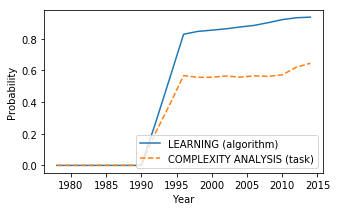

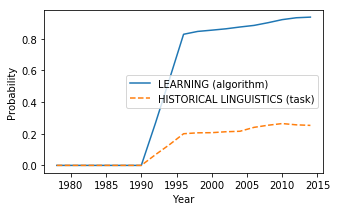

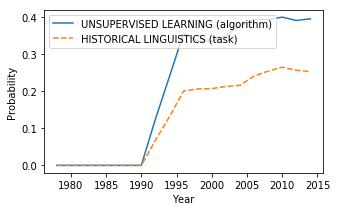

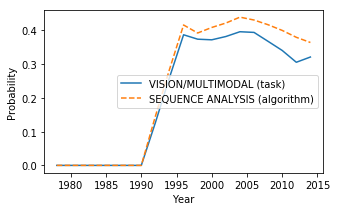

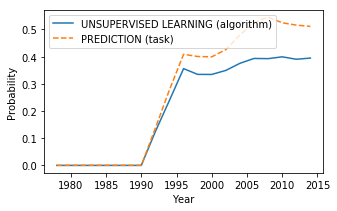

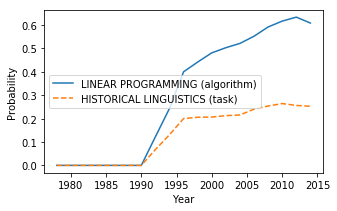

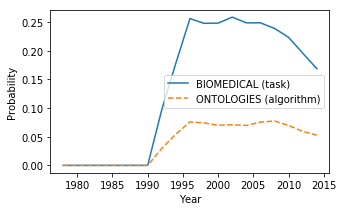

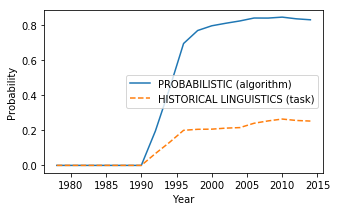

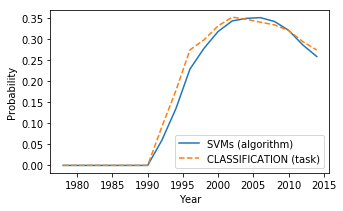

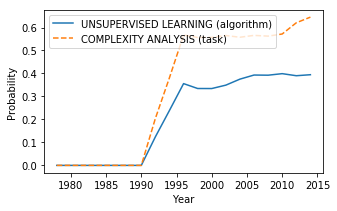

task data


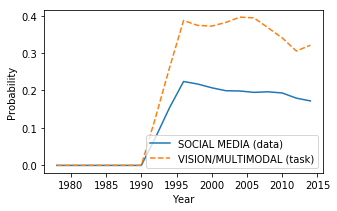

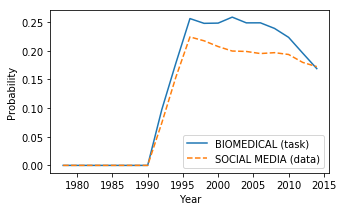

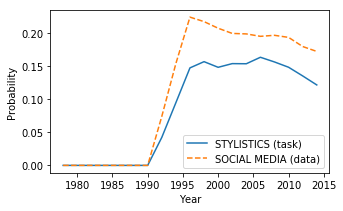

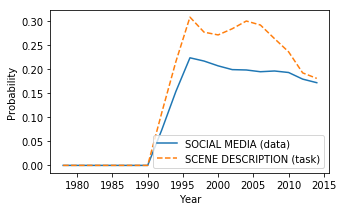

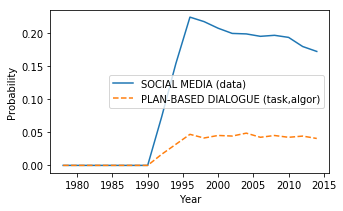

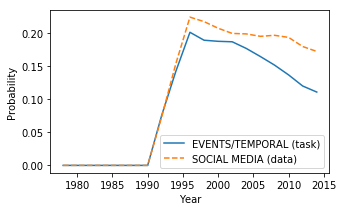

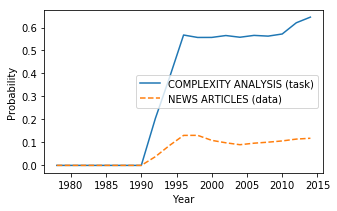

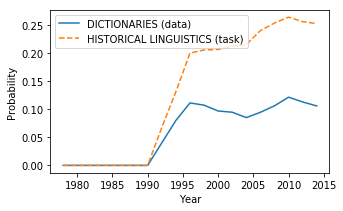

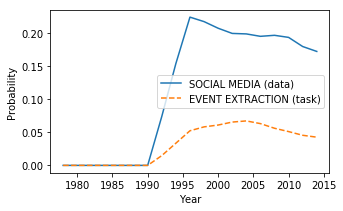

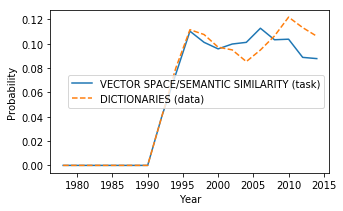

algorithm data


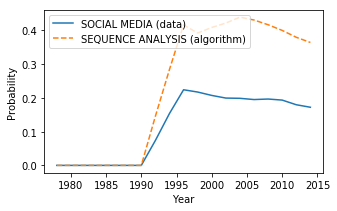

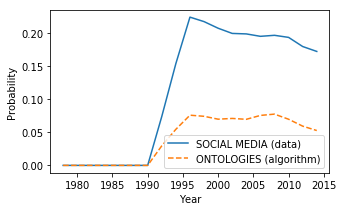

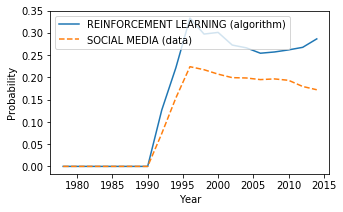

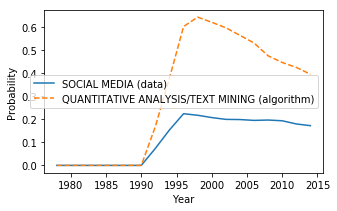

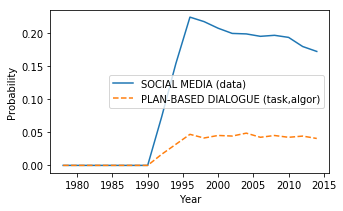

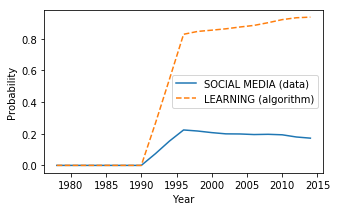

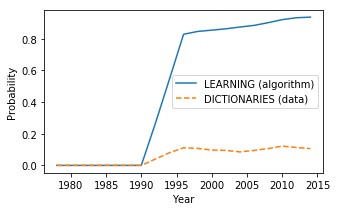

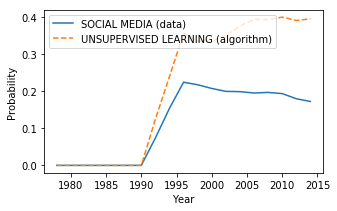

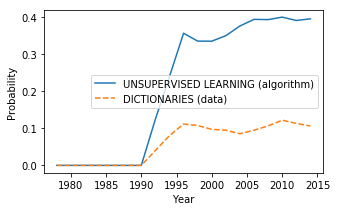

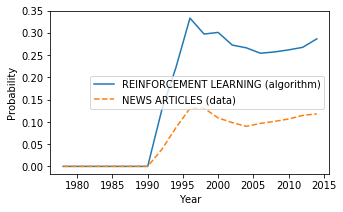

In [377]:
types = ['task', 'algorithm', 'data']
sorted_friendships_per_type_nips = {}
for t, type1 in enumerate(types):
    for type2 in types[t:]:
        print("For types: %s and %s..." % (type1, type2))
        sorted_friendships_per_type_nips[(type1, type2)] = sorted(
            [item for item in friendship_nips.items() if 
             (type1 in topic_types[item[0][0]] and
             type2 in topic_types[item[0][1]]) or
            (type1 in topic_types[item[0][1]] and
             type2 in topic_types[item[0][0]])], key=lambda t: t[1]['score'], reverse=True)
        avg_strength = sum([t[1]['score'] for t in sorted_friendships_per_type_nips[(type1, type2)][:25]])/25.
        print("avg strength", avg_strength)
        print("nr of pairs", len(sorted_friendships_per_type_nips[(type1, type2)]))
        pprint(sorted_friendships_per_type_nips[(type1, type2)][:15])

# Plot for different types (cross-type)
for t, type1 in enumerate(types):
    for type2 in types[t+1:]:
        print(type1, type2)
        for rank in range(10):
            plot_for_topics(sorted_friendships_per_type_nips[(type1, type2)][rank][0], size=(5,3), 
#                             conferences=['ACL', 'EMNLP', 'COLING', 'NAACL']
                            conferences=['NIPS'],
                           )
            plt.savefig("topics_evolution_graphs_post78/relations/friendship%d_%s_%s.png" % (rank, type1, type2))
            plt.show()


In [384]:
def relationship_kind_nips(topic1, topic2):
    sorted_pair = tuple(sorted((topic1, topic2)))
    if sorted_pair in friendship_nips:
        return 'friendship', friendship_nips[sorted_pair]
    elif sorted_pair in arms_race_nips:
        return 'arms_race', arms_race_nips[sorted_pair]
    elif sorted_pair in head_to_head_nips:
        return 'head_to_head', head_to_head_nips[sorted_pair]
    elif sorted_pair in tryst_nips:
        return 'tryst', tryst_nips[sorted_pair]
    return "not found"

In [392]:
for pair, score in friendship.items():
    if score['score'] > 2:
        if pair not in friendship_nips:
            nips_relation = relationship_kind_nips(*pair)
            if nips_relation[1]['score'] > 1:
                print(friendship[pair], nips_relation)

{'score': 3.4648475142236363, 'names': ['SEMANTIC ROLE LABELING', 'RELATION EXTRACTION']} ('arms_race', {'score': 1.8686561679216314, 'names': ['SEMANTIC ROLE LABELING', 'RELATION EXTRACTION']})
{'score': 4.426774938156981, 'names': ['MORPHOLOGY', 'HISTORICAL LINGUISTICS']} ('arms_race', {'score': 1.1100861596618237, 'names': ['MORPHOLOGY', 'HISTORICAL LINGUISTICS']})
{'score': 6.1620038666544295, 'names': ['NEURAL NETWORKS/DEEP LEARNING', 'NEURAL MACHINE TRANSLATION']} ('arms_race', {'score': 1.2802752170366347, 'names': ['NEURAL NETWORKS/DEEP LEARNING', 'NEURAL MACHINE TRANSLATION']})
{'score': 2.7497803775358016, 'names': ['LOGICAL FORMS', 'DISAMBIGUATION']} ('head_to_head', {'score': 1.1049134377548628, 'names': ['LOGICAL FORMS', 'DISAMBIGUATION']})
{'score': 3.370596812939337, 'names': ['PHONOLOGY', 'HISTORICAL LINGUISTICS']} ('head_to_head', {'score': 1.1732769501665596, 'names': ['PHONOLOGY', 'HISTORICAL LINGUISTICS']})
{'score': 2.126197706365355, 'names': ['SEMANTIC ROLE LABEL

### Relationships over time

In [93]:
timespan = [1978, 2019]
timestep = 10

time_ranges = []

y0 = timespan[0]
for y1 in range(timespan[0]+timestep, timespan[1], timestep):
    time_ranges.append((y0, y1))
    y0 = y1

print(time_ranges)

[(1978, 1988), (1988, 1998), (1998, 2008), (2008, 2018)]


In [94]:
def _probs_for_topic(topic, df, time_range=range(1978, 2018)):
    counts_per_year = df[df['Dominant_Topic']==topic].groupby('Year', as_index=False).count()
    documents_per_year = df.groupby(['Document'], as_index=False).first().groupby('Year').count()[['Document']].to_dict()['Document']
    counts_per_year['Docs_per_year'] = counts_per_year['Year'].apply(lambda y: documents_per_year[y])
    counts_per_year['Probability'] = counts_per_year['Document']/counts_per_year['Docs_per_year']
    counts_per_year = counts_per_year.set_index('Year')
    probs = counts_per_year.reindex(time_range, fill_value=0).Probability.values
    return probs

def corr_for_range(topic1, topic2, df, time_range=range(1978, 2018)):
    c1 = _probs_for_topic(topic1, df, time_range=time_range)
    # Topic not found in this time range
    if sum(c1) == 0:
        return None
    c2 = _probs_for_topic(topic2, df, time_range=time_range)
    if sum(c2) == 0:
        return None
    corr = pearsonr(c1, c2)
    return corr[0]

In [95]:
def compute_corrs_per_range(df, time_range=(1978,2018)):
    for topic1 in range(100):
        for topic2 in range(100):
            if topic1 < topic2:
                corr_coef = corr_for_range(topic1, topic2, df, time_range=range(*time_range))
                if corr_coef is None or np.isnan(corr_coef):
                    print(topic1, "or", topic2, "doesn't occur in time range", time_range)
                    continue
#                 assert(corr_coef == corr(topic2, topic1))
                print(topic1, topic2, topic_names[topic1], topic_names[topic2], corr_coef)
                corrs_per_range[time_range][(topic1, topic2)] = {'names': [topic_names[topic1], topic_names[topic2]], 
                                                     'score': corr_coef}

In [96]:
%%time
corrs_per_range = {}
for r in time_ranges:
    corrs_per_range[r] = {}
    compute_corrs_per_range(df, r)


0 1 DOMAIN ADAPTATION FINITE STATE MACHINES 0.9591714518421952
0 2 DOMAIN ADAPTATION MORPHOLOGY 0.9830152231478372
0 3 DOMAIN ADAPTATION MULTI-WORD EXPRESSIONS 0.8976344263411551
0 4 DOMAIN ADAPTATION SENTIMENT ANALYSIS 0.9761171498426766
0 5 DOMAIN ADAPTATION TREES 0.9796835184013006
0 6 DOMAIN ADAPTATION REINFORCEMENT LEARNING 0.9516430582897526
0 7 DOMAIN ADAPTATION SVMs 0.7111997049895002
0 8 DOMAIN ADAPTATION LINEAR PROGRAMMING 0.9646723829232197
0 9 DOMAIN ADAPTATION ARGUMENT MINING 0.894316512976263
0 or 10 doesn't occur in time range (1978, 1988)
0 11 DOMAIN ADAPTATION TOPIC MODELS 0.9124219356099644
0 12 DOMAIN ADAPTATION CLUSTERING 0.8953540383074513
0 13 DOMAIN ADAPTATION LANGUAGE ACQUISITION/SIMPLIFICATION 0.8892112983934232
0 14 DOMAIN ADAPTATION GENERATION 0.9931151430111077
0 15 DOMAIN ADAPTATION NAMED ENTITY RECOGNITION 0.6688230784919578
0 16 DOMAIN ADAPTATION DISCOURSE SEGMENTATION 0.8405362700537545
0 17 DOMAIN ADAPTATION EVENTS/TEMPORAL 0.9903773681488024
0 or 18 do

1 40 FINITE STATE MACHINES MACHINE LEARNING 0.852836122327734
1 41 FINITE STATE MACHINES PROBABILISTIC MODELS 0.7776892216012112
1 or 42 doesn't occur in time range (1978, 1988)
1 43 FINITE STATE MACHINES STATISTICAL MACHINE TRANSLATION 0.8529906671195719
1 or 44 doesn't occur in time range (1978, 1988)
1 or 45 doesn't occur in time range (1978, 1988)
1 46 FINITE STATE MACHINES TRANSFER LEARNING 0.9368251183522586
1 or 47 doesn't occur in time range (1978, 1988)
1 48 FINITE STATE MACHINES SPEECH RECOGNITION 0.9467495833001135
1 or 49 doesn't occur in time range (1978, 1988)
1 50 FINITE STATE MACHINES LEXICONS 0.9040356737957373
1 51 FINITE STATE MACHINES CONSTITUENT PARSING 0.9711644634133999
1 52 FINITE STATE MACHINES MULTILINGUALITY 0.8983575750279899
1 53 FINITE STATE MACHINES UNSUPERVISED LEARNING 0.6979405754922067
1 54 FINITE STATE MACHINES RANKING 0.8226236382014546
1 55 FINITE STATE MACHINES EMBEDDINGS 0.8997212315082499
1 56 FINITE STATE MACHINES PLAN-BASED DIALOGUE 0.96075754

2 87 MORPHOLOGY WORDNET/DISAMBIGUATION 0.8387758688821286
2 88 MORPHOLOGY DEPENDENCY PARSING 0.8945270963774967
2 89 MORPHOLOGY INFORMATION RETRIEVAL 0.9024686429481081
2 90 MORPHOLOGY COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING 0.8736510388509198
2 91 MORPHOLOGY ASIAN LANGUAGES 0.7394682911598471
2 92 MORPHOLOGY CLASSIFICATION 0.7238087880642691
2 93 MORPHOLOGY SEQUENCE ANALYSIS 0.9890362435781771
2 94 MORPHOLOGY FRAME SEMANTICS 0.9918048743728612
2 95 MORPHOLOGY GRAPH-BASED METHODS 0.953896362196203
2 or 96 doesn't occur in time range (1978, 1988)
2 or 97 doesn't occur in time range (1978, 1988)
2 98 MORPHOLOGY NEWS ARTICLES 0.9431631356893881
2 99 MORPHOLOGY SCENE DESCRIPTION 0.9764216582842001
3 4 MULTI-WORD EXPRESSIONS SENTIMENT ANALYSIS 0.9376830678002068
3 5 MULTI-WORD EXPRESSIONS TREES 0.8308112670969077
3 6 MULTI-WORD EXPRESSIONS REINFORCEMENT LEARNING 0.8872010222137443
3 7 MULTI-WORD EXPRESSIONS SVMs 0.7512403517679708
3 8 MULTI-WORD EXPRESSIONS LINEAR PROGRAMMING 0.9187511

4 29 SENTIMENT ANALYSIS DATABASE/RESOURCE? 0.8454862844120787
4 30 SENTIMENT ANALYSIS SOCIAL MEDIA/WEB DATA 0.9720210082586023
4 31 SENTIMENT ANALYSIS SUMMARIZATION 0.8949484629749944
4 32 SENTIMENT ANALYSIS SPELLING CORRECTION 0.9922938828266062
4 or 33 doesn't occur in time range (1978, 1988)
4 34 SENTIMENT ANALYSIS EVALUATION/ANNOTATION 0.9093924091832769
4 35 SENTIMENT ANALYSIS SEMANTIC ROLE LABELING 0.9196547093264802
4 36 SENTIMENT ANALYSIS DISCOURSE 0.9595882781976306
4 or 37 doesn't occur in time range (1978, 1988)
4 38 SENTIMENT ANALYSIS SYNTACTICAL STRUCTURE 0.9248904212106724
4 39 SENTIMENT ANALYSIS VECTOR SPACE/SEMANTIC SIMILARITY 0.7853282413901825
4 40 SENTIMENT ANALYSIS MACHINE LEARNING 0.8518758752168554
4 41 SENTIMENT ANALYSIS PROBABILISTIC MODELS 0.8322152429116297
4 or 42 doesn't occur in time range (1978, 1988)
4 43 SENTIMENT ANALYSIS STATISTICAL MACHINE TRANSLATION 0.7589824444022256
4 or 44 doesn't occur in time range (1978, 1988)
4 or 45 doesn't occur in time ran

5 86 TREES HISTORICAL LINGUISTICS 0.891701836991055
5 87 TREES WORDNET/DISAMBIGUATION 0.8118507543955917
5 88 TREES DEPENDENCY PARSING 0.840180776450923
5 89 TREES INFORMATION RETRIEVAL 0.895774314325023
5 90 TREES COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING 0.8701456120659231
5 91 TREES ASIAN LANGUAGES 0.7776483531422195
5 92 TREES CLASSIFICATION 0.7362358031985852
5 93 TREES SEQUENCE ANALYSIS 0.9812387690431211
5 94 TREES FRAME SEMANTICS 0.9852173330456498
5 95 TREES GRAPH-BASED METHODS 0.9777997658259503
5 or 96 doesn't occur in time range (1978, 1988)
5 or 97 doesn't occur in time range (1978, 1988)
5 98 TREES NEWS ARTICLES 0.9029301490314127
5 99 TREES SCENE DESCRIPTION 0.9475176697920599
6 7 REINFORCEMENT LEARNING SVMs 0.5792346797048171
6 8 REINFORCEMENT LEARNING LINEAR PROGRAMMING 0.8584751890992668
6 9 REINFORCEMENT LEARNING ARGUMENT MINING 0.9108380075140797
6 or 10 doesn't occur in time range (1978, 1988)
6 11 REINFORCEMENT LEARNING TOPIC MODELS 0.9068371169600705
6 12 REIN

7 or 42 doesn't occur in time range (1978, 1988)
7 43 SVMs STATISTICAL MACHINE TRANSLATION 0.2671189433329723
7 or 44 doesn't occur in time range (1978, 1988)
7 or 45 doesn't occur in time range (1978, 1988)
7 46 SVMs TRANSFER LEARNING 0.7279804823287818
7 or 47 doesn't occur in time range (1978, 1988)
7 48 SVMs SPEECH RECOGNITION 0.7112305231617284
7 or 49 doesn't occur in time range (1978, 1988)
7 50 SVMs LEXICONS 0.35188580076952186
7 51 SVMs CONSTITUENT PARSING 0.5378240331427726
7 52 SVMs MULTILINGUALITY 0.5929472422277148
7 53 SVMs UNSUPERVISED LEARNING 0.8762095549046147
7 54 SVMs RANKING 0.9117919429466863
7 55 SVMs EMBEDDINGS 0.49033291639280324
7 56 SVMs PLAN-BASED DIALOGUE 0.7733139369688037
7 57 SVMs QUESTION ANSWERING 0.8681646014100469
7 or 58 doesn't occur in time range (1978, 1988)
7 59 SVMs EVENT EXTRACTION 0.9614709747529708
7 60 SVMs GRAMMARS 0.17406521235855793
7 61 SVMs LOGICAL FORMS 0.5519631684800119
7 or 62 doesn't occur in time range (1978, 1988)
7 63 SVMs KNOW

8 98 LINEAR PROGRAMMING NEWS ARTICLES 0.9700479455812079
8 99 LINEAR PROGRAMMING SCENE DESCRIPTION 0.9779175096130451
9 or 10 doesn't occur in time range (1978, 1988)
9 11 ARGUMENT MINING TOPIC MODELS 0.892319464136503
9 12 ARGUMENT MINING CLUSTERING 0.92397218978966
9 13 ARGUMENT MINING LANGUAGE ACQUISITION/SIMPLIFICATION 0.8716805083221583
9 14 ARGUMENT MINING GENERATION 0.9231599130199238
9 15 ARGUMENT MINING NAMED ENTITY RECOGNITION 0.7065603907469884
9 16 ARGUMENT MINING DISCOURSE SEGMENTATION 0.7025008759214777
9 17 ARGUMENT MINING EVENTS/TEMPORAL 0.9346285868423508
9 or 18 doesn't occur in time range (1978, 1988)
9 19 ARGUMENT MINING PHONOLOGY 0.9534496064111017
9 20 ARGUMENT MINING STYLISTICS 0.9945074023350822
9 21 ARGUMENT MINING POS TAGGING/STATISTICAL PARSING 0.8916939940066337
9 22 ARGUMENT MINING UNIFICATION 0.6989372054551223
9 23 ARGUMENT MINING LANGUAGE MODELS (CLASSICAL) 0.8899446839897246
9 24 ARGUMENT MINING TEXTUAL ENTAILMENT 0.8219091869060445
9 25 ARGUMENT MINING

10 or 70 doesn't occur in time range (1978, 1988)
10 or 71 doesn't occur in time range (1978, 1988)
10 or 72 doesn't occur in time range (1978, 1988)
10 or 73 doesn't occur in time range (1978, 1988)
10 or 74 doesn't occur in time range (1978, 1988)
10 or 75 doesn't occur in time range (1978, 1988)
10 or 76 doesn't occur in time range (1978, 1988)
10 or 77 doesn't occur in time range (1978, 1988)
10 or 78 doesn't occur in time range (1978, 1988)
10 or 79 doesn't occur in time range (1978, 1988)
10 or 80 doesn't occur in time range (1978, 1988)
10 or 81 doesn't occur in time range (1978, 1988)
10 or 82 doesn't occur in time range (1978, 1988)
10 or 83 doesn't occur in time range (1978, 1988)
10 or 84 doesn't occur in time range (1978, 1988)
10 or 85 doesn't occur in time range (1978, 1988)
10 or 86 doesn't occur in time range (1978, 1988)
10 or 87 doesn't occur in time range (1978, 1988)
10 or 88 doesn't occur in time range (1978, 1988)
10 or 89 doesn't occur in time range (1978, 1988)


12 or 45 doesn't occur in time range (1978, 1988)
12 46 CLUSTERING TRANSFER LEARNING 0.7773667851570848
12 or 47 doesn't occur in time range (1978, 1988)
12 48 CLUSTERING SPEECH RECOGNITION 0.873199650828132
12 or 49 doesn't occur in time range (1978, 1988)
12 50 CLUSTERING LEXICONS 0.7564655711565511
12 51 CLUSTERING CONSTITUENT PARSING 0.7994443922198627
12 52 CLUSTERING MULTILINGUALITY 0.8444025926407062
12 53 CLUSTERING UNSUPERVISED LEARNING 0.8290382601019477
12 54 CLUSTERING RANKING 0.7977917147465498
12 55 CLUSTERING EMBEDDINGS 0.9504267564180926
12 56 CLUSTERING PLAN-BASED DIALOGUE 0.9074724938103659
12 57 CLUSTERING QUESTION ANSWERING 0.9412532101984689
12 or 58 doesn't occur in time range (1978, 1988)
12 59 CLUSTERING EVENT EXTRACTION 0.7023805076980331
12 60 CLUSTERING GRAMMARS 0.7319478289999174
12 61 CLUSTERING LOGICAL FORMS 0.8591323485618189
12 or 62 doesn't occur in time range (1978, 1988)
12 63 CLUSTERING KNOWLEDGE BASE 0.6651181901383316
12 or 64 doesn't occur in time

13 84 LANGUAGE ACQUISITION/SIMPLIFICATION DICTIONARIES 0.9266093754944831
13 85 LANGUAGE ACQUISITION/SIMPLIFICATION RELATION EXTRACTION 0.9341359958869165
13 86 LANGUAGE ACQUISITION/SIMPLIFICATION HISTORICAL LINGUISTICS 0.8948656187557665
13 87 LANGUAGE ACQUISITION/SIMPLIFICATION WORDNET/DISAMBIGUATION 0.7467688971329963
13 88 LANGUAGE ACQUISITION/SIMPLIFICATION DEPENDENCY PARSING 0.7374332309285682
13 89 LANGUAGE ACQUISITION/SIMPLIFICATION INFORMATION RETRIEVAL 0.8474779798374424
13 90 LANGUAGE ACQUISITION/SIMPLIFICATION COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING 0.840133831595653
13 91 LANGUAGE ACQUISITION/SIMPLIFICATION ASIAN LANGUAGES 0.8504613854236241
13 92 LANGUAGE ACQUISITION/SIMPLIFICATION CLASSIFICATION 0.8412868179996086
13 93 LANGUAGE ACQUISITION/SIMPLIFICATION SEQUENCE ANALYSIS 0.8852290336127291
13 94 LANGUAGE ACQUISITION/SIMPLIFICATION FRAME SEMANTICS 0.8696059599636204
13 95 LANGUAGE ACQUISITION/SIMPLIFICATION GRAPH-BASED METHODS 0.9548060663104955
13 or 96 doesn't oc

15 52 NAMED ENTITY RECOGNITION MULTILINGUALITY 0.5406755918287247
15 53 NAMED ENTITY RECOGNITION UNSUPERVISED LEARNING 0.8251077422259747
15 54 NAMED ENTITY RECOGNITION RANKING 0.8971595380427666
15 55 NAMED ENTITY RECOGNITION EMBEDDINGS 0.4062222675550204
15 56 NAMED ENTITY RECOGNITION PLAN-BASED DIALOGUE 0.7328163013249324
15 57 NAMED ENTITY RECOGNITION QUESTION ANSWERING 0.8124635385666238
15 or 58 doesn't occur in time range (1978, 1988)
15 59 NAMED ENTITY RECOGNITION EVENT EXTRACTION 0.9628760617380475
15 60 NAMED ENTITY RECOGNITION GRAMMARS 0.10884951319669578
15 61 NAMED ENTITY RECOGNITION LOGICAL FORMS 0.5056177220332153
15 or 62 doesn't occur in time range (1978, 1988)
15 63 NAMED ENTITY RECOGNITION KNOWLEDGE BASE 0.9045168113059098
15 or 64 doesn't occur in time range (1978, 1988)
15 65 NAMED ENTITY RECOGNITION INFORMATION EXTRACTION? 0.5222038573952356
15 66 NAMED ENTITY RECOGNITION HUMAN-COMPUTER INTERACTION/APPLICATION 0.364077151934869
15 67 NAMED ENTITY RECOGNITION DISAM

16 94 DISCOURSE SEGMENTATION FRAME SEMANTICS 0.8859918914057701
16 95 DISCOURSE SEGMENTATION GRAPH-BASED METHODS 0.9181667451513779
16 or 96 doesn't occur in time range (1978, 1988)
16 or 97 doesn't occur in time range (1978, 1988)
16 98 DISCOURSE SEGMENTATION NEWS ARTICLES 0.760153300111711
16 99 DISCOURSE SEGMENTATION SCENE DESCRIPTION 0.8403869834701072
17 or 18 doesn't occur in time range (1978, 1988)
17 19 EVENTS/TEMPORAL PHONOLOGY 0.9763609918523143
17 20 EVENTS/TEMPORAL STYLISTICS 0.8980352067188777
17 21 EVENTS/TEMPORAL POS TAGGING/STATISTICAL PARSING 0.9384782698842372
17 22 EVENTS/TEMPORAL UNIFICATION 0.8998654026149855
17 23 EVENTS/TEMPORAL LANGUAGE MODELS (CLASSICAL) 0.7953863425777261
17 24 EVENTS/TEMPORAL TEXTUAL ENTAILMENT 0.8262085050028756
17 25 EVENTS/TEMPORAL BIOMEDICAL 0.9341344598496572
17 26 EVENTS/TEMPORAL ANAPHORA/COREFERENCE RESOLUTION 0.9564178249863525
17 or 27 doesn't occur in time range (1978, 1988)
17 28 EVENTS/TEMPORAL DEPENDENCY PARSING 0.967586441542998

18 or 81 doesn't occur in time range (1978, 1988)
18 or 82 doesn't occur in time range (1978, 1988)
18 or 83 doesn't occur in time range (1978, 1988)
18 or 84 doesn't occur in time range (1978, 1988)
18 or 85 doesn't occur in time range (1978, 1988)
18 or 86 doesn't occur in time range (1978, 1988)
18 or 87 doesn't occur in time range (1978, 1988)
18 or 88 doesn't occur in time range (1978, 1988)
18 or 89 doesn't occur in time range (1978, 1988)
18 or 90 doesn't occur in time range (1978, 1988)
18 or 91 doesn't occur in time range (1978, 1988)
18 or 92 doesn't occur in time range (1978, 1988)
18 or 93 doesn't occur in time range (1978, 1988)
18 or 94 doesn't occur in time range (1978, 1988)
18 or 95 doesn't occur in time range (1978, 1988)
18 or 96 doesn't occur in time range (1978, 1988)
18 or 97 doesn't occur in time range (1978, 1988)
18 or 98 doesn't occur in time range (1978, 1988)
18 or 99 doesn't occur in time range (1978, 1988)
19 20 PHONOLOGY STYLISTICS 0.9314113109495026
19 2

20 or 75 doesn't occur in time range (1978, 1988)
20 76 STYLISTICS CROSS-LINGUAL/PARALLEL CORPORA 0.7132258162244708
20 or 77 doesn't occur in time range (1978, 1988)
20 78 STYLISTICS NEURAL MACHINE TRANSLATION 0.8238659757977451
20 79 STYLISTICS RECURRENT NEURAL NETWORKS 0.8533287701428642
20 80 STYLISTICS COMPLEXITY ANALYSIS 0.9078329564171855
20 81 STYLISTICS OPINION MINING 0.925024891788546
20 82 STYLISTICS TWITTER/SOCIAL MEDIA 0.7153096488139356
20 83 STYLISTICS TRANSLITERATION 0.9199570386127276
20 84 STYLISTICS DICTIONARIES 0.9571649205607593
20 85 STYLISTICS RELATION EXTRACTION 0.8578046595623267
20 86 STYLISTICS HISTORICAL LINGUISTICS 0.8446928169275896
20 87 STYLISTICS WORDNET/DISAMBIGUATION 0.8656047844738376
20 88 STYLISTICS DEPENDENCY PARSING 0.8658267134654978
20 89 STYLISTICS INFORMATION RETRIEVAL 0.8917080491264767
20 90 STYLISTICS COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING 0.7322249316642623
20 91 STYLISTICS ASIAN LANGUAGES 0.679142582891686
20 92 STYLISTICS CLASSIFI

22 or 45 doesn't occur in time range (1978, 1988)
22 46 UNIFICATION TRANSFER LEARNING 0.8595445288324256
22 or 47 doesn't occur in time range (1978, 1988)
22 48 UNIFICATION SPEECH RECOGNITION 0.8131449248904961
22 or 49 doesn't occur in time range (1978, 1988)
22 50 UNIFICATION LEXICONS 0.9767656052108631
22 51 UNIFICATION CONSTITUENT PARSING 0.9813308806533546
22 52 UNIFICATION MULTILINGUALITY 0.9183217836411521
22 53 UNIFICATION UNSUPERVISED LEARNING 0.5323630110727743
22 54 UNIFICATION RANKING 0.7312603139888111
22 55 UNIFICATION EMBEDDINGS 0.7680099825219968
22 56 UNIFICATION PLAN-BASED DIALOGUE 0.8561706635830622
22 57 UNIFICATION QUESTION ANSWERING 0.6827138067953847
22 or 58 doesn't occur in time range (1978, 1988)
22 59 UNIFICATION EVENT EXTRACTION 0.6089611886400669
22 60 UNIFICATION GRAMMARS 0.8485240275497821
22 61 UNIFICATION LOGICAL FORMS 0.9456379133649279
22 or 62 doesn't occur in time range (1978, 1988)
22 63 UNIFICATION KNOWLEDGE BASE 0.6708227627541875
22 or 64 doesn'

24 25 TEXTUAL ENTAILMENT BIOMEDICAL 0.9384394568860879
24 26 TEXTUAL ENTAILMENT ANAPHORA/COREFERENCE RESOLUTION 0.8388953246271204
24 or 27 doesn't occur in time range (1978, 1988)
24 28 TEXTUAL ENTAILMENT DEPENDENCY PARSING 0.7807674687161478
24 29 TEXTUAL ENTAILMENT DATABASE/RESOURCE? 0.5762845521182293
24 30 TEXTUAL ENTAILMENT SOCIAL MEDIA/WEB DATA 0.7876024849590844
24 31 TEXTUAL ENTAILMENT SUMMARIZATION 0.7149660610090748
24 32 TEXTUAL ENTAILMENT SPELLING CORRECTION 0.8442815734405046
24 or 33 doesn't occur in time range (1978, 1988)
24 34 TEXTUAL ENTAILMENT EVALUATION/ANNOTATION 0.7376777658001815
24 35 TEXTUAL ENTAILMENT SEMANTIC ROLE LABELING 0.7265997741509306
24 36 TEXTUAL ENTAILMENT DISCOURSE 0.7998930052270815
24 or 37 doesn't occur in time range (1978, 1988)
24 38 TEXTUAL ENTAILMENT SYNTACTICAL STRUCTURE 0.7275206308436364
24 39 TEXTUAL ENTAILMENT VECTOR SPACE/SEMANTIC SIMILARITY 0.5886895324366993
24 40 TEXTUAL ENTAILMENT MACHINE LEARNING 0.5339493119219005
24 41 TEXTUAL 

25 92 BIOMEDICAL CLASSIFICATION 0.8345193741442276
25 93 BIOMEDICAL SEQUENCE ANALYSIS 0.8754008996582365
25 94 BIOMEDICAL FRAME SEMANTICS 0.8909925125497934
25 95 BIOMEDICAL GRAPH-BASED METHODS 0.8423214263002208
25 or 96 doesn't occur in time range (1978, 1988)
25 or 97 doesn't occur in time range (1978, 1988)
25 98 BIOMEDICAL NEWS ARTICLES 0.9806638763597945
25 99 BIOMEDICAL SCENE DESCRIPTION 0.9487079078960752
26 or 27 doesn't occur in time range (1978, 1988)
26 28 ANAPHORA/COREFERENCE RESOLUTION DEPENDENCY PARSING 0.9476551707297424
26 29 ANAPHORA/COREFERENCE RESOLUTION DATABASE/RESOURCE? 0.8352555255099772
26 30 ANAPHORA/COREFERENCE RESOLUTION SOCIAL MEDIA/WEB DATA 0.8842017464002413
26 31 ANAPHORA/COREFERENCE RESOLUTION SUMMARIZATION 0.8101988742874249
26 32 ANAPHORA/COREFERENCE RESOLUTION SPELLING CORRECTION 0.8757438442812854
26 or 33 doesn't occur in time range (1978, 1988)
26 34 ANAPHORA/COREFERENCE RESOLUTION EVALUATION/ANNOTATION 0.7736828472261058
26 35 ANAPHORA/COREFERENC

27 or 81 doesn't occur in time range (1978, 1988)
27 or 82 doesn't occur in time range (1978, 1988)
27 or 83 doesn't occur in time range (1978, 1988)
27 or 84 doesn't occur in time range (1978, 1988)
27 or 85 doesn't occur in time range (1978, 1988)
27 or 86 doesn't occur in time range (1978, 1988)
27 or 87 doesn't occur in time range (1978, 1988)
27 or 88 doesn't occur in time range (1978, 1988)
27 or 89 doesn't occur in time range (1978, 1988)
27 or 90 doesn't occur in time range (1978, 1988)
27 or 91 doesn't occur in time range (1978, 1988)
27 or 92 doesn't occur in time range (1978, 1988)
27 or 93 doesn't occur in time range (1978, 1988)
27 or 94 doesn't occur in time range (1978, 1988)
27 or 95 doesn't occur in time range (1978, 1988)
27 or 96 doesn't occur in time range (1978, 1988)
27 or 97 doesn't occur in time range (1978, 1988)
27 or 98 doesn't occur in time range (1978, 1988)
27 or 99 doesn't occur in time range (1978, 1988)
28 29 DEPENDENCY PARSING DATABASE/RESOURCE? 0.9535

29 79 DATABASE/RESOURCE? RECURRENT NEURAL NETWORKS 0.6764852568007886
29 80 DATABASE/RESOURCE? COMPLEXITY ANALYSIS 0.9423309200210789
29 81 DATABASE/RESOURCE? OPINION MINING 0.7012555822748472
29 82 DATABASE/RESOURCE? TWITTER/SOCIAL MEDIA 0.7197962908196441
29 83 DATABASE/RESOURCE? TRANSLITERATION 0.7193030851131513
29 84 DATABASE/RESOURCE? DICTIONARIES 0.9097953448388769
29 85 DATABASE/RESOURCE? RELATION EXTRACTION 0.9857829961104082
29 86 DATABASE/RESOURCE? HISTORICAL LINGUISTICS 0.9888351514016988
29 87 DATABASE/RESOURCE? WORDNET/DISAMBIGUATION 0.7925200137335601
29 88 DATABASE/RESOURCE? DEPENDENCY PARSING 0.7147086328047292
29 89 DATABASE/RESOURCE? INFORMATION RETRIEVAL 0.9047312683098276
29 90 DATABASE/RESOURCE? COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING 0.8944799631232807
29 91 DATABASE/RESOURCE? ASIAN LANGUAGES 0.7484850181511058
29 92 DATABASE/RESOURCE? CLASSIFICATION 0.873638984243237
29 93 DATABASE/RESOURCE? SEQUENCE ANALYSIS 0.9458267028504036
29 94 DATABASE/RESOURCE? FRAM

31 or 77 doesn't occur in time range (1978, 1988)
31 78 SUMMARIZATION NEURAL MACHINE TRANSLATION 0.6718592875216834
31 79 SUMMARIZATION RECURRENT NEURAL NETWORKS 0.7540898278365307
31 80 SUMMARIZATION COMPLEXITY ANALYSIS 0.8531505674103866
31 81 SUMMARIZATION OPINION MINING 0.7256480662819669
31 82 SUMMARIZATION TWITTER/SOCIAL MEDIA 0.5900845622682873
31 83 SUMMARIZATION TRANSLITERATION 0.5297924918955519
31 84 SUMMARIZATION DICTIONARIES 0.842070123877145
31 85 SUMMARIZATION RELATION EXTRACTION 0.8239127667391076
31 86 SUMMARIZATION HISTORICAL LINGUISTICS 0.8172223631244839
31 87 SUMMARIZATION WORDNET/DISAMBIGUATION 0.8778779075390457
31 88 SUMMARIZATION DEPENDENCY PARSING 0.8321385438821085
31 89 SUMMARIZATION INFORMATION RETRIEVAL 0.9050440552485892
31 90 SUMMARIZATION COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING 0.6069036904246848
31 91 SUMMARIZATION ASIAN LANGUAGES 0.5184744927903884
31 92 SUMMARIZATION CLASSIFICATION 0.7250763495654491
31 93 SUMMARIZATION SEQUENCE ANALYSIS 0.83786

33 or 89 doesn't occur in time range (1978, 1988)
33 or 90 doesn't occur in time range (1978, 1988)
33 or 91 doesn't occur in time range (1978, 1988)
33 or 92 doesn't occur in time range (1978, 1988)
33 or 93 doesn't occur in time range (1978, 1988)
33 or 94 doesn't occur in time range (1978, 1988)
33 or 95 doesn't occur in time range (1978, 1988)
33 or 96 doesn't occur in time range (1978, 1988)
33 or 97 doesn't occur in time range (1978, 1988)
33 or 98 doesn't occur in time range (1978, 1988)
33 or 99 doesn't occur in time range (1978, 1988)
34 35 EVALUATION/ANNOTATION SEMANTIC ROLE LABELING 0.867293919962387
34 36 EVALUATION/ANNOTATION DISCOURSE 0.8604358127866039
34 or 37 doesn't occur in time range (1978, 1988)
34 38 EVALUATION/ANNOTATION SYNTACTICAL STRUCTURE 0.8551289796794637
34 39 EVALUATION/ANNOTATION VECTOR SPACE/SEMANTIC SIMILARITY 0.844176519398179
34 40 EVALUATION/ANNOTATION MACHINE LEARNING 0.8400657345416481
34 41 EVALUATION/ANNOTATION PROBABILISTIC MODELS 0.97397459457

35 91 SEMANTIC ROLE LABELING ASIAN LANGUAGES 0.8072028223620165
35 92 SEMANTIC ROLE LABELING CLASSIFICATION 0.7797600610725876
35 93 SEMANTIC ROLE LABELING SEQUENCE ANALYSIS 0.9997387297734343
35 94 SEMANTIC ROLE LABELING FRAME SEMANTICS 0.9767589999263641
35 95 SEMANTIC ROLE LABELING GRAPH-BASED METHODS 0.9852437601287027
35 or 96 doesn't occur in time range (1978, 1988)
35 or 97 doesn't occur in time range (1978, 1988)
35 98 SEMANTIC ROLE LABELING NEWS ARTICLES 0.9299170491362765
35 99 SEMANTIC ROLE LABELING SCENE DESCRIPTION 0.9678681297211131
36 or 37 doesn't occur in time range (1978, 1988)
36 38 DISCOURSE SYNTACTICAL STRUCTURE 0.9923399545917645
36 39 DISCOURSE VECTOR SPACE/SEMANTIC SIMILARITY 0.7725128984214256
36 40 DISCOURSE MACHINE LEARNING 0.8900145970489808
36 41 DISCOURSE PROBABILISTIC MODELS 0.8083640438756287
36 or 42 doesn't occur in time range (1978, 1988)
36 43 DISCOURSE STATISTICAL MACHINE TRANSLATION 0.8865982740196949
36 or 44 doesn't occur in time range (1978, 198

38 or 58 doesn't occur in time range (1978, 1988)
38 59 SYNTACTICAL STRUCTURE EVENT EXTRACTION 0.7212338100833628
38 60 SYNTACTICAL STRUCTURE GRAMMARS 0.8779339112109088
38 61 SYNTACTICAL STRUCTURE LOGICAL FORMS 0.9971648399475995
38 or 62 doesn't occur in time range (1978, 1988)
38 63 SYNTACTICAL STRUCTURE KNOWLEDGE BASE 0.742252274465025
38 or 64 doesn't occur in time range (1978, 1988)
38 65 SYNTACTICAL STRUCTURE INFORMATION EXTRACTION? 0.9907229213780354
38 66 SYNTACTICAL STRUCTURE HUMAN-COMPUTER INTERACTION/APPLICATION 0.9465527824287422
38 67 SYNTACTICAL STRUCTURE DISAMBIGUATION 0.958525025632972
38 68 SYNTACTICAL STRUCTURE GRAPHS/ABSTRACT MEANING REPRESENTATION 0.850988091587885
38 69 SYNTACTICAL STRUCTURE NEURAL NETWORKS/DEEP LEARNING 0.8837973879106575
38 70 SYNTACTICAL STRUCTURE NARRATIVES 0.8469944641946274
38 71 SYNTACTICAL STRUCTURE ONTOLOGIES 0.9624416442851608
38 72 SYNTACTICAL STRUCTURE PREDICTION 0.7448297992941048
38 73 SYNTACTICAL STRUCTURE QUANTITATIVE ANALYSIS/TEXT

40 or 62 doesn't occur in time range (1978, 1988)
40 63 MACHINE LEARNING KNOWLEDGE BASE 0.5506738311355834
40 or 64 doesn't occur in time range (1978, 1988)
40 65 MACHINE LEARNING INFORMATION EXTRACTION? 0.913503324316448
40 66 MACHINE LEARNING HUMAN-COMPUTER INTERACTION/APPLICATION 0.9868144013137806
40 67 MACHINE LEARNING DISAMBIGUATION 0.8463909621525237
40 68 MACHINE LEARNING GRAPHS/ABSTRACT MEANING REPRESENTATION 0.6996972286954708
40 69 MACHINE LEARNING NEURAL NETWORKS/DEEP LEARNING 0.8575649771973151
40 70 MACHINE LEARNING NARRATIVES 0.7614435398672312
40 71 MACHINE LEARNING ONTOLOGIES 0.8322554866581249
40 72 MACHINE LEARNING PREDICTION 0.5750901193917811
40 73 MACHINE LEARNING QUANTITATIVE ANALYSIS/TEXT MINING 0.9036517951808319
40 74 MACHINE LEARNING VISION/MULTIMODAL 0.48629156439480703
40 or 75 doesn't occur in time range (1978, 1988)
40 76 MACHINE LEARNING CROSS-LINGUAL/PARALLEL CORPORA 0.592415920879567
40 or 77 doesn't occur in time range (1978, 1988)
40 78 MACHINE LEARN

42 or 88 doesn't occur in time range (1978, 1988)
42 or 89 doesn't occur in time range (1978, 1988)
42 or 90 doesn't occur in time range (1978, 1988)
42 or 91 doesn't occur in time range (1978, 1988)
42 or 92 doesn't occur in time range (1978, 1988)
42 or 93 doesn't occur in time range (1978, 1988)
42 or 94 doesn't occur in time range (1978, 1988)
42 or 95 doesn't occur in time range (1978, 1988)
42 or 96 doesn't occur in time range (1978, 1988)
42 or 97 doesn't occur in time range (1978, 1988)
42 or 98 doesn't occur in time range (1978, 1988)
42 or 99 doesn't occur in time range (1978, 1988)
43 or 44 doesn't occur in time range (1978, 1988)
43 or 45 doesn't occur in time range (1978, 1988)
43 46 STATISTICAL MACHINE TRANSLATION TRANSFER LEARNING 0.7830496120499819
43 or 47 doesn't occur in time range (1978, 1988)
43 48 STATISTICAL MACHINE TRANSLATION SPEECH RECOGNITION 0.7965752660622973
43 or 49 doesn't occur in time range (1978, 1988)
43 50 STATISTICAL MACHINE TRANSLATION LEXICONS 0.

45 or 64 doesn't occur in time range (1978, 1988)
45 or 65 doesn't occur in time range (1978, 1988)
45 or 66 doesn't occur in time range (1978, 1988)
45 or 67 doesn't occur in time range (1978, 1988)
45 or 68 doesn't occur in time range (1978, 1988)
45 or 69 doesn't occur in time range (1978, 1988)
45 or 70 doesn't occur in time range (1978, 1988)
45 or 71 doesn't occur in time range (1978, 1988)
45 or 72 doesn't occur in time range (1978, 1988)
45 or 73 doesn't occur in time range (1978, 1988)
45 or 74 doesn't occur in time range (1978, 1988)
45 or 75 doesn't occur in time range (1978, 1988)
45 or 76 doesn't occur in time range (1978, 1988)
45 or 77 doesn't occur in time range (1978, 1988)
45 or 78 doesn't occur in time range (1978, 1988)
45 or 79 doesn't occur in time range (1978, 1988)
45 or 80 doesn't occur in time range (1978, 1988)
45 or 81 doesn't occur in time range (1978, 1988)
45 or 82 doesn't occur in time range (1978, 1988)
45 or 83 doesn't occur in time range (1978, 1988)


48 60 SPEECH RECOGNITION GRAMMARS 0.795072674420706
48 61 SPEECH RECOGNITION LOGICAL FORMS 0.9445636410389341
48 or 62 doesn't occur in time range (1978, 1988)
48 63 SPEECH RECOGNITION KNOWLEDGE BASE 0.7764395501833117
48 or 64 doesn't occur in time range (1978, 1988)
48 65 SPEECH RECOGNITION INFORMATION EXTRACTION? 0.9608740771457738
48 66 SPEECH RECOGNITION HUMAN-COMPUTER INTERACTION/APPLICATION 0.8637207753786642
48 67 SPEECH RECOGNITION DISAMBIGUATION 0.9616290114071385
48 68 SPEECH RECOGNITION GRAPHS/ABSTRACT MEANING REPRESENTATION 0.7921880689285121
48 69 SPEECH RECOGNITION NEURAL NETWORKS/DEEP LEARNING 0.9073279378566962
48 70 SPEECH RECOGNITION NARRATIVES 0.9312056619931627
48 71 SPEECH RECOGNITION ONTOLOGIES 0.9173890501234137
48 72 SPEECH RECOGNITION PREDICTION 0.88607638685672
48 73 SPEECH RECOGNITION QUANTITATIVE ANALYSIS/TEXT MINING 0.9789407409775231
48 74 SPEECH RECOGNITION VISION/MULTIMODAL 0.7916907567614123
48 or 75 doesn't occur in time range (1978, 1988)
48 76 SPEEC

51 or 62 doesn't occur in time range (1978, 1988)
51 63 CONSTITUENT PARSING KNOWLEDGE BASE 0.7315583935404174
51 or 64 doesn't occur in time range (1978, 1988)
51 65 CONSTITUENT PARSING INFORMATION EXTRACTION? 0.9734846594451159
51 66 CONSTITUENT PARSING HUMAN-COMPUTER INTERACTION/APPLICATION 0.9268562365323656
51 67 CONSTITUENT PARSING DISAMBIGUATION 0.9444404864563302
51 68 CONSTITUENT PARSING GRAPHS/ABSTRACT MEANING REPRESENTATION 0.8533316505765843
51 69 CONSTITUENT PARSING NEURAL NETWORKS/DEEP LEARNING 0.845255666668254
51 70 CONSTITUENT PARSING NARRATIVES 0.8135283073294517
51 71 CONSTITUENT PARSING ONTOLOGIES 0.9579942200277861
51 72 CONSTITUENT PARSING PREDICTION 0.7138906468518135
51 73 CONSTITUENT PARSING QUANTITATIVE ANALYSIS/TEXT MINING 0.911453967287353
51 74 CONSTITUENT PARSING VISION/MULTIMODAL 0.6333949277221106
51 or 75 doesn't occur in time range (1978, 1988)
51 76 CONSTITUENT PARSING CROSS-LINGUAL/PARALLEL CORPORA 0.7178616361981647
51 or 77 doesn't occur in time ran

54 56 RANKING PLAN-BASED DIALOGUE 0.9173742264928672
54 57 RANKING QUESTION ANSWERING 0.9113854098653578
54 or 58 doesn't occur in time range (1978, 1988)
54 59 RANKING EVENT EXTRACTION 0.9551952739991781
54 60 RANKING GRAMMARS 0.4542295660600919
54 61 RANKING LOGICAL FORMS 0.7892100742972489
54 or 62 doesn't occur in time range (1978, 1988)
54 63 RANKING KNOWLEDGE BASE 0.9511029819899813
54 or 64 doesn't occur in time range (1978, 1988)
54 65 RANKING INFORMATION EXTRACTION? 0.7860066736618581
54 66 RANKING HUMAN-COMPUTER INTERACTION/APPLICATION 0.6934741822988764
54 67 RANKING DISAMBIGUATION 0.920261080991691
54 68 RANKING GRAPHS/ABSTRACT MEANING REPRESENTATION 0.9634941367066496
54 69 RANKING NEURAL NETWORKS/DEEP LEARNING 0.9070900260657613
54 70 RANKING NARRATIVES 0.9404179005741345
54 71 RANKING ONTOLOGIES 0.9375858822093588
54 72 RANKING PREDICTION 0.9219046403296653
54 73 RANKING QUANTITATIVE ANALYSIS/TEXT MINING 0.8140100933328506
54 74 RANKING VISION/MULTIMODAL 0.91189552966163

57 70 QUESTION ANSWERING NARRATIVES 0.9885619551259459
57 71 QUESTION ANSWERING ONTOLOGIES 0.9038427526688917
57 72 QUESTION ANSWERING PREDICTION 0.9362379876636236
57 73 QUESTION ANSWERING QUANTITATIVE ANALYSIS/TEXT MINING 0.9397032504311591
57 74 QUESTION ANSWERING VISION/MULTIMODAL 0.8823721754308955
57 or 75 doesn't occur in time range (1978, 1988)
57 76 QUESTION ANSWERING CROSS-LINGUAL/PARALLEL CORPORA 0.7630310329612064
57 or 77 doesn't occur in time range (1978, 1988)
57 78 QUESTION ANSWERING NEURAL MACHINE TRANSLATION 0.9132989910670433
57 79 QUESTION ANSWERING RECURRENT NEURAL NETWORKS 0.9394428049411282
57 80 QUESTION ANSWERING COMPLEXITY ANALYSIS 0.8940072636262368
57 81 QUESTION ANSWERING OPINION MINING 0.9524106828713373
57 82 QUESTION ANSWERING TWITTER/SOCIAL MEDIA 0.7510312521231527
57 83 QUESTION ANSWERING TRANSLITERATION 0.8080578228171106
57 84 QUESTION ANSWERING DICTIONARIES 0.955749063930026
57 85 QUESTION ANSWERING RELATION EXTRACTION 0.8395726101117629
57 86 QUEST

60 95 GRAMMARS GRAPH-BASED METHODS 0.922845292545394
60 or 96 doesn't occur in time range (1978, 1988)
60 or 97 doesn't occur in time range (1978, 1988)
60 98 GRAMMARS NEWS ARTICLES 0.708120111854988
60 99 GRAMMARS SCENE DESCRIPTION 0.7784405414870954
61 or 62 doesn't occur in time range (1978, 1988)
61 63 LOGICAL FORMS KNOWLEDGE BASE 0.7093982335400403
61 or 64 doesn't occur in time range (1978, 1988)
61 65 LOGICAL FORMS INFORMATION EXTRACTION? 0.9957262396358604
61 66 LOGICAL FORMS HUMAN-COMPUTER INTERACTION/APPLICATION 0.9570737195409863
61 67 LOGICAL FORMS DISAMBIGUATION 0.9554638294996728
61 68 LOGICAL FORMS GRAPHS/ABSTRACT MEANING REPRESENTATION 0.8158022556134785
61 69 LOGICAL FORMS NEURAL NETWORKS/DEEP LEARNING 0.8765954946947705
61 70 LOGICAL FORMS NARRATIVES 0.846763273702605
61 71 LOGICAL FORMS ONTOLOGIES 0.9457933385218713
61 72 LOGICAL FORMS PREDICTION 0.7400215194972262
61 73 LOGICAL FORMS QUANTITATIVE ANALYSIS/TEXT MINING 0.9583981733831151
61 74 LOGICAL FORMS VISION/MUL

65 66 INFORMATION EXTRACTION? HUMAN-COMPUTER INTERACTION/APPLICATION 0.9489041035540493
65 67 INFORMATION EXTRACTION? DISAMBIGUATION 0.9521553519636845
65 68 INFORMATION EXTRACTION? GRAPHS/ABSTRACT MEANING REPRESENTATION 0.8122011070000317
65 69 INFORMATION EXTRACTION? NEURAL NETWORKS/DEEP LEARNING 0.8973472853224893
65 70 INFORMATION EXTRACTION? NARRATIVES 0.8578771864681076
65 71 INFORMATION EXTRACTION? ONTOLOGIES 0.9412389479116814
65 72 INFORMATION EXTRACTION? PREDICTION 0.7612163624318518
65 73 INFORMATION EXTRACTION? QUANTITATIVE ANALYSIS/TEXT MINING 0.9665649410907937
65 74 INFORMATION EXTRACTION? VISION/MULTIMODAL 0.6753625769726932
65 or 75 doesn't occur in time range (1978, 1988)
65 76 INFORMATION EXTRACTION? CROSS-LINGUAL/PARALLEL CORPORA 0.7801439541661283
65 or 77 doesn't occur in time range (1978, 1988)
65 78 INFORMATION EXTRACTION? NEURAL MACHINE TRANSLATION 0.6610406193541488
65 79 INFORMATION EXTRACTION? RECURRENT NEURAL NETWORKS 0.7421952889144144
65 80 INFORMATION EX

68 86 GRAPHS/ABSTRACT MEANING REPRESENTATION HISTORICAL LINGUISTICS 0.7274517595437946
68 87 GRAPHS/ABSTRACT MEANING REPRESENTATION WORDNET/DISAMBIGUATION 0.9012619654762863
68 88 GRAPHS/ABSTRACT MEANING REPRESENTATION DEPENDENCY PARSING 0.9322788133881456
68 89 GRAPHS/ABSTRACT MEANING REPRESENTATION INFORMATION RETRIEVAL 0.8860948263788291
68 90 GRAPHS/ABSTRACT MEANING REPRESENTATION COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING 0.5969145389678092
68 91 GRAPHS/ABSTRACT MEANING REPRESENTATION ASIAN LANGUAGES 0.41404388606957504
68 92 GRAPHS/ABSTRACT MEANING REPRESENTATION CLASSIFICATION 0.6099274739498384
68 93 GRAPHS/ABSTRACT MEANING REPRESENTATION SEQUENCE ANALYSIS 0.8525091596579297
68 94 GRAPHS/ABSTRACT MEANING REPRESENTATION FRAME SEMANTICS 0.9091148020243354
68 95 GRAPHS/ABSTRACT MEANING REPRESENTATION GRAPH-BASED METHODS 0.7849942797152486
68 or 96 doesn't occur in time range (1978, 1988)
68 or 97 doesn't occur in time range (1978, 1988)
68 98 GRAPHS/ABSTRACT MEANING REPRESENTATI

73 78 QUANTITATIVE ANALYSIS/TEXT MINING NEURAL MACHINE TRANSLATION 0.7437733357985518
73 79 QUANTITATIVE ANALYSIS/TEXT MINING RECURRENT NEURAL NETWORKS 0.7942902695864384
73 80 QUANTITATIVE ANALYSIS/TEXT MINING COMPLEXITY ANALYSIS 0.9853462877726773
73 81 QUANTITATIVE ANALYSIS/TEXT MINING OPINION MINING 0.9225834031321442
73 82 QUANTITATIVE ANALYSIS/TEXT MINING TWITTER/SOCIAL MEDIA 0.6471189984978196
73 83 QUANTITATIVE ANALYSIS/TEXT MINING TRANSLITERATION 0.9187349163185586
73 84 QUANTITATIVE ANALYSIS/TEXT MINING DICTIONARIES 0.993713706369852
73 85 QUANTITATIVE ANALYSIS/TEXT MINING RELATION EXTRACTION 0.9470823484345678
73 86 QUANTITATIVE ANALYSIS/TEXT MINING HISTORICAL LINGUISTICS 0.8995442349834609
73 87 QUANTITATIVE ANALYSIS/TEXT MINING WORDNET/DISAMBIGUATION 0.8541114604344715
73 88 QUANTITATIVE ANALYSIS/TEXT MINING DEPENDENCY PARSING 0.884966385155213
73 89 QUANTITATIVE ANALYSIS/TEXT MINING INFORMATION RETRIEVAL 0.9164887725708212
73 90 QUANTITATIVE ANALYSIS/TEXT MINING COMBINATO

78 93 NEURAL MACHINE TRANSLATION SEQUENCE ANALYSIS 0.6432766796198202
78 94 NEURAL MACHINE TRANSLATION FRAME SEMANTICS 0.6926580970097452
78 95 NEURAL MACHINE TRANSLATION GRAPH-BASED METHODS 0.5990270685052567
78 or 96 doesn't occur in time range (1978, 1988)
78 or 97 doesn't occur in time range (1978, 1988)
78 98 NEURAL MACHINE TRANSLATION NEWS ARTICLES 0.872814405606042
78 99 NEURAL MACHINE TRANSLATION SCENE DESCRIPTION 0.7986034604722398
79 80 RECURRENT NEURAL NETWORKS COMPLEXITY ANALYSIS 0.733065770933358
79 81 RECURRENT NEURAL NETWORKS OPINION MINING 0.886369221825061
79 82 RECURRENT NEURAL NETWORKS TWITTER/SOCIAL MEDIA 0.8771887695245468
79 83 RECURRENT NEURAL NETWORKS TRANSLITERATION 0.6380752067652078
79 84 RECURRENT NEURAL NETWORKS DICTIONARIES 0.8428401398966211
79 85 RECURRENT NEURAL NETWORKS RELATION EXTRACTION 0.709089373831811
79 86 RECURRENT NEURAL NETWORKS HISTORICAL LINGUISTICS 0.7427726863770474
79 87 RECURRENT NEURAL NETWORKS WORDNET/DISAMBIGUATION 0.9738079240076228

86 92 HISTORICAL LINGUISTICS CLASSIFICATION 0.9345147719501831
86 93 HISTORICAL LINGUISTICS SEQUENCE ANALYSIS 0.9188711234693259
86 94 HISTORICAL LINGUISTICS FRAME SEMANTICS 0.8450273737288156
86 95 HISTORICAL LINGUISTICS GRAPH-BASED METHODS 0.9389573950156263
86 or 96 doesn't occur in time range (1978, 1988)
86 or 97 doesn't occur in time range (1978, 1988)
86 98 HISTORICAL LINGUISTICS NEWS ARTICLES 0.8726726595427818
86 99 HISTORICAL LINGUISTICS SCENE DESCRIPTION 0.8773675669634258
87 88 WORDNET/DISAMBIGUATION DEPENDENCY PARSING 0.9372656638002027
87 89 WORDNET/DISAMBIGUATION INFORMATION RETRIEVAL 0.9764460655078364
87 90 WORDNET/DISAMBIGUATION COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING 0.5728111461630065
87 91 WORDNET/DISAMBIGUATION ASIAN LANGUAGES 0.3963685708872839
87 92 WORDNET/DISAMBIGUATION CLASSIFICATION 0.85509268989762
87 93 WORDNET/DISAMBIGUATION SEQUENCE ANALYSIS 0.8144642839922548
87 94 WORDNET/DISAMBIGUATION FRAME SEMANTICS 0.8324203685557285
87 95 WORDNET/DISAMBIGUATI

0 52 DOMAIN ADAPTATION MULTILINGUALITY 0.9667369317471726
0 53 DOMAIN ADAPTATION UNSUPERVISED LEARNING 0.7164178578445124
0 54 DOMAIN ADAPTATION RANKING 0.871505500372595
0 55 DOMAIN ADAPTATION EMBEDDINGS 0.8985572028582444
0 56 DOMAIN ADAPTATION PLAN-BASED DIALOGUE 0.9020231790046487
0 57 DOMAIN ADAPTATION QUESTION ANSWERING 0.9061980766958438
0 or 58 doesn't occur in time range (1988, 1998)
0 59 DOMAIN ADAPTATION EVENT EXTRACTION 0.9800558722602776
0 60 DOMAIN ADAPTATION GRAMMARS 0.9450812280894442
0 61 DOMAIN ADAPTATION LOGICAL FORMS 0.9087419378149973
0 or 62 doesn't occur in time range (1988, 1998)
0 63 DOMAIN ADAPTATION KNOWLEDGE BASE 0.7670846143899271
0 or 64 doesn't occur in time range (1988, 1998)
0 65 DOMAIN ADAPTATION INFORMATION EXTRACTION? 0.9195707859711487
0 66 DOMAIN ADAPTATION HUMAN-COMPUTER INTERACTION/APPLICATION 0.9863560532901856
0 67 DOMAIN ADAPTATION DISAMBIGUATION 0.9535516032248254
0 68 DOMAIN ADAPTATION GRAPHS/ABSTRACT MEANING REPRESENTATION 0.988375279480025

1 88 FINITE STATE MACHINES DEPENDENCY PARSING 0.9970102712357184
1 89 FINITE STATE MACHINES INFORMATION RETRIEVAL 0.9409358917397981
1 90 FINITE STATE MACHINES COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING 0.9339271683961307
1 91 FINITE STATE MACHINES ASIAN LANGUAGES 0.9630971464790399
1 92 FINITE STATE MACHINES CLASSIFICATION 0.9075640624184785
1 93 FINITE STATE MACHINES SEQUENCE ANALYSIS 0.9834065074015839
1 94 FINITE STATE MACHINES FRAME SEMANTICS 0.902466573443411
1 95 FINITE STATE MACHINES GRAPH-BASED METHODS 0.9602356165483495
1 or 96 doesn't occur in time range (1988, 1998)
1 or 97 doesn't occur in time range (1988, 1998)
1 98 FINITE STATE MACHINES NEWS ARTICLES 0.9747723850332322
1 99 FINITE STATE MACHINES SCENE DESCRIPTION 0.8896678109613547
2 3 MORPHOLOGY MULTI-WORD EXPRESSIONS 0.9808092976878725
2 4 MORPHOLOGY SENTIMENT ANALYSIS 0.8931731457549161
2 5 MORPHOLOGY TREES 0.9664575982201435
2 6 MORPHOLOGY REINFORCEMENT LEARNING 0.9224153453623903
2 7 MORPHOLOGY SVMs 0.76566194253

3 40 MULTI-WORD EXPRESSIONS MACHINE LEARNING 0.8564423374729263
3 41 MULTI-WORD EXPRESSIONS PROBABILISTIC MODELS 0.8517162909946812
3 or 42 doesn't occur in time range (1988, 1998)
3 43 MULTI-WORD EXPRESSIONS STATISTICAL MACHINE TRANSLATION 0.9989046437431862
3 or 44 doesn't occur in time range (1988, 1998)
3 or 45 doesn't occur in time range (1988, 1998)
3 46 MULTI-WORD EXPRESSIONS TRANSFER LEARNING 0.9654328010221023
3 or 47 doesn't occur in time range (1988, 1998)
3 48 MULTI-WORD EXPRESSIONS SPEECH RECOGNITION 0.9741471847057488
3 or 49 doesn't occur in time range (1988, 1998)
3 50 MULTI-WORD EXPRESSIONS LEXICONS 0.987791644763719
3 51 MULTI-WORD EXPRESSIONS CONSTITUENT PARSING 0.9803863901937262
3 52 MULTI-WORD EXPRESSIONS MULTILINGUALITY 0.9762388137144219
3 53 MULTI-WORD EXPRESSIONS UNSUPERVISED LEARNING 0.7475334631866489
3 54 MULTI-WORD EXPRESSIONS RANKING 0.9093281193173537
3 55 MULTI-WORD EXPRESSIONS EMBEDDINGS 0.9290469188411404
3 56 MULTI-WORD EXPRESSIONS PLAN-BASED DIALOGU

4 80 SENTIMENT ANALYSIS COMPLEXITY ANALYSIS 0.8937816348783513
4 81 SENTIMENT ANALYSIS OPINION MINING 0.8560632872754119
4 82 SENTIMENT ANALYSIS TWITTER/SOCIAL MEDIA 0.9520880759133333
4 83 SENTIMENT ANALYSIS TRANSLITERATION 0.7615131423877659
4 84 SENTIMENT ANALYSIS DICTIONARIES 0.8580630840008328
4 85 SENTIMENT ANALYSIS RELATION EXTRACTION 0.7754492118002149
4 86 SENTIMENT ANALYSIS HISTORICAL LINGUISTICS 0.7780187634571178
4 87 SENTIMENT ANALYSIS WORDNET/DISAMBIGUATION 0.8451857987073166
4 88 SENTIMENT ANALYSIS DEPENDENCY PARSING 0.8983563722794415
4 89 SENTIMENT ANALYSIS INFORMATION RETRIEVAL 0.902572250504144
4 90 SENTIMENT ANALYSIS COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING 0.903192273322753
4 91 SENTIMENT ANALYSIS ASIAN LANGUAGES 0.8714847766523187
4 92 SENTIMENT ANALYSIS CLASSIFICATION 0.865021052430908
4 93 SENTIMENT ANALYSIS SEQUENCE ANALYSIS 0.938653067263794
4 94 SENTIMENT ANALYSIS FRAME SEMANTICS 0.93612599522206
4 95 SENTIMENT ANALYSIS GRAPH-BASED METHODS 0.8499701668912

6 or 44 doesn't occur in time range (1988, 1998)
6 or 45 doesn't occur in time range (1988, 1998)
6 46 REINFORCEMENT LEARNING TRANSFER LEARNING 0.993527629741039
6 or 47 doesn't occur in time range (1988, 1998)
6 48 REINFORCEMENT LEARNING SPEECH RECOGNITION 0.9201332734971316
6 or 49 doesn't occur in time range (1988, 1998)
6 50 REINFORCEMENT LEARNING LEXICONS 0.9455807940938747
6 51 REINFORCEMENT LEARNING CONSTITUENT PARSING 0.986546579132147
6 52 REINFORCEMENT LEARNING MULTILINGUALITY 0.9669070136811009
6 53 REINFORCEMENT LEARNING UNSUPERVISED LEARNING 0.6766194703462708
6 54 REINFORCEMENT LEARNING RANKING 0.7735293684218367
6 55 REINFORCEMENT LEARNING EMBEDDINGS 0.8103329570234931
6 56 REINFORCEMENT LEARNING PLAN-BASED DIALOGUE 0.9964997861000858
6 57 REINFORCEMENT LEARNING QUESTION ANSWERING 0.9539745712679263
6 or 58 doesn't occur in time range (1988, 1998)
6 59 REINFORCEMENT LEARNING EVENT EXTRACTION 0.9489044717487898
6 60 REINFORCEMENT LEARNING GRAMMARS 0.988007836889472
6 61 R

8 13 LINEAR PROGRAMMING LANGUAGE ACQUISITION/SIMPLIFICATION 0.9618606771771414
8 14 LINEAR PROGRAMMING GENERATION 0.9816961198611008
8 15 LINEAR PROGRAMMING NAMED ENTITY RECOGNITION 0.7906805020679005
8 16 LINEAR PROGRAMMING DISCOURSE SEGMENTATION 0.9072405026029815
8 17 LINEAR PROGRAMMING EVENTS/TEMPORAL 0.9573115628920996
8 or 18 doesn't occur in time range (1988, 1998)
8 19 LINEAR PROGRAMMING PHONOLOGY 0.9547184605533159
8 20 LINEAR PROGRAMMING STYLISTICS 0.8275213754316634
8 21 LINEAR PROGRAMMING POS TAGGING/STATISTICAL PARSING 0.7885219724690097
8 22 LINEAR PROGRAMMING UNIFICATION 0.9793899599463101
8 23 LINEAR PROGRAMMING LANGUAGE MODELS (CLASSICAL) 0.6801397588175486
8 24 LINEAR PROGRAMMING TEXTUAL ENTAILMENT 0.9201256363020063
8 25 LINEAR PROGRAMMING BIOMEDICAL 0.8877912797596261
8 26 LINEAR PROGRAMMING ANAPHORA/COREFERENCE RESOLUTION 0.9355469757306053
8 or 27 doesn't occur in time range (1988, 1998)
8 28 LINEAR PROGRAMMING DEPENDENCY PARSING 0.9799369722291966
8 29 LINEAR PRO

9 63 ARGUMENT MINING KNOWLEDGE BASE 0.8081356486268937
9 or 64 doesn't occur in time range (1988, 1998)
9 65 ARGUMENT MINING INFORMATION EXTRACTION? 0.9437509576690201
9 66 ARGUMENT MINING HUMAN-COMPUTER INTERACTION/APPLICATION 0.9467360719891067
9 67 ARGUMENT MINING DISAMBIGUATION 0.9704593837395591
9 68 ARGUMENT MINING GRAPHS/ABSTRACT MEANING REPRESENTATION 0.8785075858527756
9 69 ARGUMENT MINING NEURAL NETWORKS/DEEP LEARNING 0.8893434312046271
9 70 ARGUMENT MINING NARRATIVES 0.9352494438492964
9 71 ARGUMENT MINING ONTOLOGIES 0.9519836362076027
9 72 ARGUMENT MINING PREDICTION 0.8956985383406234
9 73 ARGUMENT MINING QUANTITATIVE ANALYSIS/TEXT MINING 0.7806410205412035
9 74 ARGUMENT MINING VISION/MULTIMODAL 0.8278649735496073
9 or 75 doesn't occur in time range (1988, 1998)
9 76 ARGUMENT MINING CROSS-LINGUAL/PARALLEL CORPORA 0.9607083040486719
9 or 77 doesn't occur in time range (1988, 1998)
9 78 ARGUMENT MINING NEURAL MACHINE TRANSLATION 0.5079881007707312
9 79 ARGUMENT MINING RECURRE

11 40 TOPIC MODELS MACHINE LEARNING 0.9861573957233468
11 41 TOPIC MODELS PROBABILISTIC MODELS 0.9531429394759886
11 or 42 doesn't occur in time range (1988, 1998)
11 43 TOPIC MODELS STATISTICAL MACHINE TRANSLATION 0.8737081306619067
11 or 44 doesn't occur in time range (1988, 1998)
11 or 45 doesn't occur in time range (1988, 1998)
11 46 TOPIC MODELS TRANSFER LEARNING 0.8515695308904242
11 or 47 doesn't occur in time range (1988, 1998)
11 48 TOPIC MODELS SPEECH RECOGNITION 0.9541334948556203
11 or 49 doesn't occur in time range (1988, 1998)
11 50 TOPIC MODELS LEXICONS 0.9136678874163825
11 51 TOPIC MODELS CONSTITUENT PARSING 0.8579546944412547
11 52 TOPIC MODELS MULTILINGUALITY 0.9409554231849541
11 53 TOPIC MODELS UNSUPERVISED LEARNING 0.9416690144029775
11 54 TOPIC MODELS RANKING 0.9077094136838042
11 55 TOPIC MODELS EMBEDDINGS 0.928408734906471
11 56 TOPIC MODELS PLAN-BASED DIALOGUE 0.8695352425881561
11 57 TOPIC MODELS QUESTION ANSWERING 0.7432384688234916
11 or 58 doesn't occur in

13 15 LANGUAGE ACQUISITION/SIMPLIFICATION NAMED ENTITY RECOGNITION 0.8634663856977433
13 16 LANGUAGE ACQUISITION/SIMPLIFICATION DISCOURSE SEGMENTATION 0.9407817832744058
13 17 LANGUAGE ACQUISITION/SIMPLIFICATION EVENTS/TEMPORAL 0.9290013618133472
13 or 18 doesn't occur in time range (1988, 1998)
13 19 LANGUAGE ACQUISITION/SIMPLIFICATION PHONOLOGY 0.9438416531194457
13 20 LANGUAGE ACQUISITION/SIMPLIFICATION STYLISTICS 0.8654127760696845
13 21 LANGUAGE ACQUISITION/SIMPLIFICATION POS TAGGING/STATISTICAL PARSING 0.8865721121206376
13 22 LANGUAGE ACQUISITION/SIMPLIFICATION UNIFICATION 0.9213653359002583
13 23 LANGUAGE ACQUISITION/SIMPLIFICATION LANGUAGE MODELS (CLASSICAL) 0.7758078296933189
13 24 LANGUAGE ACQUISITION/SIMPLIFICATION TEXTUAL ENTAILMENT 0.9276077287164223
13 25 LANGUAGE ACQUISITION/SIMPLIFICATION BIOMEDICAL 0.9510842728632644
13 26 LANGUAGE ACQUISITION/SIMPLIFICATION ANAPHORA/COREFERENCE RESOLUTION 0.9147792904134336
13 or 27 doesn't occur in time range (1988, 1998)
13 28 LANG

14 or 49 doesn't occur in time range (1988, 1998)
14 50 GENERATION LEXICONS 0.9682176350891085
14 51 GENERATION CONSTITUENT PARSING 0.9959804552987863
14 52 GENERATION MULTILINGUALITY 0.9633223038226132
14 53 GENERATION UNSUPERVISED LEARNING 0.6427885700033884
14 54 GENERATION RANKING 0.818453491451923
14 55 GENERATION EMBEDDINGS 0.8443080819285258
14 56 GENERATION PLAN-BASED DIALOGUE 0.9573837740194625
14 57 GENERATION QUESTION ANSWERING 0.9749546988317185
14 or 58 doesn't occur in time range (1988, 1998)
14 59 GENERATION EVENT EXTRACTION 0.9776882138916699
14 60 GENERATION GRAMMARS 0.9861086167781073
14 61 GENERATION LOGICAL FORMS 0.9737158656150462
14 or 62 doesn't occur in time range (1988, 1998)
14 63 GENERATION KNOWLEDGE BASE 0.839155434649202
14 or 64 doesn't occur in time range (1988, 1998)
14 65 GENERATION INFORMATION EXTRACTION? 0.8890919955646328
14 66 GENERATION HUMAN-COMPUTER INTERACTION/APPLICATION 0.9667125372994173
14 67 GENERATION DISAMBIGUATION 0.9896381148864196
14 6

15 98 NAMED ENTITY RECOGNITION NEWS ARTICLES 0.8316634816823371
15 99 NAMED ENTITY RECOGNITION SCENE DESCRIPTION 0.6035996237940765
16 17 DISCOURSE SEGMENTATION EVENTS/TEMPORAL 0.7891163127832617
16 or 18 doesn't occur in time range (1988, 1998)
16 19 DISCOURSE SEGMENTATION PHONOLOGY 0.9482239876210936
16 20 DISCOURSE SEGMENTATION STYLISTICS 0.8221182736773393
16 21 DISCOURSE SEGMENTATION POS TAGGING/STATISTICAL PARSING 0.9096529621435085
16 22 DISCOURSE SEGMENTATION UNIFICATION 0.8562123550065773
16 23 DISCOURSE SEGMENTATION LANGUAGE MODELS (CLASSICAL) 0.8545649944280849
16 24 DISCOURSE SEGMENTATION TEXTUAL ENTAILMENT 0.7726719989137524
16 25 DISCOURSE SEGMENTATION BIOMEDICAL 0.9230739004026223
16 26 DISCOURSE SEGMENTATION ANAPHORA/COREFERENCE RESOLUTION 0.8366997350606407
16 or 27 doesn't occur in time range (1988, 1998)
16 28 DISCOURSE SEGMENTATION DEPENDENCY PARSING 0.9129015563960166
16 29 DISCOURSE SEGMENTATION DATABASE/RESOURCE? 0.8216221567428427
16 30 DISCOURSE SEGMENTATION SO

17 66 EVENTS/TEMPORAL HUMAN-COMPUTER INTERACTION/APPLICATION 0.9459319275154825
17 67 EVENTS/TEMPORAL DISAMBIGUATION 0.9758623165639909
17 68 EVENTS/TEMPORAL GRAPHS/ABSTRACT MEANING REPRESENTATION 0.9663134133619274
17 69 EVENTS/TEMPORAL NEURAL NETWORKS/DEEP LEARNING 0.8894254092049377
17 70 EVENTS/TEMPORAL NARRATIVES 0.9542012633560328
17 71 EVENTS/TEMPORAL ONTOLOGIES 0.9917832724316066
17 72 EVENTS/TEMPORAL PREDICTION 0.9250095450419654
17 73 EVENTS/TEMPORAL QUANTITATIVE ANALYSIS/TEXT MINING 0.7352222578244388
17 74 EVENTS/TEMPORAL VISION/MULTIMODAL 0.6208322607996327
17 or 75 doesn't occur in time range (1988, 1998)
17 76 EVENTS/TEMPORAL CROSS-LINGUAL/PARALLEL CORPORA 0.8644317253978071
17 or 77 doesn't occur in time range (1988, 1998)
17 78 EVENTS/TEMPORAL NEURAL MACHINE TRANSLATION 0.6052010860136737
17 79 EVENTS/TEMPORAL RECURRENT NEURAL NETWORKS 0.802863436299929
17 80 EVENTS/TEMPORAL COMPLEXITY ANALYSIS 0.8846998883163402
17 81 EVENTS/TEMPORAL OPINION MINING 0.9797665084629996


19 59 PHONOLOGY EVENT EXTRACTION 0.9054212632114937
19 60 PHONOLOGY GRAMMARS 0.9749150569484982
19 61 PHONOLOGY LOGICAL FORMS 0.9436309992425173
19 or 62 doesn't occur in time range (1988, 1998)
19 63 PHONOLOGY KNOWLEDGE BASE 0.8360255715263522
19 or 64 doesn't occur in time range (1988, 1998)
19 65 PHONOLOGY INFORMATION EXTRACTION? 0.9388774488023193
19 66 PHONOLOGY HUMAN-COMPUTER INTERACTION/APPLICATION 0.9506914810807765
19 67 PHONOLOGY DISAMBIGUATION 0.9699518924669528
19 68 PHONOLOGY GRAPHS/ABSTRACT MEANING REPRESENTATION 0.910387058988821
19 69 PHONOLOGY NEURAL NETWORKS/DEEP LEARNING 0.895289697247202
19 70 PHONOLOGY NARRATIVES 0.9567881057014285
19 71 PHONOLOGY ONTOLOGIES 0.9485322584448651
19 72 PHONOLOGY PREDICTION 0.93623271779455
19 73 PHONOLOGY QUANTITATIVE ANALYSIS/TEXT MINING 0.812127217702035
19 74 PHONOLOGY VISION/MULTIMODAL 0.7928500557514249
19 or 75 doesn't occur in time range (1988, 1998)
19 76 PHONOLOGY CROSS-LINGUAL/PARALLEL CORPORA 0.9515615897600421
19 or 77 doe

21 or 45 doesn't occur in time range (1988, 1998)
21 46 POS TAGGING/STATISTICAL PARSING TRANSFER LEARNING 0.6794839296404768
21 or 47 doesn't occur in time range (1988, 1998)
21 48 POS TAGGING/STATISTICAL PARSING SPEECH RECOGNITION 0.8911393287993119
21 or 49 doesn't occur in time range (1988, 1998)
21 50 POS TAGGING/STATISTICAL PARSING LEXICONS 0.8188988566652133
21 51 POS TAGGING/STATISTICAL PARSING CONSTITUENT PARSING 0.7062769671852811
21 52 POS TAGGING/STATISTICAL PARSING MULTILINGUALITY 0.8322132960724081
21 53 POS TAGGING/STATISTICAL PARSING UNSUPERVISED LEARNING 0.9526084178130412
21 54 POS TAGGING/STATISTICAL PARSING RANKING 0.9205112682344635
21 55 POS TAGGING/STATISTICAL PARSING EMBEDDINGS 0.9322400895133858
21 56 POS TAGGING/STATISTICAL PARSING PLAN-BASED DIALOGUE 0.6575301140840993
21 57 POS TAGGING/STATISTICAL PARSING QUESTION ANSWERING 0.5500286964801373
21 or 58 doesn't occur in time range (1988, 1998)
21 59 POS TAGGING/STATISTICAL PARSING EVENT EXTRACTION 0.74806072898

23 24 LANGUAGE MODELS (CLASSICAL) TEXTUAL ENTAILMENT 0.6069775924550127
23 25 LANGUAGE MODELS (CLASSICAL) BIOMEDICAL 0.8784310001810767
23 26 LANGUAGE MODELS (CLASSICAL) ANAPHORA/COREFERENCE RESOLUTION 0.5846025472713867
23 or 27 doesn't occur in time range (1988, 1998)
23 28 LANGUAGE MODELS (CLASSICAL) DEPENDENCY PARSING 0.6611690221225659
23 29 LANGUAGE MODELS (CLASSICAL) DATABASE/RESOURCE? 0.5741803229238236
23 30 LANGUAGE MODELS (CLASSICAL) SOCIAL MEDIA/WEB DATA 0.6685438011882744
23 31 LANGUAGE MODELS (CLASSICAL) SUMMARIZATION 0.8956653336027441
23 32 LANGUAGE MODELS (CLASSICAL) SPELLING CORRECTION 0.8261935219212957
23 or 33 doesn't occur in time range (1988, 1998)
23 34 LANGUAGE MODELS (CLASSICAL) EVALUATION/ANNOTATION 0.859281394951674
23 35 LANGUAGE MODELS (CLASSICAL) SEMANTIC ROLE LABELING 0.5297937755290226
23 36 LANGUAGE MODELS (CLASSICAL) DISCOURSE 0.6695561224857938
23 or 37 doesn't occur in time range (1988, 1998)
23 38 LANGUAGE MODELS (CLASSICAL) SYNTACTICAL STRUCTURE 0

24 or 75 doesn't occur in time range (1988, 1998)
24 76 TEXTUAL ENTAILMENT CROSS-LINGUAL/PARALLEL CORPORA 0.8229176102973862
24 or 77 doesn't occur in time range (1988, 1998)
24 78 TEXTUAL ENTAILMENT NEURAL MACHINE TRANSLATION 0.6625084228777333
24 79 TEXTUAL ENTAILMENT RECURRENT NEURAL NETWORKS 0.7440225068509909
24 80 TEXTUAL ENTAILMENT COMPLEXITY ANALYSIS 0.8746264631798166
24 81 TEXTUAL ENTAILMENT OPINION MINING 0.9412869901170949
24 82 TEXTUAL ENTAILMENT TWITTER/SOCIAL MEDIA 0.7948946710403937
24 83 TEXTUAL ENTAILMENT TRANSLITERATION 0.7258333293865531
24 84 TEXTUAL ENTAILMENT DICTIONARIES 0.871624080657934
24 85 TEXTUAL ENTAILMENT RELATION EXTRACTION 0.9171106379482877
24 86 TEXTUAL ENTAILMENT HISTORICAL LINGUISTICS 0.8423325497492145
24 87 TEXTUAL ENTAILMENT WORDNET/DISAMBIGUATION 0.831816750583246
24 88 TEXTUAL ENTAILMENT DEPENDENCY PARSING 0.9156148454154331
24 89 TEXTUAL ENTAILMENT INFORMATION RETRIEVAL 0.9403635002314638
24 90 TEXTUAL ENTAILMENT COMBINATORY CATEGORICAL GRAMM

26 65 ANAPHORA/COREFERENCE RESOLUTION INFORMATION EXTRACTION? 0.8819362737205911
26 66 ANAPHORA/COREFERENCE RESOLUTION HUMAN-COMPUTER INTERACTION/APPLICATION 0.9219530483008438
26 67 ANAPHORA/COREFERENCE RESOLUTION DISAMBIGUATION 0.9810285635458061
26 68 ANAPHORA/COREFERENCE RESOLUTION GRAPHS/ABSTRACT MEANING REPRESENTATION 0.9445423998400294
26 69 ANAPHORA/COREFERENCE RESOLUTION NEURAL NETWORKS/DEEP LEARNING 0.8642434713642559
26 70 ANAPHORA/COREFERENCE RESOLUTION NARRATIVES 0.997657075977633
26 71 ANAPHORA/COREFERENCE RESOLUTION ONTOLOGIES 0.9791215561821758
26 72 ANAPHORA/COREFERENCE RESOLUTION PREDICTION 0.9216267192499265
26 73 ANAPHORA/COREFERENCE RESOLUTION QUANTITATIVE ANALYSIS/TEXT MINING 0.717693142316405
26 74 ANAPHORA/COREFERENCE RESOLUTION VISION/MULTIMODAL 0.6246666027487159
26 or 75 doesn't occur in time range (1988, 1998)
26 76 ANAPHORA/COREFERENCE RESOLUTION CROSS-LINGUAL/PARALLEL CORPORA 0.8599852258189566
26 or 77 doesn't occur in time range (1988, 1998)
26 78 ANAPHO

28 63 DEPENDENCY PARSING KNOWLEDGE BASE 0.6991105238277706
28 or 64 doesn't occur in time range (1988, 1998)
28 65 DEPENDENCY PARSING INFORMATION EXTRACTION? 0.894285440401748
28 66 DEPENDENCY PARSING HUMAN-COMPUTER INTERACTION/APPLICATION 0.9688958286655979
28 67 DEPENDENCY PARSING DISAMBIGUATION 0.9548946894796627
28 68 DEPENDENCY PARSING GRAPHS/ABSTRACT MEANING REPRESENTATION 0.9276264229573938
28 69 DEPENDENCY PARSING NEURAL NETWORKS/DEEP LEARNING 0.9835493246728482
28 70 DEPENDENCY PARSING NARRATIVES 0.9072583928607671
28 71 DEPENDENCY PARSING ONTOLOGIES 0.9317158892546628
28 72 DEPENDENCY PARSING PREDICTION 0.9496923934872458
28 73 DEPENDENCY PARSING QUANTITATIVE ANALYSIS/TEXT MINING 0.8028979645863461
28 74 DEPENDENCY PARSING VISION/MULTIMODAL 0.7476522471438971
28 or 75 doesn't occur in time range (1988, 1998)
28 76 DEPENDENCY PARSING CROSS-LINGUAL/PARALLEL CORPORA 0.9556689416894547
28 or 77 doesn't occur in time range (1988, 1998)
28 78 DEPENDENCY PARSING NEURAL MACHINE TRANS

30 57 SOCIAL MEDIA/WEB DATA QUESTION ANSWERING 0.911231086630131
30 or 58 doesn't occur in time range (1988, 1998)
30 59 SOCIAL MEDIA/WEB DATA EVENT EXTRACTION 0.9105946972839115
30 60 SOCIAL MEDIA/WEB DATA GRAMMARS 0.9653321988620962
30 61 SOCIAL MEDIA/WEB DATA LOGICAL FORMS 0.9215255128824853
30 or 62 doesn't occur in time range (1988, 1998)
30 63 SOCIAL MEDIA/WEB DATA KNOWLEDGE BASE 0.7748392207575369
30 or 64 doesn't occur in time range (1988, 1998)
30 65 SOCIAL MEDIA/WEB DATA INFORMATION EXTRACTION? 0.9667711520099486
30 66 SOCIAL MEDIA/WEB DATA HUMAN-COMPUTER INTERACTION/APPLICATION 0.9835044744934454
30 67 SOCIAL MEDIA/WEB DATA DISAMBIGUATION 0.9722622416120398
30 68 SOCIAL MEDIA/WEB DATA GRAPHS/ABSTRACT MEANING REPRESENTATION 0.9224647456849295
30 69 SOCIAL MEDIA/WEB DATA NEURAL NETWORKS/DEEP LEARNING 0.9237884391249963
30 70 SOCIAL MEDIA/WEB DATA NARRATIVES 0.9163871076391931
30 71 SOCIAL MEDIA/WEB DATA ONTOLOGIES 0.9635889783317859
30 72 SOCIAL MEDIA/WEB DATA PREDICTION 0.940

32 59 SPELLING CORRECTION EVENT EXTRACTION 0.9108529032042045
32 60 SPELLING CORRECTION GRAMMARS 0.9272397930942657
32 61 SPELLING CORRECTION LOGICAL FORMS 0.8805672042690031
32 or 62 doesn't occur in time range (1988, 1998)
32 63 SPELLING CORRECTION KNOWLEDGE BASE 0.8206528104616427
32 or 64 doesn't occur in time range (1988, 1998)
32 65 SPELLING CORRECTION INFORMATION EXTRACTION? 0.9923900009662252
32 66 SPELLING CORRECTION HUMAN-COMPUTER INTERACTION/APPLICATION 0.9615289037791853
32 67 SPELLING CORRECTION DISAMBIGUATION 0.9272898476471232
32 68 SPELLING CORRECTION GRAPHS/ABSTRACT MEANING REPRESENTATION 0.9196346189716168
32 69 SPELLING CORRECTION NEURAL NETWORKS/DEEP LEARNING 0.8317275999475354
32 70 SPELLING CORRECTION NARRATIVES 0.8903554525742987
32 71 SPELLING CORRECTION ONTOLOGIES 0.928376861478995
32 72 SPELLING CORRECTION PREDICTION 0.9557977419381206
32 73 SPELLING CORRECTION QUANTITATIVE ANALYSIS/TEXT MINING 0.9320740346749126
32 74 SPELLING CORRECTION VISION/MULTIMODAL 0.8

34 72 EVALUATION/ANNOTATION PREDICTION 0.9772779047300136
34 73 EVALUATION/ANNOTATION QUANTITATIVE ANALYSIS/TEXT MINING 0.9639428528487997
34 74 EVALUATION/ANNOTATION VISION/MULTIMODAL 0.823942776905202
34 or 75 doesn't occur in time range (1988, 1998)
34 76 EVALUATION/ANNOTATION CROSS-LINGUAL/PARALLEL CORPORA 0.9544875283425651
34 or 77 doesn't occur in time range (1988, 1998)
34 78 EVALUATION/ANNOTATION NEURAL MACHINE TRANSLATION 0.5896079376875535
34 79 EVALUATION/ANNOTATION RECURRENT NEURAL NETWORKS 0.8030301217444217
34 80 EVALUATION/ANNOTATION COMPLEXITY ANALYSIS 0.9675984339088567
34 81 EVALUATION/ANNOTATION OPINION MINING 0.8463122668024659
34 82 EVALUATION/ANNOTATION TWITTER/SOCIAL MEDIA 0.8065010360912438
34 83 EVALUATION/ANNOTATION TRANSLITERATION 0.9632939687525455
34 84 EVALUATION/ANNOTATION DICTIONARIES 0.9557175516337457
34 85 EVALUATION/ANNOTATION RELATION EXTRACTION 0.905236155752467
34 86 EVALUATION/ANNOTATION HISTORICAL LINGUISTICS 0.8919140233723889
34 87 EVALUATION

36 79 DISCOURSE RECURRENT NEURAL NETWORKS 0.8622933943439322
36 80 DISCOURSE COMPLEXITY ANALYSIS 0.9480210319720758
36 81 DISCOURSE OPINION MINING 0.9595274089824763
36 82 DISCOURSE TWITTER/SOCIAL MEDIA 0.839102473660237
36 83 DISCOURSE TRANSLITERATION 0.8522368139431139
36 84 DISCOURSE DICTIONARIES 0.9762430588553703
36 85 DISCOURSE RELATION EXTRACTION 0.9518353779504887
36 86 DISCOURSE HISTORICAL LINGUISTICS 0.9354955170616328
36 87 DISCOURSE WORDNET/DISAMBIGUATION 0.9281939092899488
36 88 DISCOURSE DEPENDENCY PARSING 0.9723991250532277
36 89 DISCOURSE INFORMATION RETRIEVAL 0.9718001231905008
36 90 DISCOURSE COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING 0.9644555325027219
36 91 DISCOURSE ASIAN LANGUAGES 0.9212593077078121
36 92 DISCOURSE CLASSIFICATION 0.8438570623373536
36 93 DISCOURSE SEQUENCE ANALYSIS 0.9449682992131838
36 94 DISCOURSE FRAME SEMANTICS 0.9404010641131455
36 95 DISCOURSE GRAPH-BASED METHODS 0.97557630205333
36 or 96 doesn't occur in time range (1988, 1998)
36 or 97 d

39 41 VECTOR SPACE/SEMANTIC SIMILARITY PROBABILISTIC MODELS 0.9818392598148735
39 or 42 doesn't occur in time range (1988, 1998)
39 43 VECTOR SPACE/SEMANTIC SIMILARITY STATISTICAL MACHINE TRANSLATION 0.8540960519160967
39 or 44 doesn't occur in time range (1988, 1998)
39 or 45 doesn't occur in time range (1988, 1998)
39 46 VECTOR SPACE/SEMANTIC SIMILARITY TRANSFER LEARNING 0.7530312495078005
39 or 47 doesn't occur in time range (1988, 1998)
39 48 VECTOR SPACE/SEMANTIC SIMILARITY SPEECH RECOGNITION 0.9274150579249401
39 or 49 doesn't occur in time range (1988, 1998)
39 50 VECTOR SPACE/SEMANTIC SIMILARITY LEXICONS 0.878266080221014
39 51 VECTOR SPACE/SEMANTIC SIMILARITY CONSTITUENT PARSING 0.7796211658510964
39 52 VECTOR SPACE/SEMANTIC SIMILARITY MULTILINGUALITY 0.8746636027003531
39 53 VECTOR SPACE/SEMANTIC SIMILARITY UNSUPERVISED LEARNING 0.8944221456247029
39 54 VECTOR SPACE/SEMANTIC SIMILARITY RANKING 0.9384815374125267
39 55 VECTOR SPACE/SEMANTIC SIMILARITY EMBEDDINGS 0.944501165056

41 50 PROBABILISTIC MODELS LEXICONS 0.8862965919268436
41 51 PROBABILISTIC MODELS CONSTITUENT PARSING 0.7855505174233834
41 52 PROBABILISTIC MODELS MULTILINGUALITY 0.8898617352983915
41 53 PROBABILISTIC MODELS UNSUPERVISED LEARNING 0.9550440928381975
41 54 PROBABILISTIC MODELS RANKING 0.9580618194243101
41 55 PROBABILISTIC MODELS EMBEDDINGS 0.9636215469478112
41 56 PROBABILISTIC MODELS PLAN-BASED DIALOGUE 0.7415518699875776
41 57 PROBABILISTIC MODELS QUESTION ANSWERING 0.6520188182311167
41 or 58 doesn't occur in time range (1988, 1998)
41 59 PROBABILISTIC MODELS EVENT EXTRACTION 0.8025272440951209
41 60 PROBABILISTIC MODELS GRAMMARS 0.7868235567048752
41 61 PROBABILISTIC MODELS LOGICAL FORMS 0.7040724656367663
41 or 62 doesn't occur in time range (1988, 1998)
41 63 PROBABILISTIC MODELS KNOWLEDGE BASE 0.6336091248488538
41 or 64 doesn't occur in time range (1988, 1998)
41 65 PROBABILISTIC MODELS INFORMATION EXTRACTION? 0.9520373865200029
41 66 PROBABILISTIC MODELS HUMAN-COMPUTER INTERA

43 76 STATISTICAL MACHINE TRANSLATION CROSS-LINGUAL/PARALLEL CORPORA 0.9425118925633593
43 or 77 doesn't occur in time range (1988, 1998)
43 78 STATISTICAL MACHINE TRANSLATION NEURAL MACHINE TRANSLATION 0.7068210747976276
43 79 STATISTICAL MACHINE TRANSLATION RECURRENT NEURAL NETWORKS 0.909652991521897
43 80 STATISTICAL MACHINE TRANSLATION COMPLEXITY ANALYSIS 0.9773026746899741
43 81 STATISTICAL MACHINE TRANSLATION OPINION MINING 0.9566867878180232
43 82 STATISTICAL MACHINE TRANSLATION TWITTER/SOCIAL MEDIA 0.8251445877015368
43 83 STATISTICAL MACHINE TRANSLATION TRANSLITERATION 0.8577169788992051
43 84 STATISTICAL MACHINE TRANSLATION DICTIONARIES 0.9579409258373212
43 85 STATISTICAL MACHINE TRANSLATION RELATION EXTRACTION 0.9662663262110606
43 86 STATISTICAL MACHINE TRANSLATION HISTORICAL LINGUISTICS 0.9748240393525957
43 87 STATISTICAL MACHINE TRANSLATION WORDNET/DISAMBIGUATION 0.9537842625476116
43 88 STATISTICAL MACHINE TRANSLATION DEPENDENCY PARSING 0.9921887329040975
43 89 STATIST

46 65 TRANSFER LEARNING INFORMATION EXTRACTION? 0.9034890329901785
46 66 TRANSFER LEARNING HUMAN-COMPUTER INTERACTION/APPLICATION 0.9547488646090883
46 67 TRANSFER LEARNING DISAMBIGUATION 0.9970277644964344
46 68 TRANSFER LEARNING GRAPHS/ABSTRACT MEANING REPRESENTATION 0.9585258866993086
46 69 TRANSFER LEARNING NEURAL NETWORKS/DEEP LEARNING 0.9096660218095266
46 70 TRANSFER LEARNING NARRATIVES 0.9853148682256349
46 71 TRANSFER LEARNING ONTOLOGIES 0.9977008302100747
46 72 TRANSFER LEARNING PREDICTION 0.9332435152971368
46 73 TRANSFER LEARNING QUANTITATIVE ANALYSIS/TEXT MINING 0.7381473029362154
46 74 TRANSFER LEARNING VISION/MULTIMODAL 0.664036494341944
46 or 75 doesn't occur in time range (1988, 1998)
46 76 TRANSFER LEARNING CROSS-LINGUAL/PARALLEL CORPORA 0.8968314308841823
46 or 77 doesn't occur in time range (1988, 1998)
46 78 TRANSFER LEARNING NEURAL MACHINE TRANSLATION 0.6439878685954246
46 79 TRANSFER LEARNING RECURRENT NEURAL NETWORKS 0.885712231565036
46 80 TRANSFER LEARNING COM

49 or 57 doesn't occur in time range (1988, 1998)
49 or 58 doesn't occur in time range (1988, 1998)
49 or 59 doesn't occur in time range (1988, 1998)
49 or 60 doesn't occur in time range (1988, 1998)
49 or 61 doesn't occur in time range (1988, 1998)
49 or 62 doesn't occur in time range (1988, 1998)
49 or 63 doesn't occur in time range (1988, 1998)
49 or 64 doesn't occur in time range (1988, 1998)
49 or 65 doesn't occur in time range (1988, 1998)
49 or 66 doesn't occur in time range (1988, 1998)
49 or 67 doesn't occur in time range (1988, 1998)
49 or 68 doesn't occur in time range (1988, 1998)
49 or 69 doesn't occur in time range (1988, 1998)
49 or 70 doesn't occur in time range (1988, 1998)
49 or 71 doesn't occur in time range (1988, 1998)
49 or 72 doesn't occur in time range (1988, 1998)
49 or 73 doesn't occur in time range (1988, 1998)
49 or 74 doesn't occur in time range (1988, 1998)
49 or 75 doesn't occur in time range (1988, 1998)
49 or 76 doesn't occur in time range (1988, 1998)


52 61 MULTILINGUALITY LOGICAL FORMS 0.9460293591222388
52 or 62 doesn't occur in time range (1988, 1998)
52 63 MULTILINGUALITY KNOWLEDGE BASE 0.8723985292239403
52 or 64 doesn't occur in time range (1988, 1998)
52 65 MULTILINGUALITY INFORMATION EXTRACTION? 0.9678754004268603
52 66 MULTILINGUALITY HUMAN-COMPUTER INTERACTION/APPLICATION 0.9801051810905891
52 67 MULTILINGUALITY DISAMBIGUATION 0.9736927317021797
52 68 MULTILINGUALITY GRAPHS/ABSTRACT MEANING REPRESENTATION 0.9717188406327466
52 69 MULTILINGUALITY NEURAL NETWORKS/DEEP LEARNING 0.8832165513883284
52 70 MULTILINGUALITY NARRATIVES 0.9486901580064757
52 71 MULTILINGUALITY ONTOLOGIES 0.9797223664657703
52 72 MULTILINGUALITY PREDICTION 0.9765411918941272
52 73 MULTILINGUALITY QUANTITATIVE ANALYSIS/TEXT MINING 0.8729139028607518
52 74 MULTILINGUALITY VISION/MULTIMODAL 0.7665669758019449
52 or 75 doesn't occur in time range (1988, 1998)
52 76 MULTILINGUALITY CROSS-LINGUAL/PARALLEL CORPORA 0.9404596296521143
52 or 77 doesn't occur in

55 66 EMBEDDINGS HUMAN-COMPUTER INTERACTION/APPLICATION 0.9334250825610423
55 67 EMBEDDINGS DISAMBIGUATION 0.8556003552002496
55 68 EMBEDDINGS GRAPHS/ABSTRACT MEANING REPRESENTATION 0.9011752409525617
55 69 EMBEDDINGS NEURAL NETWORKS/DEEP LEARNING 0.8488920535185547
55 70 EMBEDDINGS NARRATIVES 0.8115008625672799
55 71 EMBEDDINGS ONTOLOGIES 0.8470804924692846
55 72 EMBEDDINGS PREDICTION 0.9623640032504873
55 73 EMBEDDINGS QUANTITATIVE ANALYSIS/TEXT MINING 0.956436016834618
55 74 EMBEDDINGS VISION/MULTIMODAL 0.8168884459066984
55 or 75 doesn't occur in time range (1988, 1998)
55 76 EMBEDDINGS CROSS-LINGUAL/PARALLEL CORPORA 0.9331172811391405
55 or 77 doesn't occur in time range (1988, 1998)
55 78 EMBEDDINGS NEURAL MACHINE TRANSLATION 0.6952879828487907
55 79 EMBEDDINGS RECURRENT NEURAL NETWORKS 0.8514653938174829
55 80 EMBEDDINGS COMPLEXITY ANALYSIS 0.9796536993125607
55 81 EMBEDDINGS OPINION MINING 0.8094027443811815
55 82 EMBEDDINGS TWITTER/SOCIAL MEDIA 0.8734674007041463
55 83 EMBEDDI

58 or 78 doesn't occur in time range (1988, 1998)
58 or 79 doesn't occur in time range (1988, 1998)
58 or 80 doesn't occur in time range (1988, 1998)
58 or 81 doesn't occur in time range (1988, 1998)
58 or 82 doesn't occur in time range (1988, 1998)
58 or 83 doesn't occur in time range (1988, 1998)
58 or 84 doesn't occur in time range (1988, 1998)
58 or 85 doesn't occur in time range (1988, 1998)
58 or 86 doesn't occur in time range (1988, 1998)
58 or 87 doesn't occur in time range (1988, 1998)
58 or 88 doesn't occur in time range (1988, 1998)
58 or 89 doesn't occur in time range (1988, 1998)
58 or 90 doesn't occur in time range (1988, 1998)
58 or 91 doesn't occur in time range (1988, 1998)
58 or 92 doesn't occur in time range (1988, 1998)
58 or 93 doesn't occur in time range (1988, 1998)
58 or 94 doesn't occur in time range (1988, 1998)
58 or 95 doesn't occur in time range (1988, 1998)
58 or 96 doesn't occur in time range (1988, 1998)
58 or 97 doesn't occur in time range (1988, 1998)


62 or 70 doesn't occur in time range (1988, 1998)
62 or 71 doesn't occur in time range (1988, 1998)
62 or 72 doesn't occur in time range (1988, 1998)
62 or 73 doesn't occur in time range (1988, 1998)
62 or 74 doesn't occur in time range (1988, 1998)
62 or 75 doesn't occur in time range (1988, 1998)
62 or 76 doesn't occur in time range (1988, 1998)
62 or 77 doesn't occur in time range (1988, 1998)
62 or 78 doesn't occur in time range (1988, 1998)
62 or 79 doesn't occur in time range (1988, 1998)
62 or 80 doesn't occur in time range (1988, 1998)
62 or 81 doesn't occur in time range (1988, 1998)
62 or 82 doesn't occur in time range (1988, 1998)
62 or 83 doesn't occur in time range (1988, 1998)
62 or 84 doesn't occur in time range (1988, 1998)
62 or 85 doesn't occur in time range (1988, 1998)
62 or 86 doesn't occur in time range (1988, 1998)
62 or 87 doesn't occur in time range (1988, 1998)
62 or 88 doesn't occur in time range (1988, 1998)
62 or 89 doesn't occur in time range (1988, 1998)


66 73 HUMAN-COMPUTER INTERACTION/APPLICATION QUANTITATIVE ANALYSIS/TEXT MINING 0.8866977225930591
66 74 HUMAN-COMPUTER INTERACTION/APPLICATION VISION/MULTIMODAL 0.7929325873389238
66 or 75 doesn't occur in time range (1988, 1998)
66 76 HUMAN-COMPUTER INTERACTION/APPLICATION CROSS-LINGUAL/PARALLEL CORPORA 0.9716583063954537
66 or 77 doesn't occur in time range (1988, 1998)
66 78 HUMAN-COMPUTER INTERACTION/APPLICATION NEURAL MACHINE TRANSLATION 0.5951837015396991
66 79 HUMAN-COMPUTER INTERACTION/APPLICATION RECURRENT NEURAL NETWORKS 0.875597544870798
66 80 HUMAN-COMPUTER INTERACTION/APPLICATION COMPLEXITY ANALYSIS 0.9740971837459543
66 81 HUMAN-COMPUTER INTERACTION/APPLICATION OPINION MINING 0.9416500962277224
66 82 HUMAN-COMPUTER INTERACTION/APPLICATION TWITTER/SOCIAL MEDIA 0.8120883480923334
66 83 HUMAN-COMPUTER INTERACTION/APPLICATION TRANSLITERATION 0.9038044961422248
66 84 HUMAN-COMPUTER INTERACTION/APPLICATION DICTIONARIES 0.9849985564815557
66 85 HUMAN-COMPUTER INTERACTION/APPLICA

69 93 NEURAL NETWORKS/DEEP LEARNING SEQUENCE ANALYSIS 0.8504346299934793
69 94 NEURAL NETWORKS/DEEP LEARNING FRAME SEMANTICS 0.8235335111583947
69 95 NEURAL NETWORKS/DEEP LEARNING GRAPH-BASED METHODS 0.9544426304628864
69 or 96 doesn't occur in time range (1988, 1998)
69 or 97 doesn't occur in time range (1988, 1998)
69 98 NEURAL NETWORKS/DEEP LEARNING NEWS ARTICLES 0.8894109338930549
69 99 NEURAL NETWORKS/DEEP LEARNING SCENE DESCRIPTION 0.8395880061418636
70 71 NARRATIVES ONTOLOGIES 0.9746719214656243
70 72 NARRATIVES PREDICTION 0.9045372016032691
70 73 NARRATIVES QUANTITATIVE ANALYSIS/TEXT MINING 0.6842687315695165
70 74 NARRATIVES VISION/MULTIMODAL 0.6132802405275491
70 or 75 doesn't occur in time range (1988, 1998)
70 76 NARRATIVES CROSS-LINGUAL/PARALLEL CORPORA 0.8538553025875919
70 or 77 doesn't occur in time range (1988, 1998)
70 78 NARRATIVES NEURAL MACHINE TRANSLATION 0.7235720383872855
70 79 NARRATIVES RECURRENT NEURAL NETWORKS 0.9105409972735825
70 80 NARRATIVES COMPLEXITY A

74 93 VISION/MULTIMODAL SEQUENCE ANALYSIS 0.8093320495578078
74 94 VISION/MULTIMODAL FRAME SEMANTICS 0.5751954170638709
74 95 VISION/MULTIMODAL GRAPH-BASED METHODS 0.6986476246701571
74 or 96 doesn't occur in time range (1988, 1998)
74 or 97 doesn't occur in time range (1988, 1998)
74 98 VISION/MULTIMODAL NEWS ARTICLES 0.7418390785362018
74 99 VISION/MULTIMODAL SCENE DESCRIPTION 0.6037183377554276
75 or 76 doesn't occur in time range (1988, 1998)
75 or 77 doesn't occur in time range (1988, 1998)
75 or 78 doesn't occur in time range (1988, 1998)
75 or 79 doesn't occur in time range (1988, 1998)
75 or 80 doesn't occur in time range (1988, 1998)
75 or 81 doesn't occur in time range (1988, 1998)
75 or 82 doesn't occur in time range (1988, 1998)
75 or 83 doesn't occur in time range (1988, 1998)
75 or 84 doesn't occur in time range (1988, 1998)
75 or 85 doesn't occur in time range (1988, 1998)
75 or 86 doesn't occur in time range (1988, 1998)
75 or 87 doesn't occur in time range (1988, 1998)

80 or 97 doesn't occur in time range (1988, 1998)
80 98 COMPLEXITY ANALYSIS NEWS ARTICLES 0.9609228769963796
80 99 COMPLEXITY ANALYSIS SCENE DESCRIPTION 0.8624810566296778
81 82 OPINION MINING TWITTER/SOCIAL MEDIA 0.7897820081008428
81 83 OPINION MINING TRANSLITERATION 0.7148495083462242
81 84 OPINION MINING DICTIONARIES 0.9162599938044605
81 85 OPINION MINING RELATION EXTRACTION 0.9621013127649317
81 86 OPINION MINING HISTORICAL LINGUISTICS 0.9542311074362028
81 87 OPINION MINING WORDNET/DISAMBIGUATION 0.8502764031653837
81 88 OPINION MINING DEPENDENCY PARSING 0.9447842299444389
81 89 OPINION MINING INFORMATION RETRIEVAL 0.8773265959878677
81 90 OPINION MINING COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING 0.9875060958455361
81 91 OPINION MINING ASIAN LANGUAGES 0.8022218996834451
81 92 OPINION MINING CLASSIFICATION 0.7173601234321105
81 93 OPINION MINING SEQUENCE ANALYSIS 0.9064083112609088
81 94 OPINION MINING FRAME SEMANTICS 0.9676629864795928
81 95 OPINION MINING GRAPH-BASED METHODS 

90 94 COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING FRAME SEMANTICS 0.971442916771683
90 95 COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING GRAPH-BASED METHODS 0.9762419867881038
90 or 96 doesn't occur in time range (1988, 1998)
90 or 97 doesn't occur in time range (1988, 1998)
90 98 COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING NEWS ARTICLES 0.9285396310581815
90 99 COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING SCENE DESCRIPTION 0.9893182499752218
91 92 ASIAN LANGUAGES CLASSIFICATION 0.9666939849278487
91 93 ASIAN LANGUAGES SEQUENCE ANALYSIS 0.9421289515505872
91 94 ASIAN LANGUAGES FRAME SEMANTICS 0.7967014297660939
91 95 ASIAN LANGUAGES GRAPH-BASED METHODS 0.860535312623841
91 or 96 doesn't occur in time range (1988, 1998)
91 or 97 doesn't occur in time range (1988, 1998)
91 98 ASIAN LANGUAGES NEWS ARTICLES 0.9381020774196142
91 99 ASIAN LANGUAGES SCENE DESCRIPTION 0.7690783432665516
92 93 CLASSIFICATION SEQUENCE ANALYSIS 0.9031156292219366
92 94 CLASSIFICATION FRAME SEMANTICS 0.7605218868

0 99 DOMAIN ADAPTATION SCENE DESCRIPTION 0.8951946599665052
1 2 FINITE STATE MACHINES MORPHOLOGY 0.9349930834069237
1 3 FINITE STATE MACHINES MULTI-WORD EXPRESSIONS 0.9755681910226853
1 4 FINITE STATE MACHINES SENTIMENT ANALYSIS 0.8151375942268189
1 5 FINITE STATE MACHINES TREES 0.9834477267769633
1 6 FINITE STATE MACHINES REINFORCEMENT LEARNING 0.9750709372907168
1 7 FINITE STATE MACHINES SVMs 0.5907314680504617
1 8 FINITE STATE MACHINES LINEAR PROGRAMMING 0.9753675431980279
1 9 FINITE STATE MACHINES ARGUMENT MINING 0.9376878799004404
1 or 10 doesn't occur in time range (1998, 2008)
1 11 FINITE STATE MACHINES TOPIC MODELS 0.9078267268516748
1 12 FINITE STATE MACHINES CLUSTERING 0.8604721199348208
1 13 FINITE STATE MACHINES LANGUAGE ACQUISITION/SIMPLIFICATION 0.9243757454825527
1 14 FINITE STATE MACHINES GENERATION 0.9813009946473447
1 15 FINITE STATE MACHINES NAMED ENTITY RECOGNITION 0.793616965452999
1 16 FINITE STATE MACHINES DISCOURSE SEGMENTATION 0.9797139223600447
1 17 FINITE STA

2 or 42 doesn't occur in time range (1998, 2008)
2 43 MORPHOLOGY STATISTICAL MACHINE TRANSLATION 0.9695601943891233
2 or 44 doesn't occur in time range (1998, 2008)
2 or 45 doesn't occur in time range (1998, 2008)
2 46 MORPHOLOGY TRANSFER LEARNING 0.950125801269617
2 or 47 doesn't occur in time range (1998, 2008)
2 48 MORPHOLOGY SPEECH RECOGNITION 0.9637431422129387
2 or 49 doesn't occur in time range (1998, 2008)
2 50 MORPHOLOGY LEXICONS 0.9536348179563838
2 51 MORPHOLOGY CONSTITUENT PARSING 0.9546125114184295
2 52 MORPHOLOGY MULTILINGUALITY 0.9367955095746088
2 53 MORPHOLOGY UNSUPERVISED LEARNING 0.9158373486225778
2 54 MORPHOLOGY RANKING 0.9217379786149642
2 55 MORPHOLOGY EMBEDDINGS 0.9136666133843548
2 56 MORPHOLOGY PLAN-BASED DIALOGUE 0.933004204145937
2 57 MORPHOLOGY QUESTION ANSWERING 0.9122041584612651
2 or 58 doesn't occur in time range (1998, 2008)
2 59 MORPHOLOGY EVENT EXTRACTION 0.9356962987744797
2 60 MORPHOLOGY GRAMMARS 0.9235584934029202
2 61 MORPHOLOGY LOGICAL FORMS 0.8

3 85 MULTI-WORD EXPRESSIONS RELATION EXTRACTION 0.8980844023472891
3 86 MULTI-WORD EXPRESSIONS HISTORICAL LINGUISTICS 0.9268924797418728
3 87 MULTI-WORD EXPRESSIONS WORDNET/DISAMBIGUATION 0.9545786977203368
3 88 MULTI-WORD EXPRESSIONS DEPENDENCY PARSING 0.9409799836330066
3 89 MULTI-WORD EXPRESSIONS INFORMATION RETRIEVAL 0.8075437190596229
3 90 MULTI-WORD EXPRESSIONS COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING 0.9133371992681742
3 91 MULTI-WORD EXPRESSIONS ASIAN LANGUAGES 0.9425895019586303
3 92 MULTI-WORD EXPRESSIONS CLASSIFICATION 0.8168740700617602
3 93 MULTI-WORD EXPRESSIONS SEQUENCE ANALYSIS 0.9132547088645441
3 94 MULTI-WORD EXPRESSIONS FRAME SEMANTICS 0.9704177175041357
3 95 MULTI-WORD EXPRESSIONS GRAPH-BASED METHODS 0.8888626702188474
3 or 96 doesn't occur in time range (1998, 2008)
3 or 97 doesn't occur in time range (1998, 2008)
3 98 MULTI-WORD EXPRESSIONS NEWS ARTICLES 0.9241228222250868
3 99 MULTI-WORD EXPRESSIONS SCENE DESCRIPTION 0.9859608530422614
4 5 SENTIMENT ANALYSIS

5 38 TREES SYNTACTICAL STRUCTURE 0.9944883119285742
5 39 TREES VECTOR SPACE/SEMANTIC SIMILARITY 0.8985657091078582
5 40 TREES MACHINE LEARNING 0.90221574664527
5 41 TREES PROBABILISTIC MODELS 0.9379298795090871
5 or 42 doesn't occur in time range (1998, 2008)
5 43 TREES STATISTICAL MACHINE TRANSLATION 0.9693769760782929
5 or 44 doesn't occur in time range (1998, 2008)
5 or 45 doesn't occur in time range (1998, 2008)
5 46 TREES TRANSFER LEARNING 0.9622020980729556
5 or 47 doesn't occur in time range (1998, 2008)
5 48 TREES SPEECH RECOGNITION 0.991642618577159
5 or 49 doesn't occur in time range (1998, 2008)
5 50 TREES LEXICONS 0.9808335652407718
5 51 TREES CONSTITUENT PARSING 0.9919670640076068
5 52 TREES MULTILINGUALITY 0.9606114508416312
5 53 TREES UNSUPERVISED LEARNING 0.8852449513301803
5 54 TREES RANKING 0.9348252050399837
5 55 TREES EMBEDDINGS 0.9468211668793943
5 56 TREES PLAN-BASED DIALOGUE 0.976562878506467
5 57 TREES QUESTION ANSWERING 0.9313457196260629
5 or 58 doesn't occur 

6 88 REINFORCEMENT LEARNING DEPENDENCY PARSING 0.9903150596159093
6 89 REINFORCEMENT LEARNING INFORMATION RETRIEVAL 0.9534973867441171
6 90 REINFORCEMENT LEARNING COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING 0.9800732616025069
6 91 REINFORCEMENT LEARNING ASIAN LANGUAGES 0.961749133049673
6 92 REINFORCEMENT LEARNING CLASSIFICATION 0.9533109622516641
6 93 REINFORCEMENT LEARNING SEQUENCE ANALYSIS 0.989803393731782
6 94 REINFORCEMENT LEARNING FRAME SEMANTICS 0.9792234378424922
6 95 REINFORCEMENT LEARNING GRAPH-BASED METHODS 0.9756255927831693
6 or 96 doesn't occur in time range (1998, 2008)
6 or 97 doesn't occur in time range (1998, 2008)
6 98 REINFORCEMENT LEARNING NEWS ARTICLES 0.9972048436827791
6 99 REINFORCEMENT LEARNING SCENE DESCRIPTION 0.9379495977044306
7 8 SVMs LINEAR PROGRAMMING 0.7186110686323367
7 9 SVMs ARGUMENT MINING 0.8114272888241943
7 or 10 doesn't occur in time range (1998, 2008)
7 11 SVMs TOPIC MODELS 0.7827113024517443
7 12 SVMs CLUSTERING 0.8893325356803051
7 13 SVMs

8 59 LINEAR PROGRAMMING EVENT EXTRACTION 0.9585930698751236
8 60 LINEAR PROGRAMMING GRAMMARS 0.9456337891619173
8 61 LINEAR PROGRAMMING LOGICAL FORMS 0.9142623769097558
8 or 62 doesn't occur in time range (1998, 2008)
8 63 LINEAR PROGRAMMING KNOWLEDGE BASE 0.9083973530280671
8 or 64 doesn't occur in time range (1998, 2008)
8 65 LINEAR PROGRAMMING INFORMATION EXTRACTION? 0.9486371687138833
8 66 LINEAR PROGRAMMING HUMAN-COMPUTER INTERACTION/APPLICATION 0.9702390994860747
8 67 LINEAR PROGRAMMING DISAMBIGUATION 0.9055297639147504
8 68 LINEAR PROGRAMMING GRAPHS/ABSTRACT MEANING REPRESENTATION 0.9541488871607715
8 69 LINEAR PROGRAMMING NEURAL NETWORKS/DEEP LEARNING 0.9666028996753978
8 70 LINEAR PROGRAMMING NARRATIVES 0.9724853094183192
8 71 LINEAR PROGRAMMING ONTOLOGIES 0.9920832047848968
8 72 LINEAR PROGRAMMING PREDICTION 0.9482021592116338
8 73 LINEAR PROGRAMMING QUANTITATIVE ANALYSIS/TEXT MINING 0.9726500545808865
8 74 LINEAR PROGRAMMING VISION/MULTIMODAL 0.9284757226571253
8 or 75 doesn

10 or 22 doesn't occur in time range (1998, 2008)
10 or 23 doesn't occur in time range (1998, 2008)
10 or 24 doesn't occur in time range (1998, 2008)
10 or 25 doesn't occur in time range (1998, 2008)
10 or 26 doesn't occur in time range (1998, 2008)
10 or 27 doesn't occur in time range (1998, 2008)
10 or 28 doesn't occur in time range (1998, 2008)
10 or 29 doesn't occur in time range (1998, 2008)
10 or 30 doesn't occur in time range (1998, 2008)
10 or 31 doesn't occur in time range (1998, 2008)
10 or 32 doesn't occur in time range (1998, 2008)
10 or 33 doesn't occur in time range (1998, 2008)
10 or 34 doesn't occur in time range (1998, 2008)
10 or 35 doesn't occur in time range (1998, 2008)
10 or 36 doesn't occur in time range (1998, 2008)
10 or 37 doesn't occur in time range (1998, 2008)
10 or 38 doesn't occur in time range (1998, 2008)
10 or 39 doesn't occur in time range (1998, 2008)
10 or 40 doesn't occur in time range (1998, 2008)
10 or 41 doesn't occur in time range (1998, 2008)


11 89 TOPIC MODELS INFORMATION RETRIEVAL 0.994181310534312
11 90 TOPIC MODELS COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING 0.9307061399363186
11 91 TOPIC MODELS ASIAN LANGUAGES 0.9118159435291346
11 92 TOPIC MODELS CLASSIFICATION 0.9813465119548448
11 93 TOPIC MODELS SEQUENCE ANALYSIS 0.967888592261535
11 94 TOPIC MODELS FRAME SEMANTICS 0.9504725622753837
11 95 TOPIC MODELS GRAPH-BASED METHODS 0.947864318405144
11 or 96 doesn't occur in time range (1998, 2008)
11 or 97 doesn't occur in time range (1998, 2008)
11 98 TOPIC MODELS NEWS ARTICLES 0.9765274970347091
11 99 TOPIC MODELS SCENE DESCRIPTION 0.8381006047451132
12 13 CLUSTERING LANGUAGE ACQUISITION/SIMPLIFICATION 0.7314533868333053
12 14 CLUSTERING GENERATION 0.8187683387535835
12 15 CLUSTERING NAMED ENTITY RECOGNITION 0.9729599287823476
12 16 CLUSTERING DISCOURSE SEGMENTATION 0.9053135478309746
12 17 CLUSTERING EVENTS/TEMPORAL 0.857436286358986
12 or 18 doesn't occur in time range (1998, 2008)
12 19 CLUSTERING PHONOLOGY 0.90173593

13 53 LANGUAGE ACQUISITION/SIMPLIFICATION UNSUPERVISED LEARNING 0.7147595135192963
13 54 LANGUAGE ACQUISITION/SIMPLIFICATION RANKING 0.7804698228687688
13 55 LANGUAGE ACQUISITION/SIMPLIFICATION EMBEDDINGS 0.8069426337162391
13 56 LANGUAGE ACQUISITION/SIMPLIFICATION PLAN-BASED DIALOGUE 0.9061519638654693
13 57 LANGUAGE ACQUISITION/SIMPLIFICATION QUESTION ANSWERING 0.828112826251373
13 or 58 doesn't occur in time range (1998, 2008)
13 59 LANGUAGE ACQUISITION/SIMPLIFICATION EVENT EXTRACTION 0.8135744692002028
13 60 LANGUAGE ACQUISITION/SIMPLIFICATION GRAMMARS 0.9468036481779281
13 61 LANGUAGE ACQUISITION/SIMPLIFICATION LOGICAL FORMS 0.9014010681804532
13 or 62 doesn't occur in time range (1998, 2008)
13 63 LANGUAGE ACQUISITION/SIMPLIFICATION KNOWLEDGE BASE 0.7937383445006776
13 or 64 doesn't occur in time range (1998, 2008)
13 65 LANGUAGE ACQUISITION/SIMPLIFICATION INFORMATION EXTRACTION? 0.812138371877753
13 66 LANGUAGE ACQUISITION/SIMPLIFICATION HUMAN-COMPUTER INTERACTION/APPLICATION 0.

15 16 NAMED ENTITY RECOGNITION DISCOURSE SEGMENTATION 0.8645566648410251
15 17 NAMED ENTITY RECOGNITION EVENTS/TEMPORAL 0.7899804830371128
15 or 18 doesn't occur in time range (1998, 2008)
15 19 NAMED ENTITY RECOGNITION PHONOLOGY 0.8838982570354778
15 20 NAMED ENTITY RECOGNITION STYLISTICS 0.8798783419722778
15 21 NAMED ENTITY RECOGNITION POS TAGGING/STATISTICAL PARSING 0.9173869437587778
15 22 NAMED ENTITY RECOGNITION UNIFICATION 0.561960597334547
15 23 NAMED ENTITY RECOGNITION LANGUAGE MODELS (CLASSICAL) 0.9601964675173148
15 24 NAMED ENTITY RECOGNITION TEXTUAL ENTAILMENT 0.9514695605951939
15 25 NAMED ENTITY RECOGNITION BIOMEDICAL 0.9526886325745062
15 26 NAMED ENTITY RECOGNITION ANAPHORA/COREFERENCE RESOLUTION 0.7961148937637876
15 or 27 doesn't occur in time range (1998, 2008)
15 28 NAMED ENTITY RECOGNITION DEPENDENCY PARSING 0.9890853041511488
15 29 NAMED ENTITY RECOGNITION DATABASE/RESOURCE? 0.8113231770696405
15 30 NAMED ENTITY RECOGNITION SOCIAL MEDIA/WEB DATA 0.87691935310667

16 60 DISCOURSE SEGMENTATION GRAMMARS 0.9646930615552767
16 61 DISCOURSE SEGMENTATION LOGICAL FORMS 0.913938613888591
16 or 62 doesn't occur in time range (1998, 2008)
16 63 DISCOURSE SEGMENTATION KNOWLEDGE BASE 0.9307330777913373
16 or 64 doesn't occur in time range (1998, 2008)
16 65 DISCOURSE SEGMENTATION INFORMATION EXTRACTION? 0.9668327231463721
16 66 DISCOURSE SEGMENTATION HUMAN-COMPUTER INTERACTION/APPLICATION 0.9948549829679167
16 67 DISCOURSE SEGMENTATION DISAMBIGUATION 0.9045836190683326
16 68 DISCOURSE SEGMENTATION GRAPHS/ABSTRACT MEANING REPRESENTATION 0.9636732441804738
16 69 DISCOURSE SEGMENTATION NEURAL NETWORKS/DEEP LEARNING 0.9314208708905344
16 70 DISCOURSE SEGMENTATION NARRATIVES 0.9922150409462941
16 71 DISCOURSE SEGMENTATION ONTOLOGIES 0.9856901285883178
16 72 DISCOURSE SEGMENTATION PREDICTION 0.9411778044277609
16 73 DISCOURSE SEGMENTATION QUANTITATIVE ANALYSIS/TEXT MINING 0.9791707994011317
16 74 DISCOURSE SEGMENTATION VISION/MULTIMODAL 0.9335055339873303
16 or 7

18 or 34 doesn't occur in time range (1998, 2008)
18 or 35 doesn't occur in time range (1998, 2008)
18 or 36 doesn't occur in time range (1998, 2008)
18 or 37 doesn't occur in time range (1998, 2008)
18 or 38 doesn't occur in time range (1998, 2008)
18 or 39 doesn't occur in time range (1998, 2008)
18 or 40 doesn't occur in time range (1998, 2008)
18 or 41 doesn't occur in time range (1998, 2008)
18 or 42 doesn't occur in time range (1998, 2008)
18 or 43 doesn't occur in time range (1998, 2008)
18 or 44 doesn't occur in time range (1998, 2008)
18 or 45 doesn't occur in time range (1998, 2008)
18 or 46 doesn't occur in time range (1998, 2008)
18 or 47 doesn't occur in time range (1998, 2008)
18 or 48 doesn't occur in time range (1998, 2008)
18 or 49 doesn't occur in time range (1998, 2008)
18 or 50 doesn't occur in time range (1998, 2008)
18 or 51 doesn't occur in time range (1998, 2008)
18 or 52 doesn't occur in time range (1998, 2008)
18 or 53 doesn't occur in time range (1998, 2008)


20 32 STYLISTICS SPELLING CORRECTION 0.9024882551981067
20 or 33 doesn't occur in time range (1998, 2008)
20 34 STYLISTICS EVALUATION/ANNOTATION 0.9336963831828957
20 35 STYLISTICS SEMANTIC ROLE LABELING 0.9530404455420678
20 36 STYLISTICS DISCOURSE 0.7981394746266078
20 or 37 doesn't occur in time range (1998, 2008)
20 38 STYLISTICS SYNTACTICAL STRUCTURE 0.8995178803468815
20 39 STYLISTICS VECTOR SPACE/SEMANTIC SIMILARITY 0.8933744034404252
20 40 STYLISTICS MACHINE LEARNING 0.9241974307478523
20 41 STYLISTICS PROBABILISTIC MODELS 0.8913576506780974
20 or 42 doesn't occur in time range (1998, 2008)
20 43 STYLISTICS STATISTICAL MACHINE TRANSLATION 0.8993973659663387
20 or 44 doesn't occur in time range (1998, 2008)
20 or 45 doesn't occur in time range (1998, 2008)
20 46 STYLISTICS TRANSFER LEARNING 0.8770076687589939
20 or 47 doesn't occur in time range (1998, 2008)
20 48 STYLISTICS SPEECH RECOGNITION 0.9326035430965058
20 or 49 doesn't occur in time range (1998, 2008)
20 50 STYLISTICS 

21 85 POS TAGGING/STATISTICAL PARSING RELATION EXTRACTION 0.9822137361594615
21 86 POS TAGGING/STATISTICAL PARSING HISTORICAL LINGUISTICS 0.9810936410497085
21 87 POS TAGGING/STATISTICAL PARSING WORDNET/DISAMBIGUATION 0.9819627487806308
21 88 POS TAGGING/STATISTICAL PARSING DEPENDENCY PARSING 0.9849195462022658
21 89 POS TAGGING/STATISTICAL PARSING INFORMATION RETRIEVAL 0.9539634589235416
21 90 POS TAGGING/STATISTICAL PARSING COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING 0.9909831774044561
21 91 POS TAGGING/STATISTICAL PARSING ASIAN LANGUAGES 0.9427947753438447
21 92 POS TAGGING/STATISTICAL PARSING CLASSIFICATION 0.9591907262508318
21 93 POS TAGGING/STATISTICAL PARSING SEQUENCE ANALYSIS 0.9898802995546694
21 94 POS TAGGING/STATISTICAL PARSING FRAME SEMANTICS 0.9506415735042457
21 95 POS TAGGING/STATISTICAL PARSING GRAPH-BASED METHODS 0.9875229371426926
21 or 96 doesn't occur in time range (1998, 2008)
21 or 97 doesn't occur in time range (1998, 2008)
21 98 POS TAGGING/STATISTICAL PARSIN

23 67 LANGUAGE MODELS (CLASSICAL) DISAMBIGUATION 0.7409378672477062
23 68 LANGUAGE MODELS (CLASSICAL) GRAPHS/ABSTRACT MEANING REPRESENTATION 0.9587328614524628
23 69 LANGUAGE MODELS (CLASSICAL) NEURAL NETWORKS/DEEP LEARNING 0.9021963943194027
23 70 LANGUAGE MODELS (CLASSICAL) NARRATIVES 0.9522667669839819
23 71 LANGUAGE MODELS (CLASSICAL) ONTOLOGIES 0.9483205586510756
23 72 LANGUAGE MODELS (CLASSICAL) PREDICTION 0.942089087986836
23 73 LANGUAGE MODELS (CLASSICAL) QUANTITATIVE ANALYSIS/TEXT MINING 0.9882149973984622
23 74 LANGUAGE MODELS (CLASSICAL) VISION/MULTIMODAL 0.9639172410424804
23 or 75 doesn't occur in time range (1998, 2008)
23 76 LANGUAGE MODELS (CLASSICAL) CROSS-LINGUAL/PARALLEL CORPORA 0.956830226871765
23 or 77 doesn't occur in time range (1998, 2008)
23 78 LANGUAGE MODELS (CLASSICAL) NEURAL MACHINE TRANSLATION 0.8775477768851919
23 79 LANGUAGE MODELS (CLASSICAL) RECURRENT NEURAL NETWORKS 0.8320110462196192
23 80 LANGUAGE MODELS (CLASSICAL) COMPLEXITY ANALYSIS 0.9332003156

25 50 BIOMEDICAL LEXICONS 0.8892510936381707
25 51 BIOMEDICAL CONSTITUENT PARSING 0.8959158727370063
25 52 BIOMEDICAL MULTILINGUALITY 0.9245191953557935
25 53 BIOMEDICAL UNSUPERVISED LEARNING 0.9506063405951843
25 54 BIOMEDICAL RANKING 0.9970068972763224
25 55 BIOMEDICAL EMBEDDINGS 0.9881838295995369
25 56 BIOMEDICAL PLAN-BASED DIALOGUE 0.8985908278326962
25 57 BIOMEDICAL QUESTION ANSWERING 0.9745873174926891
25 or 58 doesn't occur in time range (1998, 2008)
25 59 BIOMEDICAL EVENT EXTRACTION 0.9701726277984455
25 60 BIOMEDICAL GRAMMARS 0.8200149731233921
25 61 BIOMEDICAL LOGICAL FORMS 0.7636549791005504
25 or 62 doesn't occur in time range (1998, 2008)
25 63 BIOMEDICAL KNOWLEDGE BASE 0.9781545167595351
25 or 64 doesn't occur in time range (1998, 2008)
25 65 BIOMEDICAL INFORMATION EXTRACTION? 0.974664054083407
25 66 BIOMEDICAL HUMAN-COMPUTER INTERACTION/APPLICATION 0.9292550520931828
25 67 BIOMEDICAL DISAMBIGUATION 0.739399539316239
25 68 BIOMEDICAL GRAPHS/ABSTRACT MEANING REPRESENTATIO

27 or 33 doesn't occur in time range (1998, 2008)
27 or 34 doesn't occur in time range (1998, 2008)
27 or 35 doesn't occur in time range (1998, 2008)
27 or 36 doesn't occur in time range (1998, 2008)
27 or 37 doesn't occur in time range (1998, 2008)
27 or 38 doesn't occur in time range (1998, 2008)
27 or 39 doesn't occur in time range (1998, 2008)
27 or 40 doesn't occur in time range (1998, 2008)
27 or 41 doesn't occur in time range (1998, 2008)
27 or 42 doesn't occur in time range (1998, 2008)
27 or 43 doesn't occur in time range (1998, 2008)
27 or 44 doesn't occur in time range (1998, 2008)
27 or 45 doesn't occur in time range (1998, 2008)
27 or 46 doesn't occur in time range (1998, 2008)
27 or 47 doesn't occur in time range (1998, 2008)
27 or 48 doesn't occur in time range (1998, 2008)
27 or 49 doesn't occur in time range (1998, 2008)
27 or 50 doesn't occur in time range (1998, 2008)
27 or 51 doesn't occur in time range (1998, 2008)
27 or 52 doesn't occur in time range (1998, 2008)


29 39 DATABASE/RESOURCE? VECTOR SPACE/SEMANTIC SIMILARITY 0.8420792098810768
29 40 DATABASE/RESOURCE? MACHINE LEARNING 0.8346400285079446
29 41 DATABASE/RESOURCE? PROBABILISTIC MODELS 0.9001414561988204
29 or 42 doesn't occur in time range (1998, 2008)
29 43 DATABASE/RESOURCE? STATISTICAL MACHINE TRANSLATION 0.9219062690716435
29 or 44 doesn't occur in time range (1998, 2008)
29 or 45 doesn't occur in time range (1998, 2008)
29 46 DATABASE/RESOURCE? TRANSFER LEARNING 0.9348283410402459
29 or 47 doesn't occur in time range (1998, 2008)
29 48 DATABASE/RESOURCE? SPEECH RECOGNITION 0.9623111318437564
29 or 49 doesn't occur in time range (1998, 2008)
29 50 DATABASE/RESOURCE? LEXICONS 0.95981826720378
29 51 DATABASE/RESOURCE? CONSTITUENT PARSING 0.9801813860375415
29 52 DATABASE/RESOURCE? MULTILINGUALITY 0.9055728944897636
29 53 DATABASE/RESOURCE? UNSUPERVISED LEARNING 0.8212715102989611
29 54 DATABASE/RESOURCE? RANKING 0.8965222508810535
29 55 DATABASE/RESOURCE? EMBEDDINGS 0.902381725776528

31 34 SUMMARIZATION EVALUATION/ANNOTATION 0.9761963475524286
31 35 SUMMARIZATION SEMANTIC ROLE LABELING 0.9432853783283943
31 36 SUMMARIZATION DISCOURSE 0.701715535477548
31 or 37 doesn't occur in time range (1998, 2008)
31 38 SUMMARIZATION SYNTACTICAL STRUCTURE 0.8867230645594207
31 39 SUMMARIZATION VECTOR SPACE/SEMANTIC SIMILARITY 0.9991683294149458
31 40 SUMMARIZATION MACHINE LEARNING 0.9939716564676925
31 41 SUMMARIZATION PROBABILISTIC MODELS 0.9752411299634327
31 or 42 doesn't occur in time range (1998, 2008)
31 43 SUMMARIZATION STATISTICAL MACHINE TRANSLATION 0.9757359125976648
31 or 44 doesn't occur in time range (1998, 2008)
31 or 45 doesn't occur in time range (1998, 2008)
31 46 SUMMARIZATION TRANSFER LEARNING 0.9651210925609035
31 or 47 doesn't occur in time range (1998, 2008)
31 48 SUMMARIZATION SPEECH RECOGNITION 0.9447389894151675
31 or 49 doesn't occur in time range (1998, 2008)
31 50 SUMMARIZATION LEXICONS 0.8501903949588172
31 51 SUMMARIZATION CONSTITUENT PARSING 0.8533

33 or 40 doesn't occur in time range (1998, 2008)
33 or 41 doesn't occur in time range (1998, 2008)
33 or 42 doesn't occur in time range (1998, 2008)
33 or 43 doesn't occur in time range (1998, 2008)
33 or 44 doesn't occur in time range (1998, 2008)
33 or 45 doesn't occur in time range (1998, 2008)
33 or 46 doesn't occur in time range (1998, 2008)
33 or 47 doesn't occur in time range (1998, 2008)
33 or 48 doesn't occur in time range (1998, 2008)
33 or 49 doesn't occur in time range (1998, 2008)
33 or 50 doesn't occur in time range (1998, 2008)
33 or 51 doesn't occur in time range (1998, 2008)
33 or 52 doesn't occur in time range (1998, 2008)
33 or 53 doesn't occur in time range (1998, 2008)
33 or 54 doesn't occur in time range (1998, 2008)
33 or 55 doesn't occur in time range (1998, 2008)
33 or 56 doesn't occur in time range (1998, 2008)
33 or 57 doesn't occur in time range (1998, 2008)
33 or 58 doesn't occur in time range (1998, 2008)
33 or 59 doesn't occur in time range (1998, 2008)


35 54 SEMANTIC ROLE LABELING RANKING 0.9600305022436955
35 55 SEMANTIC ROLE LABELING EMBEDDINGS 0.9834000744096281
35 56 SEMANTIC ROLE LABELING PLAN-BASED DIALOGUE 0.9707061050062568
35 57 SEMANTIC ROLE LABELING QUESTION ANSWERING 0.9331422995414395
35 or 58 doesn't occur in time range (1998, 2008)
35 59 SEMANTIC ROLE LABELING EVENT EXTRACTION 0.9698869569959658
35 60 SEMANTIC ROLE LABELING GRAMMARS 0.9303111123612257
35 61 SEMANTIC ROLE LABELING LOGICAL FORMS 0.8870246295875902
35 or 62 doesn't occur in time range (1998, 2008)
35 63 SEMANTIC ROLE LABELING KNOWLEDGE BASE 0.9437946877977306
35 or 64 doesn't occur in time range (1998, 2008)
35 65 SEMANTIC ROLE LABELING INFORMATION EXTRACTION? 0.9660305356361094
35 66 SEMANTIC ROLE LABELING HUMAN-COMPUTER INTERACTION/APPLICATION 0.9798195143047923
35 67 SEMANTIC ROLE LABELING DISAMBIGUATION 0.8674104249696871
35 68 SEMANTIC ROLE LABELING GRAPHS/ABSTRACT MEANING REPRESENTATION 0.9674162552771514
35 69 SEMANTIC ROLE LABELING NEURAL NETWORKS

37 or 74 doesn't occur in time range (1998, 2008)
37 or 75 doesn't occur in time range (1998, 2008)
37 or 76 doesn't occur in time range (1998, 2008)
37 or 77 doesn't occur in time range (1998, 2008)
37 or 78 doesn't occur in time range (1998, 2008)
37 or 79 doesn't occur in time range (1998, 2008)
37 or 80 doesn't occur in time range (1998, 2008)
37 or 81 doesn't occur in time range (1998, 2008)
37 or 82 doesn't occur in time range (1998, 2008)
37 or 83 doesn't occur in time range (1998, 2008)
37 or 84 doesn't occur in time range (1998, 2008)
37 or 85 doesn't occur in time range (1998, 2008)
37 or 86 doesn't occur in time range (1998, 2008)
37 or 87 doesn't occur in time range (1998, 2008)
37 or 88 doesn't occur in time range (1998, 2008)
37 or 89 doesn't occur in time range (1998, 2008)
37 or 90 doesn't occur in time range (1998, 2008)
37 or 91 doesn't occur in time range (1998, 2008)
37 or 92 doesn't occur in time range (1998, 2008)
37 or 93 doesn't occur in time range (1998, 2008)


39 83 VECTOR SPACE/SEMANTIC SIMILARITY TRANSLITERATION 0.9690768743517529
39 84 VECTOR SPACE/SEMANTIC SIMILARITY DICTIONARIES 0.786356744286045
39 85 VECTOR SPACE/SEMANTIC SIMILARITY RELATION EXTRACTION 0.9707352340254829
39 86 VECTOR SPACE/SEMANTIC SIMILARITY HISTORICAL LINGUISTICS 0.9023440119528083
39 87 VECTOR SPACE/SEMANTIC SIMILARITY WORDNET/DISAMBIGUATION 0.9373848991288083
39 88 VECTOR SPACE/SEMANTIC SIMILARITY DEPENDENCY PARSING 0.9497027876908459
39 89 VECTOR SPACE/SEMANTIC SIMILARITY INFORMATION RETRIEVAL 0.9842020603620245
39 90 VECTOR SPACE/SEMANTIC SIMILARITY COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING 0.8949467876312054
39 91 VECTOR SPACE/SEMANTIC SIMILARITY ASIAN LANGUAGES 0.8180095627059114
39 92 VECTOR SPACE/SEMANTIC SIMILARITY CLASSIFICATION 0.9979207131270177
39 93 VECTOR SPACE/SEMANTIC SIMILARITY SEQUENCE ANALYSIS 0.9614044402639829
39 94 VECTOR SPACE/SEMANTIC SIMILARITY FRAME SEMANTICS 0.902026425809216
39 95 VECTOR SPACE/SEMANTIC SIMILARITY GRAPH-BASED METHODS 0

41 or 97 doesn't occur in time range (1998, 2008)
41 98 PROBABILISTIC MODELS NEWS ARTICLES 0.9500124865881289
41 99 PROBABILISTIC MODELS SCENE DESCRIPTION 0.8182837277321343
42 or 43 doesn't occur in time range (1998, 2008)
42 or 44 doesn't occur in time range (1998, 2008)
42 or 45 doesn't occur in time range (1998, 2008)
42 or 46 doesn't occur in time range (1998, 2008)
42 or 47 doesn't occur in time range (1998, 2008)
42 or 48 doesn't occur in time range (1998, 2008)
42 or 49 doesn't occur in time range (1998, 2008)
42 or 50 doesn't occur in time range (1998, 2008)
42 or 51 doesn't occur in time range (1998, 2008)
42 or 52 doesn't occur in time range (1998, 2008)
42 or 53 doesn't occur in time range (1998, 2008)
42 or 54 doesn't occur in time range (1998, 2008)
42 or 55 doesn't occur in time range (1998, 2008)
42 or 56 doesn't occur in time range (1998, 2008)
42 or 57 doesn't occur in time range (1998, 2008)
42 or 58 doesn't occur in time range (1998, 2008)
42 or 59 doesn't occur in 

44 or 69 doesn't occur in time range (1998, 2008)
44 or 70 doesn't occur in time range (1998, 2008)
44 or 71 doesn't occur in time range (1998, 2008)
44 or 72 doesn't occur in time range (1998, 2008)
44 or 73 doesn't occur in time range (1998, 2008)
44 or 74 doesn't occur in time range (1998, 2008)
44 or 75 doesn't occur in time range (1998, 2008)
44 or 76 doesn't occur in time range (1998, 2008)
44 or 77 doesn't occur in time range (1998, 2008)
44 or 78 doesn't occur in time range (1998, 2008)
44 or 79 doesn't occur in time range (1998, 2008)
44 or 80 doesn't occur in time range (1998, 2008)
44 or 81 doesn't occur in time range (1998, 2008)
44 or 82 doesn't occur in time range (1998, 2008)
44 or 83 doesn't occur in time range (1998, 2008)
44 or 84 doesn't occur in time range (1998, 2008)
44 or 85 doesn't occur in time range (1998, 2008)
44 or 86 doesn't occur in time range (1998, 2008)
44 or 87 doesn't occur in time range (1998, 2008)
44 or 88 doesn't occur in time range (1998, 2008)


47 or 63 doesn't occur in time range (1998, 2008)
47 or 64 doesn't occur in time range (1998, 2008)
47 or 65 doesn't occur in time range (1998, 2008)
47 or 66 doesn't occur in time range (1998, 2008)
47 or 67 doesn't occur in time range (1998, 2008)
47 or 68 doesn't occur in time range (1998, 2008)
47 or 69 doesn't occur in time range (1998, 2008)
47 or 70 doesn't occur in time range (1998, 2008)
47 or 71 doesn't occur in time range (1998, 2008)
47 or 72 doesn't occur in time range (1998, 2008)
47 or 73 doesn't occur in time range (1998, 2008)
47 or 74 doesn't occur in time range (1998, 2008)
47 or 75 doesn't occur in time range (1998, 2008)
47 or 76 doesn't occur in time range (1998, 2008)
47 or 77 doesn't occur in time range (1998, 2008)
47 or 78 doesn't occur in time range (1998, 2008)
47 or 79 doesn't occur in time range (1998, 2008)
47 or 80 doesn't occur in time range (1998, 2008)
47 or 81 doesn't occur in time range (1998, 2008)
47 or 82 doesn't occur in time range (1998, 2008)


50 66 LEXICONS HUMAN-COMPUTER INTERACTION/APPLICATION 0.980924958406562
50 67 LEXICONS DISAMBIGUATION 0.9607245034609994
50 68 LEXICONS GRAPHS/ABSTRACT MEANING REPRESENTATION 0.9178357333099781
50 69 LEXICONS NEURAL NETWORKS/DEEP LEARNING 0.9459551495107417
50 70 LEXICONS NARRATIVES 0.9639703036073212
50 71 LEXICONS ONTOLOGIES 0.9860380056102961
50 72 LEXICONS PREDICTION 0.9002296399223276
50 73 LEXICONS QUANTITATIVE ANALYSIS/TEXT MINING 0.9480663464410153
50 74 LEXICONS VISION/MULTIMODAL 0.8765294340514903
50 or 75 doesn't occur in time range (1998, 2008)
50 76 LEXICONS CROSS-LINGUAL/PARALLEL CORPORA 0.8626563361107925
50 or 77 doesn't occur in time range (1998, 2008)
50 78 LEXICONS NEURAL MACHINE TRANSLATION 0.677375638322889
50 79 LEXICONS RECURRENT NEURAL NETWORKS 0.8454035940509722
50 80 LEXICONS COMPLEXITY ANALYSIS 0.9762489082883478
50 81 LEXICONS OPINION MINING 0.8623849801075639
50 82 LEXICONS TWITTER/SOCIAL MEDIA 0.6766146005477027
50 83 LEXICONS TRANSLITERATION 0.90126325164

53 or 64 doesn't occur in time range (1998, 2008)
53 65 UNSUPERVISED LEARNING INFORMATION EXTRACTION? 0.963111969547762
53 66 UNSUPERVISED LEARNING HUMAN-COMPUTER INTERACTION/APPLICATION 0.8653549345677543
53 67 UNSUPERVISED LEARNING DISAMBIGUATION 0.624898872695771
53 68 UNSUPERVISED LEARNING GRAPHS/ABSTRACT MEANING REPRESENTATION 0.9524856124728847
53 69 UNSUPERVISED LEARNING NEURAL NETWORKS/DEEP LEARNING 0.8609698079677762
53 70 UNSUPERVISED LEARNING NARRATIVES 0.8997040022426137
53 71 UNSUPERVISED LEARNING ONTOLOGIES 0.8797067606805918
53 72 UNSUPERVISED LEARNING PREDICTION 0.9446030154465676
53 73 UNSUPERVISED LEARNING QUANTITATIVE ANALYSIS/TEXT MINING 0.9428773977739545
53 74 UNSUPERVISED LEARNING VISION/MULTIMODAL 0.9520835887625039
53 or 75 doesn't occur in time range (1998, 2008)
53 76 UNSUPERVISED LEARNING CROSS-LINGUAL/PARALLEL CORPORA 0.9710113309188625
53 or 77 doesn't occur in time range (1998, 2008)
53 78 UNSUPERVISED LEARNING NEURAL MACHINE TRANSLATION 0.963353106095942

56 74 PLAN-BASED DIALOGUE VISION/MULTIMODAL 0.8633865704763584
56 or 75 doesn't occur in time range (1998, 2008)
56 76 PLAN-BASED DIALOGUE CROSS-LINGUAL/PARALLEL CORPORA 0.8533836313525013
56 or 77 doesn't occur in time range (1998, 2008)
56 78 PLAN-BASED DIALOGUE NEURAL MACHINE TRANSLATION 0.6652490442414383
56 79 PLAN-BASED DIALOGUE RECURRENT NEURAL NETWORKS 0.8706615972322826
56 80 PLAN-BASED DIALOGUE COMPLEXITY ANALYSIS 0.9704288353372423
56 81 PLAN-BASED DIALOGUE OPINION MINING 0.8649691916485804
56 82 PLAN-BASED DIALOGUE TWITTER/SOCIAL MEDIA 0.7042082815519433
56 83 PLAN-BASED DIALOGUE TRANSLITERATION 0.8956874089252381
56 84 PLAN-BASED DIALOGUE DICTIONARIES 0.9896435557087552
56 85 PLAN-BASED DIALOGUE RELATION EXTRACTION 0.9251899667510479
56 86 PLAN-BASED DIALOGUE HISTORICAL LINGUISTICS 0.949135792248066
56 87 PLAN-BASED DIALOGUE WORDNET/DISAMBIGUATION 0.975114575400964
56 88 PLAN-BASED DIALOGUE DEPENDENCY PARSING 0.9638219996988763
56 89 PLAN-BASED DIALOGUE INFORMATION RETRIEV

59 91 EVENT EXTRACTION ASIAN LANGUAGES 0.9490994570221674
59 92 EVENT EXTRACTION CLASSIFICATION 0.9479501511826943
59 93 EVENT EXTRACTION SEQUENCE ANALYSIS 0.9684297012381353
59 94 EVENT EXTRACTION FRAME SEMANTICS 0.9885620829590264
59 95 EVENT EXTRACTION GRAPH-BASED METHODS 0.945121503968713
59 or 96 doesn't occur in time range (1998, 2008)
59 or 97 doesn't occur in time range (1998, 2008)
59 98 EVENT EXTRACTION NEWS ARTICLES 0.9868316588323472
59 99 EVENT EXTRACTION SCENE DESCRIPTION 0.9120151832195597
60 61 GRAMMARS LOGICAL FORMS 0.9800761358137511
60 or 62 doesn't occur in time range (1998, 2008)
60 63 GRAMMARS KNOWLEDGE BASE 0.8041941031314699
60 or 64 doesn't occur in time range (1998, 2008)
60 65 GRAMMARS INFORMATION EXTRACTION? 0.869600931707677
60 66 GRAMMARS HUMAN-COMPUTER INTERACTION/APPLICATION 0.968831077730826
60 67 GRAMMARS DISAMBIGUATION 0.9700848866202748
60 68 GRAMMARS GRAPHS/ABSTRACT MEANING REPRESENTATION 0.8784556495456378
60 69 GRAMMARS NEURAL NETWORKS/DEEP LEARNI

63 89 KNOWLEDGE BASE INFORMATION RETRIEVAL 0.9840868622470201
63 90 KNOWLEDGE BASE COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING 0.9327133857731087
63 91 KNOWLEDGE BASE ASIAN LANGUAGES 0.8630190933181264
63 92 KNOWLEDGE BASE CLASSIFICATION 0.9922885469282038
63 93 KNOWLEDGE BASE SEQUENCE ANALYSIS 0.9766500375592606
63 94 KNOWLEDGE BASE FRAME SEMANTICS 0.8978373332494383
63 95 KNOWLEDGE BASE GRAPH-BASED METHODS 0.9752398108178938
63 or 96 doesn't occur in time range (1998, 2008)
63 or 97 doesn't occur in time range (1998, 2008)
63 98 KNOWLEDGE BASE NEWS ARTICLES 0.953027002587104
63 99 KNOWLEDGE BASE SCENE DESCRIPTION 0.8106826480309064
64 or 65 doesn't occur in time range (1998, 2008)
64 or 66 doesn't occur in time range (1998, 2008)
64 or 67 doesn't occur in time range (1998, 2008)
64 or 68 doesn't occur in time range (1998, 2008)
64 or 69 doesn't occur in time range (1998, 2008)
64 or 70 doesn't occur in time range (1998, 2008)
64 or 71 doesn't occur in time range (1998, 2008)
64 or 7

67 82 DISAMBIGUATION TWITTER/SOCIAL MEDIA 0.47970602587893263
67 83 DISAMBIGUATION TRANSLITERATION 0.7573071879298188
67 84 DISAMBIGUATION DICTIONARIES 0.9716793250063446
67 85 DISAMBIGUATION RELATION EXTRACTION 0.8021350742350253
67 86 DISAMBIGUATION HISTORICAL LINGUISTICS 0.8727068357744121
67 87 DISAMBIGUATION WORDNET/DISAMBIGUATION 0.8795436832368796
67 88 DISAMBIGUATION DEPENDENCY PARSING 0.8595119652014618
67 89 DISAMBIGUATION INFORMATION RETRIEVAL 0.6902422974513668
67 90 DISAMBIGUATION COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING 0.8672857896514276
67 91 DISAMBIGUATION ASIAN LANGUAGES 0.9241271386070286
67 92 DISAMBIGUATION CLASSIFICATION 0.6923853884782682
67 93 DISAMBIGUATION SEQUENCE ANALYSIS 0.8273331142538867
67 94 DISAMBIGUATION FRAME SEMANTICS 0.9037886307251632
67 95 DISAMBIGUATION GRAPH-BASED METHODS 0.8007166213655935
67 or 96 doesn't occur in time range (1998, 2008)
67 or 97 doesn't occur in time range (1998, 2008)
67 98 DISAMBIGUATION NEWS ARTICLES 0.859142193535227

71 88 ONTOLOGIES DEPENDENCY PARSING 0.9925529439368029
71 89 ONTOLOGIES INFORMATION RETRIEVAL 0.9209638316717883
71 90 ONTOLOGIES COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING 0.9667673935496598
71 91 ONTOLOGIES ASIAN LANGUAGES 0.9554657330002128
71 92 ONTOLOGIES CLASSIFICATION 0.9291103690851452
71 93 ONTOLOGIES SEQUENCE ANALYSIS 0.981511337050351
71 94 ONTOLOGIES FRAME SEMANTICS 0.9907149049732813
71 95 ONTOLOGIES GRAPH-BASED METHODS 0.9660008834988516
71 or 96 doesn't occur in time range (1998, 2008)
71 or 97 doesn't occur in time range (1998, 2008)
71 98 ONTOLOGIES NEWS ARTICLES 0.9828901242320539
71 99 ONTOLOGIES SCENE DESCRIPTION 0.9630312575438231
72 73 PREDICTION QUANTITATIVE ANALYSIS/TEXT MINING 0.9589639518020081
72 74 PREDICTION VISION/MULTIMODAL 0.9858695748530665
72 or 75 doesn't occur in time range (1998, 2008)
72 76 PREDICTION CROSS-LINGUAL/PARALLEL CORPORA 0.9455857221891761
72 or 77 doesn't occur in time range (1998, 2008)
72 78 PREDICTION NEURAL MACHINE TRANSLATION 0.8

76 95 CROSS-LINGUAL/PARALLEL CORPORA GRAPH-BASED METHODS 0.9423195078341227
76 or 96 doesn't occur in time range (1998, 2008)
76 or 97 doesn't occur in time range (1998, 2008)
76 98 CROSS-LINGUAL/PARALLEL CORPORA NEWS ARTICLES 0.931880881361048
76 99 CROSS-LINGUAL/PARALLEL CORPORA SCENE DESCRIPTION 0.7997250109966043
77 or 78 doesn't occur in time range (1998, 2008)
77 or 79 doesn't occur in time range (1998, 2008)
77 or 80 doesn't occur in time range (1998, 2008)
77 or 81 doesn't occur in time range (1998, 2008)
77 or 82 doesn't occur in time range (1998, 2008)
77 or 83 doesn't occur in time range (1998, 2008)
77 or 84 doesn't occur in time range (1998, 2008)
77 or 85 doesn't occur in time range (1998, 2008)
77 or 86 doesn't occur in time range (1998, 2008)
77 or 87 doesn't occur in time range (1998, 2008)
77 or 88 doesn't occur in time range (1998, 2008)
77 or 89 doesn't occur in time range (1998, 2008)
77 or 90 doesn't occur in time range (1998, 2008)
77 or 91 doesn't occur in time 

83 94 TRANSLITERATION FRAME SEMANTICS 0.9237060063548285
83 95 TRANSLITERATION GRAPH-BASED METHODS 0.980573583242355
83 or 96 doesn't occur in time range (1998, 2008)
83 or 97 doesn't occur in time range (1998, 2008)
83 98 TRANSLITERATION NEWS ARTICLES 0.9759742265265987
83 99 TRANSLITERATION SCENE DESCRIPTION 0.8555530690654607
84 85 DICTIONARIES RELATION EXTRACTION 0.8842976395574185
84 86 DICTIONARIES HISTORICAL LINGUISTICS 0.9292949885664167
84 87 DICTIONARIES WORDNET/DISAMBIGUATION 0.9434967607408847
84 88 DICTIONARIES DEPENDENCY PARSING 0.9278470257261864
84 89 DICTIONARIES INFORMATION RETRIEVAL 0.8239686505283461
84 90 DICTIONARIES COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING 0.9483454339896081
84 91 DICTIONARIES ASIAN LANGUAGES 0.9793547502092745
84 92 DICTIONARIES CLASSIFICATION 0.8141947602762375
84 93 DICTIONARIES SEQUENCE ANALYSIS 0.9078550393852437
84 94 DICTIONARIES FRAME SEMANTICS 0.9550932304729637
84 95 DICTIONARIES GRAPH-BASED METHODS 0.8855560965124304
84 or 96 doesn

0 or 10 doesn't occur in time range (2008, 2018)
0 11 DOMAIN ADAPTATION TOPIC MODELS 0.9952649841540053
0 12 DOMAIN ADAPTATION CLUSTERING 0.9816479398011164
0 13 DOMAIN ADAPTATION LANGUAGE ACQUISITION/SIMPLIFICATION 0.9884159020330908
0 14 DOMAIN ADAPTATION GENERATION 0.9777996218596191
0 15 DOMAIN ADAPTATION NAMED ENTITY RECOGNITION 0.9907850845343757
0 16 DOMAIN ADAPTATION DISCOURSE SEGMENTATION 0.9795229461310957
0 17 DOMAIN ADAPTATION EVENTS/TEMPORAL 0.9947748352873247
0 or 18 doesn't occur in time range (2008, 2018)
0 19 DOMAIN ADAPTATION PHONOLOGY 0.9729678748189021
0 20 DOMAIN ADAPTATION STYLISTICS 0.9582102229313708
0 21 DOMAIN ADAPTATION POS TAGGING/STATISTICAL PARSING 0.9705430341127268
0 22 DOMAIN ADAPTATION UNIFICATION 0.8850009154602594
0 23 DOMAIN ADAPTATION LANGUAGE MODELS (CLASSICAL) 0.9759377425136245
0 24 DOMAIN ADAPTATION TEXTUAL ENTAILMENT 0.9732817607012104
0 25 DOMAIN ADAPTATION BIOMEDICAL 0.9973360009130742
0 26 DOMAIN ADAPTATION ANAPHORA/COREFERENCE RESOLUTION 0

1 or 49 doesn't occur in time range (2008, 2018)
1 50 FINITE STATE MACHINES LEXICONS 0.9685498408238962
1 51 FINITE STATE MACHINES CONSTITUENT PARSING 0.9853436164497206
1 52 FINITE STATE MACHINES MULTILINGUALITY 0.8768894459184138
1 53 FINITE STATE MACHINES UNSUPERVISED LEARNING 0.926912800132219
1 54 FINITE STATE MACHINES RANKING 0.936265875049205
1 55 FINITE STATE MACHINES EMBEDDINGS 0.4363396039130595
1 56 FINITE STATE MACHINES PLAN-BASED DIALOGUE 0.8543425449408991
1 57 FINITE STATE MACHINES QUESTION ANSWERING 0.8169564319498858
1 or 58 doesn't occur in time range (2008, 2018)
1 59 FINITE STATE MACHINES EVENT EXTRACTION 0.8549459325438098
1 60 FINITE STATE MACHINES GRAMMARS 0.9953909529363328
1 61 FINITE STATE MACHINES LOGICAL FORMS 0.9300785915782658
1 or 62 doesn't occur in time range (2008, 2018)
1 63 FINITE STATE MACHINES KNOWLEDGE BASE 0.8324322028033043
1 or 64 doesn't occur in time range (2008, 2018)
1 65 FINITE STATE MACHINES INFORMATION EXTRACTION? 0.9838673675878812
1 66

2 or 96 doesn't occur in time range (2008, 2018)
2 or 97 doesn't occur in time range (2008, 2018)
2 98 MORPHOLOGY NEWS ARTICLES 0.9815808035039795
2 99 MORPHOLOGY SCENE DESCRIPTION 0.9606118445446866
3 4 MULTI-WORD EXPRESSIONS SENTIMENT ANALYSIS 0.9661611008246687
3 5 MULTI-WORD EXPRESSIONS TREES 0.967705217653066
3 6 MULTI-WORD EXPRESSIONS REINFORCEMENT LEARNING 0.857130059996741
3 7 MULTI-WORD EXPRESSIONS SVMs 0.9722603210409055
3 8 MULTI-WORD EXPRESSIONS LINEAR PROGRAMMING 0.9899297693341585
3 9 MULTI-WORD EXPRESSIONS ARGUMENT MINING 0.9505317360339292
3 or 10 doesn't occur in time range (2008, 2018)
3 11 MULTI-WORD EXPRESSIONS TOPIC MODELS 0.991148697429205
3 12 MULTI-WORD EXPRESSIONS CLUSTERING 0.9902890197809089
3 13 MULTI-WORD EXPRESSIONS LANGUAGE ACQUISITION/SIMPLIFICATION 0.9708483195955476
3 14 MULTI-WORD EXPRESSIONS GENERATION 0.9641807982942538
3 15 MULTI-WORD EXPRESSIONS NAMED ENTITY RECOGNITION 0.9652897512162866
3 16 MULTI-WORD EXPRESSIONS DISCOURSE SEGMENTATION 0.992593

4 38 SENTIMENT ANALYSIS SYNTACTICAL STRUCTURE 0.9458230548008972
4 39 SENTIMENT ANALYSIS VECTOR SPACE/SEMANTIC SIMILARITY 0.9920359945822074
4 40 SENTIMENT ANALYSIS MACHINE LEARNING 0.9966777618208527
4 41 SENTIMENT ANALYSIS PROBABILISTIC MODELS 0.9684424408464266
4 or 42 doesn't occur in time range (2008, 2018)
4 43 SENTIMENT ANALYSIS STATISTICAL MACHINE TRANSLATION 0.960355618803695
4 or 44 doesn't occur in time range (2008, 2018)
4 or 45 doesn't occur in time range (2008, 2018)
4 46 SENTIMENT ANALYSIS TRANSFER LEARNING 0.9926260797100923
4 or 47 doesn't occur in time range (2008, 2018)
4 48 SENTIMENT ANALYSIS SPEECH RECOGNITION 0.8535642566208673
4 or 49 doesn't occur in time range (2008, 2018)
4 50 SENTIMENT ANALYSIS LEXICONS 0.9277779559492564
4 51 SENTIMENT ANALYSIS CONSTITUENT PARSING 0.9122146257210033
4 52 SENTIMENT ANALYSIS MULTILINGUALITY 0.9906696091317485
4 53 SENTIMENT ANALYSIS UNSUPERVISED LEARNING 0.9820381641409848
4 54 SENTIMENT ANALYSIS RANKING 0.9760737594984538
4 5

5 or 96 doesn't occur in time range (2008, 2018)
5 or 97 doesn't occur in time range (2008, 2018)
5 98 TREES NEWS ARTICLES 0.9628823815918328
5 99 TREES SCENE DESCRIPTION 0.9437576290098565
6 7 REINFORCEMENT LEARNING SVMs 0.80241353203086
6 8 REINFORCEMENT LEARNING LINEAR PROGRAMMING 0.8120731079171227
6 9 REINFORCEMENT LEARNING ARGUMENT MINING 0.9513958224981949
6 or 10 doesn't occur in time range (2008, 2018)
6 11 REINFORCEMENT LEARNING TOPIC MODELS 0.8759625666771095
6 12 REINFORCEMENT LEARNING CLUSTERING 0.8118698533268016
6 13 REINFORCEMENT LEARNING LANGUAGE ACQUISITION/SIMPLIFICATION 0.9461951126219745
6 14 REINFORCEMENT LEARNING GENERATION 0.9505321929793858
6 15 REINFORCEMENT LEARNING NAMED ENTITY RECOGNITION 0.9291373569131702
6 16 REINFORCEMENT LEARNING DISCOURSE SEGMENTATION 0.8109329417111939
6 17 REINFORCEMENT LEARNING EVENTS/TEMPORAL 0.9051271560188976
6 or 18 doesn't occur in time range (2008, 2018)
6 19 REINFORCEMENT LEARNING PHONOLOGY 0.8312851172885045
6 20 REINFORCEM

7 52 SVMs MULTILINGUALITY 0.953708029729288
7 53 SVMs UNSUPERVISED LEARNING 0.984657251196528
7 54 SVMs RANKING 0.9885657612607953
7 55 SVMs EMBEDDINGS 0.6331979244314031
7 56 SVMs PLAN-BASED DIALOGUE 0.9060650320981153
7 57 SVMs QUESTION ANSWERING 0.8862398486967499
7 or 58 doesn't occur in time range (2008, 2018)
7 59 SVMs EVENT EXTRACTION 0.9417766093158504
7 60 SVMs GRAMMARS 0.9298025651411087
7 61 SVMs LOGICAL FORMS 0.9799327263397272
7 or 62 doesn't occur in time range (2008, 2018)
7 63 SVMs KNOWLEDGE BASE 0.9419446224628973
7 or 64 doesn't occur in time range (2008, 2018)
7 65 SVMs INFORMATION EXTRACTION? 0.9867273302840668
7 66 SVMs HUMAN-COMPUTER INTERACTION/APPLICATION 0.9701396983159346
7 67 SVMs DISAMBIGUATION 0.9666182600154752
7 68 SVMs GRAPHS/ABSTRACT MEANING REPRESENTATION 0.9917582496931123
7 69 SVMs NEURAL NETWORKS/DEEP LEARNING 0.4178413970848668
7 70 SVMs NARRATIVES 0.8770664864861387
7 71 SVMs ONTOLOGIES 0.9959772965504142
7 72 SVMs PREDICTION 0.8786435642280788
7 

9 17 ARGUMENT MINING EVENTS/TEMPORAL 0.9835482757260962
9 or 18 doesn't occur in time range (2008, 2018)
9 19 ARGUMENT MINING PHONOLOGY 0.9207664639103559
9 20 ARGUMENT MINING STYLISTICS 0.9943737146782325
9 21 ARGUMENT MINING POS TAGGING/STATISTICAL PARSING 0.9101559483950334
9 22 ARGUMENT MINING UNIFICATION 0.789431971885658
9 23 ARGUMENT MINING LANGUAGE MODELS (CLASSICAL) 0.9235601485786328
9 24 ARGUMENT MINING TEXTUAL ENTAILMENT 0.9961886979071524
9 25 ARGUMENT MINING BIOMEDICAL 0.9780505052384939
9 26 ARGUMENT MINING ANAPHORA/COREFERENCE RESOLUTION 0.9309424547781002
9 or 27 doesn't occur in time range (2008, 2018)
9 28 ARGUMENT MINING DEPENDENCY PARSING 0.961677287259511
9 29 ARGUMENT MINING DATABASE/RESOURCE? 0.9895816653750866
9 30 ARGUMENT MINING SOCIAL MEDIA/WEB DATA 0.9989502214336845
9 31 ARGUMENT MINING SUMMARIZATION 0.9360439211350279
9 32 ARGUMENT MINING SPELLING CORRECTION 0.9130765292212635
9 or 33 doesn't occur in time range (2008, 2018)
9 34 ARGUMENT MINING EVALUATIO

10 or 80 doesn't occur in time range (2008, 2018)
10 or 81 doesn't occur in time range (2008, 2018)
10 or 82 doesn't occur in time range (2008, 2018)
10 or 83 doesn't occur in time range (2008, 2018)
10 or 84 doesn't occur in time range (2008, 2018)
10 or 85 doesn't occur in time range (2008, 2018)
10 or 86 doesn't occur in time range (2008, 2018)
10 or 87 doesn't occur in time range (2008, 2018)
10 or 88 doesn't occur in time range (2008, 2018)
10 or 89 doesn't occur in time range (2008, 2018)
10 or 90 doesn't occur in time range (2008, 2018)
10 or 91 doesn't occur in time range (2008, 2018)
10 or 92 doesn't occur in time range (2008, 2018)
10 or 93 doesn't occur in time range (2008, 2018)
10 or 94 doesn't occur in time range (2008, 2018)
10 or 95 doesn't occur in time range (2008, 2018)
10 or 96 doesn't occur in time range (2008, 2018)
10 or 97 doesn't occur in time range (2008, 2018)
10 or 98 doesn't occur in time range (2008, 2018)
10 or 99 doesn't occur in time range (2008, 2018)


12 54 CLUSTERING RANKING 0.9906978820823661
12 55 CLUSTERING EMBEDDINGS 0.635692055395977
12 56 CLUSTERING PLAN-BASED DIALOGUE 0.913922635300156
12 57 CLUSTERING QUESTION ANSWERING 0.8816359513156113
12 or 58 doesn't occur in time range (2008, 2018)
12 59 CLUSTERING EVENT EXTRACTION 0.9563552545319322
12 60 CLUSTERING GRAMMARS 0.9230363465492848
12 61 CLUSTERING LOGICAL FORMS 0.9796357386680477
12 or 62 doesn't occur in time range (2008, 2018)
12 63 CLUSTERING KNOWLEDGE BASE 0.9487475446482773
12 or 64 doesn't occur in time range (2008, 2018)
12 65 CLUSTERING INFORMATION EXTRACTION? 0.982105447607645
12 66 CLUSTERING HUMAN-COMPUTER INTERACTION/APPLICATION 0.9816201071379581
12 67 CLUSTERING DISAMBIGUATION 0.9514914143381596
12 68 CLUSTERING GRAPHS/ABSTRACT MEANING REPRESENTATION 0.9923587463602542
12 69 CLUSTERING NEURAL NETWORKS/DEEP LEARNING 0.421390815494685
12 70 CLUSTERING NARRATIVES 0.9038691825665832
12 71 CLUSTERING ONTOLOGIES 0.9950406490825165
12 72 CLUSTERING PREDICTION 0.88

13 90 LANGUAGE ACQUISITION/SIMPLIFICATION COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING 0.937306229506284
13 91 LANGUAGE ACQUISITION/SIMPLIFICATION ASIAN LANGUAGES 0.9009422495637086
13 92 LANGUAGE ACQUISITION/SIMPLIFICATION CLASSIFICATION 0.9778020798908864
13 93 LANGUAGE ACQUISITION/SIMPLIFICATION SEQUENCE ANALYSIS 0.9745884733363295
13 94 LANGUAGE ACQUISITION/SIMPLIFICATION FRAME SEMANTICS 0.9629981353861503
13 95 LANGUAGE ACQUISITION/SIMPLIFICATION GRAPH-BASED METHODS 0.9514670233521213
13 or 96 doesn't occur in time range (2008, 2018)
13 or 97 doesn't occur in time range (2008, 2018)
13 98 LANGUAGE ACQUISITION/SIMPLIFICATION NEWS ARTICLES 0.9859265152268359
13 99 LANGUAGE ACQUISITION/SIMPLIFICATION SCENE DESCRIPTION 0.9879431652666466
14 15 GENERATION NAMED ENTITY RECOGNITION 0.9630748672106698
14 16 GENERATION DISCOURSE SEGMENTATION 0.9403819861949922
14 17 GENERATION EVENTS/TEMPORAL 0.9649126981310036
14 or 18 doesn't occur in time range (2008, 2018)
14 19 GENERATION PHONOLOGY 0.

15 60 NAMED ENTITY RECOGNITION GRAMMARS 0.8064418072178178
15 61 NAMED ENTITY RECOGNITION LOGICAL FORMS 0.9790111699724775
15 or 62 doesn't occur in time range (2008, 2018)
15 63 NAMED ENTITY RECOGNITION KNOWLEDGE BASE 0.9976194490597068
15 or 64 doesn't occur in time range (2008, 2018)
15 65 NAMED ENTITY RECOGNITION INFORMATION EXTRACTION? 0.9234437698001277
15 66 NAMED ENTITY RECOGNITION HUMAN-COMPUTER INTERACTION/APPLICATION 0.9856394584468
15 67 NAMED ENTITY RECOGNITION DISAMBIGUATION 0.8890401218652163
15 68 NAMED ENTITY RECOGNITION GRAPHS/ABSTRACT MEANING REPRESENTATION 0.9771615334825609
15 69 NAMED ENTITY RECOGNITION NEURAL NETWORKS/DEEP LEARNING 0.6598511872787721
15 70 NAMED ENTITY RECOGNITION NARRATIVES 0.9862618010990445
15 71 NAMED ENTITY RECOGNITION ONTOLOGIES 0.9638438275956577
15 72 NAMED ENTITY RECOGNITION PREDICTION 0.9791904034685663
15 73 NAMED ENTITY RECOGNITION QUANTITATIVE ANALYSIS/TEXT MINING 0.9372398345227207
15 74 NAMED ENTITY RECOGNITION VISION/MULTIMODAL 0.

17 21 EVENTS/TEMPORAL POS TAGGING/STATISTICAL PARSING 0.9557448097019943
17 22 EVENTS/TEMPORAL UNIFICATION 0.8723778694351515
17 23 EVENTS/TEMPORAL LANGUAGE MODELS (CLASSICAL) 0.9714165731001287
17 24 EVENTS/TEMPORAL TEXTUAL ENTAILMENT 0.9755526077820719
17 25 EVENTS/TEMPORAL BIOMEDICAL 0.9960841487788306
17 26 EVENTS/TEMPORAL ANAPHORA/COREFERENCE RESOLUTION 0.9702884005933957
17 or 27 doesn't occur in time range (2008, 2018)
17 28 EVENTS/TEMPORAL DEPENDENCY PARSING 0.9830747993905856
17 29 EVENTS/TEMPORAL DATABASE/RESOURCE? 0.9947927858241783
17 30 EVENTS/TEMPORAL SOCIAL MEDIA/WEB DATA 0.9839104297534932
17 31 EVENTS/TEMPORAL SUMMARIZATION 0.9573359097545456
17 32 EVENTS/TEMPORAL SPELLING CORRECTION 0.9609607282761462
17 or 33 doesn't occur in time range (2008, 2018)
17 34 EVENTS/TEMPORAL EVALUATION/ANNOTATION 0.9956168685965187
17 35 EVENTS/TEMPORAL SEMANTIC ROLE LABELING 0.9757675240593546
17 36 EVENTS/TEMPORAL DISCOURSE 0.9919593245268923
17 or 37 doesn't occur in time range (2008,

18 or 90 doesn't occur in time range (2008, 2018)
18 or 91 doesn't occur in time range (2008, 2018)
18 or 92 doesn't occur in time range (2008, 2018)
18 or 93 doesn't occur in time range (2008, 2018)
18 or 94 doesn't occur in time range (2008, 2018)
18 or 95 doesn't occur in time range (2008, 2018)
18 or 96 doesn't occur in time range (2008, 2018)
18 or 97 doesn't occur in time range (2008, 2018)
18 or 98 doesn't occur in time range (2008, 2018)
18 or 99 doesn't occur in time range (2008, 2018)
19 20 PHONOLOGY STYLISTICS 0.8764862526326669
19 21 PHONOLOGY POS TAGGING/STATISTICAL PARSING 0.9912908149327107
19 22 PHONOLOGY UNIFICATION 0.953898498928256
19 23 PHONOLOGY LANGUAGE MODELS (CLASSICAL) 0.985929476542061
19 24 PHONOLOGY TEXTUAL ENTAILMENT 0.9048547768231142
19 25 PHONOLOGY BIOMEDICAL 0.9803596022843386
19 26 PHONOLOGY ANAPHORA/COREFERENCE RESOLUTION 0.9846251785785273
19 or 27 doesn't occur in time range (2008, 2018)
19 28 PHONOLOGY DEPENDENCY PARSING 0.9649276044939425
19 29 PH

20 83 STYLISTICS TRANSLITERATION 0.9534769561298807
20 84 STYLISTICS DICTIONARIES 0.8843012380052861
20 85 STYLISTICS RELATION EXTRACTION 0.9762224337270687
20 86 STYLISTICS HISTORICAL LINGUISTICS 0.9591086001323295
20 87 STYLISTICS WORDNET/DISAMBIGUATION 0.8473110346450792
20 88 STYLISTICS DEPENDENCY PARSING 0.9151402710418957
20 89 STYLISTICS INFORMATION RETRIEVAL 0.8785037278142904
20 90 STYLISTICS COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING 0.8764873767666063
20 91 STYLISTICS ASIAN LANGUAGES 0.8568315336823884
20 92 STYLISTICS CLASSIFICATION 0.9450136602058049
20 93 STYLISTICS SEQUENCE ANALYSIS 0.9391957177629126
20 94 STYLISTICS FRAME SEMANTICS 0.9623743124877816
20 95 STYLISTICS GRAPH-BASED METHODS 0.8945543862210181
20 or 96 doesn't occur in time range (2008, 2018)
20 or 97 doesn't occur in time range (2008, 2018)
20 98 STYLISTICS NEWS ARTICLES 0.9496489598524025
20 99 STYLISTICS SCENE DESCRIPTION 0.9714135055916698
21 22 POS TAGGING/STATISTICAL PARSING UNIFICATION 0.9634392181

22 54 UNIFICATION RANKING 0.9184990312017296
22 55 UNIFICATION EMBEDDINGS 0.4011987530225821
22 56 UNIFICATION PLAN-BASED DIALOGUE 0.8313768175678832
22 57 UNIFICATION QUESTION ANSWERING 0.7937316409327807
22 or 58 doesn't occur in time range (2008, 2018)
22 59 UNIFICATION EVENT EXTRACTION 0.8296663938210077
22 60 UNIFICATION GRAMMARS 0.9942155609791108
22 61 UNIFICATION LOGICAL FORMS 0.912147295079643
22 or 62 doesn't occur in time range (2008, 2018)
22 63 UNIFICATION KNOWLEDGE BASE 0.8073182034591923
22 or 64 doesn't occur in time range (2008, 2018)
22 65 UNIFICATION INFORMATION EXTRACTION? 0.9744586224109555
22 66 UNIFICATION HUMAN-COMPUTER INTERACTION/APPLICATION 0.8928074427692074
22 67 UNIFICATION DISAMBIGUATION 0.9874645767365327
22 68 UNIFICATION GRAPHS/ABSTRACT MEANING REPRESENTATION 0.9047696053431727
22 69 UNIFICATION NEURAL NETWORKS/DEEP LEARNING 0.21681486329437075
22 70 UNIFICATION NARRATIVES 0.7295558044074346
22 71 UNIFICATION ONTOLOGIES 0.9290618995946349
22 72 UNIFICA

24 32 TEXTUAL ENTAILMENT SPELLING CORRECTION 0.8963587398390264
24 or 33 doesn't occur in time range (2008, 2018)
24 34 TEXTUAL ENTAILMENT EVALUATION/ANNOTATION 0.9779213131935639
24 35 TEXTUAL ENTAILMENT SEMANTIC ROLE LABELING 0.9326213702650488
24 36 TEXTUAL ENTAILMENT DISCOURSE 0.9622941768807812
24 or 37 doesn't occur in time range (2008, 2018)
24 38 TEXTUAL ENTAILMENT SYNTACTICAL STRUCTURE 0.9144223287203029
24 39 TEXTUAL ENTAILMENT VECTOR SPACE/SEMANTIC SIMILARITY 0.9742976192888722
24 40 TEXTUAL ENTAILMENT MACHINE LEARNING 0.9871570475640599
24 41 TEXTUAL ENTAILMENT PROBABILISTIC MODELS 0.9386316701021392
24 or 42 doesn't occur in time range (2008, 2018)
24 43 TEXTUAL ENTAILMENT STATISTICAL MACHINE TRANSLATION 0.9316188911920661
24 or 44 doesn't occur in time range (2008, 2018)
24 or 45 doesn't occur in time range (2008, 2018)
24 46 TEXTUAL ENTAILMENT TRANSFER LEARNING 0.9851061307980999
24 or 47 doesn't occur in time range (2008, 2018)
24 48 TEXTUAL ENTAILMENT SPEECH RECOGNITIO

26 or 27 doesn't occur in time range (2008, 2018)
26 28 ANAPHORA/COREFERENCE RESOLUTION DEPENDENCY PARSING 0.9878031656760315
26 29 ANAPHORA/COREFERENCE RESOLUTION DATABASE/RESOURCE? 0.953445082353857
26 30 ANAPHORA/COREFERENCE RESOLUTION SOCIAL MEDIA/WEB DATA 0.9383717229178778
26 31 ANAPHORA/COREFERENCE RESOLUTION SUMMARIZATION 0.976828588321772
26 32 ANAPHORA/COREFERENCE RESOLUTION SPELLING CORRECTION 0.9954751060037331
26 or 33 doesn't occur in time range (2008, 2018)
26 34 ANAPHORA/COREFERENCE RESOLUTION EVALUATION/ANNOTATION 0.9794722004844071
26 35 ANAPHORA/COREFERENCE RESOLUTION SEMANTIC ROLE LABELING 0.9971007859869143
26 36 ANAPHORA/COREFERENCE RESOLUTION DISCOURSE 0.9815814148607341
26 or 37 doesn't occur in time range (2008, 2018)
26 38 ANAPHORA/COREFERENCE RESOLUTION SYNTACTICAL STRUCTURE 0.9982249194532047
26 39 ANAPHORA/COREFERENCE RESOLUTION VECTOR SPACE/SEMANTIC SIMILARITY 0.9767633670101302
26 40 ANAPHORA/COREFERENCE RESOLUTION MACHINE LEARNING 0.967033889860674
26 41

27 or 88 doesn't occur in time range (2008, 2018)
27 or 89 doesn't occur in time range (2008, 2018)
27 or 90 doesn't occur in time range (2008, 2018)
27 or 91 doesn't occur in time range (2008, 2018)
27 or 92 doesn't occur in time range (2008, 2018)
27 or 93 doesn't occur in time range (2008, 2018)
27 or 94 doesn't occur in time range (2008, 2018)
27 or 95 doesn't occur in time range (2008, 2018)
27 or 96 doesn't occur in time range (2008, 2018)
27 or 97 doesn't occur in time range (2008, 2018)
27 or 98 doesn't occur in time range (2008, 2018)
27 or 99 doesn't occur in time range (2008, 2018)
28 29 DEPENDENCY PARSING DATABASE/RESOURCE? 0.9780825707366728
28 30 DEPENDENCY PARSING SOCIAL MEDIA/WEB DATA 0.9639875550064462
28 31 DEPENDENCY PARSING SUMMARIZATION 0.9542932235808368
28 32 DEPENDENCY PARSING SPELLING CORRECTION 0.9758354346791357
28 or 33 doesn't occur in time range (2008, 2018)
28 34 DEPENDENCY PARSING EVALUATION/ANNOTATION 0.9866427877265048
28 35 DEPENDENCY PARSING SEMANTIC

29 84 DATABASE/RESOURCE? DICTIONARIES 0.9446112485752731
29 85 DATABASE/RESOURCE? RELATION EXTRACTION 0.9992387248459943
29 86 DATABASE/RESOURCE? HISTORICAL LINGUISTICS 0.9549832723768102
29 87 DATABASE/RESOURCE? WORDNET/DISAMBIGUATION 0.9271700976828015
29 88 DATABASE/RESOURCE? DEPENDENCY PARSING 0.9699002396111779
29 89 DATABASE/RESOURCE? INFORMATION RETRIEVAL 0.9438139013097241
29 90 DATABASE/RESOURCE? COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING 0.9453237867317424
29 91 DATABASE/RESOURCE? ASIAN LANGUAGES 0.9387277120087941
29 92 DATABASE/RESOURCE? CLASSIFICATION 0.9845336722582517
29 93 DATABASE/RESOURCE? SEQUENCE ANALYSIS 0.9808905805821847
29 94 DATABASE/RESOURCE? FRAME SEMANTICS 0.9844956012722144
29 95 DATABASE/RESOURCE? GRAPH-BASED METHODS 0.9559111197035767
29 or 96 doesn't occur in time range (2008, 2018)
29 or 97 doesn't occur in time range (2008, 2018)
29 98 DATABASE/RESOURCE? NEWS ARTICLES 0.9820191679347183
29 99 DATABASE/RESOURCE? SCENE DESCRIPTION 0.9935102056759004
30

31 82 SUMMARIZATION TWITTER/SOCIAL MEDIA 0.7475294151294734
31 83 SUMMARIZATION TRANSLITERATION 0.9799927375288984
31 84 SUMMARIZATION DICTIONARIES 0.9590742550898946
31 85 SUMMARIZATION RELATION EXTRACTION 0.9344619240112539
31 86 SUMMARIZATION HISTORICAL LINGUISTICS 0.9227225094029516
31 87 SUMMARIZATION WORDNET/DISAMBIGUATION 0.9616549920994466
31 88 SUMMARIZATION DEPENDENCY PARSING 0.9875578359844246
31 89 SUMMARIZATION INFORMATION RETRIEVAL 0.9821462217545167
31 90 SUMMARIZATION COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING 0.9669108079615811
31 91 SUMMARIZATION ASIAN LANGUAGES 0.9400651616844127
31 92 SUMMARIZATION CLASSIFICATION 0.9830428916170741
31 93 SUMMARIZATION SEQUENCE ANALYSIS 0.9868452166904484
31 94 SUMMARIZATION FRAME SEMANTICS 0.962739339889722
31 95 SUMMARIZATION GRAPH-BASED METHODS 0.977662002256891
31 or 96 doesn't occur in time range (2008, 2018)
31 or 97 doesn't occur in time range (2008, 2018)
31 98 SUMMARIZATION NEWS ARTICLES 0.9816466432215577
31 99 SUMMARIZAT

33 or 95 doesn't occur in time range (2008, 2018)
33 or 96 doesn't occur in time range (2008, 2018)
33 or 97 doesn't occur in time range (2008, 2018)
33 or 98 doesn't occur in time range (2008, 2018)
33 or 99 doesn't occur in time range (2008, 2018)
34 35 EVALUATION/ANNOTATION SEMANTIC ROLE LABELING 0.9839840105297236
34 36 EVALUATION/ANNOTATION DISCOURSE 0.9920985976074542
34 or 37 doesn't occur in time range (2008, 2018)
34 38 EVALUATION/ANNOTATION SYNTACTICAL STRUCTURE 0.9787949883788328
34 39 EVALUATION/ANNOTATION VECTOR SPACE/SEMANTIC SIMILARITY 0.9957400188769052
34 40 EVALUATION/ANNOTATION MACHINE LEARNING 0.9964023296426529
34 41 EVALUATION/ANNOTATION PROBABILISTIC MODELS 0.9892661013096467
34 or 42 doesn't occur in time range (2008, 2018)
34 43 EVALUATION/ANNOTATION STATISTICAL MACHINE TRANSLATION 0.9867806477726333
34 or 44 doesn't occur in time range (2008, 2018)
34 or 45 doesn't occur in time range (2008, 2018)
34 46 EVALUATION/ANNOTATION TRANSFER LEARNING 0.991899707297981

35 95 SEMANTIC ROLE LABELING GRAPH-BASED METHODS 0.9974578553042459
35 or 96 doesn't occur in time range (2008, 2018)
35 or 97 doesn't occur in time range (2008, 2018)
35 98 SEMANTIC ROLE LABELING NEWS ARTICLES 0.986102624097502
35 99 SEMANTIC ROLE LABELING SCENE DESCRIPTION 0.9770767168277555
36 or 37 doesn't occur in time range (2008, 2018)
36 38 DISCOURSE SYNTACTICAL STRUCTURE 0.9778808524457892
36 39 DISCOURSE VECTOR SPACE/SEMANTIC SIMILARITY 0.9987839359581852
36 40 DISCOURSE MACHINE LEARNING 0.9921136721055364
36 41 DISCOURSE PROBABILISTIC MODELS 0.9907492283190938
36 or 42 doesn't occur in time range (2008, 2018)
36 43 DISCOURSE STATISTICAL MACHINE TRANSLATION 0.9843161430453647
36 or 44 doesn't occur in time range (2008, 2018)
36 or 45 doesn't occur in time range (2008, 2018)
36 46 DISCOURSE TRANSFER LEARNING 0.9775121187405241
36 or 47 doesn't occur in time range (2008, 2018)
36 48 DISCOURSE SPEECH RECOGNITION 0.9073754490709022
36 or 49 doesn't occur in time range (2008, 2018

38 or 62 doesn't occur in time range (2008, 2018)
38 63 SYNTACTICAL STRUCTURE KNOWLEDGE BASE 0.939674146345499
38 or 64 doesn't occur in time range (2008, 2018)
38 65 SYNTACTICAL STRUCTURE INFORMATION EXTRACTION? 0.9969949326879025
38 66 SYNTACTICAL STRUCTURE HUMAN-COMPUTER INTERACTION/APPLICATION 0.9829077152056661
38 67 SYNTACTICAL STRUCTURE DISAMBIGUATION 0.9812750510548733
38 68 SYNTACTICAL STRUCTURE GRAPHS/ABSTRACT MEANING REPRESENTATION 0.9874751963725973
38 69 SYNTACTICAL STRUCTURE NEURAL NETWORKS/DEEP LEARNING 0.4233600859708484
38 70 SYNTACTICAL STRUCTURE NARRATIVES 0.89203391762571
38 71 SYNTACTICAL STRUCTURE ONTOLOGIES 0.994461171713683
38 72 SYNTACTICAL STRUCTURE PREDICTION 0.8788025175392394
38 73 SYNTACTICAL STRUCTURE QUANTITATIVE ANALYSIS/TEXT MINING 0.9987647928199487
38 74 SYNTACTICAL STRUCTURE VISION/MULTIMODAL 0.6848814309667304
38 or 75 doesn't occur in time range (2008, 2018)
38 76 SYNTACTICAL STRUCTURE CROSS-LINGUAL/PARALLEL CORPORA 0.9773528985370701
38 or 77 doe

40 66 MACHINE LEARNING HUMAN-COMPUTER INTERACTION/APPLICATION 0.988318014783684
40 67 MACHINE LEARNING DISAMBIGUATION 0.9196068618039891
40 68 MACHINE LEARNING GRAPHS/ABSTRACT MEANING REPRESENTATION 0.9852514927461505
40 69 MACHINE LEARNING NEURAL NETWORKS/DEEP LEARNING 0.6448678059241577
40 70 MACHINE LEARNING NARRATIVES 0.9727329022485263
40 71 MACHINE LEARNING ONTOLOGIES 0.9759584171088517
40 72 MACHINE LEARNING PREDICTION 0.9751326878695932
40 73 MACHINE LEARNING QUANTITATIVE ANALYSIS/TEXT MINING 0.953735383107798
40 74 MACHINE LEARNING VISION/MULTIMODAL 0.8520537548642446
40 or 75 doesn't occur in time range (2008, 2018)
40 76 MACHINE LEARNING CROSS-LINGUAL/PARALLEL CORPORA 0.9710835023583386
40 or 77 doesn't occur in time range (2008, 2018)
40 78 MACHINE LEARNING NEURAL MACHINE TRANSLATION 0.47327475577305456
40 79 MACHINE LEARNING RECURRENT NEURAL NETWORKS 0.46217914765294044
40 80 MACHINE LEARNING COMPLEXITY ANALYSIS 0.9835167925491232
40 81 MACHINE LEARNING OPINION MINING 0.99

42 or 93 doesn't occur in time range (2008, 2018)
42 or 94 doesn't occur in time range (2008, 2018)
42 or 95 doesn't occur in time range (2008, 2018)
42 or 96 doesn't occur in time range (2008, 2018)
42 or 97 doesn't occur in time range (2008, 2018)
42 or 98 doesn't occur in time range (2008, 2018)
42 or 99 doesn't occur in time range (2008, 2018)
43 or 44 doesn't occur in time range (2008, 2018)
43 or 45 doesn't occur in time range (2008, 2018)
43 46 STATISTICAL MACHINE TRANSLATION TRANSFER LEARNING 0.9700833882908424
43 or 47 doesn't occur in time range (2008, 2018)
43 48 STATISTICAL MACHINE TRANSLATION SPEECH RECOGNITION 0.9466006086981905
43 or 49 doesn't occur in time range (2008, 2018)
43 50 STATISTICAL MACHINE TRANSLATION LEXICONS 0.9921415435149693
43 51 STATISTICAL MACHINE TRANSLATION CONSTITUENT PARSING 0.9888999762982377
43 52 STATISTICAL MACHINE TRANSLATION MULTILINGUALITY 0.9783260775100604
43 53 STATISTICAL MACHINE TRANSLATION UNSUPERVISED LEARNING 0.9948467208744931
43 5

45 or 68 doesn't occur in time range (2008, 2018)
45 or 69 doesn't occur in time range (2008, 2018)
45 or 70 doesn't occur in time range (2008, 2018)
45 or 71 doesn't occur in time range (2008, 2018)
45 or 72 doesn't occur in time range (2008, 2018)
45 or 73 doesn't occur in time range (2008, 2018)
45 or 74 doesn't occur in time range (2008, 2018)
45 or 75 doesn't occur in time range (2008, 2018)
45 or 76 doesn't occur in time range (2008, 2018)
45 or 77 doesn't occur in time range (2008, 2018)
45 or 78 doesn't occur in time range (2008, 2018)
45 or 79 doesn't occur in time range (2008, 2018)
45 or 80 doesn't occur in time range (2008, 2018)
45 or 81 doesn't occur in time range (2008, 2018)
45 or 82 doesn't occur in time range (2008, 2018)
45 or 83 doesn't occur in time range (2008, 2018)
45 or 84 doesn't occur in time range (2008, 2018)
45 or 85 doesn't occur in time range (2008, 2018)
45 or 86 doesn't occur in time range (2008, 2018)
45 or 87 doesn't occur in time range (2008, 2018)


48 63 SPEECH RECOGNITION KNOWLEDGE BASE 0.8562638458999445
48 or 64 doesn't occur in time range (2008, 2018)
48 65 SPEECH RECOGNITION INFORMATION EXTRACTION? 0.9730084899686194
48 66 SPEECH RECOGNITION HUMAN-COMPUTER INTERACTION/APPLICATION 0.9237023377774404
48 67 SPEECH RECOGNITION DISAMBIGUATION 0.9849773540522851
48 68 SPEECH RECOGNITION GRAPHS/ABSTRACT MEANING REPRESENTATION 0.926444582099651
48 69 SPEECH RECOGNITION NEURAL NETWORKS/DEEP LEARNING 0.33501110921696536
48 70 SPEECH RECOGNITION NARRATIVES 0.785053294926917
48 71 SPEECH RECOGNITION ONTOLOGIES 0.9410939136187176
48 72 SPEECH RECOGNITION PREDICTION 0.7859254041556905
48 73 SPEECH RECOGNITION QUANTITATIVE ANALYSIS/TEXT MINING 0.9704161649709163
48 74 SPEECH RECOGNITION VISION/MULTIMODAL 0.5914239917791849
48 or 75 doesn't occur in time range (2008, 2018)
48 76 SPEECH RECOGNITION CROSS-LINGUAL/PARALLEL CORPORA 0.8855669216874472
48 or 77 doesn't occur in time range (2008, 2018)
48 78 SPEECH RECOGNITION NEURAL MACHINE TRANS

51 65 CONSTITUENT PARSING INFORMATION EXTRACTION? 0.9979345927848926
51 66 CONSTITUENT PARSING HUMAN-COMPUTER INTERACTION/APPLICATION 0.9577863083039772
51 67 CONSTITUENT PARSING DISAMBIGUATION 0.9878449382440329
51 68 CONSTITUENT PARSING GRAPHS/ABSTRACT MEANING REPRESENTATION 0.9711321935475201
51 69 CONSTITUENT PARSING NEURAL NETWORKS/DEEP LEARNING 0.343593401678667
51 70 CONSTITUENT PARSING NARRATIVES 0.8423788787352984
51 71 CONSTITUENT PARSING ONTOLOGIES 0.9844612651973657
51 72 CONSTITUENT PARSING PREDICTION 0.8315431045315402
51 73 CONSTITUENT PARSING QUANTITATIVE ANALYSIS/TEXT MINING 0.9947150781136243
51 74 CONSTITUENT PARSING VISION/MULTIMODAL 0.6159803410946442
51 or 75 doesn't occur in time range (2008, 2018)
51 76 CONSTITUENT PARSING CROSS-LINGUAL/PARALLEL CORPORA 0.9575722154589242
51 or 77 doesn't occur in time range (2008, 2018)
51 78 CONSTITUENT PARSING NEURAL MACHINE TRANSLATION 0.1764219317295306
51 79 CONSTITUENT PARSING RECURRENT NEURAL NETWORKS 0.16494808986152304

54 59 RANKING EVENT EXTRACTION 0.9757490125735814
54 60 RANKING GRAMMARS 0.9117549382059733
54 61 RANKING LOGICAL FORMS 0.997083897239068
54 or 62 doesn't occur in time range (2008, 2018)
54 63 RANKING KNOWLEDGE BASE 0.9714506873666725
54 or 64 doesn't occur in time range (2008, 2018)
54 65 RANKING INFORMATION EXTRACTION? 0.9828337960115615
54 66 RANKING HUMAN-COMPUTER INTERACTION/APPLICATION 0.9893041943346662
54 67 RANKING DISAMBIGUATION 0.9612026660512681
54 68 RANKING GRAPHS/ABSTRACT MEANING REPRESENTATION 0.9972698668062465
54 69 RANKING NEURAL NETWORKS/DEEP LEARNING 0.5124278796204409
54 70 RANKING NARRATIVES 0.929127373139594
54 71 RANKING ONTOLOGIES 0.9977173460197195
54 72 RANKING PREDICTION 0.9258482907130683
54 73 RANKING QUANTITATIVE ANALYSIS/TEXT MINING 0.9870037131225424
54 74 RANKING VISION/MULTIMODAL 0.7545867411027245
54 or 75 doesn't occur in time range (2008, 2018)
54 76 RANKING CROSS-LINGUAL/PARALLEL CORPORA 0.9819940067843553
54 or 77 doesn't occur in time range (2

57 73 QUESTION ANSWERING QUANTITATIVE ANALYSIS/TEXT MINING 0.8906369673989174
57 74 QUESTION ANSWERING VISION/MULTIMODAL 0.9189747604621847
57 or 75 doesn't occur in time range (2008, 2018)
57 76 QUESTION ANSWERING CROSS-LINGUAL/PARALLEL CORPORA 0.9135244760655966
57 or 77 doesn't occur in time range (2008, 2018)
57 78 QUESTION ANSWERING NEURAL MACHINE TRANSLATION 0.6433634876073072
57 79 QUESTION ANSWERING RECURRENT NEURAL NETWORKS 0.6334728489178927
57 80 QUESTION ANSWERING COMPLEXITY ANALYSIS 0.9353308416192305
57 81 QUESTION ANSWERING OPINION MINING 0.9787005699732083
57 82 QUESTION ANSWERING TWITTER/SOCIAL MEDIA 0.8582275297386346
57 83 QUESTION ANSWERING TRANSLITERATION 0.9631645717925981
57 84 QUESTION ANSWERING DICTIONARIES 0.8844516943814694
57 85 QUESTION ANSWERING RELATION EXTRACTION 0.9475708801971052
57 86 QUESTION ANSWERING HISTORICAL LINGUISTICS 0.9241095634114653
57 87 QUESTION ANSWERING WORDNET/DISAMBIGUATION 0.8679183903518349
57 88 QUESTION ANSWERING DEPENDENCY PARSI

60 98 GRAMMARS NEWS ARTICLES 0.8932694720213642
60 99 GRAMMARS SCENE DESCRIPTION 0.8494779980128011
61 or 62 doesn't occur in time range (2008, 2018)
61 63 LOGICAL FORMS KNOWLEDGE BASE 0.9770943636329819
61 or 64 doesn't occur in time range (2008, 2018)
61 65 LOGICAL FORMS INFORMATION EXTRACTION? 0.977925667242072
61 66 LOGICAL FORMS HUMAN-COMPUTER INTERACTION/APPLICATION 0.9920875512796791
61 67 LOGICAL FORMS DISAMBIGUATION 0.961820213278353
61 68 LOGICAL FORMS GRAPHS/ABSTRACT MEANING REPRESENTATION 0.9920611722976815
61 69 LOGICAL FORMS NEURAL NETWORKS/DEEP LEARNING 0.5591455184485051
61 70 LOGICAL FORMS NARRATIVES 0.9411505903527082
61 71 LOGICAL FORMS ONTOLOGIES 0.9910522268680274
61 72 LOGICAL FORMS PREDICTION 0.9405343673994109
61 73 LOGICAL FORMS QUANTITATIVE ANALYSIS/TEXT MINING 0.9820005123246156
61 74 LOGICAL FORMS VISION/MULTIMODAL 0.7885658143002272
61 or 75 doesn't occur in time range (2008, 2018)
61 76 LOGICAL FORMS CROSS-LINGUAL/PARALLEL CORPORA 0.978317381539319
61 or 7

65 68 INFORMATION EXTRACTION? GRAPHS/ABSTRACT MEANING REPRESENTATION 0.9753378554039371
65 69 INFORMATION EXTRACTION? NEURAL NETWORKS/DEEP LEARNING 0.3805818859859852
65 70 INFORMATION EXTRACTION? NARRATIVES 0.8595218341290343
65 71 INFORMATION EXTRACTION? ONTOLOGIES 0.9866595409441048
65 72 INFORMATION EXTRACTION? PREDICTION 0.8491727369148893
65 73 INFORMATION EXTRACTION? QUANTITATIVE ANALYSIS/TEXT MINING 0.998383584189322
65 74 INFORMATION EXTRACTION? VISION/MULTIMODAL 0.646467573944661
65 or 75 doesn't occur in time range (2008, 2018)
65 76 INFORMATION EXTRACTION? CROSS-LINGUAL/PARALLEL CORPORA 0.9608131471435714
65 or 77 doesn't occur in time range (2008, 2018)
65 78 INFORMATION EXTRACTION? NEURAL MACHINE TRANSLATION 0.2172909933319767
65 79 INFORMATION EXTRACTION? RECURRENT NEURAL NETWORKS 0.2054864049144269
65 80 INFORMATION EXTRACTION? COMPLEXITY ANALYSIS 0.9874440431149349
65 81 INFORMATION EXTRACTION? OPINION MINING 0.9214184592231702
65 82 INFORMATION EXTRACTION? TWITTER/SOC

68 88 GRAPHS/ABSTRACT MEANING REPRESENTATION DEPENDENCY PARSING 0.9911242113653012
68 89 GRAPHS/ABSTRACT MEANING REPRESENTATION INFORMATION RETRIEVAL 0.9832705401750005
68 90 GRAPHS/ABSTRACT MEANING REPRESENTATION COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING 0.9789174982611683
68 91 GRAPHS/ABSTRACT MEANING REPRESENTATION ASIAN LANGUAGES 0.9637536194440347
68 92 GRAPHS/ABSTRACT MEANING REPRESENTATION CLASSIFICATION 0.992702436059845
68 93 GRAPHS/ABSTRACT MEANING REPRESENTATION SEQUENCE ANALYSIS 0.9903647070321783
68 94 GRAPHS/ABSTRACT MEANING REPRESENTATION FRAME SEMANTICS 0.9637862833782724
68 95 GRAPHS/ABSTRACT MEANING REPRESENTATION GRAPH-BASED METHODS 0.9914088157648299
68 or 96 doesn't occur in time range (2008, 2018)
68 or 97 doesn't occur in time range (2008, 2018)
68 98 GRAPHS/ABSTRACT MEANING REPRESENTATION NEWS ARTICLES 0.9885778231775232
68 99 GRAPHS/ABSTRACT MEANING REPRESENTATION SCENE DESCRIPTION 0.9841469779015202
69 70 NEURAL NETWORKS/DEEP LEARNING NARRATIVES 0.750277966

73 80 QUANTITATIVE ANALYSIS/TEXT MINING COMPLEXITY ANALYSIS 0.9915046339564711
73 81 QUANTITATIVE ANALYSIS/TEXT MINING OPINION MINING 0.9334906226665045
73 82 QUANTITATIVE ANALYSIS/TEXT MINING TWITTER/SOCIAL MEDIA 0.7315909425077515
73 83 QUANTITATIVE ANALYSIS/TEXT MINING TRANSLITERATION 0.9726448415304746
73 84 QUANTITATIVE ANALYSIS/TEXT MINING DICTIONARIES 0.99512985910863
73 85 QUANTITATIVE ANALYSIS/TEXT MINING RELATION EXTRACTION 0.9439109390746824
73 86 QUANTITATIVE ANALYSIS/TEXT MINING HISTORICAL LINGUISTICS 0.9265265867738096
73 87 QUANTITATIVE ANALYSIS/TEXT MINING WORDNET/DISAMBIGUATION 0.9986074072389928
73 88 QUANTITATIVE ANALYSIS/TEXT MINING DEPENDENCY PARSING 0.9884496021772989
73 89 QUANTITATIVE ANALYSIS/TEXT MINING INFORMATION RETRIEVAL 0.9964582037498946
73 90 QUANTITATIVE ANALYSIS/TEXT MINING COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING 0.9986645779251729
73 91 QUANTITATIVE ANALYSIS/TEXT MINING ASIAN LANGUAGES 0.9829549303344831
73 92 QUANTITATIVE ANALYSIS/TEXT MINING C

78 95 NEURAL MACHINE TRANSLATION GRAPH-BASED METHODS 0.2813066444227688
78 or 96 doesn't occur in time range (2008, 2018)
78 or 97 doesn't occur in time range (2008, 2018)
78 98 NEURAL MACHINE TRANSLATION NEWS ARTICLES 0.40706885816863436
78 99 NEURAL MACHINE TRANSLATION SCENE DESCRIPTION 0.4706065435268771
79 80 RECURRENT NEURAL NETWORKS COMPLEXITY ANALYSIS 0.3269409195771583
79 81 RECURRENT NEURAL NETWORKS OPINION MINING 0.5194523550176554
79 82 RECURRENT NEURAL NETWORKS TWITTER/SOCIAL MEDIA 0.5932307934107143
79 83 RECURRENT NEURAL NETWORKS TRANSLITERATION 0.4257828333572485
79 84 RECURRENT NEURAL NETWORKS DICTIONARIES 0.22123748583824016
79 85 RECURRENT NEURAL NETWORKS RELATION EXTRACTION 0.42738163387541084
79 86 RECURRENT NEURAL NETWORKS HISTORICAL LINGUISTICS 0.44017719757743223
79 87 RECURRENT NEURAL NETWORKS WORDNET/DISAMBIGUATION 0.1702718109387359
79 88 RECURRENT NEURAL NETWORKS DEPENDENCY PARSING 0.33940224927325535
79 89 RECURRENT NEURAL NETWORKS INFORMATION RETRIEVAL 0.25

86 94 HISTORICAL LINGUISTICS FRAME SEMANTICS 0.9246308092808186
86 95 HISTORICAL LINGUISTICS GRAPH-BASED METHODS 0.9256832787725611
86 or 96 doesn't occur in time range (2008, 2018)
86 or 97 doesn't occur in time range (2008, 2018)
86 98 HISTORICAL LINGUISTICS NEWS ARTICLES 0.9688243183584349
86 99 HISTORICAL LINGUISTICS SCENE DESCRIPTION 0.9650391828306134
87 88 WORDNET/DISAMBIGUATION DEPENDENCY PARSING 0.9812838344952325
87 89 WORDNET/DISAMBIGUATION INFORMATION RETRIEVAL 0.994773265655115
87 90 WORDNET/DISAMBIGUATION COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING 0.9961070930960007
87 91 WORDNET/DISAMBIGUATION ASIAN LANGUAGES 0.9782142700367269
87 92 WORDNET/DISAMBIGUATION CLASSIFICATION 0.9694184536614339
87 93 WORDNET/DISAMBIGUATION SEQUENCE ANALYSIS 0.971349765208198
87 94 WORDNET/DISAMBIGUATION FRAME SEMANTICS 0.9128456326844012
87 95 WORDNET/DISAMBIGUATION GRAPH-BASED METHODS 0.9892008938206968
87 or 96 doesn't occur in time range (2008, 2018)
87 or 97 doesn't occur in time range 

In [98]:
pmis_per_range = {}

def pmi_for_range(topic1, topic2, df, time_range=(1978,1983)):
    document_topic_df = df[df['Year'].between(time_range[0], time_range[1])][['Document', 'Dominant_Topic']]
    topic1_docs = document_topic_df[document_topic_df['Dominant_Topic']==topic1].Document.values
    topic2_docs = document_topic_df[document_topic_df['Dominant_Topic']==topic2].Document.values
    freq1 = np.unique(topic1_docs).size
    freq2 = np.unique(topic2_docs).size
    # TODO: filter by time range
    cooc_freq = np.intersect1d(topic1_docs, topic2_docs).size # TODO: unique?
    if not freq1 or not freq2:
        return -1
    return cooc_freq/(freq1*freq2)

def compute_pmis_for_range(df, time_range=(1978,2018)):
    for topic1 in range(100):
        for topic2 in range(100):
            if topic1 < topic2:
                pmi_score = pmi_for_range(topic1, topic2, df, time_range)
#                 if pmi_score < 0:
#                     continue
#                 assert(pmi_score == pmi(topic2, topic1))
                print(topic1, topic2, topic_names[topic1], topic_names[topic2], pmi_score)
                pmis_per_range[time_range][(topic1, topic2)] = {'names': 
                                                [topic_names[topic1], topic_names[topic2]], 'score': pmi_score}

In [99]:
for r in time_ranges:
    pmis_per_range[r] = {}
    compute_pmis_for_range(df, r)

0 1 DOMAIN ADAPTATION FINITE STATE MACHINES 0.0007755845968899057
0 2 DOMAIN ADAPTATION MORPHOLOGY 0.0008561033031319113
0 3 DOMAIN ADAPTATION MULTI-WORD EXPRESSIONS 0.0010995052226498076
0 4 DOMAIN ADAPTATION SENTIMENT ANALYSIS 0.0013845621322256837
0 5 DOMAIN ADAPTATION TREES 0.0008043511567335682
0 6 DOMAIN ADAPTATION REINFORCEMENT LEARNING 0.0014816503305219969
0 7 DOMAIN ADAPTATION SVMs 0.0036344755970924196
0 8 DOMAIN ADAPTATION LINEAR PROGRAMMING 0.0017717145767816805
0 9 DOMAIN ADAPTATION ARGUMENT MINING 0.0009214163485586416
0 10 DOMAIN ADAPTATION TABLES/FIGURES? -1
0 11 DOMAIN ADAPTATION TOPIC MODELS 0.0014018691588785046
0 12 DOMAIN ADAPTATION CLUSTERING 0.0029906542056074765
0 13 DOMAIN ADAPTATION LANGUAGE ACQUISITION/SIMPLIFICATION 0.0014805218839640973
0 14 DOMAIN ADAPTATION GENERATION 0.0013755714690294129
0 15 DOMAIN ADAPTATION NAMED ENTITY RECOGNITION 0.0027258566978193145
0 16 DOMAIN ADAPTATION DISCOURSE SEGMENTATION 0.0006068697657482705
0 17 DOMAIN ADAPTATION EVENTS

1 42 FINITE STATE MACHINES ? -1
1 43 FINITE STATE MACHINES STATISTICAL MACHINE TRANSLATION 0.001199242079006068
1 44 FINITE STATE MACHINES FRENCH -1
1 45 FINITE STATE MACHINES SYNTACTIC STRUCTURE -1
1 46 FINITE STATE MACHINES TRANSFER LEARNING 0.001025688843302718
1 47 FINITE STATE MACHINES ANNOTATION -1
1 48 FINITE STATE MACHINES SPEECH RECOGNITION 0.0010015739018457575
1 49 FINITE STATE MACHINES POS TAGGING/CHUNKING -1
1 50 FINITE STATE MACHINES LEXICONS 0.0012587999440533358
1 51 FINITE STATE MACHINES CONSTITUENT PARSING 0.0012208904250843487
1 52 FINITE STATE MACHINES MULTILINGUALITY 0.0009220839096357768
1 53 FINITE STATE MACHINES UNSUPERVISED LEARNING 0.001475334255417243
1 54 FINITE STATE MACHINES RANKING 0.0015088645794039985
1 55 FINITE STATE MACHINES EMBEDDINGS 0.001751959428307976
1 56 FINITE STATE MACHINES PLAN-BASED DIALOGUE 0.0004898570769940064
1 57 FINITE STATE MACHINES QUESTION ANSWERING 0.0008985913259507889
1 58 FINITE STATE MACHINES ? -1
1 59 FINITE STATE MACHINES E

2 90 MORPHOLOGY COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING 0.0019083969465648854
2 91 MORPHOLOGY ASIAN LANGUAGES 0.0015589721535318782
2 92 MORPHOLOGY CLASSIFICATION 0.0015267175572519084
2 93 MORPHOLOGY SEQUENCE ANALYSIS 0.001177753544165758
2 94 MORPHOLOGY FRAME SEMANTICS 0.0011271069214611404
2 95 MORPHOLOGY GRAPH-BASED METHODS 0.0011017549382230268
2 96 MORPHOLOGY GERMAN -1
2 97 MORPHOLOGY CONSTITUENT PARSING -1
2 98 MORPHOLOGY NEWS ARTICLES 0.0008674531575294934
2 99 MORPHOLOGY SCENE DESCRIPTION 0.0007106342984205579
3 4 MULTI-WORD EXPRESSIONS SENTIMENT ANALYSIS 0.0018155410312273058
3 5 MULTI-WORD EXPRESSIONS TREES 0.0008437801350048216
3 6 MULTI-WORD EXPRESSIONS REINFORCEMENT LEARNING 0.0013749402199904352
3 7 MULTI-WORD EXPRESSIONS SVMs 0.0027233115468409588
3 8 MULTI-WORD EXPRESSIONS LINEAR PROGRAMMING 0.000882817582009107
3 9 MULTI-WORD EXPRESSIONS ARGUMENT MINING 0.0009665838166252416
3 10 MULTI-WORD EXPRESSIONS TABLES/FIGURES? -1
3 11 MULTI-WORD EXPRESSIONS TOPIC MODELS 0

4 37 SENTIMENT ANALYSIS ? -1
4 38 SENTIMENT ANALYSIS SYNTACTICAL STRUCTURE 0.0009130856588483707
4 39 SENTIMENT ANALYSIS VECTOR SPACE/SEMANTIC SIMILARITY 0.004489337822671156
4 40 SENTIMENT ANALYSIS MACHINE LEARNING 0.0030358227079538553
4 41 SENTIMENT ANALYSIS PROBABILISTIC MODELS 0.005636070853462158
4 42 SENTIMENT ANALYSIS ? -1
4 43 SENTIMENT ANALYSIS STATISTICAL MACHINE TRANSLATION 0.001070434596446157
4 44 SENTIMENT ANALYSIS FRENCH -1
4 45 SENTIMENT ANALYSIS SYNTACTIC STRUCTURE -1
4 46 SENTIMENT ANALYSIS TRANSFER LEARNING 0.0016645859342488557
4 47 SENTIMENT ANALYSIS ANNOTATION -1
4 48 SENTIMENT ANALYSIS SPEECH RECOGNITION 0.001277139208173691
4 49 SENTIMENT ANALYSIS POS TAGGING/CHUNKING -1
4 50 SENTIMENT ANALYSIS LEXICONS 0.0015258704397281176
4 51 SENTIMENT ANALYSIS CONSTITUENT PARSING 0.0011781164862675797
4 52 SENTIMENT ANALYSIS MULTILINGUALITY 0.001828989483310471
4 53 SENTIMENT ANALYSIS UNSUPERVISED LEARNING 0.0049382716049382715
4 54 SENTIMENT ANALYSIS RANKING 0.00448933782

6 10 REINFORCEMENT LEARNING TABLES/FIGURES? -1
6 11 REINFORCEMENT LEARNING TOPIC MODELS 0.0013211382113821138
6 12 REINFORCEMENT LEARNING CLUSTERING 0.0014634146341463415
6 13 REINFORCEMENT LEARNING LANGUAGE ACQUISITION/SIMPLIFICATION 0.001207437816952427
6 14 REINFORCEMENT LEARNING GENERATION 0.0013462147608489072
6 15 REINFORCEMENT LEARNING NAMED ENTITY RECOGNITION 0.0022865853658536584
6 16 REINFORCEMENT LEARNING DISCOURSE SEGMENTATION 0.0007918910357934748
6 17 REINFORCEMENT LEARNING EVENTS/TEMPORAL 0.0017276422764227642
6 18 REINFORCEMENT LEARNING MACHINE TRANSLATION -1
6 19 REINFORCEMENT LEARNING PHONOLOGY 0.0007621951219512195
6 20 REINFORCEMENT LEARNING STYLISTICS 0.0014166050751416605
6 21 REINFORCEMENT LEARNING POS TAGGING/STATISTICAL PARSING 0.0009955201592832255
6 22 REINFORCEMENT LEARNING UNIFICATION 0.0008442776735459662
6 23 REINFORCEMENT LEARNING LANGUAGE MODELS (CLASSICAL) 0.0026676829268292685
6 24 REINFORCEMENT LEARNING TEXTUAL ENTAILMENT 0.0014424337791765014
6 25 R

7 62 SVMs Nothing -1
7 63 SVMs KNOWLEDGE BASE 0.00380517503805175
7 64 SVMs ? -1
7 65 SVMs INFORMATION EXTRACTION? 0.0032679738562091504
7 66 SVMs HUMAN-COMPUTER INTERACTION/APPLICATION 0.002336448598130841
7 67 SVMs DISAMBIGUATION 0.0015179113539769277
7 68 SVMs GRAPHS/ABSTRACT MEANING REPRESENTATION 0.0035161744022503515
7 69 SVMs NEURAL NETWORKS/DEEP LEARNING 0.007285974499089253
7 70 SVMs NARRATIVES 0.0019425019425019425
7 71 SVMs ONTOLOGIES 0.002008032128514056
7 72 SVMs PREDICTION 0.006313131313131313
7 73 SVMs QUANTITATIVE ANALYSIS/TEXT MINING 0.003436426116838488
7 74 SVMs VISION/MULTIMODAL 0.007662835249042145
7 75 SVMs MACHINE TRANSLATION (STATISTICAL) -1
7 76 SVMs CROSS-LINGUAL/PARALLEL CORPORA 0.008547008547008548
7 77 SVMs SYNTACTIC STRUCTURE -1
7 78 SVMs NEURAL MACHINE TRANSLATION 0.022222222222222223
7 79 SVMs RECURRENT NEURAL NETWORKS 0.017777777777777778
7 80 SVMs COMPLEXITY ANALYSIS 0.00211864406779661
7 81 SVMs OPINION MINING 0.004273504273504274
7 82 SVMs TWITTER/SO

9 27 ARGUMENT MINING META -1
9 28 ARGUMENT MINING DEPENDENCY PARSING 0.0022356360384529397
9 29 ARGUMENT MINING DATABASE/RESOURCE? 0.0016901408450704226
9 30 ARGUMENT MINING SOCIAL MEDIA/WEB DATA 0.0012735990410548397
9 31 ARGUMENT MINING SUMMARIZATION 0.003061849357011635
9 32 ARGUMENT MINING SPELLING CORRECTION 0.001453163424994411
9 33 ARGUMENT MINING METRICS? -1
9 34 ARGUMENT MINING EVALUATION/ANNOTATION 0.0020611473720371005
9 35 ARGUMENT MINING SEMANTIC ROLE LABELING 0.0013204225352112676
9 36 ARGUMENT MINING DISCOURSE 0.0016417523546185086
9 37 ARGUMENT MINING ? -1
9 38 ARGUMENT MINING SYNTACTICAL STRUCTURE 0.0008680743939755637
9 39 ARGUMENT MINING VECTOR SPACE/SEMANTIC SIMILARITY 0.002560819462227913
9 40 ARGUMENT MINING MACHINE LEARNING 0.0023089355806972986
9 41 ARGUMENT MINING PROBABILISTIC MODELS 0.001837109614206981
9 42 ARGUMENT MINING ? -1
9 43 ARGUMENT MINING STATISTICAL MACHINE TRANSLATION 0.0009769600260522674
9 44 ARGUMENT MINING FRENCH -1
9 45 ARGUMENT MINING SYNTA

11 19 TOPIC MODELS PHONOLOGY 0.0010416666666666667
11 20 TOPIC MODELS STYLISTICS 0.0016835016835016834
11 21 TOPIC MODELS POS TAGGING/STATISTICAL PARSING 0.002380952380952381
11 22 TOPIC MODELS UNIFICATION 0.0008205128205128205
11 23 TOPIC MODELS LANGUAGE MODELS (CLASSICAL) 0.004166666666666667
11 24 TOPIC MODELS TEXTUAL ENTAILMENT 0.001971326164874552
11 25 TOPIC MODELS BIOMEDICAL 0.0030092592592592593
11 26 TOPIC MODELS ANAPHORA/COREFERENCE RESOLUTION 0.001984126984126984
11 27 TOPIC MODELS META -1
11 28 TOPIC MODELS DEPENDENCY PARSING 0.0021164021164021165
11 29 TOPIC MODELS DATABASE/RESOURCE? 0.0015
11 30 TOPIC MODELS SOCIAL MEDIA/WEB DATA 0.0016843971631205674
11 31 TOPIC MODELS SUMMARIZATION 0.005797101449275362
11 32 TOPIC MODELS SPELLING CORRECTION 0.000925925925925926
11 33 TOPIC MODELS METRICS? -1
11 34 TOPIC MODELS EVALUATION/ANNOTATION 0.0024390243902439024
11 35 TOPIC MODELS SEMANTIC ROLE LABELING 0.00125
11 36 TOPIC MODELS DISCOURSE 0.002556237218813906
11 37 TOPIC MODELS

12 91 CLUSTERING ASIAN LANGUAGES 0.0011267605633802818
12 92 CLUSTERING CLASSIFICATION 0.0043076923076923075
12 93 CLUSTERING SEQUENCE ANALYSIS 0.002057142857142857
12 94 CLUSTERING FRAME SEMANTICS 0.0018791946308724832
12 95 CLUSTERING GRAPH-BASED METHODS 0.00288659793814433
12 96 CLUSTERING GERMAN -1
12 97 CLUSTERING CONSTITUENT PARSING -1
12 98 CLUSTERING NEWS ARTICLES 0.0020454545454545456
12 99 CLUSTERING SCENE DESCRIPTION 0.0008408408408408409
13 14 LANGUAGE ACQUISITION/SIMPLIFICATION GENERATION 0.0010286742960010286
13 15 LANGUAGE ACQUISITION/SIMPLIFICATION NAMED ENTITY RECOGNITION 0.0020627062706270625
13 16 LANGUAGE ACQUISITION/SIMPLIFICATION DISCOURSE SEGMENTATION 0.0011572585830011573
13 17 LANGUAGE ACQUISITION/SIMPLIFICATION EVENTS/TEMPORAL 0.0011551155115511551
13 18 LANGUAGE ACQUISITION/SIMPLIFICATION MACHINE TRANSLATION -1
13 19 LANGUAGE ACQUISITION/SIMPLIFICATION PHONOLOGY 0.0014144271570014145
13 20 LANGUAGE ACQUISITION/SIMPLIFICATION STYLISTICS 0.0025002500250025004
1

14 40 GENERATION MACHINE LEARNING 0.0016322475338868781
14 41 GENERATION PROBABILISTIC MODELS 0.0013175230566534915
14 42 GENERATION ? -1
14 43 GENERATION STATISTICAL MACHINE TRANSLATION 0.0013012036133423417
14 44 GENERATION FRENCH -1
14 45 GENERATION SYNTACTIC STRUCTURE -1
14 46 GENERATION TRANSFER LEARNING 0.0017510579308332118
14 47 GENERATION ANNOTATION -1
14 48 GENERATION SPEECH RECOGNITION 0.0011195700850873264
14 49 GENERATION POS TAGGING/CHUNKING -1
14 50 GENERATION LEXICONS 0.0013943609449227426
14 51 GENERATION CONSTITUENT PARSING 0.0011274345270369127
14 52 GENERATION MULTILINGUALITY 0.001443001443001443
14 53 GENERATION UNSUPERVISED LEARNING 0.0008658008658008658
14 54 GENERATION RANKING 0.0017053653417289782
14 55 GENERATION EMBEDDINGS 0.0011544011544011544
14 56 GENERATION PLAN-BASED DIALOGUE 0.0015331890331890332
14 57 GENERATION QUESTION ANSWERING 0.0014338103510078033
14 58 GENERATION ? -1
14 59 GENERATION EVENT EXTRACTION 0.0011507479861910242
14 60 GENERATION GRAMMA

15 91 NAMED ENTITY RECOGNITION ASIAN LANGUAGES 0.0014671361502347417
15 92 NAMED ENTITY RECOGNITION CLASSIFICATION 0.0038461538461538464
15 93 NAMED ENTITY RECOGNITION SEQUENCE ANALYSIS 0.002380952380952381
15 94 NAMED ENTITY RECOGNITION FRAME SEMANTICS 0.002796420581655481
15 95 NAMED ENTITY RECOGNITION GRAPH-BASED METHODS 0.003006872852233677
15 96 NAMED ENTITY RECOGNITION GERMAN -1
15 97 NAMED ENTITY RECOGNITION CONSTITUENT PARSING -1
15 98 NAMED ENTITY RECOGNITION NEWS ARTICLES 0.0023674242424242425
15 99 NAMED ENTITY RECOGNITION SCENE DESCRIPTION 0.0013763763763763764
16 17 DISCOURSE SEGMENTATION EVENTS/TEMPORAL 0.0010822510822510823
16 18 DISCOURSE SEGMENTATION MACHINE TRANSLATION -1
16 19 DISCOURSE SEGMENTATION PHONOLOGY 0.004058441558441558
16 20 DISCOURSE SEGMENTATION STYLISTICS 0.0011806375442739079
16 21 DISCOURSE SEGMENTATION POS TAGGING/STATISTICAL PARSING 0.0013252054068380599
16 22 DISCOURSE SEGMENTATION UNIFICATION 0.001078921078921079
16 23 DISCOURSE SEGMENTATION LANGU

17 63 EVENTS/TEMPORAL KNOWLEDGE BASE 0.0021689497716894978
17 64 EVENTS/TEMPORAL ? -1
17 65 EVENTS/TEMPORAL INFORMATION EXTRACTION? 0.0011204481792717086
17 66 EVENTS/TEMPORAL HUMAN-COMPUTER INTERACTION/APPLICATION 0.000778816199376947
17 67 EVENTS/TEMPORAL DISAMBIGUATION 0.0010625379477838493
17 68 EVENTS/TEMPORAL GRAPHS/ABSTRACT MEANING REPRESENTATION 0.0008438818565400844
17 69 EVENTS/TEMPORAL NEURAL NETWORKS/DEEP LEARNING 0.0015027322404371586
17 70 EVENTS/TEMPORAL NARRATIVES 0.001456876456876457
17 71 EVENTS/TEMPORAL ONTOLOGIES 0.0013386880856760374
17 72 EVENTS/TEMPORAL PREDICTION 0.0017045454545454545
17 73 EVENTS/TEMPORAL QUANTITATIVE ANALYSIS/TEXT MINING 0.0010309278350515464
17 74 EVENTS/TEMPORAL VISION/MULTIMODAL 0.003160919540229885
17 75 EVENTS/TEMPORAL MACHINE TRANSLATION (STATISTICAL) -1
17 76 EVENTS/TEMPORAL CROSS-LINGUAL/PARALLEL CORPORA 0.0016025641025641025
17 77 EVENTS/TEMPORAL SYNTACTIC STRUCTURE -1
17 78 EVENTS/TEMPORAL NEURAL MACHINE TRANSLATION 0.005
17 79 EVENT

19 71 PHONOLOGY ONTOLOGIES 0.00039443488238668963
19 72 PHONOLOGY PREDICTION 0.002232142857142857
19 73 PHONOLOGY QUANTITATIVE ANALYSIS/TEXT MINING 0.0026693667157584684
19 74 PHONOLOGY VISION/MULTIMODAL 0.0021551724137931034
19 75 PHONOLOGY MACHINE TRANSLATION (STATISTICAL) -1
19 76 PHONOLOGY CROSS-LINGUAL/PARALLEL CORPORA 0.002403846153846154
19 77 PHONOLOGY SYNTACTIC STRUCTURE -1
19 78 PHONOLOGY NEURAL MACHINE TRANSLATION 0.004464285714285714
19 79 PHONOLOGY RECURRENT NEURAL NETWORKS 0.0025
19 80 PHONOLOGY COMPLEXITY ANALYSIS 0.0015889830508474577
19 81 PHONOLOGY OPINION MINING 0.001201923076923077
19 82 PHONOLOGY TWITTER/SOCIAL MEDIA 0.00390625
19 83 PHONOLOGY TRANSLITERATION 0.0038882488479262674
19 84 PHONOLOGY DICTIONARIES 0.0018088054187192118
19 85 PHONOLOGY RELATION EXTRACTION 0.0009398496240601503
19 86 PHONOLOGY HISTORICAL LINGUISTICS 0.002029220779220779
19 87 PHONOLOGY WORDNET/DISAMBIGUATION 0.001948051948051948
19 88 PHONOLOGY DEPENDENCY PARSING 0.001476906552094522
19 8

21 63 POS TAGGING/STATISTICAL PARSING KNOWLEDGE BASE 0.002516074923119933
21 64 POS TAGGING/STATISTICAL PARSING ? -1
21 65 POS TAGGING/STATISTICAL PARSING INFORMATION EXTRACTION? 0.0015434745326702109
21 66 POS TAGGING/STATISTICAL PARSING HUMAN-COMPUTER INTERACTION/APPLICATION 0.0012397482357428952
21 67 POS TAGGING/STATISTICAL PARSING DISAMBIGUATION 0.0009293334820266904
21 68 POS TAGGING/STATISTICAL PARSING GRAPHS/ABSTRACT MEANING REPRESENTATION 0.0015499870834409714
21 69 POS TAGGING/STATISTICAL PARSING NEURAL NETWORKS/DEEP LEARNING 0.0020073603211776514
21 70 POS TAGGING/STATISTICAL PARSING NARRATIVES 0.0015698587127158557
21 71 POS TAGGING/STATISTICAL PARSING ONTOLOGIES 0.0012294074256208507
21 72 POS TAGGING/STATISTICAL PARSING PREDICTION 0.0027829313543599257
21 73 POS TAGGING/STATISTICAL PARSING QUANTITATIVE ANALYSIS/TEXT MINING 0.0023143277929728594
21 74 POS TAGGING/STATISTICAL PARSING VISION/MULTIMODAL 0.0049261083743842365
21 75 POS TAGGING/STATISTICAL PARSING MACHINE TRANS

23 48 LANGUAGE MODELS (CLASSICAL) SPEECH RECOGNITION 0.003771551724137931
23 49 LANGUAGE MODELS (CLASSICAL) POS TAGGING/CHUNKING -1
23 50 LANGUAGE MODELS (CLASSICAL) LEXICONS 0.0011704119850187266
23 51 LANGUAGE MODELS (CLASSICAL) CONSTITUENT PARSING 0.0008697813121272366
23 52 LANGUAGE MODELS (CLASSICAL) MULTILINGUALITY 0.004629629629629629
23 53 LANGUAGE MODELS (CLASSICAL) UNSUPERVISED LEARNING 0.006944444444444444
23 54 LANGUAGE MODELS (CLASSICAL) RANKING 0.00946969696969697
23 55 LANGUAGE MODELS (CLASSICAL) EMBEDDINGS 0.008333333333333333
23 56 LANGUAGE MODELS (CLASSICAL) PLAN-BASED DIALOGUE 0.001736111111111111
23 57 LANGUAGE MODELS (CLASSICAL) QUESTION ANSWERING 0.0015923566878980893
23 58 LANGUAGE MODELS (CLASSICAL) ? -1
23 59 LANGUAGE MODELS (CLASSICAL) EVENT EXTRACTION 0.004746835443037975
23 60 LANGUAGE MODELS (CLASSICAL) GRAMMARS 0.0019409937888198758
23 61 LANGUAGE MODELS (CLASSICAL) LOGICAL FORMS 0.0009328358208955224
23 62 LANGUAGE MODELS (CLASSICAL) Nothing -1
23 63 LANG

25 29 BIOMEDICAL DATABASE/RESOURCE? 0.0015277777777777779
25 30 BIOMEDICAL SOCIAL MEDIA/WEB DATA 0.0015514184397163121
25 31 BIOMEDICAL SUMMARIZATION 0.005434782608695652
25 32 BIOMEDICAL SPELLING CORRECTION 0.0013227513227513227
25 33 BIOMEDICAL METRICS? -1
25 34 BIOMEDICAL EVALUATION/ANNOTATION 0.0027100271002710027
25 35 BIOMEDICAL SEMANTIC ROLE LABELING 0.0016493055555555556
25 36 BIOMEDICAL DISCOURSE 0.001278118609406953
25 37 BIOMEDICAL ? -1
25 38 BIOMEDICAL SYNTACTICAL STRUCTURE 0.0011128231467214518
25 39 BIOMEDICAL VECTOR SPACE/SEMANTIC SIMILARITY 0.0021043771043771043
25 40 BIOMEDICAL MACHINE LEARNING 0.002276867030965392
25 41 BIOMEDICAL PROBABILISTIC MODELS 0.0018115942028985507
25 42 BIOMEDICAL ? -1
25 43 BIOMEDICAL STATISTICAL MACHINE TRANSLATION 0.0012845215157353885
25 44 BIOMEDICAL FRENCH -1
25 45 BIOMEDICAL SYNTACTIC STRUCTURE -1
25 46 BIOMEDICAL TRANSFER LEARNING 0.001560549313358302
25 47 BIOMEDICAL ANNOTATION -1
25 48 BIOMEDICAL SPEECH RECOGNITION 0.001197318007662

26 88 ANAPHORA/COREFERENCE RESOLUTION DEPENDENCY PARSING 0.0014321518080916578
26 89 ANAPHORA/COREFERENCE RESOLUTION INFORMATION RETRIEVAL 0.0009465559924275521
26 90 ANAPHORA/COREFERENCE RESOLUTION COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING 0.000992063492063492
26 91 ANAPHORA/COREFERENCE RESOLUTION ASIAN LANGUAGES 0.0011178180192264698
26 92 ANAPHORA/COREFERENCE RESOLUTION CLASSIFICATION 0.0019536019536019536
26 93 ANAPHORA/COREFERENCE RESOLUTION SEQUENCE ANALYSIS 0.0012244897959183673
26 94 ANAPHORA/COREFERENCE RESOLUTION FRAME SEMANTICS 0.001331628848407372
26 95 ANAPHORA/COREFERENCE RESOLUTION GRAPH-BASED METHODS 0.0012272950417280314
26 96 ANAPHORA/COREFERENCE RESOLUTION GERMAN -1
26 97 ANAPHORA/COREFERENCE RESOLUTION CONSTITUENT PARSING -1
26 98 ANAPHORA/COREFERENCE RESOLUTION NEWS ARTICLES 0.0012626262626262627
26 99 ANAPHORA/COREFERENCE RESOLUTION SCENE DESCRIPTION 0.001573001573001573
27 28 META DEPENDENCY PARSING -1
27 29 META DATABASE/RESOURCE? -1
27 30 META SOCIAL MEDIA/W

29 50 DATABASE/RESOURCE? LEXICONS 0.0013857677902621723
29 51 DATABASE/RESOURCE? CONSTITUENT PARSING 0.000974155069582505
29 52 DATABASE/RESOURCE? MULTILINGUALITY 0.0009876543209876543
29 53 DATABASE/RESOURCE? UNSUPERVISED LEARNING 0.002
29 54 DATABASE/RESOURCE? RANKING 0.0024242424242424242
29 55 DATABASE/RESOURCE? EMBEDDINGS 0.0015555555555555555
29 56 DATABASE/RESOURCE? PLAN-BASED DIALOGUE 0.0011111111111111111
29 57 DATABASE/RESOURCE? QUESTION ANSWERING 0.002356687898089172
29 58 DATABASE/RESOURCE? ? -1
29 59 DATABASE/RESOURCE? EVENT EXTRACTION 0.0012658227848101266
29 60 DATABASE/RESOURCE? GRAMMARS 0.0007453416149068323
29 61 DATABASE/RESOURCE? LOGICAL FORMS 0.001044776119402985
29 62 DATABASE/RESOURCE? Nothing -1
29 63 DATABASE/RESOURCE? KNOWLEDGE BASE 0.0019178082191780822
29 64 DATABASE/RESOURCE? ? -1
29 65 DATABASE/RESOURCE? INFORMATION EXTRACTION? 0.0019327731092436975
29 66 DATABASE/RESOURCE? HUMAN-COMPUTER INTERACTION/APPLICATION 0.0027570093457943926
29 67 DATABASE/RESOURC

31 51 SUMMARIZATION CONSTITUENT PARSING 0.00112369262684761
31 52 SUMMARIZATION MULTILINGUALITY 0.0021470746108427268
31 53 SUMMARIZATION UNSUPERVISED LEARNING 0.005797101449275362
31 54 SUMMARIZATION RANKING 0.006587615283267457
31 55 SUMMARIZATION EMBEDDINGS 0.004830917874396135
31 56 SUMMARIZATION PLAN-BASED DIALOGUE 0.0015096618357487923
31 57 SUMMARIZATION QUESTION ANSWERING 0.001661589587371919
31 58 SUMMARIZATION ? -1
31 59 SUMMARIZATION EVENT EXTRACTION 0.00275178866263071
31 60 SUMMARIZATION GRAMMARS 0.0012152308938698352
31 61 SUMMARIZATION LOGICAL FORMS 0.0011124501715027348
31 62 SUMMARIZATION Nothing -1
31 63 SUMMARIZATION KNOWLEDGE BASE 0.0023823704586063135
31 64 SUMMARIZATION ? -1
31 65 SUMMARIZATION INFORMATION EXTRACTION? 0.0029229082937522835
31 66 SUMMARIZATION HUMAN-COMPUTER INTERACTION/APPLICATION 0.0018285249898415277
31 67 SUMMARIZATION DISAMBIGUATION 0.0013463213748317099
31 68 SUMMARIZATION GRAPHS/ABSTRACT MEANING REPRESENTATION 0.004402861860209136
31 69 SUMM

33 79 METRICS? RECURRENT NEURAL NETWORKS -1
33 80 METRICS? COMPLEXITY ANALYSIS -1
33 81 METRICS? OPINION MINING -1
33 82 METRICS? TWITTER/SOCIAL MEDIA -1
33 83 METRICS? TRANSLITERATION -1
33 84 METRICS? DICTIONARIES -1
33 85 METRICS? RELATION EXTRACTION -1
33 86 METRICS? HISTORICAL LINGUISTICS -1
33 87 METRICS? WORDNET/DISAMBIGUATION -1
33 88 METRICS? DEPENDENCY PARSING -1
33 89 METRICS? INFORMATION RETRIEVAL -1
33 90 METRICS? COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING -1
33 91 METRICS? ASIAN LANGUAGES -1
33 92 METRICS? CLASSIFICATION -1
33 93 METRICS? SEQUENCE ANALYSIS -1
33 94 METRICS? FRAME SEMANTICS -1
33 95 METRICS? GRAPH-BASED METHODS -1
33 96 METRICS? GERMAN -1
33 97 METRICS? CONSTITUENT PARSING -1
33 98 METRICS? NEWS ARTICLES -1
33 99 METRICS? SCENE DESCRIPTION -1
34 35 EVALUATION/ANNOTATION SEMANTIC ROLE LABELING 0.0009908536585365854
34 36 EVALUATION/ANNOTATION DISCOURSE 0.001122250486308544
34 37 EVALUATION/ANNOTATION ? -1
34 38 EVALUATION/ANNOTATION SYNTACTICAL STRUCTURE 

35 93 SEMANTIC ROLE LABELING SEQUENCE ANALYSIS 0.001
35 94 SEMANTIC ROLE LABELING FRAME SEMANTICS 0.0016359060402684564
35 95 SEMANTIC ROLE LABELING GRAPH-BASED METHODS 0.0005154639175257732
35 96 SEMANTIC ROLE LABELING GERMAN -1
35 97 SEMANTIC ROLE LABELING CONSTITUENT PARSING -1
35 98 SEMANTIC ROLE LABELING NEWS ARTICLES 0.0009943181818181817
35 99 SEMANTIC ROLE LABELING SCENE DESCRIPTION 0.0012575075075075075
36 37 DISCOURSE ? -1
36 38 DISCOURSE SYNTACTICAL STRUCTURE 0.0010209193946326108
36 39 DISCOURSE VECTOR SPACE/SEMANTIC SIMILARITY 0.0016731734523145567
36 40 DISCOURSE MACHINE LEARNING 0.0013074524791310469
36 41 DISCOURSE PROBABILISTIC MODELS 0.0014670578821018938
36 42 DISCOURSE ? -1
36 43 DISCOURSE STATISTICAL MACHINE TRANSLATION 0.0007801695095570765
36 44 DISCOURSE FRENCH -1
36 45 DISCOURSE SYNTACTIC STRUCTURE -1
36 46 DISCOURSE TRANSFER LEARNING 0.0006203901564761839
36 47 DISCOURSE ANNOTATION -1
36 48 DISCOURSE SPEECH RECOGNITION 0.0013221916649037444
36 49 DISCOURSE POS

38 82 SYNTACTICAL STRUCTURE TWITTER/SOCIAL MEDIA 0.001059322033898305
38 83 SYNTACTICAL STRUCTURE TRANSLITERATION 0.0008698245439634177
38 84 SYNTACTICAL STRUCTURE DICTIONARIES 0.001162265554433877
38 85 SYNTACTICAL STRUCTURE RELATION EXTRACTION 0.0011121795243115493
38 86 SYNTACTICAL STRUCTURE HISTORICAL LINGUISTICS 0.0009980389410281553
38 87 SYNTACTICAL STRUCTURE WORDNET/DISAMBIGUATION 0.0011486202549376664
38 88 SYNTACTICAL STRUCTURE DEPENDENCY PARSING 0.0010194978972855868
38 89 SYNTACTICAL STRUCTURE INFORMATION RETRIEVAL 0.0008764365785046861
38 90 SYNTACTICAL STRUCTURE COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING 0.0013298848044610756
38 91 SYNTACTICAL STRUCTURE ASIAN LANGUAGES 0.0011827513617917057
38 92 SYNTACTICAL STRUCTURE CLASSIFICATION 0.0010430247718383311
38 93 SYNTACTICAL STRUCTURE SEQUENCE ANALYSIS 0.0010213515298261062
38 94 SYNTACTICAL STRUCTURE FRAME SEMANTICS 0.0012202562538133007
38 95 SYNTACTICAL STRUCTURE GRAPH-BASED METHODS 0.0009848617222372245
38 96 SYNTACTIC

40 92 MACHINE LEARNING CLASSIFICATION 0.002269861286254729
40 93 MACHINE LEARNING SEQUENCE ANALYSIS 0.0017798594847775176
40 94 MACHINE LEARNING FRAME SEMANTICS 0.0011002310485201893
40 95 MACHINE LEARNING GRAPH-BASED METHODS 0.0016900456312320432
40 96 MACHINE LEARNING GERMAN -1
40 97 MACHINE LEARNING CONSTITUENT PARSING -1
40 98 MACHINE LEARNING NEWS ARTICLES 0.0013040238450074517
40 99 MACHINE LEARNING SCENE DESCRIPTION 0.0008369024762467385
41 42 PROBABILISTIC MODELS ? -1
41 43 PROBABILISTIC MODELS STATISTICAL MACHINE TRANSLATION 0.0013822568484543854
41 44 PROBABILISTIC MODELS FRENCH -1
41 45 PROBABILISTIC MODELS SYNTACTIC STRUCTURE -1
41 46 PROBABILISTIC MODELS TRANSFER LEARNING 0.0021983390327308255
41 47 PROBABILISTIC MODELS ANNOTATION -1
41 48 PROBABILISTIC MODELS SPEECH RECOGNITION 0.0022488755622188904
41 49 PROBABILISTIC MODELS POS TAGGING/CHUNKING -1
41 50 PROBABILISTIC MODELS LEXICONS 0.0012212994626282364
41 51 PROBABILISTIC MODELS CONSTITUENT PARSING 0.00108047367966116

43 86 STATISTICAL MACHINE TRANSLATION HISTORICAL LINGUISTICS 0.0017078297425118234
43 87 STATISTICAL MACHINE TRANSLATION WORDNET/DISAMBIGUATION 0.0008407777193904361
43 88 STATISTICAL MACHINE TRANSLATION DEPENDENCY PARSING 0.0009126863401277761
43 89 STATISTICAL MACHINE TRANSLATION INFORMATION RETRIEVAL 0.0013257676194516625
43 90 STATISTICAL MACHINE TRANSLATION COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING 0.000997797963115882
43 91 STATISTICAL MACHINE TRANSLATION ASIAN LANGUAGES 0.0021981600586176014
43 92 STATISTICAL MACHINE TRANSLATION CLASSIFICATION 0.0008892841262783459
43 93 STATISTICAL MACHINE TRANSLATION SEQUENCE ANALYSIS 0.0008257638315441783
43 94 STATISTICAL MACHINE TRANSLATION FRAME SEMANTICS 0.0009310625751639058
43 95 STATISTICAL MACHINE TRANSLATION GRAPH-BASED METHODS 0.0011322328824265539
43 96 STATISTICAL MACHINE TRANSLATION GERMAN -1
43 97 STATISTICAL MACHINE TRANSLATION CONSTITUENT PARSING -1
43 98 STATISTICAL MACHINE TRANSLATION NEWS ARTICLES 0.0012151865475564898
4

46 94 TRANSFER LEARNING FRAME SEMANTICS 0.0021114546414297566
46 95 TRANSFER LEARNING GRAPH-BASED METHODS 0.001390015058496467
46 96 TRANSFER LEARNING GERMAN -1
46 97 TRANSFER LEARNING CONSTITUENT PARSING -1
46 98 TRANSFER LEARNING NEWS ARTICLES 0.0012129724208375895
46 99 TRANSFER LEARNING SCENE DESCRIPTION 0.0008097985626075514
47 48 ANNOTATION SPEECH RECOGNITION -1
47 49 ANNOTATION POS TAGGING/CHUNKING -1
47 50 ANNOTATION LEXICONS -1
47 51 ANNOTATION CONSTITUENT PARSING -1
47 52 ANNOTATION MULTILINGUALITY -1
47 53 ANNOTATION UNSUPERVISED LEARNING -1
47 54 ANNOTATION RANKING -1
47 55 ANNOTATION EMBEDDINGS -1
47 56 ANNOTATION PLAN-BASED DIALOGUE -1
47 57 ANNOTATION QUESTION ANSWERING -1
47 58 ANNOTATION ? -1
47 59 ANNOTATION EVENT EXTRACTION -1
47 60 ANNOTATION GRAMMARS -1
47 61 ANNOTATION LOGICAL FORMS -1
47 62 ANNOTATION Nothing -1
47 63 ANNOTATION KNOWLEDGE BASE -1
47 64 ANNOTATION ? -1
47 65 ANNOTATION INFORMATION EXTRACTION? -1
47 66 ANNOTATION HUMAN-COMPUTER INTERACTION/APPLICAT

50 60 LEXICONS GRAMMARS 0.0011282480749994184
50 61 LEXICONS LOGICAL FORMS 0.0009742619167405349
50 62 LEXICONS Nothing -1
50 63 LEXICONS KNOWLEDGE BASE 0.0013339490021035349
50 64 LEXICONS ? -1
50 65 LEXICONS INFORMATION EXTRACTION? 0.0012904038019702262
50 66 LEXICONS HUMAN-COMPUTER INTERACTION/APPLICATION 0.0014176204977423082
50 67 LEXICONS DISAMBIGUATION 0.0011256421276682835
50 68 LEXICONS GRAPHS/ABSTRACT MEANING REPRESENTATION 0.0011852273266012422
50 69 LEXICONS NEURAL NETWORKS/DEEP LEARNING 0.0008595812611285074
50 70 LEXICONS NARRATIVES 0.0009166863099447369
50 71 LEXICONS ONTOLOGIES 0.0011882736940270445
50 72 LEXICONS PREDICTION 0.001191692202928158
50 73 LEXICONS QUANTITATIVE ANALYSIS/TEXT MINING 0.0011969574114830688
50 74 LEXICONS VISION/MULTIMODAL 0.0010331912695337724
50 75 LEXICONS MACHINE TRANSLATION (STATISTICAL) -1
50 76 LEXICONS CROSS-LINGUAL/PARALLEL CORPORA 0.002016709881878421
50 77 LEXICONS SYNTACTIC STRUCTURE -1
50 78 LEXICONS NEURAL MACHINE TRANSLATION 0.001

53 62 UNSUPERVISED LEARNING Nothing -1
53 63 UNSUPERVISED LEARNING KNOWLEDGE BASE 0.00213089802130898
53 64 UNSUPERVISED LEARNING ? -1
53 65 UNSUPERVISED LEARNING INFORMATION EXTRACTION? 0.0018674136321195146
53 66 UNSUPERVISED LEARNING HUMAN-COMPUTER INTERACTION/APPLICATION 0.0014537902388369677
53 67 UNSUPERVISED LEARNING DISAMBIGUATION 0.0008500303582270795
53 68 UNSUPERVISED LEARNING GRAPHS/ABSTRACT MEANING REPRESENTATION 0.0028129395218002813
53 69 UNSUPERVISED LEARNING NEURAL NETWORKS/DEEP LEARNING 0.0029143897996357013
53 70 UNSUPERVISED LEARNING NARRATIVES 0.0013986013986013986
53 71 UNSUPERVISED LEARNING ONTOLOGIES 0.00142793395805444
53 72 UNSUPERVISED LEARNING PREDICTION 0.0035353535353535356
53 73 UNSUPERVISED LEARNING QUANTITATIVE ANALYSIS/TEXT MINING 0.0027491408934707906
53 74 UNSUPERVISED LEARNING VISION/MULTIMODAL 0.0038314176245210726
53 75 UNSUPERVISED LEARNING MACHINE TRANSLATION (STATISTICAL) -1
53 76 UNSUPERVISED LEARNING CROSS-LINGUAL/PARALLEL CORPORA 0.006837606

56 77 PLAN-BASED DIALOGUE SYNTACTIC STRUCTURE -1
56 78 PLAN-BASED DIALOGUE NEURAL MACHINE TRANSLATION 0.001736111111111111
56 79 PLAN-BASED DIALOGUE RECURRENT NEURAL NETWORKS 0.0020833333333333333
56 80 PLAN-BASED DIALOGUE COMPLEXITY ANALYSIS 0.0007650659133709981
56 81 PLAN-BASED DIALOGUE OPINION MINING 0.001736111111111111
56 82 PLAN-BASED DIALOGUE TWITTER/SOCIAL MEDIA 0.002170138888888889
56 83 PLAN-BASED DIALOGUE TRANSLITERATION 0.0005040322580645161
56 84 PLAN-BASED DIALOGUE DICTIONARIES 0.000643558429118774
56 85 PLAN-BASED DIALOGUE RELATION EXTRACTION 0.0006526733500417711
56 86 PLAN-BASED DIALOGUE HISTORICAL LINGUISTICS 0.0011047979797979798
56 87 PLAN-BASED DIALOGUE WORDNET/DISAMBIGUATION 0.000946969696969697
56 88 PLAN-BASED DIALOGUE DEPENDENCY PARSING 0.0010703842940685045
56 89 PLAN-BASED DIALOGUE INFORMATION RETRIEVAL 0.001242354740061162
56 90 PLAN-BASED DIALOGUE COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING 0.0007027116402116402
56 91 PLAN-BASED DIALOGUE ASIAN LANGUAGES 0

60 77 GRAMMARS SYNTACTIC STRUCTURE -1
60 78 GRAMMARS NEURAL MACHINE TRANSLATION 0.0018633540372670807
60 79 GRAMMARS RECURRENT NEURAL NETWORKS 0.0009937888198757764
60 80 GRAMMARS COMPLEXITY ANALYSIS 0.0010659016738604065
60 81 GRAMMARS OPINION MINING 0.0008361204013377926
60 82 GRAMMARS TWITTER/SOCIAL MEDIA 0.0017468944099378882
60 83 GRAMMARS TRANSLITERATION 0.0008014425966740132
60 84 GRAMMARS DICTIONARIES 0.0009504176483186978
60 85 GRAMMARS RELATION EXTRACTION 0.0010741138560687433
60 86 GRAMMARS HISTORICAL LINGUISTICS 0.0011645962732919255
60 87 GRAMMARS WORDNET/DISAMBIGUATION 0.0009599096555618294
60 88 GRAMMARS DEPENDENCY PARSING 0.001447718675570915
60 89 GRAMMARS INFORMATION RETRIEVAL 0.0007977662544874351
60 90 GRAMMARS COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING 0.0015158237207926648
60 91 GRAMMARS ASIAN LANGUAGES 0.0011591286851544047
60 92 GRAMMARS CLASSIFICATION 0.0012422360248447205
60 93 GRAMMARS SEQUENCE ANALYSIS 0.0013842058562555457
60 94 GRAMMARS FRAME SEMANTICS 0

65 66 INFORMATION EXTRACTION? HUMAN-COMPUTER INTERACTION/APPLICATION 0.0011387732663158722
65 67 INFORMATION EXTRACTION? DISAMBIGUATION 0.0013163735439531005
65 68 INFORMATION EXTRACTION? GRAPHS/ABSTRACT MEANING REPRESENTATION 0.001170088288479949
65 69 INFORMATION EXTRACTION? NEURAL NETWORKS/DEEP LEARNING 0.0012398401983744318
65 70 INFORMATION EXTRACTION? NARRATIVES 0.0010577657636481165
65 71 INFORMATION EXTRACTION? ONTOLOGIES 0.001653673517599811
65 72 INFORMATION EXTRACTION? PREDICTION 0.0015278838808250573
65 73 INFORMATION EXTRACTION? QUANTITATIVE ANALYSIS/TEXT MINING 0.0013861214588928355
65 74 INFORMATION EXTRACTION? VISION/MULTIMODAL 0.002028397565922921
65 75 INFORMATION EXTRACTION? MACHINE TRANSLATION (STATISTICAL) -1
65 76 INFORMATION EXTRACTION? CROSS-LINGUAL/PARALLEL CORPORA 0.0016160310277957336
65 77 INFORMATION EXTRACTION? SYNTACTIC STRUCTURE -1
65 78 INFORMATION EXTRACTION? NEURAL MACHINE TRANSLATION 0.004201680672268907
65 79 INFORMATION EXTRACTION? RECURRENT NEURAL

68 85 GRAPHS/ABSTRACT MEANING REPRESENTATION RELATION EXTRACTION 0.0015227943275911296
68 86 GRAPHS/ABSTRACT MEANING REPRESENTATION HISTORICAL LINGUISTICS 0.001294591484464902
68 87 GRAPHS/ABSTRACT MEANING REPRESENTATION WORDNET/DISAMBIGUATION 0.0018411967779056386
68 88 GRAPHS/ABSTRACT MEANING REPRESENTATION DEPENDENCY PARSING 0.002189016845912249
68 89 GRAPHS/ABSTRACT MEANING REPRESENTATION INFORMATION RETRIEVAL 0.000929044245732203
68 90 GRAPHS/ABSTRACT MEANING REPRESENTATION COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING 0.0016576250753465944
68 91 GRAPHS/ABSTRACT MEANING REPRESENTATION ASIAN LANGUAGES 0.0009805669459796754
68 92 GRAPHS/ABSTRACT MEANING REPRESENTATION CLASSIFICATION 0.0011684518013631937
68 93 GRAPHS/ABSTRACT MEANING REPRESENTATION SEQUENCE ANALYSIS 0.0020976491862567813
68 94 GRAPHS/ABSTRACT MEANING REPRESENTATION FRAME SEMANTICS 0.0015291818876900858
68 95 GRAPHS/ABSTRACT MEANING REPRESENTATION GRAPH-BASED METHODS 0.0030014354691374136
68 96 GRAPHS/ABSTRACT MEANING

73 75 QUANTITATIVE ANALYSIS/TEXT MINING MACHINE TRANSLATION (STATISTICAL) -1
73 76 QUANTITATIVE ANALYSIS/TEXT MINING CROSS-LINGUAL/PARALLEL CORPORA 0.0015860428231562252
73 77 QUANTITATIVE ANALYSIS/TEXT MINING SYNTACTIC STRUCTURE -1
73 78 QUANTITATIVE ANALYSIS/TEXT MINING NEURAL MACHINE TRANSLATION 0.005154639175257732
73 79 QUANTITATIVE ANALYSIS/TEXT MINING RECURRENT NEURAL NETWORKS 0.002061855670103093
73 80 QUANTITATIVE ANALYSIS/TEXT MINING COMPLEXITY ANALYSIS 0.001965752227852525
73 81 QUANTITATIVE ANALYSIS/TEXT MINING OPINION MINING 0.0013877874702616971
73 82 QUANTITATIVE ANALYSIS/TEXT MINING TWITTER/SOCIAL MEDIA 0.003865979381443299
73 83 QUANTITATIVE ANALYSIS/TEXT MINING TRANSLITERATION 0.0036581310276022614
73 84 QUANTITATIVE ANALYSIS/TEXT MINING DICTIONARIES 0.001733025239957341
73 85 QUANTITATIVE ANALYSIS/TEXT MINING RELATION EXTRACTION 0.0016277807921866521
73 86 QUANTITATIVE ANALYSIS/TEXT MINING HISTORICAL LINGUISTICS 0.0015229615745079663
73 87 QUANTITATIVE ANALYSIS/TEXT 

78 84 NEURAL MACHINE TRANSLATION DICTIONARIES 0.0034482758620689655
78 85 NEURAL MACHINE TRANSLATION RELATION EXTRACTION 0.0030075187969924814
78 86 NEURAL MACHINE TRANSLATION HISTORICAL LINGUISTICS 0.005681818181818182
78 87 NEURAL MACHINE TRANSLATION WORDNET/DISAMBIGUATION 0.00909090909090909
78 88 NEURAL MACHINE TRANSLATION DEPENDENCY PARSING 0.0037593984962406013
78 89 NEURAL MACHINE TRANSLATION INFORMATION RETRIEVAL 0.003669724770642202
78 90 NEURAL MACHINE TRANSLATION COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING 0.0035714285714285713
78 91 NEURAL MACHINE TRANSLATION ASIAN LANGUAGES 0.0028169014084507044
78 92 NEURAL MACHINE TRANSLATION CLASSIFICATION 0.007692307692307693
78 93 NEURAL MACHINE TRANSLATION SEQUENCE ANALYSIS 0.002857142857142857
78 94 NEURAL MACHINE TRANSLATION FRAME SEMANTICS 0.003355704697986577
78 95 NEURAL MACHINE TRANSLATION GRAPH-BASED METHODS 0.004123711340206186
78 96 NEURAL MACHINE TRANSLATION GERMAN -1
78 97 NEURAL MACHINE TRANSLATION CONSTITUENT PARSING -1

85 94 RELATION EXTRACTION FRAME SEMANTICS 0.001412928293889085
85 95 RELATION EXTRACTION GRAPH-BASED METHODS 0.0011627005658476088
85 96 RELATION EXTRACTION GERMAN -1
85 97 RELATION EXTRACTION CONSTITUENT PARSING -1
85 98 RELATION EXTRACTION NEWS ARTICLES 0.0008116883116883117
85 99 RELATION EXTRACTION SCENE DESCRIPTION 0.001241843347106505
86 87 HISTORICAL LINGUISTICS WORDNET/DISAMBIGUATION 0.0026859504132231405
86 88 HISTORICAL LINGUISTICS DEPENDENCY PARSING 0.0011961722488038277
86 89 HISTORICAL LINGUISTICS INFORMATION RETRIEVAL 0.0012510425354462051
86 90 HISTORICAL LINGUISTICS COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING 0.0008793290043290044
86 91 HISTORICAL LINGUISTICS ASIAN LANGUAGES 0.0015204865556978234
86 92 HISTORICAL LINGUISTICS CLASSIFICATION 0.0022727272727272726
86 93 HISTORICAL LINGUISTICS SEQUENCE ANALYSIS 0.0011688311688311688
86 94 HISTORICAL LINGUISTICS FRAME SEMANTICS 0.0014490543014032947
86 95 HISTORICAL LINGUISTICS GRAPH-BASED METHODS 0.0011715089034676663
86 9

0 39 DOMAIN ADAPTATION VECTOR SPACE/SEMANTIC SIMILARITY 0.0006178942165101335
0 40 DOMAIN ADAPTATION MACHINE LEARNING 0.0004769475357710652
0 41 DOMAIN ADAPTATION PROBABILISTIC MODELS 0.00019277373870896672
0 42 DOMAIN ADAPTATION ? -1
0 43 DOMAIN ADAPTATION STATISTICAL MACHINE TRANSLATION 0.00043694357966027634
0 44 DOMAIN ADAPTATION FRENCH -1
0 45 DOMAIN ADAPTATION SYNTACTIC STRUCTURE -1
0 46 DOMAIN ADAPTATION TRANSFER LEARNING 0.0006272651240591023
0 47 DOMAIN ADAPTATION ANNOTATION -1
0 48 DOMAIN ADAPTATION SPEECH RECOGNITION 0.0005484711367064308
0 49 DOMAIN ADAPTATION POS TAGGING/CHUNKING -1
0 50 DOMAIN ADAPTATION LEXICONS 0.0005412740523892294
0 51 DOMAIN ADAPTATION CONSTITUENT PARSING 0.0004937226689236846
0 52 DOMAIN ADAPTATION MULTILINGUALITY 0.0005988820867713601
0 53 DOMAIN ADAPTATION UNSUPERVISED LEARNING 0.0006638071895424837
0 54 DOMAIN ADAPTATION RANKING 0.0006957621758380771
0 55 DOMAIN ADAPTATION EMBEDDINGS 0.00046685340802987864
0 56 DOMAIN ADAPTATION PLAN-BASED DIALOG

1 82 FINITE STATE MACHINES TWITTER/SOCIAL MEDIA 0.00020491803278688525
1 83 FINITE STATE MACHINES TRANSLITERATION 0.0009650978318350079
1 84 FINITE STATE MACHINES DICTIONARIES 0.0005325016165227645
1 85 FINITE STATE MACHINES RELATION EXTRACTION 0.00051440329218107
1 86 FINITE STATE MACHINES HISTORICAL LINGUISTICS 0.0005894902313047384
1 87 FINITE STATE MACHINES WORDNET/DISAMBIGUATION 0.00014941939890710383
1 88 FINITE STATE MACHINES DEPENDENCY PARSING 0.0009107468123861566
1 89 FINITE STATE MACHINES INFORMATION RETRIEVAL 0.0004009265858873842
1 90 FINITE STATE MACHINES COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING 0.0005688116212589697
1 91 FINITE STATE MACHINES ASIAN LANGUAGES 0.00047473679150040863
1 92 FINITE STATE MACHINES CLASSIFICATION 0.0003884702043353275
1 93 FINITE STATE MACHINES SEQUENCE ANALYSIS 0.0007152799257655429
1 94 FINITE STATE MACHINES FRAME SEMANTICS 0.0002978459778879146
1 95 FINITE STATE MACHINES GRAPH-BASED METHODS 0.0007672286535622718
1 96 FINITE STATE MACHINES

3 36 MULTI-WORD EXPRESSIONS DISCOURSE 0.0004628999319264806
3 37 MULTI-WORD EXPRESSIONS ? -1
3 38 MULTI-WORD EXPRESSIONS SYNTACTICAL STRUCTURE 0.0006483326495926859
3 39 MULTI-WORD EXPRESSIONS VECTOR SPACE/SEMANTIC SIMILARITY 0.0008180263255744776
3 40 MULTI-WORD EXPRESSIONS MACHINE LEARNING 0.00038268356852427647
3 41 MULTI-WORD EXPRESSIONS PROBABILISTIC MODELS 0.0004971661529283086
3 42 MULTI-WORD EXPRESSIONS ? -1
3 43 MULTI-WORD EXPRESSIONS STATISTICAL MACHINE TRANSLATION 0.000628589740429413
3 44 MULTI-WORD EXPRESSIONS FRENCH -1
3 45 MULTI-WORD EXPRESSIONS SYNTACTIC STRUCTURE -1
3 46 MULTI-WORD EXPRESSIONS TRANSFER LEARNING 0.0010065847418529548
3 47 MULTI-WORD EXPRESSIONS ANNOTATION -1
3 48 MULTI-WORD EXPRESSIONS SPEECH RECOGNITION 0.0004486663778699177
3 49 MULTI-WORD EXPRESSIONS POS TAGGING/CHUNKING -1
3 50 MULTI-WORD EXPRESSIONS LEXICONS 0.0007156718369369246
3 51 MULTI-WORD EXPRESSIONS CONSTITUENT PARSING 0.000491136799788993
3 52 MULTI-WORD EXPRESSIONS MULTILINGUALITY 0.00084

4 82 SENTIMENT ANALYSIS TWITTER/SOCIAL MEDIA 0.0
4 83 SENTIMENT ANALYSIS TRANSLITERATION 0.0004608294930875576
4 84 SENTIMENT ANALYSIS DICTIONARIES 0.0003728869738150481
4 85 SENTIMENT ANALYSIS RELATION EXTRACTION 0.0007348618459729571
4 86 SENTIMENT ANALYSIS HISTORICAL LINGUISTICS 0.0003669275929549902
4 87 SENTIMENT ANALYSIS WORDNET/DISAMBIGUATION 0.0005580357142857143
4 88 SENTIMENT ANALYSIS DEPENDENCY PARSING 0.00021258503401360543
4 89 SENTIMENT ANALYSIS INFORMATION RETRIEVAL 0.00038819875776397513
4 90 SENTIMENT ANALYSIS COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING 0.0005719369598373157
4 91 SENTIMENT ANALYSIS ASIAN LANGUAGES 0.0003142019271051529
4 92 SENTIMENT ANALYSIS CLASSIFICATION 0.0006770480704129993
4 93 SENTIMENT ANALYSIS SEQUENCE ANALYSIS 0.0005896226415094339
4 94 SENTIMENT ANALYSIS FRAME SEMANTICS 0.0005191029900332226
4 95 SENTIMENT ANALYSIS GRAPH-BASED METHODS 0.00033852403520649965
4 96 SENTIMENT ANALYSIS GERMAN -1
4 97 SENTIMENT ANALYSIS CONSTITUENT PARSING -1
4 9

6 56 REINFORCEMENT LEARNING PLAN-BASED DIALOGUE 0.0012128840322672921
6 57 REINFORCEMENT LEARNING QUESTION ANSWERING 0.0008887858412551202
6 58 REINFORCEMENT LEARNING ? -1
6 59 REINFORCEMENT LEARNING EVENT EXTRACTION 0.00105991851876387
6 60 REINFORCEMENT LEARNING GRAMMARS 0.00034844072774334854
6 61 REINFORCEMENT LEARNING LOGICAL FORMS 0.0005926394184231841
6 62 REINFORCEMENT LEARNING Nothing -1
6 63 REINFORCEMENT LEARNING KNOWLEDGE BASE 0.0007971470526536606
6 64 REINFORCEMENT LEARNING ? -1
6 65 REINFORCEMENT LEARNING INFORMATION EXTRACTION? 0.0004951678448246422
6 66 REINFORCEMENT LEARNING HUMAN-COMPUTER INTERACTION/APPLICATION 0.000737677666029424
6 67 REINFORCEMENT LEARNING DISAMBIGUATION 0.0007191277935348903
6 68 REINFORCEMENT LEARNING GRAPHS/ABSTRACT MEANING REPRESENTATION 0.0006674676278200508
6 69 REINFORCEMENT LEARNING NEURAL NETWORKS/DEEP LEARNING 0.0006175635061138787
6 70 REINFORCEMENT LEARNING NARRATIVES 0.0005710556371349323
6 71 REINFORCEMENT LEARNING ONTOLOGIES 0.0007

8 29 LINEAR PROGRAMMING DATABASE/RESOURCE? 0.0005100517515923567
8 30 LINEAR PROGRAMMING SOCIAL MEDIA/WEB DATA 0.00048828125
8 31 LINEAR PROGRAMMING SUMMARIZATION 0.0001541940789473684
8 32 LINEAR PROGRAMMING SPELLING CORRECTION 0.000505514705882353
8 33 LINEAR PROGRAMMING METRICS? -1
8 34 LINEAR PROGRAMMING EVALUATION/ANNOTATION 0.0003587372448979592
8 35 LINEAR PROGRAMMING SEMANTIC ROLE LABELING 0.0006856715425531915
8 36 LINEAR PROGRAMMING DISCOURSE 0.000546875
8 37 LINEAR PROGRAMMING ? -1
8 38 LINEAR PROGRAMMING SYNTACTICAL STRUCTURE 0.0005658888658940397
8 39 LINEAR PROGRAMMING VECTOR SPACE/SEMANTIC SIMILARITY 0.00032825630252100843
8 40 LINEAR PROGRAMMING MACHINE LEARNING 0.0005806587837837838
8 41 LINEAR PROGRAMMING PROBABILISTIC MODELS 0.000526685393258427
8 42 LINEAR PROGRAMMING ? -1
8 43 LINEAR PROGRAMMING STATISTICAL MACHINE TRANSLATION 0.0004569986072423398
8 44 LINEAR PROGRAMMING FRENCH -1
8 45 LINEAR PROGRAMMING SYNTACTIC STRUCTURE -1
8 46 LINEAR PROGRAMMING TRANSFER LEAR

9 81 ARGUMENT MINING OPINION MINING 0.0011646866992778943
9 82 ARGUMENT MINING TWITTER/SOCIAL MEDIA 0.0
9 83 ARGUMENT MINING TRANSLITERATION 0.0005575467941059339
9 84 ARGUMENT MINING DICTIONARIES 0.0006015296038497895
9 85 ARGUMENT MINING RELATION EXTRACTION 0.0006604684245287812
9 86 ARGUMENT MINING HISTORICAL LINGUISTICS 0.0002536783358701167
9 87 ARGUMENT MINING WORDNET/DISAMBIGUATION 0.0007716049382716049
9 88 ARGUMENT MINING DEPENDENCY PARSING 0.00024495394865765234
9 89 ARGUMENT MINING INFORMATION RETRIEVAL 0.00026838432635534085
9 90 ARGUMENT MINING COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING 0.0005272176090681429
9 91 ARGUMENT MINING ASIAN LANGUAGES 0.00028963469823684875
9 92 ARGUMENT MINING CLASSIFICATION 0.00040957228950909836
9 93 ARGUMENT MINING SEQUENCE ANALYSIS 0.000494991847193105
9 94 ARGUMENT MINING FRAME SEMANTICS 0.0009331036462819408
9 95 ARGUMENT MINING GRAPH-BASED METHODS 0.00035106196243637
9 96 ARGUMENT MINING GERMAN -1
9 97 ARGUMENT MINING CONSTITUENT PARSIN

11 72 TOPIC MODELS PREDICTION 0.0004139072847682119
11 73 TOPIC MODELS QUANTITATIVE ANALYSIS/TEXT MINING 0.0007481904231625836
11 74 TOPIC MODELS VISION/MULTIMODAL 0.0006510416666666666
11 75 TOPIC MODELS MACHINE TRANSLATION (STATISTICAL) -1
11 76 TOPIC MODELS CROSS-LINGUAL/PARALLEL CORPORA 0.000657126168224299
11 77 TOPIC MODELS SYNTACTIC STRUCTURE -1
11 78 TOPIC MODELS NEURAL MACHINE TRANSLATION 0.0
11 79 TOPIC MODELS RECURRENT NEURAL NETWORKS 0.0006510416666666666
11 80 TOPIC MODELS COMPLEXITY ANALYSIS 0.0006701467268623025
11 81 TOPIC MODELS OPINION MINING 0.0004422169811320755
11 82 TOPIC MODELS TWITTER/SOCIAL MEDIA 0.00078125
11 83 TOPIC MODELS TRANSLITERATION 0.0007056451612903225
11 84 TOPIC MODELS DICTIONARIES 0.0007431844547563805
11 85 TOPIC MODELS RELATION EXTRACTION 0.00038580246913580245
11 86 TOPIC MODELS HISTORICAL LINGUISTICS 0.000802654109589041
11 87 TOPIC MODELS WORDNET/DISAMBIGUATION 0.0009765625
11 88 TOPIC MODELS DEPENDENCY PARSING 0.00027901785714285713
11 89 TO

13 47 LANGUAGE ACQUISITION/SIMPLIFICATION ANNOTATION -1
13 48 LANGUAGE ACQUISITION/SIMPLIFICATION SPEECH RECOGNITION 0.0004758555054413043
13 49 LANGUAGE ACQUISITION/SIMPLIFICATION POS TAGGING/CHUNKING -1
13 50 LANGUAGE ACQUISITION/SIMPLIFICATION LEXICONS 0.00049693099100923
13 51 LANGUAGE ACQUISITION/SIMPLIFICATION CONSTITUENT PARSING 0.0005655661438727294
13 52 LANGUAGE ACQUISITION/SIMPLIFICATION MULTILINGUALITY 0.0008300088355779271
13 53 LANGUAGE ACQUISITION/SIMPLIFICATION UNSUPERVISED LEARNING 0.0009861932938856016
13 54 LANGUAGE ACQUISITION/SIMPLIFICATION RANKING 0.0003054017942355411
13 55 LANGUAGE ACQUISITION/SIMPLIFICATION EMBEDDINGS 0.0006339814032121725
13 56 LANGUAGE ACQUISITION/SIMPLIFICATION PLAN-BASED DIALOGUE 0.0004918158764312611
13 57 LANGUAGE ACQUISITION/SIMPLIFICATION QUESTION ANSWERING 0.001038098204090107
13 58 LANGUAGE ACQUISITION/SIMPLIFICATION ? -1
13 59 LANGUAGE ACQUISITION/SIMPLIFICATION EVENT EXTRACTION 0.0004893891533567647
13 60 LANGUAGE ACQUISITION/SIMPLI

14 90 GENERATION COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING 0.0004951990868193111
14 91 GENERATION ASIAN LANGUAGES 0.0005325623858794887
14 92 GENERATION CLASSIFICATION 0.00031297505141732987
14 93 GENERATION SEQUENCE ANALYSIS 0.000400498398006408
14 94 GENERATION FRAME SEMANTICS 0.0008090171127687582
14 95 GENERATION GRAPH-BASED METHODS 0.00039121881427166234
14 96 GENERATION GERMAN -1
14 97 GENERATION CONSTITUENT PARSING -1
14 98 GENERATION NEWS ARTICLES 0.00048208140500771333
14 99 GENERATION SCENE DESCRIPTION 0.0006939926263283452
15 16 NAMED ENTITY RECOGNITION DISCOURSE SEGMENTATION 0.0009283819628647215
15 17 NAMED ENTITY RECOGNITION EVENTS/TEMPORAL 0.0003698224852071006
15 18 NAMED ENTITY RECOGNITION MACHINE TRANSLATION -1
15 19 NAMED ENTITY RECOGNITION PHONOLOGY 0.0005335704757670075
15 20 NAMED ENTITY RECOGNITION STYLISTICS 0.00016025641025641026
15 21 NAMED ENTITY RECOGNITION POS TAGGING/STATISTICAL PARSING 0.0013163307280954339
15 22 NAMED ENTITY RECOGNITION UNIFICATION 0.

16 49 DISCOURSE SEGMENTATION POS TAGGING/CHUNKING -1
16 50 DISCOURSE SEGMENTATION LEXICONS 0.0005362792942564487
16 51 DISCOURSE SEGMENTATION CONSTITUENT PARSING 0.00046514512527908705
16 52 DISCOURSE SEGMENTATION MULTILINGUALITY 0.0004875955687314714
16 53 DISCOURSE SEGMENTATION UNSUPERVISED LEARNING 0.0005387931034482759
16 54 DISCOURSE SEGMENTATION RANKING 0.0011401557285873193
16 55 DISCOURSE SEGMENTATION EMBEDDINGS 0.0008210180623973727
16 56 DISCOURSE SEGMENTATION PLAN-BASED DIALOGUE 0.0005261979399910434
16 57 DISCOURSE SEGMENTATION QUESTION ANSWERING 0.00045372050816696913
16 58 DISCOURSE SEGMENTATION ? -1
16 59 DISCOURSE SEGMENTATION EVENT EXTRACTION 0.00022686025408348456
16 60 DISCOURSE SEGMENTATION GRAMMARS 0.00042210533151503345
16 61 DISCOURSE SEGMENTATION LOGICAL FORMS 0.0003221483428689243
16 62 DISCOURSE SEGMENTATION Nothing -1
16 63 DISCOURSE SEGMENTATION KNOWLEDGE BASE 0.0007799671592775041
16 64 DISCOURSE SEGMENTATION ? -1
16 65 DISCOURSE SEGMENTATION INFORMATION EX

18 21 MACHINE TRANSLATION POS TAGGING/STATISTICAL PARSING -1
18 22 MACHINE TRANSLATION UNIFICATION -1
18 23 MACHINE TRANSLATION LANGUAGE MODELS (CLASSICAL) -1
18 24 MACHINE TRANSLATION TEXTUAL ENTAILMENT -1
18 25 MACHINE TRANSLATION BIOMEDICAL -1
18 26 MACHINE TRANSLATION ANAPHORA/COREFERENCE RESOLUTION -1
18 27 MACHINE TRANSLATION META -1
18 28 MACHINE TRANSLATION DEPENDENCY PARSING -1
18 29 MACHINE TRANSLATION DATABASE/RESOURCE? -1
18 30 MACHINE TRANSLATION SOCIAL MEDIA/WEB DATA -1
18 31 MACHINE TRANSLATION SUMMARIZATION -1
18 32 MACHINE TRANSLATION SPELLING CORRECTION -1
18 33 MACHINE TRANSLATION METRICS? -1
18 34 MACHINE TRANSLATION EVALUATION/ANNOTATION -1
18 35 MACHINE TRANSLATION SEMANTIC ROLE LABELING -1
18 36 MACHINE TRANSLATION DISCOURSE -1
18 37 MACHINE TRANSLATION ? -1
18 38 MACHINE TRANSLATION SYNTACTICAL STRUCTURE -1
18 39 MACHINE TRANSLATION VECTOR SPACE/SEMANTIC SIMILARITY -1
18 40 MACHINE TRANSLATION MACHINE LEARNING -1
18 41 MACHINE TRANSLATION PROBABILISTIC MODELS -1

20 32 STYLISTICS SPELLING CORRECTION 0.00065359477124183
20 33 STYLISTICS METRICS? -1
20 34 STYLISTICS EVALUATION/ANNOTATION 0.0011160714285714285
20 35 STYLISTICS SEMANTIC ROLE LABELING 0.0004432624113475177
20 36 STYLISTICS DISCOURSE 0.0007051282051282052
20 37 STYLISTICS ? -1
20 38 STYLISTICS SYNTACTICAL STRUCTURE 0.0006467301324503312
20 39 STYLISTICS VECTOR SPACE/SEMANTIC SIMILARITY 0.0004376750700280112
20 40 STYLISTICS MACHINE LEARNING 0.00016891891891891893
20 41 STYLISTICS PROBABILISTIC MODELS 0.000526685393258427
20 42 STYLISTICS ? -1
20 43 STYLISTICS STATISTICAL MACHINE TRANSLATION 0.00034818941504178273
20 44 STYLISTICS FRENCH -1
20 45 STYLISTICS SYNTACTIC STRUCTURE -1
20 46 STYLISTICS TRANSFER LEARNING 0.00034557661927330175
20 47 STYLISTICS ANNOTATION -1
20 48 STYLISTICS SPEECH RECOGNITION 0.00043706293706293706
20 49 STYLISTICS POS TAGGING/CHUNKING -1
20 50 STYLISTICS LEXICONS 0.0005184033177812338
20 51 STYLISTICS CONSTITUENT PARSING 0.00042822884549503255
20 52 STYLIST

21 86 POS TAGGING/STATISTICAL PARSING HISTORICAL LINGUISTICS 0.000567723976265475
21 87 POS TAGGING/STATISTICAL PARSING WORDNET/DISAMBIGUATION 0.0009191176470588235
21 88 POS TAGGING/STATISTICAL PARSING DEPENDENCY PARSING 0.0006153976742212037
21 89 POS TAGGING/STATISTICAL PARSING INFORMATION RETRIEVAL 0.0005425094939161435
21 90 POS TAGGING/STATISTICAL PARSING COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING 0.000570917464365235
21 91 POS TAGGING/STATISTICAL PARSING ASIAN LANGUAGES 0.0005802374268822431
21 92 POS TAGGING/STATISTICAL PARSING CLASSIFICATION 0.0009884177712446462
21 93 POS TAGGING/STATISTICAL PARSING SEQUENCE ANALYSIS 0.000655836948844718
21 94 POS TAGGING/STATISTICAL PARSING FRAME SEMANTICS 0.0004663599054843925
21 95 POS TAGGING/STATISTICAL PARSING GRAPH-BASED METHODS 0.0005448969764553818
21 96 POS TAGGING/STATISTICAL PARSING GERMAN -1
21 97 POS TAGGING/STATISTICAL PARSING CONSTITUENT PARSING -1
21 98 POS TAGGING/STATISTICAL PARSING NEWS ARTICLES 0.0008492247670938016
21 

23 69 LANGUAGE MODELS (CLASSICAL) NEURAL NETWORKS/DEEP LEARNING 0.0006465643919355787
23 70 LANGUAGE MODELS (CLASSICAL) NARRATIVES 0.0004658746797111577
23 71 LANGUAGE MODELS (CLASSICAL) ONTOLOGIES 0.00032296447390787016
23 72 LANGUAGE MODELS (CLASSICAL) PREDICTION 0.0017076929484776543
23 73 LANGUAGE MODELS (CLASSICAL) QUANTITATIVE ANALYSIS/TEXT MINING 0.0016248546735582916
23 74 LANGUAGE MODELS (CLASSICAL) VISION/MULTIMODAL 0.0
23 75 LANGUAGE MODELS (CLASSICAL) MACHINE TRANSLATION (STATISTICAL) -1
23 76 LANGUAGE MODELS (CLASSICAL) CROSS-LINGUAL/PARALLEL CORPORA 0.00041145006759536827
23 77 LANGUAGE MODELS (CLASSICAL) SYNTACTIC STRUCTURE -1
23 78 LANGUAGE MODELS (CLASSICAL) NEURAL MACHINE TRANSLATION 0.0037735849056603774
23 79 LANGUAGE MODELS (CLASSICAL) RECURRENT NEURAL NETWORKS 0.0002620545073375262
23 80 LANGUAGE MODELS (CLASSICAL) COMPLEXITY ANALYSIS 0.0008234308672998566
23 81 LANGUAGE MODELS (CLASSICAL) OPINION MINING 0.000355998576005696
23 82 LANGUAGE MODELS (CLASSICAL) TWITT

25 58 BIOMEDICAL ? -1
25 59 BIOMEDICAL EVENT EXTRACTION 0.0005012531328320802
25 60 BIOMEDICAL GRAMMARS 0.0003228410008071025
25 61 BIOMEDICAL LOGICAL FORMS 0.00037013310555911454
25 62 BIOMEDICAL Nothing -1
25 63 BIOMEDICAL KNOWLEDGE BASE 0.00036281179138321996
25 64 BIOMEDICAL ? -1
25 65 BIOMEDICAL INFORMATION EXTRACTION? 0.0007751937984496124
25 66 BIOMEDICAL HUMAN-COMPUTER INTERACTION/APPLICATION 0.0006513926325247079
25 67 BIOMEDICAL DISAMBIGUATION 0.00042400521852576647
25 68 BIOMEDICAL GRAPHS/ABSTRACT MEANING REPRESENTATION 0.0004329004329004329
25 69 BIOMEDICAL NEURAL NETWORKS/DEEP LEARNING 0.0004450378282153983
25 70 BIOMEDICAL NARRATIVES 0.001352145796590241
25 71 BIOMEDICAL ONTOLOGIES 0.0006692406692406693
25 72 BIOMEDICAL PREDICTION 0.0007568590350047304
25 73 BIOMEDICAL QUANTITATIVE ANALYSIS/TEXT MINING 0.0007211793403330152
25 74 BIOMEDICAL VISION/MULTIMODAL 0.0001984126984126984
25 75 BIOMEDICAL MACHINE TRANSLATION (STATISTICAL) -1
25 76 BIOMEDICAL CROSS-LINGUAL/PARALLEL

27 45 META SYNTACTIC STRUCTURE -1
27 46 META TRANSFER LEARNING -1
27 47 META ANNOTATION -1
27 48 META SPEECH RECOGNITION -1
27 49 META POS TAGGING/CHUNKING -1
27 50 META LEXICONS -1
27 51 META CONSTITUENT PARSING -1
27 52 META MULTILINGUALITY -1
27 53 META UNSUPERVISED LEARNING -1
27 54 META RANKING -1
27 55 META EMBEDDINGS -1
27 56 META PLAN-BASED DIALOGUE -1
27 57 META QUESTION ANSWERING -1
27 58 META ? -1
27 59 META EVENT EXTRACTION -1
27 60 META GRAMMARS -1
27 61 META LOGICAL FORMS -1
27 62 META Nothing -1
27 63 META KNOWLEDGE BASE -1
27 64 META ? -1
27 65 META INFORMATION EXTRACTION? -1
27 66 META HUMAN-COMPUTER INTERACTION/APPLICATION -1
27 67 META DISAMBIGUATION -1
27 68 META GRAPHS/ABSTRACT MEANING REPRESENTATION -1
27 69 META NEURAL NETWORKS/DEEP LEARNING -1
27 70 META NARRATIVES -1
27 71 META ONTOLOGIES -1
27 72 META PREDICTION -1
27 73 META QUANTITATIVE ANALYSIS/TEXT MINING -1
27 74 META VISION/MULTIMODAL -1
27 75 META MACHINE TRANSLATION (STATISTICAL) -1
27 76 META CROSS-LI

29 76 DATABASE/RESOURCE? CROSS-LINGUAL/PARALLEL CORPORA 0.0004762188225489612
29 77 DATABASE/RESOURCE? SYNTACTIC STRUCTURE -1
29 78 DATABASE/RESOURCE? NEURAL MACHINE TRANSLATION 0.0012738853503184713
29 79 DATABASE/RESOURCE? RECURRENT NEURAL NETWORKS 0.0
29 80 DATABASE/RESOURCE? COMPLEXITY ANALYSIS 0.0006038734166295236
29 81 DATABASE/RESOURCE? OPINION MINING 0.0012017786323759163
29 82 DATABASE/RESOURCE? TWITTER/SOCIAL MEDIA 0.0
29 83 DATABASE/RESOURCE? TRANSLITERATION 0.00028765153071707417
29 84 DATABASE/RESOURCE? DICTIONARIES 0.0007093561115462485
29 85 DATABASE/RESOURCE? RELATION EXTRACTION 0.000629079185342455
29 86 DATABASE/RESOURCE? HISTORICAL LINGUISTICS 0.0004362621062734491
29 87 DATABASE/RESOURCE? WORDNET/DISAMBIGUATION 0.0006303078556263269
29 88 DATABASE/RESOURCE? DEPENDENCY PARSING 0.00045495905368516835
29 89 DATABASE/RESOURCE? INFORMATION RETRIEVAL 0.0013846579894765993
29 90 DATABASE/RESOURCE? COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING 0.000634675975247637
29 91 DAT

31 75 SUMMARIZATION MACHINE TRANSLATION (STATISTICAL) -1
31 76 SUMMARIZATION CROSS-LINGUAL/PARALLEL CORPORA 0.0
31 77 SUMMARIZATION SYNTACTIC STRUCTURE -1
31 78 SUMMARIZATION NEURAL MACHINE TRANSLATION 0.005263157894736842
31 79 SUMMARIZATION RECURRENT NEURAL NETWORKS 0.0021929824561403508
31 80 SUMMARIZATION COMPLEXITY ANALYSIS 0.0007128430557205655
31 81 SUMMARIZATION OPINION MINING 0.0004965243296921549
31 82 SUMMARIZATION TWITTER/SOCIAL MEDIA 0.0
31 83 SUMMARIZATION TRANSLITERATION 0.00033955857385398983
31 84 SUMMARIZATION DICTIONARIES 0.0006105751618024178
31 85 SUMMARIZATION RELATION EXTRACTION 0.00021659085986571366
31 86 SUMMARIZATION HISTORICAL LINGUISTICS 0.0010814708002883922
31 87 SUMMARIZATION WORDNET/DISAMBIGUATION 0.0009594298245614035
31 88 SUMMARIZATION DEPENDENCY PARSING 0.0003132832080200501
31 89 SUMMARIZATION INFORMATION RETRIEVAL 0.0019069412662090007
31 90 SUMMARIZATION COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING 0.00018730099269526128
31 91 SUMMARIZATION ASIAN

34 42 EVALUATION/ANNOTATION ? -1
34 43 EVALUATION/ANNOTATION STATISTICAL MACHINE TRANSLATION 0.0005968961400716276
34 44 EVALUATION/ANNOTATION FRENCH -1
34 45 EVALUATION/ANNOTATION SYNTACTIC STRUCTURE -1
34 46 EVALUATION/ANNOTATION TRANSFER LEARNING 0.0004352451881226424
34 47 EVALUATION/ANNOTATION ANNOTATION -1
34 48 EVALUATION/ANNOTATION SPEECH RECOGNITION 0.0005530184101612673
34 49 EVALUATION/ANNOTATION POS TAGGING/CHUNKING -1
34 50 EVALUATION/ANNOTATION LEXICONS 0.0004998889135747612
34 51 EVALUATION/ANNOTATION CONSTITUENT PARSING 0.0004299767183337878
34 52 EVALUATION/ANNOTATION MULTILINGUALITY 0.0005771539384984763
34 53 EVALUATION/ANNOTATION UNSUPERVISED LEARNING 0.0010629251700680273
34 54 EVALUATION/ANNOTATION RANKING 0.0006583278472679394
34 55 EVALUATION/ANNOTATION EMBEDDINGS 0.0009718172983479105
34 56 EVALUATION/ANNOTATION PLAN-BASED DIALOGUE 0.00047707394646170155
34 57 EVALUATION/ANNOTATION QUESTION ANSWERING 0.0007160759040458289
34 58 EVALUATION/ANNOTATION ? -1
34 59 

36 49 DISCOURSE POS TAGGING/CHUNKING -1
36 50 DISCOURSE LEXICONS 0.0003876061729871994
36 51 DISCOURSE CONSTITUENT PARSING 0.0005628903470630089
36 52 DISCOURSE MULTILINGUALITY 0.0004316045945005221
36 53 DISCOURSE UNSUPERVISED LEARNING 0.0002564102564102564
36 54 DISCOURSE RANKING 0.0005955334987593052
36 55 DISCOURSE EMBEDDINGS 0.00043956043956043956
36 56 DISCOURSE PLAN-BASED DIALOGUE 0.0013586413586413586
36 57 DISCOURSE QUESTION ANSWERING 0.0007827260458839406
36 58 DISCOURSE ? -1
36 59 DISCOURSE EVENT EXTRACTION 0.0009485251590514749
36 60 DISCOURSE GRAMMARS 0.00028393452122265684
36 61 DISCOURSE LOGICAL FORMS 0.0008186731056686213
36 62 DISCOURSE Nothing -1
36 63 DISCOURSE KNOWLEDGE BASE 0.0012307692307692308
36 64 DISCOURSE ? -1
36 65 DISCOURSE INFORMATION EXTRACTION? 0.00041741204531902206
36 66 DISCOURSE HUMAN-COMPUTER INTERACTION/APPLICATION 0.00044267053701015964
36 67 DISCOURSE DISAMBIGUATION 0.0005830698981383913
36 68 DISCOURSE GRAPHS/ABSTRACT MEANING REPRESENTATION 0.00

39 41 VECTOR SPACE/SEMANTIC SIMILARITY PROBABILISTIC MODELS 0.0009441979038806534
39 42 VECTOR SPACE/SEMANTIC SIMILARITY ? -1
39 43 VECTOR SPACE/SEMANTIC SIMILARITY STATISTICAL MACHINE TRANSLATION 0.0006320076777228998
39 44 VECTOR SPACE/SEMANTIC SIMILARITY FRENCH -1
39 45 VECTOR SPACE/SEMANTIC SIMILARITY SYNTACTIC STRUCTURE -1
39 46 VECTOR SPACE/SEMANTIC SIMILARITY TRANSFER LEARNING 0.0006770480704129993
39 47 VECTOR SPACE/SEMANTIC SIMILARITY ANNOTATION -1
39 48 VECTOR SPACE/SEMANTIC SIMILARITY SPEECH RECOGNITION 0.00035258858788270555
39 49 VECTOR SPACE/SEMANTIC SIMILARITY POS TAGGING/CHUNKING -1
39 50 VECTOR SPACE/SEMANTIC SIMILARITY LEXICONS 0.00044434570095534326
39 51 VECTOR SPACE/SEMANTIC SIMILARITY CONSTITUENT PARSING 0.00024182334804425366
39 52 VECTOR SPACE/SEMANTIC SIMILARITY MULTILINGUALITY 0.0007224609300733869
39 53 VECTOR SPACE/SEMANTIC SIMILARITY UNSUPERVISED LEARNING 0.0005252100840336134
39 54 VECTOR SPACE/SEMANTIC SIMILARITY RANKING 0.0010300894551368935
39 55 VECTOR

41 52 PROBABILISTIC MODELS MULTILINGUALITY 0.0003558899791550155
41 53 PROBABILISTIC MODELS UNSUPERVISED LEARNING 0.0011704119850187266
41 54 PROBABILISTIC MODELS RANKING 0.0007973903588256615
41 55 PROBABILISTIC MODELS EMBEDDINGS 0.0009363295880149813
41 56 PROBABILISTIC MODELS PLAN-BASED DIALOGUE 0.00035021158616664236
41 57 PROBABILISTIC MODELS QUESTION ANSWERING 0.0005420855509560418
41 58 PROBABILISTIC MODELS ? -1
41 59 PROBABILISTIC MODELS EVENT EXTRACTION 0.0006758469206724676
41 60 PROBABILISTIC MODELS GRAMMARS 0.0006136397299985188
41 61 PROBABILISTIC MODELS LOGICAL FORMS 0.000260324818192506
41 62 PROBABILISTIC MODELS Nothing -1
41 63 PROBABILISTIC MODELS KNOWLEDGE BASE 0.0003745318352059925
41 64 PROBABILISTIC MODELS ? -1
41 65 PROBABILISTIC MODELS INFORMATION EXTRACTION? 0.000609702987544639
41 66 PROBABILISTIC MODELS HUMAN-COMPUTER INTERACTION/APPLICATION 0.00021199915200339198
41 67 PROBABILISTIC MODELS DISAMBIGUATION 0.00046175157765122367
41 68 PROBABILISTIC MODELS GRAP

43 99 STATISTICAL MACHINE TRANSLATION SCENE DESCRIPTION 0.00041622642717638396
44 45 FRENCH SYNTACTIC STRUCTURE -1
44 46 FRENCH TRANSFER LEARNING -1
44 47 FRENCH ANNOTATION -1
44 48 FRENCH SPEECH RECOGNITION -1
44 49 FRENCH POS TAGGING/CHUNKING -1
44 50 FRENCH LEXICONS -1
44 51 FRENCH CONSTITUENT PARSING -1
44 52 FRENCH MULTILINGUALITY -1
44 53 FRENCH UNSUPERVISED LEARNING -1
44 54 FRENCH RANKING -1
44 55 FRENCH EMBEDDINGS -1
44 56 FRENCH PLAN-BASED DIALOGUE -1
44 57 FRENCH QUESTION ANSWERING -1
44 58 FRENCH ? -1
44 59 FRENCH EVENT EXTRACTION -1
44 60 FRENCH GRAMMARS -1
44 61 FRENCH LOGICAL FORMS -1
44 62 FRENCH Nothing -1
44 63 FRENCH KNOWLEDGE BASE -1
44 64 FRENCH ? -1
44 65 FRENCH INFORMATION EXTRACTION? -1
44 66 FRENCH HUMAN-COMPUTER INTERACTION/APPLICATION -1
44 67 FRENCH DISAMBIGUATION -1
44 68 FRENCH GRAPHS/ABSTRACT MEANING REPRESENTATION -1
44 69 FRENCH NEURAL NETWORKS/DEEP LEARNING -1
44 70 FRENCH NARRATIVES -1
44 71 FRENCH ONTOLOGIES -1
44 72 FRENCH PREDICTION -1
44 73 FRENCH

47 63 ANNOTATION KNOWLEDGE BASE -1
47 64 ANNOTATION ? -1
47 65 ANNOTATION INFORMATION EXTRACTION? -1
47 66 ANNOTATION HUMAN-COMPUTER INTERACTION/APPLICATION -1
47 67 ANNOTATION DISAMBIGUATION -1
47 68 ANNOTATION GRAPHS/ABSTRACT MEANING REPRESENTATION -1
47 69 ANNOTATION NEURAL NETWORKS/DEEP LEARNING -1
47 70 ANNOTATION NARRATIVES -1
47 71 ANNOTATION ONTOLOGIES -1
47 72 ANNOTATION PREDICTION -1
47 73 ANNOTATION QUANTITATIVE ANALYSIS/TEXT MINING -1
47 74 ANNOTATION VISION/MULTIMODAL -1
47 75 ANNOTATION MACHINE TRANSLATION (STATISTICAL) -1
47 76 ANNOTATION CROSS-LINGUAL/PARALLEL CORPORA -1
47 77 ANNOTATION SYNTACTIC STRUCTURE -1
47 78 ANNOTATION NEURAL MACHINE TRANSLATION -1
47 79 ANNOTATION RECURRENT NEURAL NETWORKS -1
47 80 ANNOTATION COMPLEXITY ANALYSIS -1
47 81 ANNOTATION OPINION MINING -1
47 82 ANNOTATION TWITTER/SOCIAL MEDIA -1
47 83 ANNOTATION TRANSLITERATION -1
47 84 ANNOTATION DICTIONARIES -1
47 85 ANNOTATION RELATION EXTRACTION -1
47 86 ANNOTATION HISTORICAL LINGUISTICS -1
47 87

50 77 LEXICONS SYNTACTIC STRUCTURE -1
50 78 LEXICONS NEURAL MACHINE TRANSLATION 0.00031104199066874026
50 79 LEXICONS RECURRENT NEURAL NETWORKS 0.0004536029030585796
50 80 LEXICONS COMPLEXITY ANALYSIS 0.0004879778408911388
50 81 LEXICONS OPINION MINING 0.00044015376038029284
50 82 LEXICONS TWITTER/SOCIAL MEDIA 0.00046656298600311044
50 83 LEXICONS TRANSLITERATION 0.00042141172929313197
50 84 LEXICONS DICTIONARIES 0.0006495076371272999
50 85 LEXICONS RELATION EXTRACTION 0.000569603645463331
50 86 LEXICONS HISTORICAL LINGUISTICS 0.0006178231321502376
50 87 LEXICONS WORDNET/DISAMBIGUATION 0.0007209046137895283
50 88 LEXICONS DEPENDENCY PARSING 0.0005122318497124096
50 89 LEXICONS INFORMATION RETRIEVAL 0.0004733247684089526
50 90 LEXICONS COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING 0.0007139575942396351
50 91 LEXICONS ASIAN LANGUAGES 0.00042414816909373674
50 92 LEXICONS CLASSIFICATION 0.0004717224503033028
50 93 LEXICONS SEQUENCE ANALYSIS 0.00045482555239296927
50 94 LEXICONS FRAME SEMAN

53 74 UNSUPERVISED LEARNING VISION/MULTIMODAL 0.00021701388888888888
53 75 UNSUPERVISED LEARNING MACHINE TRANSLATION (STATISTICAL) -1
53 76 UNSUPERVISED LEARNING CROSS-LINGUAL/PARALLEL CORPORA 0.0006814641744548286
53 77 UNSUPERVISED LEARNING SYNTACTIC STRUCTURE -1
53 78 UNSUPERVISED LEARNING NEURAL MACHINE TRANSLATION 0.0020833333333333333
53 79 UNSUPERVISED LEARNING RECURRENT NEURAL NETWORKS 0.001736111111111111
53 80 UNSUPERVISED LEARNING COMPLEXITY ANALYSIS 0.0005878480060195636
53 81 UNSUPERVISED LEARNING OPINION MINING 0.0007861635220125787
53 82 UNSUPERVISED LEARNING TWITTER/SOCIAL MEDIA 0.0010416666666666667
53 83 UNSUPERVISED LEARNING TRANSLITERATION 0.0009408602150537635
53 84 UNSUPERVISED LEARNING DICTIONARIES 0.0003866976024748647
53 85 UNSUPERVISED LEARNING RELATION EXTRACTION 0.0004286694101508916
53 86 UNSUPERVISED LEARNING HISTORICAL LINGUISTICS 0.0005707762557077625
53 87 UNSUPERVISED LEARNING WORDNET/DISAMBIGUATION 0.0008138020833333334
53 88 UNSUPERVISED LEARNING DEP

56 86 PLAN-BASED DIALOGUE HISTORICAL LINGUISTICS 0.00032022771748799146
56 87 PLAN-BASED DIALOGUE WORDNET/DISAMBIGUATION 0.0002435064935064935
56 88 PLAN-BASED DIALOGUE DEPENDENCY PARSING 0.0005153576582148011
56 89 PLAN-BASED DIALOGUE INFORMATION RETRIEVAL 0.00045172219085262564
56 90 PLAN-BASED DIALOGUE COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING 0.00034200674770069786
56 91 PLAN-BASED DIALOGUE ASIAN LANGUAGES 0.0005865102639296188
56 92 PLAN-BASED DIALOGUE CLASSIFICATION 0.0003816089124145996
56 93 PLAN-BASED DIALOGUE SEQUENCE ANALYSIS 0.000490075961774075
56 94 PLAN-BASED DIALOGUE FRAME SEMANTICS 0.0007550588945937784
56 95 PLAN-BASED DIALOGUE GRAPH-BASED METHODS 0.00034467901766479966
56 96 PLAN-BASED DIALOGUE GERMAN -1
56 97 PLAN-BASED DIALOGUE CONSTITUENT PARSING -1
56 98 PLAN-BASED DIALOGUE NEWS ARTICLES 0.0005227476925590133
56 99 PLAN-BASED DIALOGUE SCENE DESCRIPTION 0.0009195402298850574
57 58 QUESTION ANSWERING ? -1
57 59 QUESTION ANSWERING EVENT EXTRACTION 0.0001978630787

60 82 GRAMMARS TWITTER/SOCIAL MEDIA 0.0003766478342749529
60 83 GRAMMARS TRANSLITERATION 0.0003523479739991495
60 84 GRAMMARS DICTIONARIES 0.0003539266192142829
60 85 GRAMMARS RELATION EXTRACTION 0.00048049723714088644
60 86 GRAMMARS HISTORICAL LINGUISTICS 0.0005546526326651703
60 87 GRAMMARS WORDNET/DISAMBIGUATION 0.00013731952291274325
60 88 GRAMMARS DEPENDENCY PARSING 0.0009416195856873823
60 89 GRAMMARS INFORMATION RETRIEVAL 0.00023199323125631157
60 90 GRAMMARS COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING 0.0008645475199549631
60 91 GRAMMARS ASIAN LANGUAGES 0.00041420216379210365
60 92 GRAMMARS CLASSIFICATION 0.00028560973215162306
60 93 GRAMMARS SEQUENCE ANALYSIS 0.0006484738656148954
60 94 GRAMMARS FRAME SEMANTICS 0.0003722682082950116
60 95 GRAMMARS GRAPH-BASED METHODS 0.0006693978097303666
60 96 GRAMMARS GERMAN -1
60 97 GRAMMARS CONSTITUENT PARSING -1
60 98 GRAMMARS NEWS ARTICLES 0.00033163960250624786
60 99 GRAMMARS SCENE DESCRIPTION 0.0003636599779206442
61 62 LOGICAL FORMS 

65 79 INFORMATION EXTRACTION? RECURRENT NEURAL NETWORKS 0.0006459948320413437
65 80 INFORMATION EXTRACTION? COMPLEXITY ANALYSIS 0.0006212049626402086
65 81 INFORMATION EXTRACTION? OPINION MINING 0.000585051923358198
65 82 INFORMATION EXTRACTION? TWITTER/SOCIAL MEDIA 0.0003875968992248062
65 83 INFORMATION EXTRACTION? TRANSLITERATION 0.0007001750437609402
65 84 INFORMATION EXTRACTION? DICTIONARIES 0.0008183600424468066
65 85 INFORMATION EXTRACTION? RELATION EXTRACTION 0.0005582671388011612
65 86 INFORMATION EXTRACTION? HISTORICAL LINGUISTICS 0.0005044069236487204
65 87 INFORMATION EXTRACTION? WORDNET/DISAMBIGUATION 0.0009891795865633074
65 88 INFORMATION EXTRACTION? DEPENDENCY PARSING 0.0006152331733727083
65 89 INFORMATION EXTRACTION? INFORMATION RETRIEVAL 0.0006740815638692282
65 90 INFORMATION EXTRACTION? COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING 0.0005379458743689481
65 91 INFORMATION EXTRACTION? ASIAN LANGUAGES 0.000772920502852986
65 92 INFORMATION EXTRACTION? CLASSIFICATION 0.

68 94 GRAPHS/ABSTRACT MEANING REPRESENTATION FRAME SEMANTICS 0.00035236081747709656
68 95 GRAPHS/ABSTRACT MEANING REPRESENTATION GRAPH-BASED METHODS 0.001412226530709943
68 96 GRAPHS/ABSTRACT MEANING REPRESENTATION GERMAN -1
68 97 GRAPHS/ABSTRACT MEANING REPRESENTATION CONSTITUENT PARSING -1
68 98 GRAPHS/ABSTRACT MEANING REPRESENTATION NEWS ARTICLES 0.00022234927895305255
68 99 GRAPHS/ABSTRACT MEANING REPRESENTATION SCENE DESCRIPTION 0.00042958318820387787
69 70 NEURAL NETWORKS/DEEP LEARNING NARRATIVES 0.0007499711549555786
69 71 NEURAL NETWORKS/DEEP LEARNING ONTOLOGIES 0.0006314725940894166
69 72 NEURAL NETWORKS/DEEP LEARNING PREDICTION 0.0009902828495388996
69 73 NEURAL NETWORKS/DEEP LEARNING QUANTITATIVE ANALYSIS/TEXT MINING 0.0008117727868784215
69 74 NEURAL NETWORKS/DEEP LEARNING VISION/MULTIMODAL 0.0009735202492211838
69 75 NEURAL NETWORKS/DEEP LEARNING MACHINE TRANSLATION (STATISTICAL) -1
69 76 NEURAL NETWORKS/DEEP LEARNING CROSS-LINGUAL/PARALLEL CORPORA 0.0006114071097912482
69

73 84 QUANTITATIVE ANALYSIS/TEXT MINING DICTIONARIES 0.0008164572987665293
73 85 QUANTITATIVE ANALYSIS/TEXT MINING RELATION EXTRACTION 0.0005315882573987004
73 86 QUANTITATIVE ANALYSIS/TEXT MINING HISTORICAL LINGUISTICS 0.000579674771943741
73 87 QUANTITATIVE ANALYSIS/TEXT MINING WORDNET/DISAMBIGUATION 0.0010787861915367482
73 88 QUANTITATIVE ANALYSIS/TEXT MINING DEPENDENCY PARSING 0.0005656308551631492
73 89 QUANTITATIVE ANALYSIS/TEXT MINING INFORMATION RETRIEVAL 0.0006132791065491753
73 90 QUANTITATIVE ANALYSIS/TEXT MINING COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING 0.0004755526317875231
73 91 QUANTITATIVE ANALYSIS/TEXT MINING ASIAN LANGUAGES 0.0007315050062373864
73 92 QUANTITATIVE ANALYSIS/TEXT MINING CLASSIFICATION 0.0011610846641826491
73 93 QUANTITATIVE ANALYSIS/TEXT MINING SEQUENCE ANALYSIS 0.0007984199689036433
73 94 QUANTITATIVE ANALYSIS/TEXT MINING FRAME SEMANTICS 0.0004920495157196872
73 95 QUANTITATIVE ANALYSIS/TEXT MINING GRAPH-BASED METHODS 0.0005910976472202578
73 96 Q

78 97 NEURAL MACHINE TRANSLATION CONSTITUENT PARSING -1
78 98 NEURAL MACHINE TRANSLATION NEWS ARTICLES 0.00031446540880503143
78 99 NEURAL MACHINE TRANSLATION SCENE DESCRIPTION 0.0004597701149425287
79 80 RECURRENT NEURAL NETWORKS COMPLEXITY ANALYSIS 0.000564334085778781
79 81 RECURRENT NEURAL NETWORKS OPINION MINING 0.0007861635220125787
79 82 RECURRENT NEURAL NETWORKS TWITTER/SOCIAL MEDIA 0.0
79 83 RECURRENT NEURAL NETWORKS TRANSLITERATION 0.00026881720430107527
79 84 RECURRENT NEURAL NETWORKS DICTIONARIES 0.0002900232018561485
79 85 RECURRENT NEURAL NETWORKS RELATION EXTRACTION 0.0003429355281207133
79 86 RECURRENT NEURAL NETWORKS HISTORICAL LINGUISTICS 0.0008561643835616438
79 87 RECURRENT NEURAL NETWORKS WORDNET/DISAMBIGUATION 0.00021701388888888888
79 88 RECURRENT NEURAL NETWORKS DEPENDENCY PARSING 0.0
79 89 RECURRENT NEURAL NETWORKS INFORMATION RETRIEVAL 0.0006038647342995169
79 90 RECURRENT NEURAL NETWORKS COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING 0.0002965599051008304
79 91

86 94 HISTORICAL LINGUISTICS FRAME SEMANTICS 0.0005575023892959542
86 95 HISTORICAL LINGUISTICS GRAPH-BASED METHODS 0.00042199571512043107
86 96 HISTORICAL LINGUISTICS GERMAN -1
86 97 HISTORICAL LINGUISTICS CONSTITUENT PARSING -1
86 98 HISTORICAL LINGUISTICS NEWS ARTICLES 0.000495390712501077
86 99 HISTORICAL LINGUISTICS SCENE DESCRIPTION 0.0006613131790269249
87 88 WORDNET/DISAMBIGUATION DEPENDENCY PARSING 0.00022734788359788359
87 89 WORDNET/DISAMBIGUATION INFORMATION RETRIEVAL 0.0008303140096618357
87 90 WORDNET/DISAMBIGUATION COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING 0.00042630486358244364
87 91 WORDNET/DISAMBIGUATION ASIAN LANGUAGES 0.0005804007820136853
87 92 WORDNET/DISAMBIGUATION CLASSIFICATION 0.0010614139020537125
87 93 WORDNET/DISAMBIGUATION SEQUENCE ANALYSIS 0.00035623034591194966
87 94 WORDNET/DISAMBIGUATION FRAME SEMANTICS 0.0008478682170542636
87 95 WORDNET/DISAMBIGUATION GRAPH-BASED METHODS 0.0005183649289099526
87 96 WORDNET/DISAMBIGUATION GERMAN -1
87 97 WORDNET/DI

0 54 DOMAIN ADAPTATION RANKING 0.0002685624012638231
0 55 DOMAIN ADAPTATION EMBEDDINGS 0.00020385411689759515
0 56 DOMAIN ADAPTATION PLAN-BASED DIALOGUE 0.0004772463309048675
0 57 DOMAIN ADAPTATION QUESTION ANSWERING 0.0003049386808087504
0 58 DOMAIN ADAPTATION ? -1
0 59 DOMAIN ADAPTATION EVENT EXTRACTION 0.0002956850610280213
0 60 DOMAIN ADAPTATION GRAMMARS 0.00021710811984368216
0 61 DOMAIN ADAPTATION LOGICAL FORMS 0.00022743425728500354
0 62 DOMAIN ADAPTATION Nothing -1
0 63 DOMAIN ADAPTATION KNOWLEDGE BASE 0.00029392117568470273
0 64 DOMAIN ADAPTATION ? -1
0 65 DOMAIN ADAPTATION INFORMATION EXTRACTION? 0.0003531456378171707
0 66 DOMAIN ADAPTATION HUMAN-COMPUTER INTERACTION/APPLICATION 0.00039830424923592626
0 67 DOMAIN ADAPTATION DISAMBIGUATION 0.00027912386121341345
0 68 DOMAIN ADAPTATION GRAPHS/ABSTRACT MEANING REPRESENTATION 0.00018728830444311617
0 69 DOMAIN ADAPTATION NEURAL NETWORKS/DEEP LEARNING 0.0002341048151104017
0 70 DOMAIN ADAPTATION NARRATIVES 0.00029730410682791633
0

1 86 FINITE STATE MACHINES HISTORICAL LINGUISTICS 0.0003439179128633392
1 87 FINITE STATE MACHINES WORDNET/DISAMBIGUATION 0.00011357256429707154
1 88 FINITE STATE MACHINES DEPENDENCY PARSING 0.0004299695170864752
1 89 FINITE STATE MACHINES INFORMATION RETRIEVAL 0.00023397856171428292
1 90 FINITE STATE MACHINES COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING 0.0002494034156931431
1 91 FINITE STATE MACHINES ASIAN LANGUAGES 0.0002936014893602824
1 92 FINITE STATE MACHINES CLASSIFICATION 0.0001884362277966214
1 93 FINITE STATE MACHINES SEQUENCE ANALYSIS 0.0003473415300954629
1 94 FINITE STATE MACHINES FRAME SEMANTICS 0.00019922734438611992
1 95 FINITE STATE MACHINES GRAPH-BASED METHODS 0.0003610603620713311
1 96 FINITE STATE MACHINES GERMAN -1
1 97 FINITE STATE MACHINES CONSTITUENT PARSING -1
1 98 FINITE STATE MACHINES NEWS ARTICLES 0.00020277860045411734
1 99 FINITE STATE MACHINES SCENE DESCRIPTION 0.00019724027975246344
2 3 MORPHOLOGY MULTI-WORD EXPRESSIONS 0.00034397248220142387
2 4 MORPHO

3 39 MULTI-WORD EXPRESSIONS VECTOR SPACE/SEMANTIC SIMILARITY 0.00031387319522912746
3 40 MULTI-WORD EXPRESSIONS MACHINE LEARNING 0.00015555555555555556
3 41 MULTI-WORD EXPRESSIONS PROBABILISTIC MODELS 0.00014230610792794818
3 42 MULTI-WORD EXPRESSIONS ? -1
3 43 MULTI-WORD EXPRESSIONS STATISTICAL MACHINE TRANSLATION 0.00031021828774637763
3 44 MULTI-WORD EXPRESSIONS FRENCH -1
3 45 MULTI-WORD EXPRESSIONS SYNTACTIC STRUCTURE -1
3 46 MULTI-WORD EXPRESSIONS TRANSFER LEARNING 0.00027697262479871174
3 47 MULTI-WORD EXPRESSIONS ANNOTATION -1
3 48 MULTI-WORD EXPRESSIONS SPEECH RECOGNITION 0.00021962663472097435
3 49 MULTI-WORD EXPRESSIONS POS TAGGING/CHUNKING -1
3 50 MULTI-WORD EXPRESSIONS LEXICONS 0.000360082304526749
3 51 MULTI-WORD EXPRESSIONS CONSTITUENT PARSING 0.0002908818616439145
3 52 MULTI-WORD EXPRESSIONS MULTILINGUALITY 0.00033471585534453904
3 53 MULTI-WORD EXPRESSIONS UNSUPERVISED LEARNING 0.0002246057939127246
3 54 MULTI-WORD EXPRESSIONS RANKING 0.000315955766192733
3 55 MULTI-WOR

4 78 SENTIMENT ANALYSIS NEURAL MACHINE TRANSLATION 0.00019425019425019425
4 79 SENTIMENT ANALYSIS RECURRENT NEURAL NETWORKS 9.46969696969697e-05
4 80 SENTIMENT ANALYSIS COMPLEXITY ANALYSIS 0.0001915892326851231
4 81 SENTIMENT ANALYSIS OPINION MINING 0.0010865628395508873
4 82 SENTIMENT ANALYSIS TWITTER/SOCIAL MEDIA 0.0006198347107438017
4 83 SENTIMENT ANALYSIS TRANSLITERATION 0.0002088903743315508
4 84 SENTIMENT ANALYSIS DICTIONARIES 0.00024989478114478115
4 85 SENTIMENT ANALYSIS RELATION EXTRACTION 0.0002913752913752914
4 86 SENTIMENT ANALYSIS HISTORICAL LINGUISTICS 0.00019936204146730463
4 87 SENTIMENT ANALYSIS WORDNET/DISAMBIGUATION 0.0003365536902122268
4 88 SENTIMENT ANALYSIS DEPENDENCY PARSING 0.00014492753623188405
4 89 SENTIMENT ANALYSIS INFORMATION RETRIEVAL 0.0003252471878627757
4 90 SENTIMENT ANALYSIS COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING 0.00029674626448819997
4 91 SENTIMENT ANALYSIS ASIAN LANGUAGES 0.00026713792536577346
4 92 SENTIMENT ANALYSIS CLASSIFICATION 0.0004

6 42 REINFORCEMENT LEARNING ? -1
6 43 REINFORCEMENT LEARNING STATISTICAL MACHINE TRANSLATION 0.00015990757994563143
6 44 REINFORCEMENT LEARNING FRENCH -1
6 45 REINFORCEMENT LEARNING SYNTACTIC STRUCTURE -1
6 46 REINFORCEMENT LEARNING TRANSFER LEARNING 0.00010557021808584526
6 47 REINFORCEMENT LEARNING ANNOTATION -1
6 48 REINFORCEMENT LEARNING SPEECH RECOGNITION 0.000555445518975569
6 49 REINFORCEMENT LEARNING POS TAGGING/CHUNKING -1
6 50 REINFORCEMENT LEARNING LEXICONS 0.0002514495325996923
6 51 REINFORCEMENT LEARNING CONSTITUENT PARSING 0.00023104556814850517
6 52 REINFORCEMENT LEARNING MULTILINGUALITY 0.0001945806160045695
6 53 REINFORCEMENT LEARNING UNSUPERVISED LEARNING 0.00019770347641792933
6 54 REINFORCEMENT LEARNING RANKING 0.00020819768938418908
6 55 REINFORCEMENT LEARNING EMBEDDINGS 0.00013890818169190166
6 56 REINFORCEMENT LEARNING PLAN-BASED DIALOGUE 0.0010696853991485021
6 57 REINFORCEMENT LEARNING QUESTION ANSWERING 0.000437351282032275
6 58 REINFORCEMENT LEARNING ? -1
6 5

8 17 LINEAR PROGRAMMING EVENTS/TEMPORAL 0.0002756970453599667
8 18 LINEAR PROGRAMMING MACHINE TRANSLATION -1
8 19 LINEAR PROGRAMMING PHONOLOGY 0.00017735935882195038
8 20 LINEAR PROGRAMMING STYLISTICS 0.0001100295137989955
8 21 LINEAR PROGRAMMING POS TAGGING/STATISTICAL PARSING 0.00027217413074979703
8 22 LINEAR PROGRAMMING UNIFICATION 0.0004431005220529787
8 23 LINEAR PROGRAMMING LANGUAGE MODELS (CLASSICAL) 0.0002346144024514811
8 24 LINEAR PROGRAMMING TEXTUAL ENTAILMENT 0.00031469998601333396
8 25 LINEAR PROGRAMMING BIOMEDICAL 0.00016788416811347332
8 26 LINEAR PROGRAMMING ANAPHORA/COREFERENCE RESOLUTION 0.0003316167290886392
8 27 LINEAR PROGRAMMING META -1
8 28 LINEAR PROGRAMMING DEPENDENCY PARSING 0.0003618358407922301
8 29 LINEAR PROGRAMMING DATABASE/RESOURCE? 0.00029899600289554025
8 30 LINEAR PROGRAMMING SOCIAL MEDIA/WEB DATA 0.00018538069024457682
8 31 LINEAR PROGRAMMING SUMMARIZATION 0.00021998104778665222
8 32 LINEAR PROGRAMMING SPELLING CORRECTION 0.00020988952357039735
8 33

9 72 ARGUMENT MINING PREDICTION 0.00034002040122407346
9 73 ARGUMENT MINING QUANTITATIVE ANALYSIS/TEXT MINING 0.0003201198994532498
9 74 ARGUMENT MINING VISION/MULTIMODAL 0.0002752546105147261
9 75 ARGUMENT MINING MACHINE TRANSLATION (STATISTICAL) -1
9 76 ARGUMENT MINING CROSS-LINGUAL/PARALLEL CORPORA 0.00014737428155037744
9 77 ARGUMENT MINING SYNTACTIC STRUCTURE -1
9 78 ARGUMENT MINING NEURAL MACHINE TRANSLATION 0.0
9 79 ARGUMENT MINING RECURRENT NEURAL NETWORKS 0.00014450867052023122
9 80 ARGUMENT MINING COMPLEXITY ANALYSIS 0.0001949115893212813
9 81 ARGUMENT MINING OPINION MINING 0.0005757317550606822
9 82 ARGUMENT MINING TWITTER/SOCIAL MEDIA 0.0010509721492380452
9 83 ARGUMENT MINING TRANSLITERATION 0.00024438966337980277
9 84 ARGUMENT MINING DICTIONARIES 0.00021074181117533718
9 85 ARGUMENT MINING RELATION EXTRACTION 0.00012351168420532584
9 86 ARGUMENT MINING HISTORICAL LINGUISTICS 0.000304228780042592
9 87 ARGUMENT MINING WORDNET/DISAMBIGUATION 0.00022154639382892591
9 88 ARGUM

11 62 TOPIC MODELS Nothing -1
11 63 TOPIC MODELS KNOWLEDGE BASE 0.00041685837005289467
11 64 TOPIC MODELS ? -1
11 65 TOPIC MODELS INFORMATION EXTRACTION? 0.00028792190118430373
11 66 TOPIC MODELS HUMAN-COMPUTER INTERACTION/APPLICATION 0.0003477240028455946
11 67 TOPIC MODELS DISAMBIGUATION 0.0001860706273925233
11 68 TOPIC MODELS GRAPHS/ABSTRACT MEANING REPRESENTATION 0.0002514328448659347
11 69 TOPIC MODELS NEURAL NETWORKS/DEEP LEARNING 0.0002668480085391363
11 70 TOPIC MODELS NARRATIVES 0.0004891530315259128
11 71 TOPIC MODELS ONTOLOGIES 0.00030660738923808065
11 72 TOPIC MODELS PREDICTION 0.00025998559345885786
11 73 TOPIC MODELS QUANTITATIVE ANALYSIS/TEXT MINING 0.00034811749886789085
11 74 TOPIC MODELS VISION/MULTIMODAL 0.00041927402702221105
11 75 TOPIC MODELS MACHINE TRANSLATION (STATISTICAL) -1
11 76 TOPIC MODELS CROSS-LINGUAL/PARALLEL CORPORA 0.00035356202831115206
11 77 TOPIC MODELS SYNTACTIC STRUCTURE -1
11 78 TOPIC MODELS NEURAL MACHINE TRANSLATION 0.00011852554225435582
11

13 30 LANGUAGE ACQUISITION/SIMPLIFICATION SOCIAL MEDIA/WEB DATA 0.0005111884306515179
13 31 LANGUAGE ACQUISITION/SIMPLIFICATION SUMMARIZATION 0.0003330274414611764
13 32 LANGUAGE ACQUISITION/SIMPLIFICATION SPELLING CORRECTION 0.0003500199030925288
13 33 LANGUAGE ACQUISITION/SIMPLIFICATION METRICS? -1
13 34 LANGUAGE ACQUISITION/SIMPLIFICATION EVALUATION/ANNOTATION 0.0003464233293084149
13 35 LANGUAGE ACQUISITION/SIMPLIFICATION SEMANTIC ROLE LABELING 0.0002468221646303838
13 36 LANGUAGE ACQUISITION/SIMPLIFICATION DISCOURSE 0.00045938289564351886
13 37 LANGUAGE ACQUISITION/SIMPLIFICATION ? -1
13 38 LANGUAGE ACQUISITION/SIMPLIFICATION SYNTACTICAL STRUCTURE 0.0002956973887206445
13 39 LANGUAGE ACQUISITION/SIMPLIFICATION VECTOR SPACE/SEMANTIC SIMILARITY 0.0002562714427121207
13 40 LANGUAGE ACQUISITION/SIMPLIFICATION MACHINE LEARNING 0.00014496314496314496
13 41 LANGUAGE ACQUISITION/SIMPLIFICATION PROBABILISTIC MODELS 0.0002186210477413713
13 42 LANGUAGE ACQUISITION/SIMPLIFICATION ? -1
13 43 

14 74 GENERATION VISION/MULTIMODAL 0.00039550704002531246
14 75 GENERATION MACHINE TRANSLATION (STATISTICAL) -1
14 76 GENERATION CROSS-LINGUAL/PARALLEL CORPORA 0.0002415618068823155
14 77 GENERATION SYNTACTIC STRUCTURE -1
14 78 GENERATION NEURAL MACHINE TRANSLATION 0.00024845955078513216
14 79 GENERATION RECURRENT NEURAL NETWORKS 0.00024224806201550387
14 80 GENERATION COMPLEXITY ANALYSIS 0.00022259252905955677
14 81 GENERATION OPINION MINING 0.00031656320454615645
14 82 GENERATION TWITTER/SOCIAL MEDIA 0.00028188865398167724
14 83 GENERATION TRANSLITERATION 0.0001781235750113999
14 84 GENERATION DICTIONARIES 0.0002254252799310939
14 85 GENERATION RELATION EXTRACTION 0.00021119061816736237
14 86 GENERATION HISTORICAL LINGUISTICS 0.00033787229702162384
14 87 GENERATION WORDNET/DISAMBIGUATION 0.00020595305620830294
14 88 GENERATION DEPENDENCY PARSING 0.00027637344118638355
14 89 GENERATION INFORMATION RETRIEVAL 0.0002278475827675545
14 90 GENERATION COMBINATORY CATEGORICAL GRAMMAR/SUPERTA

16 35 DISCOURSE SEGMENTATION SEMANTIC ROLE LABELING 0.00015528471662637657
16 36 DISCOURSE SEGMENTATION DISCOURSE 0.0004686718880186636
16 37 DISCOURSE SEGMENTATION ? -1
16 38 DISCOURSE SEGMENTATION SYNTACTICAL STRUCTURE 0.00022229822161422708
16 39 DISCOURSE SEGMENTATION VECTOR SPACE/SEMANTIC SIMILARITY 0.00021569905667612546
16 40 DISCOURSE SEGMENTATION MACHINE LEARNING 0.00027757352941176473
16 41 DISCOURSE SEGMENTATION PROBABILISTIC MODELS 0.0002862368405400583
16 42 DISCOURSE SEGMENTATION ? -1
16 43 DISCOURSE SEGMENTATION STATISTICAL MACHINE TRANSLATION 0.0002910382743495764
16 44 DISCOURSE SEGMENTATION FRENCH -1
16 45 DISCOURSE SEGMENTATION SYNTACTIC STRUCTURE -1
16 46 DISCOURSE SEGMENTATION TRANSFER LEARNING 0.00022698209718670077
16 47 DISCOURSE SEGMENTATION ANNOTATION -1
16 48 DISCOURSE SEGMENTATION SPEECH RECOGNITION 0.00043602346599016964
16 49 DISCOURSE SEGMENTATION POS TAGGING/CHUNKING -1
16 50 DISCOURSE SEGMENTATION LEXICONS 0.00028722426470588236
16 51 DISCOURSE SEGMENTA

17 86 EVENTS/TEMPORAL HISTORICAL LINGUISTICS 0.00026803118908382066
17 87 EVENTS/TEMPORAL WORDNET/DISAMBIGUATION 0.00029681249193444314
17 88 EVENTS/TEMPORAL DEPENDENCY PARSING 0.00021900161030595814
17 89 EVENTS/TEMPORAL INFORMATION RETRIEVAL 0.0002593081853319634
17 90 EVENTS/TEMPORAL COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING 0.0002986857825567503
17 91 EVENTS/TEMPORAL ASIAN LANGUAGES 0.00020092425155716296
17 92 EVENTS/TEMPORAL CLASSIFICATION 0.0003211123581493952
17 93 EVENTS/TEMPORAL SEQUENCE ANALYSIS 0.00023616734143049932
17 94 EVENTS/TEMPORAL FRAME SEMANTICS 0.0003912363067292645
17 95 EVENTS/TEMPORAL GRAPH-BASED METHODS 0.0002536783358701167
17 96 EVENTS/TEMPORAL GERMAN -1
17 97 EVENTS/TEMPORAL CONSTITUENT PARSING -1
17 98 EVENTS/TEMPORAL NEWS ARTICLES 0.0003735839961436491
17 99 EVENTS/TEMPORAL SCENE DESCRIPTION 0.0005031757815722181
18 19 MACHINE TRANSLATION PHONOLOGY -1
18 20 MACHINE TRANSLATION STYLISTICS -1
18 21 MACHINE TRANSLATION POS TAGGING/STATISTICAL PARSING -1
1

19 90 PHONOLOGY COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING 0.00011795976785517686
19 91 PHONOLOGY ASIAN LANGUAGES 0.00036413234667868096
19 92 PHONOLOGY CLASSIFICATION 0.00024419393020075613
19 93 PHONOLOGY SEQUENCE ANALYSIS 0.00031780685633748325
19 94 PHONOLOGY FRAME SEMANTICS 9.613997981060424e-05
19 95 PHONOLOGY GRAPH-BASED METHODS 0.00022040701829378252
19 96 PHONOLOGY GERMAN -1
19 97 PHONOLOGY CONSTITUENT PARSING -1
19 98 PHONOLOGY NEWS ARTICLES 0.00018508510212995936
19 99 PHONOLOGY SCENE DESCRIPTION 0.00013682282204671738
20 21 STYLISTICS POS TAGGING/STATISTICAL PARSING 0.0001400224658267393
20 22 STYLISTICS UNIFICATION 8.811271378347182e-05
20 23 STYLISTICS LANGUAGE MODELS (CLASSICAL) 0.00018328445747800586
20 24 STYLISTICS TEXTUAL ENTAILMENT 0.0004589173375145802
20 25 STYLISTICS BIOMEDICAL 0.0005105399631873816
20 26 STYLISTICS ANAPHORA/COREFERENCE RESOLUTION 0.0002816180235535074
20 27 STYLISTICS META -1
20 28 STYLISTICS DEPENDENCY PARSING 0.00011716004061548074
20 29 STY

21 71 POS TAGGING/STATISTICAL PARSING ONTOLOGIES 0.00021292754883954485
21 72 POS TAGGING/STATISTICAL PARSING PREDICTION 0.0002602626039221261
21 73 POS TAGGING/STATISTICAL PARSING QUANTITATIVE ANALYSIS/TEXT MINING 0.0002745070876795185
21 74 POS TAGGING/STATISTICAL PARSING VISION/MULTIMODAL 0.00011483323917007722
21 75 POS TAGGING/STATISTICAL PARSING MACHINE TRANSLATION (STATISTICAL) -1
21 76 POS TAGGING/STATISTICAL PARSING CROSS-LINGUAL/PARALLEL CORPORA 0.0002295363556895368
21 77 POS TAGGING/STATISTICAL PARSING SYNTACTIC STRUCTURE -1
21 78 POS TAGGING/STATISTICAL PARSING NEURAL MACHINE TRANSLATION 0.00024238646790976297
21 79 POS TAGGING/STATISTICAL PARSING RECURRENT NEURAL NETWORKS 0.00038825118163403105
21 80 POS TAGGING/STATISTICAL PARSING COMPLEXITY ANALYSIS 0.0002817564812884525
21 81 POS TAGGING/STATISTICAL PARSING OPINION MINING 0.0001883082121211306
21 82 POS TAGGING/STATISTICAL PARSING TWITTER/SOCIAL MEDIA 0.0002455343441163833
21 83 POS TAGGING/STATISTICAL PARSING TRANSLIT

23 54 LANGUAGE MODELS (CLASSICAL) RANKING 0.00031505816458423096
23 55 LANGUAGE MODELS (CLASSICAL) EMBEDDINGS 0.00024703557312252963
23 56 LANGUAGE MODELS (CLASSICAL) PLAN-BASED DIALOGUE 0.00019653295706510785
23 57 LANGUAGE MODELS (CLASSICAL) QUESTION ANSWERING 0.00020828939042396118
23 58 LANGUAGE MODELS (CLASSICAL) ? -1
23 59 LANGUAGE MODELS (CLASSICAL) EVENT EXTRACTION 0.00021332458155562848
23 60 LANGUAGE MODELS (CLASSICAL) GRAMMARS 0.00026595744680851064
23 61 LANGUAGE MODELS (CLASSICAL) LOGICAL FORMS 0.00012599340957549914
23 62 LANGUAGE MODELS (CLASSICAL) Nothing -1
23 63 LANGUAGE MODELS (CLASSICAL) KNOWLEDGE BASE 0.0002026780834396065
23 64 LANGUAGE MODELS (CLASSICAL) ? -1
23 65 LANGUAGE MODELS (CLASSICAL) INFORMATION EXTRACTION? 0.00019243530192435303
23 66 LANGUAGE MODELS (CLASSICAL) HUMAN-COMPUTER INTERACTION/APPLICATION 0.00021174477696216828
23 67 LANGUAGE MODELS (CLASSICAL) DISAMBIGUATION 0.00016343900333045517
23 68 LANGUAGE MODELS (CLASSICAL) GRAPHS/ABSTRACT MEANING RE

25 36 BIOMEDICAL DISCOURSE 0.0003551400325407379
25 37 BIOMEDICAL ? -1
25 38 BIOMEDICAL SYNTACTICAL STRUCTURE 0.0002559495559020951
25 39 BIOMEDICAL VECTOR SPACE/SEMANTIC SIMILARITY 0.00037250884708511827
25 40 BIOMEDICAL MACHINE LEARNING 0.00020408163265306123
25 41 BIOMEDICAL PROBABILISTIC MODELS 0.0002034036205844464
25 42 BIOMEDICAL ? -1
25 43 BIOMEDICAL STATISTICAL MACHINE TRANSLATION 0.0002054812878018565
25 44 BIOMEDICAL FRENCH -1
25 45 BIOMEDICAL SYNTACTIC STRUCTURE -1
25 46 BIOMEDICAL TRANSFER LEARNING 0.00019774369375079225
25 47 BIOMEDICAL ANNOTATION -1
25 48 BIOMEDICAL SPEECH RECOGNITION 0.00021610492483477796
25 49 BIOMEDICAL POS TAGGING/CHUNKING -1
25 50 BIOMEDICAL LEXICONS 0.0002969441744951949
25 51 BIOMEDICAL CONSTITUENT PARSING 0.00021990578057483825
25 52 BIOMEDICAL MULTILINGUALITY 0.0002978457731675325
25 53 BIOMEDICAL UNSUPERVISED LEARNING 0.0002850503709263055
25 54 BIOMEDICAL RANKING 0.0003177980738673262
25 55 BIOMEDICAL EMBEDDINGS 0.0002535175560907593
25 56 BI

26 92 ANAPHORA/COREFERENCE RESOLUTION CLASSIFICATION 0.0003530677141788253
26 93 ANAPHORA/COREFERENCE RESOLUTION SEQUENCE ANALYSIS 0.0002670940170940171
26 94 ANAPHORA/COREFERENCE RESOLUTION FRAME SEMANTICS 0.0003325508607198748
26 95 ANAPHORA/COREFERENCE RESOLUTION GRAPH-BASED METHODS 0.00030441400304414006
26 96 ANAPHORA/COREFERENCE RESOLUTION GERMAN -1
26 97 ANAPHORA/COREFERENCE RESOLUTION CONSTITUENT PARSING -1
26 98 ANAPHORA/COREFERENCE RESOLUTION NEWS ARTICLES 0.00041877560858038083
26 99 ANAPHORA/COREFERENCE RESOLUTION SCENE DESCRIPTION 0.00044543429844097997
27 28 META DEPENDENCY PARSING -1
27 29 META DATABASE/RESOURCE? -1
27 30 META SOCIAL MEDIA/WEB DATA -1
27 31 META SUMMARIZATION -1
27 32 META SPELLING CORRECTION -1
27 33 META METRICS? -1
27 34 META EVALUATION/ANNOTATION -1
27 35 META SEMANTIC ROLE LABELING -1
27 36 META DISCOURSE -1
27 37 META ? -1
27 38 META SYNTACTICAL STRUCTURE -1
27 39 META VECTOR SPACE/SEMANTIC SIMILARITY -1
27 40 META MACHINE LEARNING -1
27 41 META PR

29 45 DATABASE/RESOURCE? SYNTACTIC STRUCTURE -1
29 46 DATABASE/RESOURCE? TRANSFER LEARNING 0.00026793326026062597
29 47 DATABASE/RESOURCE? ANNOTATION -1
29 48 DATABASE/RESOURCE? SPEECH RECOGNITION 0.00033220835504012926
29 49 DATABASE/RESOURCE? POS TAGGING/CHUNKING -1
29 50 DATABASE/RESOURCE? LEXICONS 0.00030150949268596325
29 51 DATABASE/RESOURCE? CONSTITUENT PARSING 0.00033108111051574597
29 52 DATABASE/RESOURCE? MULTILINGUALITY 0.0001816050585263575
29 53 DATABASE/RESOURCE? UNSUPERVISED LEARNING 0.00022880439304434646
29 54 DATABASE/RESOURCE? RANKING 0.00026550904722078407
29 55 DATABASE/RESOURCE? EMBEDDINGS 0.00018736591626617203
29 56 DATABASE/RESOURCE? PLAN-BASED DIALOGUE 0.0004161309756718652
29 57 DATABASE/RESOURCE? QUESTION ANSWERING 0.000370449804051551
29 58 DATABASE/RESOURCE? ? -1
29 59 DATABASE/RESOURCE? EVENT EXTRACTION 0.00045505566847677697
29 60 DATABASE/RESOURCE? GRAMMARS 0.00031501962487122506
29 61 DATABASE/RESOURCE? LOGICAL FORMS 0.00035237975787329856
29 62 DATABA

31 39 SUMMARIZATION VECTOR SPACE/SEMANTIC SIMILARITY 0.0004948084384474011
31 40 SUMMARIZATION MACHINE LEARNING 0.00023493975903614457
31 41 SUMMARIZATION PROBABILISTIC MODELS 0.00024059838951356486
31 42 SUMMARIZATION ? -1
31 43 SUMMARIZATION STATISTICAL MACHINE TRANSLATION 0.00024305598286916818
31 44 SUMMARIZATION FRENCH -1
31 45 SUMMARIZATION SYNTACTIC STRUCTURE -1
31 46 SUMMARIZATION TRANSFER LEARNING 0.00017810371922472498
31 47 SUMMARIZATION ANNOTATION -1
31 48 SUMMARIZATION SPEECH RECOGNITION 0.00028009612574286363
31 49 SUMMARIZATION POS TAGGING/CHUNKING -1
31 50 SUMMARIZATION LEXICONS 0.0001464190093708166
31 51 SUMMARIZATION CONSTITUENT PARSING 0.00015692630553317468
31 52 SUMMARIZATION MULTILINGUALITY 0.00017160981844864724
31 53 SUMMARIZATION UNSUPERVISED LEARNING 0.0002199391625909579
31 54 SUMMARIZATION RANKING 0.00042825329755039114
31 55 SUMMARIZATION EMBEDDINGS 0.00026191723415400735
31 56 SUMMARIZATION PLAN-BASED DIALOGUE 0.0002805011620762429
31 57 SUMMARIZATION QUE

33 51 METRICS? CONSTITUENT PARSING -1
33 52 METRICS? MULTILINGUALITY -1
33 53 METRICS? UNSUPERVISED LEARNING -1
33 54 METRICS? RANKING -1
33 55 METRICS? EMBEDDINGS -1
33 56 METRICS? PLAN-BASED DIALOGUE -1
33 57 METRICS? QUESTION ANSWERING -1
33 58 METRICS? ? -1
33 59 METRICS? EVENT EXTRACTION -1
33 60 METRICS? GRAMMARS -1
33 61 METRICS? LOGICAL FORMS -1
33 62 METRICS? Nothing -1
33 63 METRICS? KNOWLEDGE BASE -1
33 64 METRICS? ? -1
33 65 METRICS? INFORMATION EXTRACTION? -1
33 66 METRICS? HUMAN-COMPUTER INTERACTION/APPLICATION -1
33 67 METRICS? DISAMBIGUATION -1
33 68 METRICS? GRAPHS/ABSTRACT MEANING REPRESENTATION -1
33 69 METRICS? NEURAL NETWORKS/DEEP LEARNING -1
33 70 METRICS? NARRATIVES -1
33 71 METRICS? ONTOLOGIES -1
33 72 METRICS? PREDICTION -1
33 73 METRICS? QUANTITATIVE ANALYSIS/TEXT MINING -1
33 74 METRICS? VISION/MULTIMODAL -1
33 75 METRICS? MACHINE TRANSLATION (STATISTICAL) -1
33 76 METRICS? CROSS-LINGUAL/PARALLEL CORPORA -1
33 77 METRICS? SYNTACTIC STRUCTURE -1
33 78 METRICS?

35 75 SEMANTIC ROLE LABELING MACHINE TRANSLATION (STATISTICAL) -1
35 76 SEMANTIC ROLE LABELING CROSS-LINGUAL/PARALLEL CORPORA 0.00016169299028548513
35 77 SEMANTIC ROLE LABELING SYNTACTIC STRUCTURE -1
35 78 SEMANTIC ROLE LABELING NEURAL MACHINE TRANSLATION 0.0
35 79 SEMANTIC ROLE LABELING RECURRENT NEURAL NETWORKS 0.00028538812785388126
35 80 SEMANTIC ROLE LABELING COMPLEXITY ANALYSIS 0.0001852466667628987
35 81 SEMANTIC ROLE LABELING OPINION MINING 0.00022740089868835163
35 82 SEMANTIC ROLE LABELING TWITTER/SOCIAL MEDIA 0.0
35 83 SEMANTIC ROLE LABELING TRANSLITERATION 0.00016787536932581253
35 84 SEMANTIC ROLE LABELING DICTIONARIES 0.00016647640791476407
35 85 SEMANTIC ROLE LABELING RELATION EXTRACTION 0.0005707762557077625
35 86 SEMANTIC ROLE LABELING HISTORICAL LINGUISTICS 0.00017273491949050708
35 87 SEMANTIC ROLE LABELING WORDNET/DISAMBIGUATION 0.0003579781394682831
35 88 SEMANTIC ROLE LABELING DEPENDENCY PARSING 0.00015485407980941036
35 89 SEMANTIC ROLE LABELING INFORMATION RETR

38 64 SYNTACTICAL STRUCTURE ? -1
38 65 SYNTACTICAL STRUCTURE INFORMATION EXTRACTION? 0.00033016465795280935
38 66 SYNTACTICAL STRUCTURE HUMAN-COMPUTER INTERACTION/APPLICATION 0.0002702344840868602
38 67 SYNTACTICAL STRUCTURE DISAMBIGUATION 0.00034552396579470515
38 68 SYNTACTICAL STRUCTURE GRAPHS/ABSTRACT MEANING REPRESENTATION 0.0002238007200544906
38 69 SYNTACTICAL STRUCTURE NEURAL NETWORKS/DEEP LEARNING 0.00023060932830973107
38 70 SYNTACTICAL STRUCTURE NARRATIVES 0.0002507075181493786
38 71 SYNTACTICAL STRUCTURE ONTOLOGIES 0.0003598180320796894
38 72 SYNTACTICAL STRUCTURE PREDICTION 0.00025109799121607025
38 73 SYNTACTICAL STRUCTURE QUANTITATIVE ANALYSIS/TEXT MINING 0.00026197550016830826
38 74 SYNTACTICAL STRUCTURE VISION/MULTIMODAL 0.0001937984496124031
38 75 SYNTACTICAL STRUCTURE MACHINE TRANSLATION (STATISTICAL) -1
38 76 SYNTACTICAL STRUCTURE CROSS-LINGUAL/PARALLEL CORPORA 0.00023058172475130115
38 77 SYNTACTICAL STRUCTURE SYNTACTIC STRUCTURE -1
38 78 SYNTACTICAL STRUCTURE NEUR

40 67 MACHINE LEARNING DISAMBIGUATION 0.00018995929443690638
40 68 MACHINE LEARNING GRAPHS/ABSTRACT MEANING REPRESENTATION 0.00037447698744769875
40 69 MACHINE LEARNING NEURAL NETWORKS/DEEP LEARNING 0.00032960893854748605
40 70 MACHINE LEARNING NARRATIVES 0.0001798941798941799
40 71 MACHINE LEARNING ONTOLOGIES 0.0001551433389544688
40 72 MACHINE LEARNING PREDICTION 0.00039164086687306504
40 73 MACHINE LEARNING QUANTITATIVE ANALYSIS/TEXT MINING 0.0002863436123348018
40 74 MACHINE LEARNING VISION/MULTIMODAL 0.0001836734693877551
40 75 MACHINE LEARNING MACHINE TRANSLATION (STATISTICAL) -1
40 76 MACHINE LEARNING CROSS-LINGUAL/PARALLEL CORPORA 0.0002861189801699717
40 77 MACHINE LEARNING SYNTACTIC STRUCTURE -1
40 78 MACHINE LEARNING NEURAL MACHINE TRANSLATION 0.00041025641025641023
40 79 MACHINE LEARNING RECURRENT NEURAL NETWORKS 0.000425
40 80 MACHINE LEARNING COMPLEXITY ANALYSIS 0.000339304531085353
40 81 MACHINE LEARNING OPINION MINING 0.00023107569721115537
40 82 MACHINE LEARNING TWITTE

43 58 STATISTICAL MACHINE TRANSLATION ? -1
43 59 STATISTICAL MACHINE TRANSLATION EVENT EXTRACTION 0.00018806488607324206
43 60 STATISTICAL MACHINE TRANSLATION GRAMMARS 0.0003042618390454871
43 61 STATISTICAL MACHINE TRANSLATION LOGICAL FORMS 0.0001720566872336116
43 62 STATISTICAL MACHINE TRANSLATION Nothing -1
43 63 STATISTICAL MACHINE TRANSLATION KNOWLEDGE BASE 0.00014943062836602724
43 64 STATISTICAL MACHINE TRANSLATION ? -1
43 65 STATISTICAL MACHINE TRANSLATION INFORMATION EXTRACTION? 0.0002326222944610544
43 66 STATISTICAL MACHINE TRANSLATION HUMAN-COMPUTER INTERACTION/APPLICATION 0.00026858014156499744
43 67 STATISTICAL MACHINE TRANSLATION DISAMBIGUATION 0.0001940340086178819
43 68 STATISTICAL MACHINE TRANSLATION GRAPHS/ABSTRACT MEANING REPRESENTATION 0.0002521572264414632
43 69 STATISTICAL MACHINE TRANSLATION NEURAL NETWORKS/DEEP LEARNING 0.00026249564884929896
43 70 STATISTICAL MACHINE TRANSLATION NARRATIVES 0.0002107754916743681
43 71 STATISTICAL MACHINE TRANSLATION ONTOLOGIES

46 59 TRANSFER LEARNING EVENT EXTRACTION 0.00023858107047559254
46 60 TRANSFER LEARNING GRAMMARS 0.0002669485925730144
46 61 TRANSFER LEARNING LOGICAL FORMS 0.0002187818670622045
46 62 TRANSFER LEARNING Nothing -1
46 63 TRANSFER LEARNING KNOWLEDGE BASE 0.00023351049925938834
46 64 TRANSFER LEARNING ? -1
46 65 TRANSFER LEARNING INFORMATION EXTRACTION? 0.00028689304982545223
46 66 TRANSFER LEARNING HUMAN-COMPUTER INTERACTION/APPLICATION 0.00021964173192906653
46 67 TRANSFER LEARNING DISAMBIGUATION 0.0002359742788036104
46 68 TRANSFER LEARNING GRAPHS/ABSTRACT MEANING REPRESENTATION 0.0002364926323449154
46 69 TRANSFER LEARNING NEURAL NETWORKS/DEEP LEARNING 0.0003206218119990284
46 70 TRANSFER LEARNING NARRATIVES 0.00018863584080975387
46 71 TRANSFER LEARNING ONTOLOGIES 0.0002228902412200308
46 72 TRANSFER LEARNING PREDICTION 0.00026921523758244715
46 73 TRANSFER LEARNING QUANTITATIVE ANALYSIS/TEXT MINING 0.00027909267518537776
46 74 TRANSFER LEARNING VISION/MULTIMODAL 0.000141969831410825

49 59 POS TAGGING/CHUNKING EVENT EXTRACTION -1
49 60 POS TAGGING/CHUNKING GRAMMARS -1
49 61 POS TAGGING/CHUNKING LOGICAL FORMS -1
49 62 POS TAGGING/CHUNKING Nothing -1
49 63 POS TAGGING/CHUNKING KNOWLEDGE BASE -1
49 64 POS TAGGING/CHUNKING ? -1
49 65 POS TAGGING/CHUNKING INFORMATION EXTRACTION? -1
49 66 POS TAGGING/CHUNKING HUMAN-COMPUTER INTERACTION/APPLICATION -1
49 67 POS TAGGING/CHUNKING DISAMBIGUATION -1
49 68 POS TAGGING/CHUNKING GRAPHS/ABSTRACT MEANING REPRESENTATION -1
49 69 POS TAGGING/CHUNKING NEURAL NETWORKS/DEEP LEARNING -1
49 70 POS TAGGING/CHUNKING NARRATIVES -1
49 71 POS TAGGING/CHUNKING ONTOLOGIES -1
49 72 POS TAGGING/CHUNKING PREDICTION -1
49 73 POS TAGGING/CHUNKING QUANTITATIVE ANALYSIS/TEXT MINING -1
49 74 POS TAGGING/CHUNKING VISION/MULTIMODAL -1
49 75 POS TAGGING/CHUNKING MACHINE TRANSLATION (STATISTICAL) -1
49 76 POS TAGGING/CHUNKING CROSS-LINGUAL/PARALLEL CORPORA -1
49 77 POS TAGGING/CHUNKING SYNTACTIC STRUCTURE -1
49 78 POS TAGGING/CHUNKING NEURAL MACHINE TRANSL

52 63 MULTILINGUALITY KNOWLEDGE BASE 0.00022048025323731944
52 64 MULTILINGUALITY ? -1
52 65 MULTILINGUALITY INFORMATION EXTRACTION? 0.0002638635939942352
52 66 MULTILINGUALITY HUMAN-COMPUTER INTERACTION/APPLICATION 0.00037218269899571687
52 67 MULTILINGUALITY DISAMBIGUATION 0.00027723500731740474
52 68 MULTILINGUALITY GRAPHS/ABSTRACT MEANING REPRESENTATION 0.0002589374522198749
52 69 MULTILINGUALITY NEURAL NETWORKS/DEEP LEARNING 0.00030731744794810725
52 70 MULTILINGUALITY NARRATIVES 0.00030664961902682924
52 71 MULTILINGUALITY ONTOLOGIES 0.0003445568303422046
52 72 MULTILINGUALITY PREDICTION 0.00018247398225136399
52 73 MULTILINGUALITY QUANTITATIVE ANALYSIS/TEXT MINING 0.0002546980035880272
52 74 MULTILINGUALITY VISION/MULTIMODAL 0.00024056773986608397
52 75 MULTILINGUALITY MACHINE TRANSLATION (STATISTICAL) -1
52 76 MULTILINGUALITY CROSS-LINGUAL/PARALLEL CORPORA 0.0007235205396350118
52 77 MULTILINGUALITY SYNTACTIC STRUCTURE -1
52 78 MULTILINGUALITY NEURAL MACHINE TRANSLATION 0.00020

55 72 EMBEDDINGS PREDICTION 0.00030545575033393045
55 73 EMBEDDINGS QUANTITATIVE ANALYSIS/TEXT MINING 0.0003809636063993467
55 74 EMBEDDINGS VISION/MULTIMODAL 0.00031852205765249244
55 75 EMBEDDINGS MACHINE TRANSLATION (STATISTICAL) -1
55 76 EMBEDDINGS CROSS-LINGUAL/PARALLEL CORPORA 0.00031265692061356555
55 77 EMBEDDINGS SYNTACTIC STRUCTURE -1
55 78 EMBEDDINGS NEURAL MACHINE TRANSLATION 0.0002572678157962439
55 79 EMBEDDINGS RECURRENT NEURAL NETWORKS 0.00016722408026755852
55 80 EMBEDDINGS COMPLEXITY ANALYSIS 0.00032422793223636217
55 81 EMBEDDINGS OPINION MINING 0.00021319404655624992
55 82 EMBEDDINGS TWITTER/SOCIAL MEDIA 0.00018242626938279113
55 83 EMBEDDINGS TRANSLITERATION 0.0002213259885894157
55 84 EMBEDDINGS DICTIONARIES 0.0002670940170940171
55 85 EMBEDDINGS RELATION EXTRACTION 0.00022153617471343224
55 86 EMBEDDINGS HISTORICAL LINGUISTICS 0.00022003168456257702
55 87 EMBEDDINGS WORDNET/DISAMBIGUATION 0.0003437707573444583
55 88 EMBEDDINGS DEPENDENCY PARSING 0.000296640977170

58 98 ? NEWS ARTICLES -1
58 99 ? SCENE DESCRIPTION -1
59 60 EVENT EXTRACTION GRAMMARS 0.00012070270922717347
59 61 EVENT EXTRACTION LOGICAL FORMS 0.0003540831171630245
59 62 EVENT EXTRACTION Nothing -1
59 63 EVENT EXTRACTION KNOWLEDGE BASE 0.0006221829941471391
59 64 EVENT EXTRACTION ? -1
59 65 EVENT EXTRACTION INFORMATION EXTRACTION? 0.0004216184879706975
59 66 EVENT EXTRACTION HUMAN-COMPUTER INTERACTION/APPLICATION 0.000317659633308668
59 67 EVENT EXTRACTION DISAMBIGUATION 0.0003330900469754934
59 68 EVENT EXTRACTION GRAPHS/ABSTRACT MEANING REPRESENTATION 0.00022657583493195172
59 69 EVENT EXTRACTION NEURAL NETWORKS/DEEP LEARNING 0.0002016820281144747
59 70 EVENT EXTRACTION NARRATIVES 0.0003342692873378794
59 71 EVENT EXTRACTION ONTOLOGIES 0.0003287451068725991
59 72 EVENT EXTRACTION PREDICTION 0.00022912452079444737
59 73 EVENT EXTRACTION QUANTITATIVE ANALYSIS/TEXT MINING 0.00024309728662533255
59 74 EVENT EXTRACTION VISION/MULTIMODAL 0.00024558559886048284
59 75 EVENT EXTRACTION MA

63 64 KNOWLEDGE BASE ? -1
63 65 KNOWLEDGE BASE INFORMATION EXTRACTION? 0.00043883387212380966
63 66 KNOWLEDGE BASE HUMAN-COMPUTER INTERACTION/APPLICATION 0.0003153304538683993
63 67 KNOWLEDGE BASE DISAMBIGUATION 0.0002583185366662769
63 68 KNOWLEDGE BASE GRAPHS/ABSTRACT MEANING REPRESENTATION 0.00025574160874049354
63 69 KNOWLEDGE BASE NEURAL NETWORKS/DEEP LEARNING 0.00029108496322253444
63 70 KNOWLEDGE BASE NARRATIVES 0.00037111259556149334
63 71 KNOWLEDGE BASE ONTOLOGIES 0.0004190505800809038
63 72 KNOWLEDGE BASE PREDICTION 0.00021094821221390148
63 73 KNOWLEDGE BASE QUANTITATIVE ANALYSIS/TEXT MINING 0.00025349629403552225
63 74 KNOWLEDGE BASE VISION/MULTIMODAL 0.0003544503973934263
63 75 KNOWLEDGE BASE MACHINE TRANSLATION (STATISTICAL) -1
63 76 KNOWLEDGE BASE CROSS-LINGUAL/PARALLEL CORPORA 0.0002497913674374244
63 77 KNOWLEDGE BASE SYNTACTIC STRUCTURE -1
63 78 KNOWLEDGE BASE NEURAL MACHINE TRANSLATION 0.0
63 79 KNOWLEDGE BASE RECURRENT NEURAL NETWORKS 0.0003006012024048096
63 80 KNO

66 97 HUMAN-COMPUTER INTERACTION/APPLICATION CONSTITUENT PARSING -1
66 98 HUMAN-COMPUTER INTERACTION/APPLICATION NEWS ARTICLES 0.0003132536613626871
66 99 HUMAN-COMPUTER INTERACTION/APPLICATION SCENE DESCRIPTION 0.0003850286120064371
67 68 DISAMBIGUATION GRAPHS/ABSTRACT MEANING REPRESENTATION 0.0002583128480836593
67 69 DISAMBIGUATION NEURAL NETWORKS/DEEP LEARNING 0.00028804681518764734
67 70 DISAMBIGUATION NARRATIVES 0.00030152268958239106
67 71 DISAMBIGUATION ONTOLOGIES 0.00037753894943495006
67 72 DISAMBIGUATION PREDICTION 0.00020163746424085594
67 73 DISAMBIGUATION QUANTITATIVE ANALYSIS/TEXT MINING 0.00023909288160718235
67 74 DISAMBIGUATION VISION/MULTIMODAL 0.0003507508837999243
67 75 DISAMBIGUATION MACHINE TRANSLATION (STATISTICAL) -1
67 76 DISAMBIGUATION CROSS-LINGUAL/PARALLEL CORPORA 0.000219095098804202
67 77 DISAMBIGUATION SYNTACTIC STRUCTURE -1
67 78 DISAMBIGUATION NEURAL MACHINE TRANSLATION 0.00020874647740319382
67 79 DISAMBIGUATION RECURRENT NEURAL NETWORKS 0.00054274084

70 93 NARRATIVES SEQUENCE ANALYSIS 0.00020885547201336674
70 94 NARRATIVES FRAME SEMANTICS 0.00019561815336463224
70 95 NARRATIVES GRAPH-BASED METHODS 0.0001346048312780211
70 96 NARRATIVES GERMAN -1
70 97 NARRATIVES CONSTITUENT PARSING -1
70 98 NARRATIVES NEWS ARTICLES 0.0005365607317884975
70 99 NARRATIVES SCENE DESCRIPTION 0.00027103145143234233
71 72 ONTOLOGIES PREDICTION 0.00020883475427980723
71 73 ONTOLOGIES QUANTITATIVE ANALYSIS/TEXT MINING 0.0002738048365820242
71 74 ONTOLOGIES VISION/MULTIMODAL 0.0002982643310275206
71 75 ONTOLOGIES MACHINE TRANSLATION (STATISTICAL) -1
71 76 ONTOLOGIES CROSS-LINGUAL/PARALLEL CORPORA 0.00021497260293604803
71 77 ONTOLOGIES SYNTACTIC STRUCTURE -1
71 78 ONTOLOGIES NEURAL MACHINE TRANSLATION 4.323950361049855e-05
71 79 ONTOLOGIES RECURRENT NEURAL NETWORKS 0.000463743676222597
71 80 ONTOLOGIES COMPLEXITY ANALYSIS 0.00021323590821615724
71 81 ONTOLOGIES OPINION MINING 0.0003224874532225231
71 82 ONTOLOGIES TWITTER/SOCIAL MEDIA 0.0002146251724666564

75 96 MACHINE TRANSLATION (STATISTICAL) GERMAN -1
75 97 MACHINE TRANSLATION (STATISTICAL) CONSTITUENT PARSING -1
75 98 MACHINE TRANSLATION (STATISTICAL) NEWS ARTICLES -1
75 99 MACHINE TRANSLATION (STATISTICAL) SCENE DESCRIPTION -1
76 77 CROSS-LINGUAL/PARALLEL CORPORA SYNTACTIC STRUCTURE -1
76 78 CROSS-LINGUAL/PARALLEL CORPORA NEURAL MACHINE TRANSLATION 0.00029054986562068713
76 79 CROSS-LINGUAL/PARALLEL CORPORA RECURRENT NEURAL NETWORKS 0.0
76 80 CROSS-LINGUAL/PARALLEL CORPORA COMPLEXITY ANALYSIS 0.0002537336155249151
76 81 CROSS-LINGUAL/PARALLEL CORPORA OPINION MINING 0.0001692944934144442
76 82 CROSS-LINGUAL/PARALLEL CORPORA TWITTER/SOCIAL MEDIA 0.00041205253669842907
76 83 CROSS-LINGUAL/PARALLEL CORPORA TRANSLITERATION 0.000604065989001833
76 84 CROSS-LINGUAL/PARALLEL CORPORA DICTIONARIES 0.0005262433112999686
76 85 CROSS-LINGUAL/PARALLEL CORPORA RELATION EXTRACTION 0.0001694874216120675
76 86 CROSS-LINGUAL/PARALLEL CORPORA HISTORICAL LINGUISTICS 0.0005777545847621887
76 87 CROSS-LI

82 88 TWITTER/SOCIAL MEDIA DEPENDENCY PARSING 9.486166007905138e-05
82 89 TWITTER/SOCIAL MEDIA INFORMATION RETRIEVAL 0.0006484928545694728
82 90 TWITTER/SOCIAL MEDIA COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING 0.00020946795140343527
82 91 TWITTER/SOCIAL MEDIA ASIAN LANGUAGES 0.00029590662502054907
82 92 TWITTER/SOCIAL MEDIA CLASSIFICATION 0.00030609121518212427
82 93 TWITTER/SOCIAL MEDIA SEQUENCE ANALYSIS 0.00016562384983437615
82 94 TWITTER/SOCIAL MEDIA FRAME SEMANTICS 0.00012804097311139564
82 95 TWITTER/SOCIAL MEDIA GRAPH-BASED METHODS 0.00014232342999466287
82 96 TWITTER/SOCIAL MEDIA GERMAN -1
82 97 TWITTER/SOCIAL MEDIA CONSTITUENT PARSING -1
82 98 TWITTER/SOCIAL MEDIA NEWS ARTICLES 0.0006113192664168803
82 99 TWITTER/SOCIAL MEDIA SCENE DESCRIPTION 0.0003239522170479854
83 84 TRANSLITERATION DICTIONARIES 0.0004978553921568627
83 85 TRANSLITERATION RELATION EXTRACTION 0.00020032051282051281
83 86 TRANSLITERATION HISTORICAL LINGUISTICS 0.0004051373839009288
83 87 TRANSLITERATION WOR

93 98 SEQUENCE ANALYSIS NEWS ARTICLES 0.00020528335689883813
93 99 SEQUENCE ANALYSIS SCENE DESCRIPTION 0.00018935466128057853
94 95 FRAME SEMANTICS GRAPH-BASED METHODS 0.00021361042970149664
94 96 FRAME SEMANTICS GERMAN -1
94 97 FRAME SEMANTICS CONSTITUENT PARSING -1
94 98 FRAME SEMANTICS NEWS ARTICLES 0.00023295957960343404
94 99 FRAME SEMANTICS SCENE DESCRIPTION 0.00034505473822892815
95 96 GRAPH-BASED METHODS GERMAN -1
95 97 GRAPH-BASED METHODS CONSTITUENT PARSING -1
95 98 GRAPH-BASED METHODS NEWS ARTICLES 0.00022074024391796954
95 99 GRAPH-BASED METHODS SCENE DESCRIPTION 0.0002397151312549305
96 97 GERMAN CONSTITUENT PARSING -1
96 98 GERMAN NEWS ARTICLES -1
96 99 GERMAN SCENE DESCRIPTION -1
97 98 CONSTITUENT PARSING NEWS ARTICLES -1
97 99 CONSTITUENT PARSING SCENE DESCRIPTION -1
98 99 NEWS ARTICLES SCENE DESCRIPTION 0.00028262371430365867
0 1 DOMAIN ADAPTATION FINITE STATE MACHINES 7.230781493754199e-05
0 2 DOMAIN ADAPTATION MORPHOLOGY 6.827052939343119e-05
0 3 DOMAIN ADAPTATION MU

1 26 FINITE STATE MACHINES ANAPHORA/COREFERENCE RESOLUTION 8.098188149492553e-05
1 27 FINITE STATE MACHINES META -1
1 28 FINITE STATE MACHINES DEPENDENCY PARSING 9.77419808981681e-05
1 29 FINITE STATE MACHINES DATABASE/RESOURCE? 0.00014837458325512383
1 30 FINITE STATE MACHINES SOCIAL MEDIA/WEB DATA 6.157445891444229e-05
1 31 FINITE STATE MACHINES SUMMARIZATION 7.539513252841872e-05
1 32 FINITE STATE MACHINES SPELLING CORRECTION 0.00017399669855296487
1 33 FINITE STATE MACHINES METRICS? -1
1 34 FINITE STATE MACHINES EVALUATION/ANNOTATION 8.559788564911973e-05
1 35 FINITE STATE MACHINES SEMANTIC ROLE LABELING 8.762085010510692e-05
1 36 FINITE STATE MACHINES DISCOURSE 5.570829824256704e-05
1 37 FINITE STATE MACHINES ? -1
1 38 FINITE STATE MACHINES SYNTACTICAL STRUCTURE 0.00010842459069717012
1 39 FINITE STATE MACHINES VECTOR SPACE/SEMANTIC SIMILARITY 8.771695383689717e-05
1 40 FINITE STATE MACHINES MACHINE LEARNING 0.00010054784016969072
1 41 FINITE STATE MACHINES PROBABILISTIC MODELS 0.

2 73 MORPHOLOGY QUANTITATIVE ANALYSIS/TEXT MINING 0.00010427396771336077
2 74 MORPHOLOGY VISION/MULTIMODAL 2.89522485992445e-05
2 75 MORPHOLOGY MACHINE TRANSLATION (STATISTICAL) -1
2 76 MORPHOLOGY CROSS-LINGUAL/PARALLEL CORPORA 0.0001537590533419486
2 77 MORPHOLOGY SYNTACTIC STRUCTURE -1
2 78 MORPHOLOGY NEURAL MACHINE TRANSLATION 9.294075159858093e-05
2 79 MORPHOLOGY RECURRENT NEURAL NETWORKS 7.162665255941205e-05
2 80 MORPHOLOGY COMPLEXITY ANALYSIS 9.818526543878656e-05
2 81 MORPHOLOGY OPINION MINING 4.566897764649296e-05
2 82 MORPHOLOGY TWITTER/SOCIAL MEDIA 9.806342458745427e-05
2 83 MORPHOLOGY TRANSLITERATION 0.00023759289882343998
2 84 MORPHOLOGY DICTIONARIES 0.00019897141484448078
2 85 MORPHOLOGY RELATION EXTRACTION 5.087242229833655e-05
2 86 MORPHOLOGY HISTORICAL LINGUISTICS 0.0003379911288903705
2 87 MORPHOLOGY WORDNET/DISAMBIGUATION 9.303637722349439e-05
2 88 MORPHOLOGY DEPENDENCY PARSING 9.5063632275763e-05
2 89 MORPHOLOGY INFORMATION RETRIEVAL 7.134151060207399e-05
2 90 MORPH

4 13 SENTIMENT ANALYSIS LANGUAGE ACQUISITION/SIMPLIFICATION 8.469239585225821e-05
4 14 SENTIMENT ANALYSIS GENERATION 6.966052106069754e-05
4 15 SENTIMENT ANALYSIS NAMED ENTITY RECOGNITION 7.178404310600026e-05
4 16 SENTIMENT ANALYSIS DISCOURSE SEGMENTATION 6.4449880441851e-05
4 17 SENTIMENT ANALYSIS EVENTS/TEMPORAL 0.00011570752839462747
4 18 SENTIMENT ANALYSIS MACHINE TRANSLATION -1
4 19 SENTIMENT ANALYSIS PHONOLOGY 4.9311826071710354e-05
4 20 SENTIMENT ANALYSIS STYLISTICS 0.00026097968836366435
4 21 SENTIMENT ANALYSIS POS TAGGING/STATISTICAL PARSING 7.354984227644933e-05
4 22 SENTIMENT ANALYSIS UNIFICATION 6.856161343518943e-05
4 23 SENTIMENT ANALYSIS LANGUAGE MODELS (CLASSICAL) 8.425920211043296e-05
4 24 SENTIMENT ANALYSIS TEXTUAL ENTAILMENT 0.0001208555140149489
4 25 SENTIMENT ANALYSIS BIOMEDICAL 0.00011300175234601464
4 26 SENTIMENT ANALYSIS ANAPHORA/COREFERENCE RESOLUTION 9.074255163784968e-05
4 27 SENTIMENT ANALYSIS META -1
4 28 SENTIMENT ANALYSIS DEPENDENCY PARSING 7.5962554078

5 69 TREES NEURAL NETWORKS/DEEP LEARNING 8.093148853404781e-05
5 70 TREES NARRATIVES 6.314307161764789e-05
5 71 TREES ONTOLOGIES 0.00011455780686549917
5 72 TREES PREDICTION 8.375414685166119e-05
5 73 TREES QUANTITATIVE ANALYSIS/TEXT MINING 6.583297842370104e-05
5 74 TREES VISION/MULTIMODAL 4.507915900320963e-05
5 75 TREES MACHINE TRANSLATION (STATISTICAL) -1
5 76 TREES CROSS-LINGUAL/PARALLEL CORPORA 8.270373323695719e-05
5 77 TREES SYNTACTIC STRUCTURE -1
5 78 TREES NEURAL MACHINE TRANSLATION 7.617654676478206e-05
5 79 TREES RECURRENT NEURAL NETWORKS 8.129992513126297e-05
5 80 TREES COMPLEXITY ANALYSIS 0.00011811105561105562
5 81 TREES OPINION MINING 6.010432019400629e-05
5 82 TREES TWITTER/SOCIAL MEDIA 4.003629957828431e-05
5 83 TREES TRANSLITERATION 8.325008325008325e-05
5 84 TREES DICTIONARIES 6.199474284580668e-05
5 85 TREES RELATION EXTRACTION 0.00011244563702377349
5 86 TREES HISTORICAL LINGUISTICS 8.84087422548961e-05
5 87 TREES WORDNET/DISAMBIGUATION 6.403261250906681e-05
5 88 

7 22 SVMs UNIFICATION 5.811138014527845e-05
7 23 SVMs LANGUAGE MODELS (CLASSICAL) 0.00011995243265601572
7 24 SVMs TEXTUAL ENTAILMENT 8.957133717210492e-05
7 25 SVMs BIOMEDICAL 0.00012014652014652015
7 26 SVMs ANAPHORA/COREFERENCE RESOLUTION 0.00010951926138172557
7 27 SVMs META -1
7 28 SVMs DEPENDENCY PARSING 0.0001323265012585401
7 29 SVMs DATABASE/RESOURCE? 8.793309438470728e-05
7 30 SVMs SOCIAL MEDIA/WEB DATA 9.347442680776013e-05
7 31 SVMs SUMMARIZATION 8.77662967215206e-05
7 32 SVMs SPELLING CORRECTION 8.822867431915372e-05
7 33 SVMs METRICS? -1
7 34 SVMs EVALUATION/ANNOTATION 9.642033935960455e-05
7 35 SVMs SEMANTIC ROLE LABELING 0.00011487931561258785
7 36 SVMs DISCOURSE 0.00011914148050810338
7 37 SVMs ? -1
7 38 SVMs SYNTACTICAL STRUCTURE 0.0001072327685922297
7 39 SVMs VECTOR SPACE/SEMANTIC SIMILARITY 0.00013703398369515436
7 40 SVMs MACHINE LEARNING 0.00011973180076628352
7 41 SVMs PROBABILISTIC MODELS 9.534794309880815e-05
7 42 SVMs ? -1
7 43 SVMs STATISTICAL MACHINE TRANSL

8 87 LINEAR PROGRAMMING WORDNET/DISAMBIGUATION 6.661638577722786e-05
8 88 LINEAR PROGRAMMING DEPENDENCY PARSING 0.00018916689675419312
8 89 LINEAR PROGRAMMING INFORMATION RETRIEVAL 7.491822011113103e-05
8 90 LINEAR PROGRAMMING COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING 9.164414058658211e-05
8 91 LINEAR PROGRAMMING ASIAN LANGUAGES 8.704892149387956e-05
8 92 LINEAR PROGRAMMING CLASSIFICATION 8.871652535391557e-05
8 93 LINEAR PROGRAMMING SEQUENCE ANALYSIS 0.00013467838853736095
8 94 LINEAR PROGRAMMING FRAME SEMANTICS 0.00010931889404734
8 95 LINEAR PROGRAMMING GRAPH-BASED METHODS 0.0001819964799739638
8 96 LINEAR PROGRAMMING GERMAN -1
8 97 LINEAR PROGRAMMING CONSTITUENT PARSING -1
8 98 LINEAR PROGRAMMING NEWS ARTICLES 7.241813089617844e-05
8 99 LINEAR PROGRAMMING SCENE DESCRIPTION 8.128706263954825e-05
9 10 ARGUMENT MINING TABLES/FIGURES? -1
9 11 ARGUMENT MINING TOPIC MODELS 0.00017164965618573865
9 12 ARGUMENT MINING CLUSTERING 8.96671493576431e-05
9 13 ARGUMENT MINING LANGUAGE ACQUISI

10 67 TABLES/FIGURES? DISAMBIGUATION -1
10 68 TABLES/FIGURES? GRAPHS/ABSTRACT MEANING REPRESENTATION -1
10 69 TABLES/FIGURES? NEURAL NETWORKS/DEEP LEARNING -1
10 70 TABLES/FIGURES? NARRATIVES -1
10 71 TABLES/FIGURES? ONTOLOGIES -1
10 72 TABLES/FIGURES? PREDICTION -1
10 73 TABLES/FIGURES? QUANTITATIVE ANALYSIS/TEXT MINING -1
10 74 TABLES/FIGURES? VISION/MULTIMODAL -1
10 75 TABLES/FIGURES? MACHINE TRANSLATION (STATISTICAL) -1
10 76 TABLES/FIGURES? CROSS-LINGUAL/PARALLEL CORPORA -1
10 77 TABLES/FIGURES? SYNTACTIC STRUCTURE -1
10 78 TABLES/FIGURES? NEURAL MACHINE TRANSLATION -1
10 79 TABLES/FIGURES? RECURRENT NEURAL NETWORKS -1
10 80 TABLES/FIGURES? COMPLEXITY ANALYSIS -1
10 81 TABLES/FIGURES? OPINION MINING -1
10 82 TABLES/FIGURES? TWITTER/SOCIAL MEDIA -1
10 83 TABLES/FIGURES? TRANSLITERATION -1
10 84 TABLES/FIGURES? DICTIONARIES -1
10 85 TABLES/FIGURES? RELATION EXTRACTION -1
10 86 TABLES/FIGURES? HISTORICAL LINGUISTICS -1
10 87 TABLES/FIGURES? WORDNET/DISAMBIGUATION -1
10 88 TABLES/FIGU

12 49 CLUSTERING POS TAGGING/CHUNKING -1
12 50 CLUSTERING LEXICONS 9.929022999650933e-05
12 51 CLUSTERING CONSTITUENT PARSING 7.037996903281362e-05
12 52 CLUSTERING MULTILINGUALITY 9.161220953902077e-05
12 53 CLUSTERING UNSUPERVISED LEARNING 0.00013105648179420693
12 54 CLUSTERING RANKING 0.0001086701825998662
12 55 CLUSTERING EMBEDDINGS 0.00012981696106235531
12 56 CLUSTERING PLAN-BASED DIALOGUE 7.54465382320946e-05
12 57 CLUSTERING QUESTION ANSWERING 7.955032483049305e-05
12 58 CLUSTERING ? -1
12 59 CLUSTERING EVENT EXTRACTION 0.00014738393515106854
12 60 CLUSTERING GRAMMARS 6.809818785857952e-05
12 61 CLUSTERING LOGICAL FORMS 8.591888596250632e-05
12 62 CLUSTERING Nothing -1
12 63 CLUSTERING KNOWLEDGE BASE 0.00013346092248805005
12 64 CLUSTERING ? -1
12 65 CLUSTERING INFORMATION EXTRACTION? 0.00014304911352897828
12 66 CLUSTERING HUMAN-COMPUTER INTERACTION/APPLICATION 9.636073916440103e-05
12 67 CLUSTERING DISAMBIGUATION 0.00011707320202424378
12 68 CLUSTERING GRAPHS/ABSTRACT MEANIN

13 86 LANGUAGE ACQUISITION/SIMPLIFICATION HISTORICAL LINGUISTICS 0.000141013889868152
13 87 LANGUAGE ACQUISITION/SIMPLIFICATION WORDNET/DISAMBIGUATION 0.00010071490656788142
13 88 LANGUAGE ACQUISITION/SIMPLIFICATION DEPENDENCY PARSING 4.2127408602672156e-05
13 89 LANGUAGE ACQUISITION/SIMPLIFICATION INFORMATION RETRIEVAL 9.667163153070578e-05
13 90 LANGUAGE ACQUISITION/SIMPLIFICATION COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING 0.0001055929424725295
13 91 LANGUAGE ACQUISITION/SIMPLIFICATION ASIAN LANGUAGES 0.00012425865096037317
13 92 LANGUAGE ACQUISITION/SIMPLIFICATION CLASSIFICATION 0.00011699361753523907
13 93 LANGUAGE ACQUISITION/SIMPLIFICATION SEQUENCE ANALYSIS 7.499726491933349e-05
13 94 LANGUAGE ACQUISITION/SIMPLIFICATION FRAME SEMANTICS 7.626261390828629e-05
13 95 LANGUAGE ACQUISITION/SIMPLIFICATION GRAPH-BASED METHODS 6.334796332387545e-05
13 96 LANGUAGE ACQUISITION/SIMPLIFICATION GERMAN -1
13 97 LANGUAGE ACQUISITION/SIMPLIFICATION CONSTITUENT PARSING -1
13 98 LANGUAGE ACQUISIT

15 55 NAMED ENTITY RECOGNITION EMBEDDINGS 9.369052847313716e-05
15 56 NAMED ENTITY RECOGNITION PLAN-BASED DIALOGUE 8.220679576178297e-05
15 57 NAMED ENTITY RECOGNITION QUESTION ANSWERING 8.525149190110827e-05
15 58 NAMED ENTITY RECOGNITION ? -1
15 59 NAMED ENTITY RECOGNITION EVENT EXTRACTION 0.00011327121301545854
15 60 NAMED ENTITY RECOGNITION GRAMMARS 8.768992841313117e-05
15 61 NAMED ENTITY RECOGNITION LOGICAL FORMS 8.31488766300047e-05
15 62 NAMED ENTITY RECOGNITION Nothing -1
15 63 NAMED ENTITY RECOGNITION KNOWLEDGE BASE 0.00015395102399678214
15 64 NAMED ENTITY RECOGNITION ? -1
15 65 NAMED ENTITY RECOGNITION INFORMATION EXTRACTION? 8.80723133243067e-05
15 66 NAMED ENTITY RECOGNITION HUMAN-COMPUTER INTERACTION/APPLICATION 9.887635458470222e-05
15 67 NAMED ENTITY RECOGNITION DISAMBIGUATION 9.601228957306536e-05
15 68 NAMED ENTITY RECOGNITION GRAPHS/ABSTRACT MEANING REPRESENTATION 9.540983293738253e-05
15 69 NAMED ENTITY RECOGNITION NEURAL NETWORKS/DEEP LEARNING 0.000118877221487996

16 97 DISCOURSE SEGMENTATION CONSTITUENT PARSING -1
16 98 DISCOURSE SEGMENTATION NEWS ARTICLES 7.982935005884263e-05
16 99 DISCOURSE SEGMENTATION SCENE DESCRIPTION 6.803736571505748e-05
17 18 EVENTS/TEMPORAL MACHINE TRANSLATION -1
17 19 EVENTS/TEMPORAL PHONOLOGY 3.7107234198027036e-05
17 20 EVENTS/TEMPORAL STYLISTICS 0.00013559618581051526
17 21 EVENTS/TEMPORAL POS TAGGING/STATISTICAL PARSING 9.546928572460671e-05
17 22 EVENTS/TEMPORAL UNIFICATION 0.00012031341644985187
17 23 EVENTS/TEMPORAL LANGUAGE MODELS (CLASSICAL) 7.08114997875655e-05
17 24 EVENTS/TEMPORAL TEXTUAL ENTAILMENT 0.00012219692182973498
17 25 EVENTS/TEMPORAL BIOMEDICAL 0.0001399221896116306
17 26 EVENTS/TEMPORAL ANAPHORA/COREFERENCE RESOLUTION 0.0001401519870437274
17 27 EVENTS/TEMPORAL META -1
17 28 EVENTS/TEMPORAL DEPENDENCY PARSING 9.46417683437523e-05
17 29 EVENTS/TEMPORAL DATABASE/RESOURCE? 9.851065250784745e-05
17 30 EVENTS/TEMPORAL SOCIAL MEDIA/WEB DATA 0.00010885996910841631
17 31 EVENTS/TEMPORAL SUMMARIZATION 0

18 89 MACHINE TRANSLATION INFORMATION RETRIEVAL -1
18 90 MACHINE TRANSLATION COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING -1
18 91 MACHINE TRANSLATION ASIAN LANGUAGES -1
18 92 MACHINE TRANSLATION CLASSIFICATION -1
18 93 MACHINE TRANSLATION SEQUENCE ANALYSIS -1
18 94 MACHINE TRANSLATION FRAME SEMANTICS -1
18 95 MACHINE TRANSLATION GRAPH-BASED METHODS -1
18 96 MACHINE TRANSLATION GERMAN -1
18 97 MACHINE TRANSLATION CONSTITUENT PARSING -1
18 98 MACHINE TRANSLATION NEWS ARTICLES -1
18 99 MACHINE TRANSLATION SCENE DESCRIPTION -1
19 20 PHONOLOGY STYLISTICS 0.00015706987020160177
19 21 PHONOLOGY POS TAGGING/STATISTICAL PARSING 7.453130803667429e-05
19 22 PHONOLOGY UNIFICATION 9.346959122632104e-05
19 23 PHONOLOGY LANGUAGE MODELS (CLASSICAL) 0.00019417376070949552
19 24 PHONOLOGY TEXTUAL ENTAILMENT 5.468838207067856e-05
19 25 PHONOLOGY BIOMEDICAL 7.272139625080801e-05
19 26 PHONOLOGY ANAPHORA/COREFERENCE RESOLUTION 3.160289903927187e-05
19 27 PHONOLOGY META -1
19 28 PHONOLOGY DEPENDENCY PARSIN

20 88 STYLISTICS DEPENDENCY PARSING 3.20399649522016e-05
20 89 STYLISTICS INFORMATION RETRIEVAL 9.3791918175721e-05
20 90 STYLISTICS COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING 0.00012601340425769184
20 91 STYLISTICS ASIAN LANGUAGES 5.9902209642758194e-05
20 92 STYLISTICS CLASSIFICATION 0.00014427961504359286
20 93 STYLISTICS SEQUENCE ANALYSIS 6.573958017753647e-05
20 94 STYLISTICS FRAME SEMANTICS 0.00010170915603511176
20 95 STYLISTICS GRAPH-BASED METHODS 6.890031886426637e-05
20 96 STYLISTICS GERMAN -1
20 97 STYLISTICS CONSTITUENT PARSING -1
20 98 STYLISTICS NEWS ARTICLES 0.0001530439301031727
20 99 STYLISTICS SCENE DESCRIPTION 0.00013638080660907277
21 22 POS TAGGING/STATISTICAL PARSING UNIFICATION 0.00014564860704408163
21 23 POS TAGGING/STATISTICAL PARSING LANGUAGE MODELS (CLASSICAL) 0.00011768633915223463
21 24 POS TAGGING/STATISTICAL PARSING TEXTUAL ENTAILMENT 7.208062313379759e-05
21 25 POS TAGGING/STATISTICAL PARSING BIOMEDICAL 9.67792592917219e-05
21 26 POS TAGGING/STATISTIC

22 55 UNIFICATION EMBEDDINGS 7.043803653973145e-05
22 56 UNIFICATION PLAN-BASED DIALOGUE 6.918021445866483e-05
22 57 UNIFICATION QUESTION ANSWERING 5.875976374522577e-05
22 58 UNIFICATION ? -1
22 59 UNIFICATION EVENT EXTRACTION 9.143398973907449e-05
22 60 UNIFICATION GRAMMARS 0.00039156458018683223
22 61 UNIFICATION LOGICAL FORMS 0.0002985917328092596
22 62 UNIFICATION Nothing -1
22 63 UNIFICATION KNOWLEDGE BASE 6.824144328125079e-05
22 64 UNIFICATION ? -1
22 65 UNIFICATION INFORMATION EXTRACTION? 9.257940464321322e-05
22 66 UNIFICATION HUMAN-COMPUTER INTERACTION/APPLICATION 0.0001552742288450994
22 67 UNIFICATION DISAMBIGUATION 0.0001659873480754689
22 68 UNIFICATION GRAPHS/ABSTRACT MEANING REPRESENTATION 0.00014983733085517265
22 69 UNIFICATION NEURAL NETWORKS/DEEP LEARNING 6.287926906950529e-05
22 70 UNIFICATION NARRATIVES 5.7161617878981524e-05
22 71 UNIFICATION ONTOLOGIES 9.933569255603154e-05
22 72 UNIFICATION PREDICTION 7.330280850065664e-05
22 73 UNIFICATION QUANTITATIVE ANALYS

24 33 TEXTUAL ENTAILMENT METRICS? -1
24 34 TEXTUAL ENTAILMENT EVALUATION/ANNOTATION 0.00011993162937672492
24 35 TEXTUAL ENTAILMENT SEMANTIC ROLE LABELING 0.00015657684316454116
24 36 TEXTUAL ENTAILMENT DISCOURSE 0.00012232616443158688
24 37 TEXTUAL ENTAILMENT ? -1
24 38 TEXTUAL ENTAILMENT SYNTACTICAL STRUCTURE 0.00011577434229007526
24 39 TEXTUAL ENTAILMENT VECTOR SPACE/SEMANTIC SIMILARITY 0.00014478466643353435
24 40 TEXTUAL ENTAILMENT MACHINE LEARNING 8.971267125554305e-05
24 41 TEXTUAL ENTAILMENT PROBABILISTIC MODELS 9.264855315503191e-05
24 42 TEXTUAL ENTAILMENT ? -1
24 43 TEXTUAL ENTAILMENT STATISTICAL MACHINE TRANSLATION 8.268894423758288e-05
24 44 TEXTUAL ENTAILMENT FRENCH -1
24 45 TEXTUAL ENTAILMENT SYNTACTIC STRUCTURE -1
24 46 TEXTUAL ENTAILMENT TRANSFER LEARNING 7.750365411523597e-05
24 47 TEXTUAL ENTAILMENT ANNOTATION -1
24 48 TEXTUAL ENTAILMENT SPEECH RECOGNITION 7.818272083686785e-05
24 49 TEXTUAL ENTAILMENT POS TAGGING/CHUNKING -1
24 50 TEXTUAL ENTAILMENT LEXICONS 0.0001

26 29 ANAPHORA/COREFERENCE RESOLUTION DATABASE/RESOURCE? 8.164648612009737e-05
26 30 ANAPHORA/COREFERENCE RESOLUTION SOCIAL MEDIA/WEB DATA 7.67498976668031e-05
26 31 ANAPHORA/COREFERENCE RESOLUTION SUMMARIZATION 0.00011513953266508542
26 32 ANAPHORA/COREFERENCE RESOLUTION SPELLING CORRECTION 0.00011124675691519515
26 33 ANAPHORA/COREFERENCE RESOLUTION METRICS? -1
26 34 ANAPHORA/COREFERENCE RESOLUTION EVALUATION/ANNOTATION 0.0001274752945001572
26 35 ANAPHORA/COREFERENCE RESOLUTION SEMANTIC ROLE LABELING 0.00020222765581378248
26 36 ANAPHORA/COREFERENCE RESOLUTION DISCOURSE 0.0003087477267507314
26 37 ANAPHORA/COREFERENCE RESOLUTION ? -1
26 38 ANAPHORA/COREFERENCE RESOLUTION SYNTACTICAL STRUCTURE 0.00015133782638524556
26 39 ANAPHORA/COREFERENCE RESOLUTION VECTOR SPACE/SEMANTIC SIMILARITY 9.153464025114744e-05
26 40 ANAPHORA/COREFERENCE RESOLUTION MACHINE LEARNING 7.255952969074203e-05
26 41 ANAPHORA/COREFERENCE RESOLUTION PROBABILISTIC MODELS 7.634268944388812e-05
26 42 ANAPHORA/COREFE

28 42 DEPENDENCY PARSING ? -1
28 43 DEPENDENCY PARSING STATISTICAL MACHINE TRANSLATION 9.596477187544135e-05
28 44 DEPENDENCY PARSING FRENCH -1
28 45 DEPENDENCY PARSING SYNTACTIC STRUCTURE -1
28 46 DEPENDENCY PARSING TRANSFER LEARNING 0.00010670548992437066
28 47 DEPENDENCY PARSING ANNOTATION -1
28 48 DEPENDENCY PARSING SPEECH RECOGNITION 5.327831934914766e-05
28 49 DEPENDENCY PARSING POS TAGGING/CHUNKING -1
28 50 DEPENDENCY PARSING LEXICONS 0.00010333276557088515
28 51 DEPENDENCY PARSING CONSTITUENT PARSING 0.000250495941561721
28 52 DEPENDENCY PARSING MULTILINGUALITY 9.976298930475336e-05
28 53 DEPENDENCY PARSING UNSUPERVISED LEARNING 0.00010471735706180682
28 54 DEPENDENCY PARSING RANKING 8.473622629588806e-05
28 55 DEPENDENCY PARSING EMBEDDINGS 8.673575016617088e-05
28 56 DEPENDENCY PARSING PLAN-BASED DIALOGUE 4.494786048184106e-05
28 57 DEPENDENCY PARSING QUESTION ANSWERING 8.440418319769988e-05
28 58 DEPENDENCY PARSING ? -1
28 59 DEPENDENCY PARSING EVENT EXTRACTION 0.000121453519

30 37 SOCIAL MEDIA/WEB DATA ? -1
30 38 SOCIAL MEDIA/WEB DATA SYNTACTICAL STRUCTURE 6.156099236319689e-05
30 39 SOCIAL MEDIA/WEB DATA VECTOR SPACE/SEMANTIC SIMILARITY 9.650741307789947e-05
30 40 SOCIAL MEDIA/WEB DATA MACHINE LEARNING 8.962067825214377e-05
30 41 SOCIAL MEDIA/WEB DATA PROBABILISTIC MODELS 0.00010595741564599697
30 42 SOCIAL MEDIA/WEB DATA ? -1
30 43 SOCIAL MEDIA/WEB DATA STATISTICAL MACHINE TRANSLATION 6.660627697554217e-05
30 44 SOCIAL MEDIA/WEB DATA FRENCH -1
30 45 SOCIAL MEDIA/WEB DATA SYNTACTIC STRUCTURE -1
30 46 SOCIAL MEDIA/WEB DATA TRANSFER LEARNING 6.81091466999326e-05
30 47 SOCIAL MEDIA/WEB DATA ANNOTATION -1
30 48 SOCIAL MEDIA/WEB DATA SPEECH RECOGNITION 0.00016904815784652853
30 49 SOCIAL MEDIA/WEB DATA POS TAGGING/CHUNKING -1
30 50 SOCIAL MEDIA/WEB DATA LEXICONS 8.07574491785018e-05
30 51 SOCIAL MEDIA/WEB DATA CONSTITUENT PARSING 4.8921982442581695e-05
30 52 SOCIAL MEDIA/WEB DATA MULTILINGUALITY 5.6551830354134783e-05
30 53 SOCIAL MEDIA/WEB DATA UNSUPERVISED L

32 39 SPELLING CORRECTION VECTOR SPACE/SEMANTIC SIMILARITY 8.572448040666803e-05
32 40 SPELLING CORRECTION MACHINE LEARNING 9.276991315280915e-05
32 41 SPELLING CORRECTION PROBABILISTIC MODELS 8.0138501760477e-05
32 42 SPELLING CORRECTION ? -1
32 43 SPELLING CORRECTION STATISTICAL MACHINE TRANSLATION 0.00013574907928627717
32 44 SPELLING CORRECTION FRENCH -1
32 45 SPELLING CORRECTION SYNTACTIC STRUCTURE -1
32 46 SPELLING CORRECTION TRANSFER LEARNING 9.661676630270692e-05
32 47 SPELLING CORRECTION ANNOTATION -1
32 48 SPELLING CORRECTION SPEECH RECOGNITION 0.0001718990443788325
32 49 SPELLING CORRECTION POS TAGGING/CHUNKING -1
32 50 SPELLING CORRECTION LEXICONS 0.00011751187557008659
32 51 SPELLING CORRECTION CONSTITUENT PARSING 0.00010811097876472775
32 52 SPELLING CORRECTION MULTILINGUALITY 0.00012038478909526736
32 53 SPELLING CORRECTION UNSUPERVISED LEARNING 9.931905157060447e-05
32 54 SPELLING CORRECTION RANKING 0.00010664337296299136
32 55 SPELLING CORRECTION EMBEDDINGS 6.083795415

34 67 EVALUATION/ANNOTATION DISAMBIGUATION 0.0001155859022186782
34 68 EVALUATION/ANNOTATION GRAPHS/ABSTRACT MEANING REPRESENTATION 8.835842388974843e-05
34 69 EVALUATION/ANNOTATION NEURAL NETWORKS/DEEP LEARNING 8.174471248578521e-05
34 70 EVALUATION/ANNOTATION NARRATIVES 0.00014024944127164334
34 71 EVALUATION/ANNOTATION ONTOLOGIES 0.00011364680197471999
34 72 EVALUATION/ANNOTATION PREDICTION 0.00010593272650607266
34 73 EVALUATION/ANNOTATION QUANTITATIVE ANALYSIS/TEXT MINING 0.00010592176821682872
34 74 EVALUATION/ANNOTATION VISION/MULTIMODAL 0.00011741087231708248
34 75 EVALUATION/ANNOTATION MACHINE TRANSLATION (STATISTICAL) -1
34 76 EVALUATION/ANNOTATION CROSS-LINGUAL/PARALLEL CORPORA 0.00010928358968502338
34 77 EVALUATION/ANNOTATION SYNTACTIC STRUCTURE -1
34 78 EVALUATION/ANNOTATION NEURAL MACHINE TRANSLATION 8.984681934091641e-05
34 79 EVALUATION/ANNOTATION RECURRENT NEURAL NETWORKS 8.587129636122983e-05
34 80 EVALUATION/ANNOTATION COMPLEXITY ANALYSIS 7.721283964723105e-05
34 81

36 74 DISCOURSE VISION/MULTIMODAL 7.762382386045455e-05
36 75 DISCOURSE MACHINE TRANSLATION (STATISTICAL) -1
36 76 DISCOURSE CROSS-LINGUAL/PARALLEL CORPORA 5.605508058456825e-05
36 77 DISCOURSE SYNTACTIC STRUCTURE -1
36 78 DISCOURSE NEURAL MACHINE TRANSLATION 5.797325500502435e-05
36 79 DISCOURSE RECURRENT NEURAL NETWORKS 7.798172354658143e-05
36 80 DISCOURSE COMPLEXITY ANALYSIS 6.0423315186784306e-05
36 81 DISCOURSE OPINION MINING 0.00011078177757611828
36 82 DISCOURSE TWITTER/SOCIAL MEDIA 8.168096561231347e-05
36 83 DISCOURSE TRANSLITERATION 6.833773000174549e-05
36 84 DISCOURSE DICTIONARIES 4.414536775298607e-05
36 85 DISCOURSE RELATION EXTRACTION 0.00014654232421910777
36 86 DISCOURSE HISTORICAL LINGUISTICS 7.15994474207352e-05
36 87 DISCOURSE WORDNET/DISAMBIGUATION 0.00011162840360462675
36 88 DISCOURSE DEPENDENCY PARSING 7.961229726316715e-05
36 89 DISCOURSE INFORMATION RETRIEVAL 6.67296320630749e-05
36 90 DISCOURSE COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING 0.00010300236281177

39 54 VECTOR SPACE/SEMANTIC SIMILARITY RANKING 0.00015265430258914822
39 55 VECTOR SPACE/SEMANTIC SIMILARITY EMBEDDINGS 0.00018253432927794016
39 56 VECTOR SPACE/SEMANTIC SIMILARITY PLAN-BASED DIALOGUE 6.526518274251168e-05
39 57 VECTOR SPACE/SEMANTIC SIMILARITY QUESTION ANSWERING 0.00011934861869496079
39 58 VECTOR SPACE/SEMANTIC SIMILARITY ? -1
39 59 VECTOR SPACE/SEMANTIC SIMILARITY EVENT EXTRACTION 9.858237393274492e-05
39 60 VECTOR SPACE/SEMANTIC SIMILARITY GRAMMARS 3.400999621808842e-05
39 61 VECTOR SPACE/SEMANTIC SIMILARITY LOGICAL FORMS 9.149756561022407e-05
39 62 VECTOR SPACE/SEMANTIC SIMILARITY Nothing -1
39 63 VECTOR SPACE/SEMANTIC SIMILARITY KNOWLEDGE BASE 0.00010670760567064869
39 64 VECTOR SPACE/SEMANTIC SIMILARITY ? -1
39 65 VECTOR SPACE/SEMANTIC SIMILARITY INFORMATION EXTRACTION? 0.00012396343533291305
39 66 VECTOR SPACE/SEMANTIC SIMILARITY HUMAN-COMPUTER INTERACTION/APPLICATION 8.859433624049417e-05
39 67 VECTOR SPACE/SEMANTIC SIMILARITY DISAMBIGUATION 9.598590532201477

41 63 PROBABILISTIC MODELS KNOWLEDGE BASE 8.686638108516156e-05
41 64 PROBABILISTIC MODELS ? -1
41 65 PROBABILISTIC MODELS INFORMATION EXTRACTION? 8.625076328109098e-05
41 66 PROBABILISTIC MODELS HUMAN-COMPUTER INTERACTION/APPLICATION 6.240855413248643e-05
41 67 PROBABILISTIC MODELS DISAMBIGUATION 0.00010128355253001795
41 68 PROBABILISTIC MODELS GRAPHS/ABSTRACT MEANING REPRESENTATION 0.00011822565838479605
41 69 PROBABILISTIC MODELS NEURAL NETWORKS/DEEP LEARNING 0.00010236067683067383
41 70 PROBABILISTIC MODELS NARRATIVES 8.084988731285137e-05
41 71 PROBABILISTIC MODELS ONTOLOGIES 8.547008547008547e-05
41 72 PROBABILISTIC MODELS PREDICTION 0.00011666346889672526
41 73 PROBABILISTIC MODELS QUANTITATIVE ANALYSIS/TEXT MINING 0.00012010818471765295
41 74 PROBABILISTIC MODELS VISION/MULTIMODAL 9.441354104312363e-05
41 75 PROBABILISTIC MODELS MACHINE TRANSLATION (STATISTICAL) -1
41 76 PROBABILISTIC MODELS CROSS-LINGUAL/PARALLEL CORPORA 9.764654788229049e-05
41 77 PROBABILISTIC MODELS SYNTAC

44 45 FRENCH SYNTACTIC STRUCTURE -1
44 46 FRENCH TRANSFER LEARNING -1
44 47 FRENCH ANNOTATION -1
44 48 FRENCH SPEECH RECOGNITION -1
44 49 FRENCH POS TAGGING/CHUNKING -1
44 50 FRENCH LEXICONS -1
44 51 FRENCH CONSTITUENT PARSING -1
44 52 FRENCH MULTILINGUALITY -1
44 53 FRENCH UNSUPERVISED LEARNING -1
44 54 FRENCH RANKING -1
44 55 FRENCH EMBEDDINGS -1
44 56 FRENCH PLAN-BASED DIALOGUE -1
44 57 FRENCH QUESTION ANSWERING -1
44 58 FRENCH ? -1
44 59 FRENCH EVENT EXTRACTION -1
44 60 FRENCH GRAMMARS -1
44 61 FRENCH LOGICAL FORMS -1
44 62 FRENCH Nothing -1
44 63 FRENCH KNOWLEDGE BASE -1
44 64 FRENCH ? -1
44 65 FRENCH INFORMATION EXTRACTION? -1
44 66 FRENCH HUMAN-COMPUTER INTERACTION/APPLICATION -1
44 67 FRENCH DISAMBIGUATION -1
44 68 FRENCH GRAPHS/ABSTRACT MEANING REPRESENTATION -1
44 69 FRENCH NEURAL NETWORKS/DEEP LEARNING -1
44 70 FRENCH NARRATIVES -1
44 71 FRENCH ONTOLOGIES -1
44 72 FRENCH PREDICTION -1
44 73 FRENCH QUANTITATIVE ANALYSIS/TEXT MINING -1
44 74 FRENCH VISION/MULTIMODAL -1
44 75 F

47 61 ANNOTATION LOGICAL FORMS -1
47 62 ANNOTATION Nothing -1
47 63 ANNOTATION KNOWLEDGE BASE -1
47 64 ANNOTATION ? -1
47 65 ANNOTATION INFORMATION EXTRACTION? -1
47 66 ANNOTATION HUMAN-COMPUTER INTERACTION/APPLICATION -1
47 67 ANNOTATION DISAMBIGUATION -1
47 68 ANNOTATION GRAPHS/ABSTRACT MEANING REPRESENTATION -1
47 69 ANNOTATION NEURAL NETWORKS/DEEP LEARNING -1
47 70 ANNOTATION NARRATIVES -1
47 71 ANNOTATION ONTOLOGIES -1
47 72 ANNOTATION PREDICTION -1
47 73 ANNOTATION QUANTITATIVE ANALYSIS/TEXT MINING -1
47 74 ANNOTATION VISION/MULTIMODAL -1
47 75 ANNOTATION MACHINE TRANSLATION (STATISTICAL) -1
47 76 ANNOTATION CROSS-LINGUAL/PARALLEL CORPORA -1
47 77 ANNOTATION SYNTACTIC STRUCTURE -1
47 78 ANNOTATION NEURAL MACHINE TRANSLATION -1
47 79 ANNOTATION RECURRENT NEURAL NETWORKS -1
47 80 ANNOTATION COMPLEXITY ANALYSIS -1
47 81 ANNOTATION OPINION MINING -1
47 82 ANNOTATION TWITTER/SOCIAL MEDIA -1
47 83 ANNOTATION TRANSLITERATION -1
47 84 ANNOTATION DICTIONARIES -1
47 85 ANNOTATION RELATION 

50 70 LEXICONS NARRATIVES 9.557792787052377e-05
50 71 LEXICONS ONTOLOGIES 0.00012535612535612535
50 72 LEXICONS PREDICTION 8.74397593729384e-05
50 73 LEXICONS QUANTITATIVE ANALYSIS/TEXT MINING 0.00013109453975740867
50 74 LEXICONS VISION/MULTIMODAL 6.11937720531991e-05
50 75 LEXICONS MACHINE TRANSLATION (STATISTICAL) -1
50 76 LEXICONS CROSS-LINGUAL/PARALLEL CORPORA 0.000127225364477642
50 77 LEXICONS SYNTACTIC STRUCTURE -1
50 78 LEXICONS NEURAL MACHINE TRANSLATION 4.299965600275198e-05
50 79 LEXICONS RECURRENT NEURAL NETWORKS 4.3836817447053344e-05
50 80 LEXICONS COMPLEXITY ANALYSIS 9.273182957393483e-05
50 81 LEXICONS OPINION MINING 7.993076862559987e-05
50 82 LEXICONS TWITTER/SOCIAL MEDIA 8.724100327153762e-05
50 83 LEXICONS TRANSLITERATION 0.00010288880094974278
50 84 LEXICONS DICTIONARIES 0.0001744562975187128
50 85 LEXICONS RELATION EXTRACTION 0.00011584353400007723
50 86 LEXICONS HISTORICAL LINGUISTICS 0.00013870145449092818
50 87 LEXICONS WORDNET/DISAMBIGUATION 0.000213183003677

53 65 UNSUPERVISED LEARNING INFORMATION EXTRACTION? 0.00013267441100189612
53 66 UNSUPERVISED LEARNING HUMAN-COMPUTER INTERACTION/APPLICATION 7.350751892818612e-05
53 67 UNSUPERVISED LEARNING DISAMBIGUATION 8.950237886840771e-05
53 68 UNSUPERVISED LEARNING GRAPHS/ABSTRACT MEANING REPRESENTATION 0.00010732280577913795
53 69 UNSUPERVISED LEARNING NEURAL NETWORKS/DEEP LEARNING 0.00010542105462051698
53 70 UNSUPERVISED LEARNING NARRATIVES 8.971128218055831e-05
53 71 UNSUPERVISED LEARNING ONTOLOGIES 9.658531333225665e-05
53 72 UNSUPERVISED LEARNING PREDICTION 0.00011842546787505511
53 73 UNSUPERVISED LEARNING QUANTITATIVE ANALYSIS/TEXT MINING 0.00010627687100782158
53 74 UNSUPERVISED LEARNING VISION/MULTIMODAL 8.025059028478016e-05
53 75 UNSUPERVISED LEARNING MACHINE TRANSLATION (STATISTICAL) -1
53 76 UNSUPERVISED LEARNING CROSS-LINGUAL/PARALLEL CORPORA 0.00012765643155897985
53 77 UNSUPERVISED LEARNING SYNTACTIC STRUCTURE -1
53 78 UNSUPERVISED LEARNING NEURAL MACHINE TRANSLATION 9.44431125

56 77 PLAN-BASED DIALOGUE SYNTACTIC STRUCTURE -1
56 78 PLAN-BASED DIALOGUE NEURAL MACHINE TRANSLATION 0.00015853563647681294
56 79 PLAN-BASED DIALOGUE RECURRENT NEURAL NETWORKS 0.0001338588532758236
56 80 PLAN-BASED DIALOGUE COMPLEXITY ANALYSIS 7.440476190476191e-05
56 81 PLAN-BASED DIALOGUE OPINION MINING 0.00014840913944052958
56 82 PLAN-BASED DIALOGUE TWITTER/SOCIAL MEDIA 0.00011813885859687387
56 83 PLAN-BASED DIALOGUE TRANSLITERATION 7.38453276047261e-05
56 84 PLAN-BASED DIALOGUE DICTIONARIES 7.598784194528876e-05
56 85 PLAN-BASED DIALOGUE RELATION EXTRACTION 4.9785137826223665e-05
56 86 PLAN-BASED DIALOGUE HISTORICAL LINGUISTICS 5.469067969067969e-05
56 87 PLAN-BASED DIALOGUE WORDNET/DISAMBIGUATION 4.506881238183177e-05
56 88 PLAN-BASED DIALOGUE DEPENDENCY PARSING 9.119246584427643e-05
56 89 PLAN-BASED DIALOGUE INFORMATION RETRIEVAL 9.499893707482994e-05
56 90 PLAN-BASED DIALOGUE COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING 0.00010038457188100893
56 91 PLAN-BASED DIALOGUE ASIAN L

60 70 GRAMMARS NARRATIVES 5.3940018699206485e-05
60 71 GRAMMARS ONTOLOGIES 5.2654838133385985e-05
60 72 GRAMMARS PREDICTION 6.80118999790355e-05
60 73 GRAMMARS QUANTITATIVE ANALYSIS/TEXT MINING 7.012376845131657e-05
60 74 GRAMMARS VISION/MULTIMODAL 4.487087245996048e-05
60 75 GRAMMARS MACHINE TRANSLATION (STATISTICAL) -1
60 76 GRAMMARS CROSS-LINGUAL/PARALLEL CORPORA 9.385680159484365e-05
60 77 GRAMMARS SYNTACTIC STRUCTURE -1
60 78 GRAMMARS NEURAL MACHINE TRANSLATION 5.033183056867778e-05
60 79 GRAMMARS RECURRENT NEURAL NETWORKS 4.867743411509293e-05
60 80 GRAMMARS COMPLEXITY ANALYSIS 0.00013456702813138458
60 81 GRAMMARS OPINION MINING 4.439905873995471e-05
60 82 GRAMMARS TWITTER/SOCIAL MEDIA 2.3993675267199567e-05
60 83 GRAMMARS TRANSLITERATION 7.168636663165063e-05
60 84 GRAMMARS DICTIONARIES 7.1451714040385e-05
60 85 GRAMMARS RELATION EXTRACTION 5.972717594576773e-05
60 86 GRAMMARS HISTORICAL LINGUISTICS 0.00010107848391676775
60 87 GRAMMARS WORDNET/DISAMBIGUATION 4.672674100281681e

64 87 ? WORDNET/DISAMBIGUATION -1
64 88 ? DEPENDENCY PARSING -1
64 89 ? INFORMATION RETRIEVAL -1
64 90 ? COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING -1
64 91 ? ASIAN LANGUAGES -1
64 92 ? CLASSIFICATION -1
64 93 ? SEQUENCE ANALYSIS -1
64 94 ? FRAME SEMANTICS -1
64 95 ? GRAPH-BASED METHODS -1
64 96 ? GERMAN -1
64 97 ? CONSTITUENT PARSING -1
64 98 ? NEWS ARTICLES -1
64 99 ? SCENE DESCRIPTION -1
65 66 INFORMATION EXTRACTION? HUMAN-COMPUTER INTERACTION/APPLICATION 0.00010940999646351527
65 67 INFORMATION EXTRACTION? DISAMBIGUATION 0.0001232157716187672
65 68 INFORMATION EXTRACTION? GRAPHS/ABSTRACT MEANING REPRESENTATION 0.00011859582542694497
65 69 INFORMATION EXTRACTION? NEURAL NETWORKS/DEEP LEARNING 6.64172330580708e-05
65 70 INFORMATION EXTRACTION? NARRATIVES 0.0001197300954280017
65 71 INFORMATION EXTRACTION? ONTOLOGIES 0.00017785319255907492
65 72 INFORMATION EXTRACTION? PREDICTION 8.716679788550219e-05
65 73 INFORMATION EXTRACTION? QUANTITATIVE ANALYSIS/TEXT MINING 0.0001320234625879

68 79 GRAPHS/ABSTRACT MEANING REPRESENTATION RECURRENT NEURAL NETWORKS 7.745033497269876e-05
68 80 GRAPHS/ABSTRACT MEANING REPRESENTATION COMPLEXITY ANALYSIS 0.00011961581867770149
68 81 GRAPHS/ABSTRACT MEANING REPRESENTATION OPINION MINING 7.97078559472393e-05
68 82 GRAPHS/ABSTRACT MEANING REPRESENTATION TWITTER/SOCIAL MEDIA 8.543185804240436e-05
68 83 GRAPHS/ABSTRACT MEANING REPRESENTATION TRANSLITERATION 7.177258485251972e-05
68 84 GRAPHS/ABSTRACT MEANING REPRESENTATION DICTIONARIES 9.067673596187743e-05
68 85 GRAPHS/ABSTRACT MEANING REPRESENTATION RELATION EXTRACTION 0.00019513165832446628
68 86 GRAPHS/ABSTRACT MEANING REPRESENTATION HISTORICAL LINGUISTICS 8.369766434282563e-05
68 87 GRAPHS/ABSTRACT MEANING REPRESENTATION WORDNET/DISAMBIGUATION 0.00012522210206573916
68 88 GRAPHS/ABSTRACT MEANING REPRESENTATION DEPENDENCY PARSING 0.00015999750605606605
68 89 GRAPHS/ABSTRACT MEANING REPRESENTATION INFORMATION RETRIEVAL 0.0001293143985704881
68 90 GRAPHS/ABSTRACT MEANING REPRESENTATI

72 89 PREDICTION INFORMATION RETRIEVAL 8.10912319038514e-05
72 90 PREDICTION COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING 0.00010105230649051017
72 91 PREDICTION ASIAN LANGUAGES 5.895728950977014e-05
72 92 PREDICTION CLASSIFICATION 0.00013968216065672465
72 93 PREDICTION SEQUENCE ANALYSIS 0.00011263141115330533
72 94 PREDICTION FRAME SEMANTICS 9.855390898821656e-05
72 95 PREDICTION GRAPH-BASED METHODS 9.67986826678152e-05
72 96 PREDICTION GERMAN -1
72 97 PREDICTION CONSTITUENT PARSING -1
72 98 PREDICTION NEWS ARTICLES 9.823380306450889e-05
72 99 PREDICTION SCENE DESCRIPTION 0.00010755674367463119
73 74 QUANTITATIVE ANALYSIS/TEXT MINING VISION/MULTIMODAL 9.231483441692309e-05
73 75 QUANTITATIVE ANALYSIS/TEXT MINING MACHINE TRANSLATION (STATISTICAL) -1
73 76 QUANTITATIVE ANALYSIS/TEXT MINING CROSS-LINGUAL/PARALLEL CORPORA 0.00011105326906912768
73 77 QUANTITATIVE ANALYSIS/TEXT MINING SYNTACTIC STRUCTURE -1
73 78 QUANTITATIVE ANALYSIS/TEXT MINING NEURAL MACHINE TRANSLATION 5.7748985783437

77 95 SYNTACTIC STRUCTURE GRAPH-BASED METHODS -1
77 96 SYNTACTIC STRUCTURE GERMAN -1
77 97 SYNTACTIC STRUCTURE CONSTITUENT PARSING -1
77 98 SYNTACTIC STRUCTURE NEWS ARTICLES -1
77 99 SYNTACTIC STRUCTURE SCENE DESCRIPTION -1
78 79 NEURAL MACHINE TRANSLATION RECURRENT NEURAL NETWORKS 0.00035342091026936543
78 80 NEURAL MACHINE TRANSLATION COMPLEXITY ANALYSIS 0.00010832457983193277
78 81 NEURAL MACHINE TRANSLATION OPINION MINING 9.378938421407427e-05
78 82 NEURAL MACHINE TRANSLATION TWITTER/SOCIAL MEDIA 7.305721270696574e-05
78 83 NEURAL MACHINE TRANSLATION TRANSLITERATION 0.0001412845840090422
78 84 NEURAL MACHINE TRANSLATION DICTIONARIES 6.129738196136985e-05
78 85 NEURAL MACHINE TRANSLATION RELATION EXTRACTION 4.975088592541443e-05
78 86 NEURAL MACHINE TRANSLATION HISTORICAL LINGUISTICS 8.728562650131277e-05
78 87 NEURAL MACHINE TRANSLATION WORDNET/DISAMBIGUATION 2.564891761567662e-05
78 88 NEURAL MACHINE TRANSLATION DEPENDENCY PARSING 0.00012857975130627924
78 89 NEURAL MACHINE TRANSL

84 95 DICTIONARIES GRAPH-BASED METHODS 0.00010319168045740668
84 96 DICTIONARIES GERMAN -1
84 97 DICTIONARIES CONSTITUENT PARSING -1
84 98 DICTIONARIES NEWS ARTICLES 9.973328608105799e-05
84 99 DICTIONARIES SCENE DESCRIPTION 0.00010531230363643385
85 86 RELATION EXTRACTION HISTORICAL LINGUISTICS 6.270732609690791e-05
85 87 RELATION EXTRACTION WORDNET/DISAMBIGUATION 0.00016665210154397076
85 88 RELATION EXTRACTION DEPENDENCY PARSING 6.641911071963573e-05
85 89 RELATION EXTRACTION INFORMATION RETRIEVAL 0.00012487226181741954
85 90 RELATION EXTRACTION COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING 9.149162720908713e-05
85 91 RELATION EXTRACTION ASIAN LANGUAGES 9.829148339400492e-05
85 92 RELATION EXTRACTION CLASSIFICATION 0.00011542984930565801
85 93 RELATION EXTRACTION SEQUENCE ANALYSIS 9.345004893750079e-05
85 94 RELATION EXTRACTION FRAME SEMANTICS 0.00016355094439152713
85 95 RELATION EXTRACTION GRAPH-BASED METHODS 0.00016714284641137424
85 96 RELATION EXTRACTION GERMAN -1
85 97 RELATION

In [100]:
# strengths_per_range = pickle.load(open("strengths_per_range10.pkl", "rb"))
# pmis_per_range = pickle.load(open("pmis_per_range10.pkl", "rb"))
# corrs_per_range = pickle.load(open("corrs_per_range10.pkl", "rb"))

EOFError: Ran out of input

In [103]:
strengths_per_range = {}

pmi_mean_per_range = {}
pmi_std_per_range = {}
corr_mean_per_range = {}
corr_std_per_range = {}

strength_mean_per_range = {}

for r in time_ranges:
    pmi_mean_per_range[r] = pd.Series(list([pmis_per_range[r][p]['score'] 
                                for p in pmis_per_range[r] if pmis_per_range[r][p]['score']>-1])).mean()
    pmi_std_per_range[r] = pd.Series(list([pmis_per_range[r][p]['score'] 
                                for p in pmis_per_range[r] if pmis_per_range[r][p]['score']>-1])).std()
    corr_mean_per_range[r] = pd.Series(list([corrs_per_range[r][p]['score'] 
                                             for p in corrs_per_range[r]])).mean()
    corr_std_per_range[r] = pd.Series(list([corrs_per_range[r][p]['score'] 
                                            for p in corrs_per_range[r]])).std()

pmi_mean = pd.Series(list(sum([[pmis_per_range[r][p]['score'] 
                    for p in pmis_per_range[r] if pmis_per_range[r][p]['score']>-1]
                 for r in pmis_per_range.keys()], []))).mean()

pmi_std = pd.Series(list(sum([[pmis_per_range[r][p]['score'] 
                    for p in pmis_per_range[r] if pmis_per_range[r][p]['score']>-1]
                 for r in pmis_per_range.keys()], []))).std()
corr_mean = pd.Series(list(sum([[corrs_per_range[r][p]['score'] 
                    for p in corrs_per_range[r] if corrs_per_range[r][p]['score']>-1]
                 for r in corrs_per_range.keys()], []))).mean()
corr_std = pd.Series(list(sum([[corrs_per_range[r][p]['score'] 
                    for p in corrs_per_range[r] if corrs_per_range[r][p]['score']>-1]
                 for r in corrs_per_range.keys()], []))).std()
    
trange=(1978,1983)

for r in time_ranges:
#     r = range(trange)
    strengths_per_range[r] = {}
    for topicpair in pmis_per_range[r].keys():
        if topicpair in corrs_per_range[r].keys():
    #         pmi_score = np.log(pmis[pair]['score']-pmi_med)
    #         pmi_score = pmis[pair]['score']
           
            if topicpair not in corrs_per_range[r]:
                continue
            if pmis_per_range[r][topicpair]['score'] < 0:
                continue
            pmi_score = (pmis_per_range[r][topicpair]['score'] - pmi_mean) / pmi_std
            corr_score = (corrs_per_range[r][topicpair]['score'] - corr_mean) / corr_std
            strength = abs(pmi_score*corr_score)
            strengths_per_range[r][topicpair] = {'names': corrs_per_range[r][topicpair]['names'], 
                                                 'score': strength}
    #     else:
    #         print("missing key", topicpair)

# sorted_strengths = sorted(strengths_per_range.items(), key=lambda t: t[1][1]['score'], reverse=True)
# sorted_strengths
# pickle.dump(strengths_per_range, open("strengths_per_range10.pkl", "wb+"))
# pickle.dump(pmis_per_range, open("pmis_per_range10.pkl", "wb+"))
# pickle.dump(corrs_per_range, open("corrs_per_range10.pkl", "wb+"))
strengths_per_range


{(1978,
  1988): {(32, 54): {'names': ['SPELLING CORRECTION', 'RANKING'],
   'score': 0.23139219631333297}, (14,
   74): {'names': ['GENERATION',
    'VISION/MULTIMODAL'], 'score': 0.3726433226741357}, (21,
   28): {'names': ['POS TAGGING/STATISTICAL PARSING',
    'DEPENDENCY PARSING'], 'score': 0.4364425477078665}, (4,
   36): {'names': ['SENTIMENT ANALYSIS',
    'DISCOURSE'], 'score': 0.5672633579734476}, (8,
   63): {'names': ['LINEAR PROGRAMMING',
    'KNOWLEDGE BASE'], 'score': 0.06092039520975879}, (7,
   25): {'names': ['SVMs', 'BIOMEDICAL'], 'score': 0.20695867589529549}, (63,
   76): {'names': ['KNOWLEDGE BASE', 'CROSS-LINGUAL/PARALLEL CORPORA'],
   'score': 0.38413770187828244}, (48,
   86): {'names': ['SPEECH RECOGNITION',
    'HISTORICAL LINGUISTICS'], 'score': 0.029965421387777937}, (11,
   90): {'names': ['TOPIC MODELS',
    'COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING'], 'score': 0.03067892689755324}, (72,
   92): {'names': ['PREDICTION', 'CLASSIFICATION'],
   'score': 

In [104]:
pickle.dump(pmis_per_range, open("pmis_per_range10_2.pkl", "wb+"))
pickle.dump(corrs_per_range, open("corrs_per_range10_2.pkl", "wb+"))
pickle.dump(strengths_per_range, open("strengths_per_range10_2.pkl", "wb+"))

In [105]:
strength_mean_per_range = {}
for r in time_ranges:
     strength_mean_per_range[r] = pd.Series(list([strengths_per_range[r][p]['score'] 
                                            for p in strengths_per_range[r]])).mean()

In [106]:
# pd.Series(list(sum([[pmis_per_range[r][p]['score'] 
#                     for p in pmis_per_range[r] if pmis_per_range[r][p]['score']>-1]
#                  for r in pmis_per_range.keys()], []))).sort_values()
pd.Series(list(sum([[corrs_per_range[r][p]['score'] 
                    for p in corrs_per_range[r] if corrs_per_range[r][p]['score']>-5]
                 for r in corrs_per_range.keys()], []))).sort_values()

7674     0.030147
7193     0.040881
8991     0.067840
8482     0.079695
10189    0.102356
5523     0.108850
7275     0.113803
5663     0.118354
6925     0.160277
8540     0.163887
7438     0.164948
5153     0.165276
7822     0.170272
7414     0.173146
7812     0.173857
6654     0.174065
7229     0.175113
7508     0.175726
7921     0.176422
7307     0.182238
7335     0.187451
9195     0.191565
5764     0.197656
7049     0.203758
8006     0.205486
8454     0.205994
7803     0.207725
6918     0.207995
5158     0.208519
7627     0.208741
           ...   
3041     0.998703
9382     0.998739
6882     0.998756
6931     0.998761
9169     0.998764
7683     0.998765
8751     0.998784
9193     0.998784
3277     0.998878
11558    0.998905
7277     0.998950
9222     0.998969
531      0.998977
9079     0.998985
13572    0.998986
9735     0.999066
10137    0.999074
9294     0.999109
809      0.999168
7562     0.999239
4465     0.999292
4300     0.999424
9870     0.999435
3302     0.999564
7449     0

In [107]:
import math
friendship_per_range = {}
arms_race_per_range = {}
tryst_per_range = {}
head_to_head_per_range = {}
pmi_med_per_range = {}
corr_med_per_range = {}

for r in time_ranges:
    pmi_med_per_range[r] = pd.Series(list([pmis_per_range[r][p]['score'] 
                                           for p in pmis_per_range[r] 
                                           if pmis_per_range[r][p]['score']>-1])).median()
    corr_med_per_range[r] = pd.Series(list([corrs_per_range[r][p]['score'] 
                                            for p in corrs_per_range[r]])).median()
pmi_med = pd.Series(list(sum([[pmis_per_range[r][p]['score'] 
                    for p in pmis_per_range[r] if pmis_per_range[r][p]['score']>-1]
                 for r in pmis_per_range.keys()], []))).median()
corr_med = pd.Series(list(sum([[corrs_per_range[r][p]['score'] 
                    for p in corrs_per_range[r] if corrs_per_range[r][p]['score']>-1]
                 for r in corrs_per_range.keys()], []))).median()
pmi_const = 7

def pmi_sign(pmi):
    return pmi-pmi_med > 0
#     return math.log(pmi+0.000001, math.e)+pmi_const > 0 
def corr_sign(corr):
    return corr - corr_med > 0
# corrs_per_range[r][pair]['score']-0 < 0:

for r in time_ranges:
    friendship_per_range[r] = {}
    arms_race_per_range[r] = {}
    head_to_head_per_range[r] = {}
    tryst_per_range[r] = {}
    for pair, strength in strengths_per_range[r].items():
        # log with smoothing
        if pmi_sign(pmis_per_range[r][pair]['score']) and corr_sign(corrs_per_range[r][pair]['score']):
            friendship_per_range[r][pair] = {'names': strength['names'], 'score': strength['score']}
        elif pmi_sign(pmis_per_range[r][pair]['score']) and not corr_sign(corrs_per_range[r][pair]['score']):
            tryst_per_range[r][pair] = {'names': strength['names'], 'score': strength['score']}
        elif not pmi_sign(pmis_per_range[r][pair]['score']) and not corr_sign(corrs_per_range[r][pair]['score']):
            head_to_head_per_range[r][pair] = {'names': strength['names'], 'score': strength['score']}
        elif not pmi_sign(pmis_per_range[r][pair]['score']) and corr_sign(corrs_per_range[r][pair]['score']):
            arms_race_per_range[r][pair] = {'names': strength['names'], 'score': strength['score']}

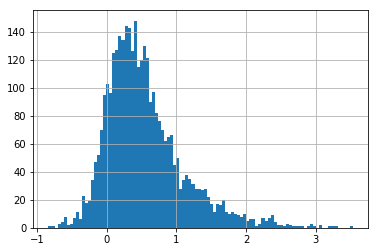

In [108]:
pd.Series([math.log(pmis_per_range[(1978,1988)][p]['score'], math.e) + 7
           for p in pmis_per_range[(1978,1988)]
         if pmis_per_range[(1978,1988)][p]['score']>0]).hist(bins=100)

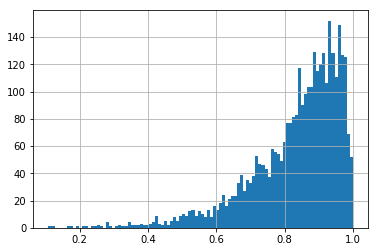

In [109]:
pd.Series([corrs_per_range[(1978,1988)][p]['score']
           for p in corrs_per_range[(1978,1988)]
]).hist(bins=100)

In [111]:
friends_to = {"arms_race": 0, "head_to_head": 0, "tryst": 0}
arms_race_to = {"friendship": 0, "head_to_head": 0, "tryst": 0}
head_to_head_to = {"arms_race": 0, "friendship": 0, "tryst": 0}
tryst_to = {"arms_race": 0, "head_to_head": 0, "friendship": 0}

all_rel_changes = []

score_thresh = 1

timespan = [1978, 2019]
timestep = 10

time_ranges = []

y0 = timespan[0]
for y1 in range(timespan[0]+timestep, timespan[1], timestep):
    time_ranges.append((y0, y1))
    y0 = y1

# skip the first one, it is weird
# time_ranges = time_ranges[1:]

def detect_relation_changes(cutoff=300):
    for t, r in enumerate(time_ranges):
        # changes in friendship
#         sorted_friendships = sorted(friendship_per_range[r].items(), key=lambda f: f[1]['score'], reverse=True)
#         sorted_friendships = sorted(friendship_per_range[r].items(), key=lambda f: 
#                                     abs(corrs_per_range[r][f[0]]-corrs_per_range[r2][f[0]]), reverse=True)
        for i, pair in enumerate(friendship_per_range[r]):
            score1 = friendship_per_range[r][pair]['score']
            for r2 in time_ranges[t:]:
                if pair in friendship_per_range[r2]:
#                     print(pair, "from", r, "consistent in", r2)
                    pass
                elif pair in arms_race_per_range[r2]:
                    score2 = arms_race_per_range[r2][pair]['score']
                    friends_to['arms_race'] += 1
                    all_rel_changes.append({'type1': 'friends', 'rel1': friendship_per_range[r][pair], 'r1':r,
                                            'type2': 'arms race', 'rel2': arms_race_per_range[r2][pair], 'r2': r2,
                                            'pair': pair})
#                     if score1 < strength_mean_per_range[r] or score2 < strength_mean_per_range[r2]:
#                         continue
                    print("Friends", pair, friendship_per_range[r][pair]['names'], 
                          score1, "corr", corrs_per_range[r][pair]['score'],
                          "from", r, "is now arms race in", r2, score2, "corr", corrs_per_range[r2][pair]['score'])
                elif pair in head_to_head_per_range[r2]:
                    score2 = head_to_head_per_range[r2][pair]['score']
                    friends_to['head_to_head'] += 1
                    all_rel_changes.append({'type1': 'friends', 'rel1': friendship_per_range[r][pair], 'r1':r,
                                            'type2': 'head to head', 'rel2': head_to_head_per_range[r2][pair], 'r2': r2,
                                            'pair': pair})
#                     if score1 < strength_mean_per_range[r] or score2 < strength_mean_per_range[r2]:
#                         continue
                    print("Friends", pair,  friendship_per_range[r][pair]['names'],
                          score1, "corr", corrs_per_range[r][pair]['score'],
                          "from", r, "is now head to head in", r2, score2, "corr", corrs_per_range[r2][pair]['score'])
                elif pair in tryst_per_range[r2]:
                    score2 = tryst_per_range[r2][pair]['score']
                    friends_to['tryst'] += 1
                    all_rel_changes.append({'type1': 'friends', 'rel1': friendship_per_range[r][pair], 'r1':r,
                                            'type2': 'tryst', 'rel2': tryst_per_range[r2][pair], 'r2': r2,
                                            'pair': pair})
#                     if score1 < strength_mean_per_range[r] or score2 < strength_mean_per_range[r2]:
#                         continue
                    
                    print("Friends", pair,  friendship_per_range[r][pair]['names'],
                          score1, "corr", corrs_per_range[r][pair]['score'], "mean corr", corr_mean,
                          "pmi", pmis_per_range[r][pair]['score'], "pmi mean", pmi_mean_per_range[r],
                          "from", r, "is now tryst in", r2, score2, "corr", corrs_per_range[r2][pair]['score'],
                         "mean corr", corr_mean,
                          "pmi", pmis_per_range[r2][pair]['score'], "pmi mean, std", pmi_mean,
                          pmi_std,
                         )
                    # Bring beginning of range to closest next even number
#                     plot_for_topics(pair, size=(5,3), all_years=range((r[0]+1)//2*2,r[1],2), smooth_win=1)
#                     plot_for_topics(pair, size=(5,3), all_years=range((r2[0]+1)//2*2,r2[1],2), smooth_win=1)
                    plt.show()
                else:
                    pass
#                     print("Found nowhere")
                if i > cutoff:
                    continue
                
                    
        # changes in arms_race
        for pair in arms_race_per_range[r]:
            score1 = arms_race_per_range[r][pair]['score']
            for r2 in time_ranges[t:]:
                if pair not in arms_race_per_range[r2]:
                    print(pair, "from", r, "no longer arms_race in", r2)
                if pair in friendship_per_range[r2]:
                    score2 = friendship_per_range[r2][pair]['score']
                    arms_race_to['friendship'] += 1
                    all_rel_changes.append({'type1': 'arms race', 'rel1': arms_race_per_range[r][pair], 'r1':r,
                                            'type2': 'friends', 'rel2': friendship_per_range[r2][pair], 'r2': r2,
                                            'pair': pair})
#                     if score1 < strength_mean_per_range[r] or score2 < strength_mean_per_range[r2]:
#                         continue
                    print("Arms race", pair, arms_race_per_range[r][pair]['names'], 
                          score1, "corr", corrs_per_range[r][pair]['score'],
                          "from", r, "is now friendship in", r2, score2, "corr", corrs_per_range[r2][pair]['score'])
                elif pair in head_to_head_per_range[r2]:
                    score2 = head_to_head_per_range[r2][pair]['score']
                    arms_race_to['head_to_head'] += 1
                    all_rel_changes.append({'type1': 'arms race', 'rel1': arms_race_per_range[r][pair], 'r1':r,
                                            'type2': 'head to head', 'rel2': head_to_head_per_range[r2][pair], 'r2': r2,
                                            'pair': pair})
#                     if score1 < strength_mean_per_range[r] or score2 < strength_mean_per_range[r2]:
#                         continue
                    print("Arms race", pair,  arms_race_per_range[r][pair]['names'],
                          score1, "corr", corrs_per_range[r][pair]['score'],
                          "from", r, "is now head to head in", r2, score2, "corr", corrs_per_range[r2][pair]['score'])
                elif pair in tryst_per_range[r2]:
                    score2 = tryst_per_range[r2][pair]['score']
                    arms_race_to['tryst'] += 1
                    all_rel_changes.append({'type1': 'arms race', 'rel1': arms_race_per_range[r][pair], 'r1':r,
                                            'type2': 'tryst', 'rel2': tryst_per_range[r2][pair], 'r2': r2,
                                            'pair': pair})
#                     if score1 < strength_mean_per_range[r] or score2 < strength_mean_per_range[r2]:
#                         continue
                    
                    print("Arms race", pair,  arms_race_per_range[r][pair]['names'],
                          score1, "corr", corrs_per_range[r][pair]['score'], "mean corr", corr_mean,
                          "pmi", pmis_per_range[r][pair]['score'], "pmi mean", pmi_mean_per_range[r],
                          "from", r, "is now tryst in", r2, score2, "corr", corrs_per_range[r2][pair]['score'],
                         "mean corr", corr_mean,
                          "pmi", pmis_per_range[r2][pair]['score'], "pmi mean, std", pmi_mean,
                          pmi_std,
                         )
                    # Bring beginning of range to closest next even number
#                     plot_for_topics(pair, size=(5,3), all_years=range((r[0]+1)//2*2,r[1],2), smooth_win=1)
#                     plot_for_topics(pair, size=(5,3), all_years=range((r2[0]+1)//2*2,r2[1],2), smooth_win=1)
                    plt.show()
                else:
                    pass
#                     print("Found nowhere")
                if i > cutoff:
                    continue
                
        # changes in head to head
        for pair in head_to_head_per_range[r]:
            score1 = head_to_head_per_range[r][pair]['score']

            for r2 in time_ranges[t:]:
                if pair not in head_to_head_per_range[r2]:
                    print(pair, "from", r, "no longer head to head in", r2)
                if pair in arms_race_per_range[r2]:
                    score2 = arms_race_per_range[r2][pair]['score']
                    head_to_head_to['arms_race'] += 1
                    all_rel_changes.append({'type1': 'head to head', 'rel1': head_to_head_per_range[r][pair], 'r1':r,
                                            'type2': 'arms race', 'rel2': arms_race_per_range[r2][pair], 'r2': r2,
                                            'pair': pair})
#                     if score1 < strength_mean_per_range[r] or score2 < strength_mean_per_range[r2]:
#                         continue
                    print("Arms race", pair, head_to_head_per_range[r][pair]['names'], 
                          score1, "corr", corrs_per_range[r][pair]['score'],
                          "from", r, "is now friendship in", r2, score2, "corr", corrs_per_range[r2][pair]['score'])
                elif pair in friendship_per_range[r2]:
                    score2 = friendship_per_range[r2][pair]['score']
                    head_to_head_to['friendship'] += 1
                    all_rel_changes.append({'type1': 'head to head', 'rel1': head_to_head_per_range[r][pair], 'r1':r,
                                            'type2': 'friendship', 'rel2': friendship_per_range[r2][pair], 'r2': r2,
                                            'pair': pair})
#                     if score1 < strength_mean_per_range[r] or score2 < strength_mean_per_range[r2]:
#                         continue
                    print("Head to head", pair,  head_to_head_per_range[r][pair]['names'],
                          score1, "corr", corrs_per_range[r][pair]['score'],
                          "from", r, "is now friendship in", r2, score2, "corr", corrs_per_range[r2][pair]['score'])
                elif pair in tryst_per_range[r2]:
                    score2 = tryst_per_range[r2][pair]['score']
                    all_rel_changes.append({'type1': 'head to head', 'rel1': head_to_head_per_range[r][pair], 'r1':r,
                                            'type2': 'tryst', 'rel2': tryst_per_range[r2][pair], 'r2': r2,
                                            'pair': pair})
                    head_to_head_to['tryst'] += 1
#                     if score1 < strength_mean_per_range[r] or score2 < strength_mean_per_range[r2]:
#                         continue
                    
                    print("Head to head", pair,  head_to_head_per_range[r][pair]['names'],
                          score1, "corr", corrs_per_range[r][pair]['score'], "mean corr", corr_mean,
                          "pmi", pmis_per_range[r][pair]['score'], "pmi mean", pmi_mean_per_range[r],
                          "from", r, "is now tryst in", r2, score2, "corr", corrs_per_range[r2][pair]['score'],
                         "mean corr", corr_mean,
                          "pmi", pmis_per_range[r2][pair]['score'], "pmi mean, std", pmi_mean,
                          pmi_std,
                         )
                    # Bring beginning of range to closest next even number
#                     plot_for_topics(pair, size=(5,3), all_years=range((r[0]+1)//2*2,r[1],2), smooth_win=1)
#                     plot_for_topics(pair, size=(5,3), all_years=range((r2[0]+1)//2*2,r2[1],2), smooth_win=1)
#                     plt.show()
                else:
                    pass
#                     print("Found nowhere")
                if i > cutoff:
                    continue
        # changes in tryst
        for pair in tryst_per_range[r]:
            score1 = tryst_per_range[r][pair]['score']
            
            for r2 in time_ranges[t:]:
#                 if pair not in tryst_per_range[r2]:
#                     print(pair, "from", r, "no longer tryst in", r2)
                if pair in friendship_per_range[r2]:
                    score2 = friendship_per_range[r2][pair]['score']
                    tryst_to['friendship'] += 1
                    all_rel_changes.append({'type1': 'tryst', 'rel1': tryst_per_range[r][pair], 'r1':r,
                                            'type2': 'friendship', 'rel2': friendship_per_range[r2][pair], 'r2': r2,
                                            'pair': pair})
#                     if score1 < strength_mean_per_range[r] or score2 < strength_mean_per_range[r2]:
#                         continue
                    print("Tryst", pair,  tryst_per_range[r][pair]['names'],
                          score1, "corr", corrs_per_range[r][pair]['score'],
                          "from", r, "is now friendship in", r2, score2, "corr", corrs_per_range[r2][pair]['score'])
                    # Bring beginning of range to closest next even number
#                     plot_for_topics(pair, size=(5,3), all_years=range((r[0]+1)//2*2,r[1],2), smooth_win=1)
#                     plot_for_topics(pair, size=(5,3), all_years=range((r2[0]+1)//2*2,r2[1],2), smooth_win=1)
#                     plt.show()
                elif pair in arms_race_per_range[r2]:
                    score2 = arms_race_per_range[r2][pair]['score']
                    tryst_to['arms_race'] += 1
                    all_rel_changes.append({'type1': 'tryst', 'rel1': tryst_per_range[r][pair], 'r1':r,
                                            'type2': 'arms race', 'rel2': arms_race_per_range[r2][pair], 'r2': r2,
                                            'pair': pair})
#                     if score1 < strength_mean_per_range[r] or score2 < strength_mean_per_range[r2]:
#                         continue
                    print("Tryst", pair,  tryst_per_range[r][pair]['names'],
                          score1, "corr", corrs_per_range[r][pair]['score'],
                          "from", r, "is now arms race in", r2, score2, "corr", corrs_per_range[r2][pair]['score'])
                elif pair in head_to_head_per_range[r2]:
                    score2 = head_to_head_per_range[r2][pair]['score']
                    tryst_to['head_to_head'] += 1
                    all_rel_changes.append({'type1': 'tryst', 'rel1': tryst_per_range[r][pair], 'r1':r,
                                            'type2': 'head to head', 'rel2': head_to_head_per_range[r2][pair], 'r2': r2,
                                            'pair': pair})
#                     if score1 < strength_mean_per_range[r] or score2 < strength_mean_per_range[r2]:
#                         continue
                    
                    print("Tryst", pair,  tryst_per_range[r][pair]['names'],
                          score1, "corr", corrs_per_range[r][pair]['score'], "mean corr", corr_mean,
                          "pmi", pmis_per_range[r][pair]['score'], "pmi mean", pmi_mean_per_range[r],
                          "from", r, "is now head to head in", r2, score2, "corr", corrs_per_range[r2][pair]['score'],
                         "mean corr", corr_mean,
                          "pmi", pmis_per_range[r2][pair]['score'], "pmi mean, std", pmi_mean,
                          pmi_std,
                         )
                    # Bring beginning of range to closest next even number
#                     plot_for_topics(pair, size=(5,3), all_years=range((r[0]+1)//2*2,r[1],2), smooth_win=1)
#                     plot_for_topics(pair, size=(5,3), all_years=range((r2[0]+1)//2*2,r2[1],2), smooth_win=1)
#                     plt.show()
                else:
                    pass
#                     print("Found nowhere")
                if i > cutoff:
                    continue
                
        
                
                
detect_relation_changes()
print(friends_to)
print(arms_race_to)
print(head_to_head_to)
print(tryst_to)
            

Friends (29, 50) ['DATABASE/RESOURCE?', 'LEXICONS'] 0.2222257202006677 corr 0.931961811256903 from (1978, 1988) is now arms race in (1998, 2008) 0.22025023735342614 corr 0.95981826720378
Friends (29, 50) ['DATABASE/RESOURCE?', 'LEXICONS'] 0.2222257202006677 corr 0.931961811256903 from (1978, 1988) is now arms race in (2008, 2018) 0.22296869639101366 corr 0.9353955656612728
Friends (59, 78) ['EVENT EXTRACTION', 'NEURAL MACHINE TRANSLATION'] 2.493903208656988 corr 0.9680304567144123 mean corr 0.8811602216596589 pmi 0.005063291139240506 pmi mean 0.0019237052476175304 from (1978, 1988) is now tryst in (1988, 1998) 0.025612390145505762 corr 0.7388527393968924 mean corr 0.8811602216596589 pmi 0.0007518796992481203 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Friends (59, 78) ['EVENT EXTRACTION', 'NEURAL MACHINE TRANSLATION'] 2.493903208656988 corr 0.9680304567144123 from (1978, 1988) is now head to head in (1998, 2008) 0.24564991662791053 corr 0.8123536209785354
Friends (59, 78)

Friends (30, 61) ['SOCIAL MEDIA/WEB DATA', 'LOGICAL FORMS'] 0.059351394252926744 corr 0.9594366789333534 mean corr 0.8811602216596589 pmi 0.0008392687020822937 pmi mean 0.0019237052476175304 from (1978, 1988) is now tryst in (1988, 1998) 0.07559964068084436 corr 0.9215255128824853 mean corr 0.8811602216596589 pmi 0.0004416360918603071 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Friends (30, 61) ['SOCIAL MEDIA/WEB DATA', 'LOGICAL FORMS'] 0.059351394252926744 corr 0.9594366789333534 from (1978, 1988) is now head to head in (1998, 2008) 0.06384442628449914 corr 0.9002565894244261
Friends (30, 61) ['SOCIAL MEDIA/WEB DATA', 'LOGICAL FORMS'] 0.059351394252926744 corr 0.9594366789333534 from (1978, 1988) is now arms race in (2008, 2018) 0.39595266714986965 corr 0.9738845627363109
Friends (4, 48) ['SENTIMENT ANALYSIS', 'SPEECH RECOGNITION'] 0.2516470791883831 corr 0.9499991006839817 mean corr 0.8811602216596589 pmi 0.001277139208173691 pmi mean 0.0019237052476175304 from (1978, 1

Friends (67, 95) ['DISAMBIGUATION', 'GRAPH-BASED METHODS'] 0.14525389044570236 corr 0.9357643357221104 from (1978, 1988) is now arms race in (2008, 2018) 0.38543856119374886 corr 0.973760466749445
Friends (30, 99) ['SOCIAL MEDIA/WEB DATA', 'SCENE DESCRIPTION'] 0.20121553532791345 corr 0.9781304000487148 mean corr 0.8811602216596589 pmi 0.0010382723148680596 pmi mean 0.0019237052476175304 from (1978, 1988) is now tryst in (1988, 1998) 0.007175730142858928 corr 0.9146179209902473 mean corr 0.8811602216596589 pmi 0.0006922675026123302 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Friends (30, 99) ['SOCIAL MEDIA/WEB DATA', 'SCENE DESCRIPTION'] 0.20121553532791345 corr 0.9781304000487148 from (1978, 1988) is now arms race in (2008, 2018) 0.44345150442425174 corr 0.9916584249785596
Friends (56, 70) ['PLAN-BASED DIALOGUE', 'NARRATIVES'] 0.30843264085747907 corr 0.9640670559207024 from (1978, 1988) is now arms race in (1998, 2008) 0.21724985765433777 corr 0.9562479517670018
Friends

Friends (79, 87) ['RECURRENT NEURAL NETWORKS', 'WORDNET/DISAMBIGUATION'] 2.230844874853139 corr 0.9738079240076228 from (1978, 1988) is now head to head in (1998, 2008) 0.16132411480148828 corr 0.8285431475228885
Friends (79, 87) ['RECURRENT NEURAL NETWORKS', 'WORDNET/DISAMBIGUATION'] 2.230844874853139 corr 0.9738079240076228 from (1978, 1988) is now head to head in (2008, 2018) 3.1691641105716544 corr 0.1702718109387359
Friends (26, 65) ['ANAPHORA/COREFERENCE RESOLUTION', 'INFORMATION EXTRACTION?'] 0.06835640282013443 corr 0.930582103112952 mean corr 0.8811602216596589 pmi 0.0009337068160597573 pmi mean 0.0019237052476175304 from (1978, 1988) is now tryst in (1988, 1998) 0.001667768928753825 corr 0.8819362737205911 mean corr 0.8811602216596589 pmi 0.0003999015626922604 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Friends (26, 65) ['ANAPHORA/COREFERENCE RESOLUTION', 'INFORMATION EXTRACTION?'] 0.06835640282013443 corr 0.930582103112952 from (1978, 1988) is now head to head 

Friends (28, 48) ['DEPENDENCY PARSING', 'SPEECH RECOGNITION'] 0.21016592069029044 corr 0.9438255680573453 from (1978, 1988) is now arms race in (1988, 1998) 0.16250385336520026 corr 0.9457328151354183
Friends (28, 48) ['DEPENDENCY PARSING', 'SPEECH RECOGNITION'] 0.21016592069029044 corr 0.9438255680573453 from (1978, 1988) is now arms race in (1998, 2008) 0.24575357707891946 corr 0.9469200839874581
Friends (28, 48) ['DEPENDENCY PARSING', 'SPEECH RECOGNITION'] 0.21016592069029044 corr 0.9438255680573453 from (1978, 1988) is now head to head in (2008, 2018) 0.10955375282568594 corr 0.9058198759378383
Friends (84, 85) ['DICTIONARIES', 'RELATION EXTRACTION'] 0.3333098118317639 corr 0.9564672351967477 from (1978, 1988) is now head to head in (1998, 2008) 0.008575396213792316 corr 0.8842976395574185
Friends (84, 85) ['DICTIONARIES', 'RELATION EXTRACTION'] 0.3333098118317639 corr 0.9564672351967477 from (1978, 1988) is now arms race in (2008, 2018) 0.27676457037742164 corr 0.946930624660782
F

Friends (5, 80) ['TREES', 'COMPLEXITY ANALYSIS'] 0.16904827704248457 corr 0.9575037727148802 from (1978, 1988) is now arms race in (2008, 2018) 0.3997636287983556 corr 0.9807615791944352
Friends (12, 13) ['CLUSTERING', 'LANGUAGE ACQUISITION/SIMPLIFICATION'] 1.088062675669135 corr 0.9484515928512185 mean corr 0.8811602216596589 pmi 0.0031683168316831685 pmi mean 0.0019237052476175304 from (1978, 1988) is now tryst in (1988, 1998) 0.12715954392029083 corr 0.8237160207871473 mean corr 0.8811602216596589 pmi 0.0003901424019767215 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Friends (12, 13) ['CLUSTERING', 'LANGUAGE ACQUISITION/SIMPLIFICATION'] 1.088062675669135 corr 0.9484515928512185 from (1978, 1988) is now head to head in (1998, 2008) 0.4579374429640977 corr 0.7314533868333053
Friends (12, 13) ['CLUSTERING', 'LANGUAGE ACQUISITION/SIMPLIFICATION'] 1.088062675669135 corr 0.9484515928512185 from (1978, 1988) is now arms race in (2008, 2018) 0.27990520396147145 corr 0.948220748

Friends (5, 66) ['TREES', 'HUMAN-COMPUTER INTERACTION/APPLICATION'] 0.04913606853287986 corr 0.9563029811683548 from (1978, 1988) is now arms race in (1998, 2008) 0.40523978097944247 corr 0.9972025490916346
Friends (5, 66) ['TREES', 'HUMAN-COMPUTER INTERACTION/APPLICATION'] 0.04913606853287986 corr 0.9563029811683548 from (1978, 1988) is now arms race in (2008, 2018) 0.33789315574685164 corr 0.9609110996329351
Friends (38, 48) ['SYNTACTICAL STRUCTURE', 'SPEECH RECOGNITION'] 0.08431951409460095 corr 0.9331762043293531 from (1978, 1988) is now arms race in (1998, 2008) 0.36614966317259806 corr 0.9886721432034875
Friends (38, 48) ['SYNTACTICAL STRUCTURE', 'SPEECH RECOGNITION'] 0.08431951409460095 corr 0.9331762043293531 from (1978, 1988) is now arms race in (2008, 2018) 0.32220584397457086 corr 0.9586187257093722
Friends (1, 98) ['FINITE STATE MACHINES', 'NEWS ARTICLES'] 0.07026471820360598 corr 0.9274130431216655 from (1978, 1988) is now arms race in (1998, 2008) 0.313033516108536 corr 0

Friends (20, 81) ['STYLISTICS', 'OPINION MINING'] 0.2970920542195754 corr 0.925024891788546 from (1978, 1988) is now arms race in (2008, 2018) 0.3872190643504476 corr 0.9879795308743112
Friends (5, 94) ['TREES', 'FRAME SEMANTICS'] 0.18282682072724754 corr 0.9852173330456498 from (1978, 1988) is now arms race in (1998, 2008) 0.19091451376636268 corr 0.9548287268270615
Friends (5, 94) ['TREES', 'FRAME SEMANTICS'] 0.18282682072724754 corr 0.9852173330456498 from (1978, 1988) is now head to head in (2008, 2018) 0.16879220198385575 corr 0.9203149935604011
Friends (3, 98) ['MULTI-WORD EXPRESSIONS', 'NEWS ARTICLES'] 0.29196359464124383 corr 0.969264632232947 from (1978, 1988) is now head to head in (1998, 2008) 0.1180815326630214 corr 0.9241228222250868
Friends (3, 98) ['MULTI-WORD EXPRESSIONS', 'NEWS ARTICLES'] 0.29196359464124383 corr 0.969264632232947 from (1978, 1988) is now arms race in (2008, 2018) 0.4378759961238025 corr 0.9883158841637956
Friends (56, 81) ['PLAN-BASED DIALOGUE', 'OPIN

Friends (9, 30) ['ARGUMENT MINING', 'SOCIAL MEDIA/WEB DATA'] 0.33825012484556216 corr 0.9742864001580882 from (1978, 1988) is now arms race in (2008, 2018) 0.40044537637269895 corr 0.9989502214336845
Friends (14, 21) ['GENERATION', 'POS TAGGING/STATISTICAL PARSING'] 0.17833843527848744 corr 0.9447509761670652 from (1978, 1988) is now head to head in (1988, 1998) 0.516588757902164 corr 0.687469344142725
Friends (14, 21) ['GENERATION', 'POS TAGGING/STATISTICAL PARSING'] 0.17833843527848744 corr 0.9447509761670652 from (1978, 1988) is now arms race in (1998, 2008) 0.25749385616116766 corr 0.95629494214471
Friends (14, 21) ['GENERATION', 'POS TAGGING/STATISTICAL PARSING'] 0.17833843527848744 corr 0.9447509761670652 from (1978, 1988) is now arms race in (2008, 2018) 0.27016300336737953 corr 0.9450232114994624
Friends (4, 98) ['SENTIMENT ANALYSIS', 'NEWS ARTICLES'] 0.5446762921435434 corr 0.9911509585100892 mean corr 0.8811602216596589 pmi 0.001473063973063973 pmi mean 0.0019237052476175304 

Friends (0, 8) ['DOMAIN ADAPTATION', 'LINEAR PROGRAMMING'] 0.5785869386536646 corr 0.9646723829232197 from (1978, 1988) is now arms race in (1998, 2008) 0.303481642254362 corr 0.9656614678213797
Friends (0, 8) ['DOMAIN ADAPTATION', 'LINEAR PROGRAMMING'] 0.5785869386536646 corr 0.9646723829232197 from (1978, 1988) is now arms race in (2008, 2018) 0.4055273952676417 corr 0.9764673877086985
Friends (14, 80) ['GENERATION', 'COMPLEXITY ANALYSIS'] 0.10914284340534319 corr 0.9593977062452873 mean corr 0.8811602216596589 pmi 0.0009355051727933084 pmi mean 0.0019237052476175304 from (1978, 1988) is now tryst in (1988, 1998) 0.0643704838361197 corr 0.9207813815589133 mean corr 0.8811602216596589 pmi 0.0004791515822650028 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Friends (14, 80) ['GENERATION', 'COMPLEXITY ANALYSIS'] 0.10914284340534319 corr 0.9593977062452873 from (1978, 1988) is now arms race in (1998, 2008) 0.35552921057115294 corr 0.9881735959883104
Friends (14, 80) ['GENERATI

Friends (51, 65) ['CONSTITUENT PARSING', 'INFORMATION EXTRACTION?'] 0.2819212261332965 corr 0.9734846594451159 from (1978, 1988) is now arms race in (2008, 2018) 0.48574191614887363 corr 0.9979345927848926
Friends (8, 26) ['LINEAR PROGRAMMING', 'ANAPHORA/COREFERENCE RESOLUTION'] 0.3706341656870913 corr 0.9822320199885309 from (1978, 1988) is now arms race in (1998, 2008) 0.2561047824118199 corr 0.9796287358076537
Friends (8, 26) ['LINEAR PROGRAMMING', 'ANAPHORA/COREFERENCE RESOLUTION'] 0.3706341656870913 corr 0.9822320199885309 from (1978, 1988) is now arms race in (2008, 2018) 0.46338589448181006 corr 0.9989854468989614
Friends (65, 95) ['INFORMATION EXTRACTION?', 'GRAPH-BASED METHODS'] 0.1672994936933473 corr 0.9919173519834464 mean corr 0.8811602216596589 pmi 0.0009529585029888244 pmi mean 0.0019237052476175304 from (1978, 1988) is now tryst in (1988, 1998) 0.06305299686605528 corr 0.9108872432151524 mean corr 0.8811602216596589 pmi 0.0004041294683860539 pmi mean, std 0.000724679974

Friends (48, 73) ['SPEECH RECOGNITION', 'QUANTITATIVE ANALYSIS/TEXT MINING'] 0.7386607999307706 corr 0.9789407409775231 from (1978, 1988) is now arms race in (1998, 2008) 0.36551074735933925 corr 0.9953353113072535
Friends (48, 73) ['SPEECH RECOGNITION', 'QUANTITATIVE ANALYSIS/TEXT MINING'] 0.7386607999307706 corr 0.9789407409775231 from (1978, 1988) is now arms race in (2008, 2018) 0.3636605135285103 corr 0.9704161649709163
Friends (61, 73) ['LOGICAL FORMS', 'QUANTITATIVE ANALYSIS/TEXT MINING'] 0.05653224451181066 corr 0.9583981733831151 from (1978, 1988) is now head to head in (1988, 1998) 0.7037550086350824 corr 0.6705363962561045
Friends (61, 73) ['LOGICAL FORMS', 'QUANTITATIVE ANALYSIS/TEXT MINING'] 0.05653224451181066 corr 0.9583981733831151 from (1978, 1988) is now head to head in (1998, 2008) 0.13653156535395405 corr 0.8434771229213496
Friends (61, 73) ['LOGICAL FORMS', 'QUANTITATIVE ANALYSIS/TEXT MINING'] 0.05653224451181066 corr 0.9583981733831151 from (1978, 1988) is now arm

Friends (8, 54) ['LINEAR PROGRAMMING', 'RANKING'] 0.5203733337536155 corr 0.9423154910512817 mean corr 0.8811602216596589 pmi 0.0020106276030446646 pmi mean 0.0019237052476175304 from (1978, 1988) is now tryst in (1988, 1998) 0.01423271731252739 corr 0.901217467296425 mean corr 0.8811602216596589 pmi 0.0006174395161290322 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Friends (8, 54) ['LINEAR PROGRAMMING', 'RANKING'] 0.5203733337536155 corr 0.9423154910512817 from (1978, 1988) is now arms race in (1998, 2008) 0.14690130903498297 corr 0.9301217346807914
Friends (8, 54) ['LINEAR PROGRAMMING', 'RANKING'] 0.5203733337536155 corr 0.9423154910512817 from (1978, 1988) is now arms race in (2008, 2018) 0.45487325394751726 corr 0.9927801850491311
Friends (22, 26) ['UNIFICATION', 'ANAPHORA/COREFERENCE RESOLUTION'] 0.1338521729426147 corr 0.9433294200905292 from (1978, 1988) is now head to head in (1998, 2008) 0.035701876196022615 corr 0.8702886640760494
Friends (22, 26) ['UNIFICATION',

Friends (6, 17) ['REINFORCEMENT LEARNING', 'EVENTS/TEMPORAL'] 0.5064466967054037 corr 0.9574719457227586 from (1978, 1988) is now head to head in (2008, 2018) 0.09777768502422389 corr 0.9051271560188976
Friends (86, 95) ['HISTORICAL LINGUISTICS', 'GRAPH-BASED METHODS'] 0.1708857109873977 corr 0.9389573950156263 from (1978, 1988) is now arms race in (1998, 2008) 0.327156536411792 corr 0.9764823204175869
Friends (86, 95) ['HISTORICAL LINGUISTICS', 'GRAPH-BASED METHODS'] 0.1708857109873977 corr 0.9389573950156263 from (1978, 1988) is now arms race in (2008, 2018) 0.19147386525310028 corr 0.9256832787725611
Friends (28, 38) ['DEPENDENCY PARSING', 'SYNTACTICAL STRUCTURE'] 0.34935016952298986 corr 0.9697396007227815 mean corr 0.8811602216596589 pmi 0.0013207131851199648 pmi mean 0.0019237052476175304 from (1978, 1988) is now tryst in (1998, 2008) 0.028234276789399323 corr 0.8942261385022964 mean corr 0.8811602216596589 pmi 0.00039810800157666533 pmi mean, std 0.0007246799747139201 0.00118381

Friends (14, 89) ['GENERATION', 'INFORMATION RETRIEVAL'] 0.22136449940275513 corr 0.9346311237362025 from (1978, 1988) is now arms race in (2008, 2018) 0.30275391440941113 corr 0.9575106794746002
Friends (71, 88) ['ONTOLOGIES', 'DEPENDENCY PARSING'] 0.09134057891378698 corr 0.946459873678391 from (1978, 1988) is now arms race in (1988, 1998) 0.24248570234196837 corr 0.963357847913738
Friends (71, 88) ['ONTOLOGIES', 'DEPENDENCY PARSING'] 0.09134057891378698 corr 0.946459873678391 from (1978, 1988) is now arms race in (1998, 2008) 0.42822468625900684 corr 0.9925529439368029
Friends (71, 88) ['ONTOLOGIES', 'DEPENDENCY PARSING'] 0.09134057891378698 corr 0.946459873678391 from (1978, 1988) is now arms race in (2008, 2018) 0.49438695733732096 corr 0.9934868544866358
Friends (9, 73) ['ARGUMENT MINING', 'QUANTITATIVE ANALYSIS/TEXT MINING'] 0.6234954019279114 corr 0.9737453890798978 mean corr 0.8811602216596589 pmi 0.0017424132423406419 pmi mean 0.0019237052476175304 from (1978, 1988) is now tr

Tryst (31, 74) ['SUMMARIZATION', 'VISION/MULTIMODAL'] 9.496998612410094 corr 0.6692074927110885 mean corr 0.8811602216596589 pmi 0.0074962518740629685 pmi mean 0.0019237052476175304 from (1978, 1988) is now head to head in (2008, 2018) 0.4464219727396886 corr 0.7663089025587049 mean corr 0.8811602216596589 pmi 0.00013725594681574278 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst (78, 86) ['NEURAL MACHINE TRANSLATION', 'HISTORICAL LINGUISTICS'] 8.614865375889552 corr 0.6185209895926574 mean corr 0.8811602216596589 pmi 0.005681818181818182 pmi mean 0.0019237052476175304 from (1978, 1988) is now head to head in (1998, 2008) 0.20677663743173139 corr 0.8149035352038049 mean corr 0.8811602216596589 pmi 0.00025303643724696357 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst (78, 86) ['NEURAL MACHINE TRANSLATION', 'HISTORICAL LINGUISTICS'] 8.614865375889552 corr 0.6185209895926574 mean corr 0.8811602216596589 pmi 0.005681818181818182 pmi mean 0.00192370524761753

Tryst (59, 61) ['EVENT EXTRACTION', 'LOGICAL FORMS'] 0.8102018878904685 corr 0.7007756619162728 from (1978, 1988) is now friendship in (1988, 1998) 0.011086357298318635 corr 0.9403139864553275
Tryst (59, 61) ['EVENT EXTRACTION', 'LOGICAL FORMS'] 0.8102018878904685 corr 0.7007756619162728 mean corr 0.8811602216596589 pmi 0.0014034708914739144 pmi mean 0.0019237052476175304 from (1978, 1988) is now head to head in (1998, 2008) 0.04651433688238919 corr 0.8621919730275376 mean corr 0.8811602216596589 pmi 0.0003540831171630245 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst (59, 61) ['EVENT EXTRACTION', 'LOGICAL FORMS'] 0.8102018878904685 corr 0.7007756619162728 from (1978, 1988) is now arms race in (2008, 2018) 0.3937237844267884 corr 0.9831235929029165
Tryst (24, 73) ['TEXTUAL ENTAILMENT', 'QUANTITATIVE ANALYSIS/TEXT MINING'] 0.2930521470787683 corr 0.7657799311349852 mean corr 0.8811602216596589 pmi 0.0011085245538188671 pmi mean 0.0019237052476175304 from (1978, 1988) is

Tryst (8, 9) ['LINEAR PROGRAMMING', 'ARGUMENT MINING'] 0.006260124542022438 corr 0.8845807351134013 mean corr 0.8811602216596589 pmi 0.0010012682731459848 pmi mean 0.0019237052476175304 from (1978, 1988) is now head to head in (2008, 2018) 0.1774500533156524 corr 0.921754133057974 mean corr 0.8811602216596589 pmi 6.4051381491783e-05 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst (38, 90) ['SYNTACTICAL STRUCTURE', 'COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING'] 0.14873176555724474 corr 0.9183003568566221 from (1978, 1988) is now friendship in (1988, 1998) 0.03756602531862421 corr 0.9882754635459453
Tryst (38, 90) ['SYNTACTICAL STRUCTURE', 'COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING'] 0.14873176555724474 corr 0.9183003568566221 from (1978, 1988) is now friendship in (1998, 2008) 0.23616642876711677 corr 0.9828658456803397
Tryst (38, 90) ['SYNTACTICAL STRUCTURE', 'COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING'] 0.14873176555724474 corr 0.9183003568566221 from (1978, 1988

Tryst (6, 87) ['REINFORCEMENT LEARNING', 'WORDNET/DISAMBIGUATION'] 0.4411285691460987 corr 0.8176172865710967 mean corr 0.8811602216596589 pmi 0.0017738359201773836 pmi mean 0.0019237052476175304 from (1978, 1988) is now head to head in (2008, 2018) 0.415556785280673 corr 0.7869630441407287 mean corr 0.8811602216596589 pmi 5.797358091214578e-05 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst (30, 51) ['SOCIAL MEDIA/WEB DATA', 'CONSTITUENT PARSING'] 0.010590037300575492 corr 0.9150076392881801 from (1978, 1988) is now arms race in (1988, 1998) 0.19928676252282418 corr 0.960385747105513
Tryst (30, 51) ['SOCIAL MEDIA/WEB DATA', 'CONSTITUENT PARSING'] 0.010590037300575492 corr 0.9150076392881801 from (1978, 1988) is now arms race in (1998, 2008) 0.38445636523615884 corr 0.976976564840018
Tryst (30, 51) ['SOCIAL MEDIA/WEB DATA', 'CONSTITUENT PARSING'] 0.010590037300575492 corr 0.9150076392881801 mean corr 0.8811602216596589 pmi 0.0007719639609153589 pmi mean 0.00192370524761

Tryst (55, 72) ['EMBEDDINGS', 'PREDICTION'] 3.46123754197295 corr 0.6542859587417571 mean corr 0.8811602216596589 pmi 0.0030303030303030303 pmi mean 0.0019237052476175304 from (1978, 1988) is now head to head in (2008, 2018) 0.1391906479594354 corr 0.9165509714154298 mean corr 0.8811602216596589 pmi 0.00013030238651653566 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst (12, 19) ['CLUSTERING', 'PHONOLOGY'] 0.4291659561908644 corr 0.9115750882310292 mean corr 0.8811602216596589 pmi 0.002857142857142857 pmi mean 0.0019237052476175304 from (1978, 1988) is now head to head in (1998, 2008) 0.06257316614474231 corr 0.9017359389665981 mean corr 0.8811602216596589 pmi 0.0002650849928758408 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst (12, 19) ['CLUSTERING', 'PHONOLOGY'] 0.4291659561908644 corr 0.9115750882310292 from (1978, 1988) is now arms race in (2008, 2018) 0.4089452250673123 corr 0.9797060578683126
Tryst (69, 78) ['NEURAL NETWORKS/DEEP LEARNING', 'NEURAL

Tryst (30, 41) ['SOCIAL MEDIA/WEB DATA', 'PROBABILISTIC MODELS'] 0.16777545460521587 corr 0.9194080473630004 from (1978, 1988) is now arms race in (2008, 2018) 0.3226286323602492 corr 0.9599643715308201
Tryst (55, 65) ['EMBEDDINGS', 'INFORMATION EXTRACTION?'] 0.11123234588061448 corr 0.9100184832354008 from (1978, 1988) is now friendship in (1988, 1998) 0.02526307625575836 corr 0.9296818792204228
Tryst (55, 65) ['EMBEDDINGS', 'INFORMATION EXTRACTION?'] 0.11123234588061448 corr 0.9100184832354008 from (1978, 1988) is now arms race in (1998, 2008) 0.2560885060317819 corr 0.9642275633513457
Tryst (55, 65) ['EMBEDDINGS', 'INFORMATION EXTRACTION?'] 0.11123234588061448 corr 0.9100184832354008 mean corr 0.8811602216596589 pmi 0.00130718954248366 pmi mean 0.0019237052476175304 from (1978, 1988) is now head to head in (2008, 2018) 1.3029457101543878 corr 0.5722017993018347 mean corr 0.8811602216596589 pmi 8.734402852049911e-05 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst (38,

Tryst (6, 23) ['REINFORCEMENT LEARNING', 'LANGUAGE MODELS (CLASSICAL)'] 1.7740351625746382 corr 0.7431755338642815 mean corr 0.8811602216596589 pmi 0.0026676829268292685 pmi mean 0.0019237052476175304 from (1978, 1988) is now head to head in (2008, 2018) 0.3502284127615513 corr 0.800298468625217 mean corr 0.8811602216596589 pmi 7.011862796968326e-05 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst (41, 51) ['PROBABILISTIC MODELS', 'CONSTITUENT PARSING'] 0.2776653054028964 corr 0.7632190358859126 mean corr 0.8811602216596589 pmi 0.0010804736796611635 pmi mean 0.0019237052476175304 from (1978, 1988) is now head to head in (1998, 2008) 0.02320471156953528 corr 0.888439977492115 mean corr 0.8811602216596589 pmi 0.00024295241434944576 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst (41, 51) ['PROBABILISTIC MODELS', 'CONSTITUENT PARSING'] 0.2776653054028964 corr 0.7632190358859126 from (1978, 1988) is now arms race in (2008, 2018) 0.4319146953225749 corr 0.9832

Tryst (8, 91) ['LINEAR PROGRAMMING', 'ASIAN LANGUAGES'] 0.015793430757200848 corr 0.6321037463883263 from (1978, 1988) is now arms race in (2008, 2018) 0.3565323810836018 corr 0.9656631292112606
Tryst (46, 68) ['TRANSFER LEARNING', 'GRAPHS/ABSTRACT MEANING REPRESENTATION'] 0.0017570270074706324 corr 0.8615543059193056 from (1978, 1988) is now friendship in (1988, 1998) 0.10140565481106133 corr 0.9585258866993086
Tryst (46, 68) ['TRANSFER LEARNING', 'GRAPHS/ABSTRACT MEANING REPRESENTATION'] 0.0017570270074706324 corr 0.8615543059193056 from (1978, 1988) is now arms race in (1998, 2008) 0.22225633359933508 corr 0.9499635999735665
Tryst (46, 68) ['TRANSFER LEARNING', 'GRAPHS/ABSTRACT MEANING REPRESENTATION'] 0.0017570270074706324 corr 0.8615543059193056 from (1978, 1988) is now arms race in (2008, 2018) 0.3740925483797894 corr 0.9700759280071587
Tryst (11, 98) ['TOPIC MODELS', 'NEWS ARTICLES'] 0.10312386796380413 corr 0.9190164806927793 from (1978, 1988) is now friendship in (1998, 2008) 

Tryst (22, 52) ['UNIFICATION', 'MULTILINGUALITY'] 0.13004989988441076 corr 0.9183217836411521 from (1978, 1988) is now friendship in (1988, 1998) 0.11670446102915076 corr 0.9611239198689178
Tryst (22, 52) ['UNIFICATION', 'MULTILINGUALITY'] 0.13004989988441076 corr 0.9183217836411521 mean corr 0.8811602216596589 pmi 0.0012535612535612536 pmi mean 0.0019237052476175304 from (1978, 1988) is now head to head in (1998, 2008) 0.13397313186493193 corr 0.8342569607522415 mean corr 0.8811602216596589 pmi 0.0002930050674850774 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst (22, 52) ['UNIFICATION', 'MULTILINGUALITY'] 0.13004989988441076 corr 0.9183217836411521 mean corr 0.8811602216596589 pmi 0.0012535612535612536 pmi mean 0.0019237052476175304 from (1978, 1988) is now head to head in (2008, 2018) 0.11887334962464549 corr 0.8518576576792174 mean corr 0.8811602216596589 pmi 0.00011159452423289778 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst (40, 46) ['MACHINE LE

Tryst (38, 55) ['SYNTACTICAL STRUCTURE', 'EMBEDDINGS'] 0.012330002603136863 corr 0.88912141481256 mean corr 0.8811602216596589 pmi 0.0009587399417907892 pmi mean 0.0019237052476175304 from (1978, 1988) is now head to head in (2008, 2018) 1.1028056575736083 corr 0.6173570027226314 mean corr 0.8811602216596589 pmi 9.29070249339692e-05 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst (13, 78) ['LANGUAGE ACQUISITION/SIMPLIFICATION', 'NEURAL MACHINE TRANSLATION'] 9.501183087391908 corr 0.5413712093202611 mean corr 0.8811602216596589 pmi 0.0049504950495049506 pmi mean 0.0019237052476175304 from (1978, 1988) is now head to head in (1998, 2008) 1.1254318786507662 corr 0.5970631844451613 mean corr 0.8811602216596589 pmi 0.000126000126000126 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst (13, 78) ['LANGUAGE ACQUISITION/SIMPLIFICATION', 'NEURAL MACHINE TRANSLATION'] 9.501183087391908 corr 0.5413712093202611 mean corr 0.8811602216596589 pmi 0.0049504950495049506 pmi

Tryst (13, 59) ['LANGUAGE ACQUISITION/SIMPLIFICATION', 'EVENT EXTRACTION'] 0.3386448942321311 corr 0.5458345265312893 mean corr 0.8811602216596589 pmi 0.0008773029201654342 pmi mean 0.0019237052476175304 from (1978, 1988) is now head to head in (1998, 2008) 0.2328491691058376 corr 0.8135744692002028 mean corr 0.8811602216596589 pmi 0.0002040110343359441 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst (13, 59) ['LANGUAGE ACQUISITION/SIMPLIFICATION', 'EVENT EXTRACTION'] 0.3386448942321311 corr 0.5458345265312893 from (1978, 1988) is now arms race in (2008, 2018) 0.5018077187236744 corr 0.9955191021704843
Tryst (7, 69) ['SVMs', 'NEURAL NETWORKS/DEEP LEARNING'] 3.1239702318077223 corr 0.8092054687592155 mean corr 0.8811602216596589 pmi 0.007285974499089253 pmi mean 0.0019237052476175304 from (1978, 1988) is now head to head in (1998, 2008) 0.47371675705393135 corr 0.7157621617074507 mean corr 0.8811602216596589 pmi 0.00029183690486116903 pmi mean, std 0.0007246799747139201 

Tryst (13, 28) ['LANGUAGE ACQUISITION/SIMPLIFICATION', 'DEPENDENCY PARSING'] 0.07916477093613655 corr 0.8492929357959796 mean corr 0.8811602216596589 pmi 0.0011001100110011 pmi mean 0.0019237052476175304 from (1978, 1988) is now head to head in (1998, 2008) 0.364278254777848 corr 0.7810241344977344 mean corr 0.8811602216596589 pmi 0.00017490525965102236 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst (13, 28) ['LANGUAGE ACQUISITION/SIMPLIFICATION', 'DEPENDENCY PARSING'] 0.07916477093613655 corr 0.8492929357959796 from (1978, 1988) is now arms race in (2008, 2018) 0.3643617592310317 corr 0.9656149111279855
Tryst (12, 54) ['CLUSTERING', 'RANKING'] 2.274877414796721 corr 0.7977917147465498 from (1978, 1988) is now friendship in (1988, 1998) 0.016508048920024103 corr 0.9263681185799021
Tryst (12, 54) ['CLUSTERING', 'RANKING'] 2.274877414796721 corr 0.7977917147465498 from (1978, 1988) is now arms race in (1998, 2008) 0.3167180874874949 corr 0.9924224339624987
Tryst (12, 54)

Tryst (43, 81) ['STATISTICAL MACHINE TRANSLATION', 'OPINION MINING'] 1.4915131797664143 corr 0.6100962156095111 from (1978, 1988) is now arms race in (1998, 2008) 0.2619613072089968 corr 0.954263961163129
Tryst (43, 81) ['STATISTICAL MACHINE TRANSLATION', 'OPINION MINING'] 1.4915131797664143 corr 0.6100962156095111 from (1978, 1988) is now arms race in (2008, 2018) 0.3379873552535858 corr 0.9574945421204973
Tryst (35, 76) ['SEMANTIC ROLE LABELING', 'CROSS-LINGUAL/PARALLEL CORPORA'] 0.48032369895198324 corr 0.7800076467119612 from (1978, 1988) is now arms race in (1998, 2008) 0.16795771247659605 corr 0.9262464315625621
Tryst (35, 76) ['SEMANTIC ROLE LABELING', 'CROSS-LINGUAL/PARALLEL CORPORA'] 0.48032369895198324 corr 0.7800076467119612 from (1978, 1988) is now arms race in (2008, 2018) 0.38005142985538787 corr 0.9674940779813653
Tryst (11, 46) ['TOPIC MODELS', 'TRANSFER LEARNING'] 0.14347321721083797 corr 0.8441705139704258 from (1978, 1988) is now arms race in (1998, 2008) 0.405639106

Tryst (9, 91) ['ARGUMENT MINING', 'ASIAN LANGUAGES'] 0.7168733981756826 corr 0.6893238839528647 mean corr 0.8811602216596589 pmi 0.0012894267010513786 pmi mean 0.0019237052476175304 from (1978, 1988) is now head to head in (2008, 2018) 0.07286764616008642 corr 0.8983093676529089 mean corr 0.8811602216596589 pmi 8.253309688716388e-05 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst (30, 60) ['SOCIAL MEDIA/WEB DATA', 'GRAMMARS'] 0.06373956844096564 corr 0.8236000095862992 from (1978, 1988) is now arms race in (1988, 1998) 0.23674983002847597 corr 0.9653321988620962
Tryst (30, 60) ['SOCIAL MEDIA/WEB DATA', 'GRAMMARS'] 0.06373956844096564 corr 0.8236000095862992 from (1978, 1988) is now arms race in (1998, 2008) 0.22201859383395942 corr 0.9388229306617393
Tryst (30, 60) ['SOCIAL MEDIA/WEB DATA', 'GRAMMARS'] 0.06373956844096564 corr 0.8236000095862992 mean corr 0.8811602216596589 pmi 0.0008920311880533898 pmi mean 0.0019237052476175304 from (1978, 1988) is now head to head in

Tryst (16, 39) ['DISCOURSE SEGMENTATION', 'VECTOR SPACE/SEMANTIC SIMILARITY'] 2.86228135995727 corr 0.6168504592957661 mean corr 0.8811602216596589 pmi 0.0023612750885478157 pmi mean 0.0019237052476175304 from (1978, 1988) is now head to head in (1998, 2008) 0.041662798515818195 corr 0.8935307733933022 mean corr 0.8811602216596589 pmi 0.00021569905667612546 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst (16, 39) ['DISCOURSE SEGMENTATION', 'VECTOR SPACE/SEMANTIC SIMILARITY'] 2.86228135995727 corr 0.6168504592957661 from (1978, 1988) is now arms race in (2008, 2018) 0.39870983311431046 corr 0.9723758772967832
Tryst (6, 46) ['REINFORCEMENT LEARNING', 'TRANSFER LEARNING'] 0.13623751597681782 corr 0.854850949489911 from (1978, 1988) is now friendship in (1988, 1998) 0.1973037584269544 corr 0.993527629741039
Tryst (6, 46) ['REINFORCEMENT LEARNING', 'TRANSFER LEARNING'] 0.13623751597681782 corr 0.854850949489911 from (1978, 1988) is now arms race in (1998, 2008) 0.44580216127

Tryst (50, 71) ['LEXICONS', 'ONTOLOGIES'] 0.0025614777149978994 corr 0.881995238377168 from (1978, 1988) is now friendship in (1988, 1998) 0.041231879813242577 corr 0.9715077129582768
Tryst (50, 71) ['LEXICONS', 'ONTOLOGIES'] 0.0025614777149978994 corr 0.881995238377168 from (1978, 1988) is now friendship in (1998, 2008) 0.2536824283347263 corr 0.9860380056102961
Tryst (50, 71) ['LEXICONS', 'ONTOLOGIES'] 0.0025614777149978994 corr 0.881995238377168 from (1978, 1988) is now arms race in (2008, 2018) 0.44093643901890645 corr 0.9923478744742471
Tryst (13, 81) ['LANGUAGE ACQUISITION/SIMPLIFICATION', 'OPINION MINING'] 1.3903971073467236 corr 0.7611268199769697 mean corr 0.8811602216596589 pmi 0.0024752475247524753 pmi mean 0.0019237052476175304 from (1978, 1988) is now head to head in (1998, 2008) 0.02167900758434342 corr 0.8882766851648893 mean corr 0.8811602216596589 pmi 0.00026429906907994555 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst (13, 81) ['LANGUAGE ACQUISITION/

Tryst (31, 84) ['SUMMARIZATION', 'DICTIONARIES'] 0.1518742413173978 corr 0.842070123877145 mean corr 0.8811602216596589 pmi 0.0013118440779610195 pmi mean 0.0019237052476175304 from (1978, 1988) is now head to head in (1998, 2008) 0.3115805183217818 corr 0.7933789579496867 mean corr 0.8811602216596589 pmi 0.00018825301204819278 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst (31, 84) ['SUMMARIZATION', 'DICTIONARIES'] 0.1518742413173978 corr 0.842070123877145 from (1978, 1988) is now arms race in (2008, 2018) 0.35041199343226437 corr 0.9590742550898946
Tryst (3, 60) ['MULTI-WORD EXPRESSIONS', 'GRAMMARS'] 0.14917117310672062 corr 0.7387320934671903 from (1978, 1988) is now friendship in (1988, 1998) 0.20516777274446013 corr 0.9719906282315609
Tryst (3, 60) ['MULTI-WORD EXPRESSIONS', 'GRAMMARS'] 0.14917117310672062 corr 0.7387320934671903 from (1978, 1988) is now arms race in (1998, 2008) 0.29177081531104154 corr 0.9647239691190076
Tryst (3, 60) ['MULTI-WORD EXPRESSIONS', 

Tryst (20, 35) ['STYLISTICS', 'SEMANTIC ROLE LABELING'] 0.17326812837753905 corr 0.826011378219435 mean corr 0.8811602216596589 pmi 0.0011994949494949494 pmi mean 0.0019237052476175304 from (1978, 1988) is now head to head in (2008, 2018) 0.09829885424647547 corr 0.9030923657593666 mean corr 0.8811602216596589 pmi 4.733564847686793e-05 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst (14, 76) ['GENERATION', 'CROSS-LINGUAL/PARALLEL CORPORA'] 0.6043885463148971 corr 0.7840238441021812 mean corr 0.8811602216596589 pmi 0.001665001665001665 pmi mean 0.0019237052476175304 from (1978, 1988) is now head to head in (1998, 2008) 0.2248562907988596 corr 0.8108216079135382 mean corr 0.8811602216596589 pmi 0.0002415618068823155 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst (14, 76) ['GENERATION', 'CROSS-LINGUAL/PARALLEL CORPORA'] 0.6043885463148971 corr 0.7840238441021812 from (1978, 1988) is now arms race in (2008, 2018) 0.3589913605600175 corr 0.9667268996947828
T

Tryst (34, 63) ['EVALUATION/ANNOTATION', 'KNOWLEDGE BASE'] 0.7404051357414457 corr 0.6982566699134141 from (1978, 1988) is now arms race in (2008, 2018) 0.43104110758692926 corr 0.986773023681543
Tryst (15, 67) ['NAMED ENTITY RECOGNITION', 'DISAMBIGUATION'] 0.6621071980937274 corr 0.7251639432844835 mean corr 0.8811602216596589 pmi 0.001366120218579235 pmi mean 0.0019237052476175304 from (1978, 1988) is now head to head in (1998, 2008) 0.9907528780505893 corr 0.584155349027231 mean corr 0.8811602216596589 pmi 0.00022054839838711997 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst (15, 67) ['NAMED ENTITY RECOGNITION', 'DISAMBIGUATION'] 0.6621071980937274 corr 0.7251639432844835 mean corr 0.8811602216596589 pmi 0.001366120218579235 pmi mean 0.0019237052476175304 from (1978, 1988) is now head to head in (2008, 2018) 0.03277930358947622 corr 0.8890401218652163 mean corr 0.8811602216596589 pmi 9.601228957306536e-05 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Try

Tryst (11, 20) ['TOPIC MODELS', 'STYLISTICS'] 0.07917222895011577 corr 0.8686812974905713 mean corr 0.8811602216596589 pmi 0.0016835016835016834 pmi mean 0.0019237052476175304 from (1978, 1988) is now head to head in (1998, 2008) 0.08079130725458093 corr 0.8525293776539983 mean corr 0.8811602216596589 pmi 0.00029822555793031463 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst (11, 20) ['TOPIC MODELS', 'STYLISTICS'] 0.07917222895011577 corr 0.8686812974905713 from (1978, 1988) is now arms race in (2008, 2018) 0.26600727419395326 corr 0.9484469804241635
Tryst (76, 94) ['CROSS-LINGUAL/PARALLEL CORPORA', 'FRAME SEMANTICS'] 0.8721529905059647 corr 0.7212223531039795 mean corr 0.8811602216596589 pmi 0.0015487867836861124 pmi mean 0.0019237052476175304 from (1978, 1988) is now head to head in (1988, 1998) 0.16577721884803745 corr 0.8183167628266778 mean corr 0.8811602216596589 pmi 0.0003260160834601174 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst (76, 94) ['C

Tryst (25, 52) ['BIOMEDICAL', 'MULTILINGUALITY'] 0.15765973576511438 corr 0.9052275983750127 mean corr 0.8811602216596589 pmi 0.0017146776406035665 pmi mean 0.0019237052476175304 from (1978, 1988) is now head to head in (1998, 2008) 0.1224605126786442 corr 0.9245191953557935 mean corr 0.8811602216596589 pmi 0.0002978457731675325 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst (25, 52) ['BIOMEDICAL', 'MULTILINGUALITY'] 0.15765973576511438 corr 0.9052275983750127 from (1978, 1988) is now arms race in (2008, 2018) 0.4854813561161857 corr 0.9937977951389598
Tryst (15, 41) ['NAMED ENTITY RECOGNITION', 'PROBABILISTIC MODELS'] 8.811077056617318 corr 0.4217543268232743 from (1978, 1988) is now friendship in (1988, 1998) 0.14390187593982776 corr 0.977364653160858
Tryst (15, 41) ['NAMED ENTITY RECOGNITION', 'PROBABILISTIC MODELS'] 8.811077056617318 corr 0.4217543268232743 from (1978, 1988) is now friendship in (1998, 2008) 0.2357062300073402 corr 0.9825552098067907
Tryst (15, 41)

Tryst (35, 83) ['SEMANTIC ROLE LABELING', 'TRANSLITERATION'] 0.13519329786898018 corr 0.8090625668028467 mean corr 0.8811602216596589 pmi 0.0010080645161290322 pmi mean 0.0019237052476175304 from (1978, 1988) is now head to head in (1988, 1998) 0.7379406578354564 corr 0.6661879264042365 mean corr 0.8811602216596589 pmi 0.0002059025394646534 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst (35, 83) ['SEMANTIC ROLE LABELING', 'TRANSLITERATION'] 0.13519329786898018 corr 0.8090625668028467 from (1978, 1988) is now arms race in (1998, 2008) 0.28875460939195013 corr 0.9595335406790477
Tryst (35, 83) ['SEMANTIC ROLE LABELING', 'TRANSLITERATION'] 0.13519329786898018 corr 0.8090625668028467 from (1978, 1988) is now arms race in (2008, 2018) 0.40296774625679943 corr 0.9755154589006888
Tryst (11, 79) ['TOPIC MODELS', 'RECURRENT NEURAL NETWORKS'] 0.4786051740264519 corr 0.862811561052221 mean corr 0.8811602216596589 pmi 0.004666666666666667 pmi mean 0.0019237052476175304 from (1978,

Tryst (51, 74) ['CONSTITUENT PARSING', 'VISION/MULTIMODAL'] 0.048226306052944985 corr 0.6333949277221106 mean corr 0.8811602216596589 pmi 0.0007540961129773086 pmi mean 0.0019237052476175304 from (1978, 1988) is now head to head in (2008, 2018) 1.1652873271495299 corr 0.6159803410946442 mean corr 0.8811602216596589 pmi 6.0578285581841265e-05 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst (52, 68) ['MULTILINGUALITY', 'GRAPHS/ABSTRACT MEANING REPRESENTATION'] 0.0017437331073908231 corr 0.8804465272658348 from (1978, 1988) is now arms race in (1988, 1998) 0.28361013741378965 corr 0.9717188406327466
Tryst (52, 68) ['MULTILINGUALITY', 'GRAPHS/ABSTRACT MEANING REPRESENTATION'] 0.0017437331073908231 corr 0.8804465272658348 from (1978, 1988) is now arms race in (1998, 2008) 0.25254474475966077 corr 0.9631075080284004
Tryst (52, 68) ['MULTILINGUALITY', 'GRAPHS/ABSTRACT MEANING REPRESENTATION'] 0.0017437331073908231 corr 0.8804465272658348 from (1978, 1988) is now arms race in (

Tryst (11, 41) ['TOPIC MODELS', 'PROBABILISTIC MODELS'] 0.36044096756435773 corr 0.9187472545267238 from (1978, 1988) is now arms race in (2008, 2018) 0.43128159278201855 corr 0.9925992223928803
Tryst (53, 73) ['UNSUPERVISED LEARNING', 'QUANTITATIVE ANALYSIS/TEXT MINING'] 0.6626264260711445 corr 0.8316948260599826 from (1978, 1988) is now friendship in (1988, 1998) 0.12927625074182245 corr 0.938201891862003
Tryst (53, 73) ['UNSUPERVISED LEARNING', 'QUANTITATIVE ANALYSIS/TEXT MINING'] 0.6626264260711445 corr 0.8316948260599826 from (1978, 1988) is now arms race in (1998, 2008) 0.17603040085347443 corr 0.9428773977739545
Tryst (53, 73) ['UNSUPERVISED LEARNING', 'QUANTITATIVE ANALYSIS/TEXT MINING'] 0.6626264260711445 corr 0.8316948260599826 from (1978, 1988) is now arms race in (2008, 2018) 0.4210690088246207 corr 0.9840622059672314
Tryst (54, 73) ['RANKING', 'QUANTITATIVE ANALYSIS/TEXT MINING'] 0.9272887011556643 corr 0.8140100933328506 from (1978, 1988) is now friendship in (1988, 1998)

Tryst (0, 59) ['DOMAIN ADAPTATION', 'EVENT EXTRACTION'] 0.47439449432066155 corr 0.8197858307076769 from (1978, 1988) is now arms race in (2008, 2018) 0.4788361746959897 corr 0.9933245142771008
Tryst (46, 63) ['TRANSFER LEARNING', 'KNOWLEDGE BASE'] 0.24087489926705838 corr 0.8526368983077056 from (1978, 1988) is now arms race in (1998, 2008) 0.31107381159737785 corr 0.9768739456197413
Tryst (46, 63) ['TRANSFER LEARNING', 'KNOWLEDGE BASE'] 0.24087489926705838 corr 0.8526368983077056 from (1978, 1988) is now arms race in (2008, 2018) 0.4373428229332068 corr 0.9854306160107261
Tryst (20, 54) ['STYLISTICS', 'RANKING'] 1.2594898749273808 corr 0.7707556595371521 mean corr 0.8811602216596589 pmi 0.002448729721456994 pmi mean 0.0019237052476175304 from (1978, 1988) is now head to head in (1988, 1998) 0.3941463209458132 corr 0.7504933529771388 mean corr 0.8811602216596589 pmi 0.00026881720430107527 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst (20, 54) ['STYLISTICS', 'RANKING'

Tryst (72, 90) ['PREDICTION', 'COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING'] 3.4408785296412825 corr 0.5510170218247251 mean corr 0.8811602216596589 pmi 0.00229978354978355 pmi mean 0.0019237052476175304 from (1978, 1988) is now head to head in (2008, 2018) 0.07225160002291213 corr 0.8636511054135615 mean corr 0.8811602216596589 pmi 0.00010105230649051017 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst (20, 61) ['STYLISTICS', 'LOGICAL FORMS'] 0.05617645030586684 corr 0.8464372099862747 from (1978, 1988) is now friendship in (1988, 1998) 0.0808714031825888 corr 0.9316649268881259
Tryst (20, 61) ['STYLISTICS', 'LOGICAL FORMS'] 0.05617645030586684 corr 0.8464372099862747 mean corr 0.8811602216596589 pmi 0.0009691800736576856 pmi mean 0.0019237052476175304 from (1978, 1988) is now head to head in (1998, 2008) 0.23121557844985755 corr 0.8066883175455073 mean corr 0.8811602216596589 pmi 0.0002554705078950213 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst (20

Tryst (0, 9) ['DOMAIN ADAPTATION', 'ARGUMENT MINING'] 0.017126791538286994 corr 0.894316512976263 from (1978, 1988) is now arms race in (2008, 2018) 0.4220522813330523 corr 0.9830489305672021
Tryst (83, 87) ['TRANSLITERATION', 'WORDNET/DISAMBIGUATION'] 1.1602056494171984 corr 0.6447262303465267 from (1978, 1988) is now friendship in (1988, 1998) 0.2085280782518659 corr 0.9699186139264959
Tryst (83, 87) ['TRANSLITERATION', 'WORDNET/DISAMBIGUATION'] 1.1602056494171984 corr 0.6447262303465267 from (1978, 1988) is now arms race in (1998, 2008) 0.26060425640797136 corr 0.9569401613996817
Tryst (83, 87) ['TRANSLITERATION', 'WORDNET/DISAMBIGUATION'] 1.1602056494171984 corr 0.6447262303465267 from (1978, 1988) is now arms race in (2008, 2018) 0.3387558481185714 corr 0.9600567040893784
Tryst (46, 73) ['TRANSFER LEARNING', 'QUANTITATIVE ANALYSIS/TEXT MINING'] 0.08648413230263965 corr 0.9222829455887985 from (1978, 1988) is now arms race in (1998, 2008) 0.3275321462095355 corr 0.9922472270212827


Tryst (24, 82) ['TEXTUAL ENTAILMENT', 'TWITTER/SOCIAL MEDIA'] 2.8143239786550502 corr 0.7197810722571677 mean corr 0.8811602216596589 pmi 0.003360215053763441 pmi mean 0.0019237052476175304 from (1978, 1988) is now head to head in (1998, 2008) 0.06108888457034968 corr 0.8626347354908611 mean corr 0.8811602216596589 pmi 0.00022632968691059977 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst (24, 82) ['TEXTUAL ENTAILMENT', 'TWITTER/SOCIAL MEDIA'] 2.8143239786550502 corr 0.7197810722571677 mean corr 0.8811602216596589 pmi 0.003360215053763441 pmi mean 0.0019237052476175304 from (1978, 1988) is now head to head in (2008, 2018) 0.15966211956410525 corr 0.9185011410443076 mean corr 0.8811602216596589 pmi 7.84917855730005e-05 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst (16, 31) ['DISCOURSE SEGMENTATION', 'SUMMARIZATION'] 3.280855991968817 corr 0.6448932573872354 mean corr 0.8811602216596589 pmi 0.00282326369282891 pmi mean 0.0019237052476175304 from (1978, 1

Tryst (8, 85) ['LINEAR PROGRAMMING', 'RELATION EXTRACTION'] 0.04477205658309562 corr 0.8633531951383109 from (1978, 1988) is now arms race in (2008, 2018) 0.2629671134629618 corr 0.9481730993502323
Tryst (48, 52) ['SPEECH RECOGNITION', 'MULTILINGUALITY'] 0.06822796554499698 corr 0.9042776511964169 from (1978, 1988) is now friendship in (1988, 1998) 0.1749598954112622 corr 0.9869073451350819
Tryst (48, 52) ['SPEECH RECOGNITION', 'MULTILINGUALITY'] 0.06822796554499698 corr 0.9042776511964169 from (1978, 1988) is now arms race in (1998, 2008) 0.3122186704078754 corr 0.9751033981887252
Tryst (48, 52) ['SPEECH RECOGNITION', 'MULTILINGUALITY'] 0.06822796554499698 corr 0.9042776511964169 mean corr 0.8811602216596589 pmi 0.0011707109408258833 pmi mean 0.0019237052476175304 from (1978, 1988) is now head to head in (2008, 2018) 0.00080256526801636 corr 0.8809646931118704 mean corr 0.8811602216596589 pmi 0.00010436492399886866 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst (31, 3

Tryst (2, 23) ['MORPHOLOGY', 'LANGUAGE MODELS (CLASSICAL)'] 1.8995480274268672 corr 0.7083096436818715 from (1978, 1988) is now arms race in (2008, 2018) 0.4004954264063776 corr 0.9865244270028509
Tryst (41, 80) ['PROBABILISTIC MODELS', 'COMPLEXITY ANALYSIS'] 0.2720039600722245 corr 0.9106496105047481 from (1978, 1988) is now friendship in (1988, 1998) 0.008288112768556042 corr 0.934373937609856
Tryst (41, 80) ['PROBABILISTIC MODELS', 'COMPLEXITY ANALYSIS'] 0.2720039600722245 corr 0.9106496105047481 from (1978, 1988) is now arms race in (1998, 2008) 0.13672342200990747 corr 0.9262440934022903
Tryst (41, 80) ['PROBABILISTIC MODELS', 'COMPLEXITY ANALYSIS'] 0.2720039600722245 corr 0.9106496105047481 from (1978, 1988) is now arms race in (2008, 2018) 0.47480382024263523 corr 0.9981586844245403
Tryst (24, 56) ['TEXTUAL ENTAILMENT', 'PLAN-BASED DIALOGUE'] 0.031143462543757463 corr 0.8739936014610887 from (1978, 1988) is now friendship in (1988, 1998) 0.16689923684773694 corr 0.95747445253213

Tryst (41, 60) ['PROBABILISTIC MODELS', 'GRAMMARS'] 0.2622930816112203 corr 0.8239676388202927 mean corr 0.8811602216596589 pmi 0.0014177693761814746 pmi mean 0.0019237052476175304 from (1978, 1988) is now head to head in (1998, 2008) 0.1718284751345412 corr 0.8139927739253467 mean corr 0.8811602216596589 pmi 0.0003380652220012847 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst (41, 60) ['PROBABILISTIC MODELS', 'GRAMMARS'] 0.2622930816112203 corr 0.8239676388202927 mean corr 0.8811602216596589 pmi 0.0014177693761814746 pmi mean 0.0019237052476175304 from (1978, 1988) is now head to head in (2008, 2018) 0.16208001328860874 corr 0.9228162150940518 mean corr 0.8811602216596589 pmi 0.0001366572643423512 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst (19, 22) ['PHONOLOGY', 'UNIFICATION'] 0.017515979933027444 corr 0.8603114245425352 from (1978, 1988) is now friendship in (1988, 1998) 0.13585495226771763 corr 0.9603863792240654
Tryst (19, 22) ['PHONOLOGY', 'UN

Tryst (61, 83) ['LOGICAL FORMS', 'TRANSLITERATION'] 0.01737219291839086 corr 0.8415589334936501 mean corr 0.8811602216596589 pmi 0.0007909759955980467 pmi mean 0.0019237052476175304 from (1978, 1988) is now head to head in (1988, 1998) 0.7504773152709279 corr 0.6753561149418138 mean corr 0.8811602216596589 pmi 0.00017358599739621003 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst (61, 83) ['LOGICAL FORMS', 'TRANSLITERATION'] 0.01737219291839086 corr 0.8415589334936501 mean corr 0.8811602216596589 pmi 0.0007909759955980467 pmi mean 0.0019237052476175304 from (1978, 1988) is now head to head in (1998, 2008) 0.4266528770811432 corr 0.7721361287407197 mean corr 0.8811602216596589 pmi 0.00013326226012793177 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst (61, 83) ['LOGICAL FORMS', 'TRANSLITERATION'] 0.01737219291839086 corr 0.8415589334936501 from (1978, 1988) is now arms race in (2008, 2018) 0.4954818526639723 corr 0.9925901933489573
Tryst (53, 54) ['UNSUPER

Tryst (5, 25) ['TREES', 'BIOMEDICAL'] 0.002782656681484451 corr 0.8536775503114186 mean corr 0.8811602216596589 pmi 0.0007399817850637523 pmi mean 0.0019237052476175304 from (1978, 1988) is now head to head in (1988, 1998) 0.06336071782160047 corr 0.901723357184548 mean corr 0.8811602216596589 pmi 0.0002590157401872883 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst (5, 25) ['TREES', 'BIOMEDICAL'] 0.002782656681484451 corr 0.8536775503114186 from (1978, 1988) is now arms race in (1998, 2008) 0.20130842138188823 corr 0.937626417467982
Tryst (5, 25) ['TREES', 'BIOMEDICAL'] 0.002782656681484451 corr 0.8536775503114186 from (1978, 1988) is now arms race in (2008, 2018) 0.3375165175843631 corr 0.9606030317695075
Tryst (70, 89) ['NARRATIVES', 'INFORMATION RETRIEVAL'] 0.09170909217460892 corr 0.9133825031484782 mean corr 0.8811602216596589 pmi 0.0011548084942580355 pmi mean 0.0019237052476175304 from (1978, 1988) is now head to head in (2008, 2018) 0.018091658741878278 corr 0.

Tryst (24, 32) ['TEXTUAL ENTAILMENT', 'SPELLING CORRECTION'] 0.05223258757999603 corr 0.8442815734405046 mean corr 0.8811602216596589 pmi 0.0009387267451783581 pmi mean 0.0019237052476175304 from (1978, 1988) is now head to head in (1998, 2008) 0.003005772268460322 corr 0.8821775651013044 mean corr 0.8811602216596589 pmi 0.0002781705649180556 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst (24, 32) ['TEXTUAL ENTAILMENT', 'SPELLING CORRECTION'] 0.05223258757999603 corr 0.8442815734405046 mean corr 0.8811602216596589 pmi 0.0009387267451783581 pmi mean 0.0019237052476175304 from (1978, 1988) is now head to head in (2008, 2018) 0.06356043279291916 corr 0.8963587398390264 mean corr 0.8811602216596589 pmi 9.266447295946999e-05 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst (14, 87) ['GENERATION', 'WORDNET/DISAMBIGUATION'] 0.015307495130248643 corr 0.8862338871676452 from (1978, 1988) is now arms race in (1998, 2008) 0.19401210814964795 corr 0.9376841297189673

Tryst (7, 82) ['SVMs', 'TWITTER/SOCIAL MEDIA'] 18.84376251695846 corr 0.6648310991999599 mean corr 0.8811602216596589 pmi 0.013888888888888888 pmi mean 0.0019237052476175304 from (1978, 1988) is now head to head in (1998, 2008) 0.07765895765279136 corr 0.852400336062809 mean corr 0.8811602216596589 pmi 0.0003165988240615106 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst (7, 82) ['SVMs', 'TWITTER/SOCIAL MEDIA'] 18.84376251695846 corr 0.6648310991999599 mean corr 0.8811602216596589 pmi 0.013888888888888888 pmi mean 0.0019237052476175304 from (1978, 1988) is now head to head in (2008, 2018) 0.4589439393423978 corr 0.7682300869760662 mean corr 0.8811602216596589 pmi 0.00011050527081061432 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst (29, 56) ['DATABASE/RESOURCE?', 'PLAN-BASED DIALOGUE'] 0.0466536821100131 corr 0.8629147142409441 from (1978, 1988) is now friendship in (1998, 2008) 0.17803264079932732 corr 0.9683604503980067
Tryst (29, 56) ['DATABASE/RESOU

Tryst (6, 34) ['REINFORCEMENT LEARNING', 'EVALUATION/ANNOTATION'] 0.05389103795393238 corr 0.8986717288614732 from (1978, 1988) is now arms race in (1998, 2008) 0.20911338277594765 corr 0.95284382254394
Tryst (6, 34) ['REINFORCEMENT LEARNING', 'EVALUATION/ANNOTATION'] 0.05389103795393238 corr 0.8986717288614732 mean corr 0.8811602216596589 pmi 0.001189767995240928 pmi mean 0.0019237052476175304 from (1978, 1988) is now head to head in (2008, 2018) 0.15141397248019298 corr 0.9185864542695339 mean corr 0.8811602216596589 pmi 0.00011327076906572444 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst (40, 61) ['MACHINE LEARNING', 'LOGICAL FORMS'] 0.09567799153860893 corr 0.9148808896875071 mean corr 0.8811602216596589 pmi 0.001153483169631934 pmi mean 0.0019237052476175304 from (1978, 1988) is now head to head in (1988, 1998) 0.3026971314212325 corr 0.7598983545641662 mean corr 0.8811602216596589 pmi 0.0003474326344281501 pmi mean, std 0.0007246799747139201 0.001183816420636103

Tryst (60, 63) ['GRAMMARS', 'KNOWLEDGE BASE'] 0.15539468038187237 corr 0.3474580795067447 mean corr 0.8811602216596589 pmi 0.0006806772738875181 pmi mean 0.0019237052476175304 from (1978, 1988) is now head to head in (2008, 2018) 0.40107468814855474 corr 0.7919339707799962 mean corr 0.8811602216596589 pmi 4.5359441998479596e-05 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst (34, 38) ['EVALUATION/ANNOTATION', 'SYNTACTICAL STRUCTURE'] 0.05319085744741787 corr 0.8551289796794637 mean corr 0.8811602216596589 pmi 0.0010334849111202976 pmi mean 0.0019237052476175304 from (1978, 1988) is now head to head in (1998, 2008) 0.11455458252413911 corr 0.9218743028137435 mean corr 0.8811602216596589 pmi 0.00029946361896097495 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst (34, 38) ['EVALUATION/ANNOTATION', 'SYNTACTICAL STRUCTURE'] 0.05319085744741787 corr 0.8551289796794637 from (1978, 1988) is now arms race in (2008, 2018) 0.3884783063833334 corr 0.9787949883788328


Tryst (63, 91) ['KNOWLEDGE BASE', 'ASIAN LANGUAGES'] 0.5906574675268121 corr 0.25929592308779204 mean corr 0.8811602216596589 pmi 0.0008682230368512445 pmi mean 0.0019237052476175304 from (1978, 1988) is now head to head in (1998, 2008) 0.06132439113787133 corr 0.8630190933181264 mean corr 0.8811602216596589 pmi 0.00021380917350070848 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst (63, 91) ['KNOWLEDGE BASE', 'ASIAN LANGUAGES'] 0.5906574675268121 corr 0.25929592308779204 mean corr 0.8811602216596589 pmi 0.0008682230368512445 pmi mean 0.0019237052476175304 from (1978, 1988) is now head to head in (2008, 2018) 0.12866928959903143 corr 0.911753416247089 mean corr 0.8811602216596589 pmi 8.906780140710477e-05 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst (48, 91) ['SPEECH RECOGNITION', 'ASIAN LANGUAGES'] 0.746421516159686 corr 0.7578045622436279 from (1978, 1988) is now friendship in (1988, 1998) 0.04168115198087123 corr 0.9731928722490514
Tryst (48, 91) ['

Tryst (1, 76) ['FINITE STATE MACHINES', 'CROSS-LINGUAL/PARALLEL CORPORA'] 1.9961431796403284 corr 0.6577015489508949 mean corr 0.8811602216596589 pmi 0.002074688796680498 pmi mean 0.0019237052476175304 from (1978, 1988) is now head to head in (1998, 2008) 0.07866063008802351 corr 0.8551121369335597 mean corr 0.8811602216596589 pmi 0.00026830296631578216 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst (1, 76) ['FINITE STATE MACHINES', 'CROSS-LINGUAL/PARALLEL CORPORA'] 1.9961431796403284 corr 0.6577015489508949 mean corr 0.8811602216596589 pmi 0.002074688796680498 pmi mean 0.0019237052476175304 from (1978, 1988) is now head to head in (2008, 2018) 0.10383090759533636 corr 0.9065388848124741 mean corr 0.8811602216596589 pmi 0.00010637884370288389 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst (81, 85) ['OPINION MINING', 'RELATION EXTRACTION'] 0.33787768362190146 corr 0.7926101050241129 from (1978, 1988) is now friendship in (1988, 1998) 0.05544021450203506

Tryst (7, 26) ['SVMs', 'ANAPHORA/COREFERENCE RESOLUTION'] 1.985718961483291 corr 0.6783798511490143 mean corr 0.8811602216596589 pmi 0.002204585537918871 pmi mean 0.0019237052476175304 from (1978, 1988) is now head to head in (1998, 2008) 0.7620687022743113 corr 0.6242491332639396 mean corr 0.8811602216596589 pmi 0.0002763957987838585 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst (7, 26) ['SVMs', 'ANAPHORA/COREFERENCE RESOLUTION'] 1.985718961483291 corr 0.6783798511490143 from (1978, 1988) is now arms race in (2008, 2018) 0.45231330185757346 corr 0.9922803924296838
Tryst (63, 73) ['KNOWLEDGE BASE', 'QUANTITATIVE ANALYSIS/TEXT MINING'] 0.2884802909944637 corr 0.7159449384138712 mean corr 0.8811602216596589 pmi 0.000988560937720661 pmi mean 0.0019237052476175304 from (1978, 1988) is now head to head in (1988, 1998) 0.7726715852425372 corr 0.5939082340528771 mean corr 0.8811602216596589 pmi 0.0003181673560292714 pmi mean, std 0.0007246799747139201 0.0011838164206361033
T

Tryst (7, 95) ['SVMs', 'GRAPH-BASED METHODS'] 6.542507998360083 corr 0.5165428438969901 mean corr 0.8811602216596589 pmi 0.003436426116838488 pmi mean 0.0019237052476175304 from (1978, 1988) is now head to head in (1988, 1998) 0.914260397930836 corr 0.6349805751953114 mean corr 0.8811602216596589 pmi 0.00016342539630658605 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst (7, 95) ['SVMs', 'GRAPH-BASED METHODS'] 6.542507998360083 corr 0.5165428438969901 from (1978, 1988) is now arms race in (2008, 2018) 0.42777496099453843 corr 0.9898152706752521
Tryst (83, 86) ['TRANSLITERATION', 'HISTORICAL LINGUISTICS'] 0.8757495671423863 corr 0.7380612185338691 from (1978, 1988) is now friendship in (1998, 2008) 0.1803108715439779 corr 0.9664378851411253
Tryst (83, 86) ['TRANSLITERATION', 'HISTORICAL LINGUISTICS'] 0.8757495671423863 corr 0.7380612185338691 from (1978, 1988) is now arms race in (2008, 2018) 0.34947362463355264 corr 0.9755845095230057
Tryst (46, 78) ['TRANSFER LEARNING',

Tryst (36, 54) ['DISCOURSE', 'RANKING'] 0.005864756475240067 corr 0.8796232729720148 mean corr 0.8811602216596589 pmi 0.0013013571295779885 pmi mean 0.0019237052476175304 from (1978, 1988) is now head to head in (1998, 2008) 0.3787798774496225 corr 0.7565866976860366 mean corr 0.8811602216596589 pmi 0.00026516117771840556 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst (36, 54) ['DISCOURSE', 'RANKING'] 0.005864756475240067 corr 0.8796232729720148 from (1978, 1988) is now arms race in (2008, 2018) 0.475618140863198 corr 0.994168543379187
Tryst (65, 87) ['INFORMATION EXTRACTION?', 'WORDNET/DISAMBIGUATION'] 0.5769647881400841 corr 0.8255208745311257 from (1978, 1988) is now friendship in (1988, 1998) 0.1442822046401632 corr 0.9635986802412598
Tryst (65, 87) ['INFORMATION EXTRACTION?', 'WORDNET/DISAMBIGUATION'] 0.5769647881400841 corr 0.8255208745311257 from (1978, 1988) is now friendship in (1998, 2008) 0.16922281412200102 corr 0.9734659003260075
Tryst (65, 87) ['INFORMATI

Tryst (24, 31) ['TEXTUAL ENTAILMENT', 'SUMMARIZATION'] 2.8018968115597116 corr 0.7149660610090748 from (1978, 1988) is now arms race in (2008, 2018) 0.23861359108554445 corr 0.9385071767444719
Tryst (22, 24) ['UNIFICATION', 'TEXTUAL ENTAILMENT'] 0.2964178288090764 corr 0.6154938008353336 from (1978, 1988) is now friendship in (1988, 1998) 0.09971684584428464 corr 0.9305346528860294
Tryst (22, 24) ['UNIFICATION', 'TEXTUAL ENTAILMENT'] 0.2964178288090764 corr 0.6154938008353336 mean corr 0.8811602216596589 pmi 0.0008933002481389578 pmi mean 0.0019237052476175304 from (1978, 1988) is now head to head in (1998, 2008) 0.7028301453684572 corr 0.6664075338660526 mean corr 0.8811602216596589 pmi 0.00023008021072173782 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst (22, 24) ['UNIFICATION', 'TEXTUAL ENTAILMENT'] 0.2964178288090764 corr 0.6154938008353336 mean corr 0.8811602216596589 pmi 0.0008933002481389578 pmi mean 0.0019237052476175304 from (1978, 1988) is now head to head in

Tryst (73, 74) ['QUANTITATIVE ANALYSIS/TEXT MINING', 'VISION/MULTIMODAL'] 1.8783857166989464 corr 0.7202121365896784 from (1978, 1988) is now arms race in (1998, 2008) 0.2854580843223105 corr 0.9629046232209273
Tryst (73, 74) ['QUANTITATIVE ANALYSIS/TEXT MINING', 'VISION/MULTIMODAL'] 1.8783857166989464 corr 0.7202121365896784 mean corr 0.8811602216596589 pmi 0.002488446498400284 pmi mean 0.0019237052476175304 from (1978, 1988) is now head to head in (2008, 2018) 0.904229419331642 corr 0.6650611785108339 mean corr 0.8811602216596589 pmi 9.231483441692309e-05 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst (36, 90) ['DISCOURSE', 'COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING'] 0.003961004913315275 corr 0.8669720730449908 from (1978, 1988) is now arms race in (1988, 1998) 0.2243956652788474 corr 0.9644555325027219
Tryst (36, 90) ['DISCOURSE', 'COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING'] 0.003961004913315275 corr 0.8669720730449908 mean corr 0.8811602216596589 pmi 0.00076

Tryst (12, 60) ['CLUSTERING', 'GRAMMARS'] 0.38834930921459193 corr 0.7319478289999174 mean corr 0.8811602216596589 pmi 0.0011180124223602484 pmi mean 0.0019237052476175304 from (1978, 1988) is now head to head in (2008, 2018) 0.18193371418142196 corr 0.9230363465492848 mean corr 0.8811602216596589 pmi 6.809818785857952e-05 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst (26, 91) ['ANAPHORA/COREFERENCE RESOLUTION', 'ASIAN LANGUAGES'] 0.5377807641008091 corr 0.6744307841921696 mean corr 0.8811602216596589 pmi 0.0011178180192264698 pmi mean 0.0019237052476175304 from (1978, 1988) is now head to head in (1998, 2008) 0.10849116597761516 corr 0.9147176288617911 mean corr 0.8811602216596589 pmi 0.00023608599557966648 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst (26, 91) ['ANAPHORA/COREFERENCE RESOLUTION', 'ASIAN LANGUAGES'] 0.5377807641008091 corr 0.6744307841921696 from (1978, 1988) is now arms race in (2008, 2018) 0.3527297877983755 corr 0.9678379531072996

Tryst (6, 68) ['REINFORCEMENT LEARNING', 'GRAPHS/ABSTRACT MEANING REPRESENTATION'] 0.3288094812984183 corr 0.7664205625596685 mean corr 0.8811602216596589 pmi 0.001157764742204384 pmi mean 0.0019237052476175304 from (1978, 1988) is now head to head in (2008, 2018) 0.10380040004660025 corr 0.8568682511138015 mean corr 0.8811602216596589 pmi 7.89091597752667e-05 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst (53, 84) ['UNSUPERVISED LEARNING', 'DICTIONARIES'] 0.041817739019872215 corr 0.8733376055166058 mean corr 0.8811602216596589 pmi 0.0015325670498084292 pmi mean 0.0019237052476175304 from (1978, 1988) is now head to head in (1998, 2008) 0.42494915902671504 corr 0.7541194951134007 mean corr 0.8811602216596589 pmi 0.0002191625412541254 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst (53, 84) ['UNSUPERVISED LEARNING', 'DICTIONARIES'] 0.041817739019872215 corr 0.8733376055166058 from (1978, 1988) is now arms race in (2008, 2018) 0.41138757424662165 corr 0.

Tryst (13, 39) ['LANGUAGE ACQUISITION/SIMPLIFICATION', 'VECTOR SPACE/SEMANTIC SIMILARITY'] 0.40049040607281705 corr 0.7538572628818234 mean corr 0.8811602216596589 pmi 0.0012001200120012002 pmi mean 0.0019237052476175304 from (1978, 1988) is now head to head in (1998, 2008) 0.47860767459824777 corr 0.7267425522706322 mean corr 0.8811602216596589 pmi 0.0002562714427121207 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst (13, 39) ['LANGUAGE ACQUISITION/SIMPLIFICATION', 'VECTOR SPACE/SEMANTIC SIMILARITY'] 0.40049040607281705 corr 0.7538572628818234 from (1978, 1988) is now arms race in (2008, 2018) 0.39661168192827684 corr 0.978723652465482
Tryst (9, 31) ['ARGUMENT MINING', 'SUMMARIZATION'] 1.9758013756100112 corr 0.7534001262876961 from (1978, 1988) is now friendship in (1998, 2008) 0.04352172120831444 corr 0.9483473376875293
Tryst (9, 31) ['ARGUMENT MINING', 'SUMMARIZATION'] 1.9758013756100112 corr 0.7534001262876961 from (1978, 1988) is now arms race in (2008, 2018) 0.21

Friends (24, 52) ['TEXTUAL ENTAILMENT', 'MULTILINGUALITY'] 0.15489560182824796 corr 0.9590673966554516 from (1988, 1998) is now arms race in (1998, 2008) 0.2042318650116887 corr 0.9433348717172034
Friends (24, 52) ['TEXTUAL ENTAILMENT', 'MULTILINGUALITY'] 0.15489560182824796 corr 0.9590673966554516 from (1988, 1998) is now arms race in (2008, 2018) 0.41318594459744407 corr 0.9765169357514883
Friends (14, 43) ['GENERATION', 'STATISTICAL MACHINE TRANSLATION'] 0.03938582532002864 corr 0.9746413444935896 from (1988, 1998) is now head to head in (1998, 2008) 0.07200500133706692 corr 0.9089120538859414
Friends (14, 43) ['GENERATION', 'STATISTICAL MACHINE TRANSLATION'] 0.03938582532002864 corr 0.9746413444935896 from (1988, 1998) is now arms race in (2008, 2018) 0.33828344744637795 corr 0.9642692141488868
Friends (39, 73) ['VECTOR SPACE/SEMANTIC SIMILARITY', 'QUANTITATIVE ANALYSIS/TEXT MINING'] 0.5475786594950646 corr 0.9937281371252237 from (1988, 1998) is now arms race in (2008, 2018) 0.321

Friends (8, 69) ['LINEAR PROGRAMMING', 'NEURAL NETWORKS/DEEP LEARNING'] 0.11565444756451167 corr 0.962995419962564 from (1988, 1998) is now head to head in (2008, 2018) 2.0419575201672653 corr 0.4069652671080156
Friends (24, 89) ['TEXTUAL ENTAILMENT', 'INFORMATION RETRIEVAL'] 0.09312935674038915 corr 0.9403635002314638 from (1988, 1998) is now arms race in (1998, 2008) 0.20139785597200788 corr 0.9591393582393879
Friends (24, 89) ['TEXTUAL ENTAILMENT', 'INFORMATION RETRIEVAL'] 0.09312935674038915 corr 0.9403635002314638 from (1988, 1998) is now head to head in (2008, 2018) 0.12521792333238183 corr 0.9117494761223235
Friends (57, 81) ['QUESTION ANSWERING', 'OPINION MINING'] 0.19074245100492032 corr 0.9885734212623503 from (1988, 1998) is now arms race in (1998, 2008) 0.2759660629560118 corr 0.9875788672747513
Friends (57, 81) ['QUESTION ANSWERING', 'OPINION MINING'] 0.19074245100492032 corr 0.9885734212623503 from (1988, 1998) is now arms race in (2008, 2018) 0.379562842705149 corr 0.978

Friends (19, 67) ['PHONOLOGY', 'DISAMBIGUATION'] 0.14276064434891467 corr 0.9699518924669528 from (1988, 1998) is now arms race in (2008, 2018) 0.39681539664123955 corr 0.979363807630281
Friends (2, 25) ['MORPHOLOGY', 'BIOMEDICAL'] 0.02166568979165487 corr 0.9476665304975818 from (1988, 1998) is now head to head in (1998, 2008) 0.08662521857100054 corr 0.9074485888387158
Friends (2, 25) ['MORPHOLOGY', 'BIOMEDICAL'] 0.02166568979165487 corr 0.9476665304975818 from (1988, 1998) is now arms race in (2008, 2018) 0.45236305425951645 corr 0.9858135068929903
Friends (17, 61) ['EVENTS/TEMPORAL', 'LOGICAL FORMS'] 0.06386142440765269 corr 0.9697513263174651 from (1988, 1998) is now arms race in (2008, 2018) 0.40345941060969737 corr 0.9888366661591632
Friends (2, 80) ['MORPHOLOGY', 'COMPLEXITY ANALYSIS'] 0.0821981765193468 corr 0.9958475309435861 from (1988, 1998) is now arms race in (1998, 2008) 0.2594191002545115 corr 0.9771737946541893
Friends (2, 80) ['MORPHOLOGY', 'COMPLEXITY ANALYSIS'] 0.08

Friends (5, 68) ['TREES', 'GRAPHS/ABSTRACT MEANING REPRESENTATION'] 0.12477471753797599 corr 0.9685874507248081 from (1988, 1998) is now arms race in (2008, 2018) 0.36412170274403305 corr 0.9796107378530975
Friends (38, 50) ['SYNTACTICAL STRUCTURE', 'LEXICONS'] 0.048903457298684325 corr 0.9820663148196406 from (1988, 1998) is now arms race in (1998, 2008) 0.2784389654821371 corr 0.993040885499731
Friends (38, 50) ['SYNTACTICAL STRUCTURE', 'LEXICONS'] 0.048903457298684325 corr 0.9820663148196406 from (1988, 1998) is now arms race in (2008, 2018) 0.44337659669035784 corr 0.9962044918627224
Friends (48, 52) ['SPEECH RECOGNITION', 'MULTILINGUALITY'] 0.1749598954112622 corr 0.9869073451350819 from (1988, 1998) is now arms race in (1998, 2008) 0.3122186704078754 corr 0.9751033981887252
Friends (48, 52) ['SPEECH RECOGNITION', 'MULTILINGUALITY'] 0.1749598954112622 corr 0.9869073451350819 from (1988, 1998) is now head to head in (2008, 2018) 0.00080256526801636 corr 0.8809646931118704
Friends (

Friends (51, 59) ['CONSTITUENT PARSING', 'EVENT EXTRACTION'] 0.14131554087674303 corr 0.9739649766481998 from (1988, 1998) is now arms race in (1998, 2008) 0.16880389346624056 corr 0.9348858072915024
Friends (51, 59) ['CONSTITUENT PARSING', 'EVENT EXTRACTION'] 0.14131554087674303 corr 0.9739649766481998 from (1988, 1998) is now head to head in (2008, 2018) 0.15030607309458957 corr 0.917119134402651
Friends (17, 71) ['EVENTS/TEMPORAL', 'ONTOLOGIES'] 0.07391559451660913 corr 0.9917832724316066 from (1988, 1998) is now arms race in (1998, 2008) 0.2904726536722993 corr 0.9860193568701342
Friends (17, 71) ['EVENTS/TEMPORAL', 'ONTOLOGIES'] 0.07391559451660913 corr 0.9917832724316066 from (1988, 1998) is now arms race in (2008, 2018) 0.411747535067353 corr 0.9802786643096506
Friends (80, 91) ['COMPLEXITY ANALYSIS', 'ASIAN LANGUAGES'] 0.08557567485755171 corr 0.9609918948334473 from (1988, 1998) is now arms race in (1998, 2008) 0.2780324092393274 corr 0.9710507358584874
Friends (80, 91) ['COMP

Friends (71, 89) ['ONTOLOGIES', 'INFORMATION RETRIEVAL'] 0.00697656419514513 corr 0.9348791927486608 from (1988, 1998) is now arms race in (2008, 2018) 0.4167127283427126 corr 0.9918020314651429
Friends (59, 80) ['EVENT EXTRACTION', 'COMPLEXITY ANALYSIS'] 0.07781662966435031 corr 0.9283044822061414 from (1988, 1998) is now arms race in (1998, 2008) 0.21780766933440218 corr 0.9484985317010649
Friends (59, 80) ['EVENT EXTRACTION', 'COMPLEXITY ANALYSIS'] 0.07781662966435031 corr 0.9283044822061414 from (1988, 1998) is now arms race in (2008, 2018) 0.4093308046963807 corr 0.9764583848270477
Friends (60, 66) ['GRAMMARS', 'HUMAN-COMPUTER INTERACTION/APPLICATION'] 0.12142675624727858 corr 0.9603741225052572 from (1988, 1998) is now arms race in (1998, 2008) 0.2716328255045338 corr 0.968831077730826
Friends (60, 66) ['GRAMMARS', 'HUMAN-COMPUTER INTERACTION/APPLICATION'] 0.12142675624727858 corr 0.9603741225052572 from (1988, 1998) is now head to head in (2008, 2018) 0.023006004592064165 corr 0

Friends (20, 26) ['STYLISTICS', 'ANAPHORA/COREFERENCE RESOLUTION'] 0.03160090603343584 corr 0.9566013828228539 from (1988, 1998) is now head to head in (2008, 2018) 0.027204914433766804 corr 0.8876809275680195
Friends (60, 61) ['GRAMMARS', 'LOGICAL FORMS'] 0.06501241593093944 corr 0.9887697356407185 from (1988, 1998) is now head to head in (2008, 2018) 0.07429310184132883 corr 0.9011424722712177
Friends (52, 66) ['MULTILINGUALITY', 'HUMAN-COMPUTER INTERACTION/APPLICATION'] 0.09149244620239848 corr 0.9801051810905891 from (1988, 1998) is now arms race in (2008, 2018) 0.45075305354525724 corr 0.9946737759306172
Friends (11, 53) ['TOPIC MODELS', 'UNSUPERVISED LEARNING'] 0.09465018895347975 corr 0.9416690144029775 from (1988, 1998) is now arms race in (1998, 2008) 0.21851556321626822 corr 0.9524200897419408
Friends (11, 53) ['TOPIC MODELS', 'UNSUPERVISED LEARNING'] 0.09465018895347975 corr 0.9416690144029775 from (1988, 1998) is now arms race in (2008, 2018) 0.4484690523405313 corr 0.99175

Friends (72, 86) ['PREDICTION', 'HISTORICAL LINGUISTICS'] 0.03171029555388063 corr 0.9346191827058626 from (1988, 1998) is now arms race in (2008, 2018) 0.18525233383066345 corr 0.925960282394564
Friends (53, 92) ['UNSUPERVISED LEARNING', 'CLASSIFICATION'] 0.38057658846467113 corr 0.9525431323830729 from (1988, 1998) is now arms race in (2008, 2018) 0.4625812555835746 corr 0.9985535190505737
Friends (51, 68) ['CONSTITUENT PARSING', 'GRAPHS/ABSTRACT MEANING REPRESENTATION'] 0.03643845133154278 corr 0.9725198873478615 from (1988, 1998) is now arms race in (1998, 2008) 0.14323478349956908 corr 0.9336577421726414
Friends (51, 68) ['CONSTITUENT PARSING', 'GRAPHS/ABSTRACT MEANING REPRESENTATION'] 0.03643845133154278 corr 0.9725198873478615 from (1988, 1998) is now arms race in (2008, 2018) 0.36060490954179775 corr 0.9711321935475201
Friends (17, 52) ['EVENTS/TEMPORAL', 'MULTILINGUALITY'] 0.025986285440539575 corr 0.9592397863238895 from (1988, 1998) is now arms race in (1998, 2008) 0.2898214

Friends (60, 72) ['GRAMMARS', 'PREDICTION'] 0.0896229689563787 corr 0.9411422080723949 from (1988, 1998) is now head to head in (2008, 2018) 0.7814293645091759 corr 0.7013203613540784
Friends (6, 20) ['REINFORCEMENT LEARNING', 'STYLISTICS'] 0.003492423992935125 corr 0.9365175348961403 mean corr 0.8811602216596589 pmi 0.0007342143906020558 pmi mean 0.0005931419751830036 from (1988, 1998) is now tryst in (1998, 2008) 0.02649895915746152 corr 0.8953116181480186 mean corr 0.8811602216596589 pmi 0.00044168960998807437 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Friends (6, 20) ['REINFORCEMENT LEARNING', 'STYLISTICS'] 0.003492423992935125 corr 0.9365175348961403 from (1988, 1998) is now arms race in (2008, 2018) 0.30068261065710866 corr 0.9596555305513014
Friends (82, 93) ['TWITTER/SOCIAL MEDIA', 'SEQUENCE ANALYSIS'] 0.1004878756883724 corr 0.9505946306138425 from (1988, 1998) is now head to head in (1998, 2008) 0.2509826514606816 corr 0.8133132566333807
Friends (82, 93) ['TWIT

Friends (2, 65) ['MORPHOLOGY', 'INFORMATION EXTRACTION?'] 0.009683028409436047 corr 0.9428878114352289 from (1988, 1998) is now arms race in (2008, 2018) 0.4095912970909634 corr 0.9810761228541711
Friends (8, 52) ['LINEAR PROGRAMMING', 'MULTILINGUALITY'] 0.17275421701765137 corr 0.973480429600188 from (1988, 1998) is now arms race in (1998, 2008) 0.3695498339941874 corr 0.992596286257017
Friends (8, 52) ['LINEAR PROGRAMMING', 'MULTILINGUALITY'] 0.17275421701765137 corr 0.973480429600188 from (1988, 1998) is now arms race in (2008, 2018) 0.3448719311119085 corr 0.9623275718531342
Friends (50, 71) ['LEXICONS', 'ONTOLOGIES'] 0.041231879813242577 corr 0.9715077129582768 from (1988, 1998) is now arms race in (2008, 2018) 0.44093643901890645 corr 0.9923478744742471
Friends (46, 70) ['TRANSFER LEARNING', 'NARRATIVES'] 0.17684333565772287 corr 0.9853148682256349 from (1988, 1998) is now arms race in (1998, 2008) 0.2618606837030188 corr 0.9549866540299948
Friends (46, 70) ['TRANSFER LEARNING', 

Friends (52, 81) ['MULTILINGUALITY', 'OPINION MINING'] 0.020411302506067024 corr 0.9517530869016037 from (1988, 1998) is now head to head in (1998, 2008) 0.049015423709052715 corr 0.8660385298960628
Friends (52, 81) ['MULTILINGUALITY', 'OPINION MINING'] 0.020411302506067024 corr 0.9517530869016037 from (1988, 1998) is now arms race in (2008, 2018) 0.47279038508796245 corr 0.9901453374967553
Friends (26, 93) ['ANAPHORA/COREFERENCE RESOLUTION', 'SEQUENCE ANALYSIS'] 0.08497477086652093 corr 0.9397221018399758 from (1988, 1998) is now arms race in (1998, 2008) 0.1576267838241899 corr 0.9332196575903535
Friends (26, 93) ['ANAPHORA/COREFERENCE RESOLUTION', 'SEQUENCE ANALYSIS'] 0.08497477086652093 corr 0.9397221018399758 from (1988, 1998) is now arms race in (2008, 2018) 0.4408328689307035 corr 0.9880686083452586
Friends (1, 55) ['FINITE STATE MACHINES', 'EMBEDDINGS'] 0.009332780875099329 corr 0.9630439223545577 from (1988, 1998) is now arms race in (1998, 2008) 0.15775825791166748 corr 0.925

Friends (14, 26) ['GENERATION', 'ANAPHORA/COREFERENCE RESOLUTION'] 0.1689175594931878 corr 0.9679424053368924 from (1988, 1998) is now arms race in (2008, 2018) 0.28689995862528067 corr 0.9521183868149274
Friends (1, 38) ['FINITE STATE MACHINES', 'SYNTACTICAL STRUCTURE'] 0.14225234532724768 corr 0.9690458397695806 from (1988, 1998) is now arms race in (1998, 2008) 0.3612935826683814 corr 0.9955688895603346
Friends (1, 38) ['FINITE STATE MACHINES', 'SYNTACTICAL STRUCTURE'] 0.14225234532724768 corr 0.9690458397695806 from (1988, 1998) is now arms race in (2008, 2018) 0.35248256612676093 corr 0.9676010753042753
Friends (40, 48) ['MACHINE LEARNING', 'SPEECH RECOGNITION'] 0.0375654954655251 corr 0.9503269828016062 from (1988, 1998) is now arms race in (1998, 2008) 0.190524202064446 corr 0.940553952875415
Friends (40, 48) ['MACHINE LEARNING', 'SPEECH RECOGNITION'] 0.0375654954655251 corr 0.9503269828016062 from (1988, 1998) is now head to head in (2008, 2018) 0.04452462966139622 corr 0.89175

Friends (86, 95) ['HISTORICAL LINGUISTICS', 'GRAPH-BASED METHODS'] 0.19649861548786876 corr 0.979269885984994 from (1988, 1998) is now arms race in (1998, 2008) 0.327156536411792 corr 0.9764823204175869
Friends (86, 95) ['HISTORICAL LINGUISTICS', 'GRAPH-BASED METHODS'] 0.19649861548786876 corr 0.979269885984994 from (1988, 1998) is now arms race in (2008, 2018) 0.19147386525310028 corr 0.9256832787725611
Friends (6, 81) ['REINFORCEMENT LEARNING', 'OPINION MINING'] 0.016270409283542266 corr 0.9862974400281335 from (1988, 1998) is now arms race in (2008, 2018) 0.2800098042123984 corr 0.9531906001415448
Friends (52, 91) ['MULTILINGUALITY', 'ASIAN LANGUAGES'] 0.13191023454498704 corr 0.9355678576868202 from (1988, 1998) is now head to head in (1998, 2008) 0.034528543792352547 corr 0.8705918355291044
Friends (52, 91) ['MULTILINGUALITY', 'ASIAN LANGUAGES'] 0.13191023454498704 corr 0.9355678576868202 from (1988, 1998) is now arms race in (2008, 2018) 0.18724208224050073 corr 0.928867739312693

Friends (24, 26) ['TEXTUAL ENTAILMENT', 'ANAPHORA/COREFERENCE RESOLUTION'] 0.033159021722066875 corr 0.9492120879482583 from (1988, 1998) is now head to head in (1998, 2008) 0.01081452893100889 corr 0.88534635070557
Friends (24, 26) ['TEXTUAL ENTAILMENT', 'ANAPHORA/COREFERENCE RESOLUTION'] 0.033159021722066875 corr 0.9492120879482583 from (1988, 1998) is now head to head in (2008, 2018) 0.14390788953901126 corr 0.9176010940452234
Friends (55, 66) ['EMBEDDINGS', 'HUMAN-COMPUTER INTERACTION/APPLICATION'] 0.11467793106786228 corr 0.9334250825610423 from (1988, 1998) is now arms race in (1998, 2008) 0.18568242917159242 corr 0.9330125588415341
Friends (55, 66) ['EMBEDDINGS', 'HUMAN-COMPUTER INTERACTION/APPLICATION'] 0.11467793106786228 corr 0.9334250825610423 from (1988, 1998) is now head to head in (2008, 2018) 0.6633654830123139 corr 0.7285852287601318
Friends (40, 84) ['MACHINE LEARNING', 'DICTIONARIES'] 0.06667563076773089 corr 0.9263425824878531 from (1988, 1998) is now head to head in

Arms race (4, 82) ['SENTIMENT ANALYSIS', 'TWITTER/SOCIAL MEDIA'] 0.3401112127249335 corr 0.9520880759133333 mean corr 0.8811602216596589 pmi 0.0 pmi mean 0.0005931419751830036 from (1988, 1998) is now tryst in (1998, 2008) 0.002985814407560276 corr 0.8854640617232535 mean corr 0.8811602216596589 pmi 0.0006198347107438017 pmi mean, std 0.0007246799747139201 0.0011838164206361033
(4, 82) from (1988, 1998) no longer arms_race in (2008, 2018)
Arms race (4, 82) ['SENTIMENT ANALYSIS', 'TWITTER/SOCIAL MEDIA'] 0.3401112127249335 corr 0.9520880759133333 from (1988, 1998) is now head to head in (2008, 2018) 0.11217254099509767 corr 0.9160576697643197
(13, 68) from (1988, 1998) no longer arms_race in (1998, 2008)
Arms race (13, 68) ['LANGUAGE ACQUISITION/SIMPLIFICATION', 'GRAPHS/ABSTRACT MEANING REPRESENTATION'] 0.16254519989342459 corr 0.9388470198088482 from (1988, 1998) is now head to head in (1998, 2008) 0.11681374189345084 corr 0.848754645605699
(1, 59) from (1988, 1998) no longer arms_race 

(36, 41) from (1988, 1998) no longer head to head in (2008, 2018)
Arms race (36, 41) ['DISCOURSE', 'PROBABILISTIC MODELS'] 0.044005949903574336 corr 0.8636108274000764 from (1988, 1998) is now friendship in (2008, 2018) 0.4691163227590885 corr 0.9907492283190938
(51, 83) from (1988, 1998) no longer head to head in (2008, 2018)
Arms race (51, 83) ['CONSTITUENT PARSING', 'TRANSLITERATION'] 0.28257874210246964 corr 0.7743378856582086 from (1988, 1998) is now friendship in (2008, 2018) 0.28994181107006267 corr 0.9515726423657994
(17, 39) from (1988, 1998) no longer head to head in (2008, 2018)
Arms race (17, 39) ['EVENTS/TEMPORAL', 'VECTOR SPACE/SEMANTIC SIMILARITY'] 0.35790433873761623 corr 0.7587521344527486 from (1988, 1998) is now friendship in (2008, 2018) 0.47516385997601357 corr 0.9951534615206505
(31, 51) from (1988, 1998) no longer head to head in (2008, 2018)
Arms race (31, 51) ['SUMMARIZATION', 'CONSTITUENT PARSING'] 0.22899477320056016 corr 0.8001456243112454 from (1988, 1998) 

Arms race (31, 85) ['SUMMARIZATION', 'RELATION EXTRACTION'] 0.2075683231535076 corr 0.8194206917784991 from (1988, 1998) is now friendship in (2008, 2018) 0.2315266761915399 corr 0.9344619240112539
(41, 71) from (1988, 1998) no longer head to head in (2008, 2018)
Arms race (41, 71) ['PROBABILISTIC MODELS', 'ONTOLOGIES'] 0.28609829934155806 corr 0.7914081805131781 from (1988, 1998) is now friendship in (2008, 2018) 0.4907411009089176 corr 0.9971850887630946
(56, 83) from (1988, 1998) no longer head to head in (2008, 2018)
Arms race (56, 83) ['PLAN-BASED DIALOGUE', 'TRANSLITERATION'] 0.6665002679809334 corr 0.6947504092048128 from (1988, 1998) is now friendship in (2008, 2018) 0.4486735799302054 corr 0.9853444464427843
(32, 79) from (1988, 1998) no longer head to head in (1998, 2008)
Head to head (32, 79) ['SPELLING CORRECTION', 'RECURRENT NEURAL NETWORKS'] 0.025967178178693477 corr 0.8712971553076393 mean corr 0.8811602216596589 pmi 0.000326797385620915 pmi mean 0.0005931419751830036 fr

Arms race (16, 22) ['DISCOURSE SEGMENTATION', 'UNIFICATION'] 0.06805411097508927 corr 0.8562123550065773 from (1988, 1998) is now friendship in (2008, 2018) 0.24158678074103396 corr 0.9392787337223106
(12, 94) from (1988, 1998) no longer head to head in (2008, 2018)
Arms race (12, 94) ['CLUSTERING', 'FRAME SEMANTICS'] 1.0901645282091414 corr 0.5299648627645648 from (1988, 1998) is now friendship in (2008, 2018) 0.18228409586979621 corr 0.9275409430664685
(17, 23) from (1988, 1998) no longer head to head in (2008, 2018)
Arms race (17, 23) ['EVENTS/TEMPORAL', 'LANGUAGE MODELS (CLASSICAL)'] 1.0083823422535514 corr 0.5444128583614334 from (1988, 1998) is now friendship in (2008, 2018) 0.39050449784180097 corr 0.9714165731001287
(7, 28) from (1988, 1998) no longer head to head in (1998, 2008)
Head to head (7, 28) ['SVMs', 'DEPENDENCY PARSING'] 0.5870190592135717 corr 0.6897371409862186 mean corr 0.8811602216596589 pmi 0.00026123301985370953 pmi mean 0.0005931419751830036 from (1988, 1998) i

Head to head (7, 63) ['SVMs', 'KNOWLEDGE BASE'] 2.181466705751055 corr 0.42623034350274536 mean corr 0.8811602216596589 pmi 0.0 pmi mean 0.0005931419751830036 from (1988, 1998) is now tryst in (1998, 2008) 0.012296188730210943 corr 0.8752777482282356 mean corr 0.8811602216596589 pmi 0.0004087777545140031 pmi mean, std 0.0007246799747139201 0.0011838164206361033
(7, 63) from (1988, 1998) no longer head to head in (2008, 2018)
Arms race (7, 63) ['SVMs', 'KNOWLEDGE BASE'] 2.181466705751055 corr 0.42623034350274536 from (1988, 1998) is now friendship in (2008, 2018) 0.24482265312130777 corr 0.9419446224628973
(16, 94) from (1988, 1998) no longer head to head in (1998, 2008)
Arms race (16, 94) ['DISCOURSE SEGMENTATION', 'FRAME SEMANTICS'] 0.25393108414723753 corr 0.7906422287076194 from (1988, 1998) is now friendship in (1998, 2008) 0.2714729909930733 corr 0.9584964906444181
(36, 53) from (1988, 1998) no longer head to head in (2008, 2018)
Arms race (36, 53) ['DISCOURSE', 'UNSUPERVISED LEAR

Arms race (43, 53) ['STATISTICAL MACHINE TRANSLATION', 'UNSUPERVISED LEARNING'] 0.31302511132974065 corr 0.7555088540524343 from (1988, 1998) is now friendship in (1998, 2008) 0.28777282871340665 corr 0.966898800983709
(43, 53) from (1988, 1998) no longer head to head in (2008, 2018)
Arms race (43, 53) ['STATISTICAL MACHINE TRANSLATION', 'UNSUPERVISED LEARNING'] 0.31302511132974065 corr 0.7555088540524343 from (1988, 1998) is now friendship in (2008, 2018) 0.4778839982227879 corr 0.9948467208744931
(31, 43) from (1988, 1998) no longer head to head in (1998, 2008)
Arms race (31, 43) ['SUMMARIZATION', 'STATISTICAL MACHINE TRANSLATION'] 0.026605486602154234 corr 0.8904791272567928 from (1988, 1998) is now friendship in (1998, 2008) 0.3014015653946738 corr 0.9757359125976648
(31, 43) from (1988, 1998) no longer head to head in (2008, 2018)
Arms race (31, 43) ['SUMMARIZATION', 'STATISTICAL MACHINE TRANSLATION'] 0.026605486602154234 corr 0.8904791272567928 from (1988, 1998) is now friendship

Tryst (7, 91) ['SVMs', 'ASIAN LANGUAGES'] 0.020944054642687136 corr 0.8956087824322954 mean corr 0.8811602216596589 pmi 0.0005056122964910507 pmi mean 0.0005931419751830036 from (1988, 1998) is now head to head in (1998, 2008) 0.9540291708177866 corr 0.5293299320554694 mean corr 0.8811602216596589 pmi 0.00031488128975376285 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst (7, 91) ['SVMs', 'ASIAN LANGUAGES'] 0.020944054642687136 corr 0.8956087824322954 from (1988, 1998) is now arms race in (2008, 2018) 0.40114304931593253 corr 0.9805679614314813
Tryst (6, 54) ['REINFORCEMENT LEARNING', 'RANKING'] 0.17200731573427677 corr 0.7735293684218367 from (1988, 1998) is now arms race in (1998, 2008) 0.308117808299518 corr 0.9713180623652763
Tryst (6, 54) ['REINFORCEMENT LEARNING', 'RANKING'] 0.17200731573427677 corr 0.7735293684218367 mean corr 0.8811602216596589 pmi 0.00048316043768651415 pmi mean 0.0005931419751830036 from (1988, 1998) is now head to head in (2008, 2018) 0.046388

Tryst (13, 63) ['LANGUAGE ACQUISITION/SIMPLIFICATION', 'KNOWLEDGE BASE'] 0.08701058235478763 corr 0.8207006278156914 mean corr 0.8811602216596589 pmi 0.0005071851225697379 pmi mean 0.0005931419751830036 from (1988, 1998) is now head to head in (1998, 2008) 0.31381643094071554 corr 0.7937383445006776 mean corr 0.8811602216596589 pmi 0.00018218254691200583 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst (13, 63) ['LANGUAGE ACQUISITION/SIMPLIFICATION', 'KNOWLEDGE BASE'] 0.08701058235478763 corr 0.8207006278156914 from (1988, 1998) is now arms race in (2008, 2018) 0.4302843076126361 corr 0.9819363658551187
Tryst (46, 92) ['TRANSFER LEARNING', 'CLASSIFICATION'] 0.2651503175786026 corr 0.7560842793474838 from (1988, 1998) is now arms race in (1998, 2008) 0.2986293384196239 corr 0.9790209639499173
Tryst (46, 92) ['TRANSFER LEARNING', 'CLASSIFICATION'] 0.2651503175786026 corr 0.7560842793474838 from (1988, 1998) is now arms race in (2008, 2018) 0.43507731364687696 corr 0.987468

Tryst (25, 66) ['BIOMEDICAL', 'HUMAN-COMPUTER INTERACTION/APPLICATION'] 0.016103912887835175 corr 0.9143683632999411 from (1988, 1998) is now arms race in (2008, 2018) 0.46647167824349833 corr 0.999911393905527
Tryst (20, 34) ['STYLISTICS', 'EVALUATION/ANNOTATION'] 0.3143507346752787 corr 0.7597807414543544 from (1988, 1998) is now friendship in (1998, 2008) 0.11874815289970107 corr 0.9336963831828957
Tryst (20, 34) ['STYLISTICS', 'EVALUATION/ANNOTATION'] 0.3143507346752787 corr 0.7597807414543544 from (1988, 1998) is now arms race in (2008, 2018) 0.3123292514981847 corr 0.9603785923986706
Tryst (12, 71) ['CLUSTERING', 'ONTOLOGIES'] 0.2377496002659651 corr 0.6571265404919286 from (1988, 1998) is now arms race in (2008, 2018) 0.42220170554419056 corr 0.9950406490825165
Tryst (59, 89) ['EVENT EXTRACTION', 'INFORMATION RETRIEVAL'] 0.033922841756936495 corr 0.9220571508157958 from (1988, 1998) is now arms race in (1998, 2008) 0.20959358372454095 corr 0.9575418868585857
Tryst (59, 89) ['EVE

Tryst (19, 29) ['PHONOLOGY', 'DATABASE/RESOURCE?'] 0.01948439023375672 corr 0.8952334762611236 from (1988, 1998) is now arms race in (1998, 2008) 0.1713501461826891 corr 0.9344789152996406
Tryst (19, 29) ['PHONOLOGY', 'DATABASE/RESOURCE?'] 0.01948439023375672 corr 0.8952334762611236 from (1988, 1998) is now arms race in (2008, 2018) 0.22484852717129702 corr 0.9333141678766813
Tryst (32, 51) ['SPELLING CORRECTION', 'CONSTITUENT PARSING'] 0.07355083584844874 corr 0.9224440991396662 from (1988, 1998) is now arms race in (1998, 2008) 0.32499938948017354 corr 0.9903287248133693
Tryst (32, 51) ['SPELLING CORRECTION', 'CONSTITUENT PARSING'] 0.07355083584844874 corr 0.9224440991396662 from (1988, 1998) is now arms race in (2008, 2018) 0.4718164607173699 corr 0.996806999805463
Tryst (9, 87) ['ARGUMENT MINING', 'WORDNET/DISAMBIGUATION'] 0.007881788352185804 corr 0.9065443910276884 from (1988, 1998) is now arms race in (1998, 2008) 0.2938049002672709 corr 0.9694108614301509
Tryst (9, 87) ['ARGUME

Tryst (93, 94) ['SEQUENCE ANALYSIS', 'FRAME SEMANTICS'] 0.07131859732315342 corr 0.9141182070329367 from (1988, 1998) is now arms race in (1998, 2008) 0.2801825278452424 corr 0.961254582090185
Tryst (93, 94) ['SEQUENCE ANALYSIS', 'FRAME SEMANTICS'] 0.07131859732315342 corr 0.9141182070329367 from (1988, 1998) is now arms race in (2008, 2018) 0.4249383507203102 corr 0.9817225068894594
Tryst (7, 94) ['SVMs', 'FRAME SEMANTICS'] 0.2505149808424807 corr 0.5739494481588824 mean corr 0.8811602216596589 pmi 0.0006014434643143544 pmi mean 0.0005931419751830036 from (1988, 1998) is now head to head in (1998, 2008) 0.7397018750764873 corr 0.6638679278430856 mean corr 0.8811602216596589 pmi 0.00021021652301870928 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst (7, 94) ['SVMs', 'FRAME SEMANTICS'] 0.2505149808424807 corr 0.5739494481588824 from (1988, 1998) is now arms race in (2008, 2018) 0.2567566579893724 corr 0.9413066111486045
Tryst (83, 89) ['TRANSLITERATION', 'INFORMATION RETR

Tryst (16, 92) ['DISCOURSE SEGMENTATION', 'CLASSIFICATION'] 0.009796355283172546 corr 0.910447812776419 mean corr 0.8811602216596589 pmi 0.0006741297597646674 pmi mean 0.0005931419751830036 from (1988, 1998) is now head to head in (1998, 2008) 0.10612208110946911 corr 0.9159019321559674 mean corr 0.8811602216596589 pmi 0.00026304713804713804 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst (16, 92) ['DISCOURSE SEGMENTATION', 'CLASSIFICATION'] 0.009796355283172546 corr 0.910447812776419 from (1988, 1998) is now arms race in (2008, 2018) 0.40938647326070277 corr 0.9784336620590393
Tryst (8, 73) ['LINEAR PROGRAMMING', 'QUANTITATIVE ANALYSIS/TEXT MINING'] 0.07090427425637584 corr 0.8430246376883959 from (1988, 1998) is now arms race in (1998, 2008) 0.31831417962427255 corr 0.9726500545808865
Tryst (8, 73) ['LINEAR PROGRAMMING', 'QUANTITATIVE ANALYSIS/TEXT MINING'] 0.07090427425637584 corr 0.8430246376883959 from (1988, 1998) is now arms race in (2008, 2018) 0.485881144307957

Tryst (39, 90) ['VECTOR SPACE/SEMANTIC SIMILARITY', 'COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING'] 0.29121471725865067 corr 0.7217610901351723 mean corr 0.8811602216596589 pmi 0.00044857800771554173 pmi mean 0.0005931419751830036 from (1988, 1998) is now head to head in (1998, 2008) 0.042814745600659315 corr 0.8949467876312054 mean corr 0.8811602216596589 pmi 0.0002553488064696375 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst (39, 90) ['VECTOR SPACE/SEMANTIC SIMILARITY', 'COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING'] 0.29121471725865067 corr 0.7217610901351723 from (1988, 1998) is now arms race in (2008, 2018) 0.345373915180176 corr 0.9643719246301532
Tryst (4, 72) ['SENTIMENT ANALYSIS', 'PREDICTION'] 0.0013846429833880862 corr 0.8795913887867173 from (1988, 1998) is now friendship in (1998, 2008) 0.2074854657383728 corr 0.9740184778637689
Tryst (4, 72) ['SENTIMENT ANALYSIS', 'PREDICTION'] 0.0013846429833880862 corr 0.8795913887867173 from (1988, 1998) is now arms r

Tryst (30, 39) ['SOCIAL MEDIA/WEB DATA', 'VECTOR SPACE/SEMANTIC SIMILARITY'] 0.005502027080482107 corr 0.8663728573599185 from (1988, 1998) is now arms race in (2008, 2018) 0.4243462688241211 corr 0.9832503047715442
Tryst (15, 76) ['NAMED ENTITY RECOGNITION', 'CROSS-LINGUAL/PARALLEL CORPORA'] 0.008806647881086734 corr 0.8715164664425822 from (1988, 1998) is now arms race in (1998, 2008) 0.19229809754642183 corr 0.939346815219855
Tryst (15, 76) ['NAMED ENTITY RECOGNITION', 'CROSS-LINGUAL/PARALLEL CORPORA'] 0.008806647881086734 corr 0.8715164664425822 from (1988, 1998) is now arms race in (2008, 2018) 0.378666456625638 corr 0.9725153711205836
Tryst (7, 35) ['SVMs', 'SEMANTIC ROLE LABELING'] 0.25402537677437076 corr 0.588719988381168 mean corr 0.8811602216596589 pmi 0.0008559550012227928 pmi mean 0.0005931419751830036 from (1988, 1998) is now head to head in (1998, 2008) 0.3212579278193201 corr 0.7546989698995525 mean corr 0.8811602216596589 pmi 0.0003407619437061269 pmi mean, std 0.00072

Tryst (4, 80) ['SENTIMENT ANALYSIS', 'COMPLEXITY ANALYSIS'] 0.026857188988807824 corr 0.8937816348783513 mean corr 0.8811602216596589 pmi 0.00040309577555627216 pmi mean 0.0005931419751830036 from (1988, 1998) is now head to head in (1998, 2008) 0.07125094525731741 corr 0.8609611401321751 mean corr 0.8811602216596589 pmi 0.0001915892326851231 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst (4, 80) ['SENTIMENT ANALYSIS', 'COMPLEXITY ANALYSIS'] 0.026857188988807824 corr 0.8937816348783513 from (1988, 1998) is now arms race in (2008, 2018) 0.39144871585540464 corr 0.9711374457703884
Tryst (65, 70) ['INFORMATION EXTRACTION?', 'NARRATIVES'] 0.008276999397068455 corr 0.8652629601262911 from (1988, 1998) is now arms race in (1998, 2008) 0.23273784676423576 corr 0.9579238164765773
Tryst (65, 70) ['INFORMATION EXTRACTION?', 'NARRATIVES'] 0.008276999397068455 corr 0.8652629601262911 mean corr 0.8811602216596589 pmi 0.0006459948320413437 pmi mean 0.0005931419751830036 from (1988, 

Tryst (26, 82) ['ANAPHORA/COREFERENCE RESOLUTION', 'TWITTER/SOCIAL MEDIA'] 0.027107975424378015 corr 0.8723650714816023 mean corr 0.8811602216596589 pmi 0.0011904761904761906 pmi mean 0.0005931419751830036 from (1988, 1998) is now head to head in (2008, 2018) 0.5074446271088301 corr 0.7634042276309362 mean corr 0.8811602216596589 pmi 7.342992753872256e-05 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst (38, 82) ['SYNTACTICAL STRUCTURE', 'TWITTER/SOCIAL MEDIA'] 0.019450993118971787 corr 0.8609166072376062 mean corr 0.8811602216596589 pmi 0.0005794701986754967 pmi mean 0.0005931419751830036 from (1988, 1998) is now head to head in (1998, 2008) 0.5553628882464159 corr 0.7300832222628698 mean corr 0.8811602216596589 pmi 0.00016913319238900633 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst (38, 82) ['SYNTACTICAL STRUCTURE', 'TWITTER/SOCIAL MEDIA'] 0.019450993118971787 corr 0.8609166072376062 mean corr 0.8811602216596589 pmi 0.0005794701986754967 pmi mean 0.0

Tryst (48, 53) ['SPEECH RECOGNITION', 'UNSUPERVISED LEARNING'] 0.024636898817768142 corr 0.8638242553562294 from (1988, 1998) is now arms race in (2008, 2018) 0.205354910480097 corr 0.9293836089396764
Tryst (40, 82) ['MACHINE LEARNING', 'TWITTER/SOCIAL MEDIA'] 0.030998504027148956 corr 0.9066013321043478 mean corr 0.8811602216596589 pmi 0.0005405405405405405 pmi mean 0.0005931419751830036 from (1988, 1998) is now head to head in (1998, 2008) 0.08926733031803322 corr 0.9087872023059007 mean corr 0.8811602216596589 pmi 0.00023636363636363636 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst (40, 82) ['MACHINE LEARNING', 'TWITTER/SOCIAL MEDIA'] 0.030998504027148956 corr 0.9066013321043478 mean corr 0.8811602216596589 pmi 0.0005405405405405405 pmi mean 0.0005931419751830036 from (1988, 1998) is now head to head in (2008, 2018) 0.028332701547260874 corr 0.8878868960822933 mean corr 0.8811602216596589 pmi 8.813409543864927e-05 pmi mean, std 0.0007246799747139201 0.0011838164206

Tryst (40, 71) ['MACHINE LEARNING', 'ONTOLOGIES'] 0.07051840355560052 corr 0.831210163937108 from (1988, 1998) is now arms race in (2008, 2018) 0.40156696084240984 corr 0.9759584171088517
Tryst (12, 48) ['CLUSTERING', 'SPEECH RECOGNITION'] 0.02833772148857508 corr 0.8421957006832865 from (1988, 1998) is now arms race in (1998, 2008) 0.22442650520089635 corr 0.9456662064357182
Tryst (12, 48) ['CLUSTERING', 'SPEECH RECOGNITION'] 0.02833772148857508 corr 0.8421957006832865 from (1988, 1998) is now arms race in (2008, 2018) 0.19499017315459516 corr 0.926944460829498
Tryst (4, 85) ['SENTIMENT ANALYSIS', 'RELATION EXTRACTION'] 0.007122061031701895 corr 0.7754492118002149 from (1988, 1998) is now arms race in (1998, 2008) 0.2511584468035819 corr 0.9687586950643057
Tryst (4, 85) ['SENTIMENT ANALYSIS', 'RELATION EXTRACTION'] 0.007122061031701895 corr 0.7754492118002149 from (1988, 1998) is now arms race in (2008, 2018) 0.45893003935818727 corr 0.9911373229364371
Tryst (8, 16) ['LINEAR PROGRAMMI

Tryst (28, 65) ['DEPENDENCY PARSING', 'INFORMATION EXTRACTION?'] 0.0093838992714988 corr 0.894285440401748 from (1988, 1998) is now arms race in (2008, 2018) 0.3690992573547876 corr 0.9693830622144193
Tryst (11, 59) ['TOPIC MODELS', 'EVENT EXTRACTION'] 0.05358005460614001 corr 0.8398500547816417 from (1988, 1998) is now friendship in (1998, 2008) 0.19842732808685348 corr 0.9823463643189347
Tryst (11, 59) ['TOPIC MODELS', 'EVENT EXTRACTION'] 0.05358005460614001 corr 0.8398500547816417 from (1988, 1998) is now arms race in (2008, 2018) 0.3956891071993547 corr 0.9857834110084919
Tryst (14, 20) ['GENERATION', 'STYLISTICS'] 0.017545158534852955 corr 0.8571620838158738 mean corr 0.8811602216596589 pmi 0.000614190251572327 pmi mean 0.0005931419751830036 from (1988, 1998) is now head to head in (1998, 2008) 0.12384960577614082 corr 0.8347356990254324 mean corr 0.8811602216596589 pmi 0.00032150894866573784 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst (14, 20) ['GENERATION', '

Tryst (43, 91) ['STATISTICAL MACHINE TRANSLATION', 'ASIAN LANGUAGES'] 0.04478666867778663 corr 0.9053276517768178 mean corr 0.8811602216596589 pmi 0.0010047459953111853 pmi mean 0.0005931419751830036 from (1988, 1998) is now head to head in (1998, 2008) 0.07868828403905458 corr 0.9129798259245636 mean corr 0.8811602216596589 pmi 0.0003509504291754327 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst (43, 91) ['STATISTICAL MACHINE TRANSLATION', 'ASIAN LANGUAGES'] 0.04478666867778663 corr 0.9053276517768178 from (1988, 1998) is now arms race in (2008, 2018) 0.32764521887989256 corr 0.9671318760141405
Tryst (59, 92) ['EVENT EXTRACTION', 'CLASSIFICATION'] 0.006000352810986514 corr 0.8427948707402172 from (1988, 1998) is now arms race in (1998, 2008) 0.17119731124468607 corr 0.9479501511826943
Tryst (59, 92) ['EVENT EXTRACTION', 'CLASSIFICATION'] 0.006000352810986514 corr 0.8427948707402172 from (1988, 1998) is now arms race in (2008, 2018) 0.42145098023857713 corr 0.986172689

Tryst (20, 85) ['STYLISTICS', 'RELATION EXTRACTION'] 0.22810617411087508 corr 0.7647015153728955 from (1988, 1998) is now arms race in (2008, 2018) 0.41423976346316255 corr 0.9762224337270687
Tryst (76, 90) ['CROSS-LINGUAL/PARALLEL CORPORA', 'COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING'] 0.022009595373671413 corr 0.8913768607947686 mean corr 0.8811602216596589 pmi 0.00039910865733195863 pmi mean 0.0005931419751830036 from (1988, 1998) is now head to head in (1998, 2008) 0.021087810710518042 corr 0.875613393012402 mean corr 0.8811602216596589 pmi 0.00015012858839962926 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst (76, 90) ['CROSS-LINGUAL/PARALLEL CORPORA', 'COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING'] 0.022009595373671413 corr 0.8913768607947686 from (1988, 1998) is now arms race in (2008, 2018) 0.3795570286311634 corr 0.9662638514645936
Tryst (41, 72) ['PROBABILISTIC MODELS', 'PREDICTION'] 0.05488984644727736 corr 0.9005111266343372 from (1988, 1998) is now arms r

Tryst (7, 61) ['SVMs', 'LOGICAL FORMS'] 0.517054134235823 corr 0.5077140728783439 from (1988, 1998) is now arms race in (2008, 2018) 0.4176198649468272 corr 0.9799327263397272
Tryst (65, 94) ['INFORMATION EXTRACTION?', 'FRAME SEMANTICS'] 0.006448604014560012 corr 0.8659409864218476 from (1988, 1998) is now friendship in (1998, 2008) 0.15236915626130954 corr 0.9611843754929552
Tryst (65, 94) ['INFORMATION EXTRACTION?', 'FRAME SEMANTICS'] 0.006448604014560012 corr 0.8659409864218476 mean corr 0.8811602216596589 pmi 0.000788714620515594 pmi mean 0.0005931419751830036 from (1988, 1998) is now head to head in (2008, 2018) 0.1620718494591488 corr 0.9237856758528769 mean corr 0.8811602216596589 pmi 0.00015006002400960383 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst (20, 91) ['STYLISTICS', 'ASIAN LANGUAGES'] 0.0573957888317857 corr 0.776885170661545 mean corr 0.8811602216596589 pmi 0.0006414956011730205 pmi mean 0.0005931419751830036 from (1988, 1998) is now head to head in 

Tryst (16, 81) ['DISCOURSE SEGMENTATION', 'OPINION MINING'] 0.13137069355351272 corr 0.8187358947485395 from (1988, 1998) is now arms race in (2008, 2018) 0.24914703624922863 corr 0.9387262057461995
Tryst (8, 78) ['LINEAR PROGRAMMING', 'NEURAL MACHINE TRANSLATION'] 0.6183549098077544 corr 0.6014154348230829 mean corr 0.8811602216596589 pmi 0.000390625 pmi mean 0.0005931419751830036 from (1988, 1998) is now head to head in (1998, 2008) 0.42714647433442243 corr 0.7200047715328686 mean corr 0.8811602216596589 pmi 0.00032411408815903196 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst (8, 78) ['LINEAR PROGRAMMING', 'NEURAL MACHINE TRANSLATION'] 0.6183549098077544 corr 0.6014154348230829 mean corr 0.8811602216596589 pmi 0.000390625 pmi mean 0.0005931419751830036 from (1988, 1998) is now head to head in (2008, 2018) 2.8054114902418403 corr 0.22719408137538488 mean corr 0.8811602216596589 pmi 7.636889971379602e-05 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst 

Tryst (55, 67) ['EMBEDDINGS', 'DISAMBIGUATION'] 0.04441699936486879 corr 0.8556003552002496 mean corr 0.8811602216596589 pmi 0.00046205696890628395 pmi mean 0.0005931419751830036 from (1988, 1998) is now head to head in (1998, 2008) 0.3379233820339129 corr 0.7821758456683665 mean corr 0.8811602216596589 pmi 0.00020874647740319382 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst (55, 67) ['EMBEDDINGS', 'DISAMBIGUATION'] 0.04441699936486879 corr 0.8556003552002496 mean corr 0.8811602216596589 pmi 0.00046205696890628395 pmi mean 0.0005931419751830036 from (1988, 1998) is now head to head in (2008, 2018) 1.4849273022484253 corr 0.5358776454710875 mean corr 0.8811602216596589 pmi 7.474087996394852e-05 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst (16, 79) ['DISCOURSE SEGMENTATION', 'RECURRENT NEURAL NETWORKS'] 0.03602535772870787 corr 0.9125747463388847 mean corr 0.8811602216596589 pmi 0.0008979885057471264 pmi mean 0.0005931419751830036 from (1988, 1998) is

Tryst (78, 81) ['NEURAL MACHINE TRANSLATION', 'OPINION MINING'] 1.7467965762484383 corr 0.6539978994255257 mean corr 0.8811602216596589 pmi 0.0018867924528301887 pmi mean 0.0005931419751830036 from (1988, 1998) is now head to head in (2008, 2018) 1.4657732158833001 corr 0.5300407910412634 mean corr 0.8811602216596589 pmi 9.378938421407427e-05 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst (60, 91) ['GRAMMARS', 'ASIAN LANGUAGES'] 0.0567462038207395 corr 0.853538650514884 from (1988, 1998) is now arms race in (1998, 2008) 0.2127291317152138 corr 0.9425063547908334
Tryst (60, 91) ['GRAMMARS', 'ASIAN LANGUAGES'] 0.0567462038207395 corr 0.853538650514884 from (1988, 1998) is now arms race in (2008, 2018) 0.18774704029262945 corr 0.9280301706973615
Tryst (74, 81) ['VISION/MULTIMODAL', 'OPINION MINING'] 0.7696874871867307 corr 0.6252661230146522 from (1988, 1998) is now friendship in (1998, 2008) 0.15256090696921165 corr 0.9536310484485558
Tryst (74, 81) ['VISION/MULTIMODAL',

Tryst (5, 54) ['TREES', 'RANKING'] 0.02483126329476017 corr 0.8634413936651851 from (1988, 1998) is now arms race in (1998, 2008) 0.18087655444212575 corr 0.9348252050399837
Tryst (5, 54) ['TREES', 'RANKING'] 0.02483126329476017 corr 0.8634413936651851 from (1988, 1998) is now arms race in (2008, 2018) 0.41735640668721863 corr 0.9799445682688381
Tryst (40, 79) ['MACHINE LEARNING', 'RECURRENT NEURAL NETWORKS'] 0.10841584441548667 corr 0.7881828191157791 mean corr 0.8811602216596589 pmi 0.0009009009009009009 pmi mean 0.0005931419751830036 from (1988, 1998) is now head to head in (2008, 2018) 1.6797794943094664 corr 0.46217914765294044 mean corr 0.8811602216596589 pmi 0.00011878130104650954 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst (12, 40) ['CLUSTERING', 'MACHINE LEARNING'] 0.056729004106751905 corr 0.8945242118794909 from (1988, 1998) is now arms race in (1998, 2008) 0.2913665648596517 corr 0.9870243813633408
Tryst (12, 40) ['CLUSTERING', 'MACHINE LEARNING'] 0.0567

Tryst (13, 57) ['LANGUAGE ACQUISITION/SIMPLIFICATION', 'QUESTION ANSWERING'] 0.06717558456896211 corr 0.8487688504084977 from (1988, 1998) is now arms race in (2008, 2018) 0.31627235858125347 corr 0.9649403615499695
Tryst (7, 71) ['SVMs', 'ONTOLOGIES'] 0.5827897625275286 corr 0.6308705485731173 mean corr 0.8811602216596589 pmi 0.0003727865796831314 pmi mean 0.0005931419751830036 from (1988, 1998) is now head to head in (1998, 2008) 0.6783713459023103 corr 0.6970642878804322 mean corr 0.8811602216596589 pmi 0.00016779508863775557 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst (7, 71) ['SVMs', 'ONTOLOGIES'] 0.5827897625275286 corr 0.6308705485731173 from (1988, 1998) is now arms race in (2008, 2018) 0.4755316071636362 corr 0.9959772965504142
Tryst (23, 69) ['LANGUAGE MODELS (CLASSICAL)', 'NEURAL NETWORKS/DEEP LEARNING'] 0.1533498236353231 corr 0.584480586798614 mean corr 0.8811602216596589 pmi 0.0006465643919355787 pmi mean 0.0005931419751830036 from (1988, 1998) is now 

Tryst (38, 83) ['SYNTACTICAL STRUCTURE', 'TRANSLITERATION'] 0.1551816621659098 corr 0.8023085086433537 from (1988, 1998) is now arms race in (1998, 2008) 0.19679944814623496 corr 0.9391284585524666
Tryst (38, 83) ['SYNTACTICAL STRUCTURE', 'TRANSLITERATION'] 0.1551816621659098 corr 0.8023085086433537 from (1988, 1998) is now arms race in (2008, 2018) 0.40039396066579713 corr 0.9772223529887378
Tryst (20, 55) ['STYLISTICS', 'EMBEDDINGS'] 0.05703278492861954 corr 0.7987904679604623 from (1988, 1998) is now arms race in (1998, 2008) 0.2261576548247668 corr 0.9575782372675337
Tryst (20, 55) ['STYLISTICS', 'EMBEDDINGS'] 0.05703278492861954 corr 0.7987904679604623 mean corr 0.8811602216596589 pmi 0.0006200396825396825 pmi mean 0.0005931419751830036 from (1988, 1998) is now head to head in (2008, 2018) 0.05622265056706972 corr 0.894898948038187 mean corr 0.8811602216596589 pmi 0.00010622658509982454 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst (14, 82) ['GENERATION', 'TWITTE

Tryst (1, 69) ['FINITE STATE MACHINES', 'NEURAL NETWORKS/DEEP LEARNING'] 0.020114656450960132 corr 0.9139563743385413 mean corr 0.8811602216596589 pmi 0.0006319901945763751 pmi mean 0.0005931419751830036 from (1988, 1998) is now head to head in (2008, 2018) 2.7866414539422273 corr 0.2528258998562662 mean corr 0.8811602216596589 pmi 5.443673465939967e-05 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst (50, 83) ['LEXICONS', 'TRANSLITERATION'] 0.01329142203153829 corr 0.8877837079469306 mean corr 0.8811602216596589 pmi 0.00042141172929313197 pmi mean 0.0005931419751830036 from (1988, 1998) is now head to head in (1998, 2008) 0.06017177876103317 corr 0.9012632516422989 mean corr 0.8811602216596589 pmi 0.0002723311546840959 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst (50, 83) ['LEXICONS', 'TRANSLITERATION'] 0.01329142203153829 corr 0.8877837079469306 from (1988, 1998) is now arms race in (2008, 2018) 0.3122157434133941 corr 0.9570445994698676
Tryst (40, 6

Tryst (70, 84) ['NARRATIVES', 'DICTIONARIES'] 0.008074315710329516 corr 0.8926715799740184 from (1988, 1998) is now arms race in (1998, 2008) 0.16058829149020212 corr 0.9306445501074807
Tryst (70, 84) ['NARRATIVES', 'DICTIONARIES'] 0.008074315710329516 corr 0.8926715799740184 mean corr 0.8811602216596589 pmi 0.0008306837386497092 pmi mean 0.0005931419751830036 from (1988, 1998) is now head to head in (2008, 2018) 0.046618076983377346 corr 0.892311062091018 mean corr 0.8811602216596589 pmi 9.286649729263657e-05 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst (57, 65) ['QUESTION ANSWERING', 'INFORMATION EXTRACTION?'] 0.16799976635287936 corr 0.8087606264657886 from (1988, 1998) is now friendship in (1998, 2008) 0.21137234586262202 corr 0.9693409595618113
Tryst (57, 65) ['QUESTION ANSWERING', 'INFORMATION EXTRACTION?'] 0.16799976635287936 corr 0.8087606264657886 mean corr 0.8811602216596589 pmi 0.0003739970080239358 pmi mean 0.0005931419751830036 from (1988, 1998) is now h

Tryst (35, 39) ['SEMANTIC ROLE LABELING', 'VECTOR SPACE/SEMANTIC SIMILARITY'] 0.4412934391517611 corr 0.6994844996631634 from (1988, 1998) is now arms race in (1998, 2008) 0.19413898049398642 corr 0.9367046084094606
Tryst (35, 39) ['SEMANTIC ROLE LABELING', 'VECTOR SPACE/SEMANTIC SIMILARITY'] 0.4412934391517611 corr 0.6994844996631634 from (1988, 1998) is now arms race in (2008, 2018) 0.43251908685094165 corr 0.9844442159183145
Tryst (3, 78) ['MULTI-WORD EXPRESSIONS', 'NEURAL MACHINE TRANSLATION'] 0.7262657151617605 corr 0.6990653044796398 mean corr 0.8811602216596589 pmi 0.001327433628318584 pmi mean 0.0005931419751830036 from (1988, 1998) is now head to head in (1998, 2008) 1.121587451080623 corr 0.6119866187582815 mean corr 0.8811602216596589 pmi 9.49667616334283e-05 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst (3, 78) ['MULTI-WORD EXPRESSIONS', 'NEURAL MACHINE TRANSLATION'] 0.7262657151617605 corr 0.6990653044796398 mean corr 0.8811602216596589 pmi 0.001327433628

Tryst (2, 20) ['MORPHOLOGY', 'STYLISTICS'] 0.007933783506472234 corr 0.8935562974893645 mean corr 0.8811602216596589 pmi 0.0006279550827423168 pmi mean 0.0005931419751830036 from (1988, 1998) is now head to head in (1998, 2008) 0.19554986648810732 corr 0.8238499490866612 mean corr 0.8811602216596589 pmi 0.0002090155368215704 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst (2, 20) ['MORPHOLOGY', 'STYLISTICS'] 0.007933783506472234 corr 0.8935562974893645 mean corr 0.8811602216596589 pmi 0.0006279550827423168 pmi mean 0.0005931419751830036 from (1988, 1998) is now head to head in (2008, 2018) 0.06433315633211435 corr 0.8963699685439885 mean corr 0.8811602216596589 pmi 8.545313048387835e-05 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst (24, 57) ['TEXTUAL ENTAILMENT', 'QUESTION ANSWERING'] 0.014329355071272016 corr 0.8883006491798076 from (1988, 1998) is now arms race in (2008, 2018) 0.3533315590178974 corr 0.9858097814994171
Tryst (57, 84) ['QUESTION ANSWE

Tryst (8, 56) ['LINEAR PROGRAMMING', 'PLAN-BASED DIALOGUE'] 0.051080102393887154 corr 0.9213643942783318 mean corr 0.8811602216596589 pmi 0.0005326704545454545 pmi mean 0.0005931419751830036 from (1988, 1998) is now head to head in (2008, 2018) 0.15082062329871113 corr 0.9157890719821326 mean corr 0.8811602216596589 pmi 6.646949871542092e-05 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst (7, 32) ['SVMs', 'SPELLING CORRECTION'] 0.02341197387991036 corr 0.8082793236137179 mean corr 0.8811602216596589 pmi 0.000676132521974307 pmi mean 0.0005931419751830036 from (1988, 1998) is now head to head in (1998, 2008) 0.6287454801348397 corr 0.6920001016933299 mean corr 0.8811602216596589 pmi 0.00022235192751327164 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst (7, 32) ['SVMs', 'SPELLING CORRECTION'] 0.02341197387991036 corr 0.8082793236137179 from (1988, 1998) is now arms race in (2008, 2018) 0.44009388846609354 corr 0.9856616656609279
Tryst (63, 71) ['KNOWLEDGE 

Friends (68, 95) ['GRAPHS/ABSTRACT MEANING REPRESENTATION', 'GRAPH-BASED METHODS'] 0.12037066339291709 corr 0.9922195839000725 from (1998, 2008) is now arms race in (2008, 2018) 0.3627019899970243 corr 0.9914088157648299
Friends (6, 14) ['REINFORCEMENT LEARNING', 'GENERATION'] 0.11233750609840662 corr 0.9551839670481289 from (1998, 2008) is now arms race in (2008, 2018) 0.24506843800593406 corr 0.9505321929793858
Friends (26, 59) ['ANAPHORA/COREFERENCE RESOLUTION', 'EVENT EXTRACTION'] 0.11577782637770637 corr 0.9632109854877557 from (1998, 2008) is now arms race in (2008, 2018) 0.22806400072427999 corr 0.9535359944991395
Friends (87, 94) ['WORDNET/DISAMBIGUATION', 'FRAME SEMANTICS'] 0.19675664968926515 corr 0.984000564792386 from (1998, 2008) is now head to head in (2008, 2018) 0.1185065407270081 corr 0.9128456326844012
Friends (59, 65) ['EVENT EXTRACTION', 'INFORMATION EXTRACTION?'] 0.19135721861231353 corr 0.976583917371505 from (1998, 2008) is now arms race in (2008, 2018) 0.1910578

Friends (5, 90) ['TREES', 'COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING'] 0.26420204893029725 corr 0.9921220071660333 from (1998, 2008) is now arms race in (2008, 2018) 0.4232255709026471 corr 0.9916954895052619
Friends (19, 86) ['PHONOLOGY', 'HISTORICAL LINGUISTICS'] 0.07417915225772746 corr 0.9979662868140527 from (1998, 2008) is now arms race in (2008, 2018) 0.2002120908277224 corr 0.9502495838146531
Friends (0, 30) ['DOMAIN ADAPTATION', 'SOCIAL MEDIA/WEB DATA'] 0.22036924935234753 corr 0.9825763121562295 from (1998, 2008) is now arms race in (2008, 2018) 0.42402069697050704 corr 0.9867474805331208
Friends (48, 56) ['SPEECH RECOGNITION', 'PLAN-BASED DIALOGUE'] 0.06175859170010707 corr 0.9717138944498648 mean corr 0.8811602216596589 pmi 0.0008277502525086511 pmi mean 0.000276953516928593 from (1998, 2008) is now tryst in (2008, 2018) 0.005194650204052024 corr 0.8787948630919324 mean corr 0.8811602216596589 pmi 0.0003927844050043643 pmi mean, std 0.0007246799747139201 0.00118381642063

Friends (52, 66) ['MULTILINGUALITY', 'HUMAN-COMPUTER INTERACTION/APPLICATION'] 0.1430180644070985 corr 0.9424767084327896 from (1998, 2008) is now arms race in (2008, 2018) 0.45075305354525724 corr 0.9946737759306172
Friends (40, 53) ['MACHINE LEARNING', 'UNSUPERVISED LEARNING'] 0.17112536234782075 corr 0.9642329293385523 from (1998, 2008) is now arms race in (2008, 2018) 0.42803263876074893 corr 0.9911660243087468
Friends (6, 66) ['REINFORCEMENT LEARNING', 'HUMAN-COMPUTER INTERACTION/APPLICATION'] 0.10859641662679273 corr 0.986487360680315 from (1998, 2008) is now head to head in (2008, 2018) 0.07418002085901078 corr 0.9009180069002529
Friends (11, 59) ['TOPIC MODELS', 'EVENT EXTRACTION'] 0.19842732808685348 corr 0.9823463643189347 from (1998, 2008) is now arms race in (2008, 2018) 0.3956891071993547 corr 0.9857834110084919
Friends (9, 31) ['ARGUMENT MINING', 'SUMMARIZATION'] 0.04352172120831444 corr 0.9483473376875293 from (1998, 2008) is now arms race in (2008, 2018) 0.2130262149661

(32, 55) from (1998, 2008) no longer arms_race in (2008, 2018)
Arms race (32, 55) ['SPELLING CORRECTION', 'EMBEDDINGS'] 0.1719827363119196 corr 0.9267161385166505 from (1998, 2008) is now head to head in (2008, 2018) 1.3236881270403094 corr 0.579815862610509
(5, 30) from (1998, 2008) no longer arms_race in (2008, 2018)
Arms race (5, 30) ['TREES', 'SOCIAL MEDIA/WEB DATA'] 0.4331818692675295 corr 0.991385805729568 from (1998, 2008) is now head to head in (2008, 2018) 0.08757581752229375 corr 0.9008137550062517
(86, 91) from (1998, 2008) no longer arms_race in (2008, 2018)
Arms race (86, 91) ['HISTORICAL LINGUISTICS', 'ASIAN LANGUAGES'] 0.2080883625280017 corr 0.9413549714952302 from (1998, 2008) is now head to head in (2008, 2018) 0.08839325498261014 corr 0.9032258502019976
(6, 55) from (1998, 2008) no longer arms_race in (2008, 2018)
Arms race (6, 55) ['REINFORCEMENT LEARNING', 'EMBEDDINGS'] 0.3343542409458896 corr 0.9674224183257958 from (1998, 2008) is now head to head in (2008, 2018)

Arms race (74, 92) ['VISION/MULTIMODAL', 'CLASSIFICATION'] 0.2744481519123338 corr 0.9629543428790485 from (1998, 2008) is now head to head in (2008, 2018) 0.34899396194638466 corr 0.7974378709761709
(41, 72) from (1998, 2008) no longer arms_race in (2008, 2018)
Arms race (41, 72) ['PROBABILISTIC MODELS', 'PREDICTION'] 0.1926195358186801 corr 0.959635794539262 from (1998, 2008) is now head to head in (2008, 2018) 0.11849863976258374 corr 0.9106139399062886
(25, 55) from (1998, 2008) no longer arms_race in (2008, 2018)
Arms race (25, 55) ['BIOMEDICAL', 'EMBEDDINGS'] 0.3336630366781058 corr 0.9881838295995369 from (1998, 2008) is now head to head in (2008, 2018) 0.6266591530897206 corr 0.7282748435740695
(5, 6) from (1998, 2008) no longer arms_race in (2008, 2018)
Arms race (5, 6) ['TREES', 'REINFORCEMENT LEARNING'] 0.36825209717632285 corr 0.9879861310816773 from (1998, 2008) is now head to head in (2008, 2018) 0.447726068349735 corr 0.776231338616604
(1, 46) from (1998, 2008) no longer

Arms race (70, 84) ['NARRATIVES', 'DICTIONARIES'] 0.16058829149020212 corr 0.9306445501074807 from (1998, 2008) is now head to head in (2008, 2018) 0.046618076983377346 corr 0.892311062091018
(65, 70) from (1998, 2008) no longer arms_race in (2008, 2018)
Arms race (65, 70) ['INFORMATION EXTRACTION?', 'NARRATIVES'] 0.23273784676423576 corr 0.9579238164765773 from (1998, 2008) is now head to head in (2008, 2018) 0.08661680434362094 corr 0.8595218341290343
(6, 39) from (1998, 2008) no longer arms_race in (2008, 2018)
Arms race (6, 39) ['REINFORCEMENT LEARNING', 'VECTOR SPACE/SEMANTIC SIMILARITY'] 0.21275104814013468 corr 0.9367017677482472 from (1998, 2008) is now head to head in (2008, 2018) 0.08330871212563826 corr 0.8999885265975598
(50, 69) from (1998, 2008) no longer arms_race in (2008, 2018)
Arms race (50, 69) ['LEXICONS', 'NEURAL NETWORKS/DEEP LEARNING'] 0.18872386055674067 corr 0.9459551495107417 from (1998, 2008) is now head to head in (2008, 2018) 2.3031758062488232 corr 0.36042

Arms race (12, 90) ['CLUSTERING', 'COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING'] 0.06585209061342498 corr 0.9015723772177207 from (1998, 2008) is now friendship in (2008, 2018) 0.41889197032624576 corr 0.9852341468994548
(24, 80) from (1998, 2008) no longer head to head in (2008, 2018)
Arms race (24, 80) ['TEXTUAL ENTAILMENT', 'COMPLEXITY ANALYSIS'] 0.014810817107710603 corr 0.8852641121995128 from (1998, 2008) is now friendship in (2008, 2018) 0.28059978301024685 corr 0.9485637720458153
(52, 89) from (1998, 2008) no longer head to head in (2008, 2018)
Arms race (52, 89) ['MULTILINGUALITY', 'INFORMATION RETRIEVAL'] 0.020286377450392405 corr 0.8744569955749216 from (1998, 2008) is now friendship in (2008, 2018) 0.3353476312983744 corr 0.9617875710560936
(15, 70) from (1998, 2008) no longer head to head in (2008, 2018)
Arms race (15, 70) ['NAMED ENTITY RECOGNITION', 'NARRATIVES'] 0.055816123035658805 corr 0.8990209936224429 from (1998, 2008) is now friendship in (2008, 2018) 0.445481319

Arms race (15, 90) ['NAMED ENTITY RECOGNITION', 'COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING'] 0.026094877529247537 corr 0.8732852041161169 from (1998, 2008) is now friendship in (2008, 2018) 0.23474887451111634 corr 0.9378359890762361
(61, 92) from (1998, 2008) no longer head to head in (2008, 2018)
Arms race (61, 92) ['LOGICAL FORMS', 'CLASSIFICATION'] 0.57853913035597 corr 0.7088826720604305 from (1998, 2008) is now friendship in (2008, 2018) 0.49630006254045317 corr 0.9997038160873065
(12, 84) from (1998, 2008) no longer head to head in (2008, 2018)
Arms race (12, 84) ['CLUSTERING', 'DICTIONARIES'] 0.24490000411854657 corr 0.8027218503989593 from (1998, 2008) is now friendship in (2008, 2018) 0.4609341852008939 corr 0.9907643553334845
(16, 31) from (1998, 2008) no longer head to head in (2008, 2018)
Arms race (16, 31) ['DISCOURSE SEGMENTATION', 'SUMMARIZATION'] 0.0528429844548389 corr 0.8989925970262208 from (1998, 2008) is now friendship in (2008, 2018) 0.32524867829029536 corr 0

Arms race (7, 91) ['SVMs', 'ASIAN LANGUAGES'] 0.9540291708177866 corr 0.5293299320554694 from (1998, 2008) is now friendship in (2008, 2018) 0.40114304931593253 corr 0.9805679614314813
(11, 56) from (1998, 2008) no longer head to head in (2008, 2018)
Arms race (11, 56) ['TOPIC MODELS', 'PLAN-BASED DIALOGUE'] 0.05151940683916234 corr 0.8962412896806263 from (1998, 2008) is now friendship in (2008, 2018) 0.29941717809501156 corr 0.9509775662831659
(14, 23) from (1998, 2008) no longer head to head in (2008, 2018)
Arms race (14, 23) ['GENERATION', 'LANGUAGE MODELS (CLASSICAL)'] 0.006466762713245937 corr 0.8833138069761471 from (1998, 2008) is now friendship in (2008, 2018) 0.20039425820272616 corr 0.9303475691407507
(40, 90) from (1998, 2008) no longer head to head in (2008, 2018)
Arms race (40, 90) ['MACHINE LEARNING', 'COMBINATORY CATEGORICAL GRAMMAR/SUPERTAGGING'] 0.03065146909413669 corr 0.890277236942917 from (1998, 2008) is now friendship in (2008, 2018) 0.3020648536690111 corr 0.952

(13, 26) from (1998, 2008) no longer head to head in (2008, 2018)
Arms race (13, 26) ['LANGUAGE ACQUISITION/SIMPLIFICATION', 'ANAPHORA/COREFERENCE RESOLUTION'] 0.0666129620744757 corr 0.8607249578313257 from (1998, 2008) is now friendship in (2008, 2018) 0.26777939800734585 corr 0.9463335328154404
(19, 59) from (1998, 2008) no longer head to head in (2008, 2018)
Arms race (19, 59) ['PHONOLOGY', 'EVENT EXTRACTION'] 0.13498593694923364 corr 0.91374236837198 from (1998, 2008) is now friendship in (2008, 2018) 0.29331239526002917 corr 0.9448125274589237
(28, 29) from (1998, 2008) no longer head to head in (2008, 2018)
Arms race (28, 29) ['DEPENDENCY PARSING', 'DATABASE/RESOURCE?'] 0.053583288955613186 corr 0.8621322251994133 from (1998, 2008) is now friendship in (2008, 2018) 0.3877648108089121 corr 0.9780825707366728
(0, 91) from (1998, 2008) no longer head to head in (2008, 2018)
Arms race (0, 91) ['DOMAIN ADAPTATION', 'ASIAN LANGUAGES'] 0.13037259472468987 corr 0.9210522199954748 from (

(25, 99) from (1998, 2008) no longer head to head in (2008, 2018)
Arms race (25, 99) ['BIOMEDICAL', 'SCENE DESCRIPTION'] 0.10248488892334193 corr 0.8463920650286619 from (1998, 2008) is now friendship in (2008, 2018) 0.4579503521916666 corr 0.9923417936784249
(14, 89) from (1998, 2008) no longer head to head in (2008, 2018)
Arms race (14, 89) ['GENERATION', 'INFORMATION RETRIEVAL'] 0.13896796870944328 corr 0.8388887917523707 from (1998, 2008) is now friendship in (2008, 2018) 0.30275391440941113 corr 0.9575106794746002
(19, 92) from (1998, 2008) no longer head to head in (2008, 2018)
Arms race (19, 92) ['PHONOLOGY', 'CLASSIFICATION'] 0.09481052289733846 corr 0.9109809259111257 from (1998, 2008) is now friendship in (2008, 2018) 0.38951557083998567 corr 0.9726964605222508
(20, 86) from (1998, 2008) no longer head to head in (2008, 2018)
Arms race (20, 86) ['STYLISTICS', 'HISTORICAL LINGUISTICS'] 0.01155850768865817 corr 0.8771598627771926 from (1998, 2008) is now friendship in (2008, 20

(29, 40) from (1998, 2008) no longer head to head in (2008, 2018)
Arms race (29, 40) ['DATABASE/RESOURCE?', 'MACHINE LEARNING'] 0.14978139075754673 corr 0.8346400285079446 from (1998, 2008) is now friendship in (2008, 2018) 0.46403651417260783 corr 0.9944626904917974
(39, 91) from (1998, 2008) no longer head to head in (2008, 2018)
Arms race (39, 91) ['VECTOR SPACE/SEMANTIC SIMILARITY', 'ASIAN LANGUAGES'] 0.18656707650760385 corr 0.8180095627059114 from (1998, 2008) is now friendship in (2008, 2018) 0.29090325919356463 corr 0.9485510420960871
(88, 91) from (1998, 2008) no longer head to head in (2008, 2018)
Arms race (88, 91) ['DEPENDENCY PARSING', 'ASIAN LANGUAGES'] 0.13583458945573065 corr 0.9226229303126167 from (1998, 2008) is now friendship in (2008, 2018) 0.36283892421192926 corr 0.9686239982059198
(29, 65) from (1998, 2008) no longer head to head in (2008, 2018)
Arms race (29, 65) ['DATABASE/RESOURCE?', 'INFORMATION EXTRACTION?'] 0.09473121088017628 corr 0.9195414499505771 from 

Tryst (26, 36) ['ANAPHORA/COREFERENCE RESOLUTION', 'DISCOURSE'] 0.0031100283257138052 corr 0.9124700511807599 from (1998, 2008) is now arms race in (2008, 2018) 0.2763795074359107 corr 0.9815814148607341
Tryst (29, 63) ['DATABASE/RESOURCE?', 'KNOWLEDGE BASE'] 0.01086366582009393 corr 0.8859472917776758 from (1998, 2008) is now arms race in (2008, 2018) 0.4175343113800515 corr 0.9963284509635397
Tryst (78, 83) ['NEURAL MACHINE TRANSLATION', 'TRANSLITERATION'] 0.07204739992175818 corr 0.9173975926853393 mean corr 0.8811602216596589 pmi 0.0004242081447963801 pmi mean 0.000276953516928593 from (1998, 2008) is now head to head in (2008, 2018) 1.715176932549371 corr 0.4368481981442921 mean corr 0.8811602216596589 pmi 0.0001412845840090422 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst (20, 98) ['STYLISTICS', 'NEWS ARTICLES'] 0.006068387732018356 corr 0.8783796731708956 from (1998, 2008) is now arms race in (2008, 2018) 0.2590577793296346 corr 0.9496489598524025
Tryst (59, 82

Tryst (19, 82) ['PHONOLOGY', 'TWITTER/SOCIAL MEDIA'] 0.3695327806031502 corr 0.6887868416724607 mean corr 0.8811602216596589 pmi 0.0004343779087806392 pmi mean 0.000276953516928593 from (1998, 2008) is now head to head in (2008, 2018) 0.6203588526932381 corr 0.7228939802287476 mean corr 0.8811602216596589 pmi 0.0001323048303290782 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst (24, 29) ['TEXTUAL ENTAILMENT', 'DATABASE/RESOURCE?'] 0.11359028652736969 corr 0.8271566462716805 from (1998, 2008) is now arms race in (2008, 2018) 0.38267466279542095 corr 0.9841318039182897
Tryst (31, 82) ['SUMMARIZATION', 'TWITTER/SOCIAL MEDIA'] 0.06799076069425257 corr 0.9170169443701914 mean corr 0.8811602216596589 pmi 0.0004381161007667032 pmi mean 0.000276953516928593 from (1998, 2008) is now head to head in (2008, 2018) 0.5511095522190154 corr 0.7475294151294734 mean corr 0.8811602216596589 pmi 0.00010141391023241314 pmi mean, std 0.0007246799747139201 0.0011838164206361033
Tryst (20, 24

In [112]:
range_probs = {}
for r in time_ranges:
    range_probs[r] = {}
    for topic in range(100):
        range_probs[r][topic] = sum(_probs_for_topic(topic, df, range(*r)))

In [113]:
range_probs

{(1978, 1988): {0: 0.6511990456027154,
  1: 1.3161703128675606,
  2: 0.6849010316900226,
  3: 0.5837379440131734,
  4: 0.1381288436334308,
  5: 1.2470104513223779,
  6: 0.8703000974560609,
  7: 0.21077763215377895,
  8: 1.1907551164431898,
  9: 0.44266491917868067,
  10: 0.0,
  11: 0.33904157005074437,
  12: 0.17250764525993884,
  13: 0.5559501965923984,
  14: 1.2768188997546794,
  15: 0.254457438585879,
  16: 0.33671337836475457,
  17: 0.6650986322545956,
  18: 0.0,
  19: 0.5974826091339853,
  20: 0.5967392546291629,
  21: 0.26092952918640994,
  22: 1.4402349027119667,
  23: 0.09454212454212454,
  24: 0.6983082972073799,
  25: 0.47795644722250225,
  26: 0.6072003226131667,
  27: 0.0,
  28: 0.35258863460698325,
  29: 0.5467500084013845,
  30: 1.2171042107739356,
  31: 0.1647871089155493,
  32: 0.749088953859596,
  33: 0.0,
  34: 0.5086157878818429,
  35: 0.8148415498874214,
  36: 0.8732496555432334,
  37: 0.0,
  38: 3.2574560607588126,
  39: 0.19791746479819874,
  40: 0.297722888732063

In [114]:
def plot_rel_change(relchange):
    plot_for_topics(relchange['pair'], 
                range(relchange['r1'][0], relchange['r2'][1]+3, 2))
    plt.axvline(relchange['r1'][1], c='r', ls=':')
    # if there is a gap
    for x in range(relchange['r1'][1], relchange['r2'][0]):
        plt.axvline(x, c='r', ls=':')

freq_thresh = 0.5

0.5340137694770786 0.9699130564297714
0.5076918586298363 0.943090177452087
0.6180617578034843 0.9921887329040975
0.6638997081258807 0.9909831774044561
0.62377395105882 0.9463126971106557
0.6611451835208012 0.9780006386727299
0.6681867857444977 0.9737392683963529
0.6941115659660577 0.995191552696872
0.6515884019213969 0.9381020774196142
0.6681867857444977 0.9456337891619173


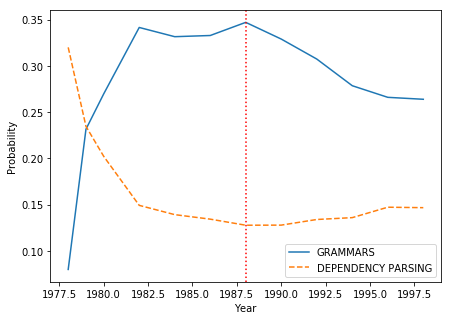

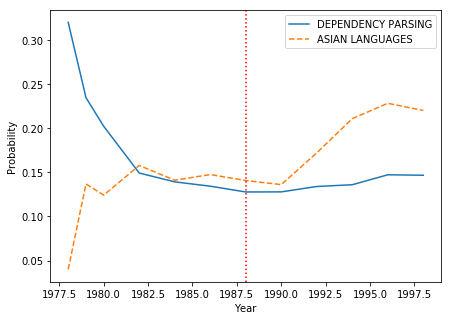

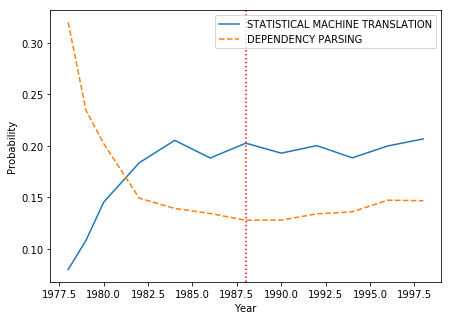

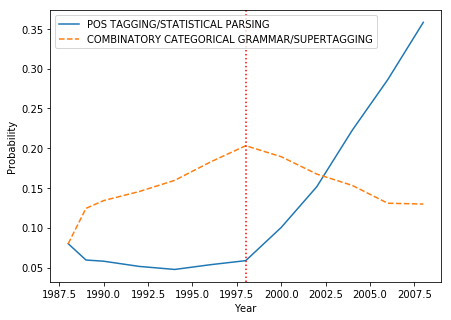

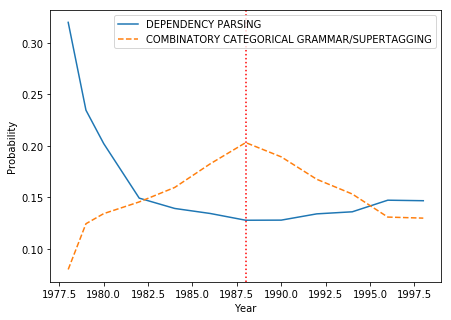

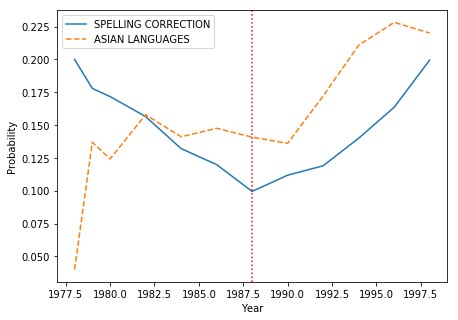

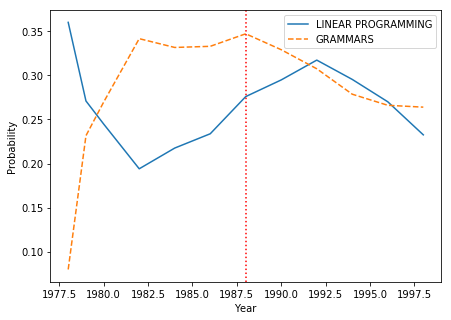

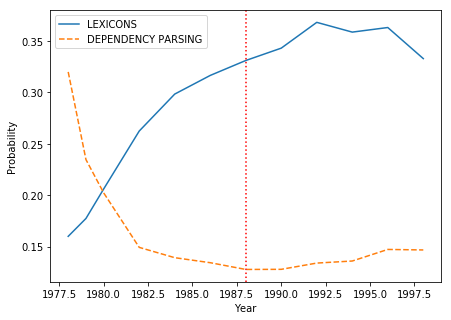

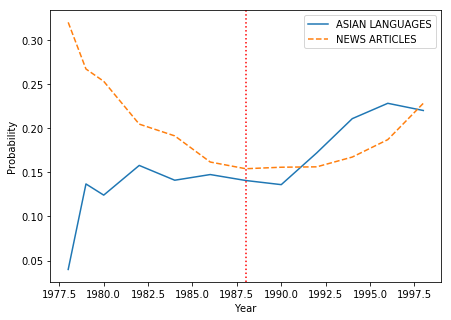

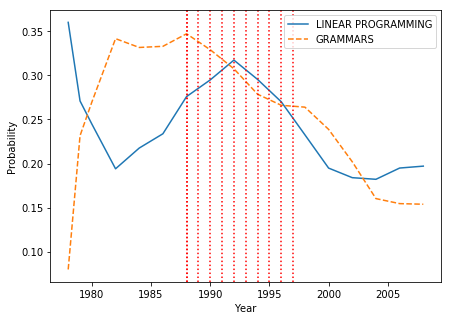

In [115]:
friends_to_tryst = [c for c in all_rel_changes if (c['type1']=='friends' and c['type2'] =='tryst')
                    or (c['type2']=='friendship' and c['type1'] =='tryst')
                   if range_probs[c['r1']][c['pair'][0]]>freq_thresh and range_probs[c['r1']][c['pair'][1]]>freq_thresh
                   and range_probs[c['r2']][c['pair'][0]]>freq_thresh and range_probs[c['r2']][c['pair'][1]]>freq_thresh]
# ^^ excluding pairs where one of the topics is rare in the time range
sorted_friends_to_tryst = sorted(friends_to_tryst, key = lambda c:
#                         strengths_per_range[c['r1']][c['pair']]['score']+strengths_per_range[c['r2']][c['pair']]['score'],
                        abs(corrs_per_range[c['r1']][c['pair']]['score']-corrs_per_range[c['r2']][c['pair']]['score']), 
                                 reverse=True)

for rc in sorted_friends_to_tryst[:10]:
    print(corrs_per_range[rc['r1']][rc['pair']]['score'], corrs_per_range[rc['r2']][rc['pair']]['score'])
    plot_rel_change(rc)

0.0034862385321100917 tryst 0.0003515276652272534 head to head
0.0021981600586176014 tryst 0.0003509504291754327 head to head
0.0018743217914570386 tryst 0.00010603749657252537 head to head
0.0019075302025615406 tryst 0.00024342824871226456 head to head
0.001829268292682927 tryst 0.00024427048733103674 head to head
0.001707067258449983 tryst 0.00016894383037666073 head to head
0.001630739438414106 tryst 0.00010656564805159463 head to head
0.0016317416695293713 tryst 0.0002195920304304446 head to head
0.0016414275124430795 tryst 0.0002743388819338186 head to head
0.0016314131413141314 tryst 0.0002691510283701173 head to head


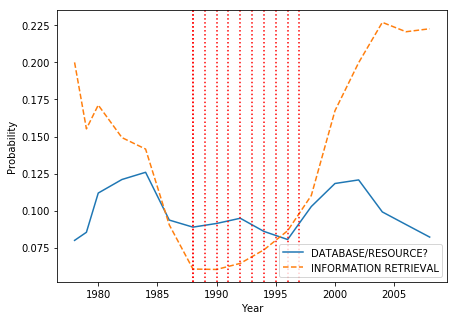

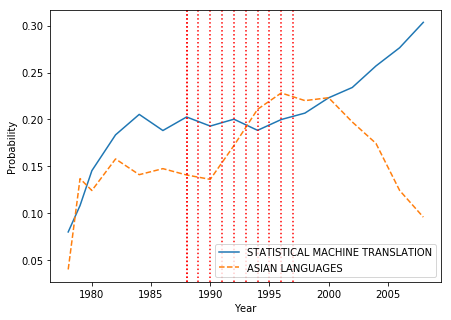

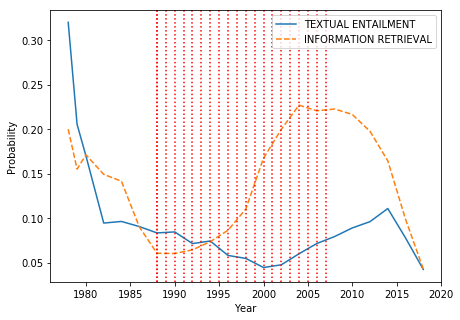

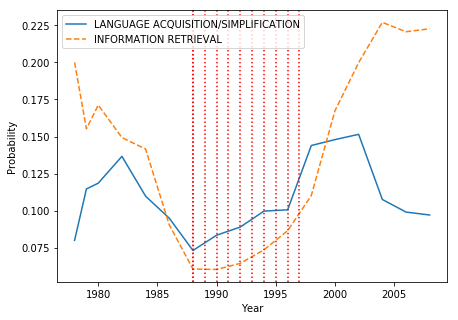

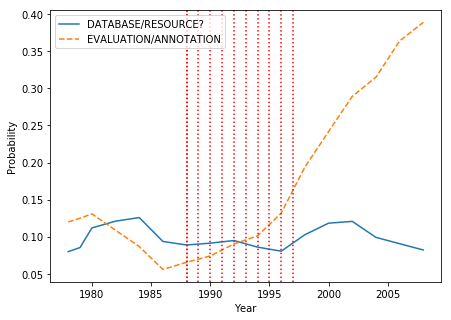

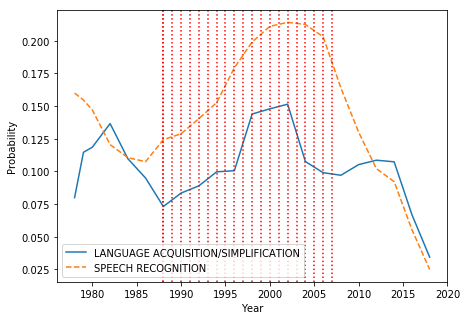

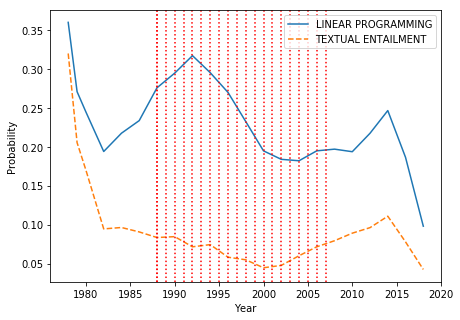

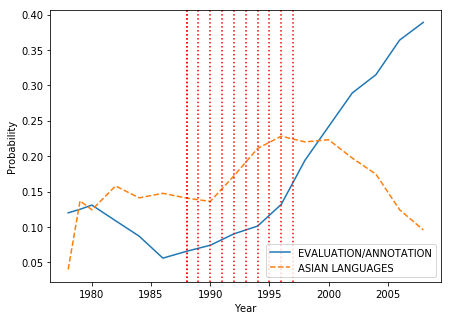

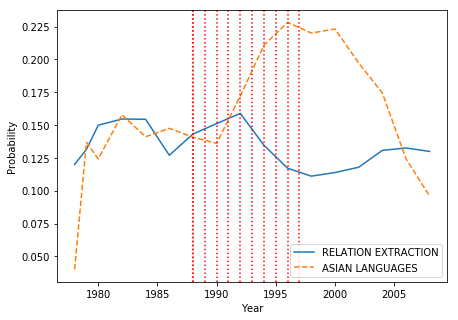

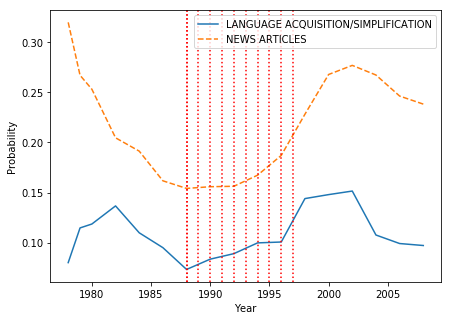

In [116]:
tryst_to_head_to_head = [c for c in all_rel_changes if ((c['type1']=='tryst' and c['type2'] =='head to head')
                         or (c['type2']=='tryst' and c['type1'] =='head to head'))
                   and range_probs[c['r1']][c['pair'][0]]>freq_thresh and range_probs[c['r1']][c['pair'][1]]>freq_thresh
                   and range_probs[c['r2']][c['pair'][0]]>freq_thresh and range_probs[c['r2']][c['pair'][1]]>freq_thresh]
# ^^ excluding pairs where one of the topics is rare in the time range
sorted_tryst_to_head_to_head = sorted(tryst_to_head_to_head, key = lambda c: abs(pmis_per_range[c['r1']][c['pair']]['score']
       -pmis_per_range[c['r2']][c['pair']]['score']), reverse=True)

for rc in sorted_tryst_to_head_to_head[:10]:
    print(pmis_per_range[rc['r1']][rc['pair']]['score'], rc['type1'],
          pmis_per_range[rc['r2']][rc['pair']]['score'], rc['type2'])
    plot_rel_change(rc)

In [117]:
[t for t in tryst_to_head_to_head if t['r2']==(2008,2018)]

[{'pair': (5, 24),
  'r1': (1978, 1988),
  'r2': (2008, 2018),
  'rel1': {'names': ['TREES', 'TEXTUAL ENTAILMENT'],
   'score': 0.18114411330894364},
  'rel2': {'names': ['TREES', 'TEXTUAL ENTAILMENT'],
   'score': 0.00980905943655009},
  'type1': 'tryst',
  'type2': 'head to head'},
 {'pair': (24, 73),
  'r1': (1978, 1988),
  'r2': (2008, 2018),
  'rel1': {'names': ['TEXTUAL ENTAILMENT',
    'QUANTITATIVE ANALYSIS/TEXT MINING'],
   'score': 0.2930521470787683},
  'rel2': {'names': ['TEXTUAL ENTAILMENT',
    'QUANTITATIVE ANALYSIS/TEXT MINING'],
   'score': 0.09168916760664031},
  'type1': 'tryst',
  'type2': 'head to head'},
 {'pair': (57, 60),
  'r1': (1978, 1988),
  'r2': (2008, 2018),
  'rel1': {'names': ['QUESTION ANSWERING', 'GRAMMARS'],
   'score': 0.2299243881346047},
  'rel2': {'names': ['QUESTION ANSWERING', 'GRAMMARS'],
   'score': 0.49803468597716444},
  'type1': 'tryst',
  'type2': 'head to head'},
 {'pair': (20, 89),
  'r1': (1978, 1988),
  'r2': (2008, 2018),
  'rel1': {

0.00270184361093452 0.00016539843750817832
0.0027570093457943926 0.000347965273065748
0.0022172949002217295 0.0001288410291793249
0.002257799671592775 0.0001718990443788325
0.002269955278493021 0.000184299661287109
0.0021796759941089838 9.449407009783064e-05
0.0022447784501268787 0.00016682020030234316
0.0022618810896798567 0.00018820710203475735
0.002260365896729533 0.00022848958155713945
0.0021796759941089838 0.000281540856546653


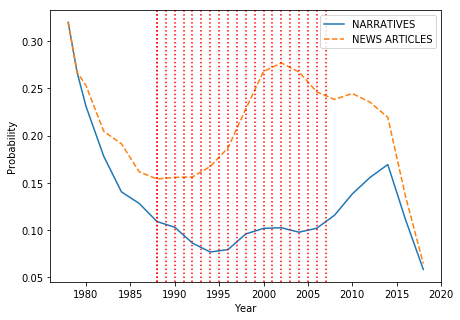

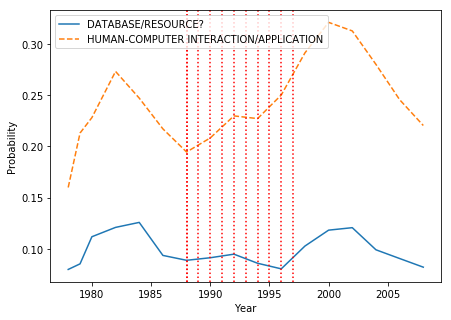

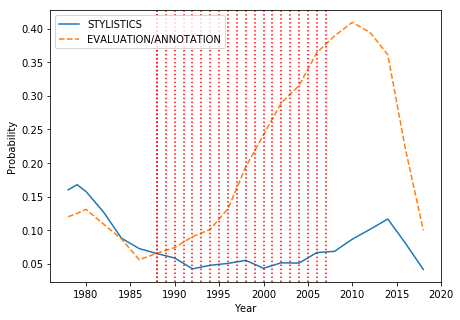

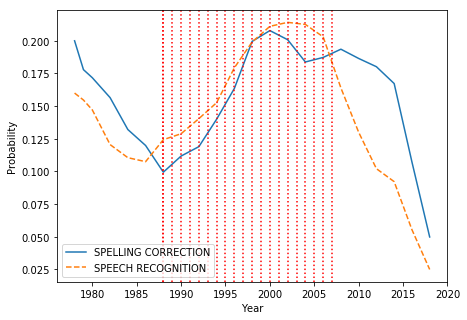

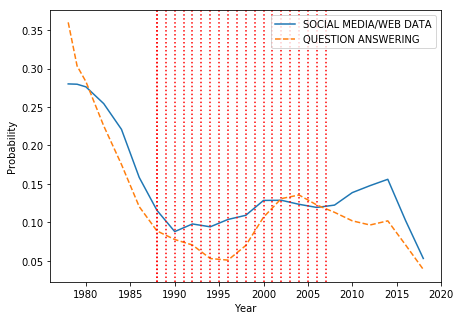

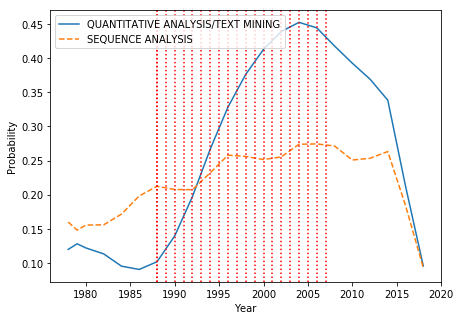

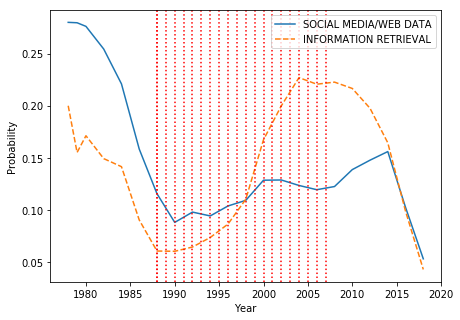

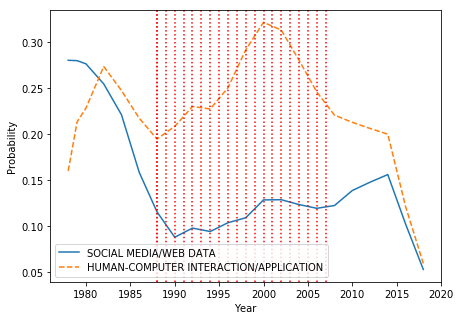

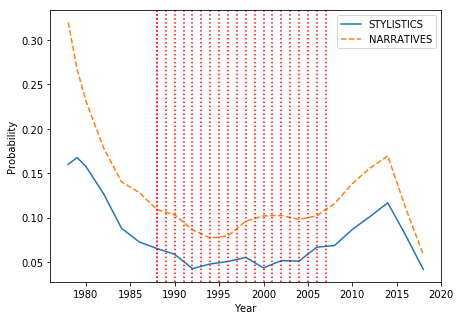

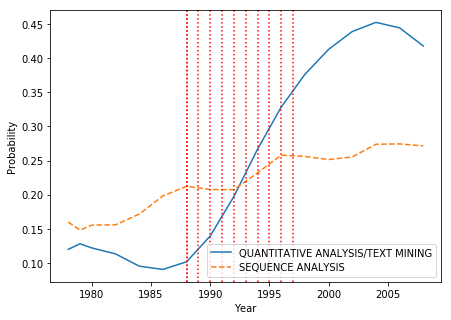

In [118]:
friends_to_arms_race = [c for c in all_rel_changes if ((c['type1']=='friends' and c['type2'] =='arms race') or
                        (c['type2']=='friendship' and c['type1'] =='arms race'))
                   and range_probs[c['r1']][c['pair'][0]]>freq_thresh and range_probs[c['r1']][c['pair'][1]]>freq_thresh
                   and range_probs[c['r2']][c['pair'][0]]>freq_thresh and range_probs[c['r2']][c['pair'][1]]>freq_thresh]
# ^^ excluding pairs where one of the topics is rare in the time range
sorted_friends_to_arms_race = sorted(friends_to_arms_race, key = lambda c: abs(pmis_per_range[c['r1']][c['pair']]['score']
       -pmis_per_range[c['r2']][c['pair']]['score']), reverse=True)

for rc in sorted_friends_to_arms_race[:10]:
    plot_rel_change(rc)
    print(pmis_per_range[rc['r1']][rc['pair']]['score'], pmis_per_range[rc['r2']][rc['pair']]['score'])

0.9723661452627194 0.6564062994290133
0.9583981733831151 0.6705363962561045
0.9730419578797597 0.7076424642342334
0.9410251123177515 0.6813494000814283
0.9762197116450013 0.7223962583984023
0.9755107193640484 0.7352222578244388
0.9409433670610375 0.7030762836893495
0.9910959089578761 0.7661117853884125
0.9968109816436416 0.783963645795037
0.9634573825739926 0.7513453846828176


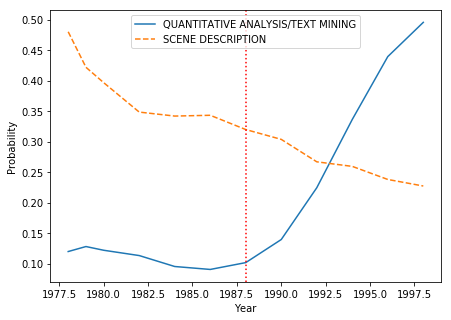

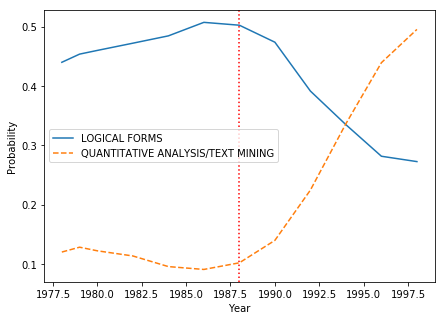

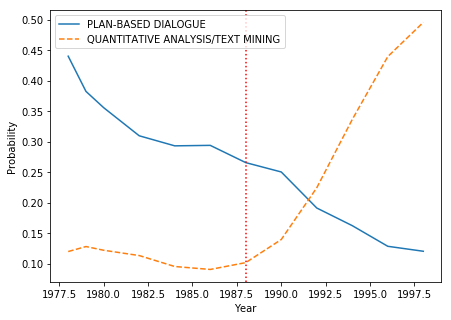

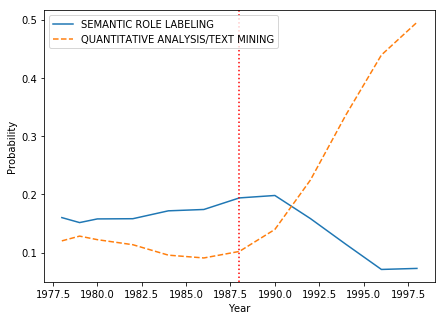

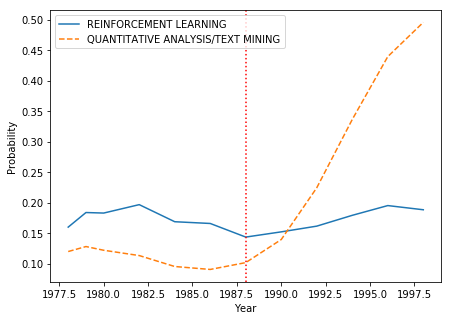

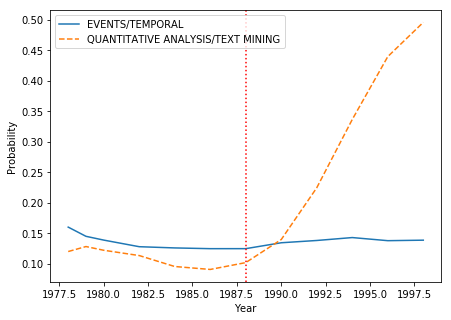

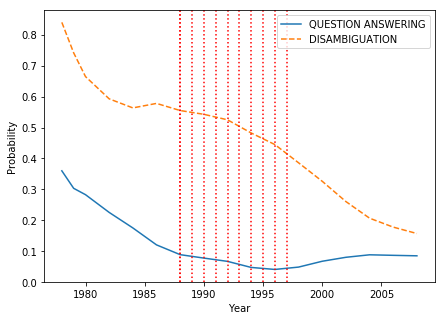

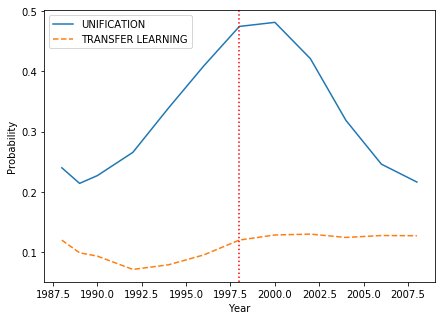

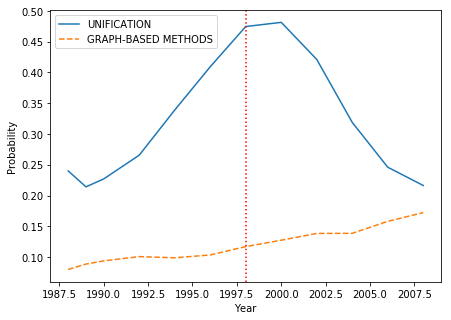

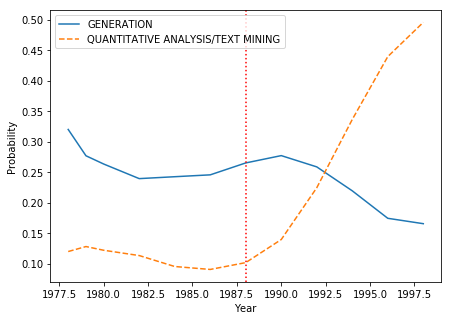

In [563]:
friends_to_head_to_head = [c for c in all_rel_changes if ((c['type1']=='friends' and c['type2'] =='head to head')
                           or (c['type2']=='friendship' and c['type1'] =='head to head'))
                   and range_probs[c['r1']][c['pair'][0]]>freq_thresh and range_probs[c['r1']][c['pair'][1]]>freq_thresh
                   and range_probs[c['r2']][c['pair'][0]]>freq_thresh and range_probs[c['r2']][c['pair'][1]]>freq_thresh]
# ^^ excluding pairs where one of the topics is rare in the time range
sorted_friends_to_head_to_head = sorted(friends_to_head_to_head, key = lambda c: abs(corrs_per_range[c['r1']][c['pair']]['score']
       -corrs_per_range[c['r2']][c['pair']]['score']), reverse=True)

for rc in sorted_friends_to_head_to_head[:10]:
    print(corrs_per_range[rc['r1']][rc['pair']]['score'], corrs_per_range[rc['r2']][rc['pair']]['score'])
    plot_rel_change(rc)

0.5297937755290226 0.9700196783901054
0.5352345356242582 0.9625608264225504
0.5551160358335667 0.9713675444106596
0.554465778828737 0.9548189610729945
0.5939082340528771 0.9758943081352863
0.6143077313759957 0.9868377182941265
0.604710992164949 0.9761512402693958
0.5748980601507365 0.9277518673635351
0.5962001038414976 0.9483205586510756
0.6069775924550127 0.9586891638276097


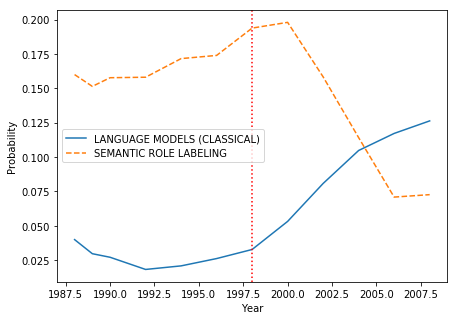

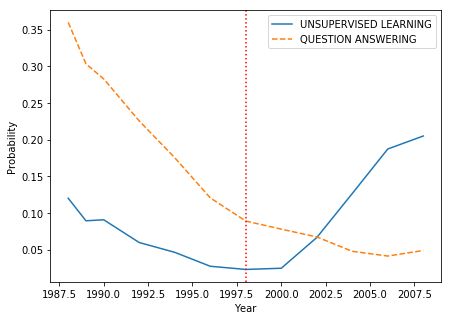

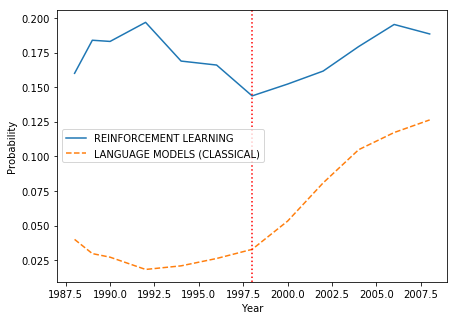

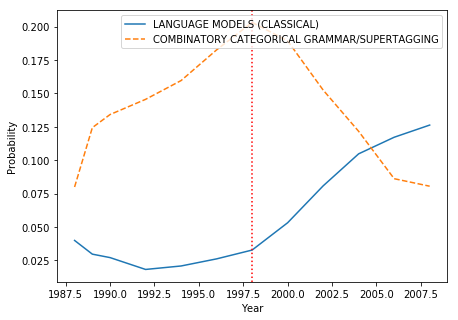

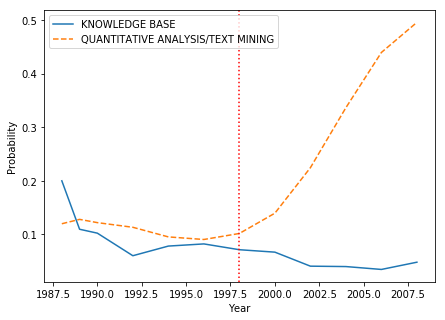

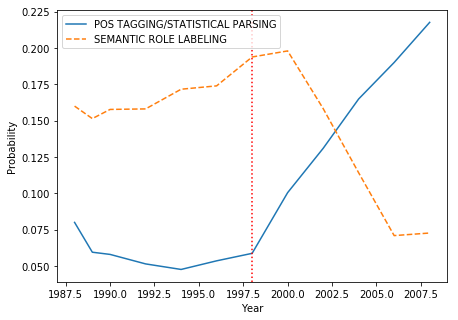

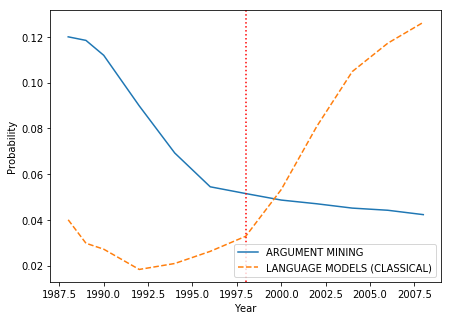

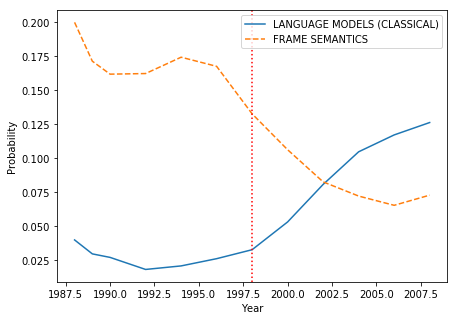

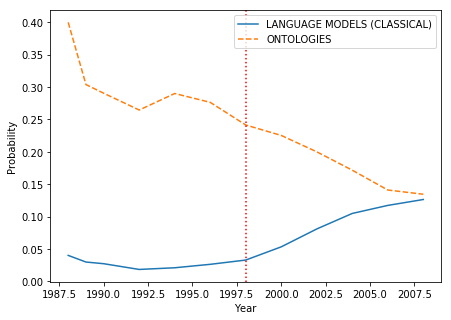

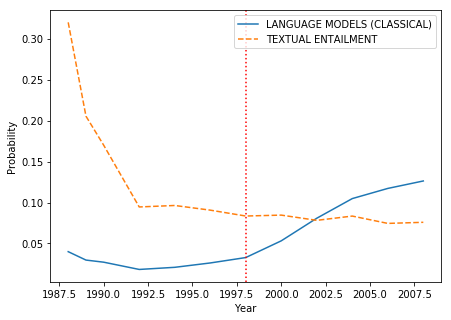

In [562]:
head_to_head_to_arms_race = [c for c in all_rel_changes if ((c['type1']=='head to head' and c['type2'] =='arms race')
                             or (c['type2']=='arms_race' and c['type1'] =='head to head'))
                   and range_probs[c['r1']][c['pair'][0]]>0.2 and range_probs[c['r1']][c['pair'][1]]>0.2
                   and range_probs[c['r2']][c['pair'][0]]>0.2 and range_probs[c['r2']][c['pair'][1]]>0.2]
# ^^ excluding pairs where one of the topics is rare in the time range
sorted_head_to_head_to_arms_race = sorted(head_to_head_to_arms_race, key = lambda c: abs(corrs_per_range[c['r1']][c['pair']]['score']
       -corrs_per_range[c['r2']][c['pair']]['score']), reverse=True)

for rc in sorted_head_to_head_to_arms_race[:10]:
    print(corrs_per_range[rc['r1']][rc['pair']]['score'], corrs_per_range[rc['r2']][rc['pair']]['score'])
    plot_rel_change(rc)

In [569]:
[c for c in all_rel_changes]

[{'pair': (29, 50),
  'r1': (1978, 1988),
  'r2': (1998, 2008),
  'rel1': {'names': ['DATABASE/RESOURCE?', 'LEXICONS'],
   'score': 0.2222257202006677},
  'rel2': {'names': ['DATABASE/RESOURCE?', 'LEXICONS'],
   'score': 0.22025023735342614},
  'type1': 'friends',
  'type2': 'arms race'},
 {'pair': (59, 78),
  'r1': (1978, 1988),
  'r2': (1988, 1998),
  'rel1': {'names': ['EVENT EXTRACTION', 'NEURAL MACHINE TRANSLATION'],
   'score': 2.493903208656988},
  'rel2': {'names': ['EVENT EXTRACTION', 'NEURAL MACHINE TRANSLATION'],
   'score': 0.025612390145505762},
  'type1': 'friends',
  'type2': 'tryst'},
 {'pair': (59, 78),
  'r1': (1978, 1988),
  'r2': (1998, 2008),
  'rel1': {'names': ['EVENT EXTRACTION', 'NEURAL MACHINE TRANSLATION'],
   'score': 2.493903208656988},
  'rel2': {'names': ['EVENT EXTRACTION', 'NEURAL MACHINE TRANSLATION'],
   'score': 0.24564991662791053},
  'type1': 'friends',
  'type2': 'head to head'},
 {'pair': (4, 36),
  'r1': (1978, 1988),
  'r2': (1988, 1998),
  're

In [343]:
sum(_probs_for_topic(20, df, range(1978,1983)))

0.4704395604395604

## Conference divergence

In [269]:
texts_topics_df_uniq = texts_topics_df_all.drop_duplicates(['Dominant_Topic', 'Document'])

def documents_per_year_for_confs(df, conferences):
    return df[df['Conference'].isin(conferences)].groupby([
        'Title'], as_index=False).first().groupby('Year').count()[['Document']].to_dict()['Document']
        

def _topic_distribution(df, conferences, year, documents_per_year=None, shift=None, topics=None):
    # count documents per year
    if not documents_per_year:
        documents_per_year = documents_per_year_for_confs(df, conferences)
    freq = documents_per_year.get(year,0)
    if topics:
        df = df[df['Dominant_Topic'].isin(topics)]
    topics_for_conf = df[df['Conference'].isin(conferences)][
        df['Year']==year].groupby('Dominant_Topic').count()
    topics_for_conf['Probability'] = topics_for_conf['Document']/freq
    topics_for_conf = topics_for_conf.reindex(range(0,100), fill_value=0)
    if shift:
        topics_for_conf = topics_for_conf.shift(shift, fill_value=topics_for_conf.Probability.values[0])
#     [topics_for_conf['Year']==2006]['Probability'])
#     topics_for_conf = topics_for_conf[topics_for_conf['Year']==year].groupby(['Dominant_Topic'], as_index=False).sum()
    return topics_for_conf.Probability.values
    
from scipy.spatial.distance import jensenshannon

def conf_divergences(df, confs1=['ACL', 'COLING', 'NAACL', 'EMNLP'], confs2=['NIPS'], years=range(1992,2018,2),
                    shift=None, topics=None):
    documents_per_year1 = documents_per_year_for_confs(df, confs1)
    documents_per_year2 = documents_per_year_for_confs(df, confs2)
    divergences = []
    common_years = [1984, 1998, 2006]
    prevdiv = 0
    for year in years:
        probs1 = _topic_distribution(df, confs1, year, documents_per_year1, shift, topics)
        probs2 = _topic_distribution(df, confs2, year, documents_per_year2, topics=topics)

        if year in common_years:
            if confs1 == ['COLING'] and confs2 != ['ACL']:
                probs1 = _topic_distribution(df, ['ACL', 'COLING'], year, shift=shift, topics=topics)
            if confs2 == ['COLING'] and confs2 != ['ACL']:
                probs2 = _topic_distribution(df, ['ACL', 'COLING'], year, shift=shift, topics=topics)
            
        # otherwise EMNLP and COLING will skip 2006 - when EMNLP started, and COLING skipped
#         if year == 2006:
#             if confs1 == ['COLING'] and :
#                 probs1 = _topic_distribution(df, ['ACL', 'COLING'], year, shift=shift, topics=topics)
            
        # hack
        div = jensenshannon(probs1, probs2)
        print(year, div)
        if not np.isnan(div):
            divergences.append(div)
        else:
            divergences.append(prevdiv)
        prevdiv=div

    return divergences

In [270]:
documents_per_year_for_confs(texts_topics_df_uniq, ['COLING'])


{1964: 18,
 1966: 24,
 1968: 113,
 1972: 37,
 1980: 84,
 1982: 119,
 1986: 143,
 1988: 151,
 1990: 195,
 1992: 199,
 1994: 197,
 1996: 215,
 1998: 246,
 2000: 116,
 2002: 141,
 2004: 181,
 2008: 196,
 2010: 348,
 2012: 398,
 2014: 254,
 2016: 409,
 2018: 373}

In [271]:
from matplotlib.ticker import MaxNLocator

def plot_divergences(df, confsl1, confsl2, years, ylabel, label1=None, smooth=3, size=(7,5)):
    styles = ['-', '--', '-.', ':']
    cnt = 0
    ax = plt.figure(figsize=size).gca()
    if not confsl2:
        same2 = True
    else:
        same2 = False
    for i, confs1 in enumerate(confsl1):
        if same2:
            confsl2 = confsl1[i+1:]
        for confs2 in confsl2:
            divergences = conf_divergences(df, confs1, confs2, years)
            print(confs1, confs2, 
                  divergences)
            df_plt = pd.DataFrame({'years': years, 'divergences': divergences}).rolling(smooth).mean()
            if not label1:
                conf1label = " ".join(confs1)
            else:
                conf1label = label1
            plt.plot([int(y) for y in years], df_plt['divergences'], styles[cnt%len(styles)],
                     label="-".join([conf1label, ",".join(confs2)]))
            ax.xaxis.set_major_locator(MaxNLocator(integer=True))
            cnt += 1
    plt.legend()
    plt.ylabel(ylabel)

/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1293: RuntimeWarning: invalid value encountered in true_divide
  p = p / np.sum(p, axis=0)
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1293: RuntimeWarning: invalid value encountered in true_divide
  p 

1996 nan
1998 nan
2000 nan
2002 nan
2004 nan
2006 0.35593407263151333


/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1293: RuntimeWarning: invalid value encountered in true_divide
  p = p / np.sum(p, axis=0)
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1293: RuntimeWarning: invalid value encountered in true_divide
  p = p / np.sum(p, axis=0)
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  ap

2008 0.3237532612852597
2010 0.3282187268852625
2012 0.3113375428167273
2014 0.3055778165003962
2016 0.29639392232479833
['EMNLP'] ['NIPS'] [0, nan, nan, nan, nan, 0.35593407263151333, 0.3237532612852597, 0.3282187268852625, 0.3113375428167273, 0.3055778165003962, 0.29639392232479833]


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to m

1996 0.3631959248012972
1998 0.38162253590756
2000 0.35409302555926747
2002 0.34950558399190534
2004 0.33280043427432293
2006 0.34295858946478985


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to m

2008 0.3247220526791698
2010 0.3323868652680976
2012 0.33261301846983726
2014 0.3224209915514104
2016 0.30718140045644166
['ACL'] ['NIPS'] [0.3631959248012972, 0.38162253590756, 0.35409302555926747, 0.34950558399190534, 0.33280043427432293, 0.34295858946478985, 0.3247220526791698, 0.3323868652680976, 0.33261301846983726, 0.3224209915514104, 0.30718140045644166]


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1293: RuntimeWarning: invalid value encountered in true_divide
  p = p / np.sum(p, axis=0)
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFram

1996 nan
1998 nan
2000 0.3492419400181728
2002 0.3493658532555091
2004 0.34182060013189225
2006 0.3236831445198825
2008 0.314321426973313


/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1293: RuntimeWarning: invalid value encountered in true_divide
  p = p / np.sum(p, axis=0)
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFram

2010 0.3416575968210621
2012 0.3333008716157856
2014 0.3295194836851326
2016 0.3154025616189788
['NAACL'] ['NIPS'] [0, nan, 0.3492419400181728, 0.3493658532555091, 0.34182060013189225, 0.3236831445198825, 0.314321426973313, 0.3416575968210621, 0.3333008716157856, 0.3295194836851326, 0.3154025616189788]


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to m

1996 0.3980279819889159


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to m

1998 0.3822689809385895
2000 0.3831309888481513
2002 0.3766444405024717
2004 0.3642969964343926


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to m

2006 0.34295858946478985
2008 0.3521129445479214
2010 0.3614082131498703
2012 0.365063669136609
2014 0.35533342505617777
2016 0.34016769460980306
['COLING'] ['NIPS'] [0.3980279819889159, 0.3822689809385895, 0.3831309888481513, 0.3766444405024717, 0.3642969964343926, 0.34295858946478985, 0.3521129445479214, 0.3614082131498703, 0.365063669136609, 0.35533342505617777, 0.34016769460980306]


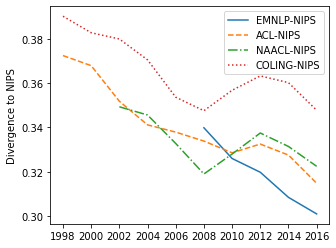

In [272]:
plot_divergences(df=texts_topics_df_uniq, confsl1=[['EMNLP'], ['ACL'], ['NAACL'], ['COLING']], 
                 confsl2=[['NIPS']], years=range(1996, 2018, 2),
                ylabel='Divergence to NIPS', smooth=2, size=(5,4))

/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


1996 0.05248043288857174
1998 0.0


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to m

2000 0.08285484519593303
2002 0.07664566765132826
2004 0.07089436489272756


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


2006 0.03864840513064313
2008 0.07795205383499199
2010 0.06491502740172679
2012 0.0732644170702988


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to m

2014 0.08520282183943848
2016 0.07721725226226368
['ACL', 'EMNLP', 'COLING', 'NAACL'] ['COLING'] [0.05248043288857174, 0.0, 0.08285484519593303, 0.07664566765132826, 0.07089436489272756, 0.03864840513064313, 0.07795205383499199, 0.06491502740172679, 0.0732644170702988, 0.08520282183943848, 0.07721725226226368]


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1294: RuntimeWarning: invalid value encountered in true_divide
  q = q / np.sum(q, axis=0)
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFram

1996 nan
1998 nan
2000 nan
2002 nan
2004 nan


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1294: RuntimeWarning: invalid value encountered in true_divide
  q = q / np.sum(q, axis=0)
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFram

2006 0.11697714008380798
2008 0.06250076821243773
2010 0.07346234211537674


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


2012 0.07471735288617012
2014 0.04483484123549262
2016 0.05492847235535022
['ACL', 'EMNLP', 'COLING', 'NAACL'] ['EMNLP'] [0, nan, nan, nan, nan, 0.11697714008380798, 0.06250076821243773, 0.07346234211537674, 0.07471735288617012, 0.04483484123549262, 0.05492847235535022]


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to m

1996 0.0734951771439551
1998 0.01375804965917685
2000 0.06298670291914317
2002 0.07065070627428638


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to m

2004 0.0467540242966891
2006 0.03864840513064313
2008 0.027839679855011675
2010 0.02977633262589362


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to m

2012 0.030922263621482645
2014 0.021793319738582378
2016 0.023131781469784365
['ACL', 'EMNLP', 'COLING', 'NAACL'] ['ACL'] [0.0734951771439551, 0.01375804965917685, 0.06298670291914317, 0.07065070627428638, 0.0467540242966891, 0.03864840513064313, 0.027839679855011675, 0.02977633262589362, 0.030922263621482645, 0.021793319738582378, 0.023131781469784365]


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1294: RuntimeWarning: invalid value encountered in true_divide
  q = q / np.sum(q, axis=0)
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1294: RuntimeWarning: invalid value encountered in true_divide
  q 

1996 nan
1998 nan
2000 0.06890852333815918
2002 0.11100607936600114
2004 0.11484846481470701


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to m

2006 0.08006936138629937
2008 0.0709406805677945
2010 0.07525148883230828


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to m

2012 0.07184919306739909
2014 0.047527636761266756
2016 0.061992834348267585
['ACL', 'EMNLP', 'COLING', 'NAACL'] ['NAACL'] [0, nan, 0.06890852333815918, 0.11100607936600114, 0.11484846481470701, 0.08006936138629937, 0.0709406805677945, 0.07525148883230828, 0.07184919306739909, 0.047527636761266756, 0.061992834348267585]


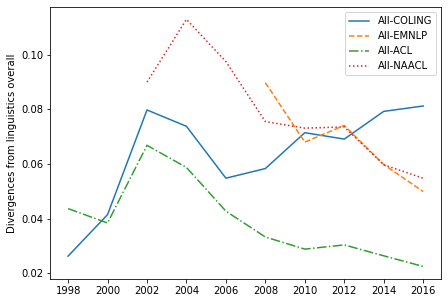

In [273]:
years = range(1996, 2018, 2)
plot_divergences(texts_topics_df_uniq, [['ACL', 'EMNLP', 'COLING', 'NAACL']],
                 [['COLING'], ['EMNLP'], ['ACL'], ['NAACL']], years,
                 'Divergences from linguistics overall', 'All', smooth=2)


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1293: RuntimeWarning: invalid value encountered in true_divide
  p = p / np.sum(p, axis=0)
/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1294: RuntimeWarning: invalid value encountered in true_divide
  q = q / np.sum(q, axis=0)
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  ap

1978 nan
1980 nan
1982 nan


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1294: RuntimeWarning: invalid value encountered in true_divide
  q = q / np.sum(q, axis=0)
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1294: RuntimeWarning: invalid value encountered in true_divide
  q = q / np.sum(q, axis=0)
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  ap

1984 nan
1986 nan
1988 nan
1990 nan
1992 nan
1994 nan
1996 nan


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1294: RuntimeWarning: invalid value encountered in true_divide
  q = q / np.sum(q, axis=0)
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1294: RuntimeWarning: invalid value encountered in true_divide
  q 

1998 nan
2000 nan
2002 nan
2004 nan


/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1294: RuntimeWarning: invalid value encountered in true_divide
  q = q / np.sum(q, axis=0)
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1294: RuntimeWarning: invalid value encountered in true_divide
  q = q / np.sum(q, axis=0)
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  ap

2006 0.12652086595889933
2008 0.11957413872607571
2010 0.11259453526651833
2012 0.12954907491688158
2014 0.12114727416845143
2016 0.12606566720420678
['COLING'] ['EMNLP'] [0, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, 0.12652086595889933, 0.11957413872607571, 0.11259453526651833, 0.12954907491688158, 0.12114727416845143, 0.12606566720420678]


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to m

1978 nan
1980 0.22547631845952468
1982 0.16319499167273868
1984 nan
1986 0.14367138942196092


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to m

1988 0.1621994382798578
1990 0.1596241910689791
1992 0.14346193689895678
1994 0.15797910920821448
1996 0.12517296414763388
1998 0.03352896007726629


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to m

2000 0.12621364004736937
2002 0.1280435297777848
2004 0.10380579826735768
2006 nan
2008 0.08782023628203084
2010 0.08604118451060053


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to m

2012 0.08711333312848121
2014 0.09491920077866675
2016 0.08950961352243367
['COLING'] ['ACL'] [0, 0.22547631845952468, 0.16319499167273868, 0.16319499167273868, 0.14367138942196092, 0.1621994382798578, 0.1596241910689791, 0.14346193689895678, 0.15797910920821448, 0.12517296414763388, 0.03352896007726629, 0.12621364004736937, 0.1280435297777848, 0.10380579826735768, 0.10380579826735768, 0.08782023628203084, 0.08604118451060053, 0.08711333312848121, 0.09491920077866675, 0.08950961352243367]
1978 nan
1980 nan


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1293: RuntimeWarning: invalid value encountered in true_divide
  p = p / np.sum(p, axis=0)
/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1294: RuntimeWarning: invalid value encountered in true_divide
  q = q / np.sum(q, axis=0)
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  ap

1982 nan
1984 nan
1986 nan


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1294: RuntimeWarning: invalid value encountered in true_divide
  q = q / np.sum(q, axis=0)
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1294: RuntimeWarning: invalid value encountered in true_divide
  q = q / np.sum(q, axis=0)
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  ap

1988 nan
1990 nan
1992 nan
1994 nan
1996 nan


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1294: RuntimeWarning: invalid value encountered in true_divide
  q = q / np.sum(q, axis=0)
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFram

1998 nan
2000 0.14050077662078642
2002 0.16550531376808467
2004 0.16146542494288782


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to m

2006 0.11313566652727343
2008 0.1240568052907315
2010 0.11835479922912645
2012 0.11983360784332792
2014 0.09142151078368277
2016 0.08928074372251592
['COLING'] ['NAACL'] [0, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, 0.14050077662078642, 0.16550531376808467, 0.16146542494288782, 0.11313566652727343, 0.1240568052907315, 0.11835479922912645, 0.11983360784332792, 0.09142151078368277, 0.08928074372251592]


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1293: RuntimeWarning: invalid value encountered in true_divide
  p = p / np.sum(p, axis=0)
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1293: RuntimeWarning: invalid value encountered in true_divide
  p 

1978 nan
1980 nan
1982 nan
1984 nan
1986 nan
1988 nan
1990 nan


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1293: RuntimeWarning: invalid value encountered in true_divide
  p = p / np.sum(p, axis=0)
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1293: RuntimeWarning: invalid value encountered in true_divide
  p = p / np.sum(p, axis=0)
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  ap

1992 nan
1994 nan
1996 nan
1998 nan
2000 nan
2002 nan
2004 nan


/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1293: RuntimeWarning: invalid value encountered in true_divide
  p = p / np.sum(p, axis=0)
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1293: RuntimeWarning: invalid value encountered in true_divide
  p = p / np.sum(p, axis=0)
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  ap

2006 0.12652086595889933
2008 0.07851236495453544
2010 0.08818638648759188
2012 0.08101294286658138
2014 0.05364448421305673
2016 0.05888564445604392
['EMNLP'] ['ACL'] [0, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, 0.12652086595889933, 0.07851236495453544, 0.08818638648759188, 0.08101294286658138, 0.05364448421305673, 0.05888564445604392]


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1293: RuntimeWarning: invalid value encountered in tru

1978 nan
1980 nan
1982 nan
1984 nan
1986 nan
1988 nan
1990 nan
1992 nan


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1293: RuntimeWarning: invalid value encountered in true_divide
  p = p / np.sum(p, axis=0)
/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1294: RuntimeWarning: invalid value encountered in true_divide
  q = q / np.sum(q, axis=0)
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1293: RuntimeWarning: invalid value encountered in true_divide
  p = p / np.sum(

1994 nan
1996 nan
1998 nan
2000 nan
2002 nan
2004 nan
2006 0.169157246781511
2008 0.10539266622484504


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1293: RuntimeWarning: invalid value encountered in true_divide
  p = p / np.sum(p, axis=0)
/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1294: RuntimeWarning: invalid value encountered in true_divide
  q = q / np.sum(q, axis=0)
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1293: RuntimeWarning: invalid value encountered in true_divide
  p = p / np.sum(

2010 0.11946098222179544
2012 0.11794283226639714
2014 0.0778240860189609
2016 0.09865832408614517
['EMNLP'] ['NAACL'] [0, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, 0.169157246781511, 0.10539266622484504, 0.11946098222179544, 0.11794283226639714, 0.0778240860189609, 0.09865832408614517]


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to m

1978 nan
1980 nan
1982 nan
1984 nan
1986 nan
1988 nan
1990 nan


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1294: RuntimeWarning: invalid value encountered in true_divide
  q = q / np.sum(q, axis=0)
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1294: RuntimeWarning: invalid value encountered in true_divide
  q = q / np.sum(q, axis=0)
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  ap

1992 nan
1994 nan
1996 nan
1998 nan
2000 0.10055502049332109
2002 0.15163568029487184
2004 0.1404387214783954


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1294: RuntimeWarning: invalid value encountered in true_divide
  q = q / np.sum(q, axis=0)
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1294: RuntimeWarning: invalid value encountered in true_divide
  q 

2006 0.11313566652727343
2008 0.08104724765858255
2010 0.07707224458860404
2012 0.08861530209920508
2014 0.05676296136528502
2016 0.07287361272137101
['ACL'] ['NAACL'] [0, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, 0.10055502049332109, 0.15163568029487184, 0.1404387214783954, 0.11313566652727343, 0.08104724765858255, 0.07707224458860404, 0.08861530209920508, 0.05676296136528502, 0.07287361272137101]


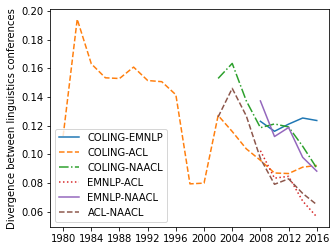

In [274]:
years = range(1978, 2018, 2)
plot_divergences(texts_topics_df_uniq,confsl1=[['COLING'], ['EMNLP'], ['ACL'], ['NAACL']],
                 confsl2=None,
                years=years, ylabel='Divergence between linguistics conferences', smooth=2, size=(5,4))


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1294: RuntimeWarning: invalid value encountered in true_divide
  q = q / np.sum(q, axis=0)
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


1988 nan
1990 nan


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1294: RuntimeWarning: invalid value encountered in true_divide
  q = q / np.sum(q, axis=0)
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1294: RuntimeWarning: invalid value encountered in true_divide
  q = q / np.sum(q, axis=0)


1992 nan
1994 0.5085622321912111


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to m

1996 0.5052934656650682
1998 0.5037714350913836


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


2000 0.49180520745888184
2002 0.48568580489151286


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


2004 0.49882946340693185
2006 0.5005801876252898


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to m

2008 0.5071699874038411
2010 0.513734780761005


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


2012 0.5186345548143155
2014 0.5159281814356733


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


2016 0.5132915231559947
-10 nan


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1294: RuntimeWarning: invalid value encountered in true_divide
  q = q / np.sum(q, axis=0)
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


1988 nan
1990 nan


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1294: RuntimeWarning: invalid value encountered in true_divide
  q = q / np.sum(q, axis=0)
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1294: RuntimeWarning: invalid value encountered in true_divide
  q = q / np.sum(q, axis=0)


1992 nan
1994 0.548669208609343


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to m

1996 0.5468091640399588
1998 0.541928393992789


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


2000 0.5207863574198882
2002 0.5133901605720889


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


2004 0.5105077196488359
2006 0.5123090239537194


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to m

2008 0.5062714649409843
2010 0.5070248675937081


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


2012 0.5094455097989533
2014 0.5048909015606148


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


2016 0.49417567334011825
-9 nan


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1294: RuntimeWarning: invalid value encountered in true_divide
  q = q / np.sum(q, axis=0)
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


1988 nan
1990 nan


/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1294: RuntimeWarning: invalid value encountered in true_divide
  q = q / np.sum(q, axis=0)
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1294: RuntimeWarning: invalid value encountered in true_divide
  q = q / np.sum(q, axis=0)


1992 nan
1994 0.5260692232682963


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


1996 0.5188730882179706
1998 0.5261559693570361


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


2000 0.5113992624342251
2002 0.5090882774947646


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to m

2004 0.5146519703585842
2006 0.5162818838995072


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


2008 0.510692615782815
2010 0.5186889337837195


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


2012 0.5155236242420401
2014 0.5131456441202603


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


2016 0.5077514274868091
-8 nan


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1294: RuntimeWarning: invalid value encountered in true_divide
  q = q / np.sum(q, axis=0)
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


1988 nan
1990 nan


/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1294: RuntimeWarning: invalid value encountered in true_divide
  q = q / np.sum(q, axis=0)
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1294: RuntimeWarning: invalid value encountered in true_divide
  q = q / np.sum(q, axis=0)
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


1992 nan
1994 0.5061579164837493


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


1996 0.5063000762550451
1998 0.5005831064903326


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to m

2000 0.48456495186127513
2002 0.4893489502380799


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


2004 0.4948927874567751
2006 0.49680418841931034


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


2008 0.5017450094085578
2010 0.5043533618338091


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to m

2012 0.5041040041343391
2014 0.5036343519756323


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


2016 0.4983604815348509
-7 nan


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1294: RuntimeWarning: invalid value encountered in true_divide
  q = q / np.sum(q, axis=0)
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


1988 nan
1990 nan


/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1294: RuntimeWarning: invalid value encountered in true_divide
  q = q / np.sum(q, axis=0)
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1294: RuntimeWarning: invalid value encountered in true_divide
  q = q / np.sum(q, axis=0)
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


1992 nan
1994 0.49194090357630166


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


1996 0.4924887803160232
1998 0.49244641055535476


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


2000 0.47826434775078275
2002 0.4858162753916463


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to m

2004 0.4867993023969383
2006 0.5034504950408702


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


2008 0.5074027559478818
2010 0.5097632526384357


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


2012 0.5110966003173762
2014 0.5126573797779923


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


2016 0.4920074122679364
-6 nan


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1294: RuntimeWarning: invalid value encountered in true_divide
  q = q / np.sum(q, axis=0)
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


1988 nan
1990 nan


/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1294: RuntimeWarning: invalid value encountered in true_divide
  q = q / np.sum(q, axis=0)
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1294: RuntimeWarning: invalid value encountered in true_divide
  q = q / np.sum(q, axis=0)
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


1992 nan
1994 0.524488526773616


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


1996 0.5292367400682076
1998 0.524528567193304


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


2000 0.5047904908731596
2002 0.4954165382561109


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to m

2004 0.5052851558168134
2006 0.5148751813210365


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


2008 0.5152407477692528
2010 0.5178913803379775


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


2012 0.5150084638905151
2014 0.5194208542313523


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


2016 0.5049700293035351
-5 nan


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1294: RuntimeWarning: invalid value encountered in true_divide
  q = q / np.sum(q, axis=0)
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


1988 nan
1990 nan


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1294: RuntimeWarning: invalid value encountered in true_divide
  q = q / np.sum(q, axis=0)
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1294: RuntimeWarning: invalid value encountered in true_divide
  q = q / np.sum(q, axis=0)


1992 nan
1994 0.5302529258227013


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to m

1996 0.5411842191436907
1998 0.5343324064224704


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


2000 0.5252368268733225
2002 0.521056225899685


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


2004 0.5193376962097151
2006 0.5255352818074928


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to m

2008 0.5274807832715783
2010 0.5290885895337534


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


2012 0.5246661494401316
2014 0.5257597664667814


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


2016 0.5287143038275183
-4 nan


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1294: RuntimeWarning: invalid value encountered in true_divide
  q = q / np.sum(q, axis=0)
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


1988 nan
1990 nan


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1294: RuntimeWarning: invalid value encountered in true_divide
  q = q / np.sum(q, axis=0)
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1294: RuntimeWarning: invalid value encountered in true_divide
  q = q / np.sum(q, axis=0)


1992 nan
1994 0.5619354498883665


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to m

1996 0.5602476206576741
1998 0.561151696350157


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


2000 0.5481566318256444
2002 0.5316443957268807


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


2004 0.5305651348762845
2006 0.5288720385882231


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to m

2008 0.5206778574956015
2010 0.5190302785043984


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


2012 0.5188655442922712
2014 0.5237878467159082


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


2016 0.5295465028520508
-3 nan


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1294: RuntimeWarning: invalid value encountered in true_divide
  q = q / np.sum(q, axis=0)
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


1988 nan
1990 nan


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1294: RuntimeWarning: invalid value encountered in true_divide
  q = q / np.sum(q, axis=0)
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1294: RuntimeWarning: invalid value encountered in true_divide
  q = q / np.sum(q, axis=0)


1992 nan
1994 0.5178917881999546


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to m

1996 0.526830567184966
1998 0.5281811600255125


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


2000 0.520302573767739
2002 0.5185874236680278


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


2004 0.5178734027519839


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


2006 0.5114613692838225
2008 0.5154291095794062


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to m

2010 0.5210576679100006
2012 0.5188696452336603


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


2014 0.5139227674973944
2016 0.5101108882222241
-2 nan


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1294: RuntimeWarning: invalid value encountered in true_divide
  q = q / np.sum(q, axis=0)
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFram

1988 nan
1990 nan


/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1294: RuntimeWarning: invalid value encountered in true_divide
  q = q / np.sum(q, axis=0)
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1294: RuntimeWarning: invalid value encountered in true_divide
  q = q / np.sum(q, axis=0)
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


1992 nan
1994 0.5293316224456913


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


1996 0.5230991928956041
1998 0.5324188027832566


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


2000 0.5126349738608142
2002 0.5144295535907325


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


2004 0.504620204451892
2006 0.5073732919399587


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


2008 0.5071177433321802
2010 0.5105173396820074


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


2012 0.5084115568234074
2014 0.5038591534525885


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


2016 0.5016380015965018
-1 nan


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1294: RuntimeWarning: invalid value encountered in true_divide
  q = q / np.sum(q, axis=0)
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1294: RuntimeWarning: invalid value encountered in true_divide
  q 

1988 nan
1990 nan


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1294: RuntimeWarning: invalid value encountered in true_divide
  q = q / np.sum(q, axis=0)
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


1992 nan
1994 0.37578150544983885


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


1996 0.3796670769626516
1998 0.3822689809385895


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


2000 0.35675343860165976
2002 0.35179198949198204


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


2004 0.3383316412466929
2006 0.3331649745080418


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


2008 0.32359977277811625
2010 0.3361765609482298


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


2012 0.331661753604013
2014 0.3204309853303668


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


2016 0.30811629202245583
0 nan


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1294: RuntimeWarning: invalid value encountered in true_divide
  q = q / np.sum(q, axis=0)
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1294: RuntimeWarning: invalid value encountered in true_divide
  q 

1988 nan
1990 nan


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1294: RuntimeWarning: invalid value encountered in true_divide
  q = q / np.sum(q, axis=0)
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


1992 nan
1994 0.5130510065812685


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


1996 0.5003633857110402
1998 0.48292639182872255


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


2000 0.47649922240026266
2002 0.4517941362640861


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


2004 0.4507241399876431
2006 0.44057549620497993


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


2008 0.4472378822045927
2010 0.44794972328545046


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


2012 0.448439344162678
2014 0.442548451234012


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


2016 0.43850287642375146
1 nan


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1294: RuntimeWarning: invalid value encountered in true_divide
  q = q / np.sum(q, axis=0)
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1294: RuntimeWarning: invalid value encountered in true_divide
  q 

1988 nan
1990 nan


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1294: RuntimeWarning: invalid value encountered in true_divide
  q = q / np.sum(q, axis=0)
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


1992 nan
1994 0.473169900810914


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


1996 0.4787889224734967
1998 0.47382524022196143


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


2000 0.4612290663924166
2002 0.44565665646493324


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


2004 0.4602247755582926
2006 0.4635653985840411


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


2008 0.4666586922339776
2010 0.4705952141534524


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


2012 0.4701945251037856
2014 0.46933394822737257


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


2016 0.4657369957422227
2 nan


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1294: RuntimeWarning: invalid value encountered in true_divide
  q = q / np.sum(q, axis=0)
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1294: RuntimeWarning: invalid value encountered in true_divide
  q 

1988 nan
1990 nan


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1294: RuntimeWarning: invalid value encountered in true_divide
  q = q / np.sum(q, axis=0)
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


1992 nan
1994 0.48694249803694006


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


1996 0.5016493825706712
1998 0.49569168236668676


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


2000 0.4796688861761236
2002 0.48029998796324125


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


2004 0.4905391732618858
2006 0.49295546587427064


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


2008 0.4980691880741229
2010 0.5038456631167534


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


2012 0.5036104653140709
2014 0.5018698947044062


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


2016 0.5041150202489689
3 nan


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1294: RuntimeWarning: invalid value encountered in true_divide
  q = q / np.sum(q, axis=0)
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1294: RuntimeWarning: invalid value encountered in true_divide
  q 

1988 nan
1990 nan


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1294: RuntimeWarning: invalid value encountered in true_divide
  q = q / np.sum(q, axis=0)
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


1992 nan
1994 0.5146494255490078


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


1996 0.5181327746336547
1998 0.5111550211902596


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


2000 0.50874152535488
2002 0.5062641146132292


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


2004 0.5077436862283006
2006 0.5110236733074842


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


2008 0.5077676458981011
2010 0.5109381862627344


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


2012 0.5138799738388853
2014 0.5143468157319487


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


2016 0.5205071076502165
4 nan


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1294: RuntimeWarning: invalid value encountered in true_divide
  q = q / np.sum(q, axis=0)
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1294: RuntimeWarning: invalid value encountered in true_divide
  q 

1988 nan
1990 nan


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1294: RuntimeWarning: invalid value encountered in true_divide
  q = q / np.sum(q, axis=0)
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


1992 nan
1994 0.4843404685997501


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


1996 0.4795793366199515
1998 0.4838026118184361


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


2000 0.4820488419239837
2002 0.4869232864121607


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


2004 0.4890561297394048
2006 0.49626978347705764


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


2008 0.494261368016768
2010 0.5046965528435002


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


2012 0.5075169721750099
2014 0.5053848542904172


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


2016 0.5023062830832018
5 nan


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1294: RuntimeWarning: invalid value encountered in true_divide
  q = q / np.sum(q, axis=0)
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1294: RuntimeWarning: invalid value encountered in true_divide
  q 

1988 nan
1990 nan


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1294: RuntimeWarning: invalid value encountered in true_divide
  q = q / np.sum(q, axis=0)
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


1992 nan
1994 0.5020317013471038


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


1996 0.49830082986005503
1998 0.4966182247762326


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


2000 0.4874538231219667
2002 0.48896812697850417


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


2004 0.4880372786133178
2006 0.4899605862702937


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


2008 0.4896437306745274
2010 0.4954524397532551


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


2012 0.496495708847259
2014 0.48677418034194203


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


2016 0.4857462983439326
6 nan


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1294: RuntimeWarning: invalid value encountered in true_divide
  q = q / np.sum(q, axis=0)
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1294: RuntimeWarning: invalid value encountered in true_divide
  q 

1988 nan
1990 nan


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1294: RuntimeWarning: invalid value encountered in true_divide
  q = q / np.sum(q, axis=0)
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


1992 nan
1994 0.49116120743917707


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


1996 0.49086215470753464
1998 0.4729711994271132


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


2000 0.46032434492609753
2002 0.45110591827058094


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


2004 0.4516961727724118
2006 0.4581211182514789


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


2008 0.45889373316813226
2010 0.4716693571585148


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


2012 0.47401025648915773
2014 0.4764842733747531


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


2016 0.480694814249896
7 nan


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1294: RuntimeWarning: invalid value encountered in true_divide
  q = q / np.sum(q, axis=0)
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


1988 nan
1990 nan


/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1294: RuntimeWarning: invalid value encountered in true_divide
  q = q / np.sum(q, axis=0)
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1294: RuntimeWarning: invalid value encountered in true_divide
  q = q / np.sum(q, axis=0)
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


1992 nan
1994 0.48078276827892047


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


1996 0.47703247825084016
1998 0.47808497880320683


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


2000 0.47626689130338185
2002 0.46722480642735015


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to m

2004 0.47781808115573965
2006 0.4753826255696053


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


2008 0.48083357680973104
2010 0.48310346616443695


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


2012 0.4848424746412412
2014 0.4880427513651293


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


2016 0.49596993221980135
8 nan


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1294: RuntimeWarning: invalid value encountered in true_divide
  q = q / np.sum(q, axis=0)
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


1988 nan
1990 nan


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1294: RuntimeWarning: invalid value encountered in true_divide
  q = q / np.sum(q, axis=0)
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/scipy/spatial/distance.py:1294: RuntimeWarning: invalid value encountered in true_divide
  q = q / np.sum(q, axis=0)


1992 nan
1994 0.5103074427251396


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


1996 0.5060053470044662
1998 0.4955714326502766


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


2000 0.4787112192036056
2002 0.4727662183404458


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


2004 0.48177564723717076
2006 0.4854837253171082


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to m

2008 0.4855283224663382
2010 0.48852911534759125


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


2012 0.49260104871220767
2014 0.49806246478000143
2016 0.4912549704484598
9 nan


/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


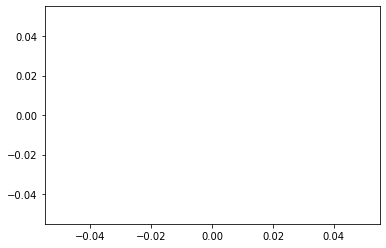

In [275]:
avgdivs = []
for shift in range(-10, 10):
    divergences = conf_divergences(texts_topics_df_uniq[texts_topics_df_uniq['Year']>=1988], 
                                   ['ACL', 'EMNLP', 'NAACL', 'COLING'], ['NIPS'], years=range(1988, 2018, 2), 
                                   shift=shift, topics=range(100))
    avgdiv = sum(divergences)/10
    print(shift, avgdiv)
    avgdivs.append(avgdiv)

plt.plot(range(-10,10), avgdivs)

## Conference correlation

In [276]:
neural_topics = [69, 78, 79, 55]

In [277]:
def _probs_for_conf(df, confs, topic=None, shift=None, years=None):
    counts_per_year = df[df['Conference'].isin(confs)][
                                     df['Dominant_Topic']==topic].groupby('Year', as_index=False).count()
    counts_per_year['Docs_per_year'] = counts_per_year['Year'].apply(lambda y: documents_per_year[y])
    counts_per_year['Probability'] = counts_per_year['Document']/counts_per_year['Docs_per_year']
    counts_per_year = counts_per_year.set_index('Year')
    if not years:
        years = range(1978, 2018, 2)
    probs = counts_per_year.reindex(years, fill_value=0)
    if shift:
        probs = probs.shift(shift, fill_value=probs.Probability.values[0])
    return probs.index, probs.Probability.values

def corr(df, conf1, conf2, topic=None, shift=None, plot=False, label1=None, label2=None, years=None):
    y, c1 = _probs_for_conf(df, conf1, topic, shift, years=years)
    y, c2 = _probs_for_conf(df, conf2, topic, years=years)
    if plot:
        if not label1:
            label1=",".join(conf1) + " - " + topic_names[topic]
        plt.plot(y, c1, '-', label=label1)
        if not label2:
            label2 = ",".join(conf2) + " - " + topic_names[topic]
        plt.plot(y, c2, '--', label=label2)
        plt.legend()
        plt.xlabel('Year')
        plt.ylabel('Correlation')
    corr = pearsonr(c1, c2)
    return corr[0]

max_corr = 0
max_topic = 0
correlated_topics = pd.DataFrame()
sumcorr = 0
cnt = 0
for t in range(100):
    if t in topics_to_remove or t in topics_to_merge:
        continue
    c = corr(texts_topics_df_uniq[texts_topics_df_uniq['Year']>=1994],
             ['ACL', 'EMNLP', 'COLING', 'NAACL'], 
             ['NIPS'], t, shift=0)
    sumcorr += c
    cnt += 1
    print(topic_names[t], c)
    correlated_topics = correlated_topics.append(pd.Series([c, t, topic_names[t]]), ignore_index=True)
    if c > max_corr:
        max_corr = c
        max_topic = t
correlated_topics.columns = ['Correlation', 'Topic', 'Topic_Name']
max_topic = correlated_topics.sort_values('Correlation', ascending=False).head(1).Topic
avg_corr = sumcorr/cnt
print("avg cor", avg_corr)

/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  This is separate from the ipykernel package so we can avoid doing imports until
/home/ana/.local/lib/python3.7/site-packages/ipykernel_launcher.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  This is separate from the ipykernel package so we can avoid doing imports until


NameError: name 'pearsonr' is not defined

In [ ]:
max_topic=correlated_topics.sort_values('Correlation', ascending=False).head(1).Topic.values[0]
plt.figure(figsize=(5,3))
corr(texts_topics_df_uniq[texts_topics_df_uniq['Year']>=1994], ['ACL', 'EMNLP', 'COLING', 'NAACL'],
     ['NIPS'], 78, shift=0, plot=True, label1='ACL Antology - NEURAL MT', label2='NIPS - NEURAL MT', 
     years=range(1994,2018,2))
correlated_topics.sort_values('Correlation', ascending=False).head(10)


In [ ]:
correlated_topics.Correlation.hist()

In [ ]:
corrs = []
shift_range = range(-35, 35)

for s in shift_range:
    tot_corr = 0
    cnt = 0
    for t in neural_topics:
        c = corr(texts_topics_df_uniq[texts_topics_df_uniq['Year']>=1994], ['ACL', 'EMNLP', 'NAACL', 'COLING'], 
                 ['NIPS'], t, s)
        if not np.isnan(c):
            tot_corr += c
            cnt += 1
    if cnt:
        corrs.append(tot_corr/cnt)
    else:
        corrs.append(np.nan)
print(corrs, np.nanargmax(corrs)+shift_range[0])



Text(0, 0.5, 'Correlation')

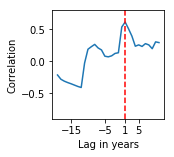

In [231]:
ax = plt.figure(figsize=(2,2))
# corrs_all_topics=corrs
plt.ylim((-0.9,0.8))
plt.plot(shift_range, corrs)
plt.axvline(x=np.nanargmax(corrs)+shift_range[0], c='r', ls='--')
plt.xticks(list(range(-15, 15, 10))+[np.nanargmax(corrs)+shift_range[0]])
plt.xlabel('Lag in years')
plt.ylabel('Correlation')

In [220]:
ax = plt.figure(figsize=(2,2))
# corrs_all_topics=corrs
plt.plot(shift_range, corrs_all_topics)
plt.axvline(x=np.nanargmax(corrs_all_topics)+shift_range[0], c='r', ls='--')
plt.xticks(list(range(-15, 15, 10))+[np.nanargmax(corrs_all_topics)+shift_range[0]])
plt.xlabel('Lag in years')
plt.ylabel('Correlation')

NameError: name 'corrs_all_topics' is not defined

<Figure size 144x144 with 0 Axes>

/home/ana/.local/lib/python3.5/site-packages/ipykernel_launcher.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  This is separate from the ipykernel package so we can avoid doing imports until


[nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, -0.24130441649470083, -0.341174090251015, -0.42908103705466, -0.5086866363950855, -0.5844909039408434, -0.6586205947627891, -0.7319764358311641, -0.8032241959895192, -0.7138209444040232, -0.5591807384153208, -0.4360041961170383, -0.30500197688935005, -0.18323235901108598, -0.08896585704670384, 0.013377146891014888, 0.09046516212301445, 0.17666812318624137, 0.317433471052181, 0.3451573945531212, 0.4495342438492773, 0.592017008038719, 0.7311773372004197, 0.6643677455905552, 0.5712993136613452, 0.5365109364291453, 0.43167524998335993, 0.30008769443862, 0.18441172323009877, 0.19632665687153672, 0.14050560983119803, 0.08840876817259113, 0.07914738287839063, 0.16309860005557142, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan]
-35


Text(0, 0.5, 'Correlation')

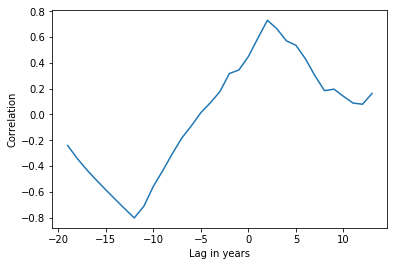

In [595]:
corrs = []
shift_range = range(-35, 35)
all_topics = set(texts_topics_df.Dominant_Topic.values)
for s in shift_range:
    tot_corr = 0
    for t in all_topics:
        c = corr(texts_topics_df_uniq[texts_topics_df_uniq['Year']>1988], ['ACL', 'EMNLP', 'COLING', 'NAACL'], 
                 ['NIPS'], t, s)
        tot_corr += c
    corrs.append(tot_corr/len(all_topics))
print(corrs)
print(np.argmax(corrs)+shift_range[0])
plt.plot(shift_range, corrs)
plt.xlabel('Lag in years')
plt.ylabel('Correlation')

In [566]:
corr(texts_topics_df_uniq[texts_topics_df_uniq['Year']>1988=, ['ACL', 'EMNLP', 'COLING', 'NAACL'], ['NIPS'], max_topic, 0, plot=True)

/home/ana/.local/lib/python3.5/site-packages/ipykernel_launcher.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  This is separate from the ipykernel package so we can avoid doing imports until


KeyError: 1964

/home/ana/.local/lib/python3.5/site-packages/ipykernel_launcher.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  This is separate from the ipykernel package so we can avoid doing imports until


0.7890474225875365

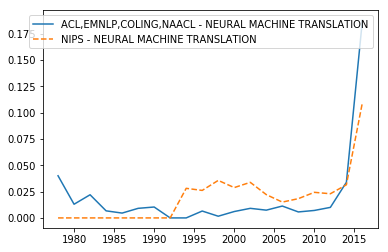

In [536]:
corr(texts_topics_df_uniq[texts_topics_df_uniq['Year']>=1978], ['ACL', 'EMNLP', 'COLING', 'NAACL'], ['NIPS'], 78, 0, plot=True)

/home/ana/.local/lib/python3.5/site-packages/ipykernel_launcher.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  This is separate from the ipykernel package so we can avoid doing imports until


[-0.3820182260820846, -0.4123579487549751, -0.44059947949369355, -0.4635235470252066, -0.09200825708753026, 0.10495767921577173, 0.13905264499645364, 0.1904794896710757, 0.15449104831691216, 0.14591895030349983, 0.05884570835374289, 0.060383082456899176, 0.07723527510269496, 0.1147813773022692, 0.13022764407189416, 0.5276636397952004, 0.5716487015127447, 0.5988422782674419, 0.6868249116475884, 0.5410558115420471, 0.49872134254959466, 0.40567217953833634, 0.3202119194708154, 0.19261199785072086, 0.09676833791219694, 0.1487771814594312, 0.09624945804506581, 0.10272077587831302, 0.3253335476659209, 0.43394998771213655]
3


Text(0, 0.5, 'Correlation')

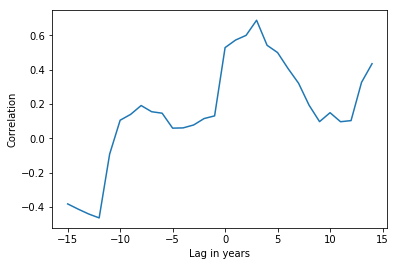

In [604]:
corrs = []
shift_range = range(-15, 15)
max_corr = 0
max_topic = 0
max_shift = 0
for s in shift_range:
    tot_corr = 0
    for t in neural_topics:
        c = corr(texts_topics_df_uniq[texts_topics_df_uniq['Year']>=1988], 
                 ['ACL', 'EMNLP', 'COLING', 'NAACL'], ['NIPS'], t, s)
        if not np.isnan(c):
            tot_corr += c
        if c > max_corr:
            max_corr = c
            max_topic = t
            max_shift = s
    corrs.append(tot_corr/len(neural_topics))
print(corrs)
print(np.nanargmax(corrs)+shift_range[0])
plt.plot(shift_range, corrs)
plt.xlabel('Lag in years')
plt.ylabel('Correlation')

In [601]:
texts_topics_df_uniq[texts_topics_df_uniq['Conference']=='NIPS'].sort_values('Year')

,Document,Title,Dominant_Topic,Perc_Contribution,Topic_Keywords,Year,Topic_Name,Conference
304704,1160-harmony-networks-do-not-work,Harmony Networks Do Not Work,8.0,0.0708,"constraint, solution, variable, solve, inferen...",1994,LINEAR PROGRAMMING,NIPS
308869,1020-a-computational-model-of-prefrontal-corte...,A Computational Model of Prefrontal Cortex Fun...,46.0,0.0236,"target, transfer, projection, mapping, project...",1994,TRANSFER LEARNING,NIPS
308870,1020-a-computational-model-of-prefrontal-corte...,A Computational Model of Prefrontal Cortex Fun...,65.0,0.0200,"pattern, seed, extraction, acquire, acquisitio...",1994,INFORMATION EXTRACTION?,NIPS
308871,1020-a-computational-model-of-prefrontal-corte...,A Computational Model of Prefrontal Cortex Fun...,41.0,0.0179,"distribution, probability, sample, variable, l...",1994,PROBABILISTIC MODELS,NIPS
308872,1020-a-computational-model-of-prefrontal-corte...,A Computational Model of Prefrontal Cortex Fun...,19.0,0.0158,"letter, phoneme, syllable, pronunciation, phon...",1994,PHONOLOGY,NIPS
308873,1020-a-computational-model-of-prefrontal-corte...,A Computational Model of Prefrontal Cortex Fun...,66.0,0.0111,"user, tool, module, interface, component, supp...",1994,HUMAN-COMPUTER INTERACTION/APPLICATION,NIPS
308874,1020-a-computational-model-of-prefrontal-corte...,A Computational Model of Prefrontal Cortex Fun...,8.0,0.0110,"constraint, solution, variable, solve, inferen...",1994,LINEAR PROGRAMMING,NIPS
287624,1155-exploiting-tractable-substructures-in-int...,Exploiting Tractable Substructures in Intracta...,16.0,0.0119,"segment, segmentation, boundary, unit, length,...",1994,DISCOURSE SEGMENTATION,NIPS
287623,1155-exploiting-tractable-substructures-in-int...,Exploiting Tractable Substructures in Intracta...,19.0,0.0121,"letter, phoneme, syllable, pronunciation, phon...",1994,PHONOLOGY,NIPS
308868,1020-a-computational-model-of-prefrontal-corte...,A Computational Model of Prefrontal Cortex Fun...,17.0,0.0244,"temporal, anchor, event, tense, expression, in...",1994,EVENTS/TEMPORAL,NIPS


/home/ana/.local/lib/python3.5/site-packages/ipykernel_launcher.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  This is separate from the ipykernel package so we can avoid doing imports until


8 0.6980807211382133


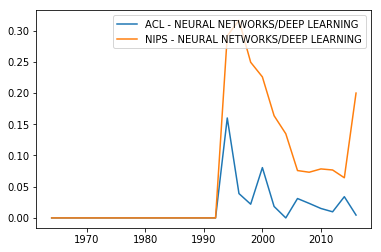

In [452]:
corr(texts_topics_df_uniq, ['ACL'], ['NIPS'], max_topic, max_shift, plot=True)
print(max_shift, max_corr)

In [171]:
corrs = []
shift_range = range(-10, 30)
recurring_topics = set()
for s in shift_range:
    for t in range(100):
        c = corr(['ACL'], ['ACL'], t, s)
        if c > 0.6 and abs(s)>8:
            print(s, c, topic_names[t])
            recurring_topics.add(t)
        corrs.append(c)
            


/home/ana/.local/lib/python3.5/site-packages/ipykernel_launcher.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  This is separate from the ipykernel package so we can avoid doing imports until


8 0.6534764401382607 ESTIMATORS/STATISTICAL METHODS?
8 0.6942169499856427 LANGUAGE MODELS (CLASSIC)
8 0.7848400987798827 CLASSIFICATION
8 0.7708355766610249 MACHINE LEARNING
8 0.6493150976422705 LEXICAL SEMANTICS
8 0.7550287408283989 POS TAGGING
8 0.704891364163786 MANUAL ANNOTATION
15 0.643065805401374 ESTIMATORS/STATISTICAL METHODS?
16 0.6155896877266327 CLASSIFICATION
22 0.6411105587230056 DEPENDENCY PARSING
22 0.681920994711958 MANUAL ANNOTATION
23 0.6282670447771327 MANUAL ANNOTATION
27 0.6071181628481648 CLASSIFICATION


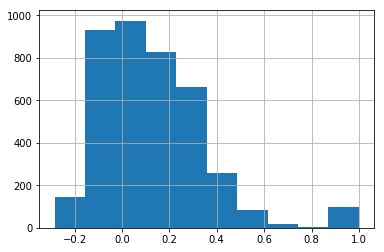

In [172]:
pd.Series(corrs).hist()

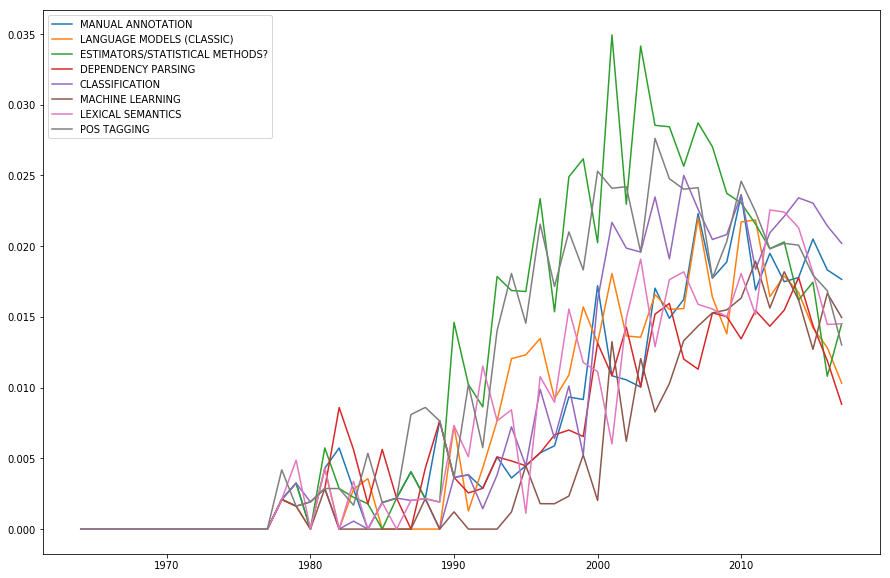

In [173]:
plot_for_topics(recurring_topics, conferences=['ACL'])

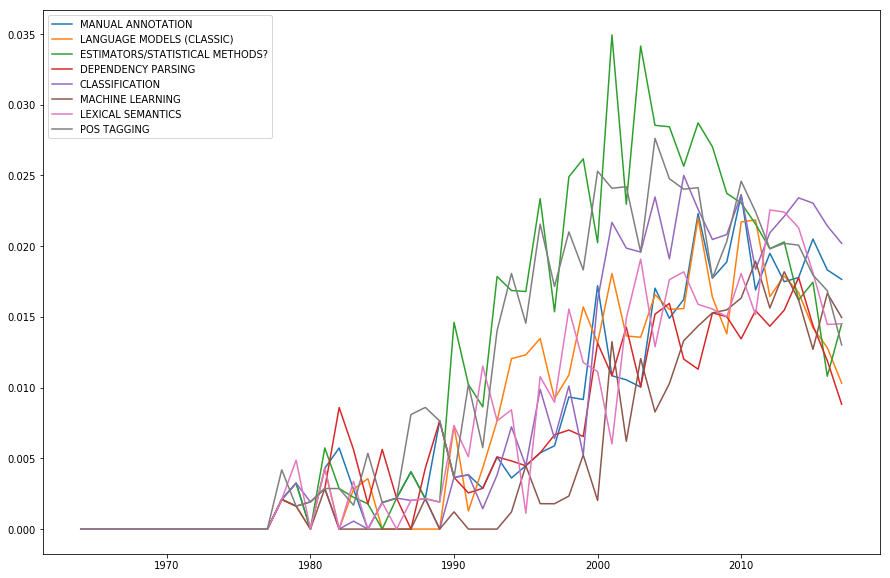

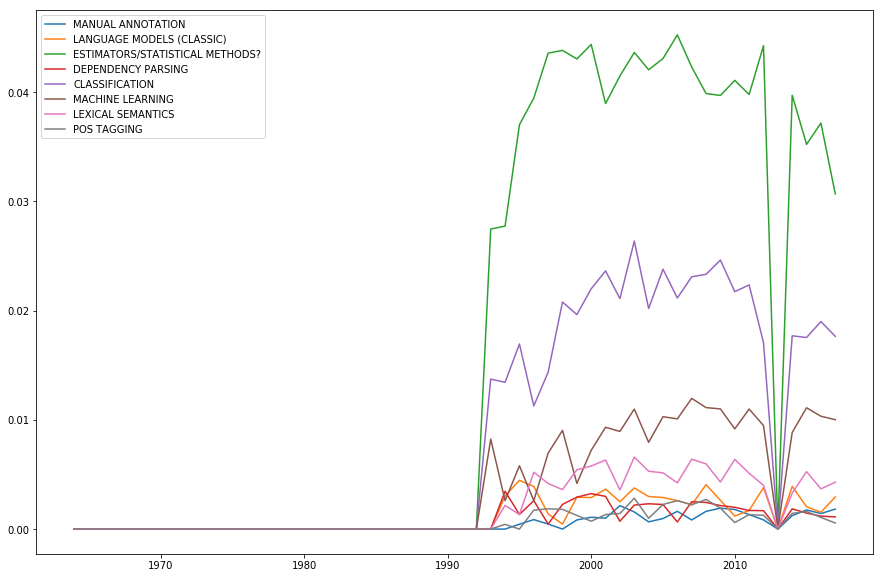

In [175]:
plot_for_topics(recurring_topics, conferences=['ACL'])
plot_for_topics(recurring_topics, conferences=['NIPS'])